In [1]:
import sys
sys.executable
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import random
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import keras
from pandas import DataFrame
from pandas import read_csv
import math
from numpy import savetxt
from keras import layers
from tensorflow.keras.layers import Input, LSTM, Dense, Reshape, Dropout
from tensorflow.keras.models import Model, Sequential
from scipy.integrate import odeint, RK45
from tensorflow.keras.utils import plot_model
import timeit
from functools import partial
tf.keras.backend.set_floatx('float64')
tf.keras.backend.clear_session()
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


## Mass-Spring-System
<img src="NLmimo.png">


In [2]:
# Use ODEINT to solve the differential equations defined by the vector field
from scipy.integrate import odeint

def vectorfield(w, t, p):
    """
    Defines the differential equations for the coupled spring-mass system.

    Arguments:
        w :  vector of the state variables:
                  w = [x1,y1,x2,y2]
        t :  time
        p :  vector of the parameters:
                  p = [m1,m2,k1,k2,L1,L2,b1,b2]
    """
    x1, v1, x2, v2, x3, v3 = w
    m, k, kp, d, u1, u2, dist = p

    # Create f = (x1',y1',x2',y2'):
    f = [v1,
         (k * ((-2 * x1) + x2) + kp * (-x1 ** 3 + (x2 - x1) ** 3) + d * (v2-2*v1)) / m + u1,
         v2,
         (k * (x1 - (2 * x2) + x3) + kp * ((x3 - x2) ** 3 - (x2 - x1) ** 3) + d * (v1-2*v2+v3)) / m + u2,
         v3,
         (k * (x2 - x3) + kp * ((x2 - x3) ** 3) + d* (v2-v3)) / m + dist]
    return f

In [3]:
train_df = pd.read_csv('u1500newage20000_0.001ssim.csv')
val_df= pd.read_csv('u1500validationdatanewage5k_0.001ssim.csv')
test_df = pd.read_csv('u1500testdata5k_0.001ssim.csv')

train_mean = train_df.mean()
train_std = train_df.std()
train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

In [4]:
batchsize= 16

In [5]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, 
               test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

In [6]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [7]:
def plot(self, plot_col, model=None, max_subplots=1):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(3, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Timestep ')

WindowGenerator.plot = plot

In [8]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float64)
  ds = tf.keras.preprocessing.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=False,
      batch_size=batchsize,)
  ds = ds.map(self.split_window)
  return ds

WindowGenerator.make_dataset = make_dataset

In [9]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

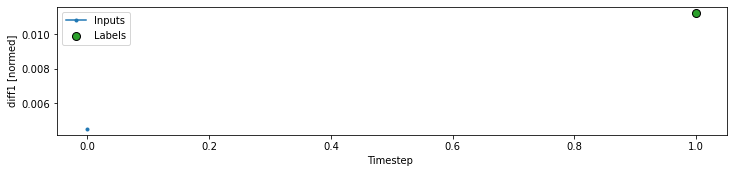

In [10]:
OUT_STEPS = 1
multi_window = WindowGenerator(input_width=1,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS,
                              label_columns= ['diff1','diff3']
                              )

multi_window.plot('diff1')

In [11]:
for example_inputs, example_labels in multi_window.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')
multi_window.train

Inputs shape (batch, time, features): (16, 1, 9)
Labels shape (batch, time, features): (16, 1, 2)


<MapDataset shapes: ((None, 1, 9), (None, 1, 2)), types: (tf.float64, tf.float64)>

In [12]:
MAX_EPOCHS = 100
def compile(model, lr=0.001):
      model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(learning_rate=lr),
                metrics=[tf.metrics.MeanSquaredError()],
                   experimental_steps_per_execution=10

                    )
        
def scheduler(epoch, lr):
    if epoch > 100:
        return lr * tf.math.exp(-0.01)
    else: return lr

def fit(model, window, patience=150):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')
  callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
  history = model.fit(window.train, epochs=MAX_EPOCHS,
                     validation_data=window.val,
                  #    callbacks=[early_stopping,
                   #  callback
                         #       ]
                     )
  return history

multi_val_performance = {}
multi_performance = {}
num_label=2

In [13]:
hiddennodes=40

In [14]:
from functools import partial
multi_resdense_model = tf.keras.Sequential([
    # Take the last time step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -1:, :]),
    # Shape => [batch, 1, dense_units]
  tf.keras.layers.Dense(hiddennodes, activation=partial(tf.nn.leaky_relu, alpha=0.5)),
    tf.keras.layers.Dense(OUT_STEPS*num_label,
                         kernel_initializer=tf.initializers.zeros
                         ),
])
compile(multi_resdense_model)

In [15]:
#train_mean = np.zeros((1,9))
#train_std = np.array(([[867, 288, 867, 1.3, 2.6, 0.06, 0.08,0.03, 0.04]]))
#train_std

In [16]:
def standardize(modelinput):
    modelinput = (modelinput -train_mean) / train_std
    return modelinput

def destandardize(modeloutput):
    modeloutput = (modeloutput * train_std) + train_mean
    return modeloutput

def denormalize(outputs):
    outputs = outputs * diffstd + diffmean
    return outputs

In [17]:
np.random.seed(28)

#compile pre-defined Neural Network Model
compile(multi_resdense_model)

#Simulation Parameters
reptrain= 16
currepoch=0
epsilon= 20000 
start_sim= 2*epsilon 
num_sim= int(start_sim + 600)
savepred= np.zeros((num_sim, 2))
horizon= 10
chor= int(horizon / 2)
num_randactions=300
maxdeltau= 1000
maxact= 1000
minact= -maxact

#Set initial conditions
hist= np.zeros((1,9))
prevv= 0
prev= 0
value1=0
values11=0
value3=0
value33=0
w0= [0, 0, 0, 0, 0, 0]
temp= hist[-1:]
histo= np.zeros((1,9))
bestpred= np.zeros((horizon,2))
savecost=np.zeros((num_sim,1))
savew0=np.zeros((num_sim,6))

#Reference Values
ref = np.ones((horizon,2))
ref[:,1]*=2

# Masses:
m = 0.5 
mdec= 0.49
# Spring constants
kp = 63.5
k = 217.0
#Damper constant
d= 0.25
#noise
noise=np.random.randn(1,1)
# ODE solver parameters
abserr = 1.0e-8
relerr = 1.0e-6
scale=1
interval= 0.001
stoptime = interval*2

action_sequence= pd.read_csv('action_sequence.csv')

#Start Simulation
start_time = timeit.default_timer()
for run in range(num_sim):
    print("\n",run,"\n")
    minJ=10000
    disturb = 200 * (np.random.rand(1,1)-0.5)
    histo[:]= temp[:]
    bestaction= np.zeros((1,2))
    
    #Collect Training Data 
    if run < start_sim:
        prevaction= [histo[-1,0], histo[-1,2]]
        action= np.ones((1,2)) * prevaction
        bestaction[0,0]= action_sequence.iloc[run,0]
        bestaction[0,1]= action_sequence.iloc[run,2]
            
    #Recalculate Training Data Mean and Standard Deviation every episode
    if (run+1) % epsilon == 0:
        train_data= pd.DataFrame(data=hist[-epsilon:],columns =["u1","dist.","u2","x1","x3","diff21","diff23","diff1","diff3"]) 
        train_mean= train_data.mean()
        train_std= train_data.std()
        print("Recalculating arithmetic mean and standard deviation of training data..... \n")
        print("Train Mean: \n", train_mean, "\n")
        print("Train Std.: \n", train_std, "\n")
        train_mean= train_mean.values
        train_std= train_std.values
        diffstd = train_std[-2:]
        diffmean = train_mean[-2:]
    if(run+1) == 22000:
        m=0.98*m
    #Start Control once pretraining finished
    if run > start_sim: 
        if (run+1) == (num_sim - start_sim)/2:
            ref= np.zeros((horizon,2))
        if (run+1) == (num_sim - 300):
            ref= np.zeros((horizon,2))
        for jj in range (num_randactions): 
            prevaction= [histo[-1,0], histo[-1,2]]
            action= np.ones((horizon,2)) * prevaction
            for plan in range(chor):
                actii= maxdeltau*2*(np.random.rand(1,2)-0.5)
                action[plan:] += actii
                
                if action[plan,0] > maxact:
                    action[plan:,0] = maxact
                if action[plan,0] < minact:
                    action[plan:,0] = minact
                if action[plan,1] > maxact:
                    action[plan:,1] = maxact
                if action[plan,1] < minact:
                    action[plan:,1] = minact

            prednorm = np.zeros((horizon,2))
            predstate = np.zeros((horizon,2))  
            histo[-1,1] = disturb
            for kk in range(horizon):
                histo[-1,0] = action[kk,0]
                histo[-1,2] = action[kk,1]
                curr = histo[-1,3:5] 
                historstd=standardize(histo)
                prednorm[kk,:]=denormalize(multi_resdense_model(np.array([historstd]))[0])
                predstate[kk,:]= curr + prednorm[kk,:]
                histo[-1,3:5]= predstate[kk,:] 
                histo[-1,5:7]= histo[-1,-2:] + prednorm[kk,:]
                histo[-1,-2:]= prednorm[kk,:]
            histo[:]= temp[:]
            predJ= np.sum((predstate - ref) ** 2) 

            predJ+= 5*((predstate[horizon-1,0] - predstate[0,0])**2) 
            predJ+= 5*((predstate[horizon-1,1] - predstate[0,1])**2) 

            if predJ < minJ:
                bestaction = action
                minJ = predJ
                bestpred= predstate
        savepred= bestpred[0,:]
        print("bestpred: \n", bestpred)
        print("\nmin cost over horizon: ", minJ)
        print("best Actions [N]: ",bestaction[0,:])
    
    #Simulate system for dt = 0.001s
    for ts in range(1):
        prevv = prev
        t = np.array([stoptime * float(ts), stoptime * float(ts+1)])
        dist= 200 * (np.random.rand(1,1)-0.5)
        p = [m, k, kp, d, bestaction[0,0]+noise,dist, bestaction[0,1]+noise]
        # Call the ODE solver.
        wsol1 = odeint(vectorfield, w0, t, args=(p,),atol=abserr, rtol=relerr)
        wsol1 = wsol1.flatten()
        prev = np.array([[wsol1[0],wsol1[4]]])
        value11=value1
        value33=value3
        value1= wsol1[0]
        value3= wsol1[4]
        w0 = wsol1[6:]
        #current cost
        currentcost = (w0[0] - 1)**2 + (w0[4] - 2)**2
        if run > 40300:
            currentcost = (w0[0] - 0)**2 + (w0[4] - 0)**2
        savecost[run]= currentcost
        print("current cost: ",currentcost, "\n")
        print("Applied Actions [N]: ",bestaction[0,:], "\n")
        wstate= np.array([w0[0],w0[4]])
        diff1= w0[0] - value1
        diff3= w0[4] - value3
        diff21= w0[0] - value11
        diff23= w0[4] - value33
        diff= [[diff1, diff3]]
        diff2= [[diff21, diff23]]
        new = np.hstack((np.array([[bestaction[0,0]]]),dist,np.array([[bestaction[0,1]]]),[wstate],diff2,diff))  
        hist = np.vstack((hist, new))
        print(pd.DataFrame(data=np.array([w0]),columns =["x1", "v1", "x2", "v2", "x3", "v3"]) )
        savew0[run]= np.array([w0])

        #Train Network every reptrain
        
        if (run+1) % (reptrain) == 0 and run > epsilon:
            #DO one epoch
            print(run)
            history=pd.DataFrame(data=hist[-reptrain:],columns =["u1","dist.","u2","x1","x3","diff21","diff23","diff1","diff3"])    
            train_df= history[:int(1*reptrain)]
            val_df= history[int(0.8*reptrain):int(1*reptrain)]
            test_df= history[int(0.8*reptrain):int(1*reptrain)]
            train_df = (train_df - train_mean) / train_std
            val_df = (val_df - train_mean) / train_std
            test_df = (test_df - train_mean) / train_std
            multi_window = WindowGenerator(input_width=1,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS, train_df=train_df, val_df=val_df, test_df=test_df,
                              label_columns= ['diff1','diff3']
                              )
            WindowGenerator.train = train
            WindowGenerator.val = val
            WindowGenerator.test = test
            WindowGenerator.example = example
            WindowGenerator.split_window = split_window
            WindowGenerator.make_dataset = make_dataset
            history=multi_resdense_model.fit(multi_window.train, epochs=1,
                                             #validation_data=multi_window.val
                                            )
            currepoch+=1
            print("current epoch: ", currepoch)
    temp= hist[-1,:]
    #print("temp: ",temp, "\n")    
elapsed = timeit.default_timer() - start_time 
print(elapsed)
print(m)
thisishistory=pd.DataFrame(data=hist,columns =["u1","dist.","u2","x1", "x3","diff21","diff23","diff1","diff3"])


 0 

current cost:  4.99999476492262 

Applied Actions [N]:  [0. 0.] 

             x1        v1        x2        v2            x3       v3
0  8.722327e-07  0.000859 -0.000041 -0.040897  8.726534e-07  0.00086

 1 

current cost:  4.998575070740198 

Applied Actions [N]:  [229.01374229  61.23960233] 

         x1        v1        x2       v2        x3        v3
0  0.000461  0.458943 -0.000118 -0.03582  0.000126  0.124024

 2 

current cost:  4.993178027326634 

Applied Actions [N]:  [500.          72.23258398] 

         x1        v1        x2        v2        x3       v3
0  0.002376  1.455689 -0.000046  0.108197  0.000519  0.26887

 3 

current cost:  4.9811137071523115 

Applied Actions [N]:  [182.69335842 425.74545923] 

         x1       v1       x2        v2        x3        v3
0  0.005645  1.81216  0.00037  0.307933  0.001908  1.119949

 4 

current cost:  4.961215863987254 

Applied Actions [N]:  [ 78.11619825 436.41519398] 

         x1        v1        x2        v2        x3  

         x1        v1        x2        v2        x3      v3
0  0.031376 -14.20697  0.275501  5.084562  0.235274  1.2092

 49 

current cost:  4.10120727222036 

Applied Actions [N]:  [-500.           -4.54007302] 

         x1         v1        x2        v2        x3       v3
0  0.002205 -14.953148  0.285434  4.841626  0.237725  1.24298

 50 

current cost:  4.152307120699461 

Applied Actions [N]:  [-42.29787699  13.74890431] 

        x1         v1        x2       v2        x3        v3
0 -0.02748 -14.721689  0.294597  4.31482  0.240286  1.319069

 51 

current cost:  4.205393266911283 

Applied Actions [N]:  [ -46.85475449 -249.67439583] 

        x1         v1        x2        v2        x3        v3
0 -0.05665 -14.438544  0.302968  4.048783  0.242478  0.873548

 52 

current cost:  4.261229833812243 

Applied Actions [N]:  [-470.2778819  113.214442 ] 

        x1         v1        x2        v2       x3        v3
0 -0.08604 -14.941058  0.310619  3.596182  0.24451  1.158795

 53 

cu

         x1        v1        x2        v2        x3        v3
0 -0.046673  7.551845  0.048156  0.471575  1.022112  9.872995

 90 

current cost:  1.9834261329305063 

Applied Actions [N]:  [-103.86327504  278.97042705] 

         x1        v1        x2        v2        x3        v3
0 -0.031676  7.441738  0.050214  1.592332  1.041318  9.329036

 91 

current cost:  1.9186346940569554 

Applied Actions [N]:  [-100.15861207  327.77973699] 

         x1        v1        x2        v2       x3        v3
0 -0.016913  7.317202  0.054455  2.653668  1.05951  8.859212

 92 

current cost:  1.85941871670045 

Applied Actions [N]:  [-210.11640735 -140.04493896] 

        x1        v1        x2        v2        x3        v3
0 -0.00264  6.953515  0.060724  3.618994  1.075807  7.435849

 93 

current cost:  1.8080825073741291 

Applied Actions [N]:  [-500.          100.15397959] 

         x1        v1        x2        v2        x3        v3
0  0.010311  5.994911  0.069058  4.716138  1.089726  6.48230

0  0.363064  9.419172  0.715368 -15.440379  0.32981  5.813013

 146 

current cost:  3.1288369862091523 

Applied Actions [N]:  [-94.49499492 500.        ] 

         x1        v1        x2         v2       x3        v3
0  0.381648  9.153408  0.683822 -16.090146  0.34275  7.119563

 147 

current cost:  3.055450434902287 

Applied Actions [N]:  [ 33.91713297 500.        ] 

         x1        v1        x2        v2        x3        v3
0  0.399891  9.078886  0.651166 -16.55033  0.358257  8.379927

 148 

current cost:  2.977130257816444 

Applied Actions [N]:  [ 34.09607569 237.00492051] 

        x1        v1        x2         v2        x3        v3
0  0.41792  8.939616  0.617689 -16.911398  0.375712  9.066567

 149 

current cost:  2.8971402992058928 

Applied Actions [N]:  [-394.82393516  241.34716705] 

         x1        v1        x2         v2      x3        v3
0  0.434749  7.879438  0.583373 -17.388629  0.3945  9.713339

 150 

current cost:  2.8166852551343764 

Applied Actions 

         x1        v1        x2        v2        x3         v3
0 -0.894767  2.532179  0.248438  0.808012  0.498227 -14.270323

 200 

current cost:  5.900670378611989 

Applied Actions [N]:  [126.25718549 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.887132  5.097839  0.248689 -0.558311  0.470489 -13.463118

 201 

current cost:  5.9305194643896915 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -0.873657  8.367472  0.246508 -1.620603  0.444388 -12.634478

 202 

current cost:  5.932747751357299 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2       v2        x3         v3
0 -0.853708  11.56905  0.242238 -2.64382  0.419963 -11.787929

 203 

current cost:  5.908362460561927 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -0.827442  14.679944  0.236011 -3.575319  0.397246 -10.926873

 204 

current cost:  5.859531168940


 256 

current cost:  4.679936980540859 

Applied Actions [N]:  [110.21667631  13.74518536] 

         x1         v1        x2         v2        x3        v3
0  0.424349 -16.113903  0.312905  13.752684 -0.085321 -1.586322

 257 

current cost:  4.73108765435478 

Applied Actions [N]:  [ 263.55943616 -183.05370172] 

         x1         v1        x2         v2        x3        v3
0  0.392239 -15.982837  0.340259  13.587232 -0.088472 -1.559374

 258 

current cost:  4.785574094953745 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3       v3
0  0.360945 -15.297317  0.367123  13.263124 -0.092172 -2.13558

 259 

current cost:  4.843556661580704 

Applied Actions [N]:  [ 500.         -351.13565828] 

         x1         v1        x2         v2        x3        v3
0  0.331101 -14.534416  0.393286  12.886631 -0.096695 -2.382421

 260 

current cost:  4.904071796260723 

Applied Actions [N]:  [ 500.         -470.41377558] 

         x1         v1  

         x1        v1        x2         v2        x3         v3
0  0.401919  9.430468 -0.753766 -11.742934 -0.737993 -14.693065

 314 

current cost:  7.995848386941483 

Applied Actions [N]:  [500.         -87.60834737] 

         x1        v1        x2         v2        x3         v3
0  0.419958  8.593484 -0.775946 -10.426613 -0.767562 -14.874395

 315 

current cost:  8.144422613612486 

Applied Actions [N]:  [ 500.         -147.57773675] 

         x1        v1        x2        v2        x3         v3
0  0.436234  7.668421 -0.795107 -8.724813 -0.797604 -15.166061

 316 

current cost:  8.296516179036853 

Applied Actions [N]:  [238.35345311 271.27984527] 

         x1       v1        x2       v2       x3         v3
0  0.450057  6.14292 -0.810918 -7.07805 -0.82738 -14.607555

 317 

current cost:  8.446009951492853 

Applied Actions [N]:  [-144.48982589  487.63662537] 

         x1        v1        x2        v2        x3         v3
0  0.459999  3.790808 -0.823275 -5.274881 -0.855593

0 -1.081179 -12.548099 -0.773808 -19.892534 -1.61803  14.342161

 358 

current cost:  17.310039941587938 

Applied Actions [N]:  [-175.57834166  -81.24016823] 

         x1         v1        x2         v2        x3         v3
0 -1.105078 -11.347344 -0.814714 -20.993771 -1.588689  14.982937

 359 

current cost:  17.187281182573372 

Applied Actions [N]:  [-378.11080412 -277.99176162] 

        x1         v1        x2         v2        x3         v3
0 -1.12696 -10.531608 -0.857819 -22.092119 -1.558556  15.133601

 360 

current cost:  17.053803958047226 

Applied Actions [N]:  [-500.          147.50358598] 

         x1        v1        x2         v2        x3         v3
0 -1.147438 -9.944527 -0.902981 -23.050477 -1.527366  16.040928

 361 

current cost:  16.91149187439533 

Applied Actions [N]:  [-500.         -250.21389644] 

        x1        v1        x2         v2       x3         v3
0 -1.16673 -9.346194 -0.949872 -23.821868 -1.49525  16.060771

 362 

current cost:  16.768915938


current cost:  13.870945080075746 

Applied Actions [N]:  [-88.07068089 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.343989 -1.966643 -0.940546  35.895607 -1.473419 -3.146222

 411 

current cost:  13.920727351607203 

Applied Actions [N]:  [98.33624708 42.09475715] 

         x1        v1        x2         v2        x3        v3
0 -0.347919 -1.948031 -0.868923  35.699079 -1.479058 -2.478652

 412 

current cost:  13.956101882603248 

Applied Actions [N]:  [ 14.16539987 381.09658714] 

         x1        v1        x2         v2        x3        v3
0 -0.351893 -2.013025 -0.797649  35.547084 -1.482598 -1.046585

 413 

current cost:  13.971324559651496 

Applied Actions [N]:  [-334.05355028  500.        ] 

         x1       v1        x2         v2        x3        v3
0 -0.356613 -2.69323 -0.727072  35.003002 -1.482948  0.710771

 414 

current cost:  13.964112196578846 

Applied Actions [N]:  [-170.76625546  500.        ] 

         x1       v1   

         x1         v1        x2         v2        x3         v3
0  0.725658  24.657544  0.039227  10.411114  1.296095  24.750588

 463 

current cost:  0.48253706141833186 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.774499  24.168436  0.062575  12.949137  1.342971  22.118084

 464 

current cost:  0.40979704463350547 

Applied Actions [N]:  [ 500.         -266.34573522] 

         x1         v1        x2         v2        x3         v3
0  0.822273  23.590506  0.090678  15.162122  1.385012  19.918376

 465 

current cost:  0.3502487263426596 

Applied Actions [N]:  [ 500.        -130.2014608] 

         x1         v1        x2         v2        x3         v3
0  0.868806  22.929401  0.123296  17.458791  1.422907  17.974785

 466 

current cost:  0.30306457193620867 

Applied Actions [N]:  [ 500.         -459.16780147] 

         x1         v1        x2         v2        x3         v3
0  0.913939  22.191962  0.160747  19.9

         x1        v1        x2         v2        x3       v3
0  1.227643  3.558828  1.792148 -32.395311  2.066525  22.7203

 521 

current cost:  0.06665658025354988 

Applied Actions [N]:  [-500.          107.71047767] 

         x1        v1        x2         v2        x3         v3
0  1.232694  1.478165  1.727407 -32.316246  2.111849  22.586286

 522 

current cost:  0.0796177332790082 

Applied Actions [N]:  [-23.83127676 205.31078342] 

         x1        v1        x2         v2        x3         v3
0  1.234459  0.275015  1.662971 -32.089259  2.156993  22.539851

 523 

current cost:  0.09529386266544822 

Applied Actions [N]:  [15.76427092  7.95890714] 

         x1        v1       x2         v2        x3         v3
0  1.233831 -0.912866  1.59894 -31.912573  2.201537  21.984026

 524 

current cost:  0.11265485095182726 

Applied Actions [N]:  [-460.12370559 -107.60005058] 

         x1        v1        x2         v2        x3         v3
0  1.229821 -3.104383  1.535395 -31.60250

         x1        v1        x2         v2        x3        v3
0 -0.133427  15.68894  0.881485 -23.599521  0.374014 -25.17761

 575 

current cost:  4.018542178586021 

Applied Actions [N]:  [500.         -36.86743638] 

         x1         v1        x2         v2        x3         v3
0 -0.099896  17.814939  0.832607 -25.256255  0.324061 -24.775298

 576 

current cost:  4.102459207611804 

Applied Actions [N]:  [500.         240.52482136] 

        x1         v1        x2         v2        x3         v3
0 -0.06228  19.772549  0.780643 -26.684025  0.275465 -23.821584

 577 

current cost:  4.182539646823512 

Applied Actions [N]:  [ 500.         -183.63363424] 

         x1         v1        x2         v2        x3         v3
0 -0.020919  21.559732  0.725846 -28.089146  0.227921 -23.723926

 578 

current cost:  4.262559870333256 

Applied Actions [N]:  [500.         -91.39753354] 

         x1        v1        x2         v2        x3         v3
0  0.023846  23.17675  0.668681 -29.0521

        x1         v1        x2        v2        x3        v3
0 -1.16904 -36.282989 -0.486329 -4.274756 -1.253761  5.235822

 632 

current cost:  15.523471373368636 

Applied Actions [N]:  [-131.69393836  500.        ] 

         x1         v1        x2        v2        x3        v3
0 -1.239636 -34.277805 -0.496181 -5.584899 -1.241527  6.992827

 633 

current cost:  15.72404190854348 

Applied Actions [N]:  [308.74066993 149.05773203] 

         x1         v1        x2        v2        x3        v3
0 -1.305133 -31.185858 -0.508816 -7.053995 -1.226515  8.012971

 634 

current cost:  15.892650671724464 

Applied Actions [N]:  [-64.8811313 263.828003 ] 

         x1        v1        x2        v2        x3        v3
0 -1.364998 -28.64748 -0.524436 -8.568231 -1.209273  9.222001

 635 

current cost:  16.0265025575546 

Applied Actions [N]:  [-180.24309222  500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.419834 -26.158784 -0.543009 -10.00504 -1.189186 

         x1        v1       x2        v2       x3         v3
0  0.385191 -2.033965 -0.35455  42.43504 -1.15094 -24.875848

 687 

current cost:  10.619740704925716 

Applied Actions [N]:  [-268.32939104  275.90245045] 

        x1        v1        x2         v2        x3         v3
0  0.37958 -3.556862 -0.269943  42.121538 -1.199191 -23.343234

 688 

current cost:  10.917979468864248 

Applied Actions [N]:  [-500.          499.62524926] 

        x1        v1        x2         v2        x3         v3
0  0.37058 -5.424178 -0.186146  41.622727 -1.243734 -21.165858

 689 

current cost:  11.194972810968792 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3        v3
0  0.357962 -7.174143 -0.103679  40.791161 -1.283711 -18.77486

 690 

current cost:  11.452614534078169 

Applied Actions [N]:  [-500.           51.96526618] 

        x1        v1        x2         v2        x3         v3
0  0.34196 -8.808976 -0.023136  39.696768 -1.319578 -17.05279

         x1        v1        x2        v2        x3        v3
0 -0.464744 -5.312607 -1.113129  6.632578  0.418619 -6.505042

 742 

current cost:  4.722290292256293 

Applied Actions [N]:  [500.         170.55841201] 

         x1        v1        x2        v2        x3        v3
0 -0.474541 -4.476814 -1.096926  9.550019  0.403748 -8.351095

 743 

current cost:  4.809028187467315 

Applied Actions [N]:  [ 372.7495577  -259.84451036] 

         x1        v1        x2         v2        x3         v3
0 -0.482877 -3.852302 -1.075278  12.074093  0.384419 -10.960268

 744 

current cost:  4.906463346487653 

Applied Actions [N]:  [500.          88.47761112] 

         x1        v1        x2         v2        x3         v3
0 -0.489666 -2.928367 -1.048675  14.501748  0.360683 -12.754197

 745 

current cost:  5.009962171680877 

Applied Actions [N]:  [500.         238.77852612] 

         x1        v1        x2         v2        x3         v3
0 -0.494561 -1.959272 -1.017313  16.829679  0.3337

         x1        v1        x2         v2        x3         v3
0  0.707295  3.908819 -0.541652 -30.823766 -1.272671  11.118579

 797 

current cost:  10.640925058751346 

Applied Actions [N]:  [500.         158.81319408] 

         x1       v1       x2         v2        x3         v3
0  0.713742  2.51468 -0.60222 -29.704319 -1.249459  12.076775

 798 

current cost:  10.481183741967897 

Applied Actions [N]:  [ 500.         -174.05517711] 

         x1        v1        x2         v2        x3         v3
0  0.717258  0.977636 -0.660394 -28.431139 -1.225095  12.270844

 799 

current cost:  10.326734268227455 

Applied Actions [N]:  [ 202.54568806 -474.60014614] 

        x1        v1        x2         v2        x3         v3
0  0.71697 -1.286411 -0.715607 -26.746568 -1.201035  11.775243

 800 

current cost:  10.182885342022125 

Applied Actions [N]:  [ 500. -500.] 

        x1        v1        x2       v2        x3         v3
0  0.71263 -3.070763 -0.767303 -24.9185 -1.178098  11.15037

 851 

current cost:  13.057871237061047 

Applied Actions [N]:  [-417.41956464 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.469325  28.560178 -0.784382 -13.201493 -0.638239 -0.603785

 852 

current cost:  12.782609265738888 

Applied Actions [N]:  [-384.27182457 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.410369  30.354344 -0.811336 -13.731739 -0.640593 -1.753829

 853 

current cost:  12.509127302706279 

Applied Actions [N]:  [-500.         -230.11746347] 

         x1         v1        x2        v2        x3        v3
0 -1.348305  31.668792 -0.839052 -13.96376 -0.644729 -2.385009

 854 

current cost:  12.239676585708763 

Applied Actions [N]:  [-230.46884009 -500.        ] 

         x1         v1        x2         v2        x3       v3
0 -1.283317  33.278677 -0.867274 -14.238907 -0.650686 -3.57593

 855 

current cost:  11.978471424390376 

Applied Actions [N]:  [-250.49836326 -500.        ] 

   


 903 

current cost:  16.99814911925912 

Applied Actions [N]:  [-63.62759758 -42.58600066] 

         x1         v1        x2        v2        x3         v3
0  0.401686 -10.604583 -0.327089  3.955713 -2.079236  15.244526

 904 

current cost:  16.749595085961715 

Applied Actions [N]:  [ 63.87641842 287.988038  ] 

         x1         v1        x2        v2        x3         v3
0  0.379554 -11.518283 -0.321298  1.844689 -2.045323  18.652668

 905 

current cost:  16.4537780431542 

Applied Actions [N]:  [184.90907569 207.74152334] 

         x1         v1        x2        v2       x3         v3
0  0.355892 -12.134984 -0.319747 -0.277535 -2.00486  21.790012

 906 

current cost:  16.111316531416712 

Applied Actions [N]:  [487.44861921 407.45802208] 

         x1         v1        x2        v2        x3         v3
0  0.331653 -12.096056 -0.322099 -2.053129 -1.957857  25.188006

 907 

current cost:  15.72180761975223 

Applied Actions [N]:  [183.9159124 500.       ] 

         x1     

         x1        v1        x2         v2        x3        v3
0 -1.381162  1.723554 -0.531608  15.654841  0.644867  4.066852

 953 

current cost:  7.462978250729228 

Applied Actions [N]:  [-500.           50.80546796] 

         x1        v1        x2         v2        x3        v3
0 -1.375932  3.510198 -0.499887  16.052218  0.651696  2.770228

 954 

current cost:  7.408120206016755 

Applied Actions [N]:  [-500.         325.1310898] 

        x1       v1        x2         v2        x3        v3
0 -1.36711  5.31397 -0.467269  16.550451  0.656531  2.073299

 955 

current cost:  7.341923396144285 

Applied Actions [N]:  [-500.          -30.69479723] 

         x1        v1        x2         v2        x3        v3
0 -1.354673  7.123286 -0.434023  16.681838  0.659314  0.719248

 956 

current cost:  7.264854809289203 

Applied Actions [N]:  [-500.          226.79483385] 

         x1        v1        x2         v2        x3       v3
0 -1.338622  8.925808 -0.400506  16.820773  0.659961

         x1        v1        x2        v2        x3        v3
0  1.176924 -5.959255  0.258335 -9.361733 -1.049322 -3.958354

 1007 

current cost:  9.359822032944873 

Applied Actions [N]:  [-498.61150145  218.75079833] 

        x1        v1        x2         v2        x3        v3
0  1.16159 -9.369969  0.238953 -10.014317 -1.055112 -1.837445

 1008 

current cost:  9.368830354371816 

Applied Actions [N]:  [-500.         -270.88915399] 

         x1        v1        x2         v2        x3        v3
0  1.139467 -12.74392  0.218171 -10.761551 -1.057675 -0.732526

 1009 

current cost:  9.359701567502036 

Applied Actions [N]:  [-221.59934454   94.70011388] 

        x1         v1        x2         v2        x3        v3
0  1.11121 -15.502947  0.196019 -11.384071 -1.057341  1.058764

 1010 

current cost:  9.330240191424625 

Applied Actions [N]:  [-486.25848765   45.66512834] 

         x1         v1        x2         v2        x3        v3
0  1.076976 -18.716836  0.172791 -11.837643 

Applied Actions [N]:  [ 367.74060465 -211.43896872] 

         x1        v1        x2        v2        x3         v3
0 -1.549603  3.967663 -0.859791  2.496662  0.348083 -11.693005

 1057 

current cost:  9.260217630047308 

Applied Actions [N]:  [ -26.65316654 -500.        ] 

         x1       v1        x2       v2        x3         v3
0 -1.538765  6.86384 -0.853835  3.44945  0.322237 -14.142194

 1058 

current cost:  9.275796706345425 

Applied Actions [N]:  [ 97.99152209 -44.69308078] 

         x1        v1        x2        v2        x3        v3
0 -1.521932  9.958797 -0.846189  4.186911  0.292472 -15.61115

 1059 

current cost:  9.266089233482436 

Applied Actions [N]:  [500.         377.48623428] 

         x1         v1        x2        v2        x3         v3
0 -1.498175  13.784273 -0.837027  4.965887  0.260687 -16.161044

 1060 

current cost:  9.231319255364106 

Applied Actions [N]:  [177.34709145  50.16506252] 

         x1         v1        x2        v2        x3        

         x1        v1        x2        v2        x3        v3
0  0.843908 -6.247174  0.338394  9.628795 -0.453498  21.13686

 1113 

current cost:  5.838784531287107 

Applied Actions [N]:  [218.44313723  12.4292803 ] 

         x1        v1        x2        v2        x3         v3
0  0.830535 -7.117194  0.357325  9.301649 -0.410408  21.948139

 1114 

current cost:  5.633473354967999 

Applied Actions [N]:  [-241.1009413  -242.55684969] 

         x1        v1        x2        v2        x3         v3
0  0.814558 -8.849456  0.375519  8.892402 -0.366238  22.215432

 1115 

current cost:  5.428882810433265 

Applied Actions [N]:  [-500.           76.97682311] 

         x1         v1        x2        v2        x3         v3
0  0.794662 -11.035338  0.392886  8.473719 -0.320931  23.086253

 1116 

current cost:  5.222670942269928 

Applied Actions [N]:  [-500.          156.32957556] 

         x1         v1        x2        v2       x3         v3
0  0.770465 -13.148797  0.409613  8.252981 

         x1         v1        x2        v2        x3        v3
0 -0.538046  14.983888  0.362671 -3.658901  1.592999 -5.811141

 1163 

current cost:  2.442730235087345 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3        v3
0 -0.505668  17.377638  0.355853 -3.151044  1.580843 -6.343503

 1164 

current cost:  2.346525807700373 

Applied Actions [N]:  [ 23.9420374 500.       ] 

         x1         v1        x2        v2        x3        v3
0 -0.469553  18.721346  0.350289 -2.406176  1.567635 -6.861739

 1165 

current cost:  2.245386184456159 

Applied Actions [N]:  [355.05993853 216.64170083] 

         x1         v1        x2        v2        x3        v3
0 -0.430187  20.627242  0.346258 -1.619268  1.552842 -7.926963

 1166 

current cost:  2.1392894801659645 

Applied Actions [N]:  [ 500.         -140.44744031] 

         x1         v1        x2        v2        x3        v3
0 -0.386823  22.719091  0.343936 -0.697748  1.535231 -9.678641



         x1         v1        x2        v2        x3        v3
0  0.631036 -28.277687  1.394002 -4.399417  0.477935  4.899616

 1220 

current cost:  2.4670615048517712 

Applied Actions [N]:  [ 482.87938971 -500.        ] 

         x1         v1        x2        v2        x3       v3
0  0.575703 -27.035084  1.383237 -6.369864  0.487706  4.86575

 1221 

current cost:  2.4850150841668506 

Applied Actions [N]:  [ 500.         -434.66663997] 

         x1         v1      x2        v2        x3        v3
0  0.523004 -25.645771  1.3687 -8.168425  0.497505  4.927475

 1222 

current cost:  2.505809213440016 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2       v2        x3       v3
0  0.473186 -24.156603  1.350557 -9.97489  0.507259  4.81897

 1223 

current cost:  2.5289999122520275 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0  0.426435 -22.580877  1.328848 -11.732815  0.516752  4.667157

 1224 

curren

         x1         v1        x2        v2        x3         v3
0 -0.372797 -12.768898 -0.688218  0.897394 -0.175541 -23.189062

 1275 

current cost:  6.894498222904786 

Applied Actions [N]:  [ 259.12693034 -227.32600202] 

         x1        v1       x2       v2       x3         v3
0 -0.397718 -12.14331 -0.68558  1.72711 -0.22281 -24.071058

 1276 

current cost:  7.179563797261881 

Applied Actions [N]:  [ 362.57356637 -109.43415815] 

         x1         v1        x2        v2        x3         v3
0 -0.421131 -11.261878 -0.681371  2.468971 -0.271552 -24.662658

 1277 

current cost:  7.4669127050458854 

Applied Actions [N]:  [252.98587896 344.12113028] 

         x1         v1        x2       v2        x3         v3
0 -0.442953 -10.552772 -0.676037  2.85181 -0.320517 -24.292838

 1278 

current cost:  7.754205793740489 

Applied Actions [N]:  [500.         -44.58245619] 

         x1        v1        x2        v2        x3         v3
0 -0.462819 -9.305486 -0.669694  3.479147 -0.3

         x1        v1        x2       v2        x3         v3
0 -0.492473  1.405651 -0.763485 -9.58889 -1.056098  13.229854

 1320 

current cost:  11.397538236030059 

Applied Actions [N]:  [ 497.86618648 -383.73261363] 

         x1        v1       x2        v2        x3         v3
0 -0.488469  2.593661 -0.78275 -9.665919 -1.030181  12.680032

 1321 

current cost:  11.231452245512832 

Applied Actions [N]:  [ 342.10066622 -500.        ] 

        x1        v1        x2        v2        x3         v3
0 -0.48243  3.440106 -0.801898 -9.471535 -1.005637  11.857673

 1322 

current cost:  11.072713088499253 

Applied Actions [N]:  [ 183.55300679 -500.        ] 

         x1       v1        x2        v2        x3         v3
0 -0.475047  3.93697 -0.820566 -9.185965 -0.982775  10.998028

 1323 

current cost:  10.922628088416623 

Applied Actions [N]:  [ 195.87648583 -500.        ] 

        x1        v1        x2       v2        x3         v3
0 -0.46668  4.424489 -0.838562 -8.79999 -0.9616

         x1        v1       x2         v2        x3        v3
0 -0.056105 -2.165733 -0.36614  13.414225 -1.177167 -7.703979

 1368 

current cost:  11.304549417193178 

Applied Actions [N]:  [220.60796661 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.060194 -1.918238 -0.339947  12.765651 -1.190696 -5.815642

 1369 

current cost:  11.373851936620683 

Applied Actions [N]:  [283.35665818 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.063633 -1.516111 -0.315158  12.010964 -1.200396 -3.877267

 1370 

current cost:  11.416759843708816 

Applied Actions [N]:  [206.38741154 500.        ] 

         x1        v1        x2        v2        x3        v3
0 -0.066395 -1.241874 -0.291942  11.19445 -1.206176 -1.895163

 1371 

current cost:  11.432997016474493 

Applied Actions [N]:  [168.42857345 500.        ] 

        x1        v1        x2         v2        x3        v3
0 -0.06866 -1.020265 -0.270571  10.167978 -1.20795

         x1        v1        x2        v2        x3         v3
0 -0.656303 -1.357659 -0.779743 -4.953099  0.118773  12.739039

 1419 

current cost:  6.200706717442724 

Applied Actions [N]:  [-266.05670076 -115.426312  ] 

         x1       v1        x2        v2        x3         v3
0 -0.659018 -1.35804 -0.788683 -3.977562  0.143022  11.502899

 1420 

current cost:  6.131793886079785 

Applied Actions [N]:  [-500.         -217.75380566] 

         x1        v1        x2        v2       x3         v3
0 -0.662202 -1.825612 -0.795302 -2.634986  0.16455  10.017614

 1421 

current cost:  6.076981632352423 

Applied Actions [N]:  [-500.          -97.69772322] 

         x1        v1       x2       v2        x3        v3
0 -0.666317 -2.288053 -0.79936 -1.41777  0.183308  8.735232

 1422 

current cost:  6.0367750043992014 

Applied Actions [N]:  [-500.         -301.11164429] 

         x1        v1       x2        v2        x3        v3
0 -0.671348 -2.741238 -0.80089 -0.108499  0.199064  

        x1         v1        x2        v2        x3        v3
0 -0.24818  12.600998  0.259215  6.775384 -0.311319 -9.909954

 1465 

current cost:  6.930542718220087 

Applied Actions [N]:  [-500.         -268.08921891] 

         x1         v1        x2        v2        x3        v3
0 -0.223315  12.258374  0.271738  5.743973 -0.331103 -9.868309

 1466 

current cost:  6.963362478454545 

Applied Actions [N]:  [-449.36093744 -212.43792189] 

        x1         v1        x2        v2        x3        v3
0 -0.19907  11.980577  0.282155  4.670324 -0.350658 -9.680853

 1467 

current cost:  6.998193937179487 

Applied Actions [N]:  [-500.         -251.80479517] 

         x1         v1        x2        v2        x3        v3
0 -0.175519  11.564477  0.290505  3.676428 -0.369884 -9.539611

 1468 

current cost:  7.036337183457199 

Applied Actions [N]:  [-500.         -351.99871434] 

         x1         v1        x2        v2        x3        v3
0 -0.152837  11.111288  0.296801  2.617419 -0

         x1        v1        x2        v2        x3        v3
0  0.219952 -1.018677 -0.471842 -7.091068 -0.182382  7.688618

 1507 

current cost:  5.3089058169771075 

Applied Actions [N]:  [320.49379273  29.48828594] 

        x1        v1        x2       v2        x3        v3
0  0.21767 -1.265386 -0.485116 -6.17623 -0.167225  7.463375

 1508 

current cost:  5.254136204502317 

Applied Actions [N]:  [  90.59635603 -384.3609393 ] 

         x1       v1       x2        v2        x3        v3
0  0.214426 -1.97946 -0.49639 -5.092934 -0.153372  6.386625

 1509 

current cost:  5.209377761938113 

Applied Actions [N]:  [ 106.02102659 -161.07611585] 

         x1        v1        x2        v2        x3       v3
0  0.209782 -2.664508 -0.505559 -4.072034 -0.141246  5.73622

 1510 

current cost:  5.170636146495334 

Applied Actions [N]:  [-242.62810957  217.3863458 ] 

         x1        v1        x2       v2        x3        v3
0  0.203074 -4.042127 -0.512814 -3.18007 -0.129682  5.824688



         x1        v1        x2        v2        x3        v3
0 -0.850993 -1.808819  0.018015 -2.834536 -0.204924 -5.414935

 1553 

current cost:  8.342473926039274 

Applied Actions [N]:  [-500.          310.72443196] 

         x1        v1        x2        v2        x3        v3
0 -0.853794 -0.992524  0.011264 -3.915577 -0.214932 -4.592876

 1554 

current cost:  8.38641317372276 

Applied Actions [N]:  [-500.           34.03151243] 

         x1      v1        x2       v2        x3       v3
0 -0.854969 -0.1846  0.002258 -5.08842 -0.223849 -4.32451

 1555 

current cost:  8.420960566140629 

Applied Actions [N]:  [-500.          171.61704132] 

         x1        v1      x2        v2        x3        v3
0 -0.854543  0.606983 -0.0092 -6.365679 -0.231957 -3.784106

 1556 

current cost:  8.441759990282709 

Applied Actions [N]:  [-18.21116763 139.85194783] 

         x1        v1       x2        v2        x3        v3
0 -0.851595  2.336359 -0.02288 -7.308572 -0.239053 -3.313407

 155

0  0.015394 -20.053306 -0.167266  16.60708 -0.656019 -20.637205

 1607 

current cost:  8.327553388914938 

Applied Actions [N]:  [ 156.91362657 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.024481 -19.806131 -0.134528  16.107743 -0.697775 -21.10534

 1608 

current cost:  8.642323077371028 

Applied Actions [N]:  [ -81.17327071 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.064242 -19.937938 -0.102702  15.693306 -0.740386 -21.490816

 1609 

current cost:  8.969914090749798 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3         v3
0 -0.105006 -20.809882 -0.072062  14.920995 -0.78368 -21.789035

 1610 

current cost:  9.311208241807375 

Applied Actions [N]:  [-500. -500.] 

         x1         v1      x2         v2        x3         v3
0 -0.147415 -21.582521 -0.0432  13.916115 -0.827481 -21.995886

 1611 

current cost:  9.664005987375951 

Applied Actions [N]:

         x1        v1        x2         v2        x3        v3
0 -0.988397 -0.232407 -1.398871 -33.993263 -1.028525  8.848516

 1648 

current cost:  13.010416425886728 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3        v3
0 -0.987189  1.428186 -1.465892 -33.00151 -1.010232  9.430113

 1649 

current cost:  12.876501965440868 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3        v3
0 -0.982736  3.009941 -1.531096 -32.175353 -0.990862  9.924855

 1650 

current cost:  12.725873292014697 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -0.975208  4.502809 -1.594345 -31.044482 -0.970594  10.328355

 1651 

current cost:  12.561908923270046 

Applied Actions [N]:  [500.         390.49624728] 

         x1        v1        x2         v2        x3         v3
0 -0.964791  5.897151 -1.655236 -29.815425 -0.949832  10.417499

 1652 

current cost:  12.3

         x1         v1        x2        v2        x3        v3
0 -1.075841  10.976328 -0.524365  0.974963 -2.132175 -6.607853

 1700 

current cost:  21.38182590653578 

Applied Actions [N]:  [  28.07360607 -416.49054739] 

         x1         v1        x2        v2        x3        v3
0 -1.052104  12.747848 -0.525266 -1.874334 -2.143754 -4.965998

 1701 

current cost:  21.33913370840908 

Applied Actions [N]:  [ 256.18739886 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -1.024448  14.893366 -0.531817 -4.669843 -2.152197 -3.477685

 1702 

current cost:  21.25624598989115 

Applied Actions [N]:  [ 309.90302339 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -0.992489  17.048378 -0.543981 -7.481763 -2.157672 -2.000526

 1703 

current cost:  21.13852563881601 

Applied Actions [N]:  [-181.74349434 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.957312  18.109824 -0.561702 -10.222

        x1         v1        x2         v2        x3        v3
0 -0.42631 -13.442095 -0.763046  34.905946 -1.260496  2.556362

 1753 

current cost:  12.710853248086217 

Applied Actions [N]:  [  88.31806631 -460.91720859] 

         x1         v1        x2         v2        x3        v3
0 -0.452828 -13.056769 -0.693414  34.699709 -1.255786  2.165747

 1754 

current cost:  12.758177202484212 

Applied Actions [N]:  [ 476.16642235 -500.        ] 

         x1         v1       x2      v2        x3        v3
0 -0.477688 -11.784492 -0.62464  34.048 -1.251864  1.769005

 1755 

current cost:  12.805186841890311 

Applied Actions [N]:  [  47.80109606 -433.10775137] 

         x1         v1        x2         v2        x3        v3
0 -0.500754 -11.265209 -0.557291  33.274844 -1.248526  1.580954

 1756 

current cost:  12.851572047803069 

Applied Actions [N]:  [ 220.31548478 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.522337 -10.301762 -0.491322  32.6

         x1        v1        x2        v2        x3         v3
0  0.373894  7.617826 -0.219242 -4.913464  0.313929  24.539704

 1798 

current cost:  3.057907647837725 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1       x2        v2        x3         v3
0  0.389191  7.671932 -0.22804 -3.869612  0.361458  22.979676

 1799 

current cost:  2.895285456771057 

Applied Actions [N]:  [ 387.2471742  -345.63960651] 

         x1        v1        x2       v2        x3         v3
0  0.404329  7.460287 -0.234512 -2.58888  0.406117  21.670147

 1800 

current cost:  2.747266327668955 

Applied Actions [N]:  [  44.93626858 -431.34045501] 

         x1        v1        x2       v2        x3         v3
0  0.418323  6.528318 -0.238573 -1.46004  0.447931  20.134609

 1801 

current cost:  2.613708542937065 

Applied Actions [N]:  [  63.98654225 -269.78315803] 

         x1        v1        x2        v2        x3         v3
0  0.430461  5.605502 -0.240072 -0.028435  0.486945  18.871906


         x1         v1        x2         v2        x3        v3
0 -0.332514  16.825263  0.820264 -16.677499  0.722855 -3.151045

 1851 

current cost:  3.3272759084657153 

Applied Actions [N]:  [ 32.38766729 500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.297215  18.446149  0.785697 -17.863436  0.717616 -2.092518

 1852 

current cost:  3.240196997586043 

Applied Actions [N]:  [-219.13417795  178.59897565] 

         x1         v1        x2        v2        x3       v3
0 -0.259343  19.398401  0.748775 -19.03196  0.713823 -1.70601

 1853 

current cost:  3.1492322850069607 

Applied Actions [N]:  [-88.96684621 176.39138763] 

         x1         v1        x2         v2        x3        v3
0 -0.219471  20.446034  0.709754 -19.961736  0.710767 -1.355398

 1854 

current cost:  3.0566885313876937 

Applied Actions [N]:  [-221.20845751    5.955123  ] 

         x1         v1        x2         v2        x3        v3
0 -0.177932  21.066611  0.668948 -20.

         x1         v1        x2         v2        x3        v3
0  0.582643 -16.490975  0.395777  21.426474 -0.004702 -8.807082

 1902 

current cost:  4.291607244719253 

Applied Actions [N]:  [ 24.19607941 -23.98906914] 

         x1         v1        x2         v2        x3        v3
0  0.549081 -17.054129  0.438519  21.294053 -0.021949 -8.430076

 1903 

current cost:  4.389654176873729 

Applied Actions [N]:  [-91.69403866 133.77801153] 

         x1        v1        x2         v2        x3        v3
0  0.514265 -17.74337  0.480563  20.728437 -0.038067 -7.677482

 1904 

current cost:  4.486618192303224 

Applied Actions [N]:  [-390.4844523    79.09067385] 

        x1         v1        x2         v2        x3        v3
0  0.47758 -18.923797  0.521303  19.990526 -0.052729 -6.974704

 1905 

current cost:  4.581459637314945 

Applied Actions [N]:  [-465.72105053  307.05690321] 

         x1         v1       x2         v2        x3       v3
0  0.438492 -20.145626  0.56079  19.475008

0  0.192311  3.183898 -0.163133 -16.583517  0.450367  2.172362

 1950 

current cost:  3.0299554128770327 

Applied Actions [N]:  [-77.21334884 500.        ] 

      x1        v1        x2         v2        x3        v3
0  0.198  2.498442 -0.195508 -15.778209  0.455089  2.541815

 1951 

current cost:  3.0081439156881817 

Applied Actions [N]:  [ -0.62515202 177.20078016] 

         x1        v1       x2        v2        x3        v3
0  0.202432  1.927686 -0.22618 -14.88057  0.459861  2.223168

 1952 

current cost:  2.988739280819885 

Applied Actions [N]:  [ 39.58725825 421.87869374] 

         x1        v1        x2         v2        x3        v3
0  0.205767  1.402132 -0.254848 -13.775969  0.464443  2.352906

 1953 

current cost:  2.9728773413172345 

Applied Actions [N]:  [53.84620949 16.50893587] 

         x1        v1        x2         v2        x3        v3
0  0.208048  0.873619 -0.281129 -12.493962  0.468436  1.633108

 1954 

current cost:  2.9610804397281676 

Applied Actio

         x1        v1        x2        v2        x3         v3
0 -0.371322  1.695194  0.498356  1.457707 -0.120555 -11.588087

 2002 

current cost:  6.46456431222334 

Applied Actions [N]:  [  83.54242808 -500.        ] 

         x1        v1        x2        v2       x3        v3
0 -0.366512  3.112629  0.499924  0.107154 -0.14411 -11.96234

 2003 

current cost:  6.549423634460959 

Applied Actions [N]:  [ -92.91325826 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.359237  4.158764  0.498603 -1.430707 -0.168386 -12.309183

 2004 

current cost:  6.630745481333642 

Applied Actions [N]:  [ 309.65280253 -500.        ] 

         x1        v1        x2       v2       x3         v3
0 -0.349091  5.980884  0.494076 -3.09552 -0.19333 -12.631101

 2005 

current cost:  6.7067956631423895 

Applied Actions [N]:  [ 279.80504387 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.335401  7.701081  0.486172 -4.806588 -0.2188

         x1         v1        x2        v2        x3       v3
0  0.257123 -30.720099 -0.322156  15.57119 -0.346516  13.6082

 2055 

current cost:  6.022155077565145 

Applied Actions [N]:  [500.         349.22477772] 

         x1         v1        x2         v2        x3         v3
0  0.196034 -30.343427 -0.290739  15.828461 -0.318576  14.332005

 2056 

current cost:  5.9857481443853295 

Applied Actions [N]:  [499.95218066 500.        ] 

        x1         v1        x2         v2        x3        v3
0  0.13585 -29.815995 -0.258668  16.226591 -0.288885  15.35938

 2057 

current cost:  5.9515055977919875 

Applied Actions [N]:  [364.94693099  39.29909308] 

         x1         v1        x2         v2        x3         v3
0  0.076595 -29.415478 -0.225916  16.510648 -0.258059  15.466879

 2058 

current cost:  5.923072135559252 

Applied Actions [N]:  [-93.9523306  275.62224217] 

         x1         v1       x2         v2        x3         v3
0  0.017362 -29.794429 -0.19264  16.7505

current cost:  2.1620818168077336 

Applied Actions [N]:  [ 246.01154733 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.569963  30.505543  0.220032  1.940187  0.593888 -15.772563

 2108 

current cost:  2.2070359373214625 

Applied Actions [N]:  [ 315.36629719 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.630649  30.160405  0.224496  2.526315  0.561037 -17.073045

 2109 

current cost:  2.2693379101906315 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.690891  30.059772  0.230152  3.132988  0.525622 -18.334255

 2110 

current cost:  2.349067354984915 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.750803  29.830738  0.237202  3.918713  0.487727 -19.553366

 2111 

current cost:  2.4467935776518326 

Applied Actions [N]:  [ 111.82784484 -500.        ] 

         x1         v1        x2   

       x1         v1        x2         v2        x3        v3
0 -0.0079 -26.285349  0.556831 -12.751562  0.630936  25.86233

 2162 

current cost:  2.860216607342032 

Applied Actions [N]:  [-209.4857194  -58.7794587] 

         x1         v1        x2         v2        x3         v3
0 -0.060281 -26.083449  0.530994 -13.078539  0.682419  25.608728

 2163 

current cost:  2.8417612287154164 

Applied Actions [N]:  [-286.19236223  -59.16443583] 

         x1         v1        x2         v2        x3        v3
0 -0.112338 -25.960642  0.504455 -13.453964  0.733325  25.28571

 2164 

current cost:  2.8362999358835523 

Applied Actions [N]:  [-489.99636624 -150.81090636] 

         x1         v1       x2         v2        x3       v3
0 -0.164482 -26.170866  0.47725 -13.744222  0.783332  24.7092

 2165 

current cost:  2.843548307282105 

Applied Actions [N]:  [-169.8212974 -178.3261838] 

         x1         v1        x2         v2        x3         v3
0 -0.216331 -25.666043  0.449308 -14.18


 2212 

current cost:  2.925408116041583 

Applied Actions [N]:  [-153.63053387 -457.04076656] 

         x1         v1        x2        v2        x3         v3
0  0.097981  31.968885  0.386887  9.226279  0.546807 -26.124819

 2213 

current cost:  2.9719889295052146 

Applied Actions [N]:  [ -39.98493921 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.161924  31.957541  0.405329  9.211994  0.493475 -27.196381

 2214 

current cost:  3.0394807215531263 

Applied Actions [N]:  [-159.12536989 -500.        ] 

         x1         v1        x2       v2        x3         v3
0  0.225508  31.610045  0.423677  9.13242  0.438065 -28.203294

 2215 

current cost:  3.1275464613137514 

Applied Actions [N]:  [-500.        -182.3798654] 

         x1         v1        x2        v2       x3         v3
0  0.287618  30.484686  0.441594  8.780135  0.38134 -28.509915

 2216 

current cost:  3.234767499070057 

Applied Actions [N]:  [-500.         -199.23967878] 

 

         x1         v1        x2         v2        x3         v3
0 -0.014272 -33.124428 -0.188276 -23.441307 -0.555304  19.391182

 2264 

current cost:  7.498718011579434 

Applied Actions [N]:  [121.19322381   0.48653236] 

        x1        v1       x2         v2        x3         v3
0 -0.08035 -32.94128 -0.23527 -23.541531 -0.516259  19.640117

 2265 

current cost:  7.452614294066072 

Applied Actions [N]:  [  24.87172601 -439.59270615] 

         x1         v1        x2         v2        x3         v3
0 -0.146181 -32.876762 -0.282377 -23.555331 -0.477677  18.929121

 2266 

current cost:  7.418788704168237 

Applied Actions [N]:  [394.68239959  10.73434602] 

         x1         v1        x2         v2        x3        v3
0 -0.211069 -31.999331 -0.329401 -23.459373 -0.439693  19.04258

 2267 

current cost:  7.395313214855457 

Applied Actions [N]:  [ 365.28001616 -435.0047838 ] 

        x1         v1        x2         v2        x3         v3
0 -0.27419 -31.109736 -0.376387 -23.

         x1         v1        x2        v2        x3         v3
0 -0.654836  35.324606 -1.135721  10.18586 -0.839845 -17.633726

 2314 

current cost:  10.777776204858785 

Applied Actions [N]:  [  2.79287657 -79.22508815] 

         x1         v1        x2         v2        x3         v3
0 -0.584092  35.397201 -1.114593  10.941238 -0.875488 -18.000168

 2315 

current cost:  10.766703252648 

Applied Actions [N]:  [218.9180293  -9.7196081] 

         x1         v1        x2       v2        x3         v3
0 -0.512903  35.769187 -1.092024  11.6281 -0.911671 -18.173902

 2316 

current cost:  10.774635368853213 

Applied Actions [N]:  [-210.50072288 -333.27142288] 

        x1         v1        x2         v2        x3         v3
0 -0.44196  35.153138 -1.068165  12.230686 -0.948794 -18.940232

 2317 

current cost:  10.80804812059903 

Applied Actions [N]:  [ 131.27268176 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -0.37169  35.096621 -1.042889  13.04

         x1         v1        x2        v2        x3         v3
0  0.432686 -25.293467 -0.060673 -9.818259 -0.775356  45.968699

 2363 

current cost:  7.574082368821772 

Applied Actions [N]:  [316.09052576 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.381946 -25.433063 -0.080649 -10.140263 -0.681807  47.557158

 2364 

current cost:  7.131709584007093 

Applied Actions [N]:  [ 11.72849166 500.        ] 

       x1         v1        x2         v2        x3        v3
0  0.3304 -26.098995 -0.101046 -10.240439 -0.585217  49.01193

 2365 

current cost:  6.700418785917373 

Applied Actions [N]:  [306.78524385 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.278195 -26.09274 -0.121346 -10.044607 -0.485843  50.341284

 2366 

current cost:  6.282700992227709 

Applied Actions [N]:  [500.         371.30714246] 

         x1         v1        x2        v2        x3         v3
0  0.226468 -25.620537 -0.141346 -9.941377

current cost:  0.5007942573825792 

Applied Actions [N]:  [500.         269.79837232] 

         x1         v1       x2         v2        x3         v3
0  0.825276  44.594067  1.77996  13.013321  1.314241 -21.749051

 2421 

current cost:  0.5371736122899617 

Applied Actions [N]:  [500.         367.37143129] 

         x1        v1        x2         v2        x3         v3
0  0.915502  45.59374  1.804415  11.447033  1.271966 -20.514637

 2422 

current cost:  0.5891251224307026 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2        v2        x3         v3
0  1.00749  46.35231  1.825714  9.859035  1.232492 -18.948815

 2423 

current cost:  0.6562710020993532 

Applied Actions [N]:  [341.74690267 465.51407213] 

         x1         v1        x2        v2        x3         v3
0  1.100425  46.539468  1.843876  8.309142  1.196143 -17.389672

 2424 

current cost:  0.738053981019274 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2       

         x1        v1       x2        v2       x3         v3
0  0.380424 -41.36414  1.32834 -8.905018  2.28475  24.221133

 2468 

current cost:  0.6013856317953352 

Applied Actions [N]:  [500.         335.57463235] 

         x1         v1        x2        v2        x3         v3
0  0.299524 -39.506442  1.310671 -8.763288  2.332744  23.755362

 2469 

current cost:  0.748122313911012 

Applied Actions [N]:  [500.         -18.85463428] 

         x1         v1        x2      v2        x3         v3
0  0.222512 -37.477345  1.293213 -8.6928  2.378991  22.473883

 2470 

current cost:  0.9012829387276549 

Applied Actions [N]:  [ 500.         -167.22608614] 

         x1         v1        x2        v2       x3         v3
0  0.149723 -35.284472  1.275758 -8.760852  2.42227  20.787212

 2471 

current cost:  1.0567790423313275 

Applied Actions [N]:  [ 500.         -390.23121165] 

         x1         v1       x2       v2        x3         v3
0  0.081477 -32.936422  1.25828 -8.71485  2.461

0  1.184748  11.814378  0.342978 -8.961318 -0.326156 -38.493089

 2524 

current cost:  5.819102065696508 

Applied Actions [N]:  [ 238.70006075 -500.        ] 

         x1        v1        x2        v2       x3         v3
0  1.206457  9.878792  0.325263 -8.757143 -0.40343 -38.768986

 2525 

current cost:  6.206501206141455 

Applied Actions [N]:  [ 212.03211938 -500.        ] 

         x1      v1        x2        v2        x3         v3
0  1.224151  7.8007  0.307836 -8.674572 -0.481181 -38.968136

 2526 

current cost:  6.601020103008637 

Applied Actions [N]:  [-71.69010059 -18.87060969] 

         x1        v1        x2        v2        x3         v3
0  1.237042  5.079998  0.290757 -8.411489 -0.558287 -38.124181

 2527 

current cost:  6.995093223542675 

Applied Actions [N]:  [-268.94887743   21.58087131] 

         x1        v1        x2        v2        x3         v3
0  1.244039  1.908734  0.273906 -8.447532 -0.633541 -37.116105

 2528 

current cost:  7.388191584710007 

Appl


current cost:  11.665569689540522 

Applied Actions [N]:  [-500.          482.17450964] 

      x1         v1        x2         v2      x3         v3
0 -1.069 -36.737792 -1.312268 -15.224439 -0.7175  17.281902

 2574 

current cost:  11.785745762659559 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -1.142336 -36.569813 -1.341715 -14.217441 -0.682563  17.643509

 2575 

current cost:  11.913005447905881 

Applied Actions [N]:  [-345.55253896  410.3177598 ] 

         x1         v1       x2         v2        x3         v3
0 -1.214851 -35.916699 -1.36911 -13.171569 -0.647157  17.750226

 2576 

current cost:  12.048838759363523 

Applied Actions [N]:  [-500.          251.59231923] 

         x1         v1        x2         v2        x3         v3
0 -1.286188 -35.388939 -1.394406 -12.117986 -0.611931  17.462548

 2577 

current cost:  12.195940576942924 

Applied Actions [N]:  [-431.31106709   80.63476746] 

         x1         v

         x1         v1        x2         v2        x3        v3
0  0.092303  32.208051 -0.485781  27.499471 -0.770026 -7.171987

 2621 

current cost:  8.462891402891863 

Applied Actions [N]:  [-198.02993314   94.73134346] 

         x1         v1        x2         v2        x3        v3
0  0.155635  31.113195 -0.430592  27.680461 -0.783871 -6.662054

 2622 

current cost:  8.428856890676254 

Applied Actions [N]:  [214.42290502 500.        ] 

        x1        v1        x2         v2        x3        v3
0  0.21754  30.78144 -0.374986  27.915153 -0.795821 -5.276391

 2623 

current cost:  8.393487438367632 

Applied Actions [N]:  [-209.18387594  110.36631348] 

         x1         v1        x2         v2        x3        v3
0  0.277873  29.542646 -0.318972  28.088269 -0.805712 -4.603981

 2624 

current cost:  8.365247854620389 

Applied Actions [N]:  [  91.05306871 -337.67212094] 

         x1         v1        x2       v2        x3        v3
0  0.336273  28.847702 -0.262908  27.964


Applied Actions [N]:  [120.98180507 120.75329017] 

       x1         v1        x2         v2        x3         v3
0  0.3491 -16.843682  1.264514  11.059555  2.570963  52.942296

 2675 

current cost:  0.9242488172869658 

Applied Actions [N]:  [-91.30606463 256.16989595] 

        x1         v1        x2         v2        x3         v3
0  0.31599 -16.246369  1.287499  11.941334  2.675559  51.622782

 2676 

current cost:  1.1149388358101935 

Applied Actions [N]:  [  87.7792231  -121.29784813] 

         x1         v1        x2         v2        x3         v3
0  0.284552 -15.171709  1.312394  12.968188  2.776578  49.366577

 2677 

current cost:  1.316153248906792 

Applied Actions [N]:  [-135.55294883 -387.47291584] 

         x1         v1        x2         v2        x3         v3
0  0.254938 -14.421665  1.339464  14.114593  2.872374  46.400449

 2678 

current cost:  1.5238115455558157 

Applied Actions [N]:  [-479.48742666 -500.        ] 

         x1         v1       x2         

         x1         v1        x2       v2        x3         v3
0  2.052719 -24.456372  2.465556  2.43012  2.157871 -29.933487

 2731 

current cost:  1.0094737639674085 

Applied Actions [N]:  [-232.92972481  113.54856688] 

        x1         v1        x2        v2        x3         v3
0  1.99988 -28.336864  2.469819  1.813409  2.098559 -29.368836

 2732 

current cost:  0.8846667451965073 

Applied Actions [N]:  [-157.26839291 -110.27667408] 

         x1         v1        x2        v2        x3         v3
0  1.939717 -31.775664  2.472761  1.106995  2.039988 -29.192044

 2733 

current cost:  0.7626097854152375 

Applied Actions [N]:  [-112.25540751 -341.30560367] 

         x1         v1        x2        v2        x3         v3
0  1.873077 -34.810859  2.473894  0.002185  1.981369 -29.416898

 2734 

current cost:  0.6469529155884803 

Applied Actions [N]:  [-150.01868524 -132.44651938] 

         x1         v1        x2        v2        x3         v3
0  1.800618 -37.591032  2.472762

0 -0.373529 -4.025124 -0.5789 -42.600317  0.999704 -12.579743

 2776 

current cost:  2.9643611734269815 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -0.380477 -2.932476 -0.661313 -39.777175  0.971095 -16.053759

 2777 

current cost:  3.052425865890407 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1       x2        v2        x3         v3
0 -0.385301 -1.901656 -0.73788 -36.75985  0.935402 -19.658317

 2778 

current cost:  3.153672194856335 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -0.388125 -0.933195 -0.808385 -33.721829  0.892398 -23.358581

 2779 

current cost:  3.2706551915371684 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2       x3         v3
0 -0.389075 -0.027485 -0.872822 -30.698627  0.84193 -27.115612

 2780 

current cost:  3.4061483761843854 

Applied Actions [N]:  [ 500. -500.] 

         x1        

       x1         v1        x2         v2        x3         v3
0 -0.2744  12.614905 -0.805097 -13.552765 -2.656372 -19.884416

 2821 

current cost:  23.582569989536125 

Applied Actions [N]:  [ -1.05917206 107.966192  ] 

         x1         v1        x2         v2       x3         v3
0 -0.249493  12.277566 -0.834894 -16.237156 -2.69269 -16.430919

 2822 

current cost:  23.80630597285903 

Applied Actions [N]:  [ 278.08946772 -314.71609156] 

         x1         v1        x2         v2        x3         v3
0 -0.224791  12.408684 -0.870102 -18.954934 -2.722943 -13.826263

 2823 

current cost:  23.98630157804936 

Applied Actions [N]:  [ 434.01706641 -500.        ] 

         x1         v1       x2         v2        x3         v3
0 -0.199613  12.751502 -0.91051 -21.430317 -2.748392 -11.632177

 2824 

current cost:  24.126844127985056 

Applied Actions [N]:  [ 310.5340669 -500.       ] 

         x1         v1        x2         v2       x3        v3
0 -0.174106  12.736308 -0.955561 -2

Applied Actions [N]:  [-146.11167906   23.9798776 ] 

        x1        v1        x2        v2        x3        v3
0 -2.12646 -7.121196 -1.373005  8.154884 -1.569579  9.803664

 2874 

current cost:  22.436630335820205 

Applied Actions [N]:  [-241.13137412  -36.36642334] 

         x1        v1        x2        v2        x3        v3
0 -2.136084 -2.492736 -1.357606  7.240527 -1.549874  9.900446

 2875 

current cost:  22.30038449024415 

Applied Actions [N]:  [-500.           10.83128482] 

         x1        v1        x2        v2        x3         v3
0 -2.136923  1.656545 -1.344177  6.186828 -1.529887  10.085664

 2876 

current cost:  22.109767646479725 

Applied Actions [N]:  [-500.           56.21733372] 

         x1        v1        x2       v2        x3         v3
0 -2.129466  5.794437 -1.332694  5.29753 -1.509446  10.353506

 2877 

current cost:  21.86292341617946 

Applied Actions [N]:  [-500.          215.71338331] 

         x1        v1        x2        v2        x3     


current cost:  4.265767457131114 

Applied Actions [N]:  [ -73.79217341 -280.39333052] 

         x1         v1        x2         v2        x3         v3
0  0.778447 -28.007033  1.371371  46.651091 -0.053456  13.319441

 2931 

current cost:  4.18046063433947 

Applied Actions [N]:  [ 279.42518238 -500.        ] 

         x1        v1        x2         v2       x3         v3
0  0.722948 -27.45097  1.461917  43.840092 -0.02576  14.402172

 2932 

current cost:  4.090907194694881 

Applied Actions [N]:  [  57.88932812 -237.63578884] 

         x1        v1       x2         v2        x3        v3
0  0.668366 -27.08902  1.54642  40.609057  0.004774  16.15459

 2933 

current cost:  3.991157602625765 

Applied Actions [N]:  [239.89401305 108.95698318] 

         x1         v1        x2         v2        x3         v3
0  0.615128 -26.105565  1.624361  37.280055  0.039635  18.724861

 2934 

current cost:  3.8799849905509496 

Applied Actions [N]:  [  75.94560247 -190.72212601] 

         x

current cost:  0.45369349512889856 

Applied Actions [N]:  [  8.34055577 -20.13183793] 

         x1        v1        x2         v2      x3         v3
0  0.351319  0.848552  0.737663  39.963567  1.8186 -43.791831

 2986 

current cost:  0.4925052775933859 

Applied Actions [N]:  [-404.91727507  -58.91234563] 

         x1        v1        x2        v2       x3        v3
0  0.352306  0.151997  0.818394  40.70828  1.72982 -44.94213

 2987 

current cost:  0.5502022636693046 

Applied Actions [N]:  [-404.21112056  -31.68901121] 

         x1        v1        x2         v2        x3         v3
0  0.351985 -0.457888  0.900063  40.905716  1.639059 -45.779215

 2988 

current cost:  0.6258137390179291 

Applied Actions [N]:  [-98.91653602 267.07685579] 

         x1        v1        x2         v2       x3         v3
0  0.351146 -0.365519  0.981708  40.689004  1.54745 -45.795518

 2989 

current cost:  0.7180133833637798 

Applied Actions [N]:  [ 152.48958213 -191.17131232] 

         x1      

0  1.460694 -22.440416  0.079661 -27.467882  0.794965  27.954397

 3034 

current cost:  1.494556760880028 

Applied Actions [N]:  [ 121.03443478 -500.        ] 

         x1         v1        x2         v2       x3         v3
0  1.412182 -26.050843  0.027511 -24.658683  0.84906  26.118353

 3035 

current cost:  1.337242539071591 

Applied Actions [N]:  [-229.18317344 -307.60280988] 

         x1         v1        x2         v2        x3         v3
0  1.355885 -30.219629 -0.019115 -21.949487  0.899732  24.531127

 3036 

current cost:  1.1940358297073204 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3         v3
0  1.290887 -34.742573 -0.059944 -18.867758  0.94671  22.423957

 3037 

current cost:  1.0675242911585014 

Applied Actions [N]:  [-500.         -246.17112573] 

         x1         v1        x2        v2        x3        v3
0  1.217069 -39.034248 -0.094768 -15.95062  0.989849  20.69381

 3038 

current cost:  0.9612513525760886 



        x1         v1        x2         v2        x3         v3
0 -0.89223  52.269614 -0.556961 -38.252675 -0.255303 -32.921781

 3082 

current cost:  8.583010314177361 

Applied Actions [N]:  [ 403.07500924 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.785879  54.027673 -0.633273 -38.029551 -0.322423 -34.198844

 3083 

current cost:  8.531573703803389 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.676133  55.667949 -0.708972 -37.641933 -0.392102 -35.481507

 3084 

current cost:  8.517264433844476 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2       x3         v3
0 -0.563408  57.007462 -0.783604 -36.962304 -0.46435 -36.766365

 3085 

current cost:  8.546216800571358 

Applied Actions [N]:  [ 280.58660656 -500.        ] 

         x1         v1        x2       v2        x3         v3
0 -0.448741  57.609508 -0.857045 -36.4498 -0.539167 -38.04979

         x1         v1        x2        v2        x3         v3
0 -1.334151 -37.423846 -0.538159 -33.32884 -1.628397  52.910829

 3132 

current cost:  18.19739216693498 

Applied Actions [N]:  [  91.73900088 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.406138 -34.535118 -0.606653 -35.116388 -1.522484  52.953876

 3133 

current cost:  17.784724943563177 

Applied Actions [N]:  [  13.59746403 -353.04041785] 

         x1         v1        x2         v2        x3         v3
0 -1.472345 -31.647769 -0.678549 -36.735499 -1.416465  53.023085

 3134 

current cost:  17.378785032692857 

Applied Actions [N]:  [-270.64820941 -500.        ] 

         x1         v1        x2         v2       x3         v3
0 -1.533205 -29.189575 -0.753601 -38.277255 -1.31084  52.566261

 3135 

current cost:  16.982175563214582 

Applied Actions [N]:  [-500.         -203.17157288] 

         x1         v1        x2         v2        x3         v3
0 -1.589478 -27.064442 -

0 -0.070367  23.477825 -0.193841  33.419027 -1.981728 -41.324295

 3183 

current cost:  17.541744652930387 

Applied Actions [N]:  [-500.          37.9340767] 

         x1         v1        x2         v2        x3         v3
0 -0.024479  22.406149 -0.130212  30.124848 -2.061058 -37.923028

 3184 

current cost:  18.042727902848615 

Applied Actions [N]:  [-500.          134.04773105] 

        x1         v1        x2         v2        x3         v3
0  0.01924  21.307569 -0.073762  26.242166 -2.132897 -33.834212

 3185 

current cost:  18.485351170604236 

Applied Actions [N]:  [-500.          366.65828423] 

         x1         v1        x2         v2        x3        v3
0  0.060731  20.178606 -0.025621  21.820402 -2.195608 -28.79918

 3186 

current cost:  18.85277057206288 

Applied Actions [N]:  [-434.90884885  421.12883361] 

         x1         v1        x2         v2        x3         v3
0  0.100061  19.145205  0.013575  17.307943 -2.247691 -23.215657

 3187 

current cost:  19

         x1         v1        x2         v2        x3         v3
0 -0.774196 -45.878319 -0.789354  31.911906  0.627114  27.382705

 3229 

current cost:  5.215687357809546 

Applied Actions [N]:  [500.         233.51817172] 

         x1         v1        x2         v2       x3        v3
0 -0.863966 -43.848834 -0.723605  33.809096  0.68041  25.91903

 3230 

current cost:  5.410466770849296 

Applied Actions [N]:  [500.         349.50629964] 

         x1         v1        x2         v2        x3         v3
0 -0.949418 -41.558617 -0.654496  35.269392  0.731049  24.727216

 3231 

current cost:  5.614836119436323 

Applied Actions [N]:  [ 36.21851972 326.75589679] 

         x1         v1        x2         v2        x3         v3
0 -1.030948 -39.924478 -0.582385  36.807207  0.779309  23.541825

 3232 

current cost:  5.830638592054122 

Applied Actions [N]:  [-272.74357744  228.9666409 ] 

         x1         v1        x2         v2        x3         v3
0 -1.109541 -38.618176 -0.507338 

current cost:  2.6493456546087684 

Applied Actions [N]:  [   1.71096358 -425.26671635] 

         x1         v1       x2         v2        x3         v3
0  1.839601  27.657224  0.49768  11.528425  0.605577 -16.211269

 3279 

current cost:  2.8322372293795874 

Applied Actions [N]:  [ 435.18819117 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.890706  23.409491  0.522537  13.329193  0.572106 -17.250108

 3280 

current cost:  3.00938892534167 

Applied Actions [N]:  [  15.95465467 -289.53459992] 

         x1         v1        x2         v2        x3         v3
0  1.932266  18.122576  0.551059  15.186845  0.537034 -17.812271

 3281 

current cost:  3.174177788178131 

Applied Actions [N]:  [ 124.47945188 -102.18551462] 

         x1         v1        x2         v2        x3         v3
0  1.963323  12.916668  0.583122  16.865017  0.501271 -17.940446

 3282 

current cost:  3.3252005836694383 

Applied Actions [N]:  [ -12.13702399 -500.        ] 


         x1        v1        x2         v2        x3         v3
0 -0.642135 -7.224184  0.148076 -44.141653  1.051617  20.267532

 3329 

current cost:  3.567231556018233 

Applied Actions [N]:  [-107.59953342 -173.50539951] 

        x1        v1        x2         v2        x3         v3
0 -0.65542 -6.074075  0.060173 -43.711479  1.090705  18.787339

 3330 

current cost:  3.536137260735411 

Applied Actions [N]:  [320.61287589 103.58258905] 

         x1        v1        x2         v2        x3        v3
0 -0.665631 -4.151007 -0.026741 -43.150808  1.127182  17.65313

 3331 

current cost:  3.4971944943362074 

Applied Actions [N]:  [465.91661808 500.        ] 

        x1       v1        x2        v2        x3         v3
0 -0.67179 -2.02253 -0.111941 -41.99487  1.161959  17.084325

 3332 

current cost:  3.4512630022812463 

Applied Actions [N]:  [125.82317804 500.        ] 

         x1        v1       x2         v2        x3         v3
0 -0.674458 -0.659446 -0.19452 -40.526997  1.19

         x1         v1        x2        v2        x3        v3
0  0.138468  12.948539  0.111345 -24.38679 -1.619695 -7.273523

 3386 

current cost:  13.889434506444166 

Applied Actions [N]:  [-155.72757921 -180.55274467] 

        x1         v1        x2        v2        x3        v3
0  0.16383  12.398148  0.060011 -26.91457 -1.631839 -4.891811

 3387 

current cost:  13.903630677119942 

Applied Actions [N]:  [-104.74377342 -149.53691949] 

         x1         v1        x2        v2        x3        v3
0  0.188101  11.857269  0.003672 -29.38693 -1.639293 -2.586997

 3388 

current cost:  13.885334713219873 

Applied Actions [N]:  [19.83474037 42.36047704] 

         x1         v1        x2         v2        x3        v3
0  0.211444  11.469065 -0.057271 -31.514805 -1.641911 -0.059661

 3389 

current cost:  13.827371057102207 

Applied Actions [N]:  [202.45489221 456.34515366] 

         x1         v1        x2         v2        x3        v3
0  0.234275  11.344242 -0.122296 -33.46422

         x1         v1        x2         v2        x3         v3
0 -0.971129 -23.835788 -1.231921  21.945701 -0.132822  13.074033

 3427 

current cost:  8.510673792936856 

Applied Actions [N]:  [245.71017198 286.69259425] 

         x1         v1        x2         v2       x3       v3
0 -1.017341 -22.350651 -1.186526  23.429595 -0.10737  12.3841

 3428 

current cost:  8.587791619349925 

Applied Actions [N]:  [-101.07893594  334.263739  ] 

         x1         v1        x2         v2        x3         v3
0 -1.061122 -21.404044 -1.138335  24.739971 -0.083163  11.829937

 3429 

current cost:  8.66592504801686 

Applied Actions [N]:  [-292.61159762  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.103238 -20.686241 -1.087725  25.848882 -0.059688  11.652831

 3430 

current cost:  8.74150421758372 

Applied Actions [N]:  [145.163542   239.81208197] 

         x1         v1        x2         v2       x3         v3
0 -1.142889 -18.940094 -1.035121  26

current cost:  2.4623883518929537 

Applied Actions [N]:  [-477.0140479   122.85117938] 

         x1         v1        x2        v2        x3        v3
0  1.169546  30.431313  0.680548  8.309509  0.439986 -0.831493

 3479 

current cost:  2.4902992374703574 

Applied Actions [N]:  [-122.05089694  -17.45906175] 

         x1         v1        x2        v2        x3        v3
0  1.228185  28.181875  0.697416  8.562717  0.438516 -0.635631

 3480 

current cost:  2.521972307834033 

Applied Actions [N]:  [ -42.99406151 -131.92473814] 

         x1         v1       x2       v2        x3        v3
0  1.282331  25.939035  0.71467  8.69558  0.437226 -0.651661

 3481 

current cost:  2.558605851006892 

Applied Actions [N]:  [-163.22112161 -500.        ] 

         x1        v1        x2        v2        x3        v3
0  1.331606  23.31302  0.732471  9.107206  0.435186 -1.385559

 3482 

current cost:  2.6000645669901155 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2  

         x1        v1       x2         v2        x3         v3
0 -0.591427 -3.181804  0.54054 -29.202209  1.237597  13.316543

 3531 

current cost:  3.0872364929679845 

Applied Actions [N]:  [261.03950235 195.01310213] 

         x1        v1        x2         v2        x3        v3
0 -0.595406 -0.813755  0.481563 -29.739357  1.263851  12.91971

 3532 

current cost:  3.0488009124943547 

Applied Actions [N]:  [271.95943884  54.4444214 ] 

        x1        v1        x2         v2        x3         v3
0 -0.59473  1.471881  0.421849 -29.938289  1.288919  12.128307

 3533 

current cost:  2.997384719567493 

Applied Actions [N]:  [500.        392.0490425] 

         x1        v1      x2         v2        x3         v3
0 -0.589138  4.100872  0.3618 -30.071358  1.312959  11.890859

 3534 

current cost:  2.932897873451155 

Applied Actions [N]:  [500.         -44.12922863] 

         x1       v1        x2         v2        x3         v3
0 -0.578407  6.60944  0.301946 -29.742559  1.335524

0  0.703302  7.826526  0.809161  8.325708 -0.601846 -16.66878

 3583 

current cost:  7.015036306035518 

Applied Actions [N]:  [-192.81045032 -174.48862165] 

         x1        v1        x2        v2        x3        v3
0  0.717951  6.818694  0.823909  6.403681 -0.633531 -14.99774

 3584 

current cost:  7.157331272216523 

Applied Actions [N]:  [-221.0739019  -145.57956137] 

         x1        v1        x2        v2        x3         v3
0  0.730509  5.736385  0.834477  4.149455 -0.661711 -13.166785

 3585 

current cost:  7.286278846676097 

Applied Actions [N]:  [-198.36784446 -500.        ] 

        x1        v1        x2        v2       x3         v3
0  0.74093  4.681912  0.840476  1.837424 -0.68685 -11.958929

 3586 

current cost:  7.403502038234983 

Applied Actions [N]:  [-376.87333339 -411.56645056] 

         x1        v1       x2        v2        x3         v3
0  0.748868  3.253955  0.84198 -0.342539 -0.709324 -10.504941

 3587 

current cost:  7.508176511790587 

Applie

         x1         v1       x2        v2        x3         v3
0 -1.099973 -10.145666 -0.95323  3.214617  0.020881 -16.067381

 3638 

current cost:  8.530384626765265 

Applied Actions [N]:  [500. 500.] 

         x1       v1        x2        v2        x3         v3
0 -1.117801 -7.67413 -0.945931  4.069622 -0.011293 -16.096269

 3639 

current cost:  8.717088550146787 

Applied Actions [N]:  [297.77527011 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.131044 -5.561595 -0.936921  4.927248 -0.043463 -16.062459

 3640 

current cost:  8.888415241466046 

Applied Actions [N]:  [180.30348115 500.        ] 

         x1        v1        x2        v2        x3        v3
0 -1.140259 -3.647913 -0.926491  5.490045 -0.075502 -15.96618

 3641 

current cost:  9.045419916419913 

Applied Actions [N]:  [ 55.61616822 497.77780114] 

         x1        v1        x2        v2        x3        v3
0 -1.145867 -1.956245 -0.914773  6.215049 -0.107291 -15.81282

 3642 


         x1         v1        x2         v2        x3        v3
0  0.404705  27.341245 -0.893071 -13.447211 -2.146316 -8.445404

 3687 

current cost:  17.606682183379476 

Applied Actions [N]:  [278.76029289 391.98473118] 

         x1         v1        x2         v2        x3        v3
0  0.457752  25.668155 -0.919621 -13.069205 -2.160847 -6.090452

 3688 

current cost:  17.643679524724934 

Applied Actions [N]:  [-89.64515433  67.69044279] 

         x1         v1        x2         v2        x3       v3
0  0.506489  23.032294 -0.945173 -12.448221 -2.171346 -4.41354

 3689 

current cost:  17.656191656216453 

Applied Actions [N]:  [238.92222641 427.85364374] 

         x1         v1        x2        v2        x3        v3
0  0.550392  20.834141 -0.969368 -11.71278 -2.177804 -2.050447

 3690 

current cost:  17.645655679993144 

Applied Actions [N]:  [  7.28098817 -55.41515627] 

         x1         v1        x2         v2       x3        v3
0  0.589222  17.962467 -0.992136 -11.0215


 3740 

current cost:  7.032982864642044 

Applied Actions [N]:  [217.80539206 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.551441  25.980331 -0.163417  2.192524  1.276723  38.034407

 3741 

current cost:  6.649694822443207 

Applied Actions [N]:  [-217.89380581  500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.495874  29.541821 -0.158724  2.549926  1.351689  36.902978

 3742 

current cost:  6.252066685704858 

Applied Actions [N]:  [-95.84180568 500.        ] 

         x1         v1        x2       v2        x3         v3
0 -1.433216  33.068628 -0.153076  3.14866  1.424216  35.594421

 3743 

current cost:  5.846985336709921 

Applied Actions [N]:  [-452.74306503  500.        ] 

         x1         v1       x2        v2        x3         v3
0 -1.364508  35.590658 -0.14574  4.237805  1.493949  34.109296

 3744 

current cost:  5.442458215826475 

Applied Actions [N]:  [-500.  500.] 

         x1         v1

 3795 

current cost:  0.5048919895239129 

Applied Actions [N]:  [-371.9561936  -191.05927281] 

       x1         v1        x2        v2        x3         v3
0  1.7083 -32.140262  3.316047  4.912604  1.943398  12.762318

 3796 

current cost:  0.41509699434347186 

Applied Actions [N]:  [-177.65797428 -500.        ] 

        x1        v1        x2        v2        x3         v3
0  1.64357 -32.52355  3.321513  0.528069  1.969748  13.579222

 3797 

current cost:  0.33387948448698956 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.577818 -33.164907  3.318053 -4.006942  1.997672  14.331974

 3798 

current cost:  0.2620073216644935 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.511153 -33.442035  3.305429 -8.629461  2.027019  14.999065

 3799 

current cost:  0.2006961596029772 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2     

        x1        v1        x2         v2       x3         v3
0  0.26369 -5.948022  0.990743  19.464995  0.93793 -59.475167

 3849 

current cost:  1.9510993595157178 

Applied Actions [N]:  [-22.33086943 500.        ] 

         x1        v1        x2         v2       x3         v3
0  0.252301 -5.428936  1.028564  18.323034  0.82015 -58.281988

 3850 

current cost:  2.2538315811236167 

Applied Actions [N]:  [-346.42559944  304.01190083] 

         x1        v1        x2         v2        x3         v3
0  0.241374 -5.486248  1.064018  17.097856  0.704501 -57.344468

 3851 

current cost:  2.5773020494924372 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0  0.230097 -5.778892  1.096966  15.815448  0.591259 -55.873351

 3852 

current cost:  2.9173030634590393 

Applied Actions [N]:  [-251.22304328  500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.218803 -5.503323  1.126952  14.135504  0.481108

0 -0.107507 -43.616911 -1.597269 -9.730005 -0.896348 -9.395515

 3900 

current cost:  9.933700911250387 

Applied Actions [N]:  [-446.59805963  206.00626625] 

         x1         v1        x2        v2        x3        v3
0 -0.197507 -46.337963 -1.613931 -6.963935 -0.915421 -9.676406

 3901 

current cost:  10.282329691681506 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2        v2        x3       v3
0 -0.29278 -48.886279 -1.625241 -4.380713 -0.934459 -9.36021

 3902 

current cost:  10.65884160946167 

Applied Actions [N]:  [-403.5700594  500.       ] 

         x1         v1        x2        v2        x3        v3
0 -0.392662 -50.946199 -1.631495 -1.910789 -0.952852 -9.029559

 3903 

current cost:  11.063923690855379 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3        v3
0 -0.496553 -52.89275 -1.633248  0.120794 -0.970565 -8.679792

 3904 

current cost:  11.500205928279133 

Applied Actions [N]:  [-68.2854398

current cost:  21.045705656391554 

Applied Actions [N]:  [ 67.55139384 359.33866843] 

         x1         v1       x2        v2        x3        v3
0  0.086926  27.671622 -1.67393 -0.595092 -2.495776 -7.374376

 3957 

current cost:  21.06852879990997 

Applied Actions [N]:  [180.85183719 493.86279787] 

         x1         v1        x2        v2        x3        v3
0  0.139513  24.880776 -1.672808  1.741122 -2.508668 -5.514774

 3958 

current cost:  21.072617075903896 

Applied Actions [N]:  [197.78492974 500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.186355  21.931881 -1.667254  3.832178 -2.517809 -3.622387

 3959 

current cost:  21.06393044447372 

Applied Actions [N]:  [-147.56995212  128.54436357] 

         x1         v1        x2        v2        x3      v3
0  0.226446  18.137486 -1.657245  6.189527 -2.523886 -2.4506

 3960 

current cost:  21.047550776293306 

Applied Actions [N]:  [-65.06267599 164.04587466] 

         x1         v1    

         x1         v1        x2         v2        x3         v3
0 -1.391241  14.588085 -1.181775 -17.226228 -0.735453  30.526209

 4007 

current cost:  12.728284665579274 

Applied Actions [N]:  [ 219.52586107 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -1.35964  16.990311 -1.215821 -16.793662 -0.675889  29.021191

 4008 

current cost:  12.258646727189458 

Applied Actions [N]:  [ 311.09735595 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.323191  19.43429 -1.248762 -16.121154 -0.619433  27.418448

 4009 

current cost:  11.787147618881297 

Applied Actions [N]:  [454.27041922 -23.07135195] 

         x1        v1        x2         v2        x3         v3
0 -1.281718  22.01248 -1.280332 -15.420344 -0.565329  26.669179

 4010 

current cost:  11.30651806088568 

Applied Actions [N]:  [479.94275637 364.04080346] 

         x1         v1        x2        v2        x3         v3
0 -1.235198  24.479449 -1.31045

 4062 

current cost:  1.7497161834585615 

Applied Actions [N]:  [-320.85604862   24.94458704] 

         x1        v1        x2         v2        x3         v3
0  1.202072 -4.166771  2.191688  28.894335  0.692758  37.021823

 4063 

current cost:  1.5539472961040615 

Applied Actions [N]:  [-175.68890309 -231.08791847] 

         x1       v1       x2         v2        x3         v3
0  1.193087 -4.79867  2.24634  25.750095  0.768471  38.681536

 4064 

current cost:  1.3632349279191465 

Applied Actions [N]:  [ -12.78635322 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.183284 -4.984671  2.294311  22.218372  0.846899  39.733543

 4065 

current cost:  1.180343536052022 

Applied Actions [N]:  [-380.2985205 -500.       ] 

         x1        v1        x2         v2        x3         v3
0  1.172491 -5.789701  2.335327  18.798046  0.927344  40.695038

 4066 

current cost:  1.0067973321550687 

Applied Actions [N]:  [  16.64214298 -500.        ] 

 

         x1        v1        x2         v2        x3         v3
0  0.660979  8.588279  2.465403  24.944476  3.315402 -35.630795

 4116 

current cost:  1.647402499977243 

Applied Actions [N]:  [  26.6809742 -107.1440728] 

         x1         v1        x2         v2        x3         v3
0  0.680652  11.096211  2.512774  22.384695  3.243149 -36.595936

 4117 

current cost:  1.4532564099637957 

Applied Actions [N]:  [425.29659718 -86.97266212] 

         x1         v1        x2         v2        x3         v3
0  0.706188  14.441831  2.555005  19.814129  3.169158 -37.371784

 4118 

current cost:  1.2658156965768688 

Applied Actions [N]:  [206.60669228 112.77791985] 

         x1         v1        x2         v2        x3         v3
0  0.737977  17.342939  2.591952  17.110091  3.094148 -37.618009

 4119 

current cost:  1.0878231654492962 

Applied Actions [N]:  [500.          68.73180547] 

         x1         v1      x2         v2        x3         v3
0  0.776109  20.774304  2.6232  

         x1         v1        x2         v2       x3         v3
0  1.236836 -40.355244  1.116816 -34.256978  0.56528 -28.963882

 4160 

current cost:  2.2523383031033863 

Applied Actions [N]:  [-397.7145515  -372.62657165] 

         x1         v1        x2         v2       x3         v3
0  1.153779 -42.672621  1.047701 -34.857932  0.50712 -29.198315

 4161 

current cost:  2.4118426035490974 

Applied Actions [N]:  [-500.         -414.46312029] 

         x1         v1        x2         v2        x3         v3
0  1.066061 -45.016127  0.977416 -35.427989  0.448395 -29.529023

 4162 

current cost:  2.5965717580679537 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.973833 -47.182922  0.906052 -35.937124  0.388824 -30.043589

 4163 

current cost:  2.809894568503816 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  0.877446 -49.17648  0.833661 -36.455325  0.328212 -30.

         x1         v1        x2         v2        x3         v3
0 -1.564833  25.765596 -3.558915 -28.457119 -3.637215 -47.845536

 4213 

current cost:  39.19155393887592 

Applied Actions [N]:  [-373.78397583  103.21558616] 

         x1         v1        x2         v2        x3        v3
0 -1.515725  23.253952 -3.611925 -24.491453 -3.732598 -47.53094

 4214 

current cost:  40.06673473811842 

Applied Actions [N]:  [-331.73279339  187.36843375] 

         x1         v1        x2         v2        x3         v3
0 -1.472076  20.312879 -3.656719 -20.247742 -3.827141 -47.003841

 4215 

current cost:  40.975025586129554 

Applied Actions [N]:  [-437.55959683  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.434988  16.70574 -3.692544 -15.531149 -3.919954 -45.800281

 4216 

current cost:  41.910790041228026 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -1.405628  12.599627 -3.718964 -10.85544

current cost:  19.49639901985157 

Applied Actions [N]:  [ 208.60953361 -210.13955833] 

         x1         v1       x2         v2        x3         v3
0 -0.946444  15.527161 -2.55383  30.605052 -1.963301  45.338812

 4270 

current cost:  18.68160205801998 

Applied Actions [N]:  [ 123.93362149 -433.83480505] 

         x1         v1        x2         v2        x3        v3
0 -0.916538  14.388138 -2.489438  33.774791 -1.874079  43.87968

 4271 

current cost:  17.917030420294946 

Applied Actions [N]:  [   4.54056962 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.889084  13.079119 -2.418915  36.729799 -1.787927  42.269476

 4272 

current cost:  17.197169480963478 

Applied Actions [N]:  [-272.26262206  -23.65570938] 

         x1        v1       x2         v2        x3         v3
0 -0.864712  11.30993 -2.34251  39.653286 -1.704054  41.602728

 4273 

current cost:  16.515788758972135 

Applied Actions [N]:  [-500.           28.06887258] 

    

         x1         v1        x2         v2        x3         v3
0  0.277082  50.788377  1.379104  11.913262  1.307402  46.575665

 4315 

current cost:  0.7426340108685103 

Applied Actions [N]:  [500.         177.04721282] 

        x1         v1        x2         v2        x3         v3
0  0.38054  52.629288  1.401591  10.608169  1.400915  46.926816

 4316 

current cost:  0.5179059296524258 

Applied Actions [N]:  [500.          66.14917014] 

         x1         v1        x2        v2        x3         v3
0  0.487434  54.223235  1.421957  9.791412  1.494844  46.991989

 4317 

current cost:  0.33172081448365653 

Applied Actions [N]:  [ 500.         -220.12165359] 

         x1         v1        x2        v2        x3         v3
0  0.597264  55.563402  1.440808  9.093981  1.588267  46.419362

 4318 

current cost:  0.1860358290598837 

Applied Actions [N]:  [500.         125.27700142] 

         x1         v1       x2        v2        x3         v3
0  0.709514  56.642531  1.45823 

         x1        v1        x2         v2        x3        v3
0  0.874181  5.860727  3.089863 -20.041158  3.606993  0.848978

 4366 

current cost:  2.6015200747237293 

Applied Actions [N]:  [250.8696999 500.       ] 

         x1        v1        x2         v2       x3        v3
0  0.890035  9.941993  3.045564 -24.202424  3.60917  1.318284

 4367 

current cost:  2.6066758437521957 

Applied Actions [N]:  [368.82938257 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.913957  13.918235  2.993546 -27.749457  3.612226  1.726692

 4368 

current cost:  2.614557499998894 

Applied Actions [N]:  [219.29609089 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.945143  17.197762  2.934733 -30.988863  3.616029  2.062884

 4369 

current cost:  2.625962854709183 

Applied Actions [N]:  [500.        485.8900204] 

         x1         v1       x2         v2        x3        v3
0  0.983019  20.602046  2.87005 -33.613802  3.620

0  0.242637 -22.192952  1.393316 -19.32743  0.302419 -48.186583

 4416 

current cost:  3.8495034210170593 

Applied Actions [N]:  [389.71964837 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.200241 -20.197504  1.351829 -22.174413  0.208384 -45.833784

 4417 

current cost:  4.239842092253302 

Applied Actions [N]:  [470.6726558 500.       ] 

         x1         v1        x2         v2        x3         v3
0  0.162023 -18.018292  1.304747 -24.916727  0.119139 -43.398099

 4418 

current cost:  4.623545809400658 

Applied Actions [N]:  [500.         285.81221365] 

         x1         v1        x2         v2        x3         v3
0  0.128226 -15.781533  1.251933 -27.900224  0.034407 -41.324293

 4419 

current cost:  4.99807056313272 

Applied Actions [N]:  [253.97098728 464.45872898] 

        x1         v1        x2         v2        x3         v3
0  0.09839 -14.059812  1.193124 -30.906315 -0.045769 -38.845239

 4420 

current cost:  5.3585010026

0 -1.804531 -17.535951 -2.423275  2.557693 -2.740599 -39.050879

 4474 

current cost:  31.25431917999863 

Applied Actions [N]:  [122.95351194 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.836806 -14.714462 -2.418063  2.634687 -2.817349 -37.685952

 4475 

current cost:  32.12426912563412 

Applied Actions [N]:  [225.53257321 385.6544015 ] 

         x1         v1        x2        v2        x3         v3
0 -1.863095 -11.553771 -2.412511  2.898172 -2.891519 -36.470861

 4476 

current cost:  32.94472133089471 

Applied Actions [N]:  [205.9889766  387.96648802] 

         x1        v1        x2        v2        x3         v3
0 -1.882989 -8.325606 -2.406614  2.981291 -2.963174 -35.170149

 4477 

current cost:  33.710752857691624 

Applied Actions [N]:  [158.75688388 442.15519221] 

        x1       v1        x2        v2        x3         v3
0 -1.89644 -5.11462 -2.400796  2.819943 -3.032036 -33.678369

 4478 

current cost:  34.41552412470191 

App

         x1        v1       x2         v2        x3         v3
0 -1.396819 -29.41635 -2.30578  19.364379 -3.093768  42.667308

 4527 

current cost:  31.110006547031126 

Applied Actions [N]:  [-426.99888337 -211.81686459] 

         x1         v1        x2         v2        x3         v3
0 -1.455408 -29.125323 -2.266954  19.448529 -3.008091  42.998462

 4528 

current cost:  30.545422474508843 

Applied Actions [N]:  [-500.         -444.62549409] 

         x1         v1        x2         v2       x3         v3
0 -1.513282 -28.703233 -2.228097  19.397113 -2.92228  42.803508

 4529 

current cost:  30.00193366546914 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.570041 -28.011274 -2.189222  19.467857 -2.837026  42.440373

 4530 

current cost:  29.473092045005632 

Applied Actions [N]:  [ -13.36824141 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -1.62418 -26.085888 -2.150189  19.556929 


 4579 

current cost:  2.8069216357293776 

Applied Actions [N]:  [500.         -90.38171562] 

         x1         v1       x2        v2        x3         v3
0  0.633226  33.951219 -0.00064  39.48608  0.365253  20.056504

 4580 

current cost:  2.6329831780538524 

Applied Actions [N]:  [500.          48.91416323] 

        x1         v1        x2         v2        x3         v3
0  0.70085  33.661875  0.079259  40.404192  0.405167  19.864251

 4581 

current cost:  2.470801092965755 

Applied Actions [N]:  [500.         362.09347438] 

         x1         v1        x2         v2        x3         v3
0  0.767829  33.306115  0.160972  41.298803  0.445362  20.337903

 4582 

current cost:  2.3182661262215736 

Applied Actions [N]:  [500.         333.55010606] 

        x1         v1        x2         v2        x3         v3
0  0.83403  32.882529  0.244332  42.051352  0.486488  20.793782

 4583 

current cost:  2.174950513841339 

Applied Actions [N]:  [500.         386.70595222] 

     

         x1         v1        x2         v2        x3        v3
0  1.374042  17.803634  2.655079 -22.675798  4.108971  24.11535

 4636 

current cost:  4.813141249414129 

Applied Actions [N]:  [500.          71.42412329] 

         x1         v1        x2         v2        x3         v3
0  1.410301  18.414504  2.610365 -21.972899  4.155178  22.054071

 4637 

current cost:  5.023733521083776 

Applied Actions [N]:  [ 500.        -327.1975381] 

         x1         v1       x2         v2        x3         v3
0  1.447535  18.779062  2.56756 -20.768884  4.196234  18.963911

 4638 

current cost:  5.210780808272934 

Applied Actions [N]:  [ 500. -500.] 

        x1        v1      x2         v2        x3         v3
0  1.48526  18.90777  2.5275 -19.232648  4.230539  15.304285

 4639 

current cost:  5.3690114510962195 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.523017  18.812294  2.490657 -17.55722  4.257314  11.437934

 4640 

0  1.135923 -16.58795  2.107622 -42.817284  1.269511 -30.74296

 4688 

current cost:  0.6378358091247481 

Applied Actions [N]:  [-286.70019302 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.101875 -17.462654  2.019974 -44.812101  1.207878 -30.895776

 4689 

current cost:  0.7338321218928178 

Applied Actions [N]:  [-353.64340971 -500.        ] 

         x1         v1        x2         v2      x3        v3
0  1.065925 -18.490973  1.928558 -46.584667  1.1459 -31.08832

 4690 

current cost:  0.8396481293267269 

Applied Actions [N]:  [-500.         -201.22068774] 

         x1         v1        x2         v2        x3         v3
0  1.027608 -19.827527  1.833746 -48.206852  1.084093 -30.726634

 4691 

current cost:  0.9559501002161837 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.986608 -21.174074  1.735749 -49.770559  1.022365 -31.009159

 4692 

current cost:  1.0838208379516037 


 4745 

current cost:  35.769030040604335 

Applied Actions [N]:  [-176.2968306    78.34464403] 

         x1         v1        x2         v2        x3         v3
0 -1.735571 -11.687908 -2.832723 -11.102312 -3.318428 -56.258667

 4746 

current cost:  37.09807395042297 

Applied Actions [N]:  [ 237.38621556 -377.9853213 ] 

        x1        v1        x2         v2        x3        v3
0 -1.75689 -9.619825 -2.854221 -10.411806 -3.431172 -56.46871

 4747 

current cost:  38.432924645084555 

Applied Actions [N]:  [ 500.         -475.29785427] 

         x1        v1        x2        v2        x3         v3
0 -1.773489 -6.972212 -2.874192 -9.576667 -3.544428 -56.768773

 4748 

current cost:  39.763725753190805 

Applied Actions [N]:  [243.19310923 -81.75871032] 

        x1        v1        x2        v2        x3         v3
0 -1.78527 -4.805478 -2.892761 -9.009303 -3.657384 -56.167269

 4749 

current cost:  41.07590763495285 

Applied Actions [N]:  [-118.1669204   301.63896806] 

     

         x1       v1        x2        v2        x3         v3
0 -1.988115 -7.71031 -2.665229  26.25602 -3.201138  51.285704

 4800 

current cost:  34.98884786872219 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3         v3
0 -2.001394 -5.547753 -2.612663  26.30697 -3.097105  52.737759

 4801 

current cost:  33.963584719507764 

Applied Actions [N]:  [-479.27445121  500.        ] 

        x1        v1        x2        v2        x3         v3
0 -2.01019 -3.231239 -2.559879  26.47469 -2.990225  54.133222

 4802 

current cost:  32.91435192599913 

Applied Actions [N]:  [-433.16354067   50.18029909] 

        x1        v1        x2         v2        x3         v3
0 -2.01417 -0.736459 -2.506643  26.761153 -2.881509  54.572878

 4803 

current cost:  31.84266437393756 

Applied Actions [N]:  [-500.  500.] 

        x1        v1        x2         v2       x3         v3
0 -2.01323  1.684007 -2.452804  27.077588 -2.77107  55.857088

 4804 

curren

         x1        v1        x2         v2        x3         v3
0  1.119639  38.03804  1.182185  64.938533  1.704879  35.574205

 4847 

current cost:  0.08794900501291433 

Applied Actions [N]:  [314.92596412 500.        ] 

        x1        v1       x2         v2        x3         v3
0  1.19503  37.33769  1.31243  65.288936  1.776589  36.145472

 4848 

current cost:  0.09475744833744534 

Applied Actions [N]:  [ 43.68565674 369.54137042] 

         x1         v1        x2         v2        x3         v3
0  1.268383  36.000671  1.443067  65.330763  1.849241  36.515728

 4849 

current cost:  0.12044868756740446 

Applied Actions [N]:  [-290.04307536  287.15688881] 

       x1        v1        x2         v2        x3         v3
0  1.3383  33.90218  1.573922  65.507675  1.922527  36.778413

 4850 

current cost:  0.16323556338428022 

Applied Actions [N]:  [-248.75761286  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.404012  31.796726  1.704859 

0  1.831257 -24.400888  3.385118 -1.156031  5.547288 -27.676747

 4901 

current cost:  12.774781367477868 

Applied Actions [N]:  [317.35438921 -51.87842438] 

        x1         v1        x2        v2        x3         v3
0  1.78239 -24.416156  3.384655  0.626667  5.487499 -32.069134

 4902 

current cost:  12.225113725857092 

Applied Actions [N]:  [ -35.25451275 -288.99256327] 

         x1         v1        x2        v2        x3         v3
0  1.733091 -24.831179  3.387578  2.220565  5.418727 -36.652576

 4903 

current cost:  11.626417188106805 

Applied Actions [N]:  [-248.31121497 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.682852 -25.35296  3.393242  3.359629  5.340678 -41.340732

 4904 

current cost:  10.990191204470458 

Applied Actions [N]:  [-409.93765605  -81.03700818] 

         x1         v1        x2        v2        x3         v3
0  1.631578 -25.864763  3.400581  3.890447  5.254428 -44.852328

 4905 

current cost:  10.3330544

         x1         v1        x2         v2        x3         v3
0  0.577445 -43.472572 -0.298736 -52.999992 -0.938613 -52.693689

 4954 

current cost:  9.520607789056717 

Applied Actions [N]:  [-156.10907558  238.56202177] 

         x1         v1        x2         v2        x3         v3
0  0.488766 -45.194232 -0.404511 -52.770669 -1.042901 -51.595169

 4955 

current cost:  10.254050101882353 

Applied Actions [N]:  [151.40351672 250.89244874] 

         x1         v1        x2         v2        x3         v3
0  0.397334 -46.225718 -0.509706 -52.420141 -1.144971 -50.475539

 4956 

current cost:  11.014323502205924 

Applied Actions [N]:  [245.89972694 152.37334953] 

         x1         v1        x2         v2        x3         v3
0  0.304103 -46.993364 -0.614241 -52.112161 -1.245004 -49.558149

 4957 

current cost:  11.798125630674889 

Applied Actions [N]:  [500.        387.5924631] 

         x1         v1        x2         v2        x3         v3
0  0.209919 -47.178884 -0.71


 5008 

current cost:  57.88244321007733 

Applied Actions [N]:  [-500.         459.8691312] 

         x1        v1        x2         v2        x3        v3
0 -1.744186  7.211454 -4.060626  15.884609 -5.095906 -7.653099

 5009 

current cost:  58.015306583286716 

Applied Actions [N]:  [-500.          211.74421445] 

         x1        v1        x2         v2        x3        v3
0 -1.733043  3.948128 -4.024935  19.770526 -5.109556 -5.982007

 5010 

current cost:  58.13352607817915 

Applied Actions [N]:  [-500.         256.0661389] 

         x1        v1        x2         v2        x3        v3
0 -1.728301  0.822941 -3.981919  23.197794 -5.119684 -4.129671

 5011 

current cost:  58.222391301347336 

Applied Actions [N]:  [-373.90831303  500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.729355 -1.835247 -3.932081  26.581068 -5.125518 -1.687031

 5012 

current cost:  58.27150113098222 

Applied Actions [N]:  [-497.54708047  413.99721884] 

        

         x1         v1        x2         v2        x3         v3
0 -0.310111  26.778838 -1.864222  34.532074 -1.821333  58.050794

 5056 

current cost:  15.30576527805328 

Applied Actions [N]:  [ 32.96132542 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.258529  24.804613 -1.792748  36.938118 -1.704304  58.971613

 5057 

current cost:  14.323136663554164 

Applied Actions [N]:  [107.38866168 383.1936179 ] 

         x1         v1        x2         v2        x3         v3
0 -0.210727  23.004163 -1.716413  39.389899 -1.585705  59.622038

 5058 

current cost:  13.371884612371627 

Applied Actions [N]:  [-62.26311545 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.166819  20.914176 -1.635432  41.580519 -1.465605  60.471865

 5059 

current cost:  12.452817689769317 

Applied Actions [N]:  [ 96.74027022 342.96877412] 

         x1         v1        x2         v2        x3        v3
0 -0.126704  19.214162 -1.550

         x1         v1        x2       v2        x3         v3
0  2.196712  30.649038  2.773632  7.75748  3.912928  40.321318

 5115 

current cost:  5.544453995756606 

Applied Actions [N]:  [500.         166.11826829] 

         x1        v1        x2        v2        x3         v3
0  2.254803  27.38999  2.789991  8.628139  3.992467  39.197864

 5116 

current cost:  5.987390251480149 

Applied Actions [N]:  [500.         -58.89179336] 

         x1         v1        x2        v2        x3         v3
0  2.306078  23.838921  2.808498  9.903428  4.069191  37.507097

 5117 

current cost:  6.409480412066064 

Applied Actions [N]:  [ 324.43746102 -293.56634894] 

         x1         v1        x2         v2        x3         v3
0  2.349638  19.682604  2.829385  11.004962  4.141952  35.235713

 5118 

current cost:  6.799812386997639 

Applied Actions [N]:  [ 312.43257484 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  2.384646  15.294706  2.852658  12.2

0  1.648683 -3.575202  2.028041 -31.586315  3.546498 -45.222929

 5168 

current cost:  2.5215663190329813 

Applied Actions [N]:  [-119.9215307  -100.81468694] 

         x1        v1        x2       v2        x3       v3
0  1.639036 -6.074206  1.966638 -29.8235  3.453685 -47.5762

 5169 

current cost:  2.2317696902198776 

Applied Actions [N]:  [-50.32191361 325.02914379] 

         x1        v1        x2        v2        x3         v3
0  1.624524 -8.437382  1.908725 -28.10038  3.357107 -48.984426

 5170 

current cost:  1.9475404448512057 

Applied Actions [N]:  [127.7789846  50.0034005] 

         x1         v1        x2         v2        x3        v3
0  1.605655 -10.426737  1.854332 -26.306919  3.257268 -50.83595

 5171 

current cost:  1.6696911756761343 

Applied Actions [N]:  [ 209.05824157 -287.098241  ] 

         x1        v1        x2         v2        x3         v3
0  1.583003 -12.21847  1.803233 -24.809534  3.153169 -53.241635

 5172 

current cost:  1.3997956478758384 


         x1         v1        x2         v2        x3         v3
0 -1.183147 -18.002601 -1.591661 -59.691496 -1.971918 -23.550083

 5223 

current cost:  21.072115293078348 

Applied Actions [N]:  [ 500.         -394.76882394] 

         x1         v1        x2         v2        x3         v3
0 -1.217106 -15.960603 -1.710829 -59.449727 -2.019522 -24.065134

 5224 

current cost:  21.595660377835543 

Applied Actions [N]:  [ 500.         -159.36084094] 

         x1         v1        x2       v2        x3         v3
0 -1.247011 -13.950501 -1.829469 -59.1627 -2.067752 -24.175561

 5225 

current cost:  22.111010476083525 

Applied Actions [N]:  [267.35383178 -98.17483887] 

         x1         v1        x2         v2        x3         v3
0 -1.273405 -12.452985 -1.947282 -58.622651 -2.116144 -24.226912

 5226 

current cost:  22.630255545259978 

Applied Actions [N]:  [-137.55324169 -472.41330298] 

         x1         v1        x2         v2        x3         v3
0 -1.297673 -11.825773 -2

         x1         v1        x2        v2        x3        v3
0 -1.850922  27.346209 -2.985939  5.130703 -4.957142 -6.413251

 5270 

current cost:  56.322884316937156 

Applied Actions [N]:  [134.41739563 500.        ] 

         x1        v1        x2       v2        x3       v3
0 -1.794243  29.28345 -2.978012  2.80241 -4.965277 -1.71244

 5271 

current cost:  55.97773167857034 

Applied Actions [N]:  [500.         137.26782657] 

        x1         v1        x2       v2        x3        v3
0 -1.73326  31.647136 -2.974686  0.54336 -4.964698  2.292122

 5272 

current cost:  55.50412059179548 

Applied Actions [N]:  [500.         176.05984021] 

         x1        v1        x2        v2        x3        v3
0 -1.667877  33.67771 -2.975611 -1.437847 -4.956044  6.354723

 5273 

current cost:  54.899213144136226 

Applied Actions [N]:  [472.83969167 500.        ] 

         x1        v1        x2        v2        x3       v3
0 -1.598843  35.29468 -2.980551 -3.458361 -4.938676  10.9979


0 -1.527015 -12.567521 -0.997491  46.384614 -1.245964  54.923275

 5312 

current cost:  16.330084497980145 

Applied Actions [N]:  [144.41160911 100.32114078] 

         x1        v1        x2         v2       x3         v3
0 -1.549001 -9.387731 -0.905511  45.578027 -1.13571  55.327089

 5313 

current cost:  15.716551676380869 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -1.563741 -5.325502 -0.815428  44.487545 -1.023869  56.510502

 5314 

current cost:  15.080893112577055 

Applied Actions [N]:  [152.27571506  60.55595596] 

         x1        v1        x2         v2        x3         v3
0 -1.570898 -1.808505 -0.727362  43.561813 -0.910563  56.791954

 5315 

current cost:  14.432481064780783 

Applied Actions [N]:  [28.38643575 50.797833  ] 

         x1        v1        x2        v2        x3         v3
0 -1.571136  1.590612 -0.641409  42.37472 -0.796738  57.028879

 5316 

current cost:  13.776187059009647 

Applied Acti

         x1        v1        x2         v2        x3        v3
0  2.531586  7.387765  2.794736  54.328592  3.019085  3.975012

 5364 

current cost:  3.4281958247983244 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3        v3
0  2.541326  2.360049  2.903032  53.935936  3.025919  2.874387

 5365 

current cost:  3.4367800013045353 

Applied Actions [N]:  [ 439.03454955 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  2.540959 -2.706859  3.010537  53.536112  3.030643  1.864382

 5366 

current cost:  3.4101633634844943 

Applied Actions [N]:  [ 233.90799371 -335.95782926] 

         x1        v1        x2         v2        x3        v3
0  2.530194 -8.025204  3.117056  52.945517  3.033765  1.272509

 5367 

current cost:  3.3489208200651284 

Applied Actions [N]:  [-261.59342962  123.14510109] 

         x1         v1        x2         v2        x3        v3
0  2.508029 -14.091573  3.222098  52.055364  3.03671

         x1         v1       x2         v2        x3         v3
0  1.570224 -11.321509  1.22962 -26.539098  3.719218 -31.128243

 5409 

current cost:  3.0214249272548543 

Applied Actions [N]:  [ 411.27289584 -298.687201  ] 

         x1         v1        x2         v2        x3        v3
0  1.545765 -13.128374  1.182985 -20.115983  3.650323 -37.74416

 5410 

current cost:  2.7303807269305094 

Applied Actions [N]:  [500.          70.52672019] 

         x1         v1        x2        v2        x3         v3
0  1.517932 -14.691315  1.149026 -13.88801  3.569117 -43.417537

 5411 

current cost:  2.4152230900761427 

Applied Actions [N]:  [ 293.04753222 -394.54284256] 

         x1         v1        x2        v2       x3         v3
0  1.486645 -16.579853  1.126965 -8.239686  3.47594 -49.694922

 5412 

current cost:  2.085009499697907 

Applied Actions [N]:  [288.66758798  41.03857173] 

         x1         v1        x2        v2        x3         v3
0  1.451678 -18.367316  1.116006 -2

         x1        v1        x2         v2       x3        v3
0  0.536217 -4.241532 -0.779767 -71.113823 -0.98487  6.982317

 5459 

current cost:  9.048280042463862 

Applied Actions [N]:  [-482.23406885  325.30684788] 

        x1        v1       x2         v2        x3       v3
0  0.52439 -7.631658 -0.92008 -69.127854 -0.970198  7.66763

 5460 

current cost:  8.970315103420756 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2         v2        x3        v3
0  0.50547 -11.333228 -1.056175 -66.896571 -0.953939  8.569491

 5461 

current cost:  8.891707018863343 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3        v3
0  0.478878 -15.30245 -1.187303 -64.160705 -0.936007  9.340474

 5462 

current cost:  8.81596854373177 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3        v3
0  0.444095 -19.519067 -1.312539 -61.00718 -0.916666  9.978772

 5463 

current cost:  8.750086458

         x1         v1        x2        v2        x3         v3
0 -1.443641  65.703157 -1.146113  9.095733 -1.641313 -25.837248

 5508 

current cost:  18.97141910155909 

Applied Actions [N]:  [ 301.90379067 -189.71916922] 

         x1         v1        x2        v2        x3         v3
0 -1.309612  68.254487 -1.128688  8.335213 -1.692846 -25.683482

 5509 

current cost:  18.72926582343085 

Applied Actions [N]:  [ 500.         -235.40787139] 

       x1         v1       x2        v2        x3         v3
0 -1.1705  70.791893 -1.11283  7.528289 -1.744088 -25.546456

 5510 

current cost:  18.512629073326607 

Applied Actions [N]:  [ 500.         -448.31460144] 

         x1         v1        x2        v2        x3         v3
0 -1.026703  72.943119 -1.098219  7.088983 -1.795406 -25.758017

 5511 

current cost:  18.331633040294925 

Applied Actions [N]:  [ 217.03648738 -387.32806126] 

         x1         v1        x2        v2        x3         v3
0 -0.879535  74.166052 -1.084531  6.

         x1         v1        x2        v2        x3         v3
0 -0.815572 -51.076016  0.042158 -4.668031 -0.047391  73.394405

 5559 

current cost:  7.28065823347689 

Applied Actions [N]:  [103.45688597 163.43556746] 

         x1         v1        x2        v2        x3         v3
0 -0.915578 -48.884759  0.031884 -5.605113  0.099679  73.653128

 5560 

current cost:  7.1178214540326055 

Applied Actions [N]:  [-97.87233832 189.66140692] 

         x1         v1        x2        v2        x3         v3
0 -1.011329 -46.819723  0.019582 -6.694867  0.247181  73.824366

 5561 

current cost:  6.998831253783349 

Applied Actions [N]:  [  90.9593877 -244.954209 ] 

         x1         v1        x2        v2       x3         v3
0 -1.102291 -44.094481  0.005395 -7.488833  0.39401  72.979456

 5562 

current cost:  6.919258038189808 

Applied Actions [N]:  [ 321.09611578 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.187059 -40.627106 -0.010634 -8.5325

         x1         v1        x2         v2        x3         v3
0  0.800946  63.186576  1.654045  41.960701  1.450574 -33.791524

 5602 

current cost:  0.3867828685241838 

Applied Actions [N]:  [ 259.00061566 -500.        ] 

         x1         v1       x2         v2        x3         v3
0  0.927746  63.572697  1.73688  40.861855  1.382293 -34.466879

 5603 

current cost:  0.4753240270703035 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1       x2         v2        x3         v3
0  1.055545  64.182124  1.81735  39.593815  1.312804 -34.997262

 5604 

current cost:  0.6064707689048461 

Applied Actions [N]:  [297.47124238 -75.85595377] 

         x1         v1        x2         v2        x3         v3
0  1.183877  64.100041  1.895143  38.182869  1.243257 -34.522259

 5605 

current cost:  0.777819376753529 

Applied Actions [N]:  [288.3136646    1.46861112] 

         x1        v1        x2         v2        x3         v3
0  1.311717  63.68558  1.970154  36.808898  1


         x1         v1       x2         v2        x3         v3
0 -1.516516 -48.644716  0.12557 -26.944196  2.595464  13.093839

 5657 

current cost:  7.180603239677745 

Applied Actions [N]:  [500.         336.73454168] 

         x1         v1        x2        v2        x3        v3
0 -1.607859 -42.637818  0.075318 -23.26245  2.616177  7.554158

 5658 

current cost:  7.615321101265483 

Applied Actions [N]:  [ 14.07189626 273.6849596 ] 

         x1        v1        x2         v2        x3        v3
0 -1.687804 -37.25042  0.032401 -19.623739  2.625323  1.542492

 5659 

current cost:  7.987449443831801 

Applied Actions [N]:  [-67.15329025 421.97477759] 

         x1         v1        x2         v2        x3        v3
0 -1.756804 -31.696177 -0.002746 -15.510595  2.622482 -4.415056

 5660 

current cost:  8.289270339371678 

Applied Actions [N]:  [-85.17182332  63.39198139] 

         x1         v1        x2        v2        x3        v3
0 -1.814425 -25.878096 -0.029776 -11.52544  

         x1         v1        x2         v2        x3         v3
0  1.867669 -67.380286  0.028637 -24.221974 -2.236874  14.015075

 5710 

current cost:  18.209589370798444 

Applied Actions [N]:  [-500.         -499.76452901] 

         x1         v1        x2         v2        x3         v3
0  1.725831 -74.326338 -0.021342 -25.745057 -2.205087  17.707957

 5711 

current cost:  17.68515259609848 

Applied Actions [N]:  [  -7.25778854 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.571872 -79.504151 -0.074645 -27.542056 -2.166307  21.004473

 5712 

current cost:  17.147813500168805 

Applied Actions [N]:  [-124.56234658 -245.44470867] 

         x1         v1        x2         v2        x3         v3
0  1.408079 -84.167091 -0.131425 -29.219013 -2.120835  24.397395

 5713 

current cost:  16.612591631980184 

Applied Actions [N]:  [-233.92028073 -270.75641215] 

         x1         v1       x2        v2        x3         v3
0  1.235452 -88.347528

         x1         v1        x2        v2        x3         v3
0 -0.683236  81.431694 -1.987872  37.70776 -1.074892 -45.533931

 5760 

current cost:  12.349219241671035 

Applied Actions [N]:  [-170.39353676 -338.78311462] 

         x1        v1        x2         v2        x3        v3
0 -0.521985  79.75834 -1.909888  40.266296 -1.167457 -46.99026

 5761 

current cost:  12.500028855678059 

Applied Actions [N]:  [320.34305334 -16.86942028] 

         x1         v1        x2         v2        x3         v3
0 -0.363455  78.714406 -1.826812  42.803223 -1.262057 -47.574424

 5762 

current cost:  12.724808537302522 

Applied Actions [N]:  [500.         401.07470256] 

         x1         v1        x2         v2        x3         v3
0 -0.206986  77.701678 -1.738778  45.227977 -1.356783 -47.119166

 5763 

current cost:  13.014342597825143 

Applied Actions [N]:  [ 57.23297006 500.        ] 

         x1         v1        x2        v2        x3        v3
0 -0.053738  75.497738 -1.645799 


 5810 

current cost:  1.7149100618540505 

Applied Actions [N]:  [-500. -500.] 

        x1         v1        x2        v2        x3         v3
0 -0.30174 -54.827495 -0.427559  6.952498  1.857235  73.463721

 5811 

current cost:  1.9938746078520453 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.412045 -55.439048 -0.408181  12.50598  1.997877  67.078722

 5812 

current cost:  2.335890984790298 

Applied Actions [N]:  [-419.49575178 -203.52893512] 

         x1         v1        x2         v2        x3         v3
0 -0.523179 -55.654331 -0.377608  18.131624  2.125767  60.723853

 5813 

current cost:  2.7300038329202585 

Applied Actions [N]:  [-500.         -103.64167533] 

         x1         v1        x2         v2        x3         v3
0 -0.634652 -55.773237 -0.335215  24.305527  2.240662  54.103156

 5814 

current cost:  3.1637401190028935 

Applied Actions [N]:  [-227.4935692 -166.8861921] 

         x1         v1    

         x1         v1        x2         v2        x3         v3
0  2.718872 -61.744348  1.333367  16.474902  0.365096 -19.775878

 5864 

current cost:  5.3116041645271785 

Applied Actions [N]:  [-409.68768033  449.42210958] 

         x1         v1        x2         v2        x3         v3
0  2.585764 -71.164192  1.366925  17.002287  0.327589 -17.711657

 5865 

current cost:  4.969421394212569 

Applied Actions [N]:  [-500.          257.59087498] 

         x1         v1        x2        v2        x3         v3
0  2.434849 -79.549671  1.400889  16.88543  0.293943 -15.915514

 5866 

current cost:  4.623200447954587 

Applied Actions [N]:  [-500.         145.4725058] 

         x1         v1        x2         v2       x3         v3
0  2.268362 -86.742176  1.434088  16.241938  0.26378 -14.227704

 5867 

current cost:  4.29178493139514 

Applied Actions [N]:  [-422.53383475  352.82280912] 

         x1         v1        x2         v2        x3         v3
0  2.088787 -92.650931  1.465

         x1         v1        x2        v2        x3         v3
0 -0.921661  32.380116 -2.448476  1.473666 -0.162657 -69.879123

 5913 

current cost:  8.778585019953475 

Applied Actions [N]:  [ 272.2089207 -500.       ] 

        x1         v1        x2        v2        x3         v3
0 -0.85773  31.512337 -2.438479  8.425256 -0.308122 -75.464634

 5914 

current cost:  9.296419651092517 

Applied Actions [N]:  [ 233.51578276 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.795828  30.357799 -2.415413  14.535554 -0.464025 -80.31643

 5915 

current cost:  9.924349877708094 

Applied Actions [N]:  [ 387.70543974 -420.83209422] 

       x1         v1        x2         v2        x3         v3
0 -0.7361  29.346919 -2.380451  20.319299 -0.628746 -84.287139

 5916 

current cost:  10.662606591460248 

Applied Actions [N]:  [ 350.7683495 -500.       ] 

         x1        v1        x2         v2       x3        v3
0 -0.678595  28.14161 -2.334663  25.36569

current cost:  21.767899357956477 

Applied Actions [N]:  [-500.          331.10244037] 

         x1         v1        x2        v2       x3         v3
0 -1.026381 -75.175758 -3.149567 -8.301932 -2.20258  55.864191

 5960 

current cost:  21.491784216482685 

Applied Actions [N]:  [-500.         429.0098269] 

         x1         v1        x2        v2       x3         v3
0 -1.180412 -78.710569 -3.160864 -3.060779 -2.09116  55.523593

 5961 

current cost:  21.31866569429167 

Applied Actions [N]:  [-66.96293069 500.        ] 

        x1         v1        x2        v2        x3         v3
0 -1.33976 -80.485085 -3.162182  1.679044 -1.980476  55.126572

 5962 

current cost:  21.24520482805395 

Applied Actions [N]:  [-270.68871531  403.51853419] 

         x1         v1       x2        v2       x3         v3
0 -1.502142 -81.741141 -3.15421  6.235513 -1.87098  54.335834

 5963 

current cost:  21.271208469630412 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2  

current cost:  9.313909938597108 

Applied Actions [N]:  [-201.18980236  500.        ] 

         x1         v1        x2         v2        x3        v3
0  2.011326  72.790453  0.695902  42.643315 -0.879432  6.919522

 6009 

current cost:  9.519552639768468 

Applied Actions [N]:  [-500.           49.28127771] 

         x1         v1        x2         v2        x3        v3
0  2.150041  65.811319  0.780649  42.091515 -0.863033  9.511206

 6010 

current cost:  9.693871801787857 

Applied Actions [N]:  [-500.          250.73641243] 

         x1         v1        x2        v2       x3         v3
0  2.274122  58.161626  0.864153  41.39742 -0.84086  12.692164

 6011 

current cost:  9.81620601738365 

Applied Actions [N]:  [-473.3130145  500.       ] 

         x1         v1        x2         v2        x3         v3
0  2.382325  49.943442  0.946202  40.633505 -0.811651  16.543499

 6012 

current cost:  9.874971484756891 

Applied Actions [N]:  [-500.            3.54804942] 

         x

         x1         v1       x2        v2        x3       v3
0 -0.434728  26.449001  1.04277  5.628447  3.877861 -11.0302

 6059 

current cost:  5.313920380342385 

Applied Actions [N]:  [500.          -2.67825871] 

         x1        v1        x2       v2        x3         v3
0 -0.378428  29.82461  1.060006  11.5673  3.847662 -19.111783

 6060 

current cost:  4.978145388136948 

Applied Actions [N]:  [  82.88914709 -111.55324386] 

         x1         v1        x2         v2        x3         v3
0 -0.316361  32.219159  1.088733  17.087538  3.801482 -26.983107

 6061 

current cost:  4.592131924008493 

Applied Actions [N]:  [177.96649942 319.60362499] 

        x1        v1       x2         v2        x3         v3
0 -0.24945  34.67134  1.12811  22.193325  3.740979 -33.413879

 6062 

current cost:  4.16906156821427 

Applied Actions [N]:  [454.43523394 332.1310869 ] 

         x1         v1        x2         v2        x3         v3
0 -0.177205  37.553947  1.177157  26.742184  3.668

         x1         v1        x2         v2        x3         v3
0  0.824392 -84.904083  0.296767 -67.110571  0.612851  27.719023

 6112 

current cost:  1.8923650501294418 

Applied Actions [N]:  [-191.21720934  494.64278726] 

         x1        v1        x2         v2       x3         v3
0  0.653043 -86.40146  0.163616 -66.015801  0.66884  28.239552

 6113 

current cost:  1.8962850926999515 

Applied Actions [N]:  [-481.58025905  437.85386316] 

         x1         v1        x2         v2        x3         v3
0  0.478375 -88.225241  0.032812 -64.761223  0.725562  28.446337

 6114 

current cost:  1.972655671715914 

Applied Actions [N]:  [-351.92346362  219.14025544] 

         x1         v1        x2         v2        x3         v3
0  0.300559 -89.553388 -0.095624 -63.642164  0.782036  27.986471

 6115 

current cost:  2.1248681560171074 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  0.120015 -90.953691 -0.221299 -61.995

        x1         v1        x2        v2        x3         v3
0 -0.16917  83.561543 -0.820584  3.633754 -2.176201 -73.972471

 6157 

current cost:  19.687433316549313 

Applied Actions [N]:  [167.38048756 -92.19169659] 

         x1         v1        x2        v2        x3         v3
0 -0.002478  83.072668 -0.814416  2.506997 -2.322323 -72.088221

 6158 

current cost:  20.625304799260324 

Applied Actions [N]:  [394.46415658 169.14438183] 

        x1         v1        x2        v2        x3         v3
0  0.16333  82.670941 -0.810911  0.972119 -2.463775 -69.298093

 6159 

current cost:  21.59957914086515 

Applied Actions [N]:  [476.35269347 435.62364071] 

         x1         v1        x2        v2        x3         v3
0  0.328098  82.024476 -0.810449 -0.532277 -2.598709 -65.566341

 6160 

current cost:  22.599011407375592 

Applied Actions [N]:  [410.80649395  58.23362392] 

         x1         v1       x2        v2        x3         v3
0  0.490989  80.783798 -0.81336 -2.395451 


         x1        v1        x2        v2        x3         v3
0 -2.450035  4.596817 -0.838099 -4.705565  0.949878  59.440803

 6209 

current cost:  12.649518651395503 

Applied Actions [N]:  [ 500.         -152.44783284] 

         x1         v1        x2        v2        x3         v3
0 -2.431582  13.823831 -0.846903 -4.012433  1.065247  55.856171

 6210 

current cost:  12.210424993601283 

Applied Actions [N]:  [345.23031503 158.82011911] 

         x1         v1        x2        v2        x3         v3
0 -2.395225  22.479271 -0.853459 -2.450542  1.173637  52.461977

 6211 

current cost:  11.692647307144137 

Applied Actions [N]:  [500.        29.997273] 

         x1         v1        x2        v2        x3         v3
0 -2.341611  31.060675 -0.856342 -0.335453  1.274548  48.378272

 6212 

current cost:  11.101480758531121 

Applied Actions [N]:  [500.        351.2411998] 

         x1         v1        x2        v2        x3         v3
0 -2.271306  39.156452 -0.854379  2.39432

0  2.419985 -28.148256  2.76981 -11.834532  0.683389  47.168842

 6258 

current cost:  3.331624599360672 

Applied Actions [N]:  [500.         199.75514629] 

         x1         v1        x2         v2        x3         v3
0  2.359463 -32.315233  2.742043 -15.852792  0.782016  51.373346

 6259 

current cost:  2.9029651408164643 

Applied Actions [N]:  [500.         -28.51777129] 

         x1         v1      x2        v2        x3         v3
0  2.290969 -36.116393  2.7065 -19.61033  0.888081  54.605552

 6260 

current cost:  2.4738500200253313 

Applied Actions [N]:  [309.64062776 441.69440449] 

         x1         v1        x2        v2        x3         v3
0  2.214877 -39.909661  2.663839 -22.97269  1.001038  58.268777

 6261 

current cost:  2.0527735572545045 

Applied Actions [N]:  [202.46609329 500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.131387 -43.510957  2.615063 -25.730967  1.120946  61.560017

 6262 

current cost:  1.65219559971

     x1         v1        x2         v2        x3         v3
0 -0.38  49.740164  1.540719 -13.072158  2.238785 -67.502451

 6306 

current cost:  1.642946228796243 

Applied Actions [N]:  [-274.81031288  343.39377369] 

         x1        v1        x2         v2        x3         v3
0 -0.277559  52.60681  1.511995 -15.594974  2.103872 -67.389601

 6307 

current cost:  1.370742444249583 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.170393  54.468856  1.478534 -17.809919  1.969616 -66.848484

 6308 

current cost:  1.1503905841978372 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0 -0.060034  55.80446  1.441057 -19.614556  1.836545 -66.206532

 6309 

current cost:  0.9848737224161568 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2       x3         v3
0  0.052498  56.64948  1.400325 -21.069429  1.70485 -65.474687

 6310 

current cos

         x1         v1        x2         v2        x3        v3
0 -0.046136 -63.231382 -0.411891 -25.847026 -1.835757 -6.744632

 6355 

current cost:  16.18217199332504 

Applied Actions [N]:  [ 186.24804052 -378.61858091] 

         x1         v1        x2         v2        x3        v3
0 -0.172355 -62.957771 -0.465123 -27.379584 -1.848085 -5.599969

 6356 

current cost:  16.564601228955148 

Applied Actions [N]:  [47.82999227 38.8801082 ] 

         x1         v1        x2         v2        x3        v3
0 -0.298126 -62.784149 -0.521619 -29.107935 -1.857392 -3.725384

 6357 

current cost:  16.94430350436604 

Applied Actions [N]:  [ 85.67558116 345.7067767 ] 

         x1         v1        x2         v2        x3        v3
0 -0.423298 -62.358454 -0.581583 -30.844837 -1.862451 -1.354346

 6358 

current cost:  17.318898136956605 

Applied Actions [N]:  [ 60.50496453 202.28388019] 

         x1         v1       x2         v2        x3        v3
0 -0.547491 -61.804114 -0.64468 -32.238

         x1         v1        x2         v2        x3         v3
0 -1.054679  10.833968 -2.776783  27.848618 -2.503337 -30.131771

 6404 

current cost:  24.960840121618325 

Applied Actions [N]:  [-339.36429877  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.035233  8.628151 -2.718204  30.691602 -2.562748 -29.261017

 6405 

current cost:  25.43317360163137 

Applied Actions [N]:  [-169.17032743  147.16966056] 

         x1        v1        x2         v2        x3        v3
0 -1.019753  6.872636 -2.654329  33.140431 -2.621014 -28.98726

 6406 

current cost:  25.914313545937212 

Applied Actions [N]:  [-248.80066319  495.20979552] 

         x1        v1        x2         v2        x3         v3
0 -1.007811  5.093228 -2.585798  35.344372 -2.677928 -27.907826

 6407 

current cost:  26.399232937165422 

Applied Actions [N]:  [-199.6317563   215.48867614] 

         x1        v1        x2         v2       x3         v3
0 -0.999178  3.567601 -2.51304

         x1        v1        x2        v2        x3         v3
0 -0.502597  1.248933 -1.390776  3.303522 -0.463851  50.903927

 6456 

current cost:  7.833133460251644 

Applied Actions [N]:  [-280.42704605  500.        ] 

         x1        v1       x2        v2        x3         v3
0 -0.501135  0.215071 -1.38204  5.454483 -0.362145  50.778004

 6457 

current cost:  7.367878820365894 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3         v3
0 -0.502162 -1.238202 -1.369048  7.558104 -0.260838  50.503929

 6458 

current cost:  6.937516560564938 

Applied Actions [N]:  [-500.          188.74384229] 

         x1        v1       x2         v2        x3         v3
0 -0.506065 -2.658251 -1.35148  10.030199 -0.160853  49.456094

 6459 

current cost:  6.547347482411691 

Applied Actions [N]:  [-500.         -108.99222682] 

         x1        v1        x2         v2        x3         v3
0 -0.512764 -4.031687 -1.329018  12.448577 -0.063708  47.6

         x1         v1        x2        v2        x3         v3
0  1.169285  39.224309  2.049709  7.408993  1.634417  14.026729

 6509 

current cost:  0.17402091426000543 

Applied Actions [N]:  [-280.33420937  325.44339189] 

         x1         v1        x2        v2        x3         v3
0  1.246538  37.989245  2.063449  6.348372  1.663489  15.042213

 6510 

current cost:  0.1966607067430719 

Applied Actions [N]:  [-500.         -135.59420976] 

         x1         v1        x2        v2        x3         v3
0  1.320642  36.074365  2.074877  5.096469  1.693651  15.116948

 6511 

current cost:  0.22844272231784993 

Applied Actions [N]:  [-500.          222.46629957] 

         x1         v1        x2        v2        x3         v3
0  1.390679  33.923443  2.083944  3.987387  1.724658  15.886395

 6512 

current cost:  0.267492203983593 

Applied Actions [N]:  [-357.71990304   49.09164411] 

         x1        v1       x2       v2        x3         v3
0  1.456467  31.82754  2.09109

current cost:  1.2915257846032957 

Applied Actions [N]:  [-347.93008935   27.4953145 ] 

         x1         v1        x2         v2        x3         v3
0 -0.128002 -19.052196  1.250085 -31.446779  1.861665 -20.540828

 6565 

current cost:  1.3892619872181853 

Applied Actions [N]:  [-286.1997884  -423.15806833] 

         x1         v1        x2         v2        x3         v3
0 -0.164709 -17.660484  1.186012 -32.611869  1.819129 -21.998519

 6566 

current cost:  1.4888792774152755 

Applied Actions [N]:  [-446.00759636 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -0.19899 -16.627481  1.119806 -33.577403  1.773501 -23.634193

 6567 

current cost:  1.5921029108176854 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.231359 -15.749939  1.051444 -34.768477  1.724577 -25.293134

 6568 

current cost:  1.7000898048109887 

Applied Actions [N]:  [-500. -500.] 

         x1         v1      

         x1         v1        x2         v2        x3         v3
0  0.244634 -10.338587 -0.886881  12.939146 -1.133693 -25.974244

 6614 

current cost:  10.751723198933233 

Applied Actions [N]:  [-500.           71.47771881] 

         x1         v1        x2         v2        x3         v3
0  0.221463 -12.812553 -0.859858  14.055781 -1.185216 -25.536847

 6615 

current cost:  11.121196135981448 

Applied Actions [N]:  [-49.46529157 -68.67784448] 

         x1         v1      x2         v2       x3         v3
0  0.194366 -14.263823 -0.8308  14.972743 -1.23607 -25.303841

 6616 

current cost:  11.495677872065462 

Applied Actions [N]:  [166.34065511  80.24542183] 

         x1         v1        x2         v2       x3         v3
0  0.164923 -15.157711 -0.800114  15.682749 -1.28608 -24.692671

 6617 

current cost:  11.877942787327804 

Applied Actions [N]:  [ -46.39528891 -380.93414847] 

         x1         v1        x2         v2        x3         v3
0  0.133394 -16.349953 -0.76823

current cost:  14.368394562818985 

Applied Actions [N]:  [226.28019397 265.17232332] 

        x1        v1        x2         v2        x3         v3
0 -1.31755  5.074728 -1.984905 -20.964815 -0.999559  10.411939

 6667 

current cost:  14.19933442922537 

Applied Actions [N]:  [ 81.44576129 -72.9115737 ] 

         x1        v1        x2         v2        x3        v3
0 -1.306227  6.233559 -2.024812 -18.915601 -0.980042  9.089424

 6668 

current cost:  14.033255509610132 

Applied Actions [N]:  [336.91010293  70.12902101] 

         x1       v1        x2        v2        x3        v3
0 -1.292166  7.81175 -2.060464 -16.71134 -0.962976  7.961175

 6669 

current cost:  13.872026015288245 

Applied Actions [N]:  [ 500.         -394.21729993] 

         x1        v1        x2         v2        x3        v3
0 -1.274721  9.616577 -2.091671 -14.472413 -0.949182  5.820668

 6670 

current cost:  13.722807466486945 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2     

         x1         v1        x2        v2        x3         v3
0  0.195144  18.745435  0.034821  5.500645 -1.780493  19.636958

 6716 

current cost:  14.561680800123488 

Applied Actions [N]:  [500.           9.35892839] 

         x1       v1       x2        v2        x3         v3
0  0.233272  19.3709  0.04299  2.693813 -1.738156  22.680699

 6717 

current cost:  14.147777061481753 

Applied Actions [N]:  [ 500.         -232.11079745] 

         x1        v1        x2        v2        x3         v3
0  0.272582  19.92744  0.045804  0.151208 -1.690344  25.105837

 6718 

current cost:  13.709845488124413 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.312931  20.407665  0.043588 -2.332392 -1.638376  26.833541

 6719 

current cost:  13.255933700019806 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2       x3         v3
0  0.354157  20.804276  0.036738 -4.478621 -1.58313  28.381502

 6720 


        x1         v1        x2         v2        x3        v3
0 -0.87044 -14.236729  0.753554  25.953806  1.583006  7.762137

 6771 

current cost:  3.7571839263457565 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2         v2        x3        v3
0 -0.89635 -11.630565  0.803821  24.268612  1.598701  7.939645

 6772 

current cost:  3.822496354836102 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3        v3
0 -0.916797 -8.777878  0.850224  22.094109  1.614793  8.158969

 6773 

current cost:  3.8663710110858123 

Applied Actions [N]:  [-500.         165.2126395] 

         x1        v1        x2         v2       x3       v3
0 -0.931316 -5.707208  0.892018  19.664448  1.63069  7.74338

 6774 

current cost:  3.8877661581658596 

Applied Actions [N]:  [-500.         -269.20173843] 

         x1        v1        x2         v2        x3        v3
0 -0.939506 -2.455997  0.928765  17.052824  1.644917  6.488237

 6775 

curr

         x1        v1        x2         v2        x3        v3
0  1.929694 -8.970461  0.862722  23.055843  1.104503 -7.084652

 6819 

current cost:  1.6492037965562814 

Applied Actions [N]:  [-382.24259841   22.4349785 ] 

         x1         v1        x2         v2        x3        v3
0  1.906364 -14.323906  0.910166  24.357082  1.090215 -7.193745

 6820 

current cost:  1.6155366902801176 

Applied Actions [N]:  [-500.          -80.27588201] 

         x1         v1        x2         v2        x3        v3
0  1.872324 -19.671447  0.960068  25.512719  1.075561 -7.450459

 6821 

current cost:  1.569692915509012 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3        v3
0  1.827869 -24.733499  1.011977  26.36202  1.059614 -8.486873

 6822 

current cost:  1.516886737723385 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0  1.773604 -29.476194  1.065625  27.251037  1.041656 -9.460722

 

         x1        v1       x2         v2        x3         v3
0 -0.299824 -3.006755 -0.47488 -24.362103  1.255339 -28.445447

 6875 

current cost:  2.355118048113967 

Applied Actions [N]:  [-295.7352211 -500.       ] 

         x1        v1        x2         v2       x3         v3
0 -0.306342 -3.515152 -0.520806 -21.567108  1.19465 -32.234949

 6876 

current cost:  2.48908191626295 

Applied Actions [N]:  [-230.31462448 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.313769 -3.915049 -0.561133 -18.771294  1.126448 -35.951722

 6877 

current cost:  2.646377222563685 

Applied Actions [N]:  [ 167.18020946 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.321219 -3.537348 -0.595812 -15.925613  1.050917 -39.55786

 6878 

current cost:  2.826004523589442 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -0.327263 -2.509346 -0.624999 -13.284493  0.968313 -43.

0 -0.596672  5.30745 -1.484832 -46.453423 -2.969251 -1.621585

 6920 

current cost:  27.21869152567502 

Applied Actions [N]:  [-295.44718832  309.34824849] 

         x1       v1        x2         v2        x3        v3
0 -0.587137  4.19972 -1.578825 -47.474333 -2.969878  0.956408

 6921 

current cost:  27.14805849812283 

Applied Actions [N]:  [-57.78371373 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.579515  3.391725 -1.674144 -47.777812 -2.965198  3.685915

 6922 

current cost:  27.029808937259826 

Applied Actions [N]:  [186.50902529 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.573208  2.883253 -1.769694 -47.704511 -2.955283  6.192959

 6923 

current cost:  26.866228647796685 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3        v3
0 -0.567491  2.797344 -1.864827 -47.359817 -2.940567  8.488953

 6924 

current cost:  26.661111899289583 

Applied Actions [N]

         x1         v1        x2         v2        x3        v3
0 -0.898216  47.308672 -1.157693  22.983587 -1.971747  4.010113

 6977 

current cost:  18.945640737199227 

Applied Actions [N]:  [193.75564154 500.        ] 

        x1         v1        x2         v2        x3        v3
0 -0.80261  48.266454 -1.112453  22.256806 -1.961848  5.897428

 6978 

current cost:  18.50172776447176 

Applied Actions [N]:  [ 80.37376424 165.32361312] 

         x1         v1        x2         v2        x3        v3
0 -0.705498  48.815241 -1.068668  21.530295 -1.948798  7.159735

 6979 

current cost:  18.04652589509503 

Applied Actions [N]:  [404.59684993 500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.606818  49.835198 -1.026119  21.021502 -1.932513  9.130802

 6980 

current cost:  17.5828973918755 

Applied Actions [N]:  [252.02858518  27.01557779] 

         x1         v1        x2         v2        x3        v3
0 -0.506578  50.375882 -0.984576  20.52674

         x1        v1        x2        v2       x3         v3
0  0.171369 -20.48905  0.883765  6.944398  0.94893  34.131198

 7037 

current cost:  1.7213743057088007 

Applied Actions [N]:  [ 500.       -483.814034] 

         x1         v1        x2        v2        x3         v3
0  0.132033 -18.830398  0.896958  6.244769  1.016126  33.057189

 7038 

current cost:  1.661942390119704 

Applied Actions [N]:  [ 350.43780021 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.095812 -17.375452  0.908753  5.548015  1.081095  31.904099

 7039 

current cost:  1.6098890265586068 

Applied Actions [N]:  [500.         -56.90859131] 

        x1         v1        x2        v2        x3         v3
0  0.06289 -15.532198  0.919348  5.044924  1.144597  31.590164

 7040 

current cost:  1.5612654164878559 

Applied Actions [N]:  [500.         124.88907877] 

         x1         v1        x2        v2        x3         v3
0  0.033737 -13.607688  0.928758  4.364645 

         x1        v1        x2        v2        x3         v3
0  0.773193  24.16693  0.879726  6.237903  1.469129 -12.606928

 7086 

current cost:  0.342435721092844 

Applied Actions [N]:  [ 433.56078606 -358.63440455] 

         x1         v1        x2        v2        x3         v3
0  0.821625  24.249152  0.892679  6.712935  1.442669 -13.845434

 7087 

current cost:  0.3608205440677043 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2       v2        x3         v3
0  0.870257  24.366688  0.906418  7.02279  1.413496 -15.319738

 7088 

current cost:  0.38868554125712423 

Applied Actions [N]:  [ 500.         -294.10196318] 

         x1         v1        x2        v2        x3         v3
0  0.919025  24.383979  0.920942  7.497829  1.381835 -16.333176

 7089 

current cost:  0.4259452867020347 

Applied Actions [N]:  [ 377.56943666 -309.63642481] 

         x1         v1        x2        v2        x3         v3
0  0.967479  24.054185  0.936159  7.715051  1.34

         x1         v1        x2         v2       x3         v3
0  0.131308 -28.216611  0.920909 -21.627659  0.70102  20.027245

 7134 

current cost:  2.437271036324633 

Applied Actions [N]:  [-171.88446044  477.33785165] 

         x1         v1        x2         v2        x3         v3
0  0.075284 -27.796837  0.876643 -22.627241  0.742156  21.095715

 7135 

current cost:  2.4353641855283965 

Applied Actions [N]:  [-175.90344906  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.020153 -27.324418  0.830445 -23.558958  0.785395  22.130324

 7136 

current cost:  2.436321667789298 

Applied Actions [N]:  [-120.82496466  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.033866 -26.686057  0.782569 -24.305024  0.830623  23.083605

 7137 

current cost:  2.4425880692321753 

Applied Actions [N]:  [-198.76672867   48.48667651] 

         x1         v1        x2         v2        x3        v3
0 -0.086713 -26.152525  

         x1         v1        x2         v2        x3         v3
0  0.247872  21.850528  0.706324  12.974404 -0.054494 -24.018073

 7189 

current cost:  4.914762554671211 

Applied Actions [N]:  [221.36188648 399.29359017] 

         x1         v1        x2        v2       x3         v3
0  0.292169  22.435584  0.731039  11.72837 -0.10089 -22.362591

 7190 

current cost:  5.0363546241881245 

Applied Actions [N]:  [-142.73528327  358.99087044] 

         x1         v1        x2         v2        x3         v3
0  0.336844  22.227821  0.753375  10.596689 -0.143963 -20.695423

 7191 

current cost:  5.148826675999589 

Applied Actions [N]:  [351.08983639 500.        ] 

         x1         v1       x2      v2       x3         v3
0  0.382023  22.939429  0.77305  9.0687 -0.18333 -18.657142

 7192 

current cost:  5.248788779179468 

Applied Actions [N]:  [206.27896007 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.428262  23.286764  0.789618  7.490528 

         x1         v1        x2        v2        x3        v3
0 -0.113272 -26.617051 -0.282772 -0.804421  0.480471  16.08261

 7246 

current cost:  3.5739497495628667 

Applied Actions [N]:  [ 46.37220901 191.23494273] 

         x1         v1        x2        v2        x3         v3
0 -0.166379 -26.473849 -0.283515  0.060489  0.512213  15.652499

 7247 

current cost:  3.605476034491497 

Applied Actions [N]:  [477.12462581 420.62475238] 

         x1        v1        x2       v2        x3         v3
0 -0.218244 -25.37643 -0.282659  0.79449  0.543512  15.639836

 7248 

current cost:  3.64151573301078 

Applied Actions [N]:  [312.75044303  77.94117908] 

         x1         v1        x2        v2       x3         v3
0 -0.268153 -24.517254 -0.280287  1.576418  0.57406  14.902092

 7249 

current cost:  3.6842355419068937 

Applied Actions [N]:  [351.95448794 -25.7081394 ] 

         x1         v1        x2        v2        x3         v3
0 -0.316175 -23.490026 -0.276042  2.666955  0.6

0  0.349216  34.720503  0.297775  3.536337  0.387228 -14.335988

 7296 

current cost:  3.0319890418334587 

Applied Actions [N]:  [-309.41580751  263.27858248] 

         x1        v1        x2        v2        x3         v3
0  0.417575  33.61891  0.305018  3.710905  0.359034 -13.853138

 7297 

current cost:  3.051914784587211 

Applied Actions [N]:  [-500.        -50.572487] 

         x1         v1        x2        v2        x3         v3
0  0.483233  32.019399  0.312515  3.789129  0.331208 -13.967328

 7298 

current cost:  3.0840623874788244 

Applied Actions [N]:  [-148.95314202   94.15407835] 

         x1         v1        x2       v2        x3         v3
0  0.546278  31.007025  0.320204  3.90279  0.303474 -13.761255

 7299 

current cost:  3.123112469113299 

Applied Actions [N]:  [-44.95531846 467.34687564] 

         x1         v1        x2        v2       x3         v3
0  0.607392  30.087659  0.328343  4.239233  0.27693 -12.778647

 7300 

current cost:  3.165736804491958 

current cost:  4.1039078253262735 

Applied Actions [N]:  [ 237.52291395 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.100993 -37.281015  0.763643 -13.104658  0.299493  16.098452

 7349 

current cost:  4.163987657918266 

Applied Actions [N]:  [-139.48810103 -302.23768231] 

         x1         v1        x2        v2        x3         v3
0 -0.174725 -36.429854  0.735981 -14.55713  0.331465  15.863168

 7350 

current cost:  4.23681489287078 

Applied Actions [N]:  [-412.4600331 -500.       ] 

         x1         v1        x2         v2       x3         v3
0 -0.247173 -35.996536  0.705326 -16.098687  0.36251  15.171033

 7351 

current cost:  4.322733721759238 

Applied Actions [N]:  [-278.24793835 -398.58323216] 

        x1         v1        x2         v2        x3         v3
0 -0.31836 -35.169672  0.671892 -17.334912  0.392312  14.621102

 7352 

current cost:  4.417472761521584 

Applied Actions [N]:  [-280.45092987 -107.94468876] 

       

         x1        v1        x2         v2       x3         v3
0 -0.258927  13.38697 -0.702088  12.789901 -0.08998 -33.184105

 7396 

current cost:  6.166639584501681 

Applied Actions [N]:  [-46.92280401 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.232445  13.090734 -0.675675  13.604908 -0.155857 -32.674727

 7397 

current cost:  6.385725850091413 

Applied Actions [N]:  [207.83651163 500.        ] 

         x1      v1        x2         v2        x3         v3
0 -0.206069  13.282 -0.647483  14.570814 -0.220613 -32.065474

 7398 

current cost:  6.607991088963101 

Applied Actions [N]:  [153.58150005 500.        ] 

        x1         v1        x2        v2        x3         v3
0 -0.17944  13.344043 -0.617621  15.27456 -0.284056 -31.362121

 7399 

current cost:  6.8346643378728 

Applied Actions [N]:  [-324.65506702  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.153661  12.431669 -0.586612  15.718845 -0

 7448 

current cost:  8.406613216312268 

Applied Actions [N]:  [500. 500.] 

        x1       v1        x2         v2       x3         v3
0  0.12917 -1.28575 -0.605514 -15.533706 -0.76555  20.352564

 7449 

current cost:  8.18600379278521 

Applied Actions [N]:  [500.          85.48142008] 

         x1        v1        x2         v2       x3         v3
0  0.126723 -1.165896 -0.636057 -14.992729 -0.72459  20.597034

 7450 

current cost:  7.962362683798939 

Applied Actions [N]:  [300.03227533 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.124084 -1.478938 -0.665279 -14.212639 -0.682375  21.608139

 7451 

current cost:  7.734276738239373 

Applied Actions [N]:  [-32.15506161 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.120124 -2.485219 -0.692804 -13.297149 -0.638199  22.556899

 7452 

current cost:  7.503327383454904 

Applied Actions [N]:  [217.2615531 500.       ] 

         x1        v1        x2     

         x1         v1        x2         v2        x3        v3
0 -0.224903  16.022266  0.790558  20.807456  0.429879 -6.992875

 7499 

current cost:  3.9224191909858144 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -0.190531  18.344959  0.830645  19.270237  0.417263 -5.614417

 7500 

current cost:  3.864168894558931 

Applied Actions [N]:  [500.         201.61776278] 

         x1         v1        x2         v2        x3        v3
0 -0.151547  20.631729  0.867643  17.721118  0.406856 -4.785524

 7501 

current cost:  3.794890239506505 

Applied Actions [N]:  [500.          11.40609799] 

         x1         v1        x2         v2       x3        v3
0 -0.108039  22.866332  0.901596  16.227873  0.39777 -4.292759

 7502 

current cost:  3.7197144217258833 

Applied Actions [N]:  [ 500.         -426.27576248] 

         x1         v1        x2         v2        x3        v3
0 -0.060127  25.032908  0.932313  14.488112  0.388837 

         x1         v1        x2        v2        x3         v3
0  0.728034 -35.048676  0.594256 -2.815999  0.853197  20.456561

 7549 

current cost:  1.3393030571057034 

Applied Actions [N]:  [200.59238628 341.25916105] 

         x1        v1        x2        v2        x3         v3
0  0.657608 -35.35312  0.589033 -2.409294  0.894527  20.865982

 7550 

current cost:  1.302337447714539 

Applied Actions [N]:  [-263.50439456  337.61738379] 

        x1         v1        x2        v2        x3         v3
0  0.58579 -36.441247  0.584579 -2.047752  0.936625  21.224389

 7551 

current cost:  1.279637960742398 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2       v2        x3         v3
0  0.511467 -37.857351  0.580597 -1.93664  0.979719  21.862311

 7552 

current cost:  1.271907132202753 

Applied Actions [N]:  [-312.07042076  500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.434833 -38.751876  0.576938 -1.724696  1.024042  2

        x1         v1        x2        v2        x3         v3
0  0.52359  38.655396  0.124472 -3.334226  0.376868 -36.510702

 7602 

current cost:  3.0362448009447953 

Applied Actions [N]:  [-500.          314.70697647] 

         x1         v1        x2        v2        x3         v3
0  0.598914  36.641239  0.118345 -2.790048  0.304307 -36.040173

 7603 

current cost:  3.2328805774289973 

Applied Actions [N]:  [-500.          197.40348114] 

         x1        v1        x2        v2        x3        v3
0  0.670047  34.46595  0.113321 -2.230587  0.232513 -35.74451

 7604 

current cost:  3.452297388378364 

Applied Actions [N]:  [-500.         -127.60526246] 

         x1         v1        x2        v2        x3        v3
0  0.736671  32.131336  0.109333 -1.754146  0.160719 -36.03925

 7605 

current cost:  3.697336003100815 

Applied Actions [N]:  [-500.        -453.5200858] 

         x1         v1        x2        v2        x3         v3
0  0.798469  29.640927  0.106563 -1.0140

         x1         v1        x2         v2        x3         v3
0 -0.513968 -26.452005 -0.786877 -26.992517 -0.763931  26.865035

 7653 

current cost:  9.797722974222316 

Applied Actions [N]:  [-346.35602809  406.2136043 ] 

        x1         v1        x2        v2        x3         v3
0 -0.56728 -26.850351 -0.840688 -26.80372 -0.709494  27.557225

 7654 

current cost:  9.66740695897968 

Applied Actions [N]:  [ 83.66053406 500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.620469 -26.328983 -0.893677 -26.169892 -0.65358  28.340772

 7655 

current cost:  9.53783946768647 

Applied Actions [N]:  [389.31373418 288.2794518 ] 

         x1         v1        x2         v2        x3         v3
0 -0.671944 -25.136466 -0.945466 -25.601954 -0.596621  28.601483

 7656 

current cost:  9.414531978744787 

Applied Actions [N]:  [156.261616   -47.64953479] 

         x1         v1        x2         v2        x3         v3
0 -0.721441 -24.351102 -0.996119 -25.

         x1         v1        x2         v2        x3         v3
0 -0.771198  12.363771 -0.420137  25.477305 -0.669301 -16.317101

 7699 

current cost:  10.351452849348638 

Applied Actions [N]:  [-158.51484207 -474.73521495] 

         x1         v1        x2         v2        x3         v3
0 -0.745688  13.144451 -0.369948  24.695525 -0.702596 -16.965025

 7700 

current cost:  10.447096607873632 

Applied Actions [N]:  [-358.05329247 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.719028  13.513049 -0.321293  23.942171 -0.737159 -17.584167

 7701 

current cost:  10.55042049722044 

Applied Actions [N]:  [-344.04620056 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.691618  13.894744 -0.274056  23.277738 -0.772877 -18.120303

 7702 

current cost:  10.660272234163921 

Applied Actions [N]:  [-256.97497171 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.663287  14.4331

         x1         v1       x2        v2        x3         v3
0  0.551232 -20.096246 -0.48239  4.522378 -0.050801  31.760804

 7748 

current cost:  4.191140284334638 

Applied Actions [N]:  [-12.46645212  71.36076627] 

         x1         v1        x2       v2        x3         v3
0  0.509407 -21.707015 -0.471929  5.93184  0.012424  31.455745

 7749 

current cost:  3.9922611390672365 

Applied Actions [N]:  [-156.66636481  134.30954916] 

         x1         v1        x2        v2        x3         v3
0  0.464209 -23.466363 -0.458498  7.492743  0.075113  31.224943

 7750 

current cost:  3.815286247778531 

Applied Actions [N]:  [-500.         -311.48810433] 

         x1         v1       x2        v2      x3         v3
0  0.414953 -25.764038 -0.44197  9.025882  0.1364  30.053656

 7751 

current cost:  3.662627089821246 

Applied Actions [N]:  [-323.49421572  -53.14072823] 

        x1         v1        x2         v2        x3         v3
0  0.36161 -27.552925 -0.422575  10.358818 

         x1         v1       x2         v2        x3         v3
0 -0.207581  43.000171  0.43484 -11.591819  0.725908 -19.366542

 7794 

current cost:  2.9778853885155385 

Applied Actions [N]:  [486.24751266 113.45150205] 

         x1         v1        x2         v2        x3         v3
0 -0.119967  44.579281  0.411286 -11.942624  0.687156 -19.382935

 7795 

current cost:  2.8873167013524847 

Applied Actions [N]:  [159.2607469  216.30751468] 

         x1         v1        x2         v2        x3        v3
0 -0.030053  45.301386  0.387196 -12.129954  0.648591 -19.18023

 7796 

current cost:  2.8146919025644173 

Applied Actions [N]:  [-163.92535443   19.31867383] 

         x1         v1        x2         v2       x3         v3
0  0.060463  45.183032  0.362934 -12.116059  0.61005 -19.358462

 7797 

current cost:  2.762231445452648 

Applied Actions [N]:  [81.7352408  29.64217025] 

         x1         v1        x2         v2        x3         v3
0  0.151046  45.369224  0.338665 -


 7839 

current cost:  7.805422757633377 

Applied Actions [N]:  [ 500.         -111.78104494] 

         x1         v1        x2        v2       x3        v3
0  0.109737 -36.012348  0.459264 -2.891941 -0.64818  8.642944

 7840 

current cost:  7.839117777826892 

Applied Actions [N]:  [500.         -76.94424518] 

         x1         v1       x2        v2        x3        v3
0  0.039042 -34.663373  0.45196 -4.413542 -0.629767  9.761129

 7841 

current cost:  7.871754506149417 

Applied Actions [N]:  [  74.16326973 -434.1013238 ] 

         x1         v1        x2        v2        x3         v3
0 -0.029689 -34.048391  0.441635 -5.912313 -0.609884  10.113363

 7842 

current cost:  7.907742271075367 

Applied Actions [N]:  [-401.37970789 -177.07611287] 

         x1         v1        x2        v2        x3         v3
0 -0.098026 -34.268232  0.428354 -7.367951 -0.588838  10.922565

 7843 

current cost:  7.948116764879737 

Applied Actions [N]:  [-464.97127951 -284.41709758] 

        

0 -1.110704  15.425349 -1.554189 -3.854854 -0.359532 -27.298006

 7887 

current cost:  10.154196597371435 

Applied Actions [N]:  [236.14876765 101.61472941] 

         x1        v1        x2        v2        x3         v3
0 -1.078542  16.72054 -1.559962 -1.928614 -0.415338 -28.491731

 7888 

current cost:  10.294801326191973 

Applied Actions [N]:  [-129.74577689  458.08927098] 

         x1         v1        x2        v2        x3         v3
0 -1.044618  17.187199 -1.561933 -0.053523 -0.472719 -28.871259

 7889 

current cost:  10.44376869689967 

Applied Actions [N]:  [-124.01081382  500.        ] 

         x1         v1        x2        v2       x3        v3
0 -1.009845  17.570731 -1.560509  1.466519 -0.53067 -29.06319

 7890 

current cost:  10.601458768034103 

Applied Actions [N]:  [-225.73315474  500.        ] 

       x1         v1        x2        v2        x3         v3
0 -0.9746  17.659036 -1.555903  3.127663 -0.588902 -29.151031

 7891 

current cost:  10.77297361214351

         x1        v1        x2        v2        x3         v3
0  0.277585 -5.365521 -0.738485 -1.685151 -1.161544  43.217814

 7943 

current cost:  9.99273990282296 

Applied Actions [N]:  [-105.31047676  118.34803673] 

         x1        v1       x2        v2        x3         v3
0  0.265268 -6.945967 -0.74088 -0.698133 -1.074558  43.753013

 7944 

current cost:  9.484407005739694 

Applied Actions [N]:  [ 155.05447667 -109.40322249] 

         x1        v1        x2        v2        x3         v3
0  0.250346 -7.969256 -0.741254  0.332882 -0.987043  43.748802

 7945 

current cost:  8.999146729909143 

Applied Actions [N]:  [ -52.04346336 -376.6490863 ] 

         x1        v1        x2       v2       x3         v3
0  0.233007 -9.361771 -0.739772  1.15709 -0.90015  43.131972

 7946 

current cost:  8.53850218064793 

Applied Actions [N]:  [ 431.99728864 -268.53282897] 

         x1        v1        x2        v2        x3         v3
0  0.213902 -9.733785 -0.736407  2.213403 -0.8143

current cost:  0.3559918006059534 

Applied Actions [N]:  [-500.          -25.05324214] 

         x1         v1        x2         v2        x3        v3
0  0.427911  21.273735  1.760732  19.052447  1.830572  3.128285

 7998 

current cost:  0.3065086703053942 

Applied Actions [N]:  [-500.          304.06945556] 

         x1        v1        x2         v2        x3        v3
0  0.470783  21.58867  1.797089  17.303686  1.837401  3.704569

 7999 

current cost:  0.25949228342973013 

Applied Actions [N]:  [-362.27224708  500.        ] 

         x1        v1        x2         v2        x3       v3
0  0.514497  22.11253  1.829958  15.566508  1.845796  4.69372

 8000 

current cost:  0.21530698830032163 

Applied Actions [N]:  [-500.          394.04869343] 

         x1        v1        x2         v2        x3        v3
0  0.558906  22.28319  1.859575  14.054003  1.855974  5.487456

 8001 

current cost:  0.17403663273096207 

Applied Actions [N]:  [-13.2223998   87.63982287] 

         

0  1.012893 -25.700969  2.094126  4.259305  2.563814 -17.103788

 8050 

current cost:  0.28167697119561935 

Applied Actions [N]:  [-8.24052409 70.37803235] 

         x1         v1        x2        v2       x3         v3
0  0.961711 -25.450593  2.101656  3.246566  2.52935 -17.353476

 8051 

current cost:  0.25293509481161863 

Applied Actions [N]:  [322.8455149  429.88493046] 

         x1         v1       x2        v2        x3         v3
0  0.911876 -24.354703  2.10701  2.084137  2.495146 -16.844108

 8052 

current cost:  0.23212637109351364 

Applied Actions [N]:  [  8.77413232 500.        ] 

        x1         v1        x2        v2        x3         v3
0  0.86378 -23.712944  2.109771  0.654501  2.462137 -16.159288

 8053 

current cost:  0.21832519368112824 

Applied Actions [N]:  [-227.17378442  126.51384349] 

         x1         v1        x2        v2        x3         v3
0  0.816663 -23.376757  2.109835 -0.611541  2.429782 -16.190417

 8054 

current cost:  0.210922606799

current cost:  4.827212876245843 

Applied Actions [N]:  [480.42952954 325.29720047] 

         x1        v1        x2         v2        x3         v3
0 -0.048856 -0.657758 -0.449988 -32.809369  0.069426 -42.780985

 8098 

current cost:  5.168430847053788 

Applied Actions [N]:  [416.82750327  18.88138675] 

         x1        v1        x2         v2        x3         v3
0 -0.049711 -0.208521 -0.514662 -31.858095 -0.016566 -43.206976

 8099 

current cost:  5.529683980782623 

Applied Actions [N]:  [ 500.         -440.78731939] 

         x1        v1        x2         v2        x3         v3
0 -0.049567  0.341879 -0.577447 -30.920974 -0.104303 -44.526201

 8100 

current cost:  5.915642446475373 

Applied Actions [N]:  [ 246.20938816 -323.3351733 ] 

         x1        v1        x2         v2        x3         v3
0 -0.048897  0.317247 -0.638416 -30.041755 -0.194415 -45.580298

 8101 

current cost:  6.325904200473541 

Applied Actions [N]:  [ 321.4569535  -175.19456625] 

         x1

         x1         v1        x2         v2        x3        v3
0 -1.201193 -25.173761 -2.122612 -29.288669 -3.532817 -2.668712

 8143 

current cost:  35.73014078184125 

Applied Actions [N]:  [-500.         -367.41389495] 

         x1         v1        x2         v2        x3        v3
0 -1.252004 -25.623376 -2.182189 -30.265103 -3.537022 -1.558036

 8144 

current cost:  35.98722710585436 

Applied Actions [N]:  [-500.         -299.32714829] 

         x1         v1        x2         v2        x3        v3
0 -1.303624 -25.981229 -2.243263 -30.784684 -3.539002 -0.442864

 8145 

current cost:  36.21691625895889 

Applied Actions [N]:  [-62.42557471  74.61724142] 

        x1         v1        x2        v2        x3        v3
0 -1.35499 -25.368302 -2.305377 -31.30361 -3.538135  1.287494

 8146 

current cost:  36.40843080604264 

Applied Actions [N]:  [-237.94611324  163.10011542] 

         x1         v1        x2         v2        x3        v3
0 -1.405384 -25.010767 -2.368275 -31.5

         x1         v1        x2         v2        x3         v3
0 -1.569577  20.744792 -2.992551  33.257943 -2.462405  15.527381

 8184 

current cost:  26.033444691137824 

Applied Actions [N]:  [-500.          114.46257274] 

         x1         v1       x2         v2        x3         v3
0 -1.528732  20.093363 -2.92373  35.543973 -2.431587  15.298105

 8185 

current cost:  25.56327151244811 

Applied Actions [N]:  [-500.          305.83001677] 

         x1         v1        x2         v2      x3         v3
0 -1.489223  19.411776 -2.850274  37.890674 -2.4008  15.496393

 8186 

current cost:  25.10763410786865 

Applied Actions [N]:  [-303.19231669 -184.75447349] 

         x1         v1        x2         v2       x3         v3
0 -1.450699  19.110971 -2.772452  39.908538 -2.37055  14.761947

 8187 

current cost:  24.673454386222677 

Applied Actions [N]:  [ -38.88306879 -414.65261319] 

         x1         v1        x2         v2        x3         v3
0 -1.412252  19.336827 -2.690

 8230 

current cost:  2.914220419495968 

Applied Actions [N]:  [327.84933422 452.74883856] 

         x1         v1        x2         v2        x3         v3
0  0.586796  18.291796  0.762166  18.086742  0.343654  64.767804

 8231 

current cost:  2.4690774746647897 

Applied Actions [N]:  [175.5266596 500.       ] 

         x1         v1        x2         v2        x3         v3
0  0.623292  18.197027  0.798049  17.812406  0.474494  66.056713

 8232 

current cost:  2.0539155087609853 

Applied Actions [N]:  [302.77191083 497.01911644] 

        x1         v1        x2         v2        x3         v3
0  0.65981  18.313142  0.833286  17.440321  0.607812  67.246544

 8233 

current cost:  1.6708471043967927 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.696908  18.777123  0.867966  17.254271  0.743424  68.350543

 8234 

current cost:  1.322849915356271 

Applied Actions [N]:  [500.         333.58164244] 

         x1       

 8282 

current cost:  5.940670214814812 

Applied Actions [N]:  [   2.68715053 -500.        ] 

        x1         v1        x2        v2        x3        v3
0  1.67118  16.132934  3.764106  7.571712  4.343115 -3.488158

 8283 

current cost:  5.945930740127118 

Applied Actions [N]:  [-459.78434969 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.703951  16.605436  3.775591  3.925434  4.334606 -5.017586

 8284 

current cost:  5.942487263479831 

Applied Actions [N]:  [-435.51010598 -287.21302402] 

        x1         v1       x2        v2        x3       v3
0  1.73751  16.915089  3.77982  0.321606  4.323482 -6.10412

 8285 

current cost:  5.933990258332596 

Applied Actions [N]:  [ -78.68840681 -206.12792646] 

        x1         v1        x2       v2        x3        v3
0  1.77216  17.691086  3.776944 -3.17312  4.310359 -7.017018

 8286 

current cost:  5.925372614190098 

Applied Actions [N]:  [-402.60018022  281.31423743] 

         x1        

         x1         v1        x2         v2        x3         v3
0  0.237145 -43.609591  1.594918 -32.151525  2.127281 -44.451815

 8331 

current cost:  0.7204131033800777 

Applied Actions [N]:  [219.94865148 -90.16859999] 

         x1        v1        x2         v2        x3         v3
0  0.152067 -41.44909  1.529362 -33.415327  2.037718 -45.106627

 8332 

current cost:  0.8641050851067025 

Applied Actions [N]:  [ 500.         -356.97292428] 

         x1         v1        x2         v2        x3         v3
0  0.071978 -38.625026  1.461063 -34.891599  1.946337 -46.270484

 8333 

current cost:  1.0265641319607972 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.002381 -35.723185  1.389931 -36.245244  1.852366 -47.696531

 8334 

current cost:  1.2074248380911974 

Applied Actions [N]:  [ 229.5048037 -228.8496104] 

         x1         v1        x2         v2        x3         v3
0 -0.071421 -33.308864  1.316062 -37.6252

         x1         v1        x2         v2        x3         v3
0 -1.257572 -23.749766 -2.497616 -10.462836 -2.801406 -49.557527

 8384 

current cost:  29.318043521512816 

Applied Actions [N]:  [ 93.62091062 290.06738016] 

         x1         v1        x2        v2        x3         v3
0 -1.304759 -23.411043 -2.517351 -9.294002 -2.899605 -48.629176

 8385 

current cost:  30.480013235906647 

Applied Actions [N]:  [331.65393394 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.350635 -22.439942 -2.535018 -8.394193 -2.995451 -47.204207

 8386 

current cost:  31.625261616497266 

Applied Actions [N]:  [273.32084708 500.        ] 

        x1         v1        x2        v2        x3         v3
0 -1.39453 -21.430998 -2.551078 -7.686849 -3.088368 -45.700003

 8387 

current cost:  32.76112713363792 

Applied Actions [N]:  [-133.36628908  108.19945347] 

         x1         v1        x2        v2        x3         v3
0 -1.437069 -21.082525 -2.565827 -7

Applied Actions [N]:  [ 500.         -275.39018483] 

         x1        v1        x2         v2        x3         v3
0 -1.615326 -2.714216 -3.673441  13.067128 -4.461089  22.281631

 8432 

current cost:  48.045204098788574 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -1.621211 -3.143609 -3.644101  16.250818 -4.416733  22.072035

 8433 

current cost:  47.517938623695336 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -1.627783 -3.397297 -3.608683  19.140283 -4.372809  21.850176

 8434 

current cost:  47.00567018740848 

Applied Actions [N]:  [ 147.25534288 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.635373 -4.158097 -3.567659  21.852355 -4.329335  21.62418

 8435 

current cost:  46.49503399285849 

Applied Actions [N]:  [500.         -58.82982306] 

         x1        v1        x2         v2        x3         v3
0 -1.643563 

current cost:  7.156709053100651 

Applied Actions [N]:  [282.32024563 254.60532514] 

         x1         v1        x2         v2        x3         v3
0  0.071119  26.373513 -0.393303  32.496056 -0.508762  63.934669

 8482 

current cost:  6.4325930865934415 

Applied Actions [N]:  [358.85440642 323.43188626] 

         x1         v1        x2         v2        x3         v3
0  0.124063  26.564855 -0.327775  33.038293 -0.380195  64.623958

 8483 

current cost:  5.739835022631555 

Applied Actions [N]:  [127.92050518 493.83824769] 

         x1         v1        x2         v2        x3         v3
0  0.176895  26.261786 -0.261146  33.597607 -0.249963  65.598689

 8484 

current cost:  5.079186882245023 

Applied Actions [N]:  [225.54881342 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.229284  26.122738 -0.193558  33.996707 -0.117825  66.529627

 8485 

current cost:  4.451440232570027 

Applied Actions [N]:  [500. 500.] 

         x1         v1  

         x1         v1        x2        v2        x3         v3
0  1.911078  31.199984  3.572749  3.197223  4.189523  12.303744

 8535 

current cost:  5.844404703630614 

Applied Actions [N]:  [-320.00965561   32.99431332] 

         x1         v1        x2       v2        x3         v3
0  1.971825  29.482567  3.577316  1.40067  4.213585  11.754816

 8536 

current cost:  6.062624807600825 

Applied Actions [N]:  [ 51.74491918 113.58869935] 

         x1         v1        x2        v2        x3         v3
0  2.029495  28.124013  3.578448 -0.238078  4.236686  11.341432

 8537 

current cost:  6.280880000299263 

Applied Actions [N]:  [462.39153649 237.77599294] 

        x1        v1        x2        v2       x3         v3
0  2.08489  27.20788  3.576452 -1.727102  4.25918  11.147328

 8538 

current cost:  6.494988233925044 

Applied Actions [N]:  [182.50581532 -99.64301777] 

         x1         v1        x2        v2        x3         v3
0  2.137518  25.359337  3.571634 -3.061968  4.


 8590 

current cost:  0.4468345236036368 

Applied Actions [N]:  [-321.26954755   38.93562342] 

         x1        v1       x2        v2        x3         v3
0  0.565889 -6.488183  1.14194 -36.64235  2.508313 -38.915396

 8591 

current cost:  0.38491962351217274 

Applied Actions [N]:  [-321.82968401  399.43460866] 

         x1        v1        x2         v2        x3        v3
0  0.552242 -7.167195  1.069836 -35.454699  2.429455 -39.93935

 8592 

current cost:  0.33505544548827126 

Applied Actions [N]:  [ 98.88674284 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.538033 -7.048532  1.000144 -34.232179  2.348772 -40.739802

 8593 

current cost:  0.29716831572052016 

Applied Actions [N]:  [234.30244659 348.1799229 ] 

         x1        v1       x2         v2        x3         v3
0  0.524292 -6.699203  0.93288 -33.028028  2.266214 -41.812233

 8594 

current cost:  0.2713467638415019 

Applied Actions [N]:  [393.53555128  47.96935722] 

    

         x1         v1        x2         v2        x3         v3
0 -0.599717 -14.044361 -0.827883 -33.819645 -2.286987 -40.501236

 8638 

current cost:  21.70100790956248 

Applied Actions [N]:  [500.         317.79187684] 

        x1         v1        x2         v2        x3         v3
0 -0.62644 -12.680487 -0.897223 -35.516455 -2.365284 -37.791716

 8639 

current cost:  22.418805783874273 

Applied Actions [N]:  [500.         450.76449232] 

         x1         v1        x2        v2        x3         v3
0 -0.650451 -11.333824 -0.970143 -37.39393 -2.437884 -34.809874

 8640 

current cost:  23.084843711957 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.671793 -10.014017 -1.046717 -39.166134 -2.504437 -31.747384

 8641 

current cost:  23.70655545337579 

Applied Actions [N]:  [230.48903835  33.75493573] 

        x1        v1        x2         v2        x3        v3
0 -0.69107 -9.269357 -1.126854 -40.952608 -2.565834 -29

         x1         v1        x2        v2        x3         v3
0 -2.161416  28.905394 -3.059775  3.516099 -4.049946 -10.140727

 8691 

current cost:  46.43951740309113 

Applied Actions [N]:  [ 99.27933441 205.40337452] 

         x1        v1        x2        v2        x3       v3
0 -2.100099  32.35269 -3.052779  3.487768 -4.068682 -8.58873

 8692 

current cost:  46.2204061741279 

Applied Actions [N]:  [-30.04254359 -36.32979255] 

        x1         v1        x2        v2        x3        v3
0 -2.03251  35.172261 -3.045934  3.367097 -4.084759 -7.481481

 8693 

current cost:  45.94222562933771 

Applied Actions [N]:  [437.21731002 153.94739541] 

         x1         v1        x2        v2        x3        v3
0 -1.958738  38.531535 -3.039064  3.517362 -4.098204 -5.958418

 8694 

current cost:  45.61282867115404 

Applied Actions [N]:  [ 489.15262204 -340.30949794] 

         x1         v1        x2        v2        x3        v3
0 -1.878561  41.573545 -3.031795  3.768362 -4.109559

         x1        v1        x2        v2        x3         v3
0 -0.756434 -7.730636 -0.955505  25.81693 -1.702527  63.340928

 8737 

current cost:  15.925802973174878 

Applied Actions [N]:  [-500.         -224.81672958] 

         x1        v1       x2        v2       x3         v3
0 -0.772234 -8.056431 -0.90429  25.40385 -1.57561  63.560898

 8738 

current cost:  15.084077956197298 

Applied Actions [N]:  [-500.          219.95009944] 

         x1        v1      x2         v2        x3         v3
0 -0.788605 -8.302017 -0.8542  24.691282 -1.447459  64.576285

 8739 

current cost:  14.264024397591452 

Applied Actions [N]:  [-500.          245.05681473] 

         x1        v1        x2         v2        x3         v3
0 -0.805387 -8.468026 -0.805412  24.102709 -1.317318  65.549643

 8740 

current cost:  13.464719794219175 

Applied Actions [N]:  [-463.58034286  442.48419129] 

        x1        v1        x2         v2        x3         v3
0 -0.82235 -8.482083 -0.757848  23.466407

         x1         v1       x2         v2        x3         v3
0  1.064311  41.149888  1.95759  47.046092  2.933255  16.516891

 8786 

current cost:  0.9553177325226236 

Applied Actions [N]:  [423.12616058 500.        ] 

         x1         v1        x2        v2       x3         v3
0  1.147105  41.622728  2.051702  47.04761  2.96627  16.513304

 8787 

current cost:  1.0512686989750462 

Applied Actions [N]:  [481.20447549 311.93250886] 

         x1         v1        x2       v2        x3         v3
0  1.230823  42.070877  2.145562  46.7955  2.998994  16.225628

 8788 

current cost:  1.1620541507977922 

Applied Actions [N]:  [ 42.28455511 254.90366017] 

         x1         v1        x2         v2        x3         v3
0  1.314406  41.486459  2.239175  46.801594  3.031117  15.911267

 8789 

current cost:  1.2874677027863548 

Applied Actions [N]:  [245.63907901 369.29296508] 

         x1         v1        x2         v2        x3         v3
0  1.397064  41.143924  2.332537  46.

         x1        v1        x2         v2        x3        v3
0  1.812879 -8.071411  3.733773 -29.888715  4.037549  6.803531

 8825 

current cost:  4.845007662482549 

Applied Actions [N]:  [500.         270.56785533] 

         x1        v1        x2         v2        x3        v3
0  1.798063 -6.765711  3.670773 -33.068207  4.051366  7.000369

 8826 

current cost:  4.882283002730737 

Applied Actions [N]:  [500.         107.61083008] 

         x1        v1        x2         v2        x3        v3
0  1.785719 -5.605998  3.601703 -35.954056  4.065171  6.789895

 8827 

current cost:  4.92467978578924 

Applied Actions [N]:  [487.90735457 500.        ] 

       x1        v1        x2         v2       x3        v3
0  1.7755 -4.642335  3.527482 -38.215731  4.07925  7.273037

 8828 

current cost:  4.97342260319694 

Applied Actions [N]:  [500.         429.73246997] 

         x1        v1        x2         v2        x3       v3
0  1.767048 -3.842992  3.448905 -40.305932  4.094054  7.51

        x1        v1        x2         v2        x3         v3
0  0.10466 -9.074879  1.053357 -37.163664 -0.076241 -71.769665

 8879 

current cost:  5.760178453062848 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  0.086416 -9.180776  0.976823 -39.376113 -0.219357 -71.325492

 8880 

current cost:  6.441293113837568 

Applied Actions [N]:  [-500.          -71.80048893] 

         x1        v1       x2         v2        x3        v3
0  0.067887 -9.361399  0.89583 -41.620937 -0.360605 -69.90371

 8881 

current cost:  7.147796772747634 

Applied Actions [N]:  [-500.           52.06914259] 

         x1        v1        x2         v2        x3         v3
0  0.048921 -9.617356  0.810111 -44.100257 -0.498649 -68.121567

 8882 

current cost:  7.871360956098778 

Applied Actions [N]:  [-474.37045446  383.74511182] 

         x1        v1        x2         v2        x3         v3
0  0.029418 -9.897678  0.719282 -46.728663 -0.632362 -

        x1         v1        x2        v2        x3         v3
0 -2.33814 -14.984038 -3.812815 -7.214296 -4.160422 -35.539154

 8929 

current cost:  50.143253313138544 

Applied Actions [N]:  [-333.50463566  421.69889803] 

        x1         v1        x2        v2        x3         v3
0 -2.36551 -12.357215 -3.825603 -5.589647 -4.230296 -34.326294

 8930 

current cost:  51.13249183803594 

Applied Actions [N]:  [-234.78618732  500.        ] 

         x1        v1        x2        v2        x3         v3
0 -2.387268 -9.377104 -3.835114 -3.935304 -4.297532 -32.899459

 8931 

current cost:  52.047106089006746 

Applied Actions [N]:  [212.58368975 500.        ] 

         x1        v1        x2        v2        x3        v3
0 -2.402046 -5.385501 -3.841301 -2.265606 -4.361854 -31.41266

 8932 

current cost:  52.89524153154571 

Applied Actions [N]:  [-262.95954968   19.43236551] 

         x1        v1        x2        v2        x3         v3
0 -2.409716 -2.276537 -3.844466 -0.911808 -

         x1        v1        x2         v2        x3         v3
0 -1.059125 -8.720423 -2.215375  34.968773 -2.941056  75.069826

 8980 

current cost:  27.25480500252509 

Applied Actions [N]:  [-110.68385335  265.44661048] 

         x1        v1        x2         v2        x3         v3
0 -1.076845 -8.967112 -2.144903  35.492337 -2.789731  76.238131

 8981 

current cost:  25.894600030906155 

Applied Actions [N]:  [-446.97838046 -234.0753084 ] 

         x1        v1       x2         v2        x3         v3
0 -1.095541 -9.698049 -2.07315  36.250931 -2.637166  76.311315

 8982 

current cost:  24.578533389910504 

Applied Actions [N]:  [-500.          237.60576584] 

        x1         v1       x2         v2        x3         v3
0 -1.11562 -10.351654 -1.99996  36.929716 -2.483602  77.238684

 8983 

current cost:  23.294046577351786 

Applied Actions [N]:  [-341.40889623  500.        ] 

         x1         v1       x2         v2        x3         v3
0 -1.136512 -10.511228 -1.92573  

current cost:  1.3282507336626324 

Applied Actions [N]:  [-387.26001369 -283.8212561 ] 

         x1         v1        x2         v2        x3        v3
0  1.048086  58.375769  2.321299  56.180692  3.151494  18.65866

 9028 

current cost:  1.4360096492359546 

Applied Actions [N]:  [-413.80716273 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.164305  57.807897  2.432719  55.224348  3.187019  16.883047

 9029 

current cost:  1.564367854151011 

Applied Actions [N]:  [-192.62508806 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.279605  57.451336  2.542333  54.375228  3.219094  15.208129

 9030 

current cost:  1.7132460675786272 

Applied Actions [N]:  [ 293.0020029 -500.       ] 

        x1         v1        x2         v2        x3         v3
0  1.39491  57.807921  2.650229  53.507899  3.247915  13.629335

 9031 

current cost:  1.883488158035063 

Applied Actions [N]:  [ 430.9571544  -458.32489073] 

  


current cost:  7.345667164868021 

Applied Actions [N]:  [  96.885613   -354.54973819] 

         x1        v1        x2         v2        x3         v3
0  1.221786 -6.980128  2.268674 -43.568659  4.701199 -27.263621

 9081 

current cost:  7.012704719094916 

Applied Actions [N]:  [ 188.34016119 -430.45627888] 

         x1        v1        x2         v2        x3         v3
0  1.207821 -6.997872  2.186264 -38.806136  4.639984 -33.969298

 9082 

current cost:  6.617416212072562 

Applied Actions [N]:  [  -5.5966683 -500.       ] 

         x1      v1        x2         v2        x3         v3
0  1.193361 -7.4717  2.113648 -33.798934  4.565156 -40.854325

 9083 

current cost:  6.16822200900856 

Applied Actions [N]:  [-381.92865528 -180.39680715] 

         x1        v1        x2         v2        x3         v3
0  1.177153 -8.741253  2.051092 -28.770908  4.477264 -47.013212

 9084 

current cost:  5.680252912146887 

Applied Actions [N]:  [-108.23019113  211.34827771] 

         x1  

         x1         v1        x2         v2        x3         v3
0 -0.068045 -15.833322 -1.118262 -74.522647 -1.794864 -21.702311

 9134 

current cost:  15.940307215113474 

Applied Actions [N]:  [-500.          124.67481316] 

         x1         v1        x2       v2        x3        v3
0 -0.101957 -18.106855 -1.266359 -73.5204 -1.837447 -20.90126

 9135 

current cost:  16.341107803006068 

Applied Actions [N]:  [-340.51088962  268.64976392] 

         x1         v1       x2         v2        x3         v3
0 -0.140269 -20.235027 -1.41235 -72.416176 -1.878259 -19.929857

 9136 

current cost:  16.748005379834566 

Applied Actions [N]:  [ 69.44271465 -92.76534545] 

         x1         v1        x2         v2        x3         v3
0 -0.182196 -21.722561 -1.555954 -71.133578 -1.917961 -19.789022

 9137 

current cost:  17.162791427048038 

Applied Actions [N]:  [500.          94.92249461] 

         x1         v1        x2         v2        x3         v3
0 -0.226422 -22.534441 -1.69636

         x1         v1        x2        v2        x3         v3
0 -2.403257  46.581048 -3.077095  8.550641 -3.173473 -14.034371

 9176 

current cost:  37.96893157020928 

Applied Actions [N]:  [500.         245.96918018] 

         x1         v1      x2       v2        x3         v3
0 -2.304431  52.142012 -3.0593  9.25578 -3.200929 -13.415187

 9177 

current cost:  37.52956530934555 

Applied Actions [N]:  [226.23578809 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -2.195657  56.52437 -3.039969  10.088511 -3.226599 -12.248136

 9178 

current cost:  37.0380775714542 

Applied Actions [N]:  [399.79950628 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.078421  60.602017 -3.018943  10.955918 -3.249895 -11.041461

 9179 

current cost:  36.50834559575013 

Applied Actions [N]:  [114.28241857 500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.954261  63.447182 -2.996102  11.906073 -

         x1        v1        x2         v2        x3         v3
0 -0.104359 -1.396943  0.161922  13.148626 -0.488007  77.137659

 9225 

current cost:  6.668834094650064 

Applied Actions [N]:  [ 500.         -232.30547164] 

         x1        v1        x2         v2        x3        v3
0 -0.105801 -0.041334  0.187541  12.490371 -0.333675  77.16961

 9226 

current cost:  5.972730374183428 

Applied Actions [N]:  [ 369.4704724 -500.       ] 

         x1       v1        x2         v2        x3         v3
0 -0.104771  1.07358  0.211716  11.703922 -0.179957  76.526584

 9227 

current cost:  5.325403345531278 

Applied Actions [N]:  [ 203.59019862 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.101828  1.872629  0.234598  11.195706 -0.027654  75.755747

 9228 

current cost:  4.72490462838626 

Applied Actions [N]:  [ 500.        -369.4662292] 

        x1       v1       x2         v2        x3         v3
0 -0.09668  3.27593  0.25649  10.712974  0.1

Applied Actions [N]:  [-332.54103109  411.34958735] 

         x1         v1        x2         v2        x3        v3
0  1.667172  49.335606  3.227324  25.607164  3.670005 -4.822954

 9277 

current cost:  3.344507240472502 

Applied Actions [N]:  [-46.07530686 500.        ] 

        x1         v1        x2        v2        x3        v3
0  1.76523  48.649739  3.276544  23.62589  3.661003 -4.169543

 9278 

current cost:  3.474454867326747 

Applied Actions [N]:  [-419.95977065  500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.860728  46.773038  3.322144  21.986565  3.653361 -3.463956

 9279 

current cost:  3.618515151566969 

Applied Actions [N]:  [-500.         390.2587893] 

         x1         v1        x2         v2        x3        v3
0  1.951864  44.287809  3.364204  20.086139  3.646958 -2.931788

 9280 

current cost:  3.772348585749251 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2       x3        v3
0  2

 9321 

current cost:  3.5446979051399685 

Applied Actions [N]:  [ 70.24186201 500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.897656 -13.036078  2.236297 -42.85179  3.879953 -6.078221

 9322 

current cost:  3.4986098028546446 

Applied Actions [N]:  [281.06736978 500.        ] 

         x1         v1        x2         v2        x3       v3
0  0.872906 -11.729649  2.151419 -41.970529  3.866134 -7.77484

 9323 

current cost:  3.4399075817614655 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0  0.851111 -10.081167  2.068864 -40.529827  3.848713 -9.680347

 9324 

current cost:  3.366983135967912 

Applied Actions [N]:  [500.         497.32319857] 

         x1        v1        x2        v2        x3         v3
0  0.832518 -8.527339  1.989367 -38.91569  3.827275 -11.789764

 9325 

current cost:  3.278688535156817 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2         v2   

         x1        v1       x2         v2      x3         v3
0  0.279704 -11.84846  0.17984 -54.620393 -1.3837 -31.555292

 9376 

current cost:  12.42696074989232 

Applied Actions [N]:  [-356.66098342 -500.        ] 

         x1         v1       x2        v2        x3         v3
0  0.254911 -12.953593  0.06868 -56.50409 -1.445548 -30.316009

 9377 

current cost:  12.882075720031988 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.227568 -14.398784 -0.046214 -58.353193 -1.505057 -29.216581

 9378 

current cost:  13.33063961458532 

Applied Actions [N]:  [-346.68474324 -168.03076924] 

         x1         v1        x2         v2       x3         v3
0  0.197586 -15.591717 -0.164395 -59.788177 -1.56185 -27.601365

 9379 

current cost:  13.77457436275917 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.164857 -17.147378 -0.285365 -61.141807 -1.616229 -26.803663

 9

current cost:  44.434023125132576 

Applied Actions [N]:  [-403.28852911 -198.35418489] 

         x1        v1        x2      v2        x3         v3
0 -2.216472  6.158169 -3.173152  4.5633 -3.838521 -25.613463

 9427 

current cost:  44.93324333976092 

Applied Actions [N]:  [  15.12591526 -386.80233733] 

         x1        v1        x2        v2        x3         v3
0 -2.200522  9.777085 -3.163517  5.060427 -3.889813 -25.666103

 9428 

current cost:  45.38230984423524 

Applied Actions [N]:  [234.80268775 -46.64729388] 

         x1        v1       x2        v2        x3         v3
0 -2.176999  13.72345 -3.15307  5.377862 -3.940453 -24.960647

 9429 

current cost:  45.77118055466387 

Applied Actions [N]:  [ 500.         -194.63349981] 

         x1         v1        x2        v2        x3         v3
0 -2.145203  18.041965 -3.141968  5.716228 -3.989898 -24.469947

 9430 

current cost:  46.10898386928986 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2    

0 -0.948888 -9.61238 -1.444192  28.42122 -2.0387  69.038031

 9475 

current cost:  19.07060079200329 

Applied Actions [N]:  [436.70885659 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.966576 -8.058965 -1.387348  28.42615 -1.899125  70.521185

 9476 

current cost:  18.03776146930978 

Applied Actions [N]:  [500.         430.32778801] 

         x1        v1        x2         v2        x3        v3
0 -0.980934 -6.283821 -1.330605  28.320139 -1.756815  71.77369

 9477 

current cost:  17.023541265381436 

Applied Actions [N]:  [148.24121184 -44.26032117] 

         x1        v1        x2        v2        x3         v3
0 -0.992359 -5.127954 -1.274053  28.23589 -1.613038  71.989001

 9478 

current cost:  16.042236028757188 

Applied Actions [N]:  [ 357.756919   -401.50689445] 

         x1        v1       x2         v2        x3         v3
0 -1.000977 -3.477827 -1.21778  28.041092 -1.469629  71.406363

 9479 

current cost:  15.097144967748331 

App

        x1         v1        x2         v2        x3         v3
0  0.95438  29.844102  1.956254  43.814485  2.575369  15.817066

 9523 

current cost:  0.36726397829935864 

Applied Actions [N]:  [-312.96093499 -292.08463419] 

         x1         v1        x2         v2        x3         v3
0  1.013486  29.255101  2.043248  43.163539  2.605873  14.696536

 9524 

current cost:  0.40690775778538957 

Applied Actions [N]:  [ 151.26874726 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.072293  29.543249  2.128941  42.511616  2.633783  13.224155

 9525 

current cost:  0.45154027916767897 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.132315  30.467328  2.212972  41.502694  2.658812  11.814498

 9526 

current cost:  0.5022732272984368 

Applied Actions [N]:  [ 449.15218087 -220.83318974] 

        x1        v1        x2        v2       x3        v3
0  1.19401  31.21368  2.295157  40.6666

         x1         v1        x2         v2        x3         v3
0  1.328498 -22.799099  2.774331 -27.252479  4.018046  11.579064

 9572 

current cost:  4.239133427799393 

Applied Actions [N]:  [ 386.94555528 -154.73173135] 

         x1         v1        x2         v2        x3        v3
0  1.283991 -21.696169  2.719636 -27.411479  4.039236  9.584209

 9573 

current cost:  4.28633061612707 

Applied Actions [N]:  [ 148.07017503 -173.36799769] 

         x1         v1       x2        v2        x3       v3
0  1.241278 -21.007921  2.66467 -27.52308  4.056238  7.39178

 9574 

current cost:  4.319371796778622 

Applied Actions [N]:  [-202.69770565 -153.68383599] 

         x1         v1        x2         v2        x3        v3
0  1.199295 -20.966305  2.609808 -27.310034  4.068732  5.077734

 9575 

current cost:  4.333895936712239 

Applied Actions [N]:  [-297.0034959  -447.95860427] 

         x1         v1       x2         v2        x3        v3
0  1.157259 -21.060875  2.55527 -27.19

0  1.087997 -8.719775  0.593144 -33.693433 -0.728938 -56.36785

 9626 

current cost:  8.074411079302132 

Applied Actions [N]:  [-500.         -429.15693233] 

         x1         v1        x2         v2        x3         v3
0  1.067805 -11.474076  0.524418 -35.039734 -0.840742 -55.420336

 9627 

current cost:  8.702872284720273 

Applied Actions [N]:  [-500.          -30.79517005] 

         x1         v1        x2         v2        x3         v3
0  1.042096 -14.235946  0.452937 -36.447445 -0.949763 -53.586379

 9628 

current cost:  9.338250168416625 

Applied Actions [N]:  [-500.         -431.05890664] 

         x1         v1        x2         v2        x3         v3
0  1.010863 -16.995707  0.378714 -37.779901 -1.055836 -52.474079

 9629 

current cost:  9.981467555917204 

Applied Actions [N]:  [-269.98109364 -246.21900202] 

        x1         v1       x2         v2        x3         v3
0  0.97458 -19.285002  0.30176 -39.175925 -1.159244 -50.923675

 9630 

current cost:  10.62

current cost:  44.3129765912069 

Applied Actions [N]:  [ 13.63429676 147.49892045] 

         x1         v1        x2         v2        x3         v3
0 -2.327954  21.068033 -4.019597 -24.741378 -3.765214 -28.668832

 9676 

current cost:  44.69008048724225 

Applied Actions [N]:  [-334.0163656    19.65012567] 

         x1         v1        x2         v2        x3         v3
0 -2.284191  22.612359 -4.066003 -21.619577 -3.822729 -28.843484

 9677 

current cost:  45.062943712497955 

Applied Actions [N]:  [-500.          191.20482552] 

         x1         v1       x2         v2        x3         v3
0 -2.238177  23.317995 -4.10581 -18.143759 -3.880234 -28.658581

 9678 

current cost:  45.43984847957934 

Applied Actions [N]:  [-500.           39.46975537] 

        x1         v1        x2        v2        x3         v3
0 -2.19126  23.516178 -4.138681 -14.68425 -3.937652 -28.754621

 9679 

current cost:  45.82271665558295 

Applied Actions [N]:  [-471.9987438   343.40265959] 

       

         x1       v1        x2        v2        x3         v3
0 -0.752761 -1.89319 -2.224683  6.562823 -2.424857  69.907664

 9728 

current cost:  21.460861641956548 

Applied Actions [N]:  [-193.35790785 -500.        ] 

        x1        v1        x2        v2        x3         v3
0 -0.75823 -3.564562 -2.209655  8.473923 -2.285964  68.967001

 9729 

current cost:  20.33609985173147 

Applied Actions [N]:  [-500.         -323.75469419] 

         x1        v1        x2         v2        x3         v3
0 -0.767583 -5.773686 -2.190601  10.584457 -2.148705  68.275826

 9730 

current cost:  19.2792813325898 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -0.781258 -7.882589 -2.167398  12.619324 -2.013278  67.134752

 9731 

current cost:  18.282538663433648 

Applied Actions [N]:  [-79.67994231 -40.68229701] 

         x1        v1        x2         v2       x3         v3
0 -0.798192 -9.030305 -2.140249  14.528269 -1.87931  66.81

         x1         v1        x2         v2        x3        v3
0  1.970083  67.152293  2.821807  41.674925  3.096461  36.72999

 9785 

current cost:  2.5786155148739924 

Applied Actions [N]:  [-127.74754255 -416.64452554] 

         x1         v1        x2        v2        x3         v3
0  2.101089  63.755944  2.904412  40.93921  3.168853  35.663706

 9786 

current cost:  3.035729697989276 

Applied Actions [N]:  [-237.69856443 -229.27396908] 

        x1         v1        x2        v2        x3         v3
0  2.22449  59.546264  2.985544  40.20056  3.239497  34.981896

 9787 

current cost:  3.5103821813605833 

Applied Actions [N]:  [196.892762   256.40133889] 

         x1         v1        x2         v2        x3         v3
0  2.339745  55.609657  3.065398  39.658345  3.309758  35.280316

 9788 

current cost:  3.9986906745784125 

Applied Actions [N]:  [  8.6324227  474.07225612] 

         x1         v1        x2         v2        x3         v3
0  2.446156  50.706019  3.144289

         x1        v1        x2        v2       x3         v3
0  1.684797  4.939881  2.970264  4.785788  4.58321 -89.288071

 9838 

current cost:  6.253430180444899 

Applied Actions [N]:  [79.88792259 38.03247208] 

         x1       v1        x2        v2        x3         v3
0  1.693802  4.06156  2.980535  5.400076  4.402513 -91.324995

 9839 

current cost:  5.4129838275547275 

Applied Actions [N]:  [126.60203297 139.30831142] 

         x1        v1        x2        v2        x3         v3
0  1.701125  3.259086  2.991362  5.353538  4.218424 -92.691612

 9840 

current cost:  4.62381343187614 

Applied Actions [N]:  [-168.68490062 -357.28479273] 

         x1        v1        x2       v2        x3         v3
0  1.706243  1.857814  3.001685  4.90651  4.031018 -94.653705

 9841 

current cost:  3.8864499996451265 

Applied Actions [N]:  [-266.64727038 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.708363  0.264765  3.010698  4.052309  3.839748 

         x1         v1        x2         v2        x3         v3
0 -0.897096 -75.057724 -2.877419 -68.238863 -2.444502 -43.027655

 9890 

current cost:  24.736362825409042 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.048758 -76.549871 -3.009707 -64.055115 -2.531992 -44.469373

 9891 

current cost:  26.215049607881912 

Applied Actions [N]:  [ 474.99257956 -217.28468012] 

         x1         v1        x2         v2        x3       v3
0 -1.203104 -77.728803 -3.133598 -59.850501 -2.621838 -45.3812

 9892 

current cost:  27.78541173526496 

Applied Actions [N]:  [ 500.         -301.48767945] 

         x1         v1        x2         v2        x3         v3
0 -1.359326 -78.412941 -3.249173 -55.746945 -2.713703 -46.487059

 9893 

current cost:  29.451223671945442 

Applied Actions [N]:  [ 142.41983021 -323.79786238] 

        x1         v1        x2         v2        x3         v3
0 -1.51712 -79.286277 -3.356935 -52.04385

         x1        v1        x2        v2        x3        v3
0 -1.427199  4.167181 -3.919453  33.42695 -6.669064  0.366479

 9933 

current cost:  80.88815960965307 

Applied Actions [N]:  [ 367.14349954 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.422117  0.968245 -3.854661  31.246534 -6.661496  7.265001

 9934 

current cost:  80.51994590199561 

Applied Actions [N]:  [ 110.29902242 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.423623 -2.418781 -3.794757  28.561257 -6.639792  14.481834

 9935 

current cost:  79.93045827516522 

Applied Actions [N]:  [ 246.49380641 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.431298 -5.201054 -3.740865  25.259911 -6.603444  21.884765

 9936 

current cost:  79.11228790512304 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1       x2         v2        x3         v3
0 -1.443703 -7.150789 -3.69382  21.744367 -6.552228  29

         x1         v1        x2       v2        x3         v3
0 -0.972731  47.153438 -1.648757  74.2119 -0.206727  47.368964

 9979 

current cost:  7.994194423777168 

Applied Actions [N]:  [ 500.         -255.25330343] 

         x1         v1        x2         v2        x3         v3
0 -0.877058  48.506399 -1.497801  76.708624 -0.114438  44.944079

 9980 

current cost:  7.268182111891795 

Applied Actions [N]:  [500.         227.21199985] 

         x1         v1        x2         v2        x3      v3
0 -0.778756  49.783506 -1.342086  78.969079 -0.025885  43.635

 9981 

current cost:  6.5805778839864 

Applied Actions [N]:  [500.         -56.75022123] 

         x1         v1        x2        v2       x3         v3
0 -0.677969  50.992735 -1.181869  81.21073  0.05964  41.916596

 9982 

current cost:  5.930703364166156 

Applied Actions [N]:  [500.        204.6164738] 

         x1         v1       x2         v2        x3         v3
0 -0.574825  52.141484 -1.01748  83.140048  0.14

         x1        v1        x2         v2        x3         v3
0  2.509877 -9.188612  4.111183 -10.200403  3.957434  53.260652

 10028 

current cost:  6.470234736919175 

Applied Actions [N]:  [-289.95673156 -193.7158822 ] 

         x1         v1        x2         v2        x3         v3
0  2.487207 -13.459511  4.088175 -12.788046  4.063601  52.887513

 10029 

current cost:  6.825960332771258 

Applied Actions [N]:  [ 150.9610941 -322.7969999] 

         x1         v1        x2         v2        x3         v3
0  2.457026 -16.692134  4.060273 -15.096411  4.168648  52.140125

 10030 

current cost:  7.177821045608134 

Applied Actions [N]:  [ -34.83967862 -487.67354887] 

         x1         v1        x2         v2        x3         v3
0  2.420198 -20.099957  4.027746 -17.412316  4.271753  50.943488

 10031 

current cost:  7.52196346812074 

Applied Actions [N]:  [-296.40073867 -500.        ] 

        x1         v1        x2        v2        x3         v3
0  2.37626 -23.795563  3.9

         x1         v1        x2         v2        x3         v3
0  1.662262  30.648418  2.518253 -18.026476  2.645477 -74.927813

 10077 

current cost:  0.7676702483961161 

Applied Actions [N]:  [342.85689665 129.06315485] 

         x1         v1        x2         v2       x3         v3
0  1.722353  29.390546  2.481362 -18.858597  2.49586 -74.673924

 10078 

current cost:  0.7284668065041332 

Applied Actions [N]:  [451.60321137 144.14793597] 

         x1         v1        x2         v2        x3         v3
0  1.779836  28.041921  2.442988 -19.511182  2.346876 -74.293807

 10079 

current cost:  0.7353752569062072 

Applied Actions [N]:  [371.70361807 200.83954   ] 

         x1         v1       x2        v2        x3         v3
0  1.834164  26.238009  2.40342 -20.05507  2.198861 -73.705374

 10080 

current cost:  0.7856405037982959 

Applied Actions [N]:  [500.         -37.01953871] 

         x1         v1       x2         v2        x3         v3
0  1.884858  24.410187  2.3626

         x1         v1        x2         v2        x3         v3
0 -1.318971 -54.171008 -1.863179 -62.402322 -1.832113 -23.550372

 10126 

current cost:  20.939499025949075 

Applied Actions [N]:  [ 267.88677112 -500.        ] 

         x1         v1        x2         v2      x3         v3
0 -1.425442 -52.263659 -1.987345 -61.750088 -1.8803 -24.647768

 10127 

current cost:  21.83961372896311 

Applied Actions [N]:  [ 175.32718196 -358.49439762] 

         x1         v1        x2         v2        x3         v3
0 -1.528057 -50.312992 -2.110063 -60.953948 -1.930463 -25.525584

 10128 

current cost:  22.764956647067365 

Applied Actions [N]:  [-286.06814685 -457.66733582] 

         x1         v1        x2         v2        x3         v3
0 -1.627455 -49.044242 -2.231247 -60.215828 -1.982642 -26.663206

 10129 

current cost:  23.712557936748112 

Applied Actions [N]:  [ 175.83737395 -361.09983724] 

         x1         v1        x2         v2        x3         v3
0 -1.723139 -46.5986

         x1        v1      x2         v2        x3         v3
0 -1.672216 -3.453867 -3.1434  32.745073 -5.598224 -20.995179

 10171 

current cost:  65.44412868566361 

Applied Actions [N]:  [124.00515882 262.02801234] 

        x1        v1        x2        v2        x3         v3
0 -1.67822 -2.520409 -3.082233  28.30695 -5.633562 -14.253889

 10172 

current cost:  65.78336830118238 

Applied Actions [N]:  [244.00420707 500.        ] 

         x1        v1        x2        v2        x3        v3
0 -1.681955 -1.192847 -3.030414  23.42139 -5.654442 -6.556002

 10173 

current cost:  65.86473289251131 

Applied Actions [N]:  [434.60667761 500.        ] 

         x1        v1        x2        v2        x3        v3
0 -1.682537  0.625035 -2.988987  17.94542 -5.659551  1.492784

 10174 

current cost:  65.67693636078475 

Applied Actions [N]:  [384.37708801 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.679514  2.404975 -2.958711  12.304002 -5.648343 

         x1         v1        x2         v2        x3         v3
0 -0.991857  42.267693  0.212389  82.964777  1.090289  42.728242

 10227 

current cost:  4.3077923434175425 

Applied Actions [N]:  [ 343.60199748 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.904032  45.559678  0.377729  82.329877  1.173891  40.893869

 10228 

current cost:  3.8326000920736107 

Applied Actions [N]:  [   3.17268295 -112.47785974] 

        x1         v1        x2         v2        x3        v3
0 -0.81029  48.184653  0.541442  81.339073  1.254714  39.94665

 10229 

current cost:  3.3739945501204733 

Applied Actions [N]:  [-318.68263917  112.31911178] 

         x1        v1        x2         v2        x3         v3
0 -0.711929  50.17839  0.702681  79.859969  1.334196  39.552149

 10230 

current cost:  2.933468755444129 

Applied Actions [N]:  [-126.49212613  366.46812617] 

         x1        v1        x2         v2        x3       v3
0 -0.609185  52.56596  0.

Applied Actions [N]:  [-88.27721357 450.40811219] 

        x1         v1        x2        v2        x3         v3
0  1.75426 -42.023972  4.200178 -16.99462  4.877507  32.014979

 10277 

current cost:  9.107072011747412 

Applied Actions [N]:  [269.10746895 400.50503918] 

         x1         v1        x2        v2       x3         v3
0  1.673929 -38.228834  4.161128 -22.06937  4.94158  32.034871

 10278 

current cost:  9.396459985787063 

Applied Actions [N]:  [338.5484595  487.82238412] 

         x1         v1        x2         v2        x3         v3
0  1.601747 -33.899663  4.111662 -27.389177  5.005721  32.079356

 10279 

current cost:  9.713021299344511 

Applied Actions [N]:  [500.         420.05194804] 

        x1         v1        x2         v2        x3         v3
0  1.53882 -28.997982  4.051606 -32.634594  5.069641  31.806921

 10280 

current cost:  10.046083915002525 

Applied Actions [N]:  [500.         69.1544869] 

         x1         v1        x2       v2        x3

Applied Actions [N]:  [-500.          179.61670313] 

         x1        v1        x2         v2       x3         v3
0  1.047719 -7.632965  2.008994 -39.721013  0.43542 -63.134683

 10328 

current cost:  2.8490425094999634 

Applied Actions [N]:  [-297.18996827  408.94259003] 

         x1        v1        x2         v2        x3         v3
0  1.031668 -8.430932  1.925963 -43.309758  0.312386 -59.881424

 10329 

current cost:  3.25494819082304 

Applied Actions [N]:  [-500.          384.19146855] 

         x1        v1        x2         v2        x3         v3
0  1.013539 -9.710034  1.835978 -46.670024  0.195903 -56.589958

 10330 

current cost:  3.662330471572629 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2         v2        x3         v3
0  0.99278 -11.059932  1.739363 -49.932726  0.086292 -53.016095

 10331 

current cost:  4.065820822823101 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  0.96


 10372 

current cost:  26.320454687798133 

Applied Actions [N]:  [306.6751297  375.35468861] 

         x1         v1        x2         v2       x3         v3
0 -2.182774 -43.039117 -3.136593 -18.547689 -2.02373 -28.162107

 10373 

current cost:  27.312472704438022 

Applied Actions [N]:  [201.73577681 211.18642865] 

         x1         v1        x2         v2        x3         v3
0 -2.264741 -38.854232 -3.171416 -16.294116 -2.080924 -29.024493

 10374 

current cost:  28.283753381721 

Applied Actions [N]:  [  4.29950282 113.15042767] 

         x1         v1       x2         v2        x3         v3
0 -2.338296 -34.631769 -3.20169 -13.998718 -2.139992 -30.034479

 10375 

current cost:  29.2281666586006 

Applied Actions [N]:  [  6.52687793 161.21554859] 

         x1         v1        x2         v2        x3         v3
0 -2.402996 -30.004468 -3.227549 -11.879283 -2.200927 -30.890031

 10376 

current cost:  30.142277665581062 

Applied Actions [N]:  [  -4.95913602 -210.53303263]

Applied Actions [N]:  [500.         205.24086918] 

         x1         v1        x2        v2       x3         v3
0 -0.577424 -16.737572 -2.323283 -9.806132 -4.41004  50.851527

 10421 

current cost:  42.33258112560324 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -0.612163 -17.98742 -2.343871 -10.707217 -4.303452  55.654271

 10422 

current cost:  41.0138110556622 

Applied Actions [N]:  [500.         292.33145568] 

         x1         v1        x2         v2       x3         v3
0 -0.649313 -19.147816 -2.365721 -11.068358 -4.18818  59.535082

 10423 

current cost:  39.64554774966566 

Applied Actions [N]:  [500.         211.49184119] 

         x1         v1        x2         v2        x3         v3
0 -0.688688 -20.210061 -2.387815 -10.956979 -4.065796  62.771697

 10424 

current cost:  38.23895047623631 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.730081 -21.

 10466 

current cost:  6.154818397665203 

Applied Actions [N]:  [   1.96075617 -355.72456885] 

         x1         v1        x2         v2        x3         v3
0 -1.304407  35.702661 -0.059917  68.437576  1.081019  17.542966

 10467 

current cost:  5.753012961219535 

Applied Actions [N]:  [213.63448753  98.79537884] 

         x1         v1        x2         v2        x3         v3
0 -1.229322  39.377066  0.076534  67.961691  1.115049  16.517198

 10468 

current cost:  5.3335045909370775 

Applied Actions [N]:  [500.         274.70010437] 

         x1         v1        x2         v2        x3         v3
0 -1.146356  43.579664  0.211721  67.178822  1.147556  16.017029

 10469 

current cost:  4.8981118845139315 

Applied Actions [N]:  [327.85092946 333.90258798] 

        x1        v1        x2         v2       x3         v3
0 -1.05539  47.37379  0.345043  66.103289  1.17934  15.791793

 10470 

current cost:  4.453456333458363 

Applied Actions [N]:  [116.88495332 500.        ] 

        x1         v1        x2        v2        x3         v3
0  1.53673 -59.396121  3.654353 -0.149363  3.817394  31.097438

 10518 

current cost:  3.710283035911245 

Applied Actions [N]:  [-500.          309.58998413] 

         x1         v1       x2        v2        x3         v3
0  1.419321 -57.880291  3.64995 -4.326919  3.880014  31.512093

 10519 

current cost:  3.8692619365990795 

Applied Actions [N]:  [-422.07150517  170.01635735] 

         x1         v1        x2        v2        x3         v3
0  1.305876 -55.441922  3.636746 -8.944242  3.943116  31.577772

 10520 

current cost:  4.063662644945226 

Applied Actions [N]:  [-500.           94.07045929] 

        x1         v1        x2         v2        x3         v3
0  1.19786 -52.465734  3.613613 -14.245505  4.006119  31.410244

 10521 

current cost:  4.286763202960749 

Applied Actions [N]:  [-500.         -151.03141292] 

         x1         v1        x2         v2        x3         v3
0  1.096413 -48.890651  3.5797

        x1        v1        x2        v2        x3         v3
0  1.10838  5.742101  2.103384 -0.273457  0.495825 -94.902084

 10565 

current cost:  2.8747604602447296 

Applied Actions [N]:  [486.64156096  17.68729183] 

         x1        v1        x2        v2        x3         v3
0  1.120616  6.484907  2.099125 -4.072948  0.308784 -92.047136

 10566 

current cost:  3.5251859135916206 

Applied Actions [N]:  [ 351.40298439 -372.28602221] 

         x1        v1        x2        v2        x3         v3
0  1.134007  6.894836  2.086694 -8.449918  0.127241 -89.397249

 10567 

current cost:  4.217970145925536 

Applied Actions [N]:  [ 500.         -370.72020455] 

         x1        v1       x2         v2        x3         v3
0  1.148439  7.522652  2.06502 -13.315587 -0.048398 -86.139574

 10568 

current cost:  4.938500665213141 

Applied Actions [N]:  [500.         -21.21872812] 

         x1        v1        x2         v2        x3         v3
0  1.164033  8.053238  2.033104 -18.6876

0 -2.940791 -18.749185 -2.778865  2.290122 -1.967435 -29.605722

 10618 

current cost:  31.97446855121659 

Applied Actions [N]:  [ 426.23139133 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -2.968157 -8.580571 -2.773847  2.709571 -2.028424 -31.368009

 10619 

current cost:  32.55505219158555 

Applied Actions [N]:  [ 248.76158437 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -2.975381  1.364242 -2.767855  3.267238 -2.092847 -33.040057

 10620 

current cost:  33.012855169945944 

Applied Actions [N]:  [ 267.05854485 -500.        ] 

         x1         v1       x2        v2        x3         v3
0 -2.962688  11.308807 -2.76095  3.625128 -2.160524 -34.621892

 10621 

current cost:  33.342681922450424 

Applied Actions [N]:  [337.10767761 -84.85140268] 

         x1         v1        x2        v2        x3         v3
0 -2.930142  21.189722 -2.753299  4.016998 -2.230445 -35.284828

 10622 

current cost:  33.545062

         x1         v1        x2         v2       x3         v3
0  0.243985 -25.727491 -1.014329  14.185099 -3.14612  65.272351

 10663 

current cost:  25.757885434354982 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.191852 -26.372112 -0.988449  11.746805 -3.010467  70.303421

 10664 

current cost:  24.413066866678633 

Applied Actions [N]:  [292.33718673 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.138211 -27.238119 -0.967334  9.423932 -2.865222  74.862133

 10665 

current cost:  23.045583957247054 

Applied Actions [N]:  [500.         33.4096666] 

         x1         v1        x2        v2       x3         v3
0  0.083434 -27.509954 -0.950491  7.477019 -2.71227  78.011362

 10666 

current cost:  21.68263699621354 

Applied Actions [N]:  [ 500.         -196.59252572] 

         x1         v1        x2        v2        x3         v3
0  0.028281 -27.617178 -0.937157  5.912746 -2.553

         x1         v1       x2         v2        x3        v3
0 -0.139698  63.897999  1.48507  43.602168  2.233409 -4.238566

 10715 

current cost:  1.0706837438878298 

Applied Actions [N]:  [-285.37342277  290.27300752] 

         x1         v1        x2         v2        x3        v3
0 -0.010014  65.744941  1.570356  41.685848  2.224845 -4.306689

 10716 

current cost:  0.8137692760662207 

Applied Actions [N]:  [201.35997122  32.7305409 ] 

         x1         v1        x2        v2       x3        v3
0  0.124086  68.310738  1.652028  39.99374  2.21574 -4.781129

 10717 

current cost:  0.5856363632108377 

Applied Actions [N]:  [  30.54474688 -354.23702604] 

         x1        v1        x2         v2        x3        v3
0  0.262703  70.25921  1.730452  38.440438  2.205012 -5.930469

 10718 

current cost:  0.39046430356952017 

Applied Actions [N]:  [ 335.02677066 -118.48217593] 

         x1         v1        x2        v2       x3        v3
0  0.405535  72.521154  1.805825  3

         x1         v1        x2         v2       x3        v3
0  0.616767 -64.674704  2.829352 -31.636005  2.92809  30.31988

 10761 

current cost:  1.2368616417026896 

Applied Actions [N]:  [-500.           73.34233204] 

         x1         v1       x2         v2        x3         v3
0  0.490734 -61.291984  2.76136 -36.380715  2.988691  30.261066

 10762 

current cost:  1.4935032648719555 

Applied Actions [N]:  [-328.36351188 -204.02607357] 

         x1        v1        x2         v2        x3         v3
0  0.372179 -57.21118  2.684046 -40.943138  3.048496  29.522173

 10763 

current cost:  1.7688940129936623 

Applied Actions [N]:  [-351.05325529 -312.55097513] 

         x1         v1        x2         v2        x3         v3
0  0.262016 -52.917389  2.597364 -45.732901  3.106469  28.425389

 10764 

current cost:  2.054797622049365 

Applied Actions [N]:  [ 29.41377085 -86.66474295] 

         x1        v1        x2         v2        x3         v3
0  0.161373 -47.70898  2.50

         x1         v1        x2        v2        x3         v3
0  1.322222  16.795333  0.590413 -22.43098 -1.990845 -60.618526

 10812 

current cost:  16.987151591494705 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0  1.354228  15.17975  0.539466 -28.559886 -2.106297 -54.769769

 10813 

current cost:  17.86803769935082 

Applied Actions [N]:  [ 355.24799463 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.382524  13.083415  0.476133 -34.791194 -2.209717 -48.609718

 10814 

current cost:  18.655261547594968 

Applied Actions [N]:  [ 500.         -176.81334643] 

         x1         v1       x2         v2        x3         v3
0  1.406714  11.070056  0.40036 -40.968462 -2.299982 -41.642288

 10815 

current cost:  19.33289034949159 

Applied Actions [N]:  [ 500.        -116.6454914] 

         x1        v1        x2         v2        x3         v3
0  1.426654  8.831131  0.312158 -47.186684

0 -3.027017 -1.129436 -2.284935  6.422 -0.73749  23.897895

 10857 

current cost:  23.384791407094152 

Applied Actions [N]:  [500. 500.] 

         x1         v1       x2        v2        x3         v3
0 -3.017858  10.274396 -2.27047  8.057512 -0.691024  22.553567

 10858 

current cost:  22.903562793029298 

Applied Actions [N]:  [ 80.24992005 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -2.986881  20.655942 -2.252491  9.937463 -0.647327  21.132426

 10859 

current cost:  22.282635384561527 

Applied Actions [N]:  [174.31473537 296.0480486 ] 

         x1         v1       x2         v2        x3         v3
0 -2.935287  30.863649 -2.23091  11.659678 -0.606942  19.243756

 10860 

current cost:  21.5326544062318 

Applied Actions [N]:  [500.          94.57495477] 

         x1         v1        x2         v2        x3         v3
0 -2.863126  41.197909 -2.205551  13.714193 -0.570781  16.913244

 10861 

current cost:  20.66879910723042 

Applied Ac

         x1         v1       x2         v2        x3         v3
0  1.897502 -11.558957  1.20781  19.506955 -1.405987  26.202408

 10901 

current cost:  11.952355905213434 

Applied Actions [N]:  [ 44.65439004 500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.870508 -15.406914  1.240655  13.35617 -1.345829  33.925666

 10902 

current cost:  11.399114617411232 

Applied Actions [N]:  [289.12902622 229.75749656] 

         x1         v1        x2        v2        x3         v3
0  1.836481 -18.589481  1.261564  7.598171 -1.270996  40.852686

 10903 

current cost:  10.759813981966808 

Applied Actions [N]:  [207.22631834 500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.796111 -21.748518  1.271313  2.217511 -1.182141  47.926139

 10904 

current cost:  10.050048590539491 

Applied Actions [N]:  [ 84.81060012 145.48236078] 

         x1         v1        x2        v2        x3         v3
0  1.749374 -24.954678  1.270722

         x1         v1        x2        v2        x3        v3
0 -0.762916  58.752631  1.648136  5.106532  2.552583 -35.93843

 10952 

current cost:  2.9190867224234265 

Applied Actions [N]:  [-261.98584385 -159.14977304] 

         x1         v1        x2        v2        x3         v3
0 -0.639869  64.166061  1.653735  0.575037  2.479495 -37.131394

 10953 

current cost:  2.4339004824817274 

Applied Actions [N]:  [-389.0904738 -500.       ] 

         x1         v1        x2        v2        x3         v3
0 -0.507028  68.543158  1.650811 -3.407824  2.403444 -38.903583

 10954 

current cost:  1.9697122927289805 

Applied Actions [N]:  [ -60.03270437 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.365567  72.785966  1.640418 -6.893004  2.323941 -40.585314

 10955 

current cost:  1.5376983251058882 

Applied Actions [N]:  [ -40.68404749 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.216364  76.290735  1.62

        x1         v1        x2        v2        x3       v3
0 -0.21877 -69.768967  0.449197 -39.12563 -0.904166  9.86577

 11002 

current cost:  10.148833469532619 

Applied Actions [N]:  [500.          83.71004362] 

         x1         v1        x2         v2        x3         v3
0 -0.356294 -67.723276  0.368547 -41.498201 -0.882586  11.676633

 11003 

current cost:  10.38433147684974 

Applied Actions [N]:  [364.45321864 181.17464022] 

         x1         v1        x2         v2        x3         v3
0 -0.489806 -65.757407  0.283397 -43.624226 -0.857413  13.459529

 11004 

current cost:  10.626078693224313 

Applied Actions [N]:  [500.         -42.65550908] 

         x1        v1        x2         v2        x3         v3
0 -0.618926 -63.33033  0.194095 -45.651404 -0.829339  14.579433

 11005 

current cost:  10.878864028094306 

Applied Actions [N]:  [ 500.         -499.63528283] 

         x1         v1        x2         v2        x3         v3
0 -0.743002 -60.714968  0.100784

Applied Actions [N]:  [ 96.91129005 158.78121667] 

         x1        v1        x2         v2        x3         v3
0 -0.273515  38.33416 -1.614807  48.629215 -1.767249 -45.731502

 11050 

current cost:  16.31772351952312 

Applied Actions [N]:  [-373.7078799  500.       ] 

        x1         v1        x2        v2        x3         v3
0 -0.19916  36.019619 -1.515912  50.22767 -1.857427 -44.417337

 11051 

current cost:  16.837613493929158 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2        v2        x3        v3
0 -0.129686  33.456144 -1.41422  51.42101 -1.944797 -42.92131

 11052 

current cost:  17.365827761471063 

Applied Actions [N]:  [-95.6374423 500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.064512  31.722852 -1.310615  52.133569 -2.028975 -41.221028

 11053 

current cost:  17.89296027070855 

Applied Actions [N]:  [ 99.27588777 500.        ] 

         x1         v1        x2         v2        x3         v3
0

         x1         v1        x2         v2        x3         v3
0 -0.557196 -44.221759 -0.735276  15.548752  1.244044  55.783787

 11100 

current cost:  3.1251919002959614 

Applied Actions [N]:  [ 315.35057559 -290.27527477] 

         x1         v1        x2         v2        x3         v3
0 -0.644463 -43.010555 -0.700108  19.647013  1.351207  51.333484

 11101 

current cost:  3.293754309505932 

Applied Actions [N]:  [100.82498232 106.13576155] 

         x1         v1       x2         v2        x3         v3
0 -0.729525 -42.015213 -0.65691  23.568848  1.450004  47.425534

 11102 

current cost:  3.4964906114567413 

Applied Actions [N]:  [  55.26854108 -206.44216791] 

         x1         v1        x2         v2        x3        v3
0 -0.812466 -40.887176 -0.605484  27.863401  1.540156  42.70017

 11103 

current cost:  3.725904806838723 

Applied Actions [N]:  [ 253.59357604 -486.42960734] 

         x1         v1        x2         v2        x3         v3
0 -0.892519 -39.125341 

         x1         v1        x2        v2        x3         v3
0  2.434051 -18.386236  1.555387  2.120916  0.510108 -21.294139

 11156 

current cost:  4.28361477682746 

Applied Actions [N]:  [ 328.11205861 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  2.391359 -24.25432  1.559352  1.818644  0.467768 -21.032592

 11157 

current cost:  4.26457614702224 

Applied Actions [N]:  [ 129.77771299 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  2.336862 -30.18162  1.562534  1.335507  0.426032 -20.690671

 11158 

current cost:  4.221163612757483 

Applied Actions [N]:  [ -91.52328985 -356.19913935] 

         x1         v1        x2        v2        x3         v3
0  2.270456 -36.153617  1.564329  0.431003  0.385347 -19.981218

 11159 

current cost:  4.159320144574006 

Applied Actions [N]:  [ 333.04942588 -346.63973327] 

         x1         v1        x2        v2        x3         v3
0  2.193395 -40.831453  1.564323 -

0 -1.103244 -8.196457 -0.838221 -44.342726  0.418054 -3.766094

 11199 

current cost:  7.021475618967557 

Applied Actions [N]:  [   5.99241662 -500.        ] 

         x1       v1        x2         v2        x3       v3
0 -1.118132 -6.69786 -0.925308 -42.706661  0.407833 -6.48073

 11200 

current cost:  7.124416140233708 

Applied Actions [N]:  [-190.13187815 -500.        ] 

         x1        v1        x2        v2        x3        v3
0 -1.130455 -5.632078 -1.008809 -40.75948  0.392027 -9.351291

 11201 

current cost:  7.240530479684559 

Applied Actions [N]:  [-444.08212165 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.141195 -5.114493 -1.088446 -38.844716  0.370333 -12.365184

 11202 

current cost:  7.370958599009382 

Applied Actions [N]:  [-429.89658937  -73.8827137 ] 

        x1        v1        x2         v2        x3         v3
0 -1.15091 -4.607065 -1.163829 -36.508912  0.343333 -14.654028

 11203 

current cost:  7.51353840104409

         x1       v1        x2        v2        x3         v3
0 -0.024934 -4.07356 -1.624337 -24.56745 -3.478258  14.685712

 11254 

current cost:  30.723485812645883 

Applied Actions [N]:  [-200.44030192  290.33420509] 

         x1        v1        x2         v2        x3         v3
0 -0.035937 -6.945362 -1.674188 -25.218034 -3.445211  18.314588

 11255 

current cost:  30.319177545677313 

Applied Actions [N]:  [-28.61663756 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.052432 -9.563022 -1.724993 -25.521933 -3.404772  22.075234

 11256 

current cost:  29.85137993536107 

Applied Actions [N]:  [242.41824235 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.073697 -11.713197 -1.775872 -25.293885 -3.357103  25.545742

 11257 

current cost:  29.33089975327957 

Applied Actions [N]:  [ -2.1007939  412.76390511] 

         x1         v1        x2         v2        x3         v3
0 -0.099811 -14.409267 -1.825911 

0 -1.428836  47.473738 -1.242213  35.708798 -0.089877  15.849784

 11303 

current cost:  9.678641409418717 

Applied Actions [N]:  [11.62523437 68.27215518] 

         x1         v1        x2         v2        x3         v3
0 -1.331863  49.457867 -1.169614  36.880119 -0.059383  14.657718

 11304 

current cost:  9.10277438528778 

Applied Actions [N]:  [ 354.09972346 -175.86111107] 

         x1         v1        x2         v2        x3         v3
0 -1.230483  51.881391 -1.094601  38.122373 -0.031679  13.060554

 11305 

current cost:  8.545936784762251 

Applied Actions [N]:  [  98.06509351 -413.6524054 ] 

         x1         v1        x2         v2        x3         v3
0 -1.125007  53.556495 -1.017252  39.215867 -0.007557  11.077502

 11306 

current cost:  8.012702651231972 

Applied Actions [N]:  [-67.27476477  78.19497068] 

         x1         v1       x2         v2        x3         v3
0 -1.016736  54.677942 -0.93801  40.014894  0.013677  10.172316

 11307 

current cost:  7.5

0  1.538852 -26.654648  2.531429  12.920756  1.460216  41.453002

 11351 

current cost:  0.4425005420817629 

Applied Actions [N]:  [496.19663179 500.        ] 

        x1         v1        x2         v2        x3         v3
0  1.48554 -26.613027  2.555076  10.723247  1.545301  43.613932

 11352 

current cost:  0.32021231449274923 

Applied Actions [N]:  [247.83390271 500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.432079 -26.804189  2.574253  8.451348  1.634596  45.662489

 11353 

current cost:  0.21695054021768345 

Applied Actions [N]:  [-63.63224815 401.79269591] 

         x1         v1        x2        v2        x3         v3
0  1.377875 -27.357564  2.588894  6.188289  1.727675  47.396104

 11354 

current cost:  0.13517597133067868 

Applied Actions [N]:  [-191.08598266  139.61642222] 

         x1         v1        x2        v2        x3         v3
0  1.322568 -27.907259  2.598831  3.747178  1.823575  48.483822

 11355 

current cost:  0

         x1         v1        x2         v2        x3         v3
0  0.692479  13.089366  1.796627  14.952548  2.203125 -60.370713

 11401 

current cost:  0.08598724786896961 

Applied Actions [N]:  [-475.91781586 -347.62299607] 

         x1         v1        x2         v2        x3         v3
0  0.718301  12.728673  1.825412  13.807531  2.081443 -61.287039

 11402 

current cost:  0.06766546030363418 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.743326  12.291073  1.851647  12.404523  1.957764 -62.370078

 11403 

current cost:  0.08228918614077808 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  0.767444  11.82181  1.875122  11.049514  1.832051 -63.321947

 11404 

current cost:  0.13105987584221532 

Applied Actions [N]:  [-500.         -435.82375431] 

        x1        v1        x2        v2        x3         v3
0  0.79059  11.31807  1.895674  9.482621  1.7046

         x1        v1        x2         v2        x3        v3
0 -0.270444 -56.99622 -1.508049 -19.575747 -0.755799 -5.578669

 11455 

current cost:  9.576142443804164 

Applied Actions [N]:  [500.         116.05451912] 

        x1         v1        x2         v2        x3        v3
0 -0.38457 -57.086149 -1.545127 -17.522626 -0.767509 -6.136606

 11456 

current cost:  9.976873078300672 

Applied Actions [N]:  [459.54286624  83.02873211] 

         x1         v1        x2         v2       x3        v3
0 -0.498694 -56.992771 -1.577906 -15.277336 -0.78043 -6.787915

 11457 

current cost:  10.405000666907993 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -0.612282 -56.550257 -1.606616 -13.454043 -0.793841 -6.626477

 11458 

current cost:  10.856633460939257 

Applied Actions [N]:  [103.33595791 472.56682037] 

         x1         v1        x2         v2        x3        v3
0 -0.725507 -56.628562 -1.631656 -11.606257 -0.807002 -6

         x1         v1        x2        v2        x3        v3
0 -0.607302  37.797696 -1.440897  8.409484 -1.547292 -2.257732

 11502 

current cost:  14.96396125944702 

Applied Actions [N]:  [-500.           72.34971063] 

         x1         v1        x2        v2        x3        v3
0 -0.533114  36.363877 -1.423136  9.361677 -1.551552 -1.998907

 11503 

current cost:  14.782672033446392 

Applied Actions [N]:  [-334.2447826  -375.79473743] 

         x1         v1        x2         v2       x3        v3
0 -0.461618  35.106651 -1.403417  10.366242 -1.55617 -2.614936

 11504 

current cost:  14.620348872128865 

Applied Actions [N]:  [-54.62180557  28.38643402] 

         x1         v1        x2         v2        x3        v3
0 -0.392225  34.262359 -1.381922  11.136319 -1.561188 -2.398831

 11505 

current cost:  14.464257139066133 

Applied Actions [N]:  [376.56232124 221.55625235] 

       x1         v1        x2         v2        x3        v3
0 -0.3238  34.139333 -1.358831  11.96

         x1        v1        x2        v2      x3         v3
0  0.464782 -8.498812  0.677997  9.552734  0.1281  49.111497

 11552 

current cost:  3.4466671545816876 

Applied Actions [N]:  [-327.47041325  500.        ] 

         x1        v1        x2       v2        x3         v3
0  0.446933 -9.341642  0.696553  9.01324  0.227774  50.548063

 11553 

current cost:  3.1163267453006718 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2       v2        x3         v3
0  0.427107 -10.475431  0.713778  8.21992  0.330234  51.896461

 11554 

current cost:  2.801840835152208 

Applied Actions [N]:  [ -7.86647826 374.17708395] 

         x1         v1        x2        v2       x3         v3
0  0.406053 -10.569205  0.729509  7.520799  0.43505  52.905756

 11555 

current cost:  2.504133282734895 

Applied Actions [N]:  [-59.64654057 500.        ] 

         x1         v1        x2        v2       x3         v3
0  0.384763 -10.711409  0.744158  7.136597  0.54205  54.08024

         x1        v1        x2        v2       x3         v3
0  0.764169  31.69449  2.261235  23.33439  2.89819 -16.084257

 11601 

current cost:  0.7803013558656693 

Applied Actions [N]:  [-342.34257043  500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.828165  32.278226  2.306259  21.68368  2.866472 -15.618855

 11602 

current cost:  0.7099067571099108 

Applied Actions [N]:  [-317.99423202  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.893233  32.764655  2.348074  20.128427  2.835768 -15.072821

 11603 

current cost:  0.6508800214196554 

Applied Actions [N]:  [-500.          243.76140224] 

         x1         v1        x2         v2        x3        v3
0  0.958752  32.726004  2.386596  18.393725  2.805716 -14.96717

 11604 

current cost:  0.601415619836736 

Applied Actions [N]:  [-324.99067646 -164.13658812] 

         x1         v1        x2         v2        x3         v3
0  1.024371  32.863224  2.

0  0.481063 -31.65765  1.092615 -43.025799  0.664327 -18.502192

 11655 

current cost:  2.2202916196947533 

Applied Actions [N]:  [140.38473997 268.77748107] 

         x1         v1       x2         v2       x3         v3
0  0.418205 -31.194829  1.00547 -44.106751  0.62821 -17.622673

 11656 

current cost:  2.3946080597272843 

Applied Actions [N]:  [-212.56169711  -79.298483  ] 

       x1         v1        x2         v2        x3         v3
0  0.3556 -31.405295  0.916329 -45.021396  0.593104 -17.492241

 11657 

current cost:  2.582018649236141 

Applied Actions [N]:  [-500.         -430.45316044] 

         x1         v1       x2         v2        x3         v3
0  0.292031 -32.159658  0.82548 -45.815192  0.557503 -18.116647

 11658 

current cost:  2.7865852953262014 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.226983 -32.882965  0.733035 -46.616483  0.520463 -18.931325

 11659 

current cost:  3.0088317970919745 


0 -0.972428 -0.923413 -2.027472  4.63436 -2.695513 -57.528287

 11708 

current cost:  27.04255839624341 

Applied Actions [N]:  [ -66.67357048 -500.        ] 

         x1        v1        x2       v2      x3         v3
0 -0.974529 -1.173918 -2.017835  4.97244 -2.8108 -57.731232

 11709 

current cost:  28.17542800942953 

Applied Actions [N]:  [ 212.28045345 -500.        ] 

         x1        v1        x2      v2        x3         v3
0 -0.976549 -0.842187 -2.007482  5.3471 -2.926325 -57.764451

 11710 

current cost:  29.32878971370672 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2       x3         v3
0 -0.977308  0.086539 -1.996789  5.308957 -3.04173 -57.606733

 11711 

current cost:  30.492689254213026 

Applied Actions [N]:  [ 500.         -341.10025043] 

         x1        v1        x2       v2        x3         v3
0 -0.976193  1.030224 -1.986414  5.02597 -3.156292 -56.918001

 11712 

current cost:  31.662672938711196 

Applied Actions [N]: 

         x1         v1        x2       v2        x3        v3
0 -1.699675 -29.544831 -2.980916 -0.09733 -3.301931  20.38512

 11750 

current cost:  35.288916701662345 

Applied Actions [N]:  [-424.20697168 -150.04988335] 

         x1         v1        x2        v2        x3         v3
0 -1.758374 -29.103087 -2.979712  1.286298 -3.261206  20.334393

 11751 

current cost:  35.18760422532408 

Applied Actions [N]:  [-499.87283172 -281.42527494] 

        x1         v1        x2        v2        x3         v3
0 -1.81603 -28.502936 -2.975812  2.599129 -3.220879  19.987166

 11752 

current cost:  35.09824138582765 

Applied Actions [N]:  [-384.42974467 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -1.871946 -27.362677 -2.969408  3.790581 -3.181715  19.17293

 11753 

current cost:  35.01711486471234 

Applied Actions [N]:  [-500.         -289.52278205] 

         x1         v1        x2        v2        x3         v3
0 -1.925509 -26.149748 -2.960663  4

0  0.419826  27.256255 -0.824558  44.216018 -1.929588  12.457471

 11800 

current cost:  15.521289128003094 

Applied Actions [N]:  [ 308.50808939 -500.        ] 

         x1         v1        x2         v2      x3         v3
0  0.472999  25.920526 -0.736128  44.183276 -1.9043  12.849879

 11801 

current cost:  15.264337732790718 

Applied Actions [N]:  [ -43.34346408 -300.39509365] 

         x1         v1        x2         v2       x3         v3
0  0.522819  23.903534 -0.647907  44.004947 -1.87771  13.759963

 11802 

current cost:  15.004571655794237 

Applied Actions [N]:  [ 397.68281258 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.569514  22.796119 -0.560038  43.830442 -1.849578  14.392378

 11803 

current cost:  14.739347344802152 

Applied Actions [N]:  [  68.80593537 -304.9519498 ] 

         x1         v1        x2         v2        x3         v3
0  0.613365  21.060709 -0.472663  43.510814 -1.819668  15.539068

 11804 

current cos

0  0.13651 -8.552277  1.109204  8.957682  2.458307  34.050286

 11850 

current cost:  1.0485317628709032 

Applied Actions [N]:  [-102.12985141 -311.75084996] 

         x1        v1        x2       v2       x3         v3
0  0.120211 -7.735669  1.127895  9.74106  2.52393  31.554567

 11851 

current cost:  1.1412913803824922 

Applied Actions [N]:  [-161.44933526 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.105496 -6.967542  1.148067  10.43646  2.584083  28.583564

 11852 

current cost:  1.2330150763508119 

Applied Actions [N]:  [-429.60020444 -119.03954966] 

         x1        v1        x2         v2        x3         v3
0  0.091852 -6.664122  1.169893  11.392526  2.638969  26.289154

 11853 

current cost:  1.3216299783222272 

Applied Actions [N]:  [-225.10225917 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.079298 -5.877397  1.193481  12.195571  2.688431  23.162213

 11854 

current cost:  1.4012860

        x1         v1        x2        v2        x3         v3
0  1.49605 -14.510685  2.030799 -9.547392  1.381793 -17.001441

 11904 

current cost:  0.6413963480705098 

Applied Actions [N]:  [-448.89946519 -409.15146793] 

         x1         v1        x2         v2        x3         v3
0  1.464536 -16.987238  2.010572 -10.684642  1.347618 -17.170587

 11905 

current cost:  0.6541410455034946 

Applied Actions [N]:  [-500.          -79.42571262] 

         x1         v1        x2        v2        x3         v3
0  1.428068 -19.463493  1.987924 -11.96868  1.313779 -16.666385

 11906 

current cost:  0.6663727831474887 

Applied Actions [N]:  [-5.00000000e+02  4.79192255e-01] 

         x1         v1       x2         v2        x3         v3
0  1.386759 -21.825244  1.96296 -12.999175  1.281119 -15.992679

 11907 

current cost:  0.6779149339212347 

Applied Actions [N]:  [-500.          349.45628986] 

        x1         v1        x2         v2        x3         v3
0  1.34085 -24.06212

0 -1.110554 -16.99617 -0.851398 -23.068304  0.375352 -29.291984

 11953 

current cost:  7.4284203092398915 

Applied Actions [N]:  [ 387.30936411 -149.22659834] 

         x1         v1        x2         v2        x3         v3
0 -1.142204 -14.646561 -0.896335 -21.872076  0.314953 -31.101057

 11954 

current cost:  7.764844391969022 

Applied Actions [N]:  [ 500.         -387.79886328] 

        x1         v1        x2         v2        x3         v3
0 -1.16889 -12.034291 -0.938903 -20.700772  0.250497 -33.347172

 11955 

current cost:  8.10646770761208 

Applied Actions [N]:  [ 322.37889759 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.190678 -9.750334 -0.978912 -19.315372  0.181375 -35.764659

 11956 

current cost:  8.455540750002632 

Applied Actions [N]:  [ 142.061474   -181.74650913] 

        x1        v1        x2         v2        x3         v3
0 -1.20824 -7.809047 -1.016446 -18.226917  0.108118 -37.480714

 11957 

current cost:  8.8

         x1        v1        x2        v2        x3         v3
0 -0.152509  4.739139 -1.638727 -1.646166 -3.066774 -17.481061

 11999 

current cost:  27.31974192190995 

Applied Actions [N]:  [ 13.86421938 -77.69369919] 

         x1        v1        x2        v2        x3         v3
0 -0.145015  2.750191 -1.641703 -1.338496 -3.099871 -15.603792

 12000 

current cost:  27.60892982346059 

Applied Actions [N]:  [30.71072885 28.51852162] 

         x1        v1        x2        v2        x3         v3
0 -0.141489  0.772847 -1.644404 -1.370841 -3.128931 -13.445513

 12001 

current cost:  27.862071363760567 

Applied Actions [N]:  [345.5144419   39.54189461] 

       x1        v1       x2        v2        x3         v3
0 -0.1413 -0.584853 -1.64725 -1.483047 -3.153591 -11.206094

 12002 

current cost:  28.067974610023022 

Applied Actions [N]:  [500.         381.76459561] 

         x1        v1        x2        v2        x3       v3
0 -0.143521 -1.635165 -1.650257 -1.530017 -3.173039 -

        x1        v1       x2         v2        x3         v3
0 -0.97639  2.133361 -1.12417  18.998192 -0.570981  30.125185

 12049 

current cost:  10.191330161806787 

Applied Actions [N]:  [-500.          449.06818623] 

         x1       v1        x2         v2        x3         v3
0 -0.972144  2.11576 -1.085659  19.511672 -0.510374  30.477734

 12050 

current cost:  9.874675115650888 

Applied Actions [N]:  [-418.80544543  -22.81101292] 

         x1        v1        x2         v2        x3         v3
0 -0.967748  2.284806 -1.045853  20.293161 -0.450029  29.863215

 12051 

current cost:  9.571598260131779 

Applied Actions [N]:  [-500.         -134.56897937] 

         x1        v1        x2         v2        x3         v3
0 -0.963151  2.316318 -1.004553  21.004533 -0.391158  29.004935

 12052 

current cost:  9.282893440584816 

Applied Actions [N]:  [-396.67187167 -184.14774773] 

         x1        v1        x2         v2       x3         v3
0 -0.958258  2.579887 -0.961881  2

         x1         v1        x2        v2        x3         v3
0  0.775649  30.259791  0.930615  6.212671  1.064065  17.381786

 12105 

current cost:  0.8373544637002742 

Applied Actions [N]:  [430.12304384 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.836277  30.347857  0.942891  6.074465  1.099695  18.244395

 12106 

current cost:  0.7554547294635057 

Applied Actions [N]:  [151.39511608 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.896398  29.751908  0.955175  6.219889  1.137028  19.084647

 12107 

current cost:  0.6821322837752493 

Applied Actions [N]:  [330.65465855 132.86311285] 

         x1         v1        x2        v2        x3         v3
0  0.955557  29.386377  0.967894  6.508507  1.175284  19.167656

 12108 

current cost:  0.6197625119531893 

Applied Actions [N]:  [ 500.         -269.81472825] 

         x1         v1        x2       v2        x3         v3
0  1.014193  29.228337  0.98103


 12157 

current cost:  0.84854959906852 

Applied Actions [N]:  [-51.55487252 152.61294419] 

         x1        v1        x2         v2        x3       v3
0  0.164568 -5.207727  2.069962 -22.431748  2.388076  5.75689

 12158 

current cost:  0.8676245765682271 

Applied Actions [N]:  [ 411.17460344 -274.36418282] 

         x1        v1        x2         v2       x3        v3
0  0.158184 -1.202176  2.022008 -25.486262  2.39871  4.867831

 12159 

current cost:  0.8726846046036393 

Applied Actions [N]:  [ 177.18393924 -500.        ] 

         x1        v1       x2         v2        x3       v3
0  0.159173  2.158058  1.96828 -28.199464  2.407055  3.46667

 12160 

current cost:  0.8662245754370581 

Applied Actions [N]:  [-304.53060295 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.165709  4.340814  1.909353 -30.679486  2.412533  2.000066

 12161 

current cost:  0.8509367613384778 

Applied Actions [N]:  [-411.35414833 -500.        ] 

        

Applied Actions [N]:  [-500.         -301.18856527] 

         x1         v1        x2        v2        x3         v3
0  0.475979 -15.756927  0.131707 -4.859763 -0.906323 -36.429112

 12211 

current cost:  9.176992349313595 

Applied Actions [N]:  [-387.4624452   111.77708927] 

         x1         v1       x2        v2        x3         v3
0  0.442986 -17.225681  0.12103 -5.838915 -0.977705 -34.936241

 12212 

current cost:  9.626644658332422 

Applied Actions [N]:  [-500.         378.8370896] 

        x1         v1        x2        v2        x3         v3
0  0.40689 -18.860752  0.108245 -6.965682 -1.045466 -32.808581

 12213 

current cost:  10.067506335434663 

Applied Actions [N]:  [-286.29750306  138.9828873 ] 

         x1         v1        x2        v2        x3         v3
0  0.368012 -20.007268  0.093221 -8.077452 -1.109356 -31.066202

 12214 

current cost:  10.500829054673714 

Applied Actions [N]:  [-500.          110.04344379] 

         x1         v1        x2        v2

         x1        v1        x2        v2        x3        v3
0 -1.437633 -5.672749 -2.508757 -8.198962 -1.419346  1.022632

 12261 

current cost:  17.668768601020872 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3        v3
0 -1.447209 -3.900175 -2.522757 -5.795638 -1.417592  0.726801

 12262 

current cost:  17.690468828786642 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2       v2        x3        v3
0 -1.453227 -2.116135 -2.531893 -3.33668 -1.416453  0.410307

 12263 

current cost:  17.703095158614218 

Applied Actions [N]:  [ 91.18881603 500.        ] 

         x1        v1        x2        v2        x3       v3
0 -1.456486 -1.142375 -2.535832 -0.601935 -1.415958  0.08331

 12264 

current cost:  17.712246556523546 

Applied Actions [N]:  [-76.05312296 500.        ] 

         x1        v1        x2        v2        x3        v3
0 -1.458125 -0.494195 -2.534528  1.903457 -1.416119 -0.243373

 12265 

current cost: 

         x1         v1        x2         v2        x3         v3
0  0.686625  27.073423 -0.085242  11.318676 -1.200746  24.321075

 12316 

current cost:  10.002439524975616 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.738231  24.516023 -0.063071  10.867144 -1.151812  24.605534

 12317 

current cost:  9.66600216903974 

Applied Actions [N]:  [ -71.27253483 -126.23261445] 

         x1         v1        x2        v2       x3         v3
0  0.785483  22.719528 -0.041617  10.60114 -1.10161  25.587546

 12318 

current cost:  9.323878948308835 

Applied Actions [N]:  [162.70881358 252.51091568] 

         x1         v1        x2         v2       x3         v3
0  0.829516  21.298988 -0.020829  10.201497 -1.04874  27.273215

 12319 

current cost:  8.975998667279253 

Applied Actions [N]:  [-271.60449527  -51.76842317] 

         x1         v1        x2         v2        x3         v3
0  0.869752  18.923557 -0.000586  10.055503

         x1         v1        x2        v2        x3         v3
0 -0.110988 -12.499365  0.934256  9.011457  1.457833  21.510133

 12359 

current cost:  1.5343128818537457 

Applied Actions [N]:  [500.         230.25837935] 

         x1         v1        x2        v2        x3         v3
0 -0.133629 -10.127714  0.951438  8.163767  1.500802  21.453897

 12360 

current cost:  1.5336145668535832 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -0.151448 -7.679481  0.966869  7.263063  1.544168  21.906667

 12361 

current cost:  1.5273271228403216 

Applied Actions [N]:  [ 39.40591252 398.75070242] 

         x1       v1       x2        v2        x3         v3
0 -0.165225 -6.08869  0.98044  6.305863  1.588203  22.122859

 12362 

current cost:  1.5176928192273431 

Applied Actions [N]:  [97.19486022  5.07125574] 

         x1        v1        x2        v2        x3         v3
0 -0.175651 -4.329369  0.992373  5.626434  1.631847  21.515

         x1       v1        x2         v2        x3         v3
0  1.209298  9.45491  1.353307  10.736399  1.405689 -27.549871

 12406 

current cost:  0.4740657475754048 

Applied Actions [N]:  [-435.71362526 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.225947  7.189653  1.374579  10.523838  1.349605 -28.522311

 12407 

current cost:  0.5583708199473889 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  1.237916  4.777394  1.395383  10.267007  1.291645 -29.426175

 12408 

current cost:  0.6488550892361677 

Applied Actions [N]:  [-481.18262923 -135.27429525] 

         x1        v1        x2         v2        x3         v3
0  1.245091  2.397658  1.415754  10.089697  1.232676 -29.530865

 12409 

current cost:  0.7444479143548706 

Applied Actions [N]:  [-500.         -200.50708393] 

         x1        v1        x2        v2        x3         v3
0  1.247475 -0.011284  1.435632  9.773571  

         x1         v1        x2         v2        x3       v3
0  0.285638 -23.905296  0.064667 -36.659144  0.122738  2.56551

 12451 

current cost:  4.084636191476567 

Applied Actions [N]:  [-500.  500.] 

       x1         v1        x2         v2        x3        v3
0  0.2364 -25.328706 -0.008462 -36.454421  0.128757  3.441896

 12452 

current cost:  4.137533283217607 

Applied Actions [N]:  [-330.523507  500.      ] 

         x1         v1       x2         v2        x3        v3
0  0.184681 -26.384851 -0.08112 -36.188792  0.136458  4.247217

 12453 

current cost:  4.195361533075096 

Applied Actions [N]:  [-370.98646914  309.35608297] 

         x1         v1        x2         v2        x3        v3
0  0.130801 -27.490238 -0.153103 -35.779153  0.145316  4.597981

 12454 

current cost:  4.257847375555277 

Applied Actions [N]:  [ 64.18206126 500.        ] 

         x1         v1        x2         v2        x3       v3
0  0.075614 -27.690895 -0.224054 -35.156135  0.155181  5.25

         x1         v1        x2        v2        x3         v3
0 -1.424951  18.547072 -1.161415  1.848928 -0.987692 -17.193781

 12497 

current cost:  14.814590463544064 

Applied Actions [N]:  [500. 500.] 

        x1         v1       x2        v2        x3         v3
0 -1.38473  21.651568 -1.15793  1.637258 -1.021201 -16.309928

 12498 

current cost:  14.793993785819453 

Applied Actions [N]:  [300.52104994 208.31642648] 

         x1         v1        x2        v2        x3         v3
0 -1.338838  24.214696 -1.154861  1.433396 -1.053494 -15.978414

 12499 

current cost:  14.75184061079754 

Applied Actions [N]:  [342.78150922 241.11184235] 

         x1         v1        x2        v2        x3         v3
0 -1.287889  26.708286 -1.152191  1.239676 -1.085029 -15.551404

 12500 

current cost:  14.685176237521645 

Applied Actions [N]:  [500. 500.] 

       x1         v1        x2        v2        x3         v3
0 -1.2318  29.352052 -1.149907  1.048256 -1.115163 -14.578397

 12501 


         x1         v1       x2         v2        x3        v3
0  0.531225 -11.596059  0.19664  10.222343 -1.322391  16.55805

 12549 

current cost:  11.053282709283977 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.508289 -11.329684  0.215206  8.345049 -1.288085  17.740651

 12550 

current cost:  10.836262715771344 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1       x2        v2        x3         v3
0  0.485945 -11.004796  0.23016  6.613223 -1.251463  18.871818

 12551 

current cost:  10.608443050951239 

Applied Actions [N]:  [ 308.73249471 -500.        ] 

         x1         v1        x2        v2        x3       v3
0  0.463923 -11.009053  0.241384  4.617443 -1.212641  19.9376

 12552 

current cost:  10.371778065722904 

Applied Actions [N]:  [  82.72058211 -480.51086576] 

        x1         v1        x2        v2        x3         v3
0  0.44149 -11.415376  0.248906  2.914834 -1.171726  20.963818

 


 12596 

current cost:  5.084504494206812 

Applied Actions [N]:  [-500.          284.07667503] 

         x1         v1        x2        v2        x3        v3
0 -0.942867 -13.038806 -0.336611  4.674019  0.855548  1.787918

 12597 

current cost:  5.175046539436257 

Applied Actions [N]:  [-284.9173147  500.       ] 

         x1         v1        x2        v2        x3       v3
0 -0.967843 -11.923473 -0.326545  5.382467  0.858667  1.33351

 12598 

current cost:  5.2618465635306855 

Applied Actions [N]:  [-500.          402.91799977] 

         x1        v1        x2        v2        x3        v3
0 -0.990939 -11.16031 -0.314845  6.307455  0.860699  0.702264

 12599 

current cost:  5.3469112908038525 

Applied Actions [N]:  [-500.          221.42826001] 

         x1         v1        x2        v2        x3       v3
0 -1.012432 -10.319326 -0.301338  7.187823  0.861128 -0.26852

 12600 

current cost:  5.430386419658025 

Applied Actions [N]:  [-500.          160.00711872] 

       

         x1        v1        x2       v2        x3         v3
0  0.988216  8.563448  0.319178  0.38665 -0.677164 -14.038439

 12650 

current cost:  7.3067331471047625 

Applied Actions [N]:  [-494.93272844  500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.002565  5.779365  0.319634  0.064876 -0.703096 -11.886018

 12651 

current cost:  7.42483978107452 

Applied Actions [N]:  [-453.1370119   425.79718315] 

         x1        v1        x2        v2        x3        v3
0  1.011399  3.051049  0.319307 -0.395943 -0.724832 -9.844736

 12652 

current cost:  7.523037037658663 

Applied Actions [N]:  [-500.          265.03191923] 

         x1        v1        x2        v2        x3        v3
0  1.014666  0.215663  0.318039 -0.876117 -0.742776 -8.095114

 12653 

current cost:  7.604366067807212 

Applied Actions [N]:  [-456.61849436   76.74678316] 

         x1        v1        x2        v2        x3        v3
0  1.012349 -2.531477  0.315668 -1.498506 -0

         x1        v1        x2        v2       x3         v3
0 -0.945803 -7.181996 -0.146207  8.800908  1.23406  15.460176

 12703 

current cost:  4.377700850505846 

Applied Actions [N]:  [-162.93066232  471.55901778] 

         x1        v1        x2        v2        x3         v3
0 -0.958588 -5.593168 -0.127617  9.785839  1.264043  14.518488

 12704 

current cost:  4.371417140304137 

Applied Actions [N]:  [238.78280196 500.        ] 

         x1        v1        x2         v2        x3       v3
0 -0.967334 -3.144317 -0.106979  10.847949  1.292178  13.6135

 12705 

current cost:  4.3541638081970895 

Applied Actions [N]:  [-205.27375     192.94081178] 

         x1       v1        x2         v2        x3         v3
0 -0.972022 -1.53574 -0.084249  11.876293  1.317876  12.084092

 12706 

current cost:  4.327268655824804 

Applied Actions [N]:  [136.10895408 -10.51265943] 

         x1        v1        x2         v2        x3        v3
0 -0.972768  0.796022 -0.059673  12.692305  


 12751 

current cost:  3.785775219251587 

Applied Actions [N]:  [ 476.17497916 -500.        ] 

         x1         v1        x2        v2       x3         v3
0  1.614775  16.292414  1.306802  4.559126  0.15397 -14.309816

 12752 

current cost:  3.929425275486923 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1       x2        v2        x3         v3
0  1.64555  14.464585  1.31474  3.370753  0.125783 -13.866164

 12753 

current cost:  4.067859533709427 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3         v3
0  1.672564  12.53353  1.320265  2.147164  0.098549 -13.357214

 12754 

current cost:  4.195579465138091 

Applied Actions [N]:  [  53.28864767 -144.94033687] 

        x1        v1        x2        v2        x3         v3
0  1.69473  9.618845  1.323383  0.964199  0.073104 -12.078569

 12755 

current cost:  4.306238873526331 

Applied Actions [N]:  [-235.98555818 -157.3825739 ] 

         x1        v1        x2      

         x1         v1        x2         v2        x3         v3
0 -1.656475 -26.799356 -0.666233 -34.319606  0.372929 -13.487279

 12800 

current cost:  10.061611684244916 

Applied Actions [N]:  [ 342.58357715 -187.1849737 ] 

         x1         v1        x2         v2        x3        v3
0 -1.705631 -22.338422 -0.734846 -34.276481  0.344351 -15.10254

 12801 

current cost:  10.386551299662749 

Applied Actions [N]:  [187.30281536 129.05095998] 

         x1         v1        x2         v2        x3         v3
0 -1.746078 -18.096505 -0.803334 -34.192477  0.313108 -16.151575

 12802 

current cost:  10.679076117296946 

Applied Actions [N]:  [-28.57442811 116.20198336] 

        x1         v1        x2         v2        x3         v3
0 -1.77841 -14.227981 -0.871523 -33.976109  0.279676 -17.290542

 12803 

current cost:  10.938923815866957 

Applied Actions [N]:  [236.48724834 -78.38995425] 

         x1        v1        x2         v2        x3         v3
0 -1.802443 -9.803916 -0.9

         x1         v1        x2        v2        x3         v3
0  0.083614 -12.883187 -1.374984  4.230747 -3.714092 -11.689195

 12849 

current cost:  33.74857022263601 

Applied Actions [N]:  [-457.08500795   87.35047167] 

         x1         v1        x2        v2        x3        v3
0  0.054875 -15.838262 -1.369936  0.785098 -3.731955 -6.155418

 12850 

current cost:  33.89026376058141 

Applied Actions [N]:  [-500.          175.32293469] 

         x1         v1        x2        v2        x3        v3
0  0.020249 -18.769026 -1.371999 -2.863017 -3.738497 -0.384657

 12851 

current cost:  33.90597121840082 

Applied Actions [N]:  [-385.50026105  500.        ] 

       x1         v1        x2        v2        x3        v3
0 -0.0199 -21.361644 -1.381111 -6.246365 -3.732868  5.999889

 12852 

current cost:  33.78972389443773 

Applied Actions [N]:  [-85.56719226 500.        ] 

         x1         v1        x2       v2        x3         v3
0 -0.064527 -23.247943 -1.397002 -9.62521

         x1         v1        x2        v2        x3        v3
0 -1.296899  27.209244 -1.055151  63.94976  0.087456 -3.182675

 12901 

current cost:  8.707359765574143 

Applied Actions [N]:  [ 23.34701467 -52.45730752] 

         x1         v1        x2         v2        x3       v3
0 -1.240548  29.132686 -0.926464  64.686063  0.079765 -4.46799

 12902 

current cost:  8.48005422359158 

Applied Actions [N]:  [ 181.05889539 -226.52563423] 

        x1         v1        x2        v2        x3        v3
0 -1.18009  31.316228 -0.796292  65.43802  0.069388 -5.872263

 12903 

current cost:  8.248684161644327 

Applied Actions [N]:  [ 500.         -131.86168518] 

         x1         v1        x2         v2        x3        v3
0 -1.114685  34.078619 -0.665183  65.627732  0.056603 -6.880431

 12904 

current cost:  8.008174028669668 

Applied Actions [N]:  [500.         229.05776925] 

         x1         v1       x2         v2        x3        v3
0 -1.043818  36.776704 -0.53369  65.826392

         x1        v1        x2       v2        x3         v3
0  2.148368 -5.483645  1.883933 -5.23392  1.364553  59.995131

 12943 

current cost:  1.550616553740444 

Applied Actions [N]:  [500.         106.53050716] 

         x1        v1       x2        v2        x3         v3
0  2.133811 -9.060746  1.87318 -5.497272  1.485132  60.561603

 12944 

current cost:  1.392126918288762 

Applied Actions [N]:  [ 438.47545083 -380.61547361] 

         x1         v1        x2        v2        x3         v3
0  2.112063 -12.668744  1.861984 -5.680637  1.605738  60.023773

 12945 

current cost:  1.2475478230375912 

Applied Actions [N]:  [ 107.69275623 -440.37219608] 

         x1         v1        x2        v2        x3         v3
0  2.082561 -16.808638  1.850836 -5.451681  1.725028  59.246337

 12946 

current cost:  1.1170239830742112 

Applied Actions [N]:  [ 231.87197691 -191.09650647] 

         x1         v1        x2        v2        x3         v3
0  2.045189 -20.531845  1.840269 -5.

         x1         v1       x2         v2        x3         v3
0  0.518852  33.165537  1.84925 -18.462244  2.779223 -44.476352

 12990 

current cost:  0.6454175100355031 

Applied Actions [N]:  [-283.23790241 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.585701  33.633122  1.811581 -19.183257  2.688312 -46.420657

 12991 

current cost:  0.4734214712465678 

Applied Actions [N]:  [-500.         -292.72071492] 

         x1         v1        x2         v2        x3         v3
0  0.652759  33.378443  1.772797 -19.580164  2.594008 -47.870189

 12992 

current cost:  0.3255023242720447 

Applied Actions [N]:  [-500.         -460.65945909] 

         x1         v1       x2         v2        x3       v3
0  0.719033  32.851091  1.73305 -20.148257  2.496548 -49.5763

 12993 

current cost:  0.20297265865929276 

Applied Actions [N]:  [-140.77352599 -459.85387345] 

         x1         v1        x2         v2        x3         v3
0  0.784711  32.783865

         x1         v1        x2         v2        x3        v3
0 -0.755606 -65.603779 -1.091722 -48.745235 -2.030423 -7.856424

 13044 

current cost:  19.924806586986147 

Applied Actions [N]:  [-500.           17.91425419] 

         x1         v1        x2         v2        x3        v3
0 -0.887197 -65.951201 -1.189767 -49.284055 -2.045157 -6.898607

 13045 

current cost:  20.543696778332414 

Applied Actions [N]:  [-500.          133.99077496] 

         x1         v1        x2         v2        x3        v3
0 -1.019261 -66.073676 -1.288967 -49.900869 -2.057867 -5.831203

 13046 

current cost:  21.17838458504211 

Applied Actions [N]:  [-223.13846556  172.01678958] 

         x1         v1        x2         v2        x3        v3
0 -1.150772 -65.394563 -1.389178 -50.296134 -2.068484 -4.805448

 13047 

current cost:  21.82112853145773 

Applied Actions [N]:  [-421.9356371  500.       ] 

         x1         v1        x2         v2        x3        v3
0 -1.281055 -64.841134 -1.49

         x1        v1        x2         v2        x3         v3
0 -0.972565 -0.990743 -1.265708  51.158152 -3.534803  10.105111

 13101 

current cost:  34.23872591365313 

Applied Actions [N]:  [455.64643057 339.0278167 ] 

         x1       v1        x2         v2        x3         v3
0 -0.972736  0.83375 -1.168448  46.030761 -3.508815  15.939463

 13102 

current cost:  33.81227276494957 

Applied Actions [N]:  [ 13.60179389 297.74008522] 

         x1        v1        x2         v2        x3       v3
0 -0.970067  1.845461 -1.081606  40.760241 -3.470933  21.9823

 13103 

current cost:  33.24438139355166 

Applied Actions [N]:  [-191.55176438  500.        ] 

         x1        v1        x2         v2       x3         v3
0 -0.965727  2.502412 -1.005829  34.987089 -3.42036  28.611435

 13104 

current cost:  32.53569823654801 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3         v3
0 -0.960646  2.585119 -0.941551  29.28454 -3.356451  35.2

current cost:  1.0570194368550525 

Applied Actions [N]:  [-495.94520847 -231.94721844] 

         x1        v1        x2         v2        x3         v3
0 -0.027687  9.332217 -0.061429  77.595732  1.970355  14.990007

 13145 

current cost:  1.0185191291834865 

Applied Actions [N]:  [-137.91322253 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.009208  9.165219  0.097228  80.955103  1.995676  10.417071

 13146 

current cost:  0.9812194340700727 

Applied Actions [N]:  [  97.15935955 -217.49004085] 

         x1        v1        x2         v2        x3        v3
0  0.009519  9.581174  0.262032  83.741758  2.012932  6.923766

 13147 

current cost:  0.9444058963479768 

Applied Actions [N]:  [-266.95838891 -500.        ] 

        x1        v1        x2         v2        x3        v3
0  0.02847  9.391168  0.431691  85.812042  2.023137  3.362801

 13148 

current cost:  0.9094185536357381 

Applied Actions [N]:  [-485.32670775 -500.        ] 

    

         x1        v1        x2         v2        x3         v3
0  2.604497 -9.760096  2.519501 -30.550445  2.434403  19.592833

 13188 

current cost:  2.7113386068321317 

Applied Actions [N]:  [-500.         -242.31914538] 

         x1         v1        x2         v2      x3         v3
0  2.577186 -17.526197  2.458565 -30.368016  2.4731  19.089828

 13189 

current cost:  2.6176739046349446 

Applied Actions [N]:  [-128.15557048 -337.74531903] 

         x1         v1        x2         v2        x3         v3
0  2.535268 -24.350931  2.398051 -30.130417  2.510515  18.310895

 13190 

current cost:  2.4868981793065954 

Applied Actions [N]:  [-380.80051023 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.479467 -31.396016  2.338084 -29.823132  2.545963  17.123692

 13191 

current cost:  2.3233049874582727 

Applied Actions [N]:  [-500.         -114.57000975] 

         x1         v1       x2         v2        x3        v3
0  2.409689 -38.314516 

         x1         v1        x2         v2        x3         v3
0 -1.069704  21.017665 -0.494065 -44.081288  0.475362 -68.452617

 13236 

current cost:  6.876326269759952 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.027038  21.612585 -0.581558 -43.401627  0.336436 -70.459481

 13237 

current cost:  7.195389545729517 

Applied Actions [N]:  [-298.47467937 -500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.982987  22.404613 -0.667583 -42.616735  0.19358 -72.381984

 13238 

current cost:  7.5663179835825005 

Applied Actions [N]:  [ -24.89226902 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.937003  23.547453 -0.751965 -41.760246  0.046967 -74.216546

 13239 

current cost:  7.989324617731692 

Applied Actions [N]:  [ 275.66398815 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.888324  25.099675 -0.834721 -40

         x1         v1        x2         v2        x3         v3
0 -1.185545 -45.156752 -2.585502 -43.102901 -4.624158  13.847968

 13281 

current cost:  48.636874364944504 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0 -1.277206 -46.472248 -2.673317 -44.63567 -4.591753  18.479213

 13282 

current cost:  48.53281947844013 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -1.371296 -47.581756 -2.763931 -45.903984 -4.550555  22.642258

 13283 

current cost:  48.35254494814047 

Applied Actions [N]:  [-13.18717611 500.        ] 

         x1         v1        x2         v2       x3         v3
0 -1.466408 -47.492204 -2.856634 -46.725879 -4.50149  26.348976

 13284 

current cost:  48.114346922858516 

Applied Actions [N]:  [-352.71699956  196.17917795] 

         x1         v1        x2         v2        x3         v3
0 -1.561782 -47.839157 -2.950516 -47.086985 -4.446055  

current cost:  22.47449893159671 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3        v3
0 -1.252498  47.37231 -2.468158  78.369328 -2.171421  0.944417

 13325 

current cost:  22.04839812513312 

Applied Actions [N]:  [ 211.42168605 -500.        ] 

         x1         v1       x2         v2        x3        v3
0 -1.157294  47.820803 -2.30988  79.864278 -2.170669 -0.168496

 13326 

current cost:  21.655316006996927 

Applied Actions [N]:  [  93.47972366 -500.        ] 

        x1         v1        x2        v2        x3        v3
0 -1.06149  47.974138 -2.148925  81.04723 -2.171999 -1.137324

 13327 

current cost:  21.295161931829316 

Applied Actions [N]:  [  15.99332902 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.965584  47.92484 -1.985837  81.996679 -2.175122 -1.960929

 13328 

current cost:  20.96780723303073 

Applied Actions [N]:  [-166.50376125 -500.        ] 

        x1         v1      

         x1         v1        x2         v2        x3         v3
0  1.200883 -25.424342  1.045042  26.757915  3.075478  74.565503

 13377 

current cost:  1.5141195111306631 

Applied Actions [N]:  [-231.58327871  500.        ] 

         x1         v1       x2         v2        x3         v3
0  1.148099 -27.325486  1.10253  30.772363  3.221551  71.446899

 13378 

current cost:  1.859241314836377 

Applied Actions [N]:  [-500.          224.14960744] 

         x1         v1        x2         v2        x3         v3
0  1.091186 -29.551344  1.168235  34.967156  3.360488  67.437376

 13379 

current cost:  2.2259240505152427 

Applied Actions [N]:  [-210.64394874  488.38224185] 

         x1        v1        x2         v2        x3         v3
0  1.030623 -30.97307  1.242888  39.707132  3.491639  63.671473

 13380 

current cost:  2.6094598254934986 

Applied Actions [N]:  [-258.53312164  500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.967357 -32.251183

         x1         v1        x2        v2        x3         v3
0  1.782197 -74.311643  3.308508  2.716774  3.634287 -37.823204

 13435 

current cost:  2.8332481648387358 

Applied Actions [N]:  [285.41648946 456.18410703] 

         x1         v1        x2        v2        x3         v3
0  1.633837 -73.901326  3.311913  0.605858  3.559327 -37.125181

 13436 

current cost:  2.4457064501373886 

Applied Actions [N]:  [499.84106778 500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.487602 -72.190329  3.310519 -2.087128  3.485917 -36.273718

 13437 

current cost:  2.1170602350349275 

Applied Actions [N]:  [263.14009489 104.61188662] 

         x1         v1        x2        v2        x3         v3
0  1.345161 -70.113973  3.303269 -5.251779  3.413479 -36.155257

 13438 

current cost:  1.8396727208562942 

Applied Actions [N]:  [-128.71603954 -324.36796259] 

         x1         v1        x2        v2        x3         v3
0  1.206896 -68.022357  3.2889

        x1         v1       x2        v2        x3         v3
0 -0.88798 -41.512958 -2.15196 -5.934632 -1.839983 -77.591206

 13488 

current cost:  19.856341479229947 

Applied Actions [N]:  [-500.         -186.16127578] 

         x1         v1       x2        v2        x3         v3
0 -0.972496 -42.956065 -2.16219 -4.343051 -1.995698 -78.101668

 13489 

current cost:  21.488800112980677 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2       v2        x3         v3
0 -1.059609 -44.108533 -2.169501 -3.01552 -2.152928 -79.105927

 13490 

current cost:  23.210640263476222 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -1.148726 -44.957379 -2.174366 -1.896131 -2.312032 -79.975495

 13491 

current cost:  25.017898370685174 

Applied Actions [N]:  [-321.18990375 -500.        ] 

        x1         v1        x2        v2        x3         v3
0 -1.23887 -45.135146 -2.177487 -1.270496 -2.472735 -80.705182

 

         x1         v1        x2         v2        x3         v3
0 -3.020875 -10.814331 -3.880414  32.647809 -5.258135  16.558821

 13544 

current cost:  68.4577303859297 

Applied Actions [N]:  [  30.95822813 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -3.033593 -1.872083 -3.816143  31.595559 -5.224116  17.471029

 13545 

current cost:  67.89128432135016 

Applied Actions [N]:  [ 253.12134412 -407.96030704] 

         x1        v1        x2         v2        x3         v3
0 -3.027854  7.612672 -3.754032  30.494334 -5.188023  18.632177

 13546 

current cost:  67.1399726891774 

Applied Actions [N]:  [ 136.15338069 -283.43609739] 

        x1         v1        x2         v2        x3         v3
0 -3.00343  16.783402 -3.694466  29.058726 -5.149302  20.097036

 13547 

current cost:  66.19873335136761 

Applied Actions [N]:  [ 377.5579565  -137.21272348] 

         x1         v1        x2         v2        x3         v3
0 -2.960404  26.186954 -3.6

         x1        v1        x2         v2        x3         v3
0 -0.034202 -9.819272  0.838088  59.312541 -0.287079  88.448128

 13593 

current cost:  5.553062216332739 

Applied Actions [N]:  [483.84259825  77.51954248] 

         x1        v1       x2         v2        x3         v3
0 -0.051767 -7.709483  0.95435  56.934703 -0.108755  89.856828

 13594 

current cost:  4.850164714129847 

Applied Actions [N]:  [500.          66.03593143] 

         x1        v1        x2         v2        x3         v3
0 -0.064862 -5.349325  1.065686  54.386489  0.072247  91.125042

 13595 

current cost:  4.196922631021357 

Applied Actions [N]:  [ 500.         -342.23258637] 

         x1        v1        x2         v2        x3         v3
0 -0.073016 -2.767624  1.171948  51.859284  0.254847  91.454991

 13596 

current cost:  3.59956474263144 

Applied Actions [N]:  [ 180.55845099 -500.        ] 

         x1        v1        x2         v2       x3         v3
0 -0.076424 -0.603429  1.272953  49.

         x1        v1        x2         v2        x3        v3
0  2.467286 -3.957396  4.832382  58.206832  5.430634 -3.810374

 13643 

current cost:  13.852278197233677 

Applied Actions [N]:  [442.32924678 500.        ] 

         x1       v1        x2         v2        x3        v3
0  2.460004 -3.21367  4.943613  52.899079  5.423546 -3.257465

 13644 

current cost:  13.795210282678525 

Applied Actions [N]:  [106.4595718 500.       ] 

         x1        v1        x2         v2        x3        v3
0  2.454195 -2.489192  5.043534  46.905114  5.417679 -2.593315

 13645 

current cost:  13.749759742084228 

Applied Actions [N]:  [265.70854855 124.26494489] 

         x1        v1        x2        v2        x3        v3
0  2.450769 -0.842267  5.130555  40.01099  5.412481 -2.590568

 13646 

current cost:  13.715250833672027 

Applied Actions [N]:  [207.18736839  92.43253935] 

         x1        v1        x2         v2        x3        v3
0  2.451052  1.201607  5.203299  32.645024  5.4

         x1         v1        x2         v2        x3         v3
0 -0.678828 -32.165468  0.970922 -45.314134  1.963851 -83.200143

 13697 

current cost:  3.070479112752959 

Applied Actions [N]:  [-270.00963183  129.38595793] 

         x1        v1        x2         v2        x3         v3
0 -0.740442 -29.45138  0.878907 -46.705658  1.796677 -83.953784

 13698 

current cost:  3.365650172249545 

Applied Actions [N]:  [-260.57593141  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.796635 -26.748665  0.783851 -48.348896  1.628851 -83.855323

 13699 

current cost:  3.7056664223211992 

Applied Actions [N]:  [-500.          236.42702724] 

         x1         v1       x2         v2        x3         v3
0 -0.847951 -24.577609  0.68573 -49.765919  1.460795 -84.184717

 13700 

current cost:  4.091690273080739 

Applied Actions [N]:  [-296.42051054 -192.09987305] 

         x1         v1        x2         v2        x3         v3
0 -0.894586 -22.070336

         x1         v1       x2         v2        x3         v3
0 -1.556318 -43.396314 -3.68321 -21.274399 -5.663861 -65.339551

 13743 

current cost:  67.69125799784665 

Applied Actions [N]:  [-308.9951625    72.07368183] 

         x1         v1        x2         v2        x3         v3
0 -1.645496 -45.705648 -3.725505 -21.109876 -5.790546 -61.290565

 13744 

current cost:  70.0490970941169 

Applied Actions [N]:  [-500.          177.80762569] 

         x1         v1        x2         v2        x3         v3
0 -1.739204 -47.919717 -3.768082 -21.554128 -5.908594 -56.705181

 13745 

current cost:  72.33297544386619 

Applied Actions [N]:  [-349.6235112  -200.97520523] 

         x1         v1        x2         v2        x3         v3
0 -1.836528 -49.316063 -3.811939 -22.385182 -6.017923 -52.575733

 13746 

current cost:  74.54115288009957 

Applied Actions [N]:  [-109.98344919 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.935624 -49.688458

Applied Actions [N]:  [-457.1465326  500.       ] 

         x1         v1        x2         v2        x3         v3
0 -1.634386  38.557064 -2.035563  78.646459 -3.408512  75.367722

 13797 

current cost:  34.14813912550997 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -1.556157  39.648326 -1.879709  77.194745 -3.254922  78.223057

 13798 

current cost:  32.09544942582778 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -1.475892  40.592286 -1.726845  75.661432 -3.095626  81.06927

 13799 

current cost:  30.04717313455813 

Applied Actions [N]:  [-15.8766954   9.5725625] 

         x1        v1        x2         v2        x3         v3
0 -1.392917  42.35835 -1.577093  74.087638 -2.931645  82.906682

 13800 

current cost:  28.00875922759336 

Applied Actions [N]:  [ 32.0685212  376.15207184] 

         x1        v1        x2         v2        x3         v3
0 -1.30646

         x1        v1        x2         v2        x3         v3
0  2.339394  2.810735  3.957855  72.097554  5.504098  74.280157

 13844 

current cost:  15.131915185078036 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0  2.341416 -0.717851  4.101457  71.434073  5.651372  72.992846

 13845 

current cost:  16.197248171298362 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0  2.336842 -3.767145  4.243601  70.627126  5.796064  71.697768

 13846 

current cost:  17.26744273637506 

Applied Actions [N]:  [-122.06174386  253.04916197] 

         x1        v1        x2         v2        x3         v3
0  2.327491 -5.480602  4.383437  69.113249  5.937666  69.903442

 13847 

current cost:  18.341543698180082 

Applied Actions [N]:  [224.22091875 156.19091624] 

         x1        v1        x2         v2        x3         v3
0  2.316054 -5.839996  4.519522  66.866418  6.075481  67.91

         x1         v1        x2         v2        x3         v3
0  2.026339 -29.530704  4.534257 -54.217715  5.456435 -84.308179

 13890 

current cost:  11.736814960816767 

Applied Actions [N]:  [ -63.19872727 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.969443 -27.382579  4.420885 -59.11445  5.285878 -86.235012

 13891 

current cost:  10.521384584830754 

Applied Actions [N]:  [-251.83153059 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.916336 -25.754001  4.297989 -63.730365  5.111545 -88.08654

 13892 

current cost:  9.360548482718617 

Applied Actions [N]:  [ -42.79822846 -200.25365197] 

         x1         v1        x2         v2        x3         v3
0  1.866702 -23.921107  4.165832 -68.365687  4.934174 -89.275104

 13893 

current cost:  8.257921690331033 

Applied Actions [N]:  [-438.61233297 -300.97267302] 

         x1         v1        x2         v2        x3         v3
0  1.819679 -23.14927

         x1         v1        x2        v2        x3        v3
0 -1.103256 -66.101778 -2.609353 -42.35877 -3.845354 -99.89705

 13938 

current cost:  41.535932930491406 

Applied Actions [N]:  [ -26.30619718 -500.        ] 

         x1         v1        x2         v2        x3       v3
0 -1.236174 -66.752961 -2.693583 -41.932711 -4.044457 -99.1652

 13939 

current cost:  44.56769945503304 

Applied Actions [N]:  [ 315.43397663 -236.13803022] 

         x1         v1      x2         v2        x3         v3
0 -1.369321 -66.326933 -2.7776 -42.148333 -4.241315 -97.648884

 13940 

current cost:  47.66300085785822 

Applied Actions [N]:  [ 314.73654927 -214.67859986] 

         x1         v1        x2         v2        x3         v3
0 -1.501204 -65.484445 -2.862436 -42.752661 -4.434826 -95.814566

 13941 

current cost:  50.796002648693225 

Applied Actions [N]:  [ -4.92111355 228.94269391] 

         x1         v1        x2         v2        x3         v3
0 -1.631603 -64.840133 -2.94856

         x1         v1       x2         v2        x3         v3
0 -2.822954  19.239441 -4.36722  62.732175 -6.310098  37.860502

 13984 

current cost:  82.01113644922629 

Applied Actions [N]:  [ 86.91063765 317.0776797 ] 

         x1         v1        x2         v2        x3         v3
0 -2.778414  25.281558 -4.243151  61.276157 -6.230111  42.153976

 13985 

current cost:  80.15412952167696 

Applied Actions [N]:  [-401.67096224  -45.87224303] 

         x1         v1        x2         v2        x3         v3
0 -2.722919  30.176968 -4.122447  59.382056 -6.142113  45.864275

 13986 

current cost:  78.1078079127987 

Applied Actions [N]:  [ 40.93500434 370.62512458] 

         x1         v1        x2         v2        x3        v3
0 -2.657001  35.688688 -4.005591  57.442037 -6.045754  50.50764

 13987 

current cost:  75.86816788682687 

Applied Actions [N]:  [-418.5359345   436.49580968] 

         x1         v1        x2         v2        x3        v3
0 -2.581321  39.925637 -3.892

         x1        v1        x2         v2        x3         v3
0  0.383774  10.00509  1.563327  71.688896  2.382494  98.885824

 14035 

current cost:  0.6909206259804743 

Applied Actions [N]:  [-185.64602611  343.20252608] 

         x1         v1        x2         v2        x3         v3
0  0.404632  10.890713  1.705908  70.863884  2.580049  98.656565

 14036 

current cost:  0.932449837277114 

Applied Actions [N]:  [-484.37293055  397.8088168 ] 

         x1         v1        x2         v2        x3         v3
0  0.426896  11.414353  1.846717  69.915059  2.777175  98.455137

 14037 

current cost:  1.250381122367629 

Applied Actions [N]:  [-500.          409.03917059] 

         x1        v1        x2         v2        x3         v3
0  0.450428  12.16263  1.985514  68.848459  2.973834  98.188139

 14038 

current cost:  1.6433857652155959 

Applied Actions [N]:  [-273.32792803  498.50667653] 

         x1         v1        x2         v2        x3         v3
0  0.476181  13.63682

         x1       v1       x2         v2        x3         v3
0  2.587914 -30.2198  5.52633 -43.613709  6.078708 -29.410804

 14086 

current cost:  18.485773774441906 

Applied Actions [N]:  [-289.04534595 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.529295 -28.389163  5.430892 -51.770832  6.018337 -30.967961

 14087 

current cost:  17.815420765158375 

Applied Actions [N]:  [ -68.85352965 -500.        ] 

         x1         v1        x2         v2      x3         v3
0  2.474779 -26.145015  5.319453 -59.588161  5.9548 -32.578657

 14088 

current cost:  17.144047168140947 

Applied Actions [N]:  [-378.15252712 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  2.42397 -24.706647  5.192905 -66.858223  5.887976 -34.258821

 14089 

current cost:  16.46690301785533 

Applied Actions [N]:  [-500. -500.] 

         x1         v1      x2         v2        x3         v3
0  2.375503 -23.818912  5.0525 -73.430404  5.8

0 -0.752719 -25.084715 -0.527098 -45.628708 -1.464359 -110.743793

 14133 

current cost:  16.817506422405536 

Applied Actions [N]:  [  2.95508264 429.06254326] 

         x1         v1        x2         v2        x3          v3
0 -0.801909 -24.101171 -0.619723 -47.023651 -1.683834 -108.696288

 14134 

current cost:  18.621931039579458 

Applied Actions [N]:  [203.29318768 303.02499171] 

        x1         v1        x2         v2        x3          v3
0 -0.84871 -22.696654 -0.715292 -48.573969 -1.899257 -106.690928

 14135 

current cost:  20.478780395375825 

Applied Actions [N]:  [111.09044559 301.46398927] 

         x1         v1        x2         v2        x3          v3
0 -0.892871 -21.462103 -0.814204 -50.367039 -2.110453 -104.467794

 14136 

current cost:  22.38013101602403 

Applied Actions [N]:  [290.58638407 142.11914248] 

         x1         v1        x2         v2        x3          v3
0 -0.934194 -19.860728 -0.916844 -52.301327 -2.317294 -102.335099

 14137 

current

         x1         v1        x2        v2        x3         v3
0 -2.643446  64.876034 -4.609979  2.726535 -6.209708  21.369833

 14188 

current cost:  78.97602490238933 

Applied Actions [N]:  [  5.55099922 334.62584974] 

         x1         v1        x2        v2        x3         v3
0 -2.510891  67.463153 -4.603228  4.127618 -6.163925  24.395252

 14189 

current cost:  77.20150807053729 

Applied Actions [N]:  [-156.72894961  194.50436786] 

         x1         v1        x2        v2        x3         v3
0 -2.374782  68.430365 -4.592651  6.559431 -6.112481  27.030077

 14190 

current cost:  75.38245215606896 

Applied Actions [N]:  [-78.59507628 146.40527069] 

         x1        v1        x2        v2        x3         v3
0 -2.237864  68.27924 -4.576787  9.418415 -6.055972  29.461412

 14191 

current cost:  73.53037336404259 

Applied Actions [N]:  [ 99.64125196 400.12274997] 

         x1         v1        x2         v2        x3         v3
0 -2.102129  67.257663 -4.554665  1

        x1         v1       x2         v2        x3          v3
0 -0.48321  35.412442  0.79124  28.650055  1.754711  111.457861

 14240 

current cost:  1.9868754318826714 

Applied Actions [N]:  [500.        482.9226682] 

         x1         v1       x2         v2        x3          v3
0 -0.409384  38.394083  0.84819  28.352902  1.977356  111.140764

 14241 

current cost:  1.810039852504336 

Applied Actions [N]:  [ 22.81476448 143.1831478 ] 

         x1         v1        x2        v2        x3         v3
0 -0.330669  40.299645  0.905047  28.56626  2.198392  109.84062

 14242 

current cost:  1.7327851648422508 

Applied Actions [N]:  [-359.53209334 -315.76042503] 

         x1         v1        x2         v2        x3         v3
0 -0.249034  41.314242  0.962419  28.874966  2.415571  107.27702

 14243 

current cost:  1.752623416062504 

Applied Actions [N]:  [-500.        -254.6554342] 

         x1         v1        x2         v2        x3          v3
0 -0.165777  41.922257  1.02

current cost:  18.865381912963475 

Applied Actions [N]:  [-456.75829302  500.        ] 

        x1         v1        x2         v2        x3         v3
0  2.96305 -26.682368  5.488791 -39.323632  5.874509  11.852584

 14290 

current cost:  18.83666147499009 

Applied Actions [N]:  [ -4.54557681 500.        ] 

         x1         v1       x2         v2        x3         v3
0  2.906882 -29.442216  5.40446 -44.960448  5.898777  12.396318

 14291 

current cost:  18.801559991316438 

Applied Actions [N]:  [-273.11499111  500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.844915 -32.481354  5.309109 -50.336459  5.924009  12.812738

 14292 

current cost:  18.758505214783693 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  2.776678 -35.711154  5.203281 -55.429141  5.949927  13.077046

 14293 

current cost:  18.70626047455431 

Applied Actions [N]:  [-500.          403.76191581] 

         x1   


 14345 

current cost:  15.570612549914959 

Applied Actions [N]:  [218.41171811 272.56638807] 

         x1        v1        x2         v2        x3         v3
0  0.599594  1.991064 -0.133796 -73.778465 -1.925594 -77.429046

 14346 

current cost:  16.776398989659548 

Applied Actions [N]:  [-281.06547765  477.06253282] 

         x1        v1        x2         v2        x3         v3
0  0.601558 -0.061913 -0.283536 -75.926623 -2.076474 -73.451728

 14347 

current cost:  17.971661423718942 

Applied Actions [N]:  [-500.           50.12148562] 

         x1        v1       x2         v2        x3         v3
0  0.598763 -2.772108 -0.43741 -77.901628 -2.220269 -70.349274

 14348 

current cost:  19.154850580575896 

Applied Actions [N]:  [-312.09186365  282.61807001] 

         x1        v1        x2         v2        x3         v3
0  0.590683 -5.350448 -0.594846 -79.477931 -2.357443 -66.836716

 14349 

current cost:  20.314093831578276 

Applied Actions [N]:  [-313.12262015  500.    


 14400 

current cost:  56.12503333301594 

Applied Actions [N]:  [-278.31679017  397.56219516] 

         x1        v1        x2         v2        x3        v3
0 -1.768906  59.00521 -4.483812  14.127013 -4.961192 -3.651946

 14401 

current cost:  55.59395354679685 

Applied Actions [N]:  [-71.05050861 479.2164552 ] 

         x1         v1        x2         v2        x3        v3
0 -1.655939  53.820594 -4.448404  21.357491 -4.967061 -2.209293

 14402 

current cost:  55.10331173231156 

Applied Actions [N]:  [-32.09875998 500.        ] 

         x1         v1        x2         v2       x3        v3
0 -1.554039  47.974594 -4.397956  29.136837 -4.96995 -0.668238

 14403 

current cost:  54.65917663923109 

Applied Actions [N]:  [-375.27942263  279.80986664] 

         x1         v1        x2         v2        x3        v3
0 -1.465061  40.941669 -4.331801  37.029151 -4.970126  0.505894

 14404 

current cost:  54.2668890707264 

Applied Actions [N]:  [-329.25149327  206.6402538 ] 

  

         x1         v1       x2        v2        x3         v3
0 -0.670438  37.788931 -1.28397  8.031195 -0.224472  95.274172

 14446 

current cost:  6.681683932008019 

Applied Actions [N]:  [129.52921165 469.77400459] 

         x1         v1        x2         v2        x3       v3
0 -0.594653  37.970399 -1.265787  10.215862 -0.034395  94.7497

 14447 

current cost:  5.715671365559274 

Applied Actions [N]:  [-359.06334146  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.519634  37.025171 -1.242774  12.867354  0.154361  93.946779

 14448 

current cost:  4.844952425643101 

Applied Actions [N]:  [-421.08374598  500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.446767  35.820295 -1.214211  15.771182  0.34114  92.765969

 14449 

current cost:  4.072369033469952 

Applied Actions [N]:  [-500.          129.61307368] 

        x1         v1        x2        v2        x3         v3
0 -0.37659  34.337694 -1.179513  

         x1         v1        x2         v2        x3         v3
0  3.092917  10.341854  4.212648 -13.881287  3.647035  37.549872

 14500 

current cost:  7.404403128557874 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0  3.105628  2.341442  4.183325 -15.41077  3.723582  38.977953

 14501 

current cost:  7.667833076242578 

Applied Actions [N]:  [500.         242.09603045] 

         x1        v1        x2         v2        x3         v3
0  3.102225 -5.745122  4.150952 -16.935479  3.802355  39.775756

 14502 

current cost:  7.879269176991956 

Applied Actions [N]:  [500.         -99.49318216] 

         x1         v1        x2         v2        x3       v3
0  3.082694 -13.761245  4.115794 -18.201966  3.881928  39.7798

 14503 

current cost:  8.031705371158901 

Applied Actions [N]:  [  33.8359396 -500.       ] 

         x1         v1        x2         v2        x3        v3
0  3.046398 -22.484095  4.077934 -19.641498  3.960602 

         x1         v1        x2         v2        x3         v3
0  0.571491  20.983513  1.857737 -12.468557  3.211337 -77.653528

 14545 

current cost:  1.260113975416315 

Applied Actions [N]:  [-406.53617312 -211.70326003] 

         x1         v1        x2         v2        x3         v3
0  0.613643  21.136704  1.832925 -12.368007  3.053965 -79.671208

 14546 

current cost:  0.9146440500424184 

Applied Actions [N]:  [-500. -500.] 

        x1         v1        x2         v2        x3         v3
0  0.65573  20.920333  1.808152 -12.427211  2.892257 -81.993253

 14547 

current cost:  0.6184641170117959 

Applied Actions [N]:  [ -68.19966019 -500.        ] 

        x1         v1        x2         v2        x3        v3
0  0.69807  21.390945  1.783169 -12.574729  2.726156 -84.06782

 14548 

current cost:  0.37683470478600534 

Applied Actions [N]:  [ -46.70979374 -237.55549388] 

         x1         v1        x2        v2        x3         v3
0  0.741221  21.730568  1.757771 -12.8

         x1         v1        x2        v2     x3         v3
0  0.894795 -38.201109 -0.603349 -56.11455 -1.969 -14.912889

 14585 

current cost:  16.00280515049051 

Applied Actions [N]:  [125.80785948 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.815562 -41.025474 -0.714973 -55.464049 -1.996097 -12.215503

 14586 

current cost:  16.216313076158993 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0  0.731469 -43.060704 -0.825192 -54.713995 -2.017985 -9.703152

 14587 

current cost:  16.415912118295356 

Applied Actions [N]:  [172.36394579  78.26556391] 

       x1         v1        x2         v2       x3        v3
0  0.6427 -45.698077 -0.933678 -53.734921 -2.03587 -8.210467

 14588 

current cost:  16.61396478864468 

Applied Actions [N]:  [-56.43647326  89.33712681] 

         x1         v1       x2         v2        x3        v3
0  0.548266 -48.721865 -1.03997 -52.526011 -2.050914 -6.85923

        x1         v1        x2        v2       x3         v3
0 -1.54578  55.177858 -2.965842  7.466016 -2.58865 -13.960634

 14633 

current cost:  27.23251474273203 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -1.434381  56.134388 -2.948524  9.883446 -2.615875 -13.257216

 14634 

current cost:  26.938466986221783 

Applied Actions [N]:  [ 89.31117085 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.322406  55.757998 -2.926207  12.465211 -2.641648 -12.507942

 14635 

current cost:  26.666465391972515 

Applied Actions [N]:  [ 14.83515312 290.00752656] 

         x1         v1        x2         v2        x3        v3
0 -1.211823  54.747087 -2.898637  15.135999 -2.666295 -12.13004

 14636 

current cost:  26.42744364557155 

Applied Actions [N]:  [-67.47629072  89.38842149] 

         x1         v1       x2        v2        x3         v3
0 -1.103884  53.119926 -2.86537  18.16029 -2.690535 -

         x1        v1        x2        v2        x3         v3
0 -0.073939 -1.518173 -0.325567 -1.394403 -1.443956  65.806491

 14675 

current cost:  12.131434677879819 

Applied Actions [N]:  [-272.82256685 -471.92017101] 

         x1       v1        x2        v2        x3         v3
0 -0.077676 -2.21753 -0.329124 -2.123972 -1.312106  66.003935

 14676 

current cost:  11.28027375491396 

Applied Actions [N]:  [-500.          10.2669928] 

        x1        v1        x2       v2        x3        v3
0 -0.08326 -3.365951 -0.334269 -2.98612 -1.179123  66.94503

 14677 

current cost:  10.453092638478667 

Applied Actions [N]:  [-415.5818506   490.52966885] 

         x1        v1        x2        v2        x3         v3
0 -0.090965 -4.337529 -0.340757 -3.469704 -1.043499  68.646744

 14678 

current cost:  9.652176164375444 

Applied Actions [N]:  [-500.          193.81942302] 

         x1        v1        x2        v2       x3         v3
0 -0.100772 -5.467101 -0.348234 -3.979158 -0.9

        x1        v1       x2         v2        x3        v3
0 -0.81251  0.237037  0.47078  34.753041  1.664257 -5.581056

 14712 

current cost:  3.396630564903062 

Applied Actions [N]:  [ -66.36565035 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.809595  2.700184  0.539741  34.158652  1.650721 -7.928648

 14713 

current cost:  3.3831824187703115 

Applied Actions [N]:  [-397.79053437 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.802285  4.630541  0.607391  33.443277  1.632644 -10.122465

 14714 

current cost:  3.356164130401867 

Applied Actions [N]:  [  68.62479061 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.790062  7.611297  0.673445  32.565093  1.610329 -12.169599

 14715 

current cost:  3.3142168012238713 

Applied Actions [N]:  [-216.7640914 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.772346  10.119308  0.737349  3

         x1        v1        x2        v2        x3        v3
0  1.538784 -2.262589  0.767091 -14.23333  0.057632 -7.122225

 14756 

current cost:  4.1104728741512 

Applied Actions [N]:  [-161.91509785 -387.04269405] 

         x1        v1        x2         v2        x3       v3
0  1.530876 -5.644654  0.738919 -13.932228  0.043308 -7.20454

 14757 

current cost:  4.152881172101998 

Applied Actions [N]:  [-212.51657392 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.516114 -9.113007  0.711345 -13.637115  0.028577 -7.528825

 14758 

current cost:  4.187546168347792 

Applied Actions [N]:  [-500.          -20.13808574] 

         x1         v1        x2         v2        x3        v3
0  1.493878 -13.112476  0.684365 -13.339359  0.014142 -6.908573

 14759 

current cost:  4.210351485486994 

Applied Actions [N]:  [-500.           98.81510283] 

         x1         v1        x2         v2       x3      v3
0  1.463714 -17.037254  0.657879 -13.145729

         x1        v1        x2         v2        x3        v3
0 -1.460473  9.238779 -0.696131 -13.331316  0.799924  3.572186

 14806 

current cost:  7.375585197727419 

Applied Actions [N]:  [ 458.3020918  -396.75237933] 

         x1         v1        x2         v2        x3        v3
0 -1.438313  12.901047 -0.721486 -12.001311  0.804084  0.575547

 14807 

current cost:  7.239098593557514 

Applied Actions [N]:  [114.9737132   29.12798483] 

         x1         v1        x2         v2        x3        v3
0 -1.409642  15.746826 -0.744044 -10.536484  0.803036 -1.632315

 14808 

current cost:  7.093073448740232 

Applied Actions [N]:  [-135.42246812 -413.89459058] 

        x1         v1        x2        v2       x3        v3
0 -1.37592  17.950875 -0.763343 -8.747596  0.79664 -4.768713

 14809 

current cost:  6.947539070116549 

Applied Actions [N]:  [-391.77646556 -500.        ] 

         x1         v1        x2        v2        x3        v3
0 -1.338449  19.496278 -0.779194 -7.092

         x1         v1        x2        v2       x3         v3
0  0.973954  15.384789  0.153214 -5.012689 -1.94685 -23.812581

 14851 

current cost:  15.92967744800951 

Applied Actions [N]:  [ -39.94472455 -482.45414625] 

         x1         v1        x2        v2        x3         v3
0  1.002641  13.284745  0.139766 -8.445571 -1.991199 -20.515131

 14852 

current cost:  16.229170986607063 

Applied Actions [N]:  [ 120.93573162 -285.01151323] 

         x1         v1        x2         v2        x3         v3
0  1.027345  11.400814  0.119327 -11.993463 -2.028452 -16.726412

 14853 

current cost:  16.46351537011298 

Applied Actions [N]:  [-158.84518019  133.32874723] 

         x1        v1        x2        v2        x3        v3
0  1.047614  8.850736  0.091831 -15.48959 -2.057246 -12.06859

 14854 

current cost:  16.620437700843254 

Applied Actions [N]:  [ 10.16293078 344.12845339] 

         x1        v1        x2         v2       x3        v3
0  1.063016  6.533824  0.057768 -1

0 -1.595507 -30.226556 -1.455091  3.399834 -0.176694  11.27687

 14893 

current cost:  11.695624472937602 

Applied Actions [N]:  [-500.         -343.25302965] 

         x1         v1        x2        v2        x3        v3
0 -1.654281 -28.509154 -1.446936  4.749417 -0.156483  8.930803

 14894 

current cost:  11.92281922401694 

Applied Actions [N]:  [-500.         -134.10685751] 

         x1         v1        x2        v2        x3        v3
0 -1.709393 -26.565948 -1.436055  6.122732 -0.140563  6.988436

 14895 

current cost:  12.151923519819558 

Applied Actions [N]:  [-382.72342501 -462.04434865] 

         x1         v1       x2        v2        x3        v3
0 -1.760162 -24.166732 -1.42231  7.610974 -0.129185  4.390758

 14896 

current cost:  12.38188974538114 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3        v3
0 -1.806152 -21.788598 -1.405661  9.023927 -0.123063  1.735043

 14897 

current cost:  12.607235424295862 

Applied

         x1         v1        x2         v2        x3        v3
0  1.205006  28.127348 -0.191568  16.329717 -1.193227  4.660288

 14943 

current cost:  10.20029029103973 

Applied Actions [N]:  [-231.44059826 -325.47598066] 

         x1         v1        x2         v2        x3        v3
0  1.257314  24.157381 -0.158032  17.206153 -1.183407  5.166192

 14944 

current cost:  10.15110004384311 

Applied Actions [N]:  [-277.41015219   49.7505177 ] 

         x1         v1        x2        v2        x3        v3
0  1.301461  19.971192 -0.123029  17.79384 -1.171785  6.461989

 14945 

current cost:  10.089634338624794 

Applied Actions [N]:  [-194.34541197 -412.8550752 ] 

         x1         v1        x2         v2        x3        v3
0  1.337307  15.863518 -0.086673  18.554162 -1.158458  6.871685

 14946 

current cost:  10.018397529831367 

Applied Actions [N]:  [ 248.37485514 -267.39460839] 

         x1         v1        x2         v2       x3        v3
0  1.365767  12.590517 -0.048

         x1         v1        x2         v2        x3         v3
0 -0.817745 -14.511227  0.021403 -22.889847  0.776275  17.024767

 14997 

current cost:  4.823431286845061 

Applied Actions [N]:  [-500.          359.72460315] 

         x1         v1        x2         v2        x3         v3
0 -0.846028 -13.769937 -0.024302 -22.793396  0.810205  16.887651

 14998 

current cost:  4.840899297043618 

Applied Actions [N]:  [-125.47097686  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.872068 -12.268403 -0.069712 -22.592744  0.844032  16.920145

 14999 

current cost:  4.8535522253949175 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -0.895847 -11.509651 -0.114496 -22.166016  0.877807  16.83417

 15000 

current cost:  4.865225680816449 

Applied Actions [N]:  [-500.          314.97849238] 

         x1         v1        x2         v2        x3         v3
0 -0.918103 -10.746325 -0.158353 -21

         x1         v1        x2       v2        x3        v3
0  0.313248  16.283492  0.296138  8.79046 -0.454961 -11.17671

 15050 

current cost:  6.55789246535315 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3        v3
0  0.344484  14.945653  0.312969  8.034387 -0.475518 -9.372451

 15051 

current cost:  6.60866956578812 

Applied Actions [N]:  [-500.          160.84020356] 

         x1         v1        x2        v2      x3        v3
0  0.373005  13.569019  0.328133  7.124529 -0.4931 -8.201931

 15052 

current cost:  6.649724709357227 

Applied Actions [N]:  [-246.95403462  435.25433165] 

         x1        v1        x2        v2        x3        v3
0  0.399241  12.66184  0.341379  6.117064 -0.507751 -6.442984

 15053 

current cost:  6.676103554724839 

Applied Actions [N]:  [-223.59297329  500.        ] 

         x1         v1        x2        v2       x3        v3
0  0.423675  11.765712  0.352602  5.103532 -0.51872 -4.521905

 

current cost:  2.9392486622397667 

Applied Actions [N]:  [-80.58652887 345.22679462] 

         x1       v1        x2        v2        x3         v3
0  0.072228 -7.24398  0.005998 -0.588482  0.558304  11.188046

 15099 

current cost:  2.902365653468476 

Applied Actions [N]:  [-308.07387687  500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.057028 -7.951863  0.005563  0.156221  0.581138  11.642176

 15100 

current cost:  2.8663676160363845 

Applied Actions [N]:  [-95.49438237 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.040865 -8.205347  0.006417  0.698636  0.604855  12.070698

 15101 

current cost:  2.8313741346513766 

Applied Actions [N]:  [275.17958126 107.36845723] 

         x1        v1        x2        v2        x3         v3
0  0.024967 -7.687753  0.008544  1.429891  0.628619  11.688999

 15102 

current cost:  2.7968356964987047 

Applied Actions [N]:  [476.71087124 180.78309801] 

         x1      

Applied Actions [N]:  [402.7032597 500.       ] 

         x1         v1       x2        v2        x3        v3
0  0.419457  18.284968  1.22532  7.665615  1.380883  5.438013

 15153 

current cost:  0.6641828712407309 

Applied Actions [N]:  [ 88.53114499 500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.456602  18.849209  1.240109  7.128478  1.392627  6.306002

 15154 

current cost:  0.6078393206972521 

Applied Actions [N]:  [500.         188.80273185] 

         x1         v1        x2        v2        x3        v3
0  0.495628  20.163194  1.253687  6.455641  1.405485  6.552029

 15155 

current cost:  0.5512136468099571 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3        v3
0  0.537201  21.395751  1.266051  5.915373  1.419457  7.418966

 15156 

current cost:  0.49479172045725067 

Applied Actions [N]:  [500.         362.06033761] 

         x1         v1        x2        v2        x3       v3
0  0.5811

         x1        v1        x2         v2        x3         v3
0  0.556644 -26.31065  1.304662 -10.713792  0.913737 -12.885609

 15200 

current cost:  1.4822289117033098 

Applied Actions [N]:  [ 280.55095701 -285.37622027] 

         x1         v1        x2         v2        x3         v3
0  0.504887 -25.431541  1.282279 -11.675899  0.887754 -13.097276

 15201 

current cost:  1.5929719342674893 

Applied Actions [N]:  [ 500.        -257.4499337] 

         x1         v1        x2         v2        x3         v3
0  0.455414 -24.026933  1.257582 -13.026396  0.861405 -13.251399

 15202 

current cost:  1.707937023598874 

Applied Actions [N]:  [ 256.19624924 -271.18966703] 

         x1         v1        x2         v2       x3         v3
0  0.408341 -23.034147  1.230165 -14.394396  0.83472 -13.433741

 15203 

current cost:  1.8281301400252479 

Applied Actions [N]:  [ 246.61712229 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.363303 -21.994205 

        x1         v1       x2         v2        x3         v3
0 -0.75853 -18.566648 -1.40527 -23.470808 -1.185273 -31.360846

 15249 

current cost:  13.78452688276813 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.796495 -19.392084 -1.451545 -22.805078 -1.249174 -32.537119

 15250 

current cost:  14.359405339633117 

Applied Actions [N]:  [-232.62614623 -371.29622365] 

         x1        v1      x2         v2        x3         v3
0 -0.835532 -19.63705 -1.4963 -21.952301 -1.315151 -33.436705

 15251 

current cost:  14.954703696047234 

Applied Actions [N]:  [ 165.41661027 -221.83815478] 

         x1         v1        x2         v2        x3         v3
0 -0.874213 -19.036864 -1.539503 -21.253474 -1.382607 -34.015477

 15252 

current cost:  15.572350885524948 

Applied Actions [N]:  [-275.25787743 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.912526 -19.267052 -1.581314 -20.56144 

         x1        v1        x2        v2        x3        v3
0 -0.995476  4.675747 -2.678126 -1.755821 -3.841499  2.137935

 15297 

current cost:  37.999484695239964 

Applied Actions [N]:  [-422.6576574  500.       ] 

        x1        v1        x2        v2        x3        v3
0 -0.98855  2.245035 -2.680509 -0.620144 -3.834823  4.535861

 15298 

current cost:  37.86069119510073 

Applied Actions [N]:  [-95.85662013 266.51942186] 

         x1        v1        x2        v2        x3        v3
0 -0.985855  0.447983 -2.680352  0.780582 -3.823836  6.446983

 15299 

current cost:  37.697162122622935 

Applied Actions [N]:  [-213.16764733   94.87000521] 

         x1        v1        x2        v2        x3        v3
0 -0.986988 -1.577845 -2.677604  1.969321 -3.809392  7.993333

 15300 

current cost:  37.50683030697655 

Applied Actions [N]:  [231.2387075  273.09165458] 

         x1       v1        x2        v2        x3        v3
0 -0.991258 -2.68488 -2.672217  3.415973 -3.791522  9

current cost:  16.721475930324 

Applied Actions [N]:  [500.        409.4983912] 

         x1         v1        x2         v2        x3         v3
0 -1.394206  23.398575 -1.529986  20.214352 -1.315004  43.669559

 15337 

current cost:  15.91299286770214 

Applied Actions [N]:  [286.62302386 456.08310362] 

         x1         v1        x2         v2        x3         v3
0 -1.345122  25.664724 -1.489212  20.567879 -1.226979  44.348445

 15338 

current cost:  15.099203324589443 

Applied Actions [N]:  [314.37110924 209.93678918] 

         x1         v1        x2         v2        x3         v3
0 -1.291578  27.858187 -1.447523  21.129913 -1.138132  44.491511

 15339 

current cost:  14.285787949101973 

Applied Actions [N]:  [476.93144128 144.243016  ] 

         x1       v1        x2         v2        x3         v3
0 -1.233456  30.2413 -1.404926  21.476778 -1.049174  44.459588

 15340 

current cost:  13.475515699468037 

Applied Actions [N]:  [-10.64335831 500.        ] 

         x

         x1         v1        x2         v2       x3         v3
0  1.051057  14.003171  1.722376  50.911853  1.73445  19.345187

 15379 

current cost:  0.05776084112974562 

Applied Actions [N]:  [ 120.70757027 -115.52659193] 

         x1         v1        x2         v2        x3         v3
0  1.078795  13.742225  1.823623  50.311681  1.772949  19.163218

 15380 

current cost:  0.04691042015303717 

Applied Actions [N]:  [223.78838501 -49.28306929] 

         x1        v1        x2         v2        x3         v3
0  1.106263  13.73286  1.923401  49.443328  1.811271  19.167208

 15381 

current cost:  0.04035509027144214 

Applied Actions [N]:  [427.32913603 366.95497034] 

         x1         v1        x2         v2        x3         v3
0  1.134166  14.177534  2.021275  48.407739  1.850486  20.055142

 15382 

current cost:  0.03844073861333166 

Applied Actions [N]:  [454.24293357 169.48178141] 

         x1         v1        x2         v2        x3         v3
0  1.163059  14.72169


 15429 

current cost:  4.218904212800876 

Applied Actions [N]:  [ -72.64517069 -450.90146113] 

         x1         v1        x2         v2      x3        v3
0  1.034952 -21.708775  2.328481 -14.789598  4.0537 -5.591067

 15430 

current cost:  4.156336411620908 

Applied Actions [N]:  [-223.17470595 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.991645 -21.581103  2.299855 -13.834731  4.038692 -9.422695

 15431 

current cost:  4.070827616798954 

Applied Actions [N]:  [-500.          -15.09764745] 

         x1        v1        x2         v2        x3         v3
0  0.948145 -21.90154  2.273363 -12.661937  4.016963 -12.308792

 15432 

current cost:  3.968261597606169 

Applied Actions [N]:  [-22.22462522 148.99533375] 

         x1         v1        x2         v2        x3        v3
0  0.905067 -21.158269  2.249082 -11.628817  3.989786 -14.86561

 15433 

current cost:  3.851492957237259 

Applied Actions [N]:  [-307.02480258  258.57655989] 


         x1        v1        x2         v2        x3         v3
0  1.050475  3.433511  0.381734 -36.363797 -0.496303 -39.643335

 15479 

current cost:  6.6287854420430055 

Applied Actions [N]:  [312.49921553 308.13562872] 

         x1        v1        x2         v2        x3         v3
0  1.056026  2.100637  0.308599 -36.756625 -0.574033 -38.085982

 15480 

current cost:  7.0213383115939 

Applied Actions [N]:  [500.          70.80772651] 

         x1        v1        x2         v2       x3         v3
0  1.059181  1.037007  0.235053 -36.771938 -0.64912 -37.000534

 15481 

current cost:  7.4096283858510406 

Applied Actions [N]:  [500.         388.98052037] 

         x1        v1      x2         v2      x3         v3
0  1.060103 -0.132794  0.1614 -36.863705 -0.7214 -35.279904

 15482 

current cost:  7.7876521875151905 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2         v2        x3         v3
0  1.05858 -1.408313  0.087966 -36.549947 -0.790022 -33.343513


 15528 

current cost:  29.911777620821784 

Applied Actions [N]:  [ 500.         -399.53806375] 

         x1         v1        x2         v2        x3        v3
0 -1.941844 -15.869618 -1.981376 -25.349105 -2.610568 -7.174944

 15529 

current cost:  30.21000390925316 

Applied Actions [N]:  [ 410.9515893 -500.       ] 

         x1         v1       x2         v2       x3        v3
0 -1.969215 -11.489465 -2.03274 -26.003241 -2.62534 -7.604087

 15530 

current cost:  30.459661826352722 

Applied Actions [N]:  [ 500.         -229.70830931] 

         x1        v1        x2         v2        x3        v3
0 -1.987588 -6.878766 -2.085371 -26.615418 -2.640472 -7.535082

 15531 

current cost:  30.6591435375145 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3        v3
0 -1.996724 -2.259025 -2.138932 -26.930642 -2.656049 -8.048688

 15532 

current cost:  30.814951854343317 

Applied Actions [N]:  [ 417.3341033 -500.       ] 

         x1        

         x1         v1        x2         v2        x3        v3
0 -1.104207 -10.831991 -1.411628  21.004624 -3.063087  31.75713

 15581 

current cost:  29.496919998660914 

Applied Actions [N]:  [-315.00100783 -465.02338503] 

       x1         v1        x2         v2        x3         v3
0 -1.1254 -10.345733 -1.371891  18.735319 -2.997959  33.357537

 15582 

current cost:  28.90458512841129 

Applied Actions [N]:  [-139.71121119 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.145181 -9.421825 -1.336739  16.425985 -2.929785  34.800055

 15583 

current cost:  28.285857893307654 

Applied Actions [N]:  [-261.01949006 -389.73138809] 

         x1        v1        x2         v2        x3         v3
0 -1.163278 -8.662682 -1.306036  14.289559 -2.858609  36.356555

 15584 

current cost:  27.636404055945615 

Applied Actions [N]:  [   6.34228567 -201.02816615] 

         x1        v1        x2         v2        x3         v3
0 -1.179251 -7.300153 -1.27

Applied Actions [N]:  [-345.79885734  500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.061149  15.989483 -0.388531  42.443926  0.78278  17.265757

 15629 

current cost:  2.46300724967902 

Applied Actions [N]:  [-500.          143.28510883] 

         x1         v1        x2         v2        x3         v3
0 -0.030389  14.775195 -0.301973  44.088546  0.816232  16.204029

 15630 

current cost:  2.332448352488808 

Applied Actions [N]:  [-500.           31.41382325] 

         x1         v1        x2         v2        x3        v3
0 -0.002027  13.593186 -0.212469  45.387535  0.847441  15.02254

 15631 

current cost:  2.214391905269399 

Applied Actions [N]:  [ -40.50323361 -220.92114462] 

         x1         v1        x2         v2       x3         v3
0  0.024927  13.366128 -0.120336  46.717465  0.87589  13.443997

 15632 

current cost:  2.107510265835398 

Applied Actions [N]:  [-469.06415106    6.50606124] 

         x1         v1        x2     

         x1        v1        x2         v2        x3         v3
0  1.401364  21.46535  1.880975 -17.799525  1.768234  23.450891

 15675 

current cost:  0.22889794477368874 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2         v2        x3         v3
0  1.441706  18.848066  1.84508 -18.070144  1.816169  24.471655

 15676 

current cost:  0.2455562211467101 

Applied Actions [N]:  [-277.29829686  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.477094  16.514823  1.808733 -18.253195  1.866071  25.417241

 15677 

current cost:  0.2648991166999369 

Applied Actions [N]:  [-73.93911873 500.        ] 

         x1        v1       x2         v2        x3         v3
0  1.508075  14.44232  1.77199 -18.466253  1.917787  26.285585

 15678 

current cost:  0.28590786014569475 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2       x3         v3
0  1.533925  11.388019  1.734934 -18.566799  1.97116  27

         x1       v1        x2         v2        x3         v3
0 -0.230707 -7.09537  1.662122 -21.066932  1.801984 -31.816326

 15725 

current cost:  1.6116305724910995 

Applied Actions [N]:  [-319.80418238 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.242011 -4.228094  1.616774 -24.262625  1.737246 -32.918979

 15726 

current cost:  1.6660863201147407 

Applied Actions [N]:  [-441.44724607 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.247957 -1.744024  1.565325 -27.161218  1.670317 -34.008298

 15727 

current cost:  1.7175191007857356 

Applied Actions [N]:  [ -87.12493445 -500.        ] 

         x1        v1        x2         v2       x3         v3
0 -0.248396  1.271588  1.508203 -29.930264  1.60122 -35.087354

 15728 

current cost:  1.765984729305884 

Applied Actions [N]:  [-203.2306603  -183.62926988] 

         x1        v1        x2         v2        x3         v3
0 -0.243243  3.844434  1.4456

         x1         v1        x2        v2        x3         v3
0 -0.280477 -30.990704 -1.208028  4.792396 -2.735657 -43.694351

 15779 

current cost:  25.04980790633182 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.342095 -30.601382 -1.199804  3.372635 -2.821679 -42.285356

 15780 

current cost:  26.025185823377406 

Applied Actions [N]:  [ 135.52440599 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.403508 -30.786764 -1.194966  1.407884 -2.904625 -40.618042

 15781 

current cost:  26.983581364538196 

Applied Actions [N]:  [ -36.34999738 -292.3644642 ] 

         x1         v1       x2        v2        x3         v3
0 -0.465488 -31.169357 -1.19427 -0.767158 -2.983566 -38.280338

 15782 

current cost:  27.920091164777173 

Applied Actions [N]:  [-309.11793144 -500.        ] 

         x1         v1        x2        v2     x3         v3
0 -0.528637 -31.956265 -1.198061 -3.075135 -3.

         x1        v1        x2         v2       x3        v3
0 -1.659486  6.892545 -2.989383  42.425936 -3.04449 -5.109728

 15835 

current cost:  32.5506854849158 

Applied Actions [N]:  [ 296.45008583 -500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.644192  8.419001 -2.902939  43.977734 -3.055585 -5.969906

 15836 

current cost:  32.58016444974444 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -1.625339  10.447973 -2.813645  45.276697 -3.068309 -6.739262

 15837 

current cost:  32.603806866738545 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -1.602352  12.549012 -2.722183  46.147316 -3.082477 -7.411303

 15838 

current cost:  32.62072165715845 

Applied Actions [N]:  [ 189.79766664 -397.31069899] 

        x1         v1        x2         v2        x3        v3
0 -1.57573  14.079517 -2.629117  46.880788 -3.097679 -7.772969

 15

         x1         v1       x2         v2        x3         v3
0  0.577588 -16.714361 -0.70956  35.743787 -0.338604  43.473159

 15889 

current cost:  5.281556256275414 

Applied Actions [N]:  [-500.           60.13695824] 

         x1        v1        x2         v2        x3         v3
0  0.541111 -19.71821 -0.636145  37.635312 -0.251883  43.245884

 15890 

current cost:  4.940789329224925 

Applied Actions [N]:  [-367.33993598   58.64775198] 

         x1         v1        x2         v2        x3         v3
0  0.499162 -22.186478 -0.559114  39.360528 -0.165629  43.006658

 15891 

current cost:  4.623846951505543 

Applied Actions [N]:  [-151.62833175  204.15646445] 

         x1         v1       x2         v2        x3         v3
0  0.452972 -23.959476 -0.47895  40.768648 -0.079569  43.052759

 15892 

current cost:  4.330094128678232 

Applied Actions [N]:  [50.86267509 75.18145044] 

         x1         v1      x2         v2        x3         v3
0  0.403895 -25.076772 -0.3963 

        x1         v1        x2      v2        x3        v3
0  1.37418  52.905573  1.921337  3.9723  2.847004  5.920047

 15936 

current cost:  0.9634784763108023 

Applied Actions [N]:  [ 210.85965619 -500.        ] 

        x1         v1        x2        v2        x3        v3
0  1.47886  51.715555  1.929939  4.646594  2.856838  3.913761

 15937 

current cost:  1.080718709757196 

Applied Actions [N]:  [-135.6709428 -500.       ] 

         x1         v1        x2        v2        x3        v3
0  1.580114  49.478877  1.939721  5.149301  2.862663  1.912189

 15938 

current cost:  1.205712012742934 

Applied Actions [N]:  [ 106.37048594 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.677023  47.371112  1.950826  5.965611  2.864495 -0.076777

 15939 

current cost:  1.3371596238741694 

Applied Actions [N]:  [ 500.         -397.71402566] 

         x1         v1        x2        v2        x3        v3
0  1.770147  45.692474  1.963507  6.722723  2

         x1        v1        x2         v2        x3         v3
0  0.201025  9.248276  0.570676 -62.746585  1.589604 -10.672147

 15992 

current cost:  0.7941747565020841 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.220546  10.247561  0.446088 -61.788838  1.567997 -10.964475

 15993 

current cost:  0.7819064839926513 

Applied Actions [N]:  [500.          84.35990174] 

         x1         v1        x2         v2        x3         v3
0  0.241915  11.096768  0.323905 -60.342135  1.544792 -12.270998

 15994 

current cost:  0.7728308852022122 

Applied Actions [N]:  [ 36.75580583 377.02934531] 

         x1         v1      x2        v2        x3         v3
0  0.263911  10.875538  0.2047 -58.80981  1.519371 -13.182492

 15995 

current cost:  0.7712277935455845 

Applied Actions [N]:  [-431.08330293 -113.17261667] 

        x1        v1        x2        v2        x3        v3
0  0.28439  9.580887  0.089008 -56.83038  1.49095

         x1         v1        x2        v2       x3         v3
0 -1.353936 -11.958048 -0.883126 -31.09793 -2.87921 -35.661038

 16041 

current cost:  30.12204458800026 

Applied Actions [N]:  [-500.         -162.27995937] 

         x1         v1        x2         v2        x3         v3
0 -1.376616 -10.721973 -0.949433 -35.200393 -2.947094 -32.223222

 16042 

current cost:  30.826655371232967 

Applied Actions [N]:  [-500.         -190.78194831] 

         x1        v1        x2         v2       x3         v3
0 -1.396828 -9.491979 -1.023731 -39.078698 -3.00818 -28.872676

 16043 

current cost:  31.466884480776606 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2       x3         v3
0 -1.414597 -8.281304 -1.105897 -43.057705 -3.06326 -26.225622

 16044 

current cost:  32.04818709114943 

Applied Actions [N]:  [-500.         -445.25508707] 

         x1      v1        x2         v2        x3         v3
0 -1.429975 -7.1026 -1.195792 -46.798805 -3.1130

         x1        v1       x2        v2        x3        v3
0 -2.565034 -8.405522 -3.12979  34.82964 -3.499799  3.099114

 16088 

current cost:  42.95247733152817 

Applied Actions [N]:  [-139.28876728  500.        ] 

        x1      v1        x2         v2        x3        v3
0 -2.57604 -2.5771 -3.060077  34.859306 -3.492214  4.495914

 16089 

current cost:  42.83869356429677 

Applied Actions [N]:  [-346.65844619  351.17132163] 

         x1        v1        x2         v2        x3        v3
0 -2.575691  2.935191 -2.990295  34.901412 -3.482073  5.655285

 16090 

current cost:  42.63223418264962 

Applied Actions [N]:  [-500.         -101.64132746] 

         x1        v1        x2         v2        x3        v3
0 -2.564593  8.160015 -2.920527  34.847598 -3.470458  5.970141

 16091 

current cost:  42.34759835884154 

Applied Actions [N]:  [-500.         -226.23549715] 

         x1         v1        x2         v2      x3        v3
0 -2.543088  13.330095 -2.851066  34.596099 -3.4

         x1         v1        x2         v2        x3         v3
0  0.741063 -30.157397  0.914403  41.152452 -0.008544  67.739537

 16144 

current cost:  3.6058692129637198 

Applied Actions [N]:  [-406.39392454  222.60866138] 

         x1         v1        x2         v2        x3         v3
0  0.679512 -31.358726  0.995536  39.973189  0.128328  69.117658

 16145 

current cost:  3.150683437897326 

Applied Actions [N]:  [-307.44042428 -199.93168755] 

         x1         v1        x2         v2        x3         v3
0  0.615967 -32.149915  1.074402  38.883806  0.267025  69.565189

 16146 

current cost:  2.739056637071707 

Applied Actions [N]:  [ 25.65291109 -37.48282111] 

         x1        v1        x2        v2        x3         v3
0  0.551725 -32.05519  1.150925  37.62791  0.406857  70.251981

 16147 

current cost:  2.372413697313352 

Applied Actions [N]:  [ 384.67614739 -472.22967187] 

         x1         v1        x2         v2        x3         v3
0  0.488615 -31.015839  

         x1         v1        x2         v2        x3       v3
0  1.976073  33.178396  2.655282  50.020129  3.708294 -30.8209

 16193 

current cost:  3.7897659409082842 

Applied Actions [N]:  [248.57942056  70.0268333 ] 

         x1         v1        x2         v2        x3         v3
0  2.039838  30.552511  2.755695  50.340766  3.645753 -31.676621

 16194 

current cost:  3.709232571221306 

Applied Actions [N]:  [414.84334429 169.09087705] 

         x1         v1        x2         v2        x3         v3
0  2.098488  28.067292  2.856479  50.396186  3.581947 -32.091739

 16195 

current cost:  3.6317662819080776 

Applied Actions [N]:  [500.         400.85809898] 

         x1         v1        x2         v2        x3        v3
0  2.152162  25.578435  2.956955  50.037187  3.517989 -31.83383

 16196 

current cost:  3.5585020245294925 

Applied Actions [N]:  [500. 500.] 

       x1         v1        x2         v2       x3         v3
0  2.2007  22.936275  3.056499  49.465563  3.4549

         x1         v1        x2         v2        x3         v3
0  0.974975 -30.953853  0.824569 -54.831141  2.665993 -20.095775

 16244 

current cost:  0.39530566480364243 

Applied Actions [N]:  [-421.79856821  -50.34138797] 

         x1         v1        x2         v2        x3         v3
0  0.911041 -32.969176  0.718192 -51.504255  2.622408 -23.525502

 16245 

current cost:  0.35064445827409474 

Applied Actions [N]:  [  26.36003587 -308.34212617] 

         x1         v1        x2        v2        x3        v3
0  0.844043 -34.016557  0.618867 -47.78849  2.571246 -27.66546

 16246 

current cost:  0.3131413216940323 

Applied Actions [N]:  [202.13605496 130.90194477] 

         x1         v1        x2         v2        x3         v3
0  0.775377 -34.636105  0.527214 -43.841691  2.512529 -31.071538

 16247 

current cost:  0.28595645735490466 

Applied Actions [N]:  [ 193.20028269 -134.0183024 ] 

         x1         v1        x2         v2       x3         v3
0  0.705534 -35.193

         x1       v1        x2         v2        x3        v3
0 -0.894592  2.79754 -0.952297 -51.389649 -2.882206 -44.04783

 16288 

current cost:  28.22368075724168 

Applied Actions [N]:  [138.26976213 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.887905  3.869919 -1.058566 -54.847497 -2.965833 -39.594188

 16289 

current cost:  28.938363259920166 

Applied Actions [N]:  [307.77380533 500.        ] 

         x1       v1        x2         v2        x3         v3
0 -0.878854  5.15927 -1.171486 -58.028744 -3.040662 -35.258695

 16290 

current cost:  29.572212541416004 

Applied Actions [N]:  [-122.31045298  464.14741277] 

        x1        v1        x2        v2        x3         v3
0 -0.86822  5.451463 -1.290272 -60.70513 -3.107051 -31.161777

 16291 

current cost:  30.129459645644825 

Applied Actions [N]:  [-35.9554706 500.       ] 

         x1        v1        x2        v2        x3         v3
0 -0.856977  5.764044 -1.414354 -63.31526 -3

         x1         v1       x2         v2       x3       v3
0 -2.404332  28.601024 -3.29085  20.365012 -3.75405 -2.50043

 16333 

current cost:  44.345258627605254 

Applied Actions [N]:  [  44.36472692 -500.        ] 

         x1         v1       x2         v2        x3        v3
0 -2.342522  33.149251 -3.24976  20.722302 -3.759584 -3.024771

 16334 

current cost:  43.95597463240545 

Applied Actions [N]:  [-430.58623909 -316.96180935] 

         x1         v1        x2         v2        x3       v3
0 -2.272937  36.371291 -3.207734  21.302266 -3.765749 -3.13165

 16335 

current cost:  43.532658744831025 

Applied Actions [N]:  [  12.72424675 -261.81027465] 

         x1         v1        x2         v2        x3        v3
0 -2.196419  40.076786 -3.164508  21.922994 -3.771964 -3.073596

 16336 

current cost:  43.08369332045753 

Applied Actions [N]:  [-197.85235806 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -2.113335  42.935158 -3.119996  22

         x1        v1        x2         v2        x3         v3
0 -0.120424 -3.461532 -0.226528  26.542609 -0.436099  72.992918

 16386 

current cost:  6.512543637819915 

Applied Actions [N]:  [500.           8.13648764] 

         x1        v1        x2         v2        x3         v3
0 -0.126282 -2.386997 -0.173407  26.584359 -0.289985  73.106336

 16387 

current cost:  5.876301002035287 

Applied Actions [N]:  [ 500.         -455.51955267] 

         x1        v1        x2         v2        x3         v3
0 -0.129937 -1.260079 -0.120273  26.554507 -0.144655  72.211268

 16388 

current cost:  5.286909028826897 

Applied Actions [N]:  [  65.68747706 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.132158 -0.952267 -0.067243  26.480378 -0.001282  71.148786

 16389 

current cost:  4.74457936328 

Applied Actions [N]:  [ 228.76430713 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.133388 -0.270015 -0.014284  2

         x1        v1        x2         v2        x3        v3
0  2.172944  7.389864  3.511077  21.861692  3.476721 -0.722264

 16443 

current cost:  3.5783200226538963 

Applied Actions [N]:  [-400.82457431 -113.96696214] 

         x1        v1        x2         v2        x3        v3
0  2.184212  3.882912  3.553081  20.124577  3.475114 -0.878471

 16444 

current cost:  3.5849513623802602 

Applied Actions [N]:  [-500.          305.35098334] 

         x1        v1        x2         v2        x3        v3
0  2.188307  0.222956  3.591421  18.196351  3.474068 -0.161784

 16445 

current cost:  3.5783398415445116 

Applied Actions [N]:  [-466.88362792  213.94198727] 

         x1        v1        x2        v2        x3        v3
0  2.185229 -3.282677  3.625806  16.16943  3.474304  0.401759

 16446 

current cost:  3.5576888738671046 

Applied Actions [N]:  [-500.           33.26959213] 

         x1        v1       x2         v2        x3        v3
0  2.175197 -6.724868  3.65598  13.9

current cost:  0.5987625434697383 

Applied Actions [N]:  [ 36.62538906 371.48568229] 

         x1        v1        x2        v2        x3         v3
0  0.226211 -8.350027  1.249295  0.038905  1.996318 -57.915458

 16501 

current cost:  0.6371677941872614 

Applied Actions [N]:  [107.06687782 500.        ] 

         x1        v1        x2       v2       x3         v3
0  0.210716 -7.138919  1.248646 -0.71484  1.88084 -57.539376

 16502 

current cost:  0.6973264135222919 

Applied Actions [N]:  [489.38738262 298.2866026 ] 

        x1        v1        x2        v2        x3         v3
0  0.19844 -5.133329  1.246383 -1.571884  1.765845 -57.434144

 16503 

current cost:  0.7778390416011863 

Applied Actions [N]:  [500.           1.74166223] 

         x1        v1        x2        v2       x3         v3
0  0.190215 -3.090205  1.242269 -2.561523  1.65059 -57.802467

 16504 

current cost:  0.8804444840715245 

Applied Actions [N]:  [44.30995428  0.94527813] 

         x1        v1     

        x1         v1        x2         v2        x3        v3
0 -0.08465 -44.345393 -1.762331 -12.274246 -2.364068 -4.433604

 16557 

current cost:  20.492574520585798 

Applied Actions [N]:  [  4.48102223 424.19646584] 

         x1         v1        x2         v2        x3        v3
0 -0.175743 -46.699033 -1.784975 -10.400411 -2.371522 -3.023005

 16558 

current cost:  20.764293779542747 

Applied Actions [N]:  [265.6772031 500.       ] 

         x1         v1        x2        v2        x3        v3
0 -0.270728 -48.235779 -1.803798 -8.456109 -2.376019 -1.477037

 16559 

current cost:  21.03508054868514 

Applied Actions [N]:  [201.46386951 500.        ] 

         x1         v1        x2        v2       x3        v3
0 -0.368611 -49.596187 -1.819255 -7.033207 -2.37744  0.053323

 16560 

current cost:  21.31205920986102 

Applied Actions [N]:  [500.          22.40975001] 

         x1         v1        x2        v2        x3        v3
0 -0.468309 -50.050614 -1.832114 -5.859083 -2

         x1         v1        x2         v2        x3         v3
0 -0.820961  41.428297 -1.964326  12.109251 -1.296762  22.307088

 16606 

current cost:  13.600049593229178 

Applied Actions [N]:  [ 30.46625712 297.91580351] 

         x1         v1        x2         v2        x3         v3
0 -0.738705  40.792486 -1.938062  14.175125 -1.252223  22.228142

 16607 

current cost:  13.046632358279659 

Applied Actions [N]:  [-366.66301649  -84.55151808] 

         x1         v1        x2         v2        x3         v3
0 -0.658722  39.158712 -1.907398  16.506768 -1.208625  21.367598

 16608 

current cost:  12.530292938065378 

Applied Actions [N]:  [-500.           92.17197171] 

         x1         v1        x2         v2        x3         v3
0 -0.582457  37.077522 -1.872197  18.709803 -1.166405  20.851201

 16609 

current cost:  12.044351746982917 

Applied Actions [N]:  [-500.          437.43033223] 

         x1         v1        x2         v2        x3         v3
0 -0.510514  34.8

         x1        v1        x2         v2        x3         v3
0  1.121155  16.45293  1.890987  29.799039  1.179465  52.666653

 16653 

current cost:  0.5328466015321686 

Applied Actions [N]:  [-20.35626622 443.09722216] 

         x1         v1        x2         v2       x3         v3
0  1.153463  15.850385  1.949287  28.505746  1.28635  54.209065

 16654 

current cost:  0.39867110782573073 

Applied Actions [N]:  [315.61692836 500.        ] 

         x1         v1        x2         v2        x3       v3
0  1.185211  15.892719  2.004863  27.076387  1.396371  55.8005

 16655 

current cost:  0.28765641278988113 

Applied Actions [N]:  [289.94273314 500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.216961  15.85147  2.057476  25.543164  1.509506  57.322845

 16656 

current cost:  0.20217166992553187 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  1.249011  16.192128  2.107174  24.163167  1

         x1        v1        x2         v2        x3         v3
0  1.950885  20.87236  3.979603  12.383243  5.227527 -15.219777

 16705 

current cost:  11.199057247000983 

Applied Actions [N]:  [-500.         284.4964309] 

         x1         v1        x2       v2        x3        v3
0  1.991827  20.031397  4.001951  9.95942  5.196144 -16.14505

 16706 

current cost:  11.07003683239984 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0  2.030853  18.955084  4.019527  7.615469  5.163444 -16.539148

 16707 

current cost:  10.931650766086083 

Applied Actions [N]:  [-500.           94.93212245] 

         x1         v1        x2        v2        x3         v3
0  2.067488  17.639227  4.032455  5.313283  5.129236 -17.654268

 16708 

current cost:  10.783266016463708 

Applied Actions [N]:  [-318.05933849  402.3661935 ] 

         x1         v1        x2        v2        x3         v3
0  2.101614  16.447144  4.040605  2.841091  5.0

        x1         v1        x2         v2        x3        v3
0  0.27213 -35.580294  1.340883 -52.245118  1.953653 -57.00334

 16755 

current cost:  0.6643710415932764 

Applied Actions [N]:  [-500.          -80.07414764] 

         x1         v1        x2         v2        x3         v3
0  0.200988 -35.560749  1.235902 -52.729865  1.838906 -57.742461

 16756 

current cost:  0.8323971886932677 

Applied Actions [N]:  [ -18.15684539 -153.90457793] 

         x1         v1        x2         v2        x3         v3
0  0.130854 -34.573805  1.129848 -53.315701  1.722544 -58.617489

 16757 

current cost:  1.0331947209600958 

Applied Actions [N]:  [359.5720652  101.10411163] 

         x1         v1      x2        v2        x3         v3
0  0.063446 -32.835192  1.0228 -53.72468  1.604954 -58.970483

 16758 

current cost:  1.2669940479701889 

Applied Actions [N]:  [ -64.47976941 -288.2106066 ] 

         x1         v1        x2         v2        x3         v3
0 -0.001342 -31.955208  0.9

        x1         v1        x2         v2       x3         v3
0 -1.38716 -10.277225 -2.989726 -38.129458 -3.76187 -69.073065

 16797 

current cost:  40.61679942988244 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.409318 -11.897372 -3.064405 -36.538748 -3.900168 -69.210731

 16798 

current cost:  42.38618491053919 

Applied Actions [N]:  [-500.        -193.9686371] 

         x1         v1        x2         v2        x3         v3
0 -1.434805 -13.601072 -3.135747 -34.796899 -4.038039 -68.643534

 16799 

current cost:  44.19991157775565 

Applied Actions [N]:  [ -55.9891584 -500.       ] 

         x1        v1        x2         v2        x3         v3
0 -1.462875 -14.47784 -3.203637 -33.090776 -4.175286 -68.585875

 16800 

current cost:  46.06340129950595 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.493631 -16.282391 -3.268203 -31.477836 -4.312306 -68.413

         x1        v1        x2         v2        x3         v3
0 -2.242581  7.424224 -4.615973  18.808346 -5.772555  33.232643

 16840 

current cost:  69.76315529074617 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -2.227353  7.815716 -4.574162  22.987327 -5.703723  35.591058

 16841 

current cost:  68.53515884779432 

Applied Actions [N]:  [500.         411.97299559] 

         x1        v1        x2         v2        x3         v3
0 -2.211263  8.290501 -4.524365  26.788284 -5.630397  37.728662

 16842 

current cost:  67.2450283165942 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -2.194118  8.874107 -4.467177  30.372496 -5.552658  40.004211

 16843 

current cost:  65.89184520630718 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -2.175681  9.585795 -4.402842  33.930491 -5.470401  42.247083

 16844 

current cos

         x1         v1        x2         v2        x3         v3
0  0.635988  40.590147  1.062237  54.176929  1.383911  73.410037

 16893 

current cost:  0.3012231670189695 

Applied Actions [N]:  [-288.24280223 -124.33500422] 

         x1         v1        x2         v2        x3         v3
0  0.716314  39.725985  1.170308  53.895013  1.530164  72.837255

 16894 

current cost:  0.14674835477192466 

Applied Actions [N]:  [201.6785614  193.31044474] 

         x1         v1       x2         v2       x3         v3
0  0.795823  39.770611  1.27802  53.817983  1.67587  72.863091

 16895 

current cost:  0.047123580533194175 

Applied Actions [N]:  [256.46131519 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.875453  39.846354  1.385507  53.670998  1.822204  73.463986

 16896 

current cost:  0.0030106082538616506 

Applied Actions [N]:  [-170.1399832   470.14051242] 

         x1         v1        x2         v2        x3         v3
0  0.954297  38.9


 16933 

current cost:  19.590207398144845 

Applied Actions [N]:  [-500.        -448.5330453] 

         x1         v1        x2        v2        x3         v3
0  2.109628  11.207083  4.487001  0.982328  6.284732  29.002879

 16934 

current cost:  20.10757686651214 

Applied Actions [N]:  [-500.         -378.70607841] 

         x1         v1        x2        v2        x3         v3
0  2.132212  11.340825  4.486801 -1.131526  6.338856  25.090187

 16935 

current cost:  20.55993411768826 

Applied Actions [N]:  [-500.         -476.20808907] 

        x1         v1        x2        v2        x3         v3
0  2.15484  11.247584  4.482503 -3.113977  6.384778  20.802387

 16936 

current cost:  20.94328408029117 

Applied Actions [N]:  [-500.         -238.30380423] 

        x1         v1        x2        v2        x3         v3
0  2.17704  10.910925  4.474502 -4.835254  6.422427  16.819071

 16937 

current cost:  21.262473612613523 

Applied Actions [N]:  [-97.23758375  28.65723921] 


0  1.12308 -14.188474  1.418227 -67.808441  1.168583 -86.347198

 16986 

current cost:  1.0171411814028244 

Applied Actions [N]:  [  42.2550191  -157.68309488] 

         x1         v1        x2         v2        x3       v3
0  1.093662 -15.236267  1.282334 -68.074313  0.995824 -86.4056

 16987 

current cost:  1.3903122572905238 

Applied Actions [N]:  [-166.49085803 -399.37648349] 

         x1         v1        x2         v2      x3         v3
0  1.061692 -16.739364  1.146016 -68.234774  0.8225 -86.913026

 16988 

current cost:  1.82859470752397 

Applied Actions [N]:  [-498.0085839 -500.       ] 

         x1         v1        x2         v2        x3         v3
0  1.026023 -18.933724  1.009364 -68.408783  0.647995 -87.585815

 16989 

current cost:  2.334425973729623 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.985941 -21.150619  0.872418 -68.529262  0.472182 -88.220972

 16990 

current cost:  2.9099881861186434 


         x1        v1        x2         v2        x3         v3
0 -2.892748 -7.221777 -4.766443 -44.244617 -5.719188 -43.034231

 17035 

current cost:  76.14553229419774 

Applied Actions [N]:  [-496.40011125 -227.75407879] 

         x1       v1        x2         v2        x3         v3
0 -2.902913 -2.97855 -4.852531 -41.797369 -5.804665 -42.443461

 17036 

current cost:  77.46752729026696 

Applied Actions [N]:  [-217.06382371  136.89671698] 

         x1        v1        x2         v2       x3         v3
0 -2.904274  1.566466 -4.933498 -39.119114 -5.88823 -41.120106

 17037 

current cost:  78.69549396441344 

Applied Actions [N]:  [-399.32621621  144.47174336] 

         x1        v1        x2         v2        x3         v3
0 -2.897247  5.394756 -5.008736 -36.063811 -5.969125 -39.773709

 17038 

current cost:  79.83431133105479 

Applied Actions [N]:  [32.85088406 15.65742152] 

         x1        v1        x2         v2        x3         v3
0 -2.882123  9.648518 -5.077351 -32.

0 -1.509916  8.174218 -2.836377  35.417145 -2.645409  106.980635

 17086 

current cost:  25.857351338285017 

Applied Actions [N]:  [-232.06605562   35.1138435 ] 

         x1        v1        x2         v2        x3          v3
0 -1.493544  8.211143 -2.763585  37.375042 -2.431658  106.749126

 17087 

current cost:  23.936528975486233 

Applied Actions [N]:  [-458.72068979 -139.2862769 ] 

         x1        v1        x2         v2        x3          v3
0 -1.477469  7.877705 -2.686878  39.333409 -2.218848  106.039045

 17088 

current cost:  22.128298563446428 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3          v3
0 -1.462057  7.549308 -2.606087  41.458663 -2.008313  104.472827

 17089 

current cost:  20.433462983039348 

Applied Actions [N]:  [-500.         -278.57527151] 

        x1        v1        x2         v2        x3          v3
0 -1.44721  7.311968 -2.521286  43.344804 -1.800609  103.208852

 17090 

current cost:  18.84242

         x1         v1        x2        v2        x3         v3
0  1.814652  65.718469  3.283618  38.04284  3.796221  49.601949

 17135 

current cost:  4.479516083894566 

Applied Actions [N]:  [-500.         -259.36562997] 

         x1        v1        x2         v2        x3         v3
0  1.943788  63.31987  3.358323  36.688009  3.894408  48.580665

 17136 

current cost:  5.099903978342812 

Applied Actions [N]:  [-500. -500.] 

         x1        v1       x2         v2        x3         v3
0  2.067532  60.32418  3.43043  35.443482  3.990045  47.052423

 17137 

current cost:  5.740752724064745 

Applied Actions [N]:  [-487.08982914 -500.        ] 

         x1        v1        x2         v2      x3         v3
0  2.184706  56.74923  3.500137  34.285103  4.0826  45.498842

 17138 

current cost:  6.39321427306632 

Applied Actions [N]:  [-339.25673344 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.294422  52.867253  3.567681  33.276623  4.172

current cost:  4.3684684248277845 

Applied Actions [N]:  [-128.13968025  500.        ] 

         x1         v1       x2       v2        x3         v3
0  1.864244 -16.767794  3.15002 -2.29115  3.903037 -80.627575

 17193 

current cost:  3.7228654457869617 

Applied Actions [N]:  [ 50.21650465 500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.829294 -18.150558  3.144547 -3.224076  3.742164 -80.214143

 17194 

current cost:  3.1291886519293652 

Applied Actions [N]:  [-168.80072918  392.55124289] 

         x1         v1        x2        v2        x3         v3
0  1.791331 -19.779648  3.136895 -4.465853  3.582082 -79.840988

 17195 

current cost:  2.586534151934282 

Applied Actions [N]:  [97.27113303 62.53253896] 

         x1         v1        x2        v2        x3         v3
0  1.750841 -20.676984  3.126414 -6.050334  3.422242 -79.975153

 17196 

current cost:  2.097809058111237 

Applied Actions [N]:  [ 73.60891323 500.        ] 

         x1 

         x1         v1        x2         v2        x3         v3
0  0.347982 -23.121137 -1.291093 -77.895313 -1.692631 -37.520795

 17236 

current cost:  14.677881247811232 

Applied Actions [N]:  [-210.52397875  500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.298346 -26.558138 -1.444576 -75.52368 -1.766373 -36.233859

 17237 

current cost:  15.30630887487028 

Applied Actions [N]:  [ 77.95032396 193.89043325] 

         x1         v1        x2         v2        x3         v3
0  0.242158 -29.670685 -1.592827 -72.665807 -1.838227 -35.631671

 17238 

current cost:  15.951869701677323 

Applied Actions [N]:  [-187.72063257  324.41065642] 

         x1        v1        x2         v2        x3         v3
0  0.178979 -33.54387 -1.735027 -69.478682 -1.908682 -34.833915

 17239 

current cost:  16.624233589121904 

Applied Actions [N]:  [-169.54600231 -119.55526486] 

         x1         v1        x2         v2        x3         v3
0  0.107892 -37.571279

         x1         v1        x2         v2        x3        v3
0 -1.010002  35.459198 -3.415163  15.804357 -4.807023 -3.760511

 17291 

current cost:  50.17203041731592 

Applied Actions [N]:  [500. 500.] 

         x1        v1      x2         v2        x3        v3
0 -0.942717  31.78054 -3.3798  19.569976 -4.811599 -0.799566

 17292 

current cost:  49.94049146022965 

Applied Actions [N]:  [24.20489315 25.23763898] 

         x1         v1        x2         v2        x3        v3
0 -0.883975  26.935003 -3.336993  23.232701 -4.811103  1.312743

 17293 

current cost:  49.68285320470151 

Applied Actions [N]:  [423.38527895 281.58575676] 

        x1         v1        x2         v2        x3        v3
0 -0.83425  22.780008 -3.286649  27.089378 -4.805761  4.049527

 17294 

current cost:  49.3883327746585 

Applied Actions [N]:  [344.15426596 142.04899845] 

         x1        v1        x2         v2        x3        v3
0 -0.793016  18.46157 -3.228956  30.566871 -4.795103  6.629286



current cost:  5.005735197899415 

Applied Actions [N]:  [ -50.70027257 -500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.906932  21.891169 -0.682721  29.817267  0.82981  57.709549

 17341 

current cost:  4.588817256775438 

Applied Actions [N]:  [-310.96802129 -500.        ] 

         x1         v1       x2         v2        x3         v3
0 -0.862627  22.405887 -0.62112  31.803095  0.941965  54.424038

 17342 

current cost:  4.209008697012653 

Applied Actions [N]:  [-384.24428986  -69.09357549] 

         x1        v1        x2         v2        x3         v3
0 -0.817486  22.72819 -0.555519  33.812416  1.048289  51.881254

 17343 

current cost:  3.8623238302286604 

Applied Actions [N]:  [-500.          236.94565309] 

         x1         v1        x2        v2        x3         v3
0 -0.771973  22.778648 -0.485838  35.87969  1.150037  49.852347

 17344 

current cost:  3.545729167529279 

Applied Actions [N]:  [-500.          483.16627658] 

  

Applied Actions [N]:  [-500.          131.91154696] 

         x1         v1        x2         v2        x3        v3
0  2.190477  17.712343  3.341273  13.883831  2.719699  18.30467

 17387 

current cost:  2.065198981578127 

Applied Actions [N]:  [-500.         -37.2105685] 

         x1         v1        x2         v2        x3         v3
0  2.221644  13.430079  3.367192  12.038889  2.756826  18.820023

 17388 

current cost:  2.182280925775665 

Applied Actions [N]:  [-277.95683677  397.26215516] 

         x1        v1        x2         v2        x3         v3
0  2.244559  9.468042  3.389354  10.126117  2.795835  20.185538

 17389 

current cost:  2.286181687514321 

Applied Actions [N]:  [-312.03402709  -16.31567656] 

         x1        v1        x2        v2        x3         v3
0  2.259395  5.357907  3.407872  8.395099  2.836724  20.698678

 17390 

current cost:  2.372867577610518 

Applied Actions [N]:  [-492.96155004 -258.53835238] 

         x1        v1        x2        v


 17439 

current cost:  1.4568372209954064 

Applied Actions [N]:  [-329.25965101 -500.        ] 

         x1       v1        x2        v2        x3         v3
0  0.891454  4.00103  1.943396  9.487555  3.202104 -50.828132

 17440 

current cost:  1.2158035017126092 

Applied Actions [N]:  [-392.28678867 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.898932  3.478578  1.962467  9.538734  3.097993 -53.242464

 17441 

current cost:  0.9876903047879823 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2        v2        x3         v3
0  0.905161  2.752613  1.981326  9.279387  2.989291 -55.422413

 17442 

current cost:  0.7763128010159234 

Applied Actions [N]:  [-500.         -486.59450903] 

         x1        v1       x2        v2        x3         v3
0  0.909953  2.042307  1.99946  8.816635  2.876473 -57.361364

 17443 

current cost:  0.585306304231316 

Applied Actions [N]:  [-355.98536561 -392.45965942] 

        x1       

         x1         v1        x2         v2        x3         v3
0  0.133435 -30.369076 -0.881709 -60.306301 -1.224416 -17.641786

 17489 

current cost:  11.48913044802613 

Applied Actions [N]:  [-221.29705904 -151.00605496] 

         x1         v1        x2         v2        x3         v3
0  0.070979 -32.093152 -1.001344 -59.300002 -1.259762 -17.717299

 17490 

current cost:  11.847204171983911 

Applied Actions [N]:  [ 223.12124864 -134.79046413] 

         x1         v1        x2         v2        x3         v3
0  0.005927 -32.964412 -1.118942 -58.270727 -1.295303 -17.835791

 17491 

current cost:  12.219097396511687 

Applied Actions [N]:  [214.33406966  92.44791594] 

         x1        v1        x2         v2        x3         v3
0 -0.060917 -33.88528 -1.233982 -56.742974 -1.330698 -17.570795

 17492 

current cost:  12.602109116849809 

Applied Actions [N]:  [-148.17233453  320.47685824] 

         x1         v1        x2         v2        x3         v3
0 -0.130355 -35.5551

         x1         v1        x2         v2        x3       v3
0 -1.101019  40.581315 -2.688948  21.412645 -3.103417 -17.0101

 17539 

current cost:  30.482301068006663 

Applied Actions [N]:  [-500.         -230.50747034] 

         x1         v1        x2        v2        x3         v3
0 -1.022094  38.305079 -2.644313  23.22421 -3.137454 -17.013377

 17540 

current cost:  30.53334024900056 

Applied Actions [N]:  [-500.           -6.82623528] 

         x1         v1        x2         v2        x3         v3
0 -0.947936  35.821582 -2.595912  25.172766 -3.170966 -16.482917

 17541 

current cost:  30.59856648436384 

Applied Actions [N]:  [-55.83352555 137.61812823] 

         x1         v1       x2         v2        x3         v3
0 -0.878032  34.057325 -2.54378  26.951354 -3.203034 -15.569185

 17542 

current cost:  30.65986801477859 

Applied Actions [N]:  [249.86003941 454.73144516] 

         x1         v1       x2         v2       x3         v3
0 -0.811186  32.767373 -2.48781 

0 -0.991735 -17.737911 -1.460028 -4.91185 -1.000001  41.403529

 17590 

current cost:  12.618359472249363 

Applied Actions [N]:  [ 418.9658635  -189.05581337] 

         x1         v1        x2        v2        x3         v3
0 -1.025639 -16.152566 -1.469017 -4.065806 -0.918072  40.508711

 17591 

current cost:  12.28562346439692 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2       v2        x3         v3
0 -1.056133 -14.329301 -1.476196 -3.10104 -0.838651  38.896428

 17592 

current cost:  11.97293985758248 

Applied Actions [N]:  [ 171.17454786 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.083567 -13.093419 -1.481324 -2.014998 -0.762551  37.187994

 17593 

current cost:  11.67874689568764 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2       v2        x3         v3
0 -1.107805 -11.13449 -1.484139 -0.78721 -0.689964  35.383681

 17594 

current cost:  11.39883270053738 

Applied Actions [N]: 

         x1        v1        x2         v2        x3         v3
0  1.196571  41.06863  1.334623  39.400895  0.975073  11.535989

 17643 

current cost:  1.0815869715021338 

Applied Actions [N]:  [-234.35932235 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  1.27679  39.124261  1.413044  39.010778  0.997516  10.916083

 17644 

current cost:  1.0871878264421093 

Applied Actions [N]:  [-371.9274497 -500.       ] 

         x1         v1        x2         v2        x3         v3
0  1.352684  36.743613  1.490386  38.321714  1.018775  10.352318

 17645 

current cost:  1.1029970703011607 

Applied Actions [N]:  [-417.09723046 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.423566  34.114037  1.566612  37.894249  1.038965  9.846682

 17646 

current cost:  1.1252813843001521 

Applied Actions [N]:  [-500.         -315.66744452] 

        x1         v1        x2         v2        x3        v3
0  1.48887  31.166202  1.

current cost:  0.9715367864182818 

Applied Actions [N]:  [500.          59.82318201] 

         x1         v1        x2         v2       x3         v3
0  0.918376 -13.781402  1.846594 -27.836172  2.98228  19.853728

 17692 

current cost:  1.0517540321048915 

Applied Actions [N]:  [  14.75646524 -398.62369009] 

         x1         v1        x2         v2        x3         v3
0  0.890858 -13.736739  1.791212 -27.509526  3.019727  17.563836

 17693 

current cost:  1.126690135132159 

Applied Actions [N]:  [  -8.21069617 -291.65084505] 

         x1         v1        x2         v2        x3       v3
0  0.863384 -13.737746  1.736942 -26.726092  3.052628  15.3091

 17694 

current cost:  1.1967636804640116 

Applied Actions [N]:  [246.43461312 122.33786765] 

         x1       v1        x2         v2        x3         v3
0  0.836418 -13.2277  1.684484 -25.697053  3.081668  13.701045

 17695 

current cost:  1.2611978175962486 

Applied Actions [N]:  [500.         -27.30279362] 

       


 17735 

current cost:  2.040687934718472 

Applied Actions [N]:  [240.83536425 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.988413  18.337531  1.460667 -9.051479  0.571521 -43.517933

 17736 

current cost:  2.29384375693474 

Applied Actions [N]:  [472.27935937  81.74457828] 

         x1         v1        x2         v2        x3         v3
0  1.025281  18.511136  1.441119 -10.503369  0.485667 -42.319647

 17737 

current cost:  2.557057744796886 

Applied Actions [N]:  [500.          -2.31474701] 

         x1         v1      x2         v2        x3         v3
0  1.062431  18.618596  1.4186 -12.020655  0.402139 -41.192683

 17738 

current cost:  2.825887168528599 

Applied Actions [N]:  [ 63.49954336 452.69143082] 

         x1         v1        x2         v2        x3         v3
0  1.098799  17.729572  1.392889 -13.695515  0.321868 -39.063083

 17739 

current cost:  3.094259887846215 

Applied Actions [N]:  [278.7258694 500.       ] 

    

         x1         v1        x2         v2        x3       v3
0 -1.375842 -50.851366 -1.269917 -25.486607 -0.676735  1.16958

 17785 

current cost:  13.290590008759239 

Applied Actions [N]:  [-500.         -208.98008031] 

         x1         v1        x2         v2        x3       v3
0 -1.476425 -49.684755 -1.320423 -25.016603 -0.675427  0.12857

 17786 

current cost:  13.78588508594424 

Applied Actions [N]:  [-500.          158.93177358] 

         x1         v1        x2         v2        x3        v3
0 -1.574385 -48.225364 -1.369901 -24.458238 -0.675524 -0.235228

 17787 

current cost:  14.287605233541164 

Applied Actions [N]:  [-500.          136.93196514] 

         x1         v1        x2         v2        x3        v3
0 -1.669122 -46.460382 -1.418445 -24.083064 -0.676451 -0.702035

 17788 

current cost:  14.789109881314939 

Applied Actions [N]:  [-454.50614944  300.50246845] 

         x1         v1        x2         v2        x3        v3
0 -1.759925 -44.289494 -1.466


Applied Actions [N]:  [ 264.17074252 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.387709  22.907433 -0.911735  33.551211 -2.627314 -29.699131

 17839 

current cost:  22.26470975684393 

Applied Actions [N]:  [-114.66979112 -201.18554448] 

         x1        v1        x2         v2        x3         v3
0  0.431248  20.63332 -0.845929  32.180981 -2.684147 -27.068045

 17840 

current cost:  22.70997747628104 

Applied Actions [N]:  [-332.52534382 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.469814  17.934144 -0.783407  30.264385 -2.735914 -24.631192

 17841 

current cost:  23.11868000930077 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0  0.502662  14.917776 -0.724974  28.091613 -2.782398 -21.78568

 17842 

current cost:  23.47261082662203 

Applied Actions [N]:  [-500.          -82.51459739] 

         x1         v1        x2         v2      

Applied Actions [N]:  [-500.           10.50124107] 

         x1         v1        x2         v2       x3         v3
0 -1.405587 -35.813443 -1.007258  20.256886  0.63116  30.736789

 17887 

current cost:  7.84157077010239 

Applied Actions [N]:  [ -13.58645535 -223.76993104] 

         x1         v1       x2         v2        x3         v3
0 -1.474768 -33.320601 -0.96478  22.209064  0.689621  27.717037

 17888 

current cost:  8.023547968788101 

Applied Actions [N]:  [ 417.44253501 -319.01533526] 

        x1         v1        x2         v2       x3         v3
0 -1.53782 -29.684405 -0.918366  24.186979  0.74182  24.479692

 17889 

current cost:  8.192562213759105 

Applied Actions [N]:  [500.          83.61395445] 

         x1         v1       x2         v2        x3         v3
0 -1.593156 -25.605921 -0.86809  26.065055  0.788347  22.049802

 17890 

current cost:  8.339579263977555 

Applied Actions [N]:  [490.23638795 -70.01023838] 

         x1         v1        x2         v2  

0  2.096531 -24.738662  1.35219  1.254042 -0.221372  1.621127

 17943 

current cost:  5.997349264001469 

Applied Actions [N]:  [500.          87.43203198] 

        x1         v1        x2        v2        x3        v3
0  2.04329 -28.453188  1.353117 -0.335309 -0.215603  4.145198

 17944 

current cost:  5.828647810352651 

Applied Actions [N]:  [ 350.06376615 -129.68259754] 

         x1         v1        x2        v2        x3        v3
0  1.982622 -32.162296  1.350723 -2.064107 -0.205244  6.206847

 17945 

current cost:  5.6398519284734645 

Applied Actions [N]:  [ 500.         -438.31521077] 

         x1         v1        x2        v2        x3        v3
0  1.915156 -35.248419  1.344943 -3.719145 -0.191424  7.603657

 17946 

current cost:  5.434042503651223 

Applied Actions [N]:  [ 98.65369613 -48.63284373] 

         x1         v1        x2        v2        x3        v3
0  1.841048 -38.802954  1.335866 -5.357661 -0.174093  9.715485

 17947 

current cost:  5.211383293708271 


 17997 

current cost:  4.512234364049564 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -1.069252  33.568971  0.214746  23.957798  1.519969 -37.66172

 17998 

current cost:  4.302417189089027 

Applied Actions [N]:  [500.       457.018012] 

         x1         v1        x2        v2        x3         v3
0 -0.998323  37.331203  0.262421  23.68415  1.444011 -38.253847

 17999 

current cost:  4.091491786633551 

Applied Actions [N]:  [  3.41056981 243.97394618] 

         x1         v1        x2         v2        x3         v3
0 -0.921043  39.916786  0.309373  23.240314  1.366687 -39.032074

 18000 

current cost:  3.88806897408243 

Applied Actions [N]:  [ 187.56796479 -242.6916762 ] 

         x1         v1       x2         v2        x3         v3
0 -0.838416  42.676597  0.35554  22.904804  1.287053 -40.567898

 18001 

current cost:  3.6995339346791623 

Applied Actions [N]:  [-109.05370704 -418.90094304] 

         x1      

         x1         v1        x2        v2        x3         v3
0  1.084702 -61.017663 -0.068858 -24.62354 -0.949634  12.429816

 18047 

current cost:  8.554879478428434 

Applied Actions [N]:  [-156.34260906 -344.8903142 ] 

         x1        v1        x2         v2        x3         v3
0  0.959913 -63.71184 -0.117626 -24.150696 -0.924598  12.589366

 18048 

current cost:  8.43677084241424 

Applied Actions [N]:  [ -21.05422885 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.830353 -65.792267 -0.165703 -23.934103 -0.899654  12.338832

 18049 

current cost:  8.356701652545972 

Applied Actions [N]:  [-500.         -231.57771299] 

         x1         v1        x2         v2        x3         v3
0  0.696003 -68.505493 -0.213381 -23.752168 -0.874767  12.532351

 18050 

current cost:  8.313855274829312 

Applied Actions [N]:  [-500.           24.91232114] 

         x1         v1        x2         v2        x3         v3
0  0.556537 -70.909688 -

         x1         v1        x2        v2        x3         v3
0 -1.020837  55.913431 -1.998892  2.946001 -0.967467 -22.865561

 18096 

current cost:  12.722807297723783 

Applied Actions [N]:  [442.6163026  400.08234449] 

        x1        v1        x2        v2        x3         v3
0 -0.90828  56.58427 -1.990506  5.453891 -1.013515 -23.167119

 18097 

current cost:  12.590242269701632 

Applied Actions [N]:  [500.         -53.33190172] 

         x1         v1       x2        v2       x3         v3
0 -0.794616  57.021756 -1.97715  7.916106 -1.06098 -24.280697

 18098 

current cost:  12.495845575463784 

Applied Actions [N]:  [500.       237.777313] 

        x1         v1        x2         v2        x3         v3
0 -0.68042  57.117539 -1.958818  10.430732 -1.109989 -24.712135

 18099 

current cost:  12.443828346383007 

Applied Actions [N]:  [ 500.         -255.84456646] 

         x1         v1        x2         v2        x3         v3
0 -0.566368  56.879292 -1.935451  12.9512

         x1        v1        x2         v2       x3         v3
0 -0.028788 -18.11021  0.025172 -18.200231 -1.16576  58.352839

 18139 

current cost:  10.428568553309942 

Applied Actions [N]:  [  98.78566262 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -0.06471 -17.807638 -0.012459 -19.382733 -1.048764  58.595946

 18140 

current cost:  9.80575650236492 

Applied Actions [N]:  [-301.23651208 -500.        ] 

       x1         v1        x2         v2        x3        v3
0 -0.1008 -18.277155 -0.052121 -20.238007 -0.931552  58.57477

 18141 

current cost:  9.21649017894959 

Applied Actions [N]:  [-264.70603069 -499.33521085] 

         x1         v1        x2         v2        x3         v3
0 -0.137727 -18.644924 -0.093264 -20.867681 -0.814617  58.324281

 18142 

current cost:  8.662578862050609 

Applied Actions [N]:  [-418.18373037 -414.62043712] 

         x1         v1        x2         v2        x3         v3
0 -0.175667 -19.290179 -0.135796

         x1        v1        x2         v2       x3         v3
0 -0.056447  39.07619  1.150939  29.675599  0.93697 -19.757139

 18191 

current cost:  2.1684143459607075 

Applied Actions [N]:  [ 381.73614193 -154.48223469] 

         x1         v1        x2        v2        x3         v3
0  0.023926  41.277333  1.208466  27.84504  0.897415 -19.783782

 18192 

current cost:  2.0988034514611584 

Applied Actions [N]:  [322.09971541 -55.22300796] 

         x1         v1       x2         v2        x3         v3
0  0.108456  43.229901  1.26252  26.204591  0.858092 -19.523996

 18193 

current cost:  2.0373210277113536 

Applied Actions [N]:  [498.87079552 197.59866461] 

         x1         v1     x2         v2        x3         v3
0  0.197102  45.389757  1.313  24.273207  0.819883 -18.670371

 18194 

current cost:  1.9860798740500154 

Applied Actions [N]:  [216.86416544 -28.33518122] 

         x1         v1        x2        v2        x3         v3
0  0.289343  46.822794  1.359938  22

         x1         v1        x2         v2       x3        v3
0  0.579531 -53.905613  0.763104 -18.672578  0.87903  6.324984

 18239 

current cost:  1.50863259087317 

Applied Actions [N]:  [ 500.         -376.93946521] 

         x1         v1        x2         v2        x3        v3
0  0.472478 -53.117629  0.725819 -18.615942  0.890787  5.424702

 18240 

current cost:  1.6094661541053465 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0  0.367175 -52.157653  0.688617 -18.590116  0.900455  4.236719

 18241 

current cost:  1.735196710797136 

Applied Actions [N]:  [ 387.06054509 -500.        ] 

        x1         v1        x2         v2        x3        v3
0  0.26373 -51.260384  0.651336 -18.694526  0.907707  3.008683

 18242 

current cost:  1.8856595553744353 

Applied Actions [N]:  [  64.56809016 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.161593 -50.850482  0.613954 -18.691654  0.

Applied Actions [N]:  [438.8876321   27.93730022] 

         x1         v1        x2         v2        x3         v3
0 -0.609644  34.753511 -1.263904 -10.354652 -0.696913 -37.099768

 18287 

current cost:  10.052315365211047 

Applied Actions [N]:  [169.75900945  93.99739643] 

         x1         v1        x2        v2        x3         v3
0 -0.539991  34.868015 -1.283436 -9.169284 -0.771415 -37.391945

 18288 

current cost:  10.26295336219185 

Applied Actions [N]:  [500.          15.13953893] 

         x1         v1        x2        v2        x3         v3
0 -0.469637  35.453295 -1.300685 -8.070901 -0.846598 -37.780091

 18289 

current cost:  10.501198304404628 

Applied Actions [N]:  [ 500.         -409.64885362] 

         x1         v1        x2        v2        x3         v3
0 -0.398307  35.844208 -1.315375 -6.609469 -0.923343 -38.954464

 18290 

current cost:  10.775097777074 

Applied Actions [N]:  [ 400.27058515 -494.4275077 ] 

         x1         v1        x2        v2

         x1         v1        x2         v2        x3         v3
0 -0.436299 -32.494358 -1.097481 -28.895945 -2.650364  32.268393

 18328 

current cost:  23.255493924123133 

Applied Actions [N]:  [ 10.4070684 500.       ] 

         x1         v1        x2        v2        x3         v3
0 -0.501453 -32.647362 -1.156703 -30.27194 -2.582699  35.341385

 18329 

current cost:  22.790414795895057 

Applied Actions [N]:  [-377.833888  500.      ] 

         x1        v1        x2         v2        x3         v3
0 -0.567615 -33.50152 -1.218356 -31.330484 -2.509213  38.093571

 18330 

current cost:  22.308709817075385 

Applied Actions [N]:  [-500.          284.90926819] 

         x1         v1        x2         v2        x3         v3
0 -0.635649 -34.519039 -1.281882 -32.148445 -2.430955  40.116007

 18331 

current cost:  21.81855331686875 

Applied Actions [N]:  [-488.17668677  500.        ] 

         x1         v1        x2         v2      x3         v3
0 -0.705608 -35.424661 -1.3466

current cost:  10.535686060710821 

Applied Actions [N]:  [ 80.16827787 363.60029592] 

         x1         v1        x2        v2        x3        v3
0  0.059243  44.155273  0.588821  33.43963 -1.106552 -4.985816

 18388 

current cost:  10.416893926002873 

Applied Actions [N]:  [455.03768749 220.45255731] 

         x1         v1        x2         v2       x3        v3
0  0.148819  45.402291  0.652456  30.165198 -1.11326 -1.686358

 18389 

current cost:  10.26702582850079 

Applied Actions [N]:  [500.         305.18074071] 

         x1         v1        x2         v2        x3        v3
0  0.240863  46.620509  0.709257  26.612093 -1.112995  1.981229

 18390 

current cost:  10.089757287008018 

Applied Actions [N]:  [337.68673739 -93.07924194] 

         x1         v1        x2        v2        x3       v3
0  0.334889  47.382375  0.759039  23.15508 -1.106024  5.01337

 18391 

current cost:  9.886798124296423 

Applied Actions [N]:  [416.72094665 179.93103708] 

         x1       

         x1         v1        x2        v2        x3         v3
0  0.979999 -42.812788  0.500836  9.473489  1.376356  41.057674

 18428 

current cost:  0.3063553084219576 

Applied Actions [N]:  [ 105.44589223 -289.42460995] 

         x1         v1        x2         v2        x3         v3
0  0.893229 -43.916191  0.521207  10.892676  1.456902  39.473962

 18429 

current cost:  0.25559487233556244 

Applied Actions [N]:  [  97.91669131 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.804479 -44.795101  0.544128  12.024789  1.533774  37.384659

 18430 

current cost:  0.2364030692166944 

Applied Actions [N]:  [ 244.67975774 -474.48800375] 

         x1         v1        x2        v2        x3         v3
0  0.714495 -45.151744  0.569342  13.18427  1.606439  35.267876

 18431 

current cost:  0.24680719294485975 

Applied Actions [N]:  [ 374.70505851 -385.0544814 ] 

         x1         v1        x2         v2        x3         v3
0  0.624278 -45.0

       x1         v1        x2         v2        x3         v3
0 -0.1391  34.323413  0.800889 -26.415755  1.754631 -16.254019

 18469 

current cost:  1.2222180975419836 

Applied Actions [N]:  [-274.99946543  500.        ] 

        x1         v1        x2        v2        x3         v3
0 -0.07003  34.706586  0.748242 -26.19708  1.722055 -16.327208

 18470 

current cost:  1.0975594988986106 

Applied Actions [N]:  [-318.48524439  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.000513  34.774305  0.696356 -25.657355  1.689302 -16.431194

 18471 

current cost:  0.9863202629260448 

Applied Actions [N]:  [-500.           44.76707245] 

         x1         v1        x2         v2        x3         v3
0  0.068565  34.269996  0.645605 -25.065987  1.655401 -17.473891

 18472 

current cost:  0.8892775793662531 

Applied Actions [N]:  [-104.36059351   16.85548551] 

        x1         v1        x2         v2        x3         v3
0  0.13723  34.364416  0

current cost:  4.303405780540695 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0  0.672804 -20.530355  0.875324  14.225918 -0.048499 -8.460037

 18515 

current cost:  4.394380398071036 

Applied Actions [N]:  [500.         292.64694346] 

         x1         v1      x2        v2        x3        v3
0  0.632352 -19.903458  0.9026  13.02938 -0.063787 -6.816952

 18516 

current cost:  4.47398660793225 

Applied Actions [N]:  [500.         304.08353018] 

        x1         v1        x2         v2        x3        v3
0  0.59326 -19.171801  0.927218  11.570273 -0.075704 -5.091522

 18517 

current cost:  4.543071668205533 

Applied Actions [N]:  [500.         46.6393104] 

         x1         v1        x2        v2        x3        v3
0  0.555731 -18.341199  0.948688  9.882415 -0.084633 -3.829486

 18518 

current cost:  4.60173176126672 

Applied Actions [N]:  [500.         162.02646835] 

         x1         v1        x2        v2 

current cost:  4.134971358011443 

Applied Actions [N]:  [ 500.         -419.54694499] 

         x1        v1        x2        v2        x3        v3
0 -0.637002  6.061915 -0.776662 -9.452592  0.793685 -0.893977

 18566 

current cost:  4.1011619501816625 

Applied Actions [N]:  [500.         -92.18259063] 

         x1        v1       x2        v2        x3        v3
0 -0.623416  7.516623 -0.79299 -6.866652  0.789346 -3.449003

 18567 

current cost:  4.0725814517184835 

Applied Actions [N]:  [ 500.        -410.7948799] 

         x1        v1        x2       v2        x3        v3
0 -0.606964  8.928109 -0.803971 -4.11114  0.779243 -6.653888

 18568 

current cost:  4.05426112812399 

Applied Actions [N]:  [ 165.74667281 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.588401  9.628056 -0.809739 -1.659895  0.762566 -10.017324

 18569 

current cost:  4.046334185387648 

Applied Actions [N]:  [350.50618085 -57.16036676] 

        x1         v1     

        x1        v1        x2         v2        x3         v3
0  0.77015 -1.835856  0.373029 -18.358684 -1.052269  22.225689

 18616 

current cost:  9.088319414719207 

Applied Actions [N]:  [184.96851207 193.78231434] 

        x1        v1       x2         v2        x3         v3
0  0.76568 -2.638537  0.33501 -19.621178 -1.005564  24.445959

 18617 

current cost:  8.78416006346724 

Applied Actions [N]:  [-25.11103315 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.759158 -3.887679  0.294427 -20.92298 -0.954007  27.077511

 18618 

current cost:  8.458823693563225 

Applied Actions [N]:  [463.09445858 326.18415085] 

         x1        v1       x2         v2        x3        v3
0  0.751089 -4.185776  0.25149 -21.974247 -0.897735  29.16116

 18619 

current cost:  8.11703167131215 

Applied Actions [N]:  [180.99982999 412.22059777] 

         x1        v1        x2         v2        x3         v3
0  0.741833 -5.074127  0.206666 -22.811845 -0.8373

         x1         v1      x2        v2        x3         v3
0 -0.993024  18.477175  0.3622  16.54138  0.660499 -25.338015

 18669 

current cost:  5.754790994508374 

Applied Actions [N]:  [-500.         -497.45337615] 

         x1         v1        x2         v2        x3         v3
0 -0.954196  20.336739  0.393759  15.007723  0.608631 -26.517378

 18670 

current cost:  5.741760459025089 

Applied Actions [N]:  [-500.          -62.03236541] 

         x1         v1        x2         v2       x3         v3
0 -0.911739  22.103687  0.422184  13.411233  0.55535 -26.751951

 18671 

current cost:  5.725823120267195 

Applied Actions [N]:  [-223.88682981 -307.66058774] 

         x1         v1        x2         v2        x3         v3
0 -0.865303  24.311723  0.447388  11.790253  0.501178 -27.407933

 18672 

current cost:  5.705903225938008 

Applied Actions [N]:  [  63.4206661  -248.96959867] 

         x1        v1        x2         v2       x3         v3
0 -0.814005  26.96292  0.4693

current cost:  12.672655841520603 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3       v3
0  1.311767 -49.771034 -0.132098  0.351949 -1.546189 -0.62906

 18716 

current cost:  12.609396030350899 

Applied Actions [N]:  [-500.          305.74004433] 

         x1         v1        x2        v2        x3        v3
0  1.207753 -54.164367 -0.131442  0.263641 -1.544889  1.928941

 18717 

current cost:  12.527293012084499 

Applied Actions [N]:  [-262.09375586  500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.095895 -57.618186 -0.131254 -0.113327 -1.538092  4.864087

 18718 

current cost:  12.429269409373536 

Applied Actions [N]:  [106.34960764 500.        ] 

         x1         v1        x2       v2       x3        v3
0  0.978312 -59.893984 -0.132001 -0.66513 -1.52545  7.772179

 18719 

current cost:  12.319882202932078 

Applied Actions [N]:  [ 36.7720379 500.       ] 

         x1         v1        x2  

0 -0.287585  47.721765 -0.697272  40.764928  0.286303 -25.192679

 18773 

current cost:  4.533154198413799 

Applied Actions [N]:  [ 79.34317243 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.192187  47.659809 -0.614241  42.233617  0.235958 -25.118117

 18774 

current cost:  4.496364307862713 

Applied Actions [N]:  [-419.4223667  500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.098005  46.506919 -0.528701  43.276453  0.185958 -24.851345

 18775 

current cost:  4.484948898203571 

Applied Actions [N]:  [-500.         480.5058063] 

         x1         v1        x2         v2        x3         v3
0 -0.006377  45.108479 -0.441205  44.193247  0.136628 -24.451391

 18776 

current cost:  4.5002049668561215 

Applied Actions [N]:  [-500.           34.87697162] 

         x1         v1        x2         v2        x3        v3
0  0.082378  43.633554 -0.351958  45.027808  0.087365 -24.78717

 18777 

current cost:  4

         x1         v1        x2         v2        x3         v3
0  1.048936 -28.831876  1.052521 -18.972407  0.825806  44.612989

 18818 

current cost:  1.1792278168117678 

Applied Actions [N]:  [-471.23482961 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.989209 -30.874733  1.014398 -19.135958  0.914131  43.69373

 18819 

current cost:  1.0045410308156864 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3       v3
0  0.925462 -32.851201  0.976084 -19.164187  1.000508  42.6651

 18820 

current cost:  0.8560178594109976 

Applied Actions [N]:  [-276.66521811  -10.90796988] 

         x1         v1        x2         v2        x3         v3
0  0.858336 -34.254274  0.937851 -19.055842  1.085697  42.507411

 18821 

current cost:  0.7321198549286476 

Applied Actions [N]:  [ 13.37017839 135.43831376] 

         x1         v1        x2         v2        x3         v3
0  0.789111 -34.951188  0.899758 -19.02

        x1         v1        x2        v2        x3         v3
0  0.25999  40.839105  0.500274 -0.784729  0.880356 -33.766412

 18872 

current cost:  1.8453263413370113 

Applied Actions [N]:  [-500.          -71.00870803] 

        x1         v1        x2        v2        x3         v3
0  0.34052  39.665778  0.498762 -0.726489  0.812392 -34.186155

 18873 

current cost:  1.9150934136326145 

Applied Actions [N]:  [-500.          205.69256853] 

         x1         v1        x2        v2        x3         v3
0  0.418557  38.347506  0.497504 -0.530011  0.744206 -33.989262

 18874 

current cost:  2.0061060739106997 

Applied Actions [N]:  [-321.99765321  484.10887699] 

         x1         v1        x2        v2        x3         v3
0  0.494171  37.242855  0.496566 -0.407346  0.677032 -33.174853

 18875 

current cost:  2.1164938940474674 

Applied Actions [N]:  [-138.9739414   143.51221623] 

       x1         v1      x2        v2        x3         v3
0  0.5678  36.362238  0.4959 -0.

        x1         v1        x2         v2        x3         v3
0  0.01525 -41.826673  0.103966 -19.130095 -0.436721  10.288773

 18923 

current cost:  6.980863806828916 

Applied Actions [N]:  [ 147.54525176 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.067943 -41.347314  0.064975 -19.857195 -0.416684  9.737921

 18924 

current cost:  7.071562223719914 

Applied Actions [N]:  [ 276.07118592 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.149811 -40.503062  0.024589 -20.524857 -0.397811  9.125114

 18925 

current cost:  7.176979576664584 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -0.229437 -39.106665 -0.016958 -21.017557 -0.380223  8.452875

 18926 

current cost:  7.291354921134261 

Applied Actions [N]:  [ 489.453081   -134.48757761] 

         x1         v1        x2         v2        x3        v3
0 -0.306192 -37.630944 -0.059381 -21.400148 

current cost:  7.662784122734951 

Applied Actions [N]:  [ 412.39585135 -102.6932608 ] 

         x1         v1        x2         v2        x3         v3
0 -0.415465  21.888368 -0.635805  25.101885 -0.378916 -18.916594

 18978 

current cost:  7.7246266417996665 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.370535  23.035176 -0.585132  25.556695 -0.417904 -20.057707

 18979 

current cost:  7.795523083681703 

Applied Actions [N]:  [ 500.         -207.80861274] 

         x1         v1        x2         v2        x3         v3
0 -0.323353  24.139668 -0.533913  25.648997 -0.458508 -20.532423

 18980 

current cost:  7.872977240977834 

Applied Actions [N]:  [ 500.         -206.62660016] 

         x1         v1        x2         v2        x3         v3
0 -0.274007  25.199208 -0.482352  25.897738 -0.499977 -20.923457

 18981 

current cost:  7.959423316579738 

Applied Actions [N]:  [  49.31613782 -205.70807943] 

         x

         x1         v1        x2        v2        x3         v3
0  1.067037 -21.710621  0.255297 -1.537531  0.030414  30.231212

 19028 

current cost:  3.647921621682013 

Applied Actions [N]:  [-415.459188   -432.77250738] 

         x1         v1        x2        v2       x3         v3
0  1.020799 -24.503225  0.252877 -0.883804  0.09016  29.505385

 19029 

current cost:  3.4258101294426035 

Applied Actions [N]:  [-500.           50.05070752] 

         x1         v1        x2        v2        x3         v3
0  0.968955 -27.315047  0.251765 -0.231573  0.149366  29.691834

 19030 

current cost:  3.2192251416449453 

Applied Actions [N]:  [-500.         -418.12023563] 

         x1         v1        x2        v2        x3         v3
0  0.911646 -29.966159  0.252049  0.512089  0.207957  28.890801

 19031 

current cost:  3.0302824528910834 

Applied Actions [N]:  [-465.65373116   17.06174072] 

         x1         v1        x2        v2        x3         v3
0  0.849272 -32.380066  0.2

         x1        v1        x2        v2        x3         v3
0 -0.741558  27.14716  0.166032 -4.421351  1.633437 -10.734393

 19075 

current cost:  2.9944288498400526 

Applied Actions [N]:  [  -8.61939415 -500.        ] 

         x1         v1       x2        v2        x3         v3
0 -0.685669  28.714336  0.15826 -3.342924  1.608913 -13.782209

 19076 

current cost:  2.82584236952729 

Applied Actions [N]:  [-346.24350541 -112.5013662 ] 

         x1         v1        x2        v2       x3         v3
0 -0.627483  29.444943  0.152783 -2.130065  1.57912 -16.000291

 19077 

current cost:  2.665901853118796 

Applied Actions [N]:  [-500.          283.68435111] 

         x1         v1        x2        v2       x3         v3
0 -0.568298  29.715741  0.149885 -0.767335  1.54575 -17.356482

 19078 

current cost:  2.5151777477022224 

Applied Actions [N]:  [-339.21187278  499.50647535] 

         x1         v1        x2        v2        x3         v3
0 -0.508394  30.165083  0.149374  0

         x1         v1        x2         v2       x3        v3
0  0.940572 -40.591591  0.378343 -29.204486 -1.08867  9.772366

 19129 

current cost:  9.424902588490816 

Applied Actions [N]:  [-500.          245.12596799] 

         x1         v1        x2         v2        x3         v3
0  0.856932 -43.022577  0.318671 -30.438997 -1.066665  12.199478

 19130 

current cost:  9.291796725392718 

Applied Actions [N]:  [-170.95260511  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.769242 -44.643033  0.256612 -31.590327 -1.039498  14.933777

 19131 

current cost:  9.150859017341592 

Applied Actions [N]:  [206.99622156  41.48638559] 

         x1         v1        x2         v2        x3         v3
0  0.679213 -45.361346  0.192332 -32.661176 -1.007982  16.548811

 19132 

current cost:  9.00541854004427 

Applied Actions [N]:  [372.36267867 500.        ] 

         x1         v1       x2         v2        x3         v3
0  0.588218 -45.611854  0.126


 19181 

current cost:  11.778607033445326 

Applied Actions [N]:  [-240.29921223  268.39304149] 

         x1         v1        x2         v2        x3         v3
0 -1.010001  56.588492 -1.168366  19.444217 -0.781817 -30.893224

 19182 

current cost:  11.676091406825327 

Applied Actions [N]:  [ 83.52179214 500.        ] 

         x1         v1        x2         v2       x3         v3
0 -0.895833  57.538047 -1.129025  19.892801 -0.84287 -30.143917

 19183 

current cost:  11.591565837171753 

Applied Actions [N]:  [473.8282495  294.14497038] 

         x1        v1        x2         v2        x3         v3
0 -0.779228  59.02679 -1.088808  20.320332 -0.902742 -29.713122

 19184 

current cost:  11.530026135209138 

Applied Actions [N]:  [261.56526486 127.80119873] 

         x1         v1        x2         v2        x3         v3
0 -0.660304  59.859482 -1.047616  20.869073 -0.961995 -29.525089

 19185 

current cost:  11.50099024508182 

Applied Actions [N]:  [ 300.69968249 -260.439

         x1         v1        x2        v2        x3         v3
0  0.268857 -42.209726  0.261743 -2.827379  0.168365  55.956415

 19234 

current cost:  3.622847797079213 

Applied Actions [N]:  [-263.17487523  118.80100464] 

         x1         v1       x2       v2        x3        v3
0  0.183799 -42.824359  0.25605 -2.86015  0.280505  56.16598

 19235 

current cost:  3.3933902423136018 

Applied Actions [N]:  [ 79.0749166 456.8277653] 

         x1         v1       x2        v2        x3         v3
0  0.098342 -42.608018  0.25051 -2.673854  0.393637  56.948322

 19236 

current cost:  3.2003834203843793 

Applied Actions [N]:  [-327.49804774  433.31857686] 

         x1         v1        x2        v2       x3         v3
0  0.012651 -43.058502  0.245336 -2.494219  0.50818  57.577559

 19237 

current cost:  3.0491735653737067 

Applied Actions [N]:  [-500.          128.49307529] 

         x1         v1        x2        v2        x3         v3
0 -0.074137 -43.703871  0.240524 -2.311

current cost:  1.1923754617080715 

Applied Actions [N]:  [  97.85180727 -500.        ] 

         x1        v1        x2        v2        x3        v3
0  0.440853  57.80332  0.781444  5.577182  1.062061 -33.99652

 19282 

current cost:  1.2102487389757899 

Applied Actions [N]:  [ 218.53122946 -345.05181855] 

         x1         v1        x2        v2        x3         v3
0  0.556616  57.922735  0.792505  5.487987  0.993194 -34.858407

 19283 

current cost:  1.2664949801896863 

Applied Actions [N]:  [334.5001978  -41.98474323] 

         x1         v1        x2      v2        x3         v3
0  0.672627  58.050145  0.803642  5.6518  0.923282 -35.041142

 19284 

current cost:  1.3582056657525168 

Applied Actions [N]:  [500.         340.11188992] 

         x1         v1       x2        v2        x3         v3
0  0.788991  58.274693  0.81507  5.780513  0.853841 -34.388422

 19285 

current cost:  1.4825440396676997 

Applied Actions [N]:  [348.5598981 500.       ] 

         x1     

         x1         v1       x2         v2       x3        v3
0 -0.707628 -57.066497  0.82593 -30.905669  0.56331  23.71782

 19332 

current cost:  5.231025466523464 

Applied Actions [N]:  [500.         433.41105028] 

         x1        v1        x2         v2        x3         v3
0 -0.817637 -52.89974  0.761666 -33.361197  0.611756  24.711129

 19333 

current cost:  5.472476535917319 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.919066 -48.490695  0.692493 -35.807747  0.662217  25.731176

 19334 

current cost:  5.699219626223152 

Applied Actions [N]:  [374.92431961 500.        ] 

         x1         v1       x2         v2        x3         v3
0 -1.011712 -44.124174  0.61858 -38.093865  0.714608  26.640799

 19335 

current cost:  5.909961449109835 

Applied Actions [N]:  [ 96.50204557 373.10646596] 

         x1        v1        x2         v2        x3         v3
0 -1.096006 -40.14452  0.540029 -40.439476  0.768449  

0  0.74874  33.019275  0.027091  31.253187 -1.427432 -63.54568

 19379 

current cost:  12.648017496929981 

Applied Actions [N]:  [-500.         388.9246079] 

         x1         v1        x2         v2        x3         v3
0  0.812238  30.464572  0.088126  29.699806 -1.551445 -60.385632

 19380 

current cost:  13.47734228840314 

Applied Actions [N]:  [-323.99898167  263.18720083] 

         x1        v1        x2         v2        x3         v3
0  0.870895  28.17888  0.145275  27.359168 -1.668879 -56.957802

 19381 

current cost:  14.283687657155324 

Applied Actions [N]:  [-500.        402.384304] 

         x1         v1        x2         v2        x3         v3
0  0.924548  25.460537  0.197436  24.705631 -1.778623 -52.690173

 19382 

current cost:  15.047759453062822 

Applied Actions [N]:  [-59.32208165 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.973567  23.545137  0.243734  21.494995 -1.879054 -47.642229

 19383 

current cost:  15.

current cost:  6.554814259335732 

Applied Actions [N]:  [500.        -32.2955007] 

         x1         v1        x2         v2        x3         v3
0 -1.267045 -50.997578 -1.229202  18.271123  0.810328  30.544616

 19424 

current cost:  6.886898368708046 

Applied Actions [N]:  [ 154.077579 -500.      ] 

         x1         v1        x2         v2        x3         v3
0 -1.366849 -48.749848 -1.188991  21.928991  0.866456  25.574238

 19425 

current cost:  7.244465754487776 

Applied Actions [N]:  [-151.25081579 -160.79978624] 

         x1         v1        x2         v2        x3         v3
0 -1.462422 -46.763071 -1.141498  25.540082  0.913288  21.259938

 19426 

current cost:  7.620715406651476 

Applied Actions [N]:  [-240.98061666   -3.8648455 ] 

         x1         v1        x2         v2        x3         v3
0 -1.553835 -44.585696 -1.087024  28.897702  0.951838  17.301333

 19427 

current cost:  8.005706938621582 

Applied Actions [N]:  [-153.38796794  195.79147116] 

   

current cost:  2.8062925945660173 

Applied Actions [N]:  [  21.30268126 -278.54892588] 

         x1         v1        x2         v2        x3         v3
0  1.477571  62.680175  0.868013  11.897697  0.394317 -16.956414

 19465 

current cost:  3.0493880823108883 

Applied Actions [N]:  [ 166.16119348 -355.77188113] 

         x1         v1        x2         v2        x3         v3
0  1.600318  59.992626  0.891822  11.919847  0.360181 -17.169449

 19466 

current cost:  3.3149342718875214 

Applied Actions [N]:  [-195.64319903  -86.12042367] 

         x1         v1        x2         v2        x3         v3
0  1.716517  56.131279  0.915861  12.128012  0.326221 -16.780246

 19467 

current cost:  3.5957090872156647 

Applied Actions [N]:  [ 279.3496002  -202.02200926] 

         x1         v1        x2         v2        x3         v3
0  1.825483  52.757962  0.940406  12.425135  0.292872 -16.557274

 19468 

current cost:  3.889433131878075 

Applied Actions [N]:  [ 500.         -400.838

         x1         v1        x2         v2        x3         v3
0 -1.161336 -13.720499 -0.186773 -44.518177  1.210882  23.244614

 19520 

current cost:  5.332731165165158 

Applied Actions [N]:  [ 44.21937978 500.        ] 

         x1         v1       x2         v2       x3         v3
0 -1.186236 -11.187816 -0.27494 -43.576684  1.25629  22.107343

 19521 

current cost:  5.354262711129296 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -1.205216 -7.802991 -0.360728 -42.134832  1.299081  20.624332

 19522 

current cost:  5.35734648521721 

Applied Actions [N]:  [213.86068245 500.        ] 

         x1      v1        x2         v2        x3         v3
0 -1.218067 -5.0602 -0.443145 -40.203493  1.338541  18.772945

 19523 

current cost:  5.342317097290838 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -1.224936 -1.822439 -0.521252 -37.823223  1.373918  16.538952

 19524 


0  0.856911  37.549895  0.629987 -9.707632 -1.665455 -23.660656

 19567 

current cost:  13.75883143806463 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3       v3
0  0.931756  37.26072  0.605835 -14.442435 -1.708662 -19.5317

 19568 

current cost:  14.014238647584676 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1        x2         v2        x3        v3
0  1.00581  36.755135  0.572024 -19.350125 -1.743555 -15.36187

 19569 

current cost:  14.220149022832485 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.078619  36.011977  0.528774 -23.863427 -1.770142 -11.239749

 19570 

current cost:  14.375668075796161 

Applied Actions [N]:  [  94.25032295 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.148874  34.19819  0.476753 -28.105638 -1.788602 -7.248967

 19571 

current cost:  14.47584972298872 

Applied Actions [N]:  [ 494.660772

 19619 

current cost:  16.089088723588098 

Applied Actions [N]:  [-266.18661166 -155.10898482] 

         x1        v1      x2        v2        x3        v3
0 -2.377086  8.753245 -1.1667 -6.758297 -0.164342  10.01884

 19620 

current cost:  15.852350138802915 

Applied Actions [N]:  [-447.8393383 -326.757095 ] 

         x1         v1        x2        v2        x3        v3
0 -2.353585  14.713981 -1.180657 -7.176124 -0.146118  8.197341

 19621 

current cost:  15.55538160043226 

Applied Actions [N]:  [-335.1949566 -500.       ] 

         x1         v1        x2        v2        x3        v3
0 -2.318169  20.654475 -1.195287 -7.429391 -0.131933  5.979574

 19622 

current cost:  15.205653536587008 

Applied Actions [N]:  [-425.85273037 -500.        ] 

        x1         v1        x2       v2        x3        v3
0 -2.27136  26.095766 -1.210329 -7.58683 -0.122229  3.717523

 19623 

current cost:  14.807801000925807 

Applied Actions [N]:  [ -91.42313399 -500.        ] 

         x1 

        x1        v1        x2         v2        x3        v3
0  1.45859 -9.544809  1.089446  35.039321 -0.850434  21.46099

 19671 

current cost:  8.055198778622223 

Applied Actions [N]:  [ 500.         -101.09890389] 

         x1         v1        x2         v2        x3         v3
0  1.438213 -10.810957  1.156155  31.644127 -0.804134  24.850501

 19672 

current cost:  7.73692803682502 

Applied Actions [N]:  [500.         232.86579997] 

         x1         v1        x2         v2        x3         v3
0  1.415434 -11.946394  1.216035  28.220867 -0.750335  28.951391

 19673 

current cost:  7.379730374030309 

Applied Actions [N]:  [500.         226.28680471] 

         x1        v1       x2         v2        x3         v3
0  1.390512 -12.95384  1.26892  24.659571 -0.688351  33.025867

 19674 

current cost:  6.991153082955651 

Applied Actions [N]:  [ 500.         -107.20931597] 

         x1        v1        x2         v2        x3         v3
0  1.363702 -13.83604  1.314847  21

         x1       v1        x2        v2        x3        v3
0  0.416275 -1.27279  1.520317  32.15699  3.230612 -5.187963

 19718 

current cost:  1.8268973450321622 

Applied Actions [N]:  [-204.31634155  273.14557342] 

         x1        v1       x2         v2        x3        v3
0  0.414318 -0.662302  1.58602  33.484593  3.218144 -7.240211

 19719 

current cost:  1.7854568050849184 

Applied Actions [N]:  [  49.42390228 -149.26224972] 

        x1        v1        x2         v2        x3        v3
0  0.41422  0.586362  1.653994  34.427321  3.200966 -9.897531

 19720 

current cost:  1.7292561006973508 

Applied Actions [N]:  [500.          12.17150615] 

         x1        v1        x2        v2        x3         v3
0  0.417653  2.868932  1.723329  34.84483  3.179037 -11.991255

 19721 

current cost:  1.6611999363012577 

Applied Actions [N]:  [500.         381.16090877] 

         x1        v1        x2         v2        x3         v3
0  0.425781  5.279768  1.793282  35.048101  

         x1         v1        x2         v2        x3         v3
0  1.401349 -30.303069  1.437578 -24.391075  1.275443 -14.764698

 19774 

current cost:  0.682458566359936 

Applied Actions [N]:  [  1.14532849 293.7976084 ] 

         x1         v1       x2         v2        x3         v3
0  1.338952 -32.068653  1.38847 -24.715549  1.246628 -14.053389

 19775 

current cost:  0.6841485299343304 

Applied Actions [N]:  [494.12938231 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.274168 -32.691027  1.339059 -24.694166  1.219628 -12.949585

 19776 

current cost:  0.6917142747560387 

Applied Actions [N]:  [500. 500.] 

         x1         v1      x2         v2        x3         v3
0  1.208303 -33.149153  1.2896 -24.763864  1.194814 -11.867567

 19777 

current cost:  0.7061768818395625 

Applied Actions [N]:  [500.         271.49803776] 

         x1         v1        x2         v2        x3         v3
0  1.141671 -33.460752  1.239929 -24.905802  1

         x1         v1        x2         v2        x3         v3
0 -0.880775  16.287906 -0.932286 -13.492531 -0.521594 -37.962103

 19828 

current cost:  10.163381635770277 

Applied Actions [N]:  [-136.39440216  -69.04537613] 

         x1         v1       x2         v2        x3         v3
0 -0.847658  16.812983 -0.95903 -13.250673 -0.597988 -38.424177

 19829 

current cost:  10.44471105730668 

Applied Actions [N]:  [ 126.26811273 -115.75349994] 

         x1         v1        x2         v2        x3         v3
0 -0.813067  17.761461 -0.985225 -12.943407 -0.675351 -38.930158

 19830 

current cost:  10.737089545675365 

Applied Actions [N]:  [-129.77927511  252.90427641] 

         x1         v1        x2         v2        x3         v3
0 -0.777195  18.093812 -1.010869 -12.699457 -0.752938 -38.649771

 19831 

current cost:  11.036227969437329 

Applied Actions [N]:  [-160.7291528  488.9973857] 

         x1        v1        x2         v2        x3         v3
0 -0.740824  18.26023

         x1        v1        x2         v2        x3         v3
0 -0.659156 -18.17538 -1.410528 -16.488919 -2.662434  14.274711

 19878 

current cost:  24.341881119852285 

Applied Actions [N]:  [ 158.97758241 -489.38003665] 

         x1         v1        x2         v2        x3         v3
0 -0.695267 -17.928655 -1.444249 -17.213147 -2.633352  14.787369

 19879 

current cost:  24.186455542259623 

Applied Actions [N]:  [ 240.4390979 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.730677 -17.474247 -1.479227 -17.744905 -2.603391  15.153383

 19880 

current cost:  24.021396637389515 

Applied Actions [N]:  [ 323.89685653 -258.66337138] 

         x1         v1        x2         v2        x3         v3
0 -0.764969 -16.811048 -1.515402 -18.409708 -2.572339  15.880105

 19881 

current cost:  23.83438095835239 

Applied Actions [N]:  [500.         179.09997615] 

         x1         v1        x2         v2        x3         v3
0 -0.797544 -15.758089

         x1        v1        x2         v2        x3        v3
0 -0.849303  8.323344 -1.329727  33.747489 -1.093114 -1.219257

 19925 

current cost:  12.934746428820997 

Applied Actions [N]:  [500.         150.73020816] 

         x1        v1        x2         v2        x3        v3
0 -0.831182  9.801331 -1.261602  34.358157 -1.095403 -1.058723

 19926 

current cost:  12.876007311483047 

Applied Actions [N]:  [  4.21715761 -67.99773957] 

         x1         v1        x2        v2        x3       v3
0 -0.811075  10.309375 -1.192323  34.90279 -1.097744 -1.27191

 19927 

current cost:  12.821867835919752 

Applied Actions [N]:  [  20.62140243 -500.        ] 

         x1         v1        x2         v2        x3       v3
0 -0.789899  10.869536 -1.122067  35.334006 -1.101311 -2.28444

 19928 

current cost:  12.779384537440718 

Applied Actions [N]:  [-345.95367624 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.768318  10.714463 -1.051039  35.6

         x1        v1        x2        v2        x3        v3
0  0.699351  4.451113  0.673375  5.050283  0.905471  34.41469

 19977 

current cost:  1.135892037104526 

Applied Actions [N]:  [145.04606324 500.        ] 

         x1        v1        x2        v2       x3         v3
0  0.707821  4.017698  0.683728  5.311649  0.97505  35.154269

 19978 

current cost:  0.9906029562405557 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0  0.716126  4.286281  0.694562  5.531509  1.046051  35.837663

 19979 

current cost:  0.8546633854775514 

Applied Actions [N]:  [500.          10.10775194] 

        x1        v1       x2        v2        x3        v3
0  0.72496  4.546008  0.70595  5.864713  1.117381  35.48339

 19980 

current cost:  0.7303357292758773 

Applied Actions [N]:  [400.10432874 -51.58826446] 

         x1        v1       x2        v2        x3         v3
0  0.734104  4.596815  0.71794  6.133403  1.187821  34.947422

 19981

1/1 [==============================] - 0s 1ms/step - loss: 0.0319 - mean_squared_error: 0.0319
current epoch:  1

 20016 

current cost:  0.22771068571271635 

Applied Actions [N]:  [388.67037163 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.670082  1.953155  1.817706  14.48147  2.344768  11.429871

 20017 

current cost:  0.24006535064555 

Applied Actions [N]:  [500.          85.54211807] 

         x1        v1        x2         v2       x3         v3
0  0.675733  3.703293  1.845751  13.555824  2.36731  11.112996

 20018 

current cost:  0.25052337950368353 

Applied Actions [N]:  [ 179.7955373  -336.11993294] 

         x1        v1        x2         v2       x3        v3
0  0.684271  4.838474  1.871935  12.622019  2.38838  9.958163

 20019 

current cost:  0.2582539762702983 

Applied Actions [N]:  [ 500.         -391.54408226] 

         x1        v1        x2         v2        x3        v3
0  0.695737  6.628005  1.896356  11.794145  2.407035

current cost:  0.8730656658364477 

Applied Actions [N]:  [ 324.12680683 -131.89861226] 

         x1        v1       x2        v2        x3        v3
0  1.720173 -0.489525  2.05658  1.981787  2.595329 -4.859831

 20054 

current cost:  0.8569428961408654 

Applied Actions [N]:  [179.79134587 163.14505845] 

         x1        v1        x2        v2        x3        v3
0  1.717079 -2.601422  2.060643  2.077482  2.585441 -5.025501

 20055 

current cost:  0.8337739205831842 

Applied Actions [N]:  [-269.78029542  316.28804358] 

         x1        v1        x2        v2        x3        v3
0  1.708889 -5.580889  2.064922  2.195917  2.575543 -4.869561

 20056 

current cost:  0.8021790071018324 

Applied Actions [N]:  [-500.          208.73884923] 

         x1       v1        x2        v2        x3        v3
0  1.694332 -8.96434  2.069306  2.182129  2.565757 -4.913615

 20057 

current cost:  0.7629311477274002 

Applied Actions [N]:  [-4.27697773 -4.07692528] 

         x1         v1  

         x1       v1       x2         v2        x3         v3
0  0.610429 -13.5034  1.47258 -27.185878  1.484227 -17.975106

 20093 

current cost:  0.4787369321026429 

Applied Actions [N]:  [-500.          -94.24040105] 

         x1         v1        x2         v2        x3         v3
0  0.582743 -14.182847  1.417281 -28.105498  1.448064 -18.190592

 20094 

current cost:  0.5455285270222342 

Applied Actions [N]:  [-101.25241374 -374.51723269] 

         x1         v1        x2         v2        x3         v3
0  0.554489 -14.072763  1.360216 -28.950533  1.410892 -18.984044

 20095 

current cost:  0.6190740061450883 

Applied Actions [N]:  [-241.45339922 -500.        ] 

         x1         v1       x2         v2        x3         v3
0  0.526165 -14.253034  1.30157 -29.687183  1.371864 -20.045561
20095
1/1 [==============================] - 0s 1ms/step - loss: 0.2002 - mean_squared_error: 0.2002
current epoch:  6

 20096 

current cost:  0.6995442930637221 

Applied Actions [N]:  [

1/1 [==============================] - 0s 1ms/step - loss: 0.5932 - mean_squared_error: 0.5932
current epoch:  8

 20128 

current cost:  9.068669714945845 

Applied Actions [N]:  [  30.12262039 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.867908 -21.769937 -0.827003 -28.203794 -0.362115 -36.696358

 20129 

current cost:  9.580230810509772 

Applied Actions [N]:  [471.62542513 -26.66680987] 

         x1         v1        x2         v2        x3         v3
0 -0.909518 -19.832442 -0.882995 -27.789266 -0.435975 -37.159865

 20130 

current cost:  10.092566302922371 

Applied Actions [N]:  [336.05644814 365.45311695] 

        x1         v1        x2         v2        x3         v3
0 -0.94748 -18.123653 -0.938288 -27.504279 -0.509957 -36.819921

 20131 

current cost:  10.601987981531812 

Applied Actions [N]:  [ 87.65135698 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.982484 -16.873882 -0.992829 -27.03610


 20164 

current cost:  27.810755804193256 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -0.983533  18.522413 -2.283522 -8.386756 -2.886343 -37.587998

 20165 

current cost:  28.410757487140273 

Applied Actions [N]:  [ 138.86460242 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.946904  18.078459 -2.299214 -7.298784 -2.961887 -37.943744

 20166 

current cost:  29.032037173229863 

Applied Actions [N]:  [-164.73001598 -221.93376285] 

         x1        v1        x2      v2        x3         v3
0 -0.911938  16.86038 -2.312523 -6.0052 -3.037512 -37.668515

 20167 

current cost:  29.67869349094054 

Applied Actions [N]:  [-500. -500.] 

         x1        v1       x2        v2        x3         v3
0 -0.880235  14.81871 -2.32321 -4.679087 -3.113063 -37.867511

 20168 

current cost:  30.351870861915128 

Applied Actions [N]:  [-500.         -223.75782025] 

         x1         v1        x

1/1 [==============================] - 0s 1ms/step - loss: 0.1973 - mean_squared_error: 0.1973
current epoch:  13

 20208 

current cost:  34.31781974724448 

Applied Actions [N]:  [ 500.         -266.36482301] 

         x1        v1        x2        v2        x3         v3
0 -1.232708 -4.656964 -2.774907 -4.206654 -3.415979  25.302177

 20209 

current cost:  33.804181765193164 

Applied Actions [N]:  [325.17712801 179.80746642] 

         x1        v1        x2        v2        x3         v3
0 -1.242082 -4.711716 -2.781473 -2.349552 -3.364443  26.223049

 20210 

current cost:  33.27122625274829 

Applied Actions [N]:  [266.71744901 500.        ] 

        x1        v1        x2        v2       x3         v3
0 -1.25165 -4.849631 -2.784545 -0.715767 -3.31049  27.720083

 20211 

current cost:  32.718096750265175 

Applied Actions [N]:  [-130.18059859  500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.262244 -5.735223 -2.784129  1.136292 -3.253604  29

         x1        v1        x2        v2        x3         v3
0 -0.955389  21.36421 -1.165843  36.28921 -1.150412  25.837466

 20246 

current cost:  13.255981247775477 

Applied Actions [N]:  [-379.04159809  330.62736824] 

         x1         v1       x2         v2        x3         v3
0 -0.912573  21.446734 -1.09313  36.417475 -1.098072  26.505316

 20247 

current cost:  12.765684853188008 

Applied Actions [N]:  [-500.          246.21737242] 

        x1         v1        x2        v2        x3         v3
0 -0.86987  21.250131 -1.020085  36.62069 -1.044548  27.021208

 20248 

current cost:  12.278007588199815 

Applied Actions [N]:  [-500.          417.69718689] 

         x1         v1       x2         v2        x3         v3
0 -0.827595  21.019985 -0.94663  36.827616 -0.989633  27.896146

 20249 

current cost:  11.78974124512198 

Applied Actions [N]:  [-209.07518453  376.56173317] 

        x1         v1        x2         v2        x3         v3
0 -0.78523  21.340505 -0.8730

         x1         v1        x2         v2        x3         v3
0  0.900117  26.481833  1.131512  24.173283  0.890522  30.841912

 20282 

current cost:  1.0976466792860171 

Applied Actions [N]:  [500.         474.71249409] 

         x1         v1      x2         v2        x3         v3
0  0.953261  26.648504  1.1793  23.618212  0.953357  31.990837

 20283 

current cost:  0.9651150284319809 

Applied Actions [N]:  [500.          47.72390907] 

        x1         v1        x2         v2       x3         v3
0  1.00665  26.725822  1.226103  23.187836  1.01762  32.269697

 20284 

current cost:  0.847154355866983 

Applied Actions [N]:  [ 500.         -387.22718897] 

       x1         v1        x2         v2        x3         v3
0  1.0601  26.708704  1.272177  22.890483  1.081554  31.662397

 20285 

current cost:  0.7448524256506407 

Applied Actions [N]:  [ 449.81566158 -304.98499624] 

         x1         v1        x2         v2        x3         v3
0  1.113317  26.492111  1.317457

        x1         v1        x2       v2        x3         v3
0  1.48969 -16.137292  2.455976  8.75602  2.440729  11.857256

 20318 

current cost:  0.42418701686721966 

Applied Actions [N]:  [ 245.46457428 -173.75651258] 

         x1         v1        x2        v2        x3         v3
0  1.456939 -16.588346  2.472472  7.728703  2.464105  11.517538

 20319 

current cost:  0.4164485682914644 

Applied Actions [N]:  [ 500.         -306.73748588] 

         x1         v1        x2        v2        x3        v3
0  1.423956 -16.369341  2.486661  6.448542  2.486529  10.90462
20319
1/1 [==============================] - 0s 1ms/step - loss: 0.1318 - mean_squared_error: 0.1318
current epoch:  20

 20320 

current cost:  0.41105997483574985 

Applied Actions [N]:  [ 284.34043647 -161.40548946] 

         x1         v1        x2        v2        x3         v3
0  1.391136 -16.424876  2.498157  5.036506  2.508009  10.573646

 20321 

current cost:  0.4082338255822887 

Applied Actions [N]:  [200

         x1         v1        x2         v2        x3         v3
0  0.756027 -10.518908  1.186672 -12.250663  2.331315 -33.969939

 20362 

current cost:  0.1386401612966733 

Applied Actions [N]:  [ -69.5848197 -500.       ] 

         x1         v1        x2         v2        x3         v3
0  0.734496 -11.006814  1.163051 -11.385493  2.261052 -36.278274

 20363 

current cost:  0.11747851178646408 

Applied Actions [N]:  [  59.5088189 -500.       ] 

         x1         v1        x2         v2        x3         v3
0  0.712277 -11.207849  1.141077 -10.603994  2.186263 -38.494733

 20364 

current cost:  0.10753599869157268 

Applied Actions [N]:  [ 389.27439669 -102.93086587] 

         x1         v1        x2        v2        x3         v3
0  0.690344 -10.719973  1.120712 -9.777534  2.107932 -39.820138

 20365 

current cost:  0.11063341530167552 

Applied Actions [N]:  [-58.55339507 113.26344833] 

         x1         v1        x2       v2        x3         v3
0  0.668521 -11.098096

1/1 [==============================] - 0s 1ms/step - loss: 0.6525 - mean_squared_error: 0.6525
current epoch:  25

 20400 

current cost:  10.550361398441957 

Applied Actions [N]:  [-500.          45.5797664] 

         x1         v1        x2         v2        x3         v3
0 -0.197346 -10.184706  0.001945 -34.132676 -1.019391 -38.221383

 20401 

current cost:  11.063690617679594 

Applied Actions [N]:  [-500.         -181.37015328] 

         x1         v1        x2         v2        x3        v3
0 -0.218389 -10.861691 -0.067818 -35.624287 -1.095031 -37.41763

 20402 

current cost:  11.576447531673088 

Applied Actions [N]:  [-500.          299.83590354] 

         x1         v1       x2         v2        x3         v3
0 -0.240809 -11.562712 -0.14021 -36.760256 -1.168097 -35.648426

 20403 

current cost:  12.080775503252905 

Applied Actions [N]:  [-460.44813032  347.85895721] 

         x1         v1        x2         v2        x3        v3
0 -0.264576 -12.207465 -0.214812 -37.8

         x1         v1        x2         v2        x3         v3
0 -1.739785 -18.697032 -2.933582 -14.230471 -2.651242 -17.776077

 20441 

current cost:  29.680308153798883 

Applied Actions [N]:  [ 136.36788858 -470.51444758] 

         x1         v1        x2         v2        x3         v3
0 -1.775459 -16.954923 -2.960326 -12.518562 -2.687978 -18.957813

 20442 

current cost:  30.22348833099032 

Applied Actions [N]:  [ 305.80923254 -369.19983697] 

         x1         v1        x2         v2        x3         v3
0 -1.807183 -14.749102 -2.983867 -11.028086 -2.726861 -19.922481

 20443 

current cost:  30.762353869626565 

Applied Actions [N]:  [ 500.         -384.65647231] 

         x1         v1        x2        v2        x3         v3
0 -1.833994 -12.045745 -3.004338 -9.447515 -2.767686 -20.899189

 20444 

current cost:  31.29534831259969 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1       x2        v2        x3         v3
0 -1.855307 -9.253921 -3.02169 -7.9104

current cost:  39.762430214332184 

Applied Actions [N]:  [ 215.51004703 -381.0965662 ] 

         x1         v1        x2         v2        x3       v3
0 -0.557589  22.777129 -2.241727  18.254544 -4.110348  1.69488
20479
1/1 [==============================] - 0s 938us/step - loss: 0.4238 - mean_squared_error: 0.4238
current epoch:  30

 20480 

current cost:  39.559688169051334 

Applied Actions [N]:  [-117.40718251 -485.21196883] 

         x1        v1        x2         v2        x3       v3
0 -0.514466  20.33503 -2.205828  17.630434 -4.104595  4.07508

 20481 

current cost:  39.31605408446599 

Applied Actions [N]:  [ -54.81436946 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.476161  17.962032 -2.171283  16.902041 -4.094014  6.520409

 20482 

current cost:  39.01789281883586 

Applied Actions [N]:  [ 365.7464348  -144.15483618] 

         x1        v1        x2         v2        x3        v3
0 -0.441804  16.38808 -2.138402  15.970102 -4.077

         x1         v1        x2         v2        x3         v3
0 -1.532461 -18.536332 -1.048581  23.380796  0.005167  67.916769

 20520 

current cost:  10.052536416564688 

Applied Actions [N]:  [-195.03152823 -235.25863401] 

         x1         v1        x2         v2        x3         v3
0 -1.567109 -16.082105 -1.000901  24.310012  0.139224  66.115227

 20521 

current cost:  9.736758012719395 

Applied Actions [N]:  [-460.61503528  234.9348816 ] 

         x1         v1        x2         v2        x3         v3
0 -1.597205 -13.984212 -0.951364  25.237592  0.270466  65.100557

 20522 

current cost:  9.443098744685717 

Applied Actions [N]:  [-500.           20.85293625] 

         x1         v1        x2         v2        x3         v3
0 -1.623013 -11.796868 -0.899985  26.152793  0.399094  63.500467

 20523 

current cost:  9.165188306600804 

Applied Actions [N]:  [-143.08223238  155.10528174] 

         x1        v1        x2         v2        x3        v3
0 -1.643573 -8.73712

1/1 [==============================] - 0s 933us/step - loss: 1.2687 - mean_squared_error: 1.2687
current epoch:  35

 20560 

current cost:  0.1284501854823943 

Applied Actions [N]:  [-500.           -1.79426502] 

         x1         v1       x2         v2        x3        v3
0  1.351806  52.048196  2.28421  37.221194  2.068431 -9.988918

 20561 

current cost:  0.20850277014113766 

Applied Actions [N]:  [-500.          268.56048586] 

         x1         v1        x2         v2        x3      v3
0  1.453957  50.055917  2.357415  35.977119  2.049256 -9.1723

 20562 

current cost:  0.30635036716662056 

Applied Actions [N]:  [-143.88063106  500.        ] 

         x1         v1       x2         v2       x3        v3
0  1.552548  48.487317  2.42806  34.661231  2.03226 -7.810393

 20563 

current cost:  0.4202844523056756 

Applied Actions [N]:  [ 33.95290029 173.10104676] 

        x1         v1        x2         v2        x3        v3
0  1.64806  46.973372  2.495957  33.229162  2.0

0  0.738262 -31.462914  2.265295 -45.80702  2.712875  7.032141

 20603 

current cost:  0.6319909180442514 

Applied Actions [N]:  [-317.25718968 -194.40760682] 

         x1         v1        x2         v2       x3       v3
0  0.676206 -30.595033  2.171814 -47.641166  2.72605  6.12398

 20604 

current cost:  0.6924732463933535 

Applied Actions [N]:  [-452.57390183  182.8267025 ] 

         x1         v1        x2        v2        x3        v3
0  0.615601 -30.013389  2.075068 -49.06819  2.738045  5.850391

 20605 

current cost:  0.7569401557437399 

Applied Actions [N]:  [ -3.50328074 -92.95886561] 

         x1         v1        x2         v2        x3        v3
0  0.557031 -28.563205  1.975754 -50.205078  2.748811  4.892548

 20606 

current cost:  0.8216028618774308 

Applied Actions [N]:  [ -45.49224154 -422.57638912] 

         x1         v1        x2         v2        x3        v3
0  0.501234 -27.241558  1.874183 -51.321949  2.756859  3.129994

 20607 

current cost:  0.884737

1/1 [==============================] - 0s 731us/step - loss: 1.1179 - mean_squared_error: 1.1179
current epoch:  40

 20640 

current cost:  6.131014967466168 

Applied Actions [N]:  [222.23025472 462.0888981 ] 

         x1        v1        x2         v2        x3        v3
0 -0.525613 -5.820833 -0.229728 -11.498384  0.049739 -61.88846

 20641 

current cost:  6.659079666088891 

Applied Actions [N]:  [347.38488864 233.33568493] 

         x1        v1        x2         v2        x3         v3
0 -0.535803 -4.369889 -0.252672 -11.458761 -0.073738 -61.572741

 20642 

current cost:  7.208805803749342 

Applied Actions [N]:  [-139.47808562  225.1724952 ] 

        x1        v1        x2         v2        x3         v3
0 -0.54407 -3.897841 -0.275887 -11.767891 -0.196509 -61.184352

 20643 

current cost:  7.7803906837862105 

Applied Actions [N]:  [-180.72130738  415.95144486] 

         x1        v1        x2         v2        x3         v3
0 -0.551482 -3.515297 -0.299623 -11.980353 -0.3

         x1        v1        x2         v2        x3         v3
0 -0.545149 -9.362503 -2.236688 -27.898144 -3.280926 -14.932136

 20682 

current cost:  30.640047393693948 

Applied Actions [N]:  [289.90231798 134.9681581 ] 

         x1         v1        x2         v2        x3         v3
0 -0.565513 -11.014962 -2.291075 -26.464542 -3.309352 -13.500541

 20683 

current cost:  30.983494498976366 

Applied Actions [N]:  [500.         259.81162006] 

         x1         v1        x2         v2        x3         v3
0 -0.588833 -12.315132 -2.342189 -24.628244 -3.334707 -11.862096

 20684 

current cost:  31.31367273320702 

Applied Actions [N]:  [ 500.         -229.49443525] 

         x1         v1        x2         v2        x3         v3
0 -0.614804 -13.661783 -2.389549 -22.714667 -3.357806 -11.242311

 20685 

current cost:  31.633958461673537 

Applied Actions [N]:  [500.         155.97145938] 

         x1        v1        x2         v2        x3        v3
0 -0.643495 -15.03112 -2.4

1/1 [==============================] - 0s 777us/step - loss: 0.1916 - mean_squared_error: 0.1916
current epoch:  45

 20720 

current cost:  28.392026478285487 

Applied Actions [N]:  [500.         233.05251343] 

         x1         v1        x2        v2        x3         v3
0 -1.748978  13.719369 -2.299415  9.678005 -2.564553  31.284612

 20721 

current cost:  27.645857052923507 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -1.718235  17.003686 -2.279716  10.03027 -2.500784  32.478291

 20722 

current cost:  26.859333795385165 

Applied Actions [N]:  [ 29.86254228 500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.681987  19.222462 -2.259462  10.234121 -2.434668  33.63038

 20723 

current cost:  26.044504120230002 

Applied Actions [N]:  [-236.52944147  500.        ] 

         x1         v1        x2         v2       x3         v3
0 -1.641971  20.769697 -2.238408  10.831069 -2.36629  34.7

         x1         v1        x2        v2        x3         v3
0  0.555665  27.869074  0.466594  52.42981  0.527877  24.784643

 20765 

current cost:  2.177883010876196 

Applied Actions [N]:  [  82.38751294 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.610956  27.419028  0.571471  52.432026  0.576438  23.784781

 20766 

current cost:  2.0060522734993467 

Applied Actions [N]:  [  28.11672009 -133.77202986] 

        x1         v1       x2         v2        x3         v3
0  0.66522  26.841932  0.67645  52.530871  0.623782  23.567613

 20767 

current cost:  1.8474561552920707 

Applied Actions [N]:  [ -76.37753624 -334.16324148] 

         x1         v1        x2         v2        x3         v3
0  0.718103  26.037158  0.781305  52.308066  0.670342  23.000451
20767
1/1 [==============================] - 0s 996us/step - loss: 0.3527 - mean_squared_error: 0.3527
current epoch:  48

 20768 

current cost:  1.7030207533711483 

Applied Actions [N]

1/1 [==============================] - 0s 1ms/step - loss: 0.2883 - mean_squared_error: 0.2883
current epoch:  50

 20800 

current cost:  0.8521383041114644 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3        v3
0  1.820351 -7.778767  2.950833  3.881901  2.423276  33.59866

 20801 

current cost:  0.8861410257209849 

Applied Actions [N]:  [ 293.40441275 -378.98481788] 

         x1        v1        x2        v2       x3         v3
0  1.803669 -8.886462  2.956938  2.226835  2.49016  33.274299

 20802 

current cost:  0.9259037941368666 

Applied Actions [N]:  [ 394.446588   -352.36564051] 

         x1        v1        x2        v2        x3         v3
0  1.785074 -9.691301  2.959461  0.300593  2.556383  32.937404

 20803 

current cost:  0.9728077748335893 

Applied Actions [N]:  [311.88108512 114.36270272] 

         x1        v1        x2        v2        x3         v3
0  1.764807 -10.55907  2.958191 -1.564751  2.622799  33.466957

 20

Applied Actions [N]:  [ 43.97393163 140.91059151] 

         x1        v1        x2        v2        x3         v3
0  0.515757  7.299519  2.071873  0.388636  3.393088 -51.124916

 20844 

current cost:  1.880703895837583 

Applied Actions [N]:  [-41.74843726 -73.77953105] 

         x1        v1        x2        v2        x3         v3
0  0.532064  8.996854  2.072095 -0.195718  3.289085 -52.841508

 20845 

current cost:  1.5991807366745658 

Applied Actions [N]:  [200.26709263 315.14417178] 

         x1         v1        x2       v2       x3         v3
0  0.552179  11.104507  2.071011 -0.91222  3.18264 -53.569995

 20846 

current cost:  1.3328779801324377 

Applied Actions [N]:  [ 272.52139406 -126.66771755] 

         x1         v1        x2      v2        x3         v3
0  0.576565  13.263477  2.068013 -2.1031  3.074049 -54.991042

 20847 

current cost:  1.0826447569005342 

Applied Actions [N]:  [ 227.70246577 -203.1527712 ] 

         x1         v1        x2      v2        x3   

1/1 [==============================] - 0s 1ms/step - loss: 0.6817 - mean_squared_error: 0.6817
current epoch:  55

 20880 

current cost:  6.788639910992239 

Applied Actions [N]:  [-447.05190831  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.498202 -18.569771  0.680811 -37.517985 -0.557427 -30.732054

 20881 

current cost:  7.054647794903649 

Applied Actions [N]:  [-264.52710073  500.        ] 

        x1         v1        x2         v2        x3         v3
0  1.45755 -22.072751  0.605088 -38.191156 -0.616352 -28.198467

 20882 

current cost:  7.298754120490004 

Applied Actions [N]:  [ 11.73318068 500.        ] 

        x1         v1        x2         v2       x3        v3
0  1.41051 -24.954494  0.527937 -38.944832 -0.67025 -25.70819

 20883 

current cost:  7.525764315754266 

Applied Actions [N]:  [-205.43347786  141.32316687] 

         x1         v1        x2        v2        x3         v3
0  1.357353 -28.186607  0.449418 -39.55798 -0.

 20916 

current cost:  18.210816648941787 

Applied Actions [N]:  [-478.46073668 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -2.019543 -36.459819 -1.901456 -26.627135 -1.015489 -7.413831

 20917 

current cost:  18.739027986660197 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -2.089368 -33.315878 -1.953943 -25.853718 -1.032298 -9.403563

 20918 

current cost:  19.25291321143998 

Applied Actions [N]:  [-158.03372647 -221.46770412] 

         x1        v1        x2         v2        x3         v3
0 -2.151933 -29.20353 -2.004793 -24.990568 -1.052578 -10.883708

 20919 

current cost:  19.746695512168507 

Applied Actions [N]:  [-458.06863594 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -2.20661 -25.433503 -2.053855 -24.064989 -1.076418 -12.961852

 20920 

current cost:  20.2221561135026 

Applied Actions [N]:  [-397.04339202 -500.        ] 

        

         x1         v1        x2         v2        x3         v3
0 -0.481466  29.383996 -2.255346  27.250719 -2.981268 -35.428473

 20953 

current cost:  27.55403202248816 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.424261  27.812181 -2.198636  29.430658 -3.052278 -35.552757

 20954 

current cost:  28.123186115911665 

Applied Actions [N]:  [ 500.         -346.73724077] 

         x1         v1        x2         v2        x3         v3
0 -0.370244  26.200033 -2.137834  31.333271 -3.123048 -35.183448

 20955 

current cost:  28.707749603578197 

Applied Actions [N]:  [ 138.26229754 -296.72332522] 

         x1         v1      x2         v2        x3         v3
0 -0.320191  23.853125 -2.0736  32.854512 -3.192768 -34.498891

 20956 

current cost:  29.295838653212947 

Applied Actions [N]:  [200.69006537 -18.21683558] 

         x1         v1        x2         v2        x3         v3
0 -0.274694  21.649354 -2.006515  34.1

         x1         v1        x2        v2        x3         v3
0 -0.418085 -17.641178 -1.346692 -2.458788 -1.298692  72.381594

 20989 

current cost:  12.053773352416965 

Applied Actions [N]:  [500.         437.67141184] 

         x1         v1        x2        v2        x3         v3
0 -0.452934 -17.194536 -1.350662 -1.497837 -1.153214  73.075888

 20990 

current cost:  11.254079452623035 

Applied Actions [N]:  [231.45980072 190.48083512] 

         x1         v1        x2        v2        x3         v3
0 -0.487344 -17.201898 -1.352291 -0.117453 -1.006973  73.142582

 20991 

current cost:  10.500561525531587 

Applied Actions [N]:  [424.87003481 -19.59788848] 

         x1         v1        x2        v2        x3         v3
0 -0.521297 -16.736643 -1.351111  1.312986 -0.861157  72.650075
20991
1/1 [==============================] - 0s 1ms/step - loss: 1.2476 - mean_squared_error: 1.2476
current epoch:  62

 20992 

current cost:  9.799609274894767 

Applied Actions [N]:  [ 500. 

1/1 [==============================] - 0s 822us/step - loss: 0.0914 - mean_squared_error: 0.0914
current epoch:  64

 21024 

current cost:  2.6751181624239364 

Applied Actions [N]:  [ -17.31115417 -430.74222606] 

         x1         v1       x2        v2        x3        v3
0 -0.615597  30.113405  1.04889  52.93612  1.745121  9.040247

 21025 

current cost:  2.4634186516793903 

Applied Actions [N]:  [ 364.56167776 -150.96235102] 

         x1       v1        x2         v2        x3        v3
0 -0.551423  34.0678  1.152656  50.793827  1.762289  8.145009

 21026 

current cost:  2.2368086704414663 

Applied Actions [N]:  [500.          19.79439048] 

         x1         v1        x2         v2        x3        v3
0 -0.479044  38.309901  1.251822  48.343494  1.778107  7.687766

 21027 

current cost:  1.9988155528391125 

Applied Actions [N]:  [306.6915778   69.80718843] 

         x1         v1        x2         v2        x3       v3
0 -0.398588  42.138555  1.345988  45.802653  1.79

         x1         v1        x2         v2        x3        v3
0  2.517816 -40.809205  2.783519  11.679418  2.629126  9.478542

 21064 

current cost:  2.462992919347931 

Applied Actions [N]:  [-382.57671642 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  2.429719 -47.186959  2.806293  11.074989  2.647223  8.618756

 21065 

current cost:  2.207313944256597 

Applied Actions [N]:  [-500.         -489.88601511] 

         x1        v1        x2         v2        x3        v3
0  2.329254 -53.16819  2.828043  10.653097  2.663624  7.783959

 21066 

current cost:  1.9428875101992826 

Applied Actions [N]:  [-409.37328431 -500.        ] 

         x1         v1        x2         v2        x3      v3
0  2.217678 -58.292169  2.848725  10.002752  2.678342  6.9343

 21067 

current cost:  1.682102483848116 

Applied Actions [N]:  [ -25.61305357 -500.        ] 

         x1        v1        x2        v2        x3        v3
0  2.097322 -61.94469  2.868012  9.

         x1         v1        x2         v2        x3         v3
0  0.015705  10.743749  0.420562 -60.679168  2.368141 -28.089515

 21100 

current cost:  1.019998791760244 

Applied Actions [N]:  [ 370.25947617 -153.45213557] 

         x1         v1        x2         v2        x3         v3
0  0.038155  11.680362  0.302432 -57.392628  2.307981 -32.106674

 21101 

current cost:  0.9359798153637111 

Applied Actions [N]:  [ 500.         -323.29721966] 

         x1        v1       x2         v2        x3         v3
0  0.062589  12.73013  0.19151 -53.483078  2.239248 -36.652762

 21102 

current cost:  0.8558495268635088 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.088984  13.642667  0.088348 -49.644425  2.160931 -41.679602

 21103 

current cost:  0.7858032179248959 

Applied Actions [N]:  [ 220.72686242 -500.        ] 

         x1         v1        x2       v2        x3         v3
0  0.116514  13.866117 -0.006639 -45.3

1/1 [==============================] - 0s 1ms/step - loss: 1.1493 - mean_squared_error: 1.1493
current epoch:  71

 21136 

current cost:  25.582803941222306 

Applied Actions [N]:  [-500.          479.95928236] 

         x1         v1        x2         v2        x3        v3
0 -0.141036 -20.540246 -0.638967 -24.338639 -2.927559 -44.16036

 21137 

current cost:  26.498365475932587 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.183431 -21.850713 -0.692363 -29.076889 -3.009776 -38.034491

 21138 

current cost:  27.317959418374915 

Applied Actions [N]:  [-200.93527547  125.47853145] 

         x1         v1        x2         v2        x3         v3
0 -0.227827 -22.542384 -0.755082 -33.643008 -3.080394 -32.578082

 21139 

current cost:  28.036523684716922 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.274189 -23.817681 -0.827183 -38.439869 -3.139355 -26.395372


         x1        v1        x2         v2       x3        v3
0 -2.381358  2.621351 -3.814828  19.386434 -2.38451 -2.331563

 21178 

current cost:  30.64631446819015 

Applied Actions [N]:  [500.         170.21761203] 

         x1       v1        x2         v2        x3       v3
0 -2.371584  7.15686 -3.772289  23.119724 -2.390756 -3.89436

 21179 

current cost:  30.598242321528154 

Applied Actions [N]:  [426.65507743 372.71572587] 

        x1         v1        x2         v2        x3        v3
0 -2.35288  11.542671 -3.722347  26.787329 -2.399596 -4.922291

 21180 

current cost:  30.50844976657976 

Applied Actions [N]:  [500.         393.25886223] 

         x1         v1        x2         v2        x3        v3
0 -2.325302  16.022249 -3.665332  30.191779 -2.410308 -5.765511

 21181 

current cost:  30.381194730950547 

Applied Actions [N]:  [500.          76.20291888] 

         x1         v1        x2         v2        x3        v3
0 -2.288858  20.400346 -3.601534  33.569947 -2

1/1 [==============================] - 0s 762us/step - loss: 0.2563 - mean_squared_error: 0.2563
current epoch:  76

 21216 

current cost:  18.404946254732536 

Applied Actions [N]:  [ 500.         -134.92661994] 

         x1         v1        x2         v2        x3         v3
0  0.520567  31.043659 -0.193401  19.120947 -2.263225  42.935306

 21217 

current cost:  17.591823953720457 

Applied Actions [N]:  [486.45121864  -7.12747743] 

         x1         v1        x2        v2        x3         v3
0  0.582351  30.723347 -0.158244  16.08005 -2.173415  46.836895

 21218 

current cost:  16.734018574986425 

Applied Actions [N]:  [444.28982732 444.32795393] 

         x1         v1        x2         v2        x3         v3
0  0.643303  30.209745 -0.129032  13.185073 -2.075142  51.390076

 21219 

current cost:  15.837759873774337 

Applied Actions [N]:  [193.84227525 198.5802434 ] 

         x1         v1        x2         v2        x3         v3
0  0.702611  29.078211 -0.105193  10.

         x1         v1        x2         v2        x3         v3
0  0.336602 -20.078977  0.884952  38.181452  2.504169  48.721693

 21253 

current cost:  0.8523760874789714 

Applied Actions [N]:  [ -54.46324745 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.296688 -19.806407  0.963265  40.115298  2.598104  45.205852

 21254 

current cost:  1.0219962510367022 

Applied Actions [N]:  [-169.11508389  -78.65043519] 

        x1         v1        x2         v2        x3         v3
0  0.25727 -19.579631  1.045424  42.019397  2.685819  42.507462

 21255 

current cost:  1.199160129428634 

Applied Actions [N]:  [ 232.29695266 -193.86589852] 

         x1        v1        x2         v2        x3         v3
0  0.219306 -18.34918  1.130879  43.404033  2.767904  39.580066

 21256 

current cost:  1.3789262162210854 

Applied Actions [N]:  [196.46826359 -80.90170471] 

         x1         v1        x2        v2        x3         v3
0  0.183946 -16.972707 

0  0.234633 -35.120531  2.119099 -31.920392  2.608935 -23.406467

 21324 

current cost:  1.0107986692070352 

Applied Actions [N]:  [-500.          338.95991977] 

         x1         v1        x2         v2        x3        v3
0  0.166583 -32.920152  2.052249 -34.926032  2.562329 -23.20293

 21325 

current cost:  1.0703267737977165 

Applied Actions [N]:  [-500.            5.87540793] 

         x1         v1        x2         v2        x3         v3
0  0.102977 -30.682592  1.979629 -37.682594  2.515438 -23.693008

 21326 

current cost:  1.1331728319380618 

Applied Actions [N]:  [-500.          198.82554731] 

        x1         v1        x2         v2        x3         v3
0  0.04385 -28.448132  1.901497 -40.431457  2.467921 -23.830215

 21327 

current cost:  1.1973535014306533 

Applied Actions [N]:  [-239.97946507  271.90955995] 

         x1         v1        x2         v2        x3        v3
0 -0.010324 -25.736173  1.817932 -43.108265  2.420237 -23.86091
21327
1/1 [==========

1/1 [==============================] - 0s 1ms/step - loss: 0.5087 - mean_squared_error: 0.5087
current epoch:  85

 21360 

current cost:  6.126762009678664 

Applied Actions [N]:  [ 500.         -362.71515453] 

         x1        v1       x2         v2        x3         v3
0 -0.233376  5.858021 -0.96179 -15.472291 -0.146054 -68.768424

 21361 

current cost:  6.713349400629901 

Applied Actions [N]:  [ 500.         -411.84738999] 

         x1        v1        x2         v2        x3         v3
0 -0.221232  6.274813 -0.991384 -14.137447 -0.285157 -70.310141

 21362 

current cost:  7.348119376095475 

Applied Actions [N]:  [215.90686375  60.696196  ] 

         x1        v1        x2         v2        x3        v3
0 -0.208887  6.059955 -1.018133 -12.626961 -0.426255 -70.76443

 21363 

current cost:  8.029442854880097 

Applied Actions [N]:  [285.35207817 -96.99604021] 

         x1        v1        x2         v2        x3         v3
0 -0.196893  5.923655 -1.042019 -11.272385 -0.5684

         x1         v1       x2         v2        x3        v3
0 -0.557639 -28.677646 -2.11552 -29.265433 -3.283669  26.08382

 21401 

current cost:  29.9616370541774 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3       v3
0 -0.617725 -31.394756 -2.172887 -28.069585 -3.229207  28.3449

 21402 

current cost:  29.571293311750274 

Applied Actions [N]:  [-441.54538105  236.60711384] 

         x1         v1        x2         v2        x3         v3
0 -0.683037 -33.897871 -2.227792 -26.809621 -3.170946  29.884877

 21403 

current cost:  29.178173662810828 

Applied Actions [N]:  [-121.062894    397.81651824] 

         x1         v1        x2         v2        x3         v3
0 -0.752592 -35.634088 -2.279941 -25.319724 -3.109461  31.571554

 21404 

current cost:  28.786137734864038 

Applied Actions [N]:  [-388.97946509  289.50851388] 

         x1         v1        x2         v2        x3         v3
0 -0.826007 -37.752795 -2.328959 -23.6843

         x1         v1        x2         v2        x3        v3
0 -1.902894  33.975019 -2.339814  25.051303 -1.267895  9.547086

 21437 

current cost:  18.58161942661469 

Applied Actions [N]:  [-434.139475  500.      ] 

         x1         v1        x2         v2        x3        v3
0 -1.832943  35.932364 -2.288139  26.616888 -1.249008  9.348898

 21438 

current cost:  18.046396243953275 

Applied Actions [N]:  [-121.32453947  500.        ] 

         x1         v1        x2         v2        x3       v3
0 -1.758719  38.246592 -2.233343  28.172417 -1.230459  9.21078

 21439 

current cost:  17.50331312356329 

Applied Actions [N]:  [-349.57381927  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.680594  39.835335 -2.175444  29.719472 -1.212122  9.136251
21439
1/1 [==============================] - 0s 1ms/step - loss: 0.0649 - mean_squared_error: 0.0649
current epoch:  90

 21440 

current cost:  16.960049567498196 

Applied Actions [N]:  [-500.  

0  0.61637 -39.087932  1.81032  13.532107  3.243084  47.826864

 21513 

current cost:  1.9971195234824257 

Applied Actions [N]:  [  60.34186532 -320.03944824] 

        x1         v1        x2         v2       x3         v3
0  0.53938 -37.851938  1.837705  13.844648  3.33602  45.081625

 21514 

current cost:  2.312698704215582 

Applied Actions [N]:  [395.02158334 -45.23940208] 

         x1         v1        x2         v2        x3         v3
0  0.465832 -35.645438  1.865715  14.152905  3.423855  42.727541

 21515 

current cost:  2.632970217266229 

Applied Actions [N]:  [ -97.63821012 -436.84926585] 

         x1         v1        x2         v2        x3         v3
0  0.396017 -34.117956  1.894233  14.350136  3.506046  39.438881

 21516 

current cost:  2.9520735688898516 

Applied Actions [N]:  [-322.75622219 -311.29650263] 

         x1         v1        x2         v2        x3         v3
0  0.329119 -32.725871  1.923003  14.398853  3.581769  36.261727

 21517 

current cost:  

         x1         v1        x2        v2       x3         v3
0  1.173993  45.377604  1.920951 -6.812578  3.00067 -42.433304

 21549 

current cost:  0.9060427837570797 

Applied Actions [N]:  [  4.27808719 -35.78000315] 

         x1         v1        x2        v2        x3         v3
0  1.263883  44.461058  1.908034 -6.104451  2.914554 -43.661998

 21550 

current cost:  0.8072335710639518 

Applied Actions [N]:  [-202.02655078  395.54638525] 

         x1         v1       x2        v2        x3         v3
0  1.351224  42.830306  1.89644 -5.490978  2.826968 -43.904037

 21551 

current cost:  0.7353136699775972 

Applied Actions [N]:  [-301.38273325  432.68142142] 

         x1         v1        x2        v2        x3         v3
0  1.434809  40.706158  1.886063 -4.889196  2.739091 -43.953732
21551
1/1 [==============================] - 0s 1ms/step - loss: 0.4607 - mean_squared_error: 0.4607
current epoch:  97

 21552 

current cost:  0.6878743414264803 

Applied Actions [N]:  [49.95

1/1 [==============================] - 0s 1ms/step - loss: 0.1582 - mean_squared_error: 0.1582
current epoch:  99

 21584 

current cost:  3.067353340418026 

Applied Actions [N]:  [ 121.44925631 -438.79343297] 

         x1         v1        x2         v2      x3         v3
0  0.842613 -51.482747  1.421023 -23.839309  0.2557 -21.575689

 21585 

current cost:  3.261494693022931 

Applied Actions [N]:  [-188.38853553 -484.99055455] 

         x1         v1        x2         v2        x3         v3
0  0.739086 -52.010616  1.371253 -25.938124  0.212986 -21.140755

 21586 

current cost:  3.4762127476457922 

Applied Actions [N]:  [-179.60133226 -210.11523362] 

         x1         v1        x2         v2        x3         v3
0  0.634717 -52.327231  1.317503 -27.816983  0.171673 -20.177063

 21587 

current cost:  3.712228196988573 

Applied Actions [N]:  [-500. -500.] 

         x1         v1       x2         v2        x3         v3
0  0.529258 -53.102299  1.25962 -30.069572  0.131677 -1


current cost:  19.164727791880274 

Applied Actions [N]:  [-126.76070149 -160.66495951] 

         x1        v1        x2        v2        x3         v3
0 -1.902855  4.378538 -2.638926 -48.99873 -1.276913 -26.103142

 21624 

current cost:  19.452001287070306 

Applied Actions [N]:  [322.93780377  66.89343663] 

         x1        v1        x2         v2        x3         v3
0 -1.890908  7.536872 -2.734062 -46.098056 -1.330864 -27.862428

 21625 

current cost:  19.73231940638069 

Applied Actions [N]:  [113.98301325 413.80541282] 

         x1         v1        x2         v2        x3         v3
0 -1.873264  10.069884 -2.823374 -43.175595 -1.387724 -29.010327

 21626 

current cost:  20.012520318902553 

Applied Actions [N]:  [-348.81115128  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.851711  11.441448 -2.906412 -39.824869 -1.446776 -30.05042

 21627 

current cost:  20.303161755154953 

Applied Actions [N]:  [-500.  500.] 

        x1        

         x1        v1        x2         v2        x3        v3
0 -1.218004 -2.214746 -1.888681  33.736764 -3.833309 -9.495268

 21660 

current cost:  39.138328071575465 

Applied Actions [N]:  [-500.          311.82634915] 

         x1        v1        x2         v2        x3        v3
0 -1.222507 -2.273652 -1.824207  30.674586 -3.847973 -5.119074

 21661 

current cost:  39.22716496288495 

Applied Actions [N]:  [-489.09986122  188.15968485] 

         x1       v1        x2         v2        x3        v3
0 -1.227022 -2.22956 -1.766307  27.172112 -3.853848 -0.713348

 21662 

current cost:  39.2164212260431 

Applied Actions [N]:  [-500.         -105.00226298] 

       x1        v1        x2         v2        x3        v3
0 -1.2314 -2.137878 -1.715626  23.466999 -3.851263  3.331725

 21663 

current cost:  39.09702964947397 

Applied Actions [N]:  [-500.          365.59496889] 

         x1       v1        x2         v2       x3        v3
0 -1.235535 -1.98817 -1.672805  19.324743 -3.

1/1 [==============================] - 0s 1ms/step - loss: 0.1864 - mean_squared_error: 0.1864
current epoch:  106

 21696 

current cost:  14.366492483432324 

Applied Actions [N]:  [-500.         308.6399516] 

         x1        v1        x2         v2        x3         v3
0 -0.738895 -3.878244 -2.192199  11.905905 -1.367898  32.340702

 21697 

current cost:  13.969175370301047 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0 -0.748895 -6.102635 -2.165638  14.648442 -1.303111  32.437307

 21698 

current cost:  13.594775197060994 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0 -0.763225 -8.205006 -2.133678  17.300051 -1.238181  32.485527

 21699 

current cost:  13.24334124139909 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.781618 -10.162057 -2.096358  20.004747 -1.173197  32.491587

 21700 

current cost

         x1         v1        x2         v2        x3         v3
0 -0.487791  39.869832  0.598677  35.839728  0.802851  29.880816

 21734 

current cost:  3.26791319738115 

Applied Actions [N]:  [325.92832987 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.405756  42.146674  0.669355  34.840943  0.863443  30.712171

 21735 

current cost:  2.8950281144747367 

Applied Actions [N]:  [247.76149145 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.319437  44.152545  0.737782  33.591103  0.925703  31.548896

 21736 

current cost:  2.5326468906293016 

Applied Actions [N]:  [480.45038959  16.09092434] 

         x1         v1        x2         v2        x3         v3
0 -0.228765  46.498079  0.803783  32.416715  0.988672  31.420198

 21737 

current cost:  2.186223755769334 

Applied Actions [N]:  [ 489.56219306 -376.37650283] 

         x1         v1        x2         v2      x3         v3
0 -0.133518  48.724682  0.

         x1         v1        x2         v2        x3         v3
0  2.174061 -17.761558  2.732595  27.242054  3.078605  23.140231

 21773 

current cost:  2.547948631126584 

Applied Actions [N]:  [-461.598619 -500.      ] 

         x1         v1        x2         v2        x3         v3
0  2.133804 -22.446279  2.786764  26.906747  3.123583  21.839107

 21774 

current cost:  2.536632770581674 

Applied Actions [N]:  [-413.15967874 -323.26452731] 

         x1         v1        x2         v2        x3         v3
0  2.084586 -26.713723  2.840004  26.309647  3.166321  20.901604

 21775 

current cost:  2.511241549083364 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  2.027021 -30.785584  2.892069  25.728109  3.206843  19.621556
21775
1/1 [==============================] - 0s 708us/step - loss: 0.0598 - mean_squared_error: 0.0598
current epoch:  111

 21776 

current cost:  2.4757477728802377 

Applied Actions [N]:  [-500.      

1/1 [==============================] - 0s 1ms/step - loss: 0.0215 - mean_squared_error: 0.0215
current epoch:  113

 21808 

current cost:  3.629783732115427 

Applied Actions [N]:  [ 500.         -478.36675459] 

         x1         v1        x2         v2        x3         v3
0  1.213766  14.898164  2.001561 -29.743547  3.893169 -20.644462

 21809 

current cost:  3.4745836247682633 

Applied Actions [N]:  [ 500.         -238.27364731] 

         x1         v1        x2         v2        x3         v3
0  1.243747  15.053529  1.944694 -27.099459  3.848018 -24.512144

 21810 

current cost:  3.2995726871585482 

Applied Actions [N]:  [494.46428396  60.584156  ] 

         x1         v1        x2         v2       x3         v3
0  1.273861  15.034139  1.893443 -24.136741  3.79571 -27.794856

 21811 

current cost:  3.1115217144109426 

Applied Actions [N]:  [500.        427.2640605] 

         x1         v1        x2         v2        x3         v3
0  1.303794  14.874704  1.848181 -21.12

current cost:  7.01849702319621 

Applied Actions [N]:  [ -5.09248462 500.        ] 

         x1         v1      x2         v2        x3         v3
0  0.386579 -14.930389  1.1517 -44.548307 -0.577249 -36.921667

 21849 

current cost:  7.4207554342263515 

Applied Actions [N]:  [305.88601868 500.        ] 

         x1       v1        x2         v2        x3         v3
0  0.357725 -13.9334  1.059104 -48.021177 -0.647308 -33.150011

 21850 

current cost:  7.791278464799166 

Applied Actions [N]:  [374.93715594 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.330941 -12.861542  0.959692 -51.355359 -0.709915 -29.476927

 21851 

current cost:  8.128082363489728 

Applied Actions [N]:  [431.13318433 500.        ] 

         x1         v1       x2         v2        x3         v3
0  0.306344 -11.748081  0.85391 -54.385417 -0.765307 -25.940949

 21852 

current cost:  8.430028954191544 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x

1/1 [==============================] - 0s 792us/step - loss: 0.0917 - mean_squared_error: 0.0917
current epoch:  118

 21888 

current cost:  20.380218068195404 

Applied Actions [N]:  [-261.23481683 -142.99906648] 

         x1         v1        x2       v2        x3         v3
0 -1.746332 -55.815201 -2.522836  1.28793 -1.582998 -30.469498

 21889 

current cost:  21.449104617507068 

Applied Actions [N]:  [-500.         -249.92717229] 

         x1         v1        x2        v2        x3         v3
0 -1.856603 -54.370642 -2.518699  2.807877 -1.645397 -31.912339

 21890 

current cost:  22.538556659608552 

Applied Actions [N]:  [-35.33861298 188.34805328] 

         x1         v1        x2        v2        x3         v3
0 -1.962543 -51.484008 -2.511698  4.154691 -1.709703 -32.376155

 21891 

current cost:  23.630519368339684 

Applied Actions [N]:  [-231.5954819    77.72739048] 

         x1         v1        x2        v2        x3         v3
0 -2.062592 -48.480622 -2.502149  5.358

         x1         v1        x2        v2       x3        v3
0 -0.104322  37.458069 -2.323383  6.659886 -3.67584  9.124581

 21929 

current cost:  33.05729077811372 

Applied Actions [N]:  [-305.16710423   67.04157336] 

       x1         v1        x2        v2        x3         v3
0 -0.0348  32.014278 -2.306996  9.769247 -3.655659  11.055217

 21930 

current cost:  32.67241488159544 

Applied Actions [N]:  [-500.          -69.06280275] 

         x1         v1        x2        v2        x3         v3
0  0.023177  25.928405 -2.284016  13.23753 -3.631894  12.709746

 21931 

current cost:  32.29074794499807 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0  0.068811  19.68822 -2.254354  16.433722 -3.605679  13.507296

 21932 

current cost:  31.9103227429556 

Applied Actions [N]:  [-495.54921735 -109.26446056] 

         x1         v1        x2         v2        x3        v3
0  0.101905  13.406513 -2.218082  19.831849 -3.577073

         x1         v1        x2         v2        x3         v3
0 -1.444296 -18.029342 -0.464789  12.547918 -0.536201  68.632922

 21965 

current cost:  11.888327327667824 

Applied Actions [N]:  [-73.86100871 379.45065493] 

         x1         v1       x2         v2        x3         v3
0 -1.477287 -14.933552 -0.44073  11.513272 -0.398203  69.348547

 21966 

current cost:  11.374703317759437 

Applied Actions [N]:  [ 112.40903571 -108.33285708] 

         x1         v1        x2         v2       x3         v3
0 -1.503554 -11.309209 -0.418863  10.357175 -0.25985  68.986829

 21967 

current cost:  10.871094351045693 

Applied Actions [N]:  [ -52.92824632 -398.40207041] 

        x1        v1        x2        v2        x3         v3
0 -1.52277 -7.888343 -0.399119  9.393368 -0.122905  67.940607
21967
1/1 [==============================] - 0s 1ms/step - loss: 0.3638 - mean_squared_error: 0.3638
current epoch:  123

 21968 

current cost:  10.373045525491317 

Applied Actions [N]:  [25

1/1 [==============================] - 0s 1ms/step - loss: 0.0173 - mean_squared_error: 0.0173
current epoch:  125

 22000 

current cost:  0.06751013784349778 

Applied Actions [N]:  [-308.82982816   44.85121773] 

         x1         v1        x2         v2      x3        v3
0  0.743041  39.732825  1.078098  49.484279  1.9615 -4.861435

 22001 

current cost:  0.03453084094138312 

Applied Actions [N]:  [-500.         -397.70494307] 

         x1         v1        x2         v2       x3        v3
0  0.820992  38.204407  1.177608  49.995029  1.95013 -6.480988

 22002 

current cost:  0.014896812642444319 

Applied Actions [N]:  [-500.          -17.99054836] 

         x1         v1        x2        v2        x3        v3
0  0.895805  36.595217  1.278035  50.40301  1.936437 -7.187306

 22003 

current cost:  0.007199441172881919 

Applied Actions [N]:  [-500.           92.63778007] 

        x1         v1        x2         v2        x3        v3
0  0.96732  34.906641  1.378825  50.3585

        x1         v1        x2         v2        x3         v3
0  1.37976 -16.622896  2.674383 -31.953525  2.155282  22.325295

 22039 

current cost:  0.1599262587060342 

Applied Actions [N]:  [-395.90026208  496.63116989] 

         x1         v1        x2         v2        x3         v3
0  1.345535 -17.600449  2.608607 -33.793515  2.201325  23.699367

 22040 

current cost:  0.1587952990940207 

Applied Actions [N]:  [ 77.11720057 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.310311 -17.622288  2.539239 -35.542668  2.250005  24.960242

 22041 

current cost:  0.16559468070922648 

Applied Actions [N]:  [-175.7259206   140.91447635] 

         x1         v1        x2         v2        x3         v3
0  1.274542 -18.145934  2.466368 -37.298724  2.300368  25.385318

 22042 

current cost:  0.1795674302968785 

Applied Actions [N]:  [-500.           20.82072921] 

         x1         v1        x2         v2        x3         v3
0  1.237081 -19.31

         x1         v1        x2         v2        x3         v3
0  0.085351 -15.904645  1.003889  15.129928  2.069897 -47.504393

 22077 

current cost:  0.8938108474411395 

Applied Actions [N]:  [186.10535689 118.94776183] 

         x1         v1        x2         v2        x3         v3
0  0.054942 -14.484371  1.034381  15.310546  1.974005 -48.352031

 22078 

current cost:  0.9629039558015838 

Applied Actions [N]:  [-282.60995795  -64.40718997] 

         x1        v1        x2         v2        x3         v3
0  0.026557 -13.88011  1.064798  15.058894  1.876256 -49.365121

 22079 

current cost:  1.0516971250115101 

Applied Actions [N]:  [-500.          -14.45789234] 

         x1         v1        x2         v2        x3         v3
0 -0.000931 -13.587291  1.094468  14.565713  1.776765 -50.097612
22079
1/1 [==============================] - 0s 815us/step - loss: 0.1100 - mean_squared_error: 0.1100
current epoch:  130

 22080 

current cost:  1.1611419343648894 

Applied Actions

        x1         v1        x2         v2      x3        v3
0 -1.42408 -45.876066 -0.910107 -13.077279 -2.0841  2.396133

 22153 

current cost:  22.931984222078505 

Applied Actions [N]:  [496.33069797 498.82266487] 

         x1         v1        x2         v2        x3        v3
0 -1.512162 -42.159406 -0.938139 -14.952888 -2.076889  4.803152

 22154 

current cost:  23.245350692953682 

Applied Actions [N]:  [500.         472.97689393] 

         x1         v1        x2         v2        x3        v3
0 -1.592526 -38.159051 -0.969896 -16.798385 -2.064992  7.079561

 22155 

current cost:  23.492196980112272 

Applied Actions [N]:  [500.        439.3491498] 

         x1         v1        x2         v2        x3        v3
0 -1.664627 -33.900889 -1.005412 -18.708227 -2.048699  9.197891

 22156 

current cost:  23.67190718615442 

Applied Actions [N]:  [500.         245.56587825] 

         x1         v1        x2         v2        x3         v3
0 -1.727975 -29.410838 -1.044676 -20.542

         x1         v1        x2         v2        x3        v3
0 -0.627211  10.768627 -2.186489  29.128228 -1.099885 -6.750184
22191
1/1 [==============================] - 0s 746us/step - loss: 0.0046 - mean_squared_error: 0.0046
current epoch:  137

 22192 

current cost:  12.281594609841427 

Applied Actions [N]:  [-500.         482.4163874] 

         x1        v1        x2         v2        x3        v3
0 -0.608378  8.081961 -2.124735  32.582041 -1.113634 -6.975434

 22193 

current cost:  12.322729300598652 

Applied Actions [N]:  [-39.74365742 500.        ] 

         x1        v1        x2         v2        x3       v3
0 -0.593884  6.434203 -2.056171  35.934912 -1.127661 -7.02913

 22194 

current cost:  12.376505164746762 

Applied Actions [N]:  [-33.88677859 335.46376641] 

         x1        v1        x2         v2        x3        v3
0 -0.582535  4.939525 -1.981204  38.982728 -1.141988 -7.274842

 22195 

current cost:  12.43977766119579 

Applied Actions [N]:  [  6.3542909

         x1         v1        x2       v2        x3         v3
0  0.465538  32.701918  0.629057 -4.21944 -0.396779  42.204735

 22234 

current cost:  5.5577922253515 

Applied Actions [N]:  [150.34233179 470.40785202] 

         x1         v1        x2        v2        x3         v3
0  0.530834  32.570886  0.619457 -5.343743 -0.310341  44.207263

 22235 

current cost:  5.091866271333517 

Applied Actions [N]:  [258.38830645 475.02842087] 

         x1         v1        x2        v2        x3         v3
0  0.595944  32.515409  0.607894 -6.181964 -0.220046  46.061878

 22236 

current cost:  4.637831310157433 

Applied Actions [N]:  [-154.02102439  296.9155134 ] 

         x1         v1        x2       v2       x3         v3
0  0.659975  31.491966  0.594927 -6.74918 -0.12655  47.409964

 22237 

current cost:  4.20249465294345 

Applied Actions [N]:  [44.06860674  1.85284329] 

         x1         v1        x2       v2       x3         v3
0  0.722212  30.720528  0.580831 -7.31256 -0.03

0  0.88435 -22.01958  1.217012  39.964198  2.545157  16.573769

 22269 

current cost:  0.3568647442172713 

Applied Actions [N]:  [ 147.79747308 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.840098 -22.199951  1.298379  41.361547  2.575583  13.872176

 22270 

current cost:  0.4024321630719992 

Applied Actions [N]:  [ 480.35759931 -464.70701847] 

         x1         v1        x2         v2        x3         v3
0  0.796347 -21.517977  1.381995  42.210413  2.600797  11.362831

 22271 

current cost:  0.4465418813725885 

Applied Actions [N]:  [  70.95665383 -500.        ] 

         x1         v1        x2         v2       x3        v3
0  0.753346 -21.447718  1.467079  42.826515  2.62105  8.911866
22271
1/1 [==============================] - 0s 1ms/step - loss: 0.0274 - mean_squared_error: 0.0274
current epoch:  142

 22272 

current cost:  0.48933889873809844 

Applied Actions [N]:  [-336.38491194 -500.        ] 

         x1         v1       

1/1 [==============================] - 0s 1ms/step - loss: 0.0239 - mean_squared_error: 0.0239
current epoch:  144

 22304 

current cost:  0.12873837693675486 

Applied Actions [N]:  [-500.         -145.06666915] 

         x1        v1        x2         v2        x3        v3
0  1.330883  23.42439  1.839703 -31.959105  2.138762 -10.03841

 22305 

current cost:  0.1546092023382344 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.375275  20.932496  1.775543 -32.175039  2.117378 -11.351909

 22306 

current cost:  0.1807776176459492 

Applied Actions [N]:  [-334.48466354 -500.        ] 

        x1         v1        x2        v2        x3         v3
0  1.41481  18.570156  1.711144 -32.20145  2.093328 -12.704792

 22307 

current cost:  0.20724822898249873 

Applied Actions [N]:  [  74.32541959 -144.38107879] 

         x1         v1        x2         v2        x3         v3
0  1.450251  16.841261  1.646932 -31.988751  2.06724

 22347 

current cost:  4.312317534565548 

Applied Actions [N]:  [-22.16799804 500.        ] 

         x1         v1       x2        v2        x3         v3
0 -0.042633 -33.702592  0.39836 -8.815421  0.204106 -22.836629

 22348 

current cost:  4.616869281169075 

Applied Actions [N]:  [239.53249654 500.        ] 

         x1         v1        x2        v2       x3        v3
0 -0.109012 -32.658343  0.380203 -9.353532  0.15963 -21.63601

 22349 

current cost:  4.921656885024282 

Applied Actions [N]:  [279.80242986 242.65058082] 

         x1         v1        x2        v2        x3         v3
0 -0.173116 -31.428088  0.360954 -9.907029  0.117062 -20.928777

 22350 

current cost:  5.226103395070735 

Applied Actions [N]:  [-54.6501633 500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.235325 -30.764057  0.340527 -10.530233  0.076442 -19.688074

 22351 

current cost:  5.5277426299710966 

Applied Actions [N]:  [ 10.07336618 500.        ] 

         

1/1 [==============================] - 0s 985us/step - loss: 0.0084 - mean_squared_error: 0.0084
current epoch:  149

 22384 

current cost:  8.592461759214176 

Applied Actions [N]:  [500.           8.31844925] 

         x1         v1        x2         v2        x3        v3
0 -0.667467  16.827729 -1.153397 -20.344837 -0.410812 -2.110301

 22385 

current cost:  8.504510139391673 

Applied Actions [N]:  [49.92970421 37.56415759] 

         x1         v1        x2         v2        x3        v3
0 -0.633598  17.021307 -1.192714 -18.951891 -0.415754 -2.838962

 22386 

current cost:  8.431778384249002 

Applied Actions [N]:  [-412.117549   -325.17267164] 

         x1         v1        x2         v2        x3        v3
0 -0.600386  16.171554 -1.229325 -17.639968 -0.422921 -4.333935

 22387 

current cost:  8.376434548838578 

Applied Actions [N]:  [-133.40846742   42.73970986] 

         x1        v1     x2        v2        x3        v3
0 -0.568432  15.76332 -1.263 -16.01648 -0.432377 -

Applied Actions [N]:  [-296.59098908  -50.44338125] 

         x1         v1        x2         v2        x3         v3
0 -0.585598 -10.406669 -0.403222  18.190205 -1.417372 -12.135905

 22424 

current cost:  14.419114913863346 

Applied Actions [N]:  [-500.         -108.18456531] 

         x1        v1        x2         v2        x3         v3
0 -0.606612 -10.59482 -0.368448  16.558544 -1.440627 -11.102621

 22425 

current cost:  14.638230030594814 

Applied Actions [N]:  [-371.19137205 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.627671 -10.45168 -0.336763  15.10284 -1.462502 -10.756294

 22426 

current cost:  14.850006543958148 

Applied Actions [N]:  [  10.2949255 -500.       ] 

         x1       v1        x2         v2        x3         v3
0 -0.647609 -9.47532 -0.308128  13.509424 -1.483589 -10.315296

 22427 

current cost:  15.04851630641914 

Applied Actions [N]:  [ 105.25264806 -445.07394863] 

        x1        v1        x2         

         x1        v1        x2         v2        x3       v3
0 -0.529448 -3.184612 -1.210366 -14.609436 -0.709175  9.20925

 22463 

current cost:  9.598074164254259 

Applied Actions [N]:  [176.73407633 289.28488008] 

         x1        v1       x2         v2        x3        v3
0 -0.535656 -3.026209 -1.23843 -13.441613 -0.690694  9.262774
22463
1/1 [==============================] - 0s 973us/step - loss: 0.0115 - mean_squared_error: 0.0115
current epoch:  154

 22464 

current cost:  9.521096153345283 

Applied Actions [N]:  [ 14.02709082 -14.75427172] 

         x1       v1        x2         v2        x3        v3
0 -0.541891 -3.21151 -1.264191 -12.307355 -0.672764  8.659087

 22465 

current cost:  9.449337347148747 

Applied Actions [N]:  [-93.10951249 363.95540885] 

         x1        v1        x2         v2        x3       v3
0 -0.548725 -3.625126 -1.287315 -10.805117 -0.655332  8.76574

 22466 

current cost:  9.382671013861032 

Applied Actions [N]:  [-315.19862219  241.544

         x1         v1        x2         v2        x3        v3
0 -0.672699  20.986388 -0.340236  17.278221 -0.708079 -6.993171

 22505 

current cost:  10.06598280879843 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -0.628794  22.907488 -0.306468  16.483148 -0.722685 -7.604665

 22506 

current cost:  9.99912108260256 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -0.581118  24.756993 -0.274191  15.789129 -0.738465 -8.167116

 22507 

current cost:  9.933245122603546 

Applied Actions [N]:  [ 317.81579981 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.530183  26.164287 -0.243388  15.008455 -0.755319 -8.679327

 22508 

current cost:  9.867891487541126 

Applied Actions [N]:  [  16.65766796 -109.25565542] 

         x1         v1       x2         v2        x3        v3
0 -0.477118  26.887759 -0.21418  14.195839 -0.772366 -8.359453

         x1        v1        x2        v2        x3         v3
0  1.317609 -9.073513  0.079683  6.194713 -0.675286  11.519723

 22542 

current cost:  7.116955667718644 

Applied Actions [N]:  [-459.97671659   51.50764484] 

         x1         v1        x2        v2        x3        v3
0  1.295261 -13.252802  0.093049  7.160672 -0.651373  12.39146

 22543 

current cost:  6.95981668963632 

Applied Actions [N]:  [-500.          495.60059751] 

         x1         v1        x2        v2        x3         v3
0  1.264617 -17.363054  0.108176  7.952873 -0.624842  14.136728
22543
1/1 [==============================] - 0s 982us/step - loss: 0.0126 - mean_squared_error: 0.0126
current epoch:  159

 22544 

current cost:  6.785228822626349 

Applied Actions [N]:  [-269.75521251  418.76695713] 

         x1         v1        x2        v2        x3         v3
0  1.226388 -20.834052  0.124717  8.572779 -0.594991  15.711255

 22545 

current cost:  6.595806742189679 

Applied Actions [N]:  [-500.

         x1         v1        x2       v2        x3         v3
0 -0.841152 -10.169591  0.435027 -7.77463  1.060578  22.988724

 22577 

current cost:  4.253419671902697 

Applied Actions [N]:  [ 447.90816527 -500.        ] 

         x1        v1        x2       v2        x3         v3
0 -0.858006 -6.681086  0.418318 -8.92106  1.104883  21.303953

 22578 

current cost:  4.218323327417623 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2       v2        x3         v3
0 -0.867771 -3.086706  0.399667 -9.71357  1.145744  19.544391

 22579 

current cost:  4.166531197069613 

Applied Actions [N]:  [ 396.68895408 -500.        ] 

         x1        v1        x2         v2       x3         v3
0 -0.870577  0.274411  0.379603 -10.331011  1.18301  17.708868

 22580 

current cost:  4.09649793533707 

Applied Actions [N]:  [ 500.         -129.09781812] 

         x1        v1        x2         v2       x3         v3
0 -0.866502  3.789132  0.358449 -10.800405  1.21727  16.53

         x1         v1        x2         v2        x3         v3
0  1.042951  18.335103  0.694484  23.347071  0.696476 -22.669053

 22618 

current cost:  1.8280692638752551 

Applied Actions [N]:  [ 155.59745381 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.078366  17.071587  0.741367  23.520853  0.650212 -23.581255

 22619 

current cost:  1.965400666702186 

Applied Actions [N]:  [ 159.37081868 -358.66193867] 

         x1         v1        x2         v2        x3         v3
0  1.111214  15.770038  0.788744  23.839372  0.602491 -24.125664

 22620 

current cost:  2.109718941041035 

Applied Actions [N]:  [500.          -2.64911877] 

       x1         v1        x2         v2        x3         v3
0  1.1421  15.108768  0.836638  24.037263  0.554481 -23.870213

 22621 

current cost:  2.255538027698188 

Applied Actions [N]:  [263.36543838 431.63480514] 

         x1         v1        x2         v2        x3         v3
0  1.171151  13.936258  0.

         x1         v1        x2         v2        x3         v3
0  0.282712 -35.661702  0.961627 -32.130271  0.096944  14.133434

 22654 

current cost:  4.130547162266322 

Applied Actions [N]:  [-335.16257614  443.4117261 ] 

        x1        v1        x2        v2        x3         v3
0  0.21121 -35.82805  0.896018 -33.45657  0.126939  15.838373

 22655 

current cost:  4.125539063555438 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2       x3         v3
0  0.139118 -36.252735  0.827734 -34.805752  0.16032  17.520724
22655
1/1 [==============================] - 0s 974us/step - loss: 0.0165 - mean_squared_error: 0.0165
current epoch:  166

 22656 

current cost:  4.121656821224284 

Applied Actions [N]:  [-154.38690814  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.066935 -35.919103  0.756683 -36.223922  0.196934  19.071059

 22657 

current cost:  4.119567976889179 

Applied Actions [N]:  [-316.09458749  5

         x1         v1        x2         v2        x3         v3
0 -0.898382  13.841277 -0.722922  19.070606  0.193889 -37.390547

 22695 

current cost:  7.028981996611902 

Applied Actions [N]:  [500.         496.55369848] 

        x1         v1       x2         v2        x3         v3
0 -0.86858  15.954459 -0.68418  19.641921  0.119205 -37.266208

 22696 

current cost:  7.1889069437868125 

Applied Actions [N]:  [377.12797126 500.        ] 

         x1         v1      x2         v2        x3         v3
0 -0.834839  17.778559 -0.6442  20.312364  0.044937 -36.976429

 22697 

current cost:  7.346145705160372 

Applied Actions [N]:  [390.20954872 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.797472  19.579494 -0.603171  20.693591 -0.028605 -36.542629

 22698 

current cost:  7.502924106483148 

Applied Actions [N]:  [500.          97.59529684] 

         x1         v1        x2         v2        x3         v3
0 -0.756339  21.544333 -0.561537  

         x1        v1        x2         v2        x3        v3
0  0.758872  8.833919 -0.192232 -25.349023 -1.760785  8.854135

 22731 

current cost:  14.04327223893502 

Applied Actions [N]:  [-500.           98.20202433] 

         x1        v1        x2         v2       x3         v3
0  0.773604  5.877659 -0.243901 -26.268698 -1.74059  11.307341

 22732 

current cost:  13.860155693509109 

Applied Actions [N]:  [-135.5753712  -355.05270827] 

         x1        v1        x2        v2        x3         v3
0  0.783031  3.529458 -0.297401 -27.17988 -1.716595  12.654646

 22733 

current cost:  13.659815057027355 

Applied Actions [N]:  [-338.94383684 -198.21731708] 

         x1        v1        x2         v2       x3         v3
0  0.787239  0.660238 -0.352174 -27.543055 -1.68979  14.118466

 22734 

current cost:  13.447942031736936 

Applied Actions [N]:  [-500. -500.] 

         x1        v1       x2         v2        x3         v3
0  0.785281 -2.633287 -0.40753 -27.765072 -1.66085

1/1 [==============================] - 0s 885us/step - loss: 0.0165 - mean_squared_error: 0.0165
current epoch:  173

 22768 

current cost:  11.384014314926308 

Applied Actions [N]:  [272.6137829  -37.37680455] 

         x1         v1       x2        v2        x3        v3
0 -1.632756 -34.761358 -1.09271  6.800316 -0.110121  22.60768

 22769 

current cost:  11.55577345052086 

Applied Actions [N]:  [ -11.45782326 -292.89133774] 

         x1        v1        x2        v2        x3         v3
0 -1.699033 -31.46738 -1.078671  7.231654 -0.066639  20.866682

 22770 

current cost:  11.714455851555776 

Applied Actions [N]:  [ 319.5048412 -500.       ] 

         x1         v1        x2       v2        x3         v3
0 -1.757777 -27.231544 -1.063823  7.60772 -0.027097  18.668292

 22771 

current cost:  11.852275967943692 

Applied Actions [N]:  [ 165.1396801 -356.3418836] 

         x1         v1        x2       v2        x3         v3
0 -1.808095 -23.045853 -1.048206  8.00144  0.008298

         x1         v1        x2         v2        x3         v3
0  0.678024  60.627367 -0.294595  19.171044 -0.497597 -19.322815

 22804 

current cost:  6.471056918117208 

Applied Actions [N]:  [-78.28090759 135.09472061] 

         x1         v1        x2         v2        x3         v3
0  0.797143  58.444601 -0.255293  20.140997 -0.535726 -18.794448

 22805 

current cost:  6.630412746134883 

Applied Actions [N]:  [-327.42006258 -214.66408863] 

         x1         v1        x2        v2        x3         v3
0  0.911111  55.475349 -0.214174  20.98605 -0.573424 -18.890923

 22806 

current cost:  6.817187351863074 

Applied Actions [N]:  [-500.          -50.82582125] 

         x1         v1        x2         v2        x3         v3
0  1.018505  51.870621 -0.171215  21.979942 -0.610909 -18.580244

 22807 

current cost:  7.028793373180806 

Applied Actions [N]:  [-500.         -477.77901257] 

         x1         v1        x2         v2        x3         v3
0  1.118403  47.980906 

         x1        v1        x2         v2       x3        v3
0  0.362693 -46.07829  0.943001 -11.899013  0.18799  37.28953

 22843 

current cost:  3.551292639901302 

Applied Actions [N]:  [-500.        -284.9959796] 

         x1         v1        x2         v2        x3         v3
0  0.269906 -46.679733  0.918004 -13.089057  0.262687  37.385741

 22844 

current cost:  3.4439001145988053 

Applied Actions [N]:  [-500.         -434.81671355] 

         x1         v1        x2         v2        x3         v3
0  0.176086 -47.111946  0.890548 -14.360546  0.337151  37.058088

 22845 

current cost:  3.3673068029565094 

Applied Actions [N]:  [-192.04459039 -356.4339976 ] 

         x1         v1        x2         v2        x3         v3
0  0.082186 -46.760018  0.860681 -15.501505  0.410999  36.770617

 22846 

current cost:  3.319870116242485 

Applied Actions [N]:  [-194.06907714 -403.93605912] 

         x1         v1        x2         v2        x3         v3
0 -0.010847 -46.246174  0

1/1 [==============================] - 0s 1ms/step - loss: 0.0231 - mean_squared_error: 0.0231
current epoch:  180

 22880 

current cost:  3.7090853918609348 

Applied Actions [N]:  [-266.90297688  446.55945882] 

         x1         v1        x2         v2        x3         v3
0 -0.911758  23.909761  0.133943  26.685645  1.767049 -30.256835

 22881 

current cost:  3.5535253596023817 

Applied Actions [N]:  [-26.92381592 294.12895877] 

         x1         v1        x2         v2        x3        v3
0 -0.861809  26.027153  0.188294  27.609818  1.704719 -32.01777

 22882 

current cost:  3.3989642590580007 

Applied Actions [N]:  [-105.37100033  -10.67840175] 

         x1         v1        x2         v2        x3         v3
0 -0.807856  27.913986  0.244289  28.331718  1.638583 -34.066481

 22883 

current cost:  3.2455336610372516 

Applied Actions [N]:  [385.038507   174.94342947] 

         x1         v1        x2         v2        x3         v3
0 -0.749227  30.700367  0.301647  28

         x1        v1        x2        v2        x3         v3
0  1.994485  3.687632  1.337987 -8.318879  0.185453  11.422721

 22921 

current cost:  4.205567710897795 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3         v3
0  1.998353  0.174372  1.320637 -9.013471  0.208671  11.782431

 22922 

current cost:  4.114311718325548 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2       v2        x3         v3
0  1.995171 -3.356358  1.302172 -9.43634  0.232531  12.064603

 22923 

current cost:  4.008580066029828 

Applied Actions [N]:  [ 500. -500.] 

        x1        v1        x2         v2        x3         v3
0  1.98494 -6.869126  1.282688 -10.033418  0.256878  12.269573

 22924 

current cost:  3.889354412379705 

Applied Actions [N]:  [ 451.27057781 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.967632 -10.426372  1.262135 -10.507022  0.281558  12.397905

 22925 

current co

         x1         v1        x2       v2       x3        v3
0 -0.808286 -42.213471  0.507963 -14.2323  1.60971  14.32625

 22957 

current cost:  3.705640822668207 

Applied Actions [N]:  [-314.23113745  301.30474589] 

        x1         v1        x2         v2        x3        v3
0 -0.89058 -40.041415  0.478942 -14.791166  1.637579  13.52522

 22958 

current cost:  3.9889796427872746 

Applied Actions [N]:  [-500.          108.30557935] 

         x1        v1        x2         v2        x3         v3
0 -0.968667 -38.00671  0.448958 -15.192924  1.663353  12.229888

 22959 

current cost:  4.2660153523448825 

Applied Actions [N]:  [-48.04467379 303.87437785] 

         x1        v1        x2         v2        x3         v3
0 -1.041551 -34.84101  0.418103 -15.659931  1.686816  11.214703
22959
1/1 [==============================] - 0s 1ms/step - loss: 0.0026 - mean_squared_error: 0.0026
current epoch:  185

 22960 

current cost:  4.532748352383374 

Applied Actions [N]:  [-500.     


 23027 

current cost:  13.818579577155491 

Applied Actions [N]:  [-500.         -243.14152757] 

         x1         v1        x2         v2        x3        v3
0  0.745481 -31.019006  0.151754 -28.299101 -1.708612  5.443828

 23028 

current cost:  13.758562290362503 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0  0.681161 -33.286423  0.092448 -30.965519 -1.695525  7.600165

 23029 

current cost:  13.680767836972247 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3        v3
0  0.612396 -35.46348  0.028172 -33.265904 -1.678387  9.492695

 23030 

current cost:  13.586359352065317 

Applied Actions [N]:  [-500.         -167.75506605] 

         x1         v1        x2         v2        x3         v3
0  0.539367 -37.549858 -0.040454 -35.314903 -1.657072  11.775936

 23031 

current cost:  13.475618974046075 

Applied Actions [N]:  [-434.15470347 -100.60778081] 

         x1         

         x1        v1        x2         v2        x3        v3
0 -2.165082 -2.304695 -2.397848 -10.861681 -0.801486 -9.414005

 23065 

current cost:  17.99286303324355 

Applied Actions [N]:  [  30.88233052 -500.        ] 

         x1        v1        x2        v2       x3         v3
0 -2.165301  2.082484 -2.416852 -8.141846 -0.82378 -12.877985

 23066 

current cost:  18.10475135723624 

Applied Actions [N]:  [-328.67607868 -103.53079375] 

       x1        v1        x2        v2        x3         v3
0 -2.1575  5.708613 -2.430302 -5.312211 -0.852183 -15.516723

 23067 

current cost:  18.202547936794957 

Applied Actions [N]:  [-264.11001394 -109.60961242] 

         x1        v1        x2        v2        x3         v3
0 -2.142388  9.386727 -2.438397 -2.791485 -0.885818 -18.105044

 23068 

current cost:  18.284628257265304 

Applied Actions [N]:  [-500.          389.65152061] 

         x1         v1        x2        v2        x3         v3
0 -2.120498  12.482858 -2.441513 -0.3372

         x1         v1        x2        v2       x3        v3
0  0.631433  19.478048 -0.672119  32.63007 -2.66421 -4.715521

 23103 

current cost:  21.91255417299015 

Applied Actions [N]:  [-500.          233.30161133] 

         x1         v1       x2         v2        x3        v3
0  0.667036  16.129202 -0.60894  30.492879 -2.669228 -0.257519
23103
1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mean_squared_error: 0.0055
current epoch:  194

 23104 

current cost:  21.859492323588395 

Applied Actions [N]:  [ -3.22912052 -21.4541937 ] 

         x1         v1        x2         v2        x3        v3
0  0.696959  13.797954 -0.550571  27.828291 -2.665582  3.940942

 23105 

current cost:  21.737375133248307 

Applied Actions [N]:  [-264.74988265 -368.45469512] 

         x1         v1        x2         v2        x3        v3
0  0.721723  10.970456 -0.497872  24.832115 -2.654024  7.647007

 23106 

current cost:  21.548831732882224 

Applied Actions [N]:  [-475.37

         x1         v1        x2        v2        x3         v3
0 -0.122886 -29.451277 -0.539612  4.797601  0.372027  48.295548

 23138 

current cost:  3.7499462988907597 

Applied Actions [N]:  [-292.54322911 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.182544 -30.185602 -0.528682  6.142154  0.466528  46.183364

 23139 

current cost:  3.6303209815477757 

Applied Actions [N]:  [-440.80991656 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.243838 -31.087041 -0.515014  7.534274  0.556675  43.942395

 23140 

current cost:  3.549669878737711 

Applied Actions [N]:  [-125.57126085 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.306173 -31.224878 -0.498259  9.228604  0.642214  41.576216

 23141 

current cost:  3.500756504650192 

Applied Actions [N]:  [ 93.20608753 -63.88445093] 

        x1         v1        x2         v2        x3         v3
0 -0.36821 -30.790348 -0.478

current cost:  2.0086378944275256 

Applied Actions [N]:  [-25.86713874 500.        ] 

         x1         v1        x2        v2        x3        v3
0 -0.348988  34.465913  0.940026  8.536436  1.565408  6.077775

 23176 

current cost:  1.809698114234376 

Applied Actions [N]:  [416.47275831 500.        ] 

        x1         v1        x2       v2        x3        v3
0 -0.27733  37.159201  0.956008  7.46571  1.577951  6.465453

 23177 

current cost:  1.6091207744403804 

Applied Actions [N]:  [382.41846685  49.51896537] 

         x1         v1       x2        v2       x3      v3
0 -0.200552  39.585703  0.97024  6.787589  1.59037  5.9542

 23178 

current cost:  1.4127523961228932 

Applied Actions [N]:  [-18.12335257  91.82545791] 

         x1         v1        x2        v2        x3        v3
0 -0.119925  41.006894  0.983209  6.202233  1.601854  5.529345

 23179 

current cost:  1.2227695685554307 

Applied Actions [N]:  [466.4377277  126.67618434] 

         x1         v1       

         x1        v1        x2         v2        x3        v3
0  1.541715 -9.585535  1.578568  17.154846  1.895938  6.497056

 23212 

current cost:  0.27896758555526796 

Applied Actions [N]:  [-138.38396484 -445.37539364] 

         x1         v1        x2         v2        x3        v3
0  1.520059 -12.051472  1.613117  17.381812  1.907772  5.340087

 23213 

current cost:  0.249633915339717 

Applied Actions [N]:  [-500.          -74.53426465] 

         x1         v1        x2       v2        x3        v3
0  1.492868 -15.117051  1.647829  17.3162  1.918056  4.948309

 23214 

current cost:  0.21654014618055187 

Applied Actions [N]:  [-500.         -18.3916784] 

         x1         v1        x2         v2        x3       v3
0  1.459687 -18.038893  1.682375  17.215414  1.927693  4.69234

 23215 

current cost:  0.18117458253262286 

Applied Actions [N]:  [-500.         -393.86733823] 

         x1         v1        x2         v2        x3        v3
0  1.420821 -20.798267  1.716704

1/1 [==============================] - 0s 866us/step - loss: 0.0038 - mean_squared_error: 0.0038
current epoch:  203

 23248 

current cost:  0.6501458551472057 

Applied Actions [N]:  [-446.57273127  329.06772037] 

         x1        v1        x2         v2      x3       v3
0  0.290831  7.959037  1.360627 -31.699603  2.3837  2.39534

 23249 

current cost:  0.6305485357116926 

Applied Actions [N]:  [-337.28429811  204.39842232] 

         x1        v1        x2         v2        x3        v3
0  0.306977  8.161052  1.297356 -31.529119  2.387643  1.528409

 23250 

current cost:  0.6096202002320406 

Applied Actions [N]:  [-174.81540074  428.15828654] 

         x1        v1        x2         v2        x3        v3
0  0.323702  8.540996  1.234678 -31.107988  2.390182  0.990208

 23251 

current cost:  0.5866475603992324 

Applied Actions [N]:  [194.40255588 500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.341786  9.519971  1.172994 -30.535959  2.3916

         x1        v1        x2        v2        x3         v3
0  0.714203 -4.383683  0.883342  12.90839  0.961903 -32.776204

 23284 

current cost:  1.3023235026153006 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3        v3
0  0.705896 -3.916116  0.909078  12.80925  0.897355 -31.75871

 23285 

current cost:  1.4500170468410658 

Applied Actions [N]:  [500.         126.19218718] 

         x1        v1        x2         v2        x3        v3
0  0.698564 -3.409145  0.934395  12.489942  0.834173 -31.41053

 23286 

current cost:  1.6050648933431413 

Applied Actions [N]:  [ 500.         -242.94190487] 

         x1        v1       x2         v2        x3         v3
0  0.692284 -2.865406  0.95907  12.166329  0.771027 -31.722204

 23287 

current cost:  1.769412729464429 

Applied Actions [N]:  [ 500.         -348.28758816] 

         x1        v1        x2         v2        x3        v3
0  0.687125 -2.287877  0.982804  11.549793  0.707126 -32

         x1        v1        x2         v2        x3        v3
0  0.215444 -16.80299  0.062265 -39.357511 -0.600923 -1.077564

 23321 

current cost:  7.445938414107117 

Applied Actions [N]:  [-423.60324874 -162.04211254] 

         x1         v1        x2         v2        x3        v3
0  0.180654 -17.988738 -0.016974 -39.859682 -0.602808 -0.823563

 23322 

current cost:  7.512170878970616 

Applied Actions [N]:  [-387.52244209  181.94002445] 

         x1         v1        x2         v2        x3        v3
0  0.143558 -19.107659 -0.096988 -40.133104 -0.603589  0.027247

 23323 

current cost:  7.5810388546835465 

Applied Actions [N]:  [-390.19511155 -227.4508615 ] 

         x1        v1        x2         v2        x3        v3
0  0.104216 -20.23464 -0.177592 -40.449679 -0.603576 -0.028371

 23324 

current cost:  7.655021252524641 

Applied Actions [N]:  [-111.9721101   -18.37760243] 

         x1         v1        x2        v2       x3        v3
0  0.063176 -20.805964 -0.258492 

1/1 [==============================] - 0s 982us/step - loss: 0.0264 - mean_squared_error: 0.0264
current epoch:  210

 23360 

current cost:  19.907385912589177 

Applied Actions [N]:  [500.          62.87257951] 

         x1         v1        x2        v2       x3         v3
0 -1.739259 -13.364863 -1.923156 -1.551151 -1.52191 -31.917264

 23361 

current cost:  20.482384889426605 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -1.762191 -9.553125 -1.925825 -1.129834 -1.585064 -31.227394

 23362 

current cost:  21.013089698827304 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2       x3         v3
0 -1.777424 -5.670621 -1.927658 -0.714347 -1.64678 -30.479048

 23363 

current cost:  21.504936447264914 

Applied Actions [N]:  [161.64975965 205.06298983] 

         x1        v1        x2       v2        x3         v3
0 -1.785523 -2.423862 -1.928579 -0.21641 -1.707532 -30.263982

 23364 

current cost:

         x1        v1        x2        v2        x3        v3
0 -0.319137 -0.168489 -1.615815  12.45022 -2.801751  0.342552

 23401 

current cost:  24.790187658089703 

Applied Actions [N]:  [ -37.05700979 -500.        ] 

         x1        v1        x2         v2        x3       v3
0 -0.320936 -1.620199 -1.590682  12.664642 -2.800554  0.86233

 23402 

current cost:  24.780391613068314 

Applied Actions [N]:  [-415.73116444 -387.86629904] 

        x1        v1        x2         v2        x3        v3
0 -0.32633 -3.760572 -1.565271  12.727703 -2.798046  1.653379

 23403 

current cost:  24.763759734275833 

Applied Actions [N]:  [-230.84198455 -308.33872496] 

         x1        v1        x2         v2        x3        v3
0 -0.335556 -5.451813 -1.539769  12.755089 -2.793751  2.648281

 23404 

current cost:  24.73484374550708 

Applied Actions [N]:  [ 109.70404261 -304.31718949] 

         x1       v1        x2         v2        x3        v3
0 -0.347398 -6.37641 -1.514514  12.480443

1/1 [==============================] - 0s 802us/step - loss: 0.0171 - mean_squared_error: 0.0171
current epoch:  215

 23440 

current cost:  9.875912416601036 

Applied Actions [N]:  [257.68394126 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.739082  3.693052 -1.162265  7.544945 -0.617538  49.045041

 23441 

current cost:  9.339634395041772 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -0.730332  5.056449 -1.146135  8.599813 -0.519045  49.432451

 23442 

current cost:  8.81166361720009 

Applied Actions [N]:  [500.         355.65714579] 

         x1        v1        x2        v2        x3         v3
0 -0.718862  6.412287 -1.127817  9.734102 -0.420161  49.434903

 23443 

current cost:  8.293395523856644 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2         v2        x3         v3
0 -0.70469  7.756874 -1.107094  11.004776 -0.321083  49.625841

 23444 

current cost: 

         x1         v1        x2         v2        x3         v3
0  0.547879  36.694782  2.011737  34.680749  2.090413  12.165635

 23485 

current cost:  0.1545977190107587 

Applied Actions [N]:  [ 500.         -230.25801587] 

         x1         v1        x2         v2       x3         v3
0  0.623776  39.182228  2.078889  32.469033  2.11425  11.677811

 23486 

current cost:  0.10638998381151243 

Applied Actions [N]:  [ 145.44346689 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.703811  40.828198  2.141872  30.515284  2.136608  10.686242

 23487 

current cost:  0.07027478667765798 

Applied Actions [N]:  [  18.46634718 -284.92168849] 

         x1         v1        x2        v2        x3         v3
0  0.786728  42.060133  2.200727  28.34553  2.157448  10.158435
23487
1/1 [==============================] - 0s 816us/step - loss: 0.0102 - mean_squared_error: 0.0102
current epoch:  218

 23488 

current cost:  0.04786818799845627 

Applied Acti

1/1 [==============================] - 0s 927us/step - loss: 0.0084 - mean_squared_error: 0.0084
current epoch:  220

 23520 

current cost:  2.2055642011956333 

Applied Actions [N]:  [-500.           41.79864841] 

         x1         v1        x2        v2        x3         v3
0  1.862143 -52.147127  2.881561  1.740465  3.209245  18.716142

 23521 

current cost:  2.124089647287221 

Applied Actions [N]:  [-340.00574843   38.52651415] 

        x1         v1        x2        v2        x3        v3
0  1.75532 -54.581485  2.884063  0.734124  3.246428  18.46025

 23522 

current cost:  2.059739599458392 

Applied Actions [N]:  [-250.92769927 -298.29892016] 

         x1         v1        x2        v2        x3         v3
0  1.644374 -56.269503  2.884391 -0.437249  3.282389  17.495393

 23523 

current cost:  2.0172283678086362 

Applied Actions [N]:  [129.6528775   80.20435279] 

         x1         v1        x2        v2        x3         v3
0  1.531382 -56.628371  2.882299 -1.688364 

         x1         v1       x2        v2        x3         v3
0  0.618527  13.911976  1.30155 -2.199624  3.207564 -42.722371

 23557 

current cost:  1.3790713865627935 

Applied Actions [N]:  [-78.61903339 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.646219  13.76939  1.299642  0.245562  3.119781 -45.007638

 23558 

current cost:  1.1627935517747316 

Applied Actions [N]:  [-350.24181531  406.97939919] 

         x1         v1        x2        v2        x3        v3
0  0.673019  13.021007  1.302436  2.499268  3.027559 -47.16149

 23559 

current cost:  0.9585821259045101 

Applied Actions [N]:  [-167.8630815  500.       ] 

         x1        v1        x2        v2        x3         v3
0  0.698632  12.58317  1.309597  4.611953  2.931536 -48.808112

 23560 

current cost:  0.7697491445874926 

Applied Actions [N]:  [-500.          412.89694995] 

         x1         v1        x2        v2        x3         v3
0  0.722656  11.434577  1.320672  6.

         x1         v1        x2         v2        x3         v3
0  0.464555 -13.626898  1.146081 -33.253981  0.006302 -10.374831

 23595 

current cost:  4.368175913922437 

Applied Actions [N]:  [-242.45558424  166.21472225] 

         x1         v1        x2         v2        x3       v3
0  0.437052 -13.880061  1.077654 -35.149195 -0.012775 -8.71837

 23596 

current cost:  4.462531336554176 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2       x3        v3
0  0.408504 -14.671123  1.005677 -36.801541 -0.02797 -6.493946

 23597 

current cost:  4.543245237642713 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3        v3
0  0.378353 -15.483944  0.930384 -38.46445 -0.038823 -4.377336

 23598 

current cost:  4.610668818268028 

Applied Actions [N]:  [-262.75361961  500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.347029 -15.843625  0.852019 -39.871732 -0.045556 -2.374306


1/1 [==============================] - 0s 937us/step - loss: 0.0273 - mean_squared_error: 0.0273
current epoch:  227

 23632 

current cost:  11.862751585343675 

Applied Actions [N]:  [ 216.42358646 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.147421 -24.162401 -1.635392 -14.369232 -0.692831 -37.155688

 23633 

current cost:  12.478235082497646 

Applied Actions [N]:  [ 350.28862236 -168.07577823] 

         x1         v1        x2        v2       x3         v3
0 -1.194027 -22.425591 -1.662516 -12.77146 -0.76848 -38.481131

 23634 

current cost:  13.110542439497362 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.236752 -20.282463 -1.686678 -11.407173 -0.847365 -40.389631

 23635 

current cost:  13.760819416241379 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1        x2         v2        x3         v3
0 -1.27509 -18.039941 -1.708238 -10.169712 -0.929981 -42.211966



         x1         v1        x2         v2        x3         v3
0 -0.415454  11.443667 -2.145347 -10.907966 -3.921579 -20.378626

 23672 

current cost:  37.47389315679617 

Applied Actions [N]:  [-452.57843229 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.396044  7.941334 -2.167423 -11.154092 -3.960281 -18.314367

 23673 

current cost:  37.852807915043186 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -0.383874  4.208728 -2.189931 -11.341491 -3.994806 -16.204034

 23674 

current cost:  38.20147619993504 

Applied Actions [N]:  [ -47.92553394 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.378378  1.271091 -2.212684 -11.400221 -4.025077 -14.062694

 23675 

current cost:  38.50941921341096 

Applied Actions [N]:  [-390.63162849 -134.15423035] 

         x1        v1        x2        v2        x3         v3
0 -0.379531 -2.435285 -2.235516 -11.41998 

1/1 [==============================] - 0s 886us/step - loss: 0.0048 - mean_squared_error: 0.0048
current epoch:  232

 23712 

current cost:  26.68299765457722 

Applied Actions [N]:  [-201.71452418  500.        ] 

         x1        v1        x2        v2        x3        v3
0 -1.834701  9.660605 -2.524852  6.680842 -2.318272  30.96674

 23713 

current cost:  26.023423340989655 

Applied Actions [N]:  [-112.44303549  500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.813115  11.910642 -2.510416  7.763817 -2.255562  31.735387

 23714 

current cost:  25.34192360024683 

Applied Actions [N]:  [-500.          376.95592324] 

         x1         v1        x2        v2        x3         v3
0 -1.787896  13.291596 -2.494055  8.606511 -2.191606  32.213396

 23715 

current cost:  24.64563289172826 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2        v2        x3         v3
0 -1.760017  14.569572 -2.47567  9.788475 -2.126492  32.892


Applied Actions [N]:  [232.69668818 143.10846109] 

         x1         v1        x2         v2        x3         v3
0  0.377579  26.708013  0.134777  56.602182  0.239908  28.490151

 23753 

current cost:  3.2241327665673674 

Applied Actions [N]:  [500.         -16.51082139] 

         x1         v1        x2         v2        x3         v3
0  0.431432  27.145061  0.248027  56.630316  0.296808  28.418463

 23754 

current cost:  2.9731179192895736 

Applied Actions [N]:  [500.         211.45400245] 

         x1         v1       x2         v2        x3        v3
0  0.486157  27.579184  0.36144  56.765275  0.354071  28.85261

 23755 

current cost:  2.729234939774806 

Applied Actions [N]:  [500.         481.03378388] 

         x1         v1        x2        v2       x3         v3
0  0.541744  28.005885  0.474989  56.76777  0.41279  29.874522

 23756 

current cost:  2.4912472816578677 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3       

1/1 [==============================] - 0s 978us/step - loss: 0.0105 - mean_squared_error: 0.0105
current epoch:  237

 23792 

current cost:  2.1490062744724097 

Applied Actions [N]:  [500.         264.49756038] 

         x1         v1        x2        v2        x3         v3
0  1.567782  10.002226  3.106655 -1.377152  3.351529  44.185948

 23793 

current cost:  2.4207479935234324 

Applied Actions [N]:  [500.         309.97098356] 

         x1         v1        x2        v2        x3         v3
0  1.588643  10.837417  3.102052 -3.198592  3.440225  44.494728

 23794 

current cost:  2.7095922119374425 

Applied Actions [N]:  [22.43325158 13.71644103] 

         x1         v1        x2        v2        x3         v3
0  1.610085  10.580521  3.093965 -4.859057  3.528852  44.116366

 23795 

current cost:  3.0091679295591645 

Applied Actions [N]:  [-459.93483986 -153.57257299] 

         x1        v1        x2        v2        x3        v3
0  1.629907  9.219041  3.082516 -6.558283  3.

         x1         v1       x2       v2        x3         v3
0  1.102625  12.947588  2.88237 -6.24524  3.963849 -33.350946

 23832 

current cost:  3.614133653240841 

Applied Actions [N]:  [306.09665386 332.38300438] 

        x1         v1        x2        v2        x3         v3
0  1.13075  15.144548  2.867935 -8.180862  3.896586 -33.897004

 23833 

current cost:  3.369989096617535 

Applied Actions [N]:  [-40.02618386 452.22465435] 

        x1         v1        x2       v2        x3         v3
0  1.16237  16.437781  2.849814 -9.92722  3.828558 -34.116994

 23834 

current cost:  3.1367400522386215 

Applied Actions [N]:  [-481.63011089  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.195466  16.619688  2.828545 -11.326264  3.760265 -34.163859

 23835 

current cost:  2.9149758685672227 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.228656  16.531565  2.804298 -12.903796  3.691949

         x1         v1        x2         v2        x3         v3
0  1.337416 -16.017401  1.406029 -24.536136  1.315241 -42.618651

 23868 

current cost:  0.6841946041672197 

Applied Actions [N]:  [326.79213059 370.20720644] 

        x1         v1        x2         v2        x3         v3
0  1.30432 -17.068315  1.356899 -24.596575  1.230855 -41.762858

 23869 

current cost:  0.7977005549186805 

Applied Actions [N]:  [453.09471922 500.        ] 

         x1         v1        x2        v2       x3         v3
0  1.269439 -17.803228  1.307556 -24.74892  1.14847 -40.617899

 23870 

current cost:  0.9226006206345104 

Applied Actions [N]:  [497.64578872 412.65390542] 

         x1         v1       x2         v2        x3         v3
0  1.233242 -18.384235  1.25783 -24.979461  1.068228 -39.620161

 23871 

current cost:  1.0602128493517045 

Applied Actions [N]:  [500.         -15.73423904] 

         x1         v1        x2         v2        x3         v3
0  1.195953 -18.895286  1.20772

1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mean_squared_error: 0.0112
current epoch:  244

 23904 

current cost:  11.451504536338176 

Applied Actions [N]:  [500. 500.] 

         x1         v1       x2         v2        x3         v3
0 -0.304314 -21.066918 -0.81911 -34.701669 -1.122542 -12.915143

 23905 

current cost:  11.715220302734252 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.345651 -20.268797 -0.888314 -34.490467 -1.147133 -11.682065

 23906 

current cost:  11.964169011798225 

Applied Actions [N]:  [425.48802847 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.385533 -19.612768 -0.956925 -34.108266 -1.169301 -10.492653

 23907 

current cost:  12.198205959937722 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -0.423949 -18.802484 -1.024514 -33.469064 -1.189134 -9.347331

 23908 

current cost:  


current cost:  30.531662619961516 

Applied Actions [N]:  [-364.15357784   69.05661462] 

         x1        v1        x2        v2        x3         v3
0 -1.354855 -9.268417 -1.959277  2.773497 -2.998632 -27.101294

 23949 

current cost:  31.146270959627078 

Applied Actions [N]:  [-417.79691262  136.84078859] 

        x1        v1       x2        v2        x3         v3
0 -1.37293 -8.795445 -1.95447  2.012565 -3.051284 -25.534662

 23950 

current cost:  31.71739922632471 

Applied Actions [N]:  [ 79.45157639 486.11918789] 

         x1        v1        x2        v2        x3        v3
0 -1.389001 -7.265995 -1.951428  1.010765 -3.100007 -23.17272

 23951 

current cost:  32.22896788529421 

Applied Actions [N]:  [ 83.05315496 500.        ] 

         x1        v1       x2        v2        x3        v3
0 -1.401954 -5.680002 -1.95021  0.191228 -3.143888 -20.69399
23951
1/1 [==============================] - 0s 848us/step - loss: 0.0047 - mean_squared_error: 0.0047
current epoch:  24

1/1 [==============================] - 0s 979us/step - loss: 0.0040 - mean_squared_error: 0.0040
current epoch:  249

 23984 

current cost:  23.492708048906508 

Applied Actions [N]:  [ 8.44764347 61.02095003] 

         x1        v1        x2         v2        x3         v3
0 -0.641828  2.487304 -2.260039  14.898141 -2.560385  20.402826

 23985 

current cost:  23.11188590954334 

Applied Actions [N]:  [-205.11061387  -54.20530792] 

        x1        v1        x2         v2        x3         v3
0 -0.63912  0.235417 -2.227893  17.233659 -2.519422  20.559298

 23986 

current cost:  22.744849027416684 

Applied Actions [N]:  [-376.829304     79.38247733] 

         x1       v1        x2         v2        x3         v3
0 -0.641161 -2.25672 -2.191461  19.179889 -2.477883  20.978313

 23987 

current cost:  22.394888761268476 

Applied Actions [N]:  [-500.        -159.2664912] 

         x1        v1        x2         v2        x3        v3
0 -0.648306 -4.864154 -2.150962  21.297159 -2.4

         x1         v1        x2         v2        x3         v3
0 -1.021339  16.710392 -0.322785  13.742857 -0.833705  33.512831

 24022 

current cost:  11.597032632253047 

Applied Actions [N]:  [-295.6627672   163.91034205] 

         x1         v1        x2         v2        x3         v3
0 -0.986665  17.952243 -0.296532  12.520768 -0.765899  34.285405

 24023 

current cost:  11.074809074791691 

Applied Actions [N]:  [-390.31988269   17.35641453] 

        x1         v1        x2         v2        x3         v3
0 -0.94977  18.929165 -0.272416  11.605576 -0.696888  34.717377

 24024 

current cost:  10.549012657620613 

Applied Actions [N]:  [ 11.09983481 141.79538553] 

       x1         v1        x2         v2        x3         v3
0 -0.9102  20.626105 -0.250345  10.477925 -0.626813  35.349075

 24025 

current cost:  10.021972314879989 

Applied Actions [N]:  [-409.56792254   23.38262283] 

         x1         v1       x2        v2        x3         v3
0 -0.868168  21.391176 -0

         x1         v1        x2         v2        x3       v3
0  0.740008  22.019597  0.431212  22.633648  1.143797  12.3297

 24059 

current cost:  0.737904265370734 

Applied Actions [N]:  [398.51060567 447.94988326] 

         x1         v1       x2         v2        x3         v3
0  0.783763  21.726774  0.47752  23.669376  1.168648  12.525997

 24060 

current cost:  0.6807717074774545 

Applied Actions [N]:  [379.23109408 130.57613989] 

        x1         v1        x2         v2        x3         v3
0  0.82684  21.341509  0.525699  24.503418  1.193286  12.116799

 24061 

current cost:  0.6308903080512277 

Applied Actions [N]:  [ 374.5762284  -149.46724835] 

         x1         v1       x2        v2        x3         v3
0  0.869084  20.894231  0.57556  25.35087  1.216577  11.179801

 24062 

current cost:  0.589818005189752 

Applied Actions [N]:  [  39.41610677 -499.61024689] 

         x1         v1        x2         v2       x3        v3
0  0.909713  19.726577  0.627011  2

1/1 [==============================] - 0s 791us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  256

 24096 

current cost:  0.15358671012053698 

Applied Actions [N]:  [-380.63139514 -355.07980162] 

         x1        v1        x2        v2        x3        v3
0  1.287599 -8.776055  2.361633  9.356797  1.733779  3.693346

 24097 

current cost:  0.13939323671646114 

Applied Actions [N]:  [-204.88838266 -206.27159631] 

         x1        v1        x2        v2        x3        v3
0  1.269278 -9.527634  2.378275  7.273065  1.741383  3.912415

 24098 

current cost:  0.12527065158535866 

Applied Actions [N]:  [  63.927816   -146.40335908] 

         x1        v1        x2        v2        x3        v3
0  1.250093 -9.640957  2.390778  5.220057  1.749552  4.256863

 24099 

current cost:  0.11163505373707308 

Applied Actions [N]:  [-295.18879861 -500.        ] 

        x1         v1        x2       v2        x3        v3
0  1.23006 -10.375928  2.399217  3.20987  1.75

current cost:  0.19610868483871374 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.567319 -14.746242  0.817069 -17.152812  2.094316 -22.104555

 24137 

current cost:  0.2170591338678487 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.536527 -16.039605  0.784132 -15.790244  2.047452 -24.754385

 24138 

current cost:  0.2468370635385286 

Applied Actions [N]:  [-500.         -17.4176994] 

         x1         v1        x2        v2        x3         v3
0  0.503187 -17.293084  0.753747 -14.60341  1.996291 -26.398299

 24139 

current cost:  0.286830702647683 

Applied Actions [N]:  [-409.35778677  117.33017041] 

         x1         v1        x2         v2        x3         v3
0  0.467566 -18.319182  0.726006 -13.147906  1.942163 -27.720698

 24140 

current cost:  0.3377927608362002 

Applied Actions [N]:  [-297.25465915  198.11570787] 

         x1         v1    

1/1 [==============================] - 0s 1ms/step - loss: 0.0064 - mean_squared_error: 0.0064
current epoch:  261

 24176 

current cost:  7.0879505316113915 

Applied Actions [N]:  [ 500. -500.] 

         x1       v1        x2         v2        x3         v3
0 -0.213606  8.63752  0.022509 -17.723773 -0.369623 -31.693043

 24177 

current cost:  7.350554883422833 

Applied Actions [N]:  [ 488.66241084 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.195007  9.949255 -0.013669 -18.450635 -0.433621 -32.300927

 24178 

current cost:  7.62354266908226 

Applied Actions [N]:  [ 155.5434031 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.174523  10.522842 -0.050915 -18.791677 -0.498807 -32.880292

 24179 

current cost:  7.9053225926115385 

Applied Actions [N]:  [ 417.26374152 -241.06702614] 

         x1         v1       x2         v2        x3         v3
0 -0.152442  11.545593 -0.08912 -19.408126 -0.564605 -32.9

         x1         v1        x2         v2        x3         v3
0 -0.379457 -28.452619 -1.404766 -12.983714 -2.308255 -19.248989

 24214 

current cost:  20.958898128765465 

Applied Actions [N]:  [-436.83388545 -319.86667999] 

         x1         v1        x2         v2        x3         v3
0 -0.437989 -30.059839 -1.430693 -12.955018 -2.346388 -18.880818

 24215 

current cost:  21.466091001718155 

Applied Actions [N]:  [-475.45630838 -297.56708643] 

         x1         v1        x2         v2        x3         v3
0 -0.499692 -31.622211 -1.456525 -12.890247 -2.383722 -18.450176

 24216 

current cost:  21.979928376859586 

Applied Actions [N]:  [-500.           14.10084697] 

         x1         v1       x2         v2        x3         v3
0 -0.564439 -33.102304 -1.48222 -12.817739 -2.419554 -17.379922

 24217 

current cost:  22.487267570239922 

Applied Actions [N]:  [-332.31393639  371.78599518] 

         x1         v1        x2         v2        x3         v3
0 -0.631672 -34.1

         x1        v1        x2        v2        x3         v3
0 -1.416821  18.15961 -2.474882 -6.984247 -2.027431  18.767148

 24250 

current cost:  21.590873490658996 

Applied Actions [N]:  [-500.           34.62514359] 

         x1         v1        x2        v2        x3         v3
0 -1.380854  17.778384 -2.486933 -5.043893 -1.990289  18.366345

 24251 

current cost:  21.136246432647393 

Applied Actions [N]:  [-181.81137649 -109.17520623] 

         x1         v1        x2        v2        x3        v3
0 -1.345182  17.866942 -2.495151 -3.153786 -1.954285  17.63013

 24252 

current cost:  20.69770878240009 

Applied Actions [N]:  [-378.61386571   61.73120013] 

         x1         v1        x2        v2        x3         v3
0 -1.309886  17.402748 -2.499371 -1.046726 -1.919456  17.192069

 24253 

current cost:  20.28047703201507 

Applied Actions [N]:  [-500.         -148.21031463] 

         x1         v1        x2        v2        x3         v3
0 -1.275911  16.549072 -2.4994

1/1 [==============================] - 0s 1ms/step - loss: 4.4852e-04 - mean_squared_error: 4.4852e-04
current epoch:  268

 24288 

current cost:  13.958765110996488 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.804464  14.189248 -0.489988  32.064685 -1.271494  19.082632

 24289 

current cost:  13.596514920635446 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2        v2        x3         v3
0 -0.775949  14.324559 -0.42697  30.94358 -1.231489  20.927601

 24290 

current cost:  13.218261364675904 

Applied Actions [N]:  [-147.61639276    9.36545144] 

         x1         v1        x2         v2        x3         v3
0 -0.746467  15.155638 -0.366338  29.679595 -1.188748  21.816876

 24291 

current cost:  12.832970212551595 

Applied Actions [N]:  [-3.40492298e-01 -4.32799666e+02] 

         x1         v1        x2         v2        x3         v3
0 -0.715042  16.266779 -0.308254  28.396776 -1.145092 

         x1         v1        x2        v2        x3         v3
0  0.442474  15.254897  0.381845  4.272626  0.983881  33.696226

 24328 

current cost:  1.179767976540742 

Applied Actions [N]:  [ 126.08781494 -118.59513302] 

         x1         v1        x2        v2        x3         v3
0  0.472725  14.988376  0.391108  5.004521  1.050395  32.806664

 24329 

current cost:  1.0290775640907037 

Applied Actions [N]:  [296.05595202 251.16667425] 

         x1         v1        x2        v2        x3         v3
0  0.502735  15.013216  0.402083  5.984394  1.115803  32.589836

 24330 

current cost:  0.8907354750320555 

Applied Actions [N]:  [-172.04297295  160.22593188] 

         x1         v1        x2        v2        x3         v3
0  0.531811  14.055732  0.414931  6.876312  1.180528  32.124279

 24331 

current cost:  0.7650562666768114 

Applied Actions [N]:  [ 30.22511732 252.85163419] 

         x1         v1        x2        v2        x3         v3
0  0.559334  13.461034  0.429

        x1       v1        x2         v2        x3        v3
0  0.69955  0.47258  1.876118  23.746183  2.156273  3.653606

 24364 

current cost:  0.1159063690389979 

Applied Actions [N]:  [-108.64234171 -197.88427281] 

         x1        v1        x2         v2        x3        v3
0  0.701087  1.078213  1.922217  22.332012  2.162964  3.043672

 24365 

current cost:  0.11577212857404671 

Applied Actions [N]:  [ -20.93307903 -453.0308078 ] 

         x1        v1        x2         v2        x3        v3
0  0.704092  1.940211  1.965456  20.887625  2.167961  1.958931

 24366 

current cost:  0.11365859968341434 

Applied Actions [N]:  [ 178.23223216 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.709293  3.271541  2.005599  19.236889  2.170729  0.814533

 24367 

current cost:  0.10943153933454919 

Applied Actions [N]:  [ 244.45190141 -184.40899484] 

         x1       v1        x2         v2        x3        v3
0  0.717349  4.79211  2.042437  17.

1/1 [==============================] - 0s 1ms/step - loss: 2.6255e-04 - mean_squared_error: 2.6255e-04
current epoch:  275

 24400 

current cost:  0.7228047923494436 

Applied Actions [N]:  [ 390.47983425 -314.8289705 ] 

         x1        v1        x2        v2        x3        v3
0  1.605759 -1.519491  1.839222 -7.725776  2.596541  6.936714

 24401 

current cost:  0.7312142532955905 

Applied Actions [N]:  [ -52.38505121 -327.51543773] 

         x1        v1        x2        v2       x3        v3
0  1.600328 -3.908831  1.824368 -7.121432  2.60895  5.466557

 24402 

current cost:  0.7319953865786272 

Applied Actions [N]:  [ 368.36590647 -190.44077823] 

         x1        v1        x2        v2       x3        v3
0  1.590978 -5.436677  1.810648 -6.593311  2.61866  4.238021

 24403 

current cost:  0.726503154595012 

Applied Actions [N]:  [ 472.1273751  -289.71078618] 

         x1        v1       x2        v2        x3        v3
0  1.578811 -6.725031  1.79794 -6.110752  2.62568

current cost:  0.8467205002805489 

Applied Actions [N]:  [ 222.7323358  -330.28920059] 

         x1        v1       x2         v2        x3        v3
0  0.310067 -0.129753  1.69994 -11.291328  2.608862 -5.098177

 24440 

current cost:  0.8299133798156517 

Applied Actions [N]:  [  81.47731888 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.311584  1.636244  1.676575 -12.061089  2.596655 -7.111515

 24441 

current cost:  0.8036144870904324 

Applied Actions [N]:  [ 458.55876086 -203.88305714] 

         x1        v1        x2         v2        x3       v3
0  0.317318  4.083365  1.651576 -12.923101  2.580999 -8.54734

 24442 

current cost:  0.7685351546331756 

Applied Actions [N]:  [500.          24.04849396] 

        x1        v1        x2         v2        x3        v3
0  0.32794  6.522476  1.624872 -13.764675  2.562913 -9.540807

 24443 

current cost:  0.7263847700153998 

Applied Actions [N]:  [   9.30401452 -331.81086168] 

         x1   

1/1 [==============================] - 0s 1ms/step - loss: 0.0055 - mean_squared_error: 0.0055
current epoch:  280

 24480 

current cost:  3.1453118496940435 

Applied Actions [N]:  [-500.         -417.54871324] 

       x1        v1        x2        v2        x3         v3
0  0.7895 -15.43184  0.774388 -8.823173  0.239034 -40.856319

 24481 

current cost:  3.4559331343485504 

Applied Actions [N]:  [-500.         -467.63230374] 

         x1         v1        x2        v2        x3         v3
0  0.756839 -17.219086  0.756235 -9.343728  0.156957 -41.208091

 24482 

current cost:  3.786787067056032 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.720665 -18.943722  0.736801 -10.105291  0.074186 -41.550698

 24483 

current cost:  4.1385522309346765 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.681109 -20.601106  0.715961 -10.751114 -0.009194 -41.816466

 24484 

         x1         v1        x2         v2        x3         v3
0 -1.311718 -21.443588 -1.945071 -39.417495 -1.541992 -11.061866

 24524 

current cost:  18.247035051127014 

Applied Actions [N]:  [-291.15719262   29.26634525] 

         x1         v1        x2        v2        x3         v3
0 -1.354045 -20.875208 -2.022868 -38.36508 -1.564479 -11.433201

 24525 

current cost:  18.61390654680673 

Applied Actions [N]:  [-128.72502469 -425.51248223] 

         x1        v1        x2         v2        x3         v3
0 -1.394858 -19.92926 -2.098239 -36.991092 -1.588672 -12.768049

 24526 

current cost:  18.98658766334276 

Applied Actions [N]:  [ 324.76901597 -115.28923926] 

         x1         v1        x2         v2        x3         v3
0 -1.432821 -18.026975 -2.171046 -35.799841 -1.614965 -13.533036

 24527 

current cost:  19.354368131862834 

Applied Actions [N]:  [264.57105403  40.17641095] 

         x1         v1        x2         v2        x3         v3
0 -1.467059 -16.204565 

1/1 [==============================] - 0s 975us/step - loss: 0.0069 - mean_squared_error: 0.0069
current epoch:  285

 24560 

current cost:  39.207444788246654 

Applied Actions [N]:  [-160.75459175 -307.85386495] 

         x1        v1        x2         v2        x3         v3
0 -1.238148  6.256614 -2.493495  19.047631 -3.847918 -38.880391

 24561 

current cost:  40.04995871332399 

Applied Actions [N]:  [-124.81190946 -222.66834086] 

         x1        v1        x2        v2       x3         v3
0 -1.225903  5.992379 -2.455945  18.44845 -3.92413 -37.286143

 24562 

current cost:  40.858518158813496 

Applied Actions [N]:  [-500.          185.94260079] 

        x1        v1        x2         v2        x3         v3
0 -1.21491  5.005882 -2.419951  17.489462 -3.996056 -34.593268

 24563 

current cost:  41.62700572349888 

Applied Actions [N]:  [-500.         -210.41639286] 

         x1        v1        x2         v2        x3         v3
0 -1.205859  4.050169 -2.386088  16.317503 

         x1         v1        x2         v2        x3         v3
0 -1.448875 -20.263339 -2.846338  11.396827 -2.409153  55.225203

 24599 

current cost:  24.671171192651688 

Applied Actions [N]:  [-98.70331191 500.        ] 

         x1         v1       x2         v2        x3         v3
0 -1.489332 -20.151425 -2.82139  13.540969 -2.298185  55.727668

 24600 

current cost:  23.92719155371574 

Applied Actions [N]:  [-156.0305461   255.69978183] 

        x1         v1        x2         v2        x3         v3
0 -1.52942 -19.894221 -2.791846  15.992046 -2.186792  55.651289

 24601 

current cost:  23.20470086370487 

Applied Actions [N]:  [-38.46899869 460.25829767] 

         x1        v1        x2         v2        x3         v3
0 -1.568498 -19.14144 -2.757777  18.068056 -2.075232  55.893157

 24602 

current cost:  22.49919327734084 

Applied Actions [N]:  [195.48864399 222.98450293] 

         x1         v1        x2         v2        x3         v3
0 -1.605348 -17.666916 -2.7194

1/1 [==============================] - 0s 850us/step - loss: 7.1153e-04 - mean_squared_error: 7.1153e-04
current epoch:  290

 24640 

current cost:  3.7171354324088095 

Applied Actions [N]:  [ 221.36286928 -423.90818307] 

         x1         v1        x2         v2        x3         v3
0  0.369888  61.472485  0.666431  47.615089  0.177887  14.600022

 24641 

current cost:  3.4728135988341324 

Applied Actions [N]:  [ 423.66454038 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.493482  62.095018  0.760835  46.782448  0.206608  14.133171

 24642 

current cost:  3.2616096048286054 

Applied Actions [N]:  [ 500.         -333.15394621] 

         x1         v1        x2         v2        x3         v3
0  0.618312  62.705613  0.853765  46.139413  0.234802  14.072923

 24643 

current cost:  3.08210195663885 

Applied Actions [N]:  [ 487.83461244 -233.11598145] 

        x1         v1        x2         v2       x3         v3
0  0.74416  63.110713  0

         x1         v1        x2        v2        x3         v3
0  1.199714 -46.504445  2.735325 -0.419556  2.932003  50.429461

 24681 

current cost:  1.0795484159697277 

Applied Actions [N]:  [-500.          457.24522844] 

         x1        v1        x2        v2        x3         v3
0  1.106734 -46.40456  2.732236 -2.693694  3.033516  51.067219

 24682 

current cost:  1.2892900386431652 

Applied Actions [N]:  [-338.35231661   43.39741231] 

         x1         v1        x2        v2        x3         v3
0  1.014702 -45.558279  2.724347 -5.219694  3.135374  50.771839

 24683 

current cost:  1.5322067773831631 

Applied Actions [N]:  [-239.7275672 -446.4463669] 

         x1         v1        x2        v2        x3         v3
0  0.924967 -44.111742  2.711519 -7.628868  3.235547  49.381394

 24684 

current cost:  1.8027611511377866 

Applied Actions [N]:  [-500.         -424.52804826] 

         x1         v1        x2         v2        x3         v3
0  0.837986 -42.808478  2.6

         x1         v1        x2         v2        x3         v3
0  1.000459  29.288162  2.215879  25.391093  3.359413 -64.023839

 24717 

current cost:  1.5148703921280706 

Applied Actions [N]:  [-105.38718579 -394.26623806] 

         x1         v1      x2         v2        x3         v3
0  1.059149  29.382639  2.2665  25.178764  3.229379 -65.957651

 24718 

current cost:  1.2142739979001254 

Applied Actions [N]:  [ 116.04115636 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.118351  29.797803  2.316075  24.354591  3.095567 -67.808315

 24719 

current cost:  0.9503929759142006 

Applied Actions [N]:  [ 475.21198775 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.178969  30.795809  2.364101  23.636879  2.958313 -69.406928
24719
1/1 [==============================] - 0s 923us/step - loss: 0.0154 - mean_squared_error: 0.0154
current epoch:  295

 24720 

current cost:  0.7289965741488198 

Applied Actions

1/1 [==============================] - 0s 984us/step - loss: 0.0055 - mean_squared_error: 0.0055
current epoch:  297

 24752 

current cost:  3.2606751278892014 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  1.278109 -47.891384  1.235593 -65.277353  0.215811  7.060601

 24753 

current cost:  3.161282378646362 

Applied Actions [N]:  [-500.           74.19225259] 

         x1         v1       x2         v2        x3        v3
0  1.179707 -50.480991  1.10403 -66.242217  0.231105  8.194689

 24754 

current cost:  3.0710254028745454 

Applied Actions [N]:  [-116.426225    484.07082402] 

         x1         v1        x2         v2        x3        v3
0  1.077068 -52.130128  0.970886 -66.861649  0.249261  9.925755

 24755 

current cost:  2.991652543162821 

Applied Actions [N]:  [-59.05870316 444.93672897] 

         x1         v1        x2        v2        x3         v3
0  0.971409 -53.502091  0.836688 -67.30012  0.270597  11.


 24794 

current cost:  18.828257395740433 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1       x2        v2        x3         v3
0 -1.924195  36.760572 -1.77622  8.692378 -1.205829 -64.231358

 24795 

current cost:  19.225044732324392 

Applied Actions [N]:  [173.18306628 -23.46478499] 

         x1         v1        x2       v2        x3         v3
0 -1.846823  40.553866 -1.758652  8.85848 -1.334763 -64.675614

 24796 

current cost:  19.63583296133723 

Applied Actions [N]:  [ 207.30698091 -320.11630446] 

         x1         v1        x2       v2        x3         v3
0 -1.762145  44.065255 -1.740635  9.14439 -1.465024 -65.560855

 24797 

current cost:  20.067969137820477 

Applied Actions [N]:  [ 500.         -329.87536788] 

         x1         v1        x2        v2        x3         v3
0 -1.670217  47.801866 -1.722152  9.327486 -1.596931 -66.323015

 24798 

current cost:  20.519676671027888 

Applied Actions [N]:  [500.          64.13126387] 

         x1    

1/1 [==============================] - 0s 1ms/step - loss: 0.0227 - mean_squared_error: 0.0227
current epoch:  302

 24832 

current cost:  30.727929762279572 

Applied Actions [N]:  [-500.         -262.43925964] 

         x1        v1        x2        v2        x3         v3
0  0.288865 -51.34559 -1.757606  0.049626 -3.497474  39.878575

 24833 

current cost:  29.999101307651983 

Applied Actions [N]:  [-441.0243179  -335.82836765] 

         x1         v1        x2        v2        x3         v3
0  0.181281 -56.147348 -1.756261  1.264775 -3.415607  41.945739

 24834 

current cost:  29.27978938129957 

Applied Actions [N]:  [-495.67157734 -210.37092156] 

         x1         v1        x2        v2        x3        v3
0  0.064532 -60.510238 -1.752956  2.007074 -3.329605  44.01599

 24835 

current cost:  28.58472018321212 

Applied Actions [N]:  [-500.        -486.7699949] 

         x1         v1        x2        v2        x3         v3
0 -0.060403 -64.334214 -1.748387  2.529292 -3

current cost:  13.23047102455494 

Applied Actions [N]:  [-500.          216.00015826] 

        x1         v1        x2        v2        x3         v3
0 -1.78925  50.891871 -1.737601  5.387523 -0.334643  36.357629

 24869 

current cost:  12.329780520343858 

Applied Actions [N]:  [-162.6108985  500.       ] 

         x1         v1        x2        v2        x3         v3
0 -1.684915  53.372547 -1.724794  7.456593 -0.262965  35.296464

 24870 

current cost:  11.451286961764596 

Applied Actions [N]:  [-484.9840141   459.76640246] 

        x1         v1        x2        v2        x3         v3
0 -1.57668  54.796395 -1.707469  9.903499 -0.193629  34.017048

 24871 

current cost:  10.60877612900072 

Applied Actions [N]:  [-500.          50.1839557] 

         x1         v1        x2         v2        x3         v3
0 -1.466019  55.800823 -1.685181  12.416477 -0.127798  31.795109

 24872 

current cost:  9.813941059116395 

Applied Actions [N]:  [-500.         -368.25314645] 

       

         x1         v1        x2         v2        x3        v3
0  1.065925  11.938562  1.409527  44.858957 -0.107317  6.653492

 24906 

current cost:  4.382292397853212 

Applied Actions [N]:  [85.68451581 80.05186673] 

         x1         v1        x2         v2        x3       v3
0  1.089059  11.199403  1.496356  41.928663 -0.091497  9.19824

 24907 

current cost:  4.296234844986584 

Applied Actions [N]:  [-177.43275888  380.40919491] 

        x1        v1        x2         v2        x3         v3
0  1.11021  9.955308  1.577164  38.841032 -0.069804  12.522812

 24908 

current cost:  4.182569681909905 

Applied Actions [N]:  [-172.50252945  500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.128906  8.744705  1.651804  35.766972 -0.041067  16.236843

 24909 

current cost:  4.0403296624409695 

Applied Actions [N]:  [ -1.64216858 500.        ] 

         x1       v1        x2        v2        x3         v3
0  1.145547  7.90065  1.719909  32.3132

         x1         v1        x2        v2        x3         v3
0  1.034194 -17.923384  1.544205 -6.161022  3.175545  45.350244

 24942 

current cost:  1.5962292580721698 

Applied Actions [N]:  [-199.38862736  -53.37821484] 

         x1         v1        x2        v2        x3         v3
0  0.997295 -18.960395  1.533938 -4.061502  3.263417  42.472494

 24943 

current cost:  1.8090086627875903 

Applied Actions [N]:  [-270.34998238 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.958278 -20.038742  1.528159 -1.677979  3.344347  38.410336
24943
1/1 [==============================] - 0s 907us/step - loss: 0.0041 - mean_squared_error: 0.0041
current epoch:  309

 24944 

current cost:  2.016135177460251 

Applied Actions [N]:  [-471.26017821 -205.28161222] 

         x1         v1        x2       v2        x3        v3
0  0.916812 -21.407265  1.527696  1.24896  3.417468  34.66831

 24945 

current cost:  2.213372486475863 

Applied Actions [N]:  [-3

         x1         v1       x2         v2        x3        v3
0  0.928427  39.215207  2.11857 -24.503469  2.514022 -26.93803

 24979 

current cost:  0.21124722187390782 

Applied Actions [N]:  [-146.55762187 -109.25778955] 

         x1         v1        x2         v2        x3         v3
0  1.006798  39.094027  2.068632 -25.394427  2.459566 -27.517306

 24980 

current cost:  0.16958482932301 

Applied Actions [N]:  [-492.1427256 -500.       ] 

         x1         v1        x2         v2        x3         v3
0  1.083875  37.924888  2.017232 -25.970809  2.403175 -28.873233

 24981 

current cost:  0.14369306960906658 

Applied Actions [N]:  [ -93.96919727 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.159071  37.216132  1.964659 -26.571566  2.344078 -30.222608

 24982 

current cost:  0.13337991199941782 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2       x3        v3
0  1.231716  35.37712  1.911017 -27.044

         x1         v1        x2         v2        x3         v3
0  0.480748 -45.978118  0.398232 -21.255088 -0.378321 -31.228703

 25017 

current cost:  6.322288237362074 

Applied Actions [N]:  [108.83978314 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.388602 -46.145667  0.354822 -22.166337 -0.438951 -29.397501

 25018 

current cost:  6.730650708206699 

Applied Actions [N]:  [-301.50639949   26.63864411] 

         x1         v1        x2         v2        x3         v3
0  0.295435 -46.998156  0.309533 -23.131801 -0.496846 -28.495081

 25019 

current cost:  7.159236058620419 

Applied Actions [N]:  [-355.86502862 -244.22017293] 

         x1        v1        x2         v2        x3         v3
0  0.200588 -47.82656  0.262333 -24.077581 -0.553464 -28.120822

 25020 

current cost:  7.606317708155187 

Applied Actions [N]:  [107.59625085  45.04156501] 

         x1         v1        x2         v2        x3         v3
0  0.105142 -47.598825  0

1/1 [==============================] - 0s 892us/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  316

 25056 

current cost:  23.919508809365112 

Applied Actions [N]:  [ 22.98284009 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.322089  18.055623 -2.626638 -36.105383 -2.304348 -19.091331

 25057 

current cost:  24.088432033313232 

Applied Actions [N]:  [-395.49312463  107.99111727] 

         x1         v1        x2         v2        x3         v3
0 -1.286909  17.072386 -2.696583 -33.795758 -2.342635 -19.200513

 25058 

current cost:  24.274907419756012 

Applied Actions [N]:  [-490.11876762  173.27379286] 

         x1        v1        x2         v2        x3         v3
0 -1.254201  15.58409 -2.761777 -31.353988 -2.381037 -19.205367

 25059 

current cost:  24.485148091588893 

Applied Actions [N]:  [-500.         -35.7303782] 

         x1         v1        x2       v2        x3         v3
0 -1.224799  13.767924 -2.821847 -28

         x1         v1        x2         v2        x3         v3
0 -1.157463  20.271849 -1.604919  14.739844 -2.994279  29.361282

 25099 

current cost:  28.82867974354776 

Applied Actions [N]:  [ -46.21874509 -500.        ] 

         x1         v1       x2         v2       x3         v3
0 -1.116061  21.114048 -1.57707  13.124614 -2.93467  30.235099

 25100 

current cost:  28.049009982377378 

Applied Actions [N]:  [-217.81123052 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.073415  21.515484 -1.552367  11.595993 -2.873393  31.027248

 25101 

current cost:  27.259665575529713 

Applied Actions [N]:  [ 222.10355548 -500.        ] 

         x1         v1        x2         v2       x3         v3
0 -1.029186  22.695236 -1.530443  10.347628 -2.81062  31.730338

 25102 

current cost:  26.458509494580166 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1        x2        v2        x3         v3
0 -0.98215  24.322178 -1.510677  9.43972

1/1 [==============================] - 0s 835us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  321

 25136 

current cost:  6.207590572937136 

Applied Actions [N]:  [ 302.47818687 -467.27025064] 

         x1        v1        x2         v2        x3         v3
0 -0.246197 -5.303251 -0.533201  27.848971 -0.157449  33.607244

 25137 

current cost:  5.950192530306266 

Applied Actions [N]:  [ 315.48979593 -206.4942087 ] 

         x1        v1        x2         v2        x3         v3
0 -0.256147 -4.634885 -0.476777  28.566678 -0.091002  32.838228

 25138 

current cost:  5.707975953201391 

Applied Actions [N]:  [ 102.96274727 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.265115 -4.321658 -0.419051  29.149925 -0.026687  31.475564

 25139 

current cost:  5.478910727414808 

Applied Actions [N]:  [ 500.         -218.80038226] 

         x1        v1       x2         v2        x3         v3
0 -0.272595 -3.147251 -0.36036  29.53120

0  0.658883  19.927296  1.447211  8.737327  1.910443  26.62926

 25180 

current cost:  0.09215104608855224 

Applied Actions [N]:  [-126.25373576  316.03399314] 

         x1         v1        x2        v2        x3         v3
0  0.698594  19.771667  1.464533  8.595466  1.963867  26.788635

 25181 

current cost:  0.06893200181186764 

Applied Actions [N]:  [-82.05988286  39.04890926] 

         x1         v1        x2       v2        x3         v3
0  0.738003  19.624243  1.481298  8.18068  2.017017  26.354704

 25182 

current cost:  0.05472587160949871 

Applied Actions [N]:  [-316.67486221   63.74992177] 

         x1         v1        x2        v2        x3         v3
0  0.776567  18.927242  1.497504  8.036645  2.069308  25.930098

 25183 

current cost:  0.04907879433659092 

Applied Actions [N]:  [-192.02489908 -189.97180061] 

         x1         v1       x2        v2        x3         v3
0  0.813908  18.401211  1.51358  8.050222  2.120202  24.958156
25183
1/1 [================

1/1 [==============================] - 0s 1ms/step - loss: 6.6857e-04 - mean_squared_error: 6.6857e-04
current epoch:  326

 25216 

current cost:  1.0792917502958037 

Applied Actions [N]:  [ 500.         -388.13199273] 

         x1        v1        x2        v2        x3        v3
0  1.486493 -0.873552  2.379592  16.60467  2.917941 -4.840881

 25217 

current cost:  1.0570824540223438 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3        v3
0  1.484592 -1.017314  2.412443  16.229301  2.906781 -6.310812

 25218 

current cost:  1.0296405609030266 

Applied Actions [N]:  [ 386.90684552 -466.4770597 ] 

         x1       v1        x2         v2        x3       v3
0  1.482237 -1.32838  2.444132  15.442695  2.892798 -7.66452

 25219 

current cost:  0.9974842695168317 

Applied Actions [N]:  [ 192.5113795  -335.07135063] 

         x1        v1        x2         v2        x3        v3
0  1.478931 -1.966875  2.474191  14.599524  2.876418 -8.70

         x1        v1        x2         v2       x3         v3
0  0.860599 -6.857396  1.765628 -37.930333  1.69157 -23.468321

 25253 

current cost:  0.14971617273756976 

Applied Actions [N]:  [ 500.         -229.70983137] 

       x1        v1        x2         v2        x3         v3
0  0.8479 -5.854219  1.688947 -38.729606  1.644217 -23.889091

 25254 

current cost:  0.19003149017428475 

Applied Actions [N]:  [ 500.         -405.74943961] 

         x1        v1        x2         v2        x3         v3
0  0.837128 -4.931202  1.610722 -39.476065  1.595644 -24.688338

 25255 

current cost:  0.2357946340625155 

Applied Actions [N]:  [224.27288281 -98.90689414] 

         x1        v1        x2         v2        x3         v3
0  0.827569 -4.640319  1.531011 -40.214899  1.546059 -24.900539

 25256 

current cost:  0.2871863844318556 

Applied Actions [N]:  [ -56.69305081 -124.86449684] 

         x1        v1        x2         v2        x3         v3
0  0.817953 -4.988745  1.44988

         x1         v1        x2         v2        x3         v3
0 -0.259951 -20.996053 -0.970693 -25.142243 -0.802994 -33.770824

 25290 

current cost:  9.932332542994448 

Applied Actions [N]:  [ 89.51971854 366.05294488] 

         x1         v1        x2         v2        x3         v3
0 -0.302223 -21.270871 -1.020115 -24.281537 -0.869939 -33.170741

 25291 

current cost:  10.425075664899186 

Applied Actions [N]:  [190.71388923 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.344809 -21.309327 -1.067848 -23.452404 -0.935399 -32.286693

 25292 

current cost:  10.926140633197614 

Applied Actions [N]:  [-296.03543667  165.14747154] 

         x1         v1        x2         v2        x3        v3
0 -0.388408 -22.282628 -1.114045 -22.746829 -0.999744 -32.05608

 25293 

current cost:  11.43895868373445 

Applied Actions [N]:  [192.99939821 168.87683859] 

         x1        v1        x2         v2        x3       v3
0 -0.432931 -22.23326 -1.158


 25325 

current cost:  27.64840686922224 

Applied Actions [N]:  [ 238.28272315 -500.        ] 

         x1        v1       x2        v2        x3         v3
0 -1.196104 -1.064719 -2.01739 -9.161852 -2.777608 -24.754944

 25326 

current cost:  28.12685782352606 

Applied Actions [N]:  [ 300.45320041 -353.22364076] 

         x1        v1        x2        v2        x3         v3
0 -1.197014  0.150104 -2.035449 -8.900491 -2.827006 -24.636217

 25327 

current cost:  28.594057749337274 

Applied Actions [N]:  [ 500.        -297.0931392] 

         x1        v1        x2        v2        x3         v3
0 -1.195124  1.734309 -2.053132 -8.784866 -2.876011 -24.362151
25327
1/1 [==============================] - 0s 883us/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  333

 25328 

current cost:  29.05163003864842 

Applied Actions [N]:  [ 372.62018699 -500.        ] 

         x1        v1        x2        v2        x3       v3
0 -1.190359  3.023629 -2.070595 -8.679756 -2.

         x1        v1        x2        v2        x3        v3
0 -1.205086 -6.205005 -2.514234  5.344999 -3.255049  22.11216

 25370 

current cost:  32.05618680722161 

Applied Actions [N]:  [-391.07773701  500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.218451 -7.146494 -2.502366  6.520882 -3.209094  23.835157

 25371 

current cost:  31.609926990130916 

Applied Actions [N]:  [-168.42676354  500.        ] 

         x1        v1        x2       v2        x3         v3
0 -1.233166 -7.552658 -2.488344  7.49819 -3.159738  25.513332

 25372 

current cost:  31.13611331715074 

Applied Actions [N]:  [ 82.30817813 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.248096 -7.362266 -2.472473  8.370109 -3.107072  27.146195

 25373 

current cost:  30.636684178838877 

Applied Actions [N]:  [310.21977675 245.03784192] 

         x1        v1        x2        v2        x3         v3
0 -1.262095 -6.621281 -2.454753  9.346788 -

1/1 [==============================] - 0s 1ms/step - loss: 0.0028 - mean_squared_error: 0.0028
current epoch:  338

 25408 

current cost:  10.344882352752366 

Applied Actions [N]:  [252.7902566  223.54888672] 

         x1         v1        x2         v2        x3         v3
0 -0.900327  24.220916 -0.955681  30.247198 -0.594926  34.762602

 25409 

current cost:  9.805672963844835 

Applied Actions [N]:  [-169.54674975  108.20693301] 

         x1         v1        x2         v2        x3         v3
0 -0.851326  24.770122 -0.894824  30.609554 -0.525523  34.639557

 25410 

current cost:  9.27430015767399 

Applied Actions [N]:  [ 73.17029857 349.12009652] 

         x1         v1        x2         v2        x3         v3
0 -0.800805  25.741722 -0.833323  30.890933 -0.455892  34.990364

 25411 

current cost:  8.749804479275998 

Applied Actions [N]:  [-112.0817367   279.18895702] 

         x1         v1        x2         v2        x3         v3
0 -0.748773  26.279933 -0.771039  31.3

         x1         v1        x2         v2        x3         v3
0  0.935553  25.633624  1.573053  24.385379  1.181704  11.134422

 25448 

current cost:  0.6333568048405483 

Applied Actions [N]:  [500.         -47.11041294] 

         x1         v1        x2        v2        x3         v3
0  0.987356  26.153864  1.620957  23.51631  1.204263  11.429176

 25449 

current cost:  0.5994690872156213 

Applied Actions [N]:  [ 500.         -372.51469699] 

         x1         v1        x2         v2        x3        v3
0  1.040105  26.579676  1.666801  22.325341  1.226786  11.09687

 25450 

current cost:  0.5720475177573139 

Applied Actions [N]:  [374.6604113   17.37482807] 

         x1         v1        x2        v2        x3         v3
0  1.093354  26.651419  1.710266  21.13783  1.249445  11.566046

 25451 

current cost:  0.5502401444045006 

Applied Actions [N]:  [ 151.66545026 -130.61752907] 

        x1         v1        x2         v2        x3         v3
0  1.14619  26.167294  1.7

1/1 [==============================] - 0s 946us/step - loss: 8.9351e-04 - mean_squared_error: 8.9351e-04
current epoch:  343

 25488 

current cost:  0.017166358615714652 

Applied Actions [N]:  [ -64.71335929 -500.        ] 

         x1         v1       x2         v2        x3        v3
0  1.019555 -25.524223  1.88798 -15.568431  1.870447  1.432761

 25489 

current cost:  0.017134708700660358 

Applied Actions [N]:  [ 224.02687507 -213.04400704] 

         x1        v1        x2         v2        x3        v3
0  0.968791 -25.22204  1.855957 -16.454762  1.872875  0.990325

 25490 

current cost:  0.022575519108532283 

Applied Actions [N]:  [  73.29556127 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  0.918437 -25.114793  1.822007 -17.49333  1.873814 -0.057032

 25491 

current cost:  0.033453731956201306 

Applied Actions [N]:  [ -19.79003669 -227.83026209] 

         x1         v1        x2         v2        x3        v3
0  0.868212 -25.093943  1

         x1        v1        x2         v2        x3         v3
0 -0.382656 -6.279928  0.066243 -16.470872  1.038846 -32.985383

 25528 

current cost:  2.9999952284543987 

Applied Actions [N]:  [349.52985771 -70.02342751] 

         x1        v1        x2         v2        x3         v3
0 -0.393749 -4.815519  0.034162 -15.616158  0.971672 -34.178945

 25529 

current cost:  3.171999307303675 

Applied Actions [N]:  [ 294.57462433 -311.51984784] 

         x1        v1        x2         v2        x3         v3
0 -0.402037 -3.475561  0.003651 -14.901292  0.901687 -35.794891

 25530 

current cost:  3.3528819521244912 

Applied Actions [N]:  [ 500.         -352.58132893] 

         x1        v1        x2         v2        x3         v3
0 -0.407253 -1.743796 -0.025718 -14.474279  0.828454 -37.427669

 25531 

current cost:  3.5410076641923807 

Applied Actions [N]:  [500.           8.82236941] 

         x1        v1        x2        v2        x3         v3
0 -0.409029 -0.036784 -0.05399

         x1         v1        x2         v2        x3         v3
0 -0.089265  10.116691 -0.751518 -11.603683 -1.632105 -28.056844

 25565 

current cost:  14.735439725650458 

Applied Actions [N]:  [500.         154.22561573] 

        x1         v1        x2        v2        x3         v3
0 -0.06867  10.465517 -0.775113 -11.98883 -1.686921 -26.750753

 25566 

current cost:  15.082394147394988 

Applied Actions [N]:  [ 406.64274995 -121.89408848] 

         x1         v1       x2        v2        x3         v3
0 -0.047641  10.551065 -0.79952 -12.41567 -1.739631 -25.952936

 25567 

current cost:  15.423147677495198 

Applied Actions [N]:  [ 500.         -144.72695541] 

         x1         v1        x2         v2       x3         v3
0 -0.026333  10.743013 -0.824627 -12.687348 -1.79075 -25.159299
25567
1/1 [==============================] - 0s 901us/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  348

 25568 

current cost:  15.756396034124931 

Applied Actions [N]:  [

current cost:  13.631449347171612 

Applied Actions [N]:  [-153.81914969 -500.        ] 

        x1         v1        x2         v2        x3       v3
0 -1.16104  25.381621 -1.540685  13.562614 -0.993552  2.02015

 25644 

current cost:  13.398010669198491 

Applied Actions [N]:  [-500.         -382.20801946] 

        x1         v1        x2         v2        x3        v3
0 -1.11027  25.368779 -1.512548  14.573518 -0.990781  0.756189

 25645 

current cost:  13.18078665272025 

Applied Actions [N]:  [-323.61571337 -130.50066307] 

         x1         v1        x2         v2        x3        v3
0 -1.059289  25.593651 -1.482593  15.379536 -0.990003  0.027632

 25646 

current cost:  12.97148512650641 

Applied Actions [N]:  [-494.15707348  354.30930362] 

        x1         v1       x2         v2        x3        v3
0 -1.00831  25.367595 -1.45113  16.080719 -0.989679  0.302287

 25647 

current cost:  12.764379371283807 

Applied Actions [N]:  [-500.  500.] 

         x1         v1    

1/1 [==============================] - 0s 746us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  355

 25680 

current cost:  7.7120344944884955 

Applied Actions [N]:  [ 325.84718469 -420.58069447] 

         x1         v1        x2        v2        x3        v3
0  0.024879  14.768709  0.133699  20.12866 -0.600226  5.500602

 25681 

current cost:  7.597688060140905 

Applied Actions [N]:  [ 215.97199059 -429.42574464] 

         x1         v1        x2         v2        x3        v3
0  0.054908  15.256671  0.172888  19.053383 -0.589303  5.428386

 25682 

current cost:  7.479772702144973 

Applied Actions [N]:  [106.65814222  38.78511559] 

         x1        v1       x2         v2        x3       v3
0  0.085672  15.50408  0.21002  18.072017 -0.577553  6.32717

 25683 

current cost:  7.3513216177255165 

Applied Actions [N]:  [-145.72657166  368.94088262] 

         x1        v1        x2         v2        x3        v3
0  0.116404  15.22316  0.245348  17.251286 -0.56

         x1        v1        x2        v2        x3         v3
0  1.053372  2.964467  0.680418  6.363618  0.980767  26.717227

 25719 

current cost:  0.938672997845385 

Applied Actions [N]:  [ 220.96521174 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.058165  1.828967  0.693803  7.025682  1.032896  25.406353

 25720 

current cost:  0.8456236609475075 

Applied Actions [N]:  [-217.2530641 -500.       ] 

         x1        v1        x2        v2       x3         v3
0  1.059817 -0.174372  0.708596  7.770601  1.08237  24.061746

 25721 

current cost:  0.760864431063025 

Applied Actions [N]:  [ 210.06086506 -222.65317464] 

         x1       v1        x2       v2        x3         v3
0  1.058335 -1.30372  0.724878  8.51336  1.129677  23.241131

 25722 

current cost:  0.6818957107446617 

Applied Actions [N]:  [-99.69018285 118.7495143 ] 

         x1        v1       x2        v2        x3         v3
0  1.054001 -3.024596  0.74277  9.379161  1.17

         x1        v1        x2        v2        x3        v3
0  0.426691  5.577165  1.623098  2.227751  1.720032 -7.000243

 25756 

current cost:  0.40003641603211304 

Applied Actions [N]:  [282.58218966 500.        ] 

         x1        v1        x2        v2       x3        v3
0  0.439497  7.222084  1.626083  0.758507  1.70696 -6.069731

 25757 

current cost:  0.3894462685003614 

Applied Actions [N]:  [342.71489172  17.09823946] 

         x1        v1        x2        v2        x3        v3
0  0.455669  8.941855  1.626265 -0.571722  1.694795 -6.094423

 25758 

current cost:  0.3764438330132309 

Applied Actions [N]:  [-73.39975231 466.74378754] 

         x1       v1        x2        v2        x3        v3
0  0.474392  9.77054  1.623846 -1.841954  1.683487 -5.212019

 25759 

current cost:  0.3620898037312489 

Applied Actions [N]:  [-321.98215674  500.        ] 

        x1         v1        x2        v2        x3        v3
0  0.49421  10.035147  1.618983 -3.013175  1.674016

1/1 [==============================] - 0s 1ms/step - loss: 2.6304e-04 - mean_squared_error: 2.6304e-04
current epoch:  362

 25792 

current cost:  0.10088831262846197 

Applied Actions [N]:  [ 88.50850197 221.63966839] 

         x1        v1        x2        v2        x3        v3
0  1.134586  0.723702  0.924056 -4.635566  1.712294  2.475747

 25793 

current cost:  0.0979612932828656 

Applied Actions [N]:  [-361.01046452  306.72476769] 

         x1        v1        x2        v2        x3        v3
0  1.133733 -1.576815  0.915976 -3.441647  1.717021  2.249341

 25794 

current cost:  0.09385454481722626 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3        v3
0  1.128007 -4.146561  0.910046 -2.486421  1.721668  2.394584

 25795 

current cost:  0.08900740201688428 

Applied Actions [N]:  [-292.67933947  106.54146446] 

         x1        v1        x2        v2        x3        v3
0  1.117577 -6.277666  0.906061 -1.497849  1.725805  1.740

current cost:  1.1696205047552841 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.144081  12.290572  1.231694 -9.602156  1.338923 -18.299108

 25834 

current cost:  1.1758984981483076 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1       x2         v2        x3         v3
0  0.17076  14.369763  1.21149 -10.590118  1.301245 -19.376798

 25835 

current cost:  1.1831228712356234 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2      v2        x3        v3
0  0.201481  16.331481  1.189213 -11.674  1.261426 -20.43882

 25836 

current cost:  1.194138638488945 

Applied Actions [N]:  [  86.21098945 -500.        ] 

         x1         v1        x2         v2      x3         v3
0  0.235175  17.340342  1.164871 -12.654977  1.2195 -21.485206

 25837 

current cost:  1.2095548794505657 

Applied Actions [N]:  [ 500.         -244.59333719] 

         x1         v1        x2         v2        x3    

1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mean_squared_error: 0.0034
current epoch:  367

 25872 

current cost:  8.659385508035626 

Applied Actions [N]:  [ 70.02752291 393.63977292] 

         x1         v1        x2         v2        x3         v3
0  0.994862 -21.013286  0.027785 -11.866409 -0.942679 -30.955387

 25873 

current cost:  9.01709864695561 

Applied Actions [N]:  [313.08565449 500.        ] 

       x1         v1        x2         v2        x3         v3
0  0.9513 -22.530785  0.003846 -12.087289 -1.002453 -28.809803

 25874 

current cost:  9.359635492446357 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  0.905183 -23.567947 -0.020628 -12.400999 -1.057882 -26.610853

 25875 

current cost:  9.689765376861855 

Applied Actions [N]:  [ 32.76931238 175.74591735] 

         x1         v1       x2         v2        x3         v3
0  0.856167 -25.429425 -0.04554 -12.524762 -1.109514 -25.013178


        x1         v1        x2         v2        x3         v3
0 -1.67366 -13.825153 -1.601651 -27.261724 -0.930518  19.613358

 25910 

current cost:  15.64676416373615 

Applied Actions [N]:  [-170.06320422   93.98002241] 

        x1         v1        x2         v2        x3         v3
0 -1.69887 -11.377149 -1.655574 -26.637306 -0.891861  19.023183

 25911 

current cost:  15.542852189239195 

Applied Actions [N]:  [-486.8669041   315.22402783] 

         x1       v1        x2         v2        x3         v3
0 -1.719775 -9.52142 -1.707982 -25.745429 -0.854063  18.754289

 25912 

current cost:  15.420639890073124 

Applied Actions [N]:  [-194.53362519  500.        ] 

         x1        v1        x2         v2       x3         v3
0 -1.736353 -7.053518 -1.758626 -24.870709 -0.81656  18.726484

 25913 

current cost:  15.278979661393235 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0 -1.748592 -5.185072 -1.807192 -23.666739 -0

         x1         v1        x2         v2        x3         v3
0 -0.653444  30.178039 -1.327005  28.004223 -1.873015 -32.920597

 25946 

current cost:  18.040588940887567 

Applied Actions [N]:  [  2.15332581 455.41394165] 

         x1         v1        x2         v2       x3         v3
0 -0.593166  30.087044 -1.270761  28.217145 -1.93731 -31.351779

 25947 

current cost:  18.34344681891918 

Applied Actions [N]:  [-431.07276959  226.59495829] 

         x1         v1        x2         v2        x3         v3
0 -0.534011  29.056897 -1.214482  28.037631 -1.998782 -30.095192

 25948 

current cost:  18.643335233452234 

Applied Actions [N]:  [-500.          383.82849409] 

        x1        v1        x2         v2        x3         v3
0 -0.47712  27.82402 -1.158796  27.621738 -2.057272 -28.367556

 25949 

current cost:  18.93201520092342 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.422753  26.533499 -1.104121  27.0247


 25981 

current cost:  12.469147648431026 

Applied Actions [N]:  [ 354.39039564 -500.        ] 

        x1        v1        x2         v2        x3         v3
0  0.02817 -9.008676 -0.973638 -12.284364 -1.394804  37.013542

 25982 

current cost:  12.011458505055291 

Applied Actions [N]:  [ 395.0070534  -408.29075228] 

         x1        v1        x2         v2        x3         v3
0  0.009779 -9.380854 -0.997534 -11.593541 -1.321283  36.491461

 25983 

current cost:  11.57000625929709 

Applied Actions [N]:  [ 500.         -123.69573741] 

         x1        v1        x2         v2       x3         v3
0 -0.009136 -9.532517 -1.019777 -10.634727 -1.24833  36.446447
25983
1/1 [==============================] - 0s 931us/step - loss: 0.0042 - mean_squared_error: 0.0042
current epoch:  374

 25984 

current cost:  11.141627481545209 

Applied Actions [N]:  [ 500.         -123.18138626] 

         x1        v1       x2       v2        x3        v3
0 -0.028341 -9.669759 -1.04011 -9.6834

         x1         v1        x2        v2        x3         v3
0  0.203423  19.035956  0.373085  8.837586  1.071668  15.243695

 26055 

current cost:  1.382680264568895 

Applied Actions [N]:  [ 8.60740998 42.85601706] 

         x1         v1        x2        v2        x3         v3
0  0.241435  18.967109  0.391248  9.330245  1.101524  14.609567

 26056 

current cost:  1.278947470392831 

Applied Actions [N]:  [-445.33593445 -371.09681668] 

        x1         v1      x2         v2        x3         v3
0  0.27835  17.939994  0.4106  10.025619  1.129271  13.136165

 26057 

current cost:  1.1870822107756405 

Applied Actions [N]:  [-189.04780637 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.313677  17.379095  0.431085  10.46265  1.153807  11.399169

 26058 

current cost:  1.1051629120550899 

Applied Actions [N]:  [ 193.62525883 -500.        ] 

         x1         v1        x2         v2        x3       v3
0  0.348602  17.538181  0.452561  1

Applied Actions [N]:  [500.         286.91342757] 

         x1        v1       x2        v2        x3        v3
0  1.099176  0.155204  1.49637  9.334472  0.797554 -3.035332

 26093 

current cost:  1.4680899744038707 

Applied Actions [N]:  [60.72118259 81.72635318] 

         x1        v1        x2        v2        x3        v3
0  1.098674 -0.653456  1.513744  8.033005  0.792377 -2.137251

 26094 

current cost:  1.4746346842808242 

Applied Actions [N]:  [-424.53427331  283.30208473] 

         x1        v1        x2        v2        x3        v3
0  1.095606 -2.410066  1.528816  7.032275  0.789424 -0.812145

 26095 

current cost:  1.476122462410186 

Applied Actions [N]:  [-218.95386071 -116.75238084] 

         x1        v1        x2        v2        x3        v3
0  1.089465 -3.725886  1.541495  5.640603  0.788341 -0.268594
26095
1/1 [==============================] - 0s 1ms/step - loss: 9.9076e-04 - mean_squared_error: 9.9076e-04
current epoch:  381

 26096 

current cost:  1.473

1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  383

 26128 

current cost:  1.4778348050334367 

Applied Actions [N]:  [-500.         -372.97007598] 

         x1         v1        x2         v2        x3        v3
0  0.217639 -21.933467  0.664859 -24.582991  1.069545  0.290657

 26129 

current cost:  1.5509419367529458 

Applied Actions [N]:  [-433.61052186 -494.45228229] 

         x1         v1       x2         v2        x3        v3
0  0.173161 -22.537868  0.61569 -24.577355  1.068722 -1.122619

 26130 

current cost:  1.6356680939993709 

Applied Actions [N]:  [-500. -500.] 

        x1         v1        x2         v2        x3        v3
0  0.12738 -23.236934  0.566493 -24.611485  1.065012 -2.594567

 26131 

current cost:  1.7302824984568996 

Applied Actions [N]:  [-254.26078235  -88.84386898] 

         x1         v1        x2         v2        x3        v3
0  0.080731 -23.404951  0.517398 -24.475161  1.059135 -3.

         x1        v1        x2        v2        x3         v3
0 -0.957359  3.927338 -0.603993 -5.804135 -0.041413 -24.545387

 26169 

current cost:  8.175500149332397 

Applied Actions [N]:  [-484.36717131 -500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.949097  4.328934 -0.615426 -5.632503 -0.092014 -26.047312

 26170 

current cost:  8.364832097292547 

Applied Actions [N]:  [-161.9224761 -500.       ] 

         x1        v1        x2        v2        x3         v3
0 -0.939421  5.340655 -0.626363 -5.309322 -0.145572 -27.502585

 26171 

current cost:  8.560599525372218 

Applied Actions [N]:  [  65.0725568  -195.64797559] 

         x1       v1       x2        v2        x3        v3
0 -0.927307  6.76642 -0.63685 -5.181808 -0.201383 -28.30078

 26172 

current cost:  8.757386304629215 

Applied Actions [N]:  [ 89.95874264 -22.53191266] 

         x1        v1        x2        v2        x3         v3
0 -0.912337  8.195348 -0.647152 -5.124556 -0.25

1/1 [==============================] - 0s 917us/step - loss: 8.2105e-04 - mean_squared_error: 8.2105e-04
current epoch:  388

 26208 

current cost:  13.346655365243304 

Applied Actions [N]:  [ 120.78203623 -105.00024201] 

        x1        v1        x2        v2        x3         v3
0  0.51538  4.347074 -0.666555  9.754191 -1.621022 -14.871217

 26209 

current cost:  13.549408066940082 

Applied Actions [N]:  [ 415.20635279 -133.16680098] 

         x1        v1        x2        v2        x3         v3
0  0.522945  3.221096 -0.646854  9.929858 -1.649908 -14.001613

 26210 

current cost:  13.740042256734023 

Applied Actions [N]:  [500.          34.70371271] 

         x1       v1        x2        v2       x3       v3
0  0.528448  2.28618 -0.626572  10.33406 -1.67664 -12.7173

 26211 

current cost:  13.90926241611775 

Applied Actions [N]:  [  1.6436936  437.10476282] 

         x1        v1        x2         v2       x3         v3
0  0.531113  0.384518 -0.605704  10.514581 -1.699

         x1         v1        x2        v2        x3        v3
0 -0.653226 -13.767757 -0.447096 -3.281638 -0.172859  27.92631

 26251 

current cost:  7.302921525399656 

Applied Actions [N]:  [ 500.         -152.13895619] 

         x1         v1        x2        v2        x3         v3
0 -0.678885 -11.883046 -0.453507 -3.122701 -0.117609  27.313706

 26252 

current cost:  7.1510011739724675 

Applied Actions [N]:  [ 500.         -139.43170238] 

         x1        v1        x2        v2        x3         v3
0 -0.700731 -9.956359 -0.459632 -2.994338 -0.063617  26.668015

 26253 

current cost:  6.998570771524868 

Applied Actions [N]:  [ 500.         -221.50132654] 

         x1        v1        x2        v2       x3         v3
0 -0.718687 -7.995245 -0.465358 -2.723753 -0.01114  25.799477

 26254 

current cost:  6.843951874491139 

Applied Actions [N]:  [500.          -7.88546905] 

         x1        v1        x2        v2        x3         v3
0 -0.732694 -6.007601 -0.470702 -2.611

1/1 [==============================] - 0s 889us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  393

 26288 

current cost:  3.828719028649631 

Applied Actions [N]:  [-430.45669542  304.6587782 ] 

         x1         v1        x2         v2        x3        v3
0 -0.527444  11.244151  0.149558  19.766464  0.777039 -7.081414

 26289 

current cost:  3.7934182526455764 

Applied Actions [N]:  [-354.71520174  392.15022984] 

         x1         v1        x2         v2        x3       v3
0 -0.504483  11.715303  0.188823  19.485586  0.763089 -6.85751

 26290 

current cost:  3.75763143544032 

Applied Actions [N]:  [-500.          141.38607477] 

         x1         v1        x2         v2        x3        v3
0 -0.480878  11.889515  0.227689  19.366892  0.749147 -7.074888

 26291 

current cost:  3.7216214042249574 

Applied Actions [N]:  [-500.          474.31212167] 

        x1         v1        x2       v2        x3        v3
0 -0.45693  12.056672  0.265945  18.8763  0

         x1         v1        x2        v2        x3        v3
0  1.202629  23.229149  0.620678 -6.409002  0.131025  2.791841

 26330 

current cost:  3.5355424649716625 

Applied Actions [N]:  [ 305.77754848 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.247511  21.626433  0.607832 -6.422533  0.136058  2.238094

 26331 

current cost:  3.540359834834831 

Applied Actions [N]:  [ 198.37570393 -125.4916535 ] 

         x1         v1        x2        v2        x3       v3
0  1.288817  19.655072  0.595291 -6.104827  0.140714  2.41521

 26332 

current cost:  3.5458338491940036 

Applied Actions [N]:  [ -88.52876155 -328.59427773] 

         x1         v1        x2        v2        x3        v3
0  1.325461  16.965402  0.583438 -5.735742  0.145301  2.168822

 26333 

current cost:  3.553297070682468 

Applied Actions [N]:  [ -38.13045276 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.356693  14.246408  0.572261 -5.4

1/1 [==============================] - 0s 946us/step - loss: 8.1487e-04 - mean_squared_error: 8.1487e-04
current epoch:  398

 26368 

current cost:  4.765228466003153 

Applied Actions [N]:  [ 246.61449702 -500.        ] 

         x1         v1        x2        v2      x3        v3
0 -0.241679 -43.206552  0.577724 -6.058145  0.2046  1.615804

 26369 

current cost:  4.970879238643697 

Applied Actions [N]:  [ 364.61905392 -218.44899196] 

         x1         v1        x2        v2        x3        v3
0 -0.326135 -41.219166  0.564145 -7.534203  0.207726  1.507171

 26370 

current cost:  5.181310947781031 

Applied Actions [N]:  [ 245.79949193 -313.11745875] 

         x1         v1        x2        v2        x3        v3
0 -0.406676 -39.293634  0.547813 -8.810923  0.210427  1.190359

 26371 

current cost:  5.398163720866046 

Applied Actions [N]:  [ -42.82117463 -500.        ] 

         x1         v1        x2         v2      x3        v3
0 -0.483771 -37.772962  0.528874 -10.139451

         x1         v1        x2        v2        x3         v3
0 -0.013398  14.534494 -0.583797  15.63366 -1.934038 -29.678853

 26439 

current cost:  16.898618553171875 

Applied Actions [N]:  [500.          67.05222734] 

         x1         v1        x2         v2        x3         v3
0  0.016107  14.966475 -0.554104  14.025559 -1.991312 -27.561194

 26440 

current cost:  17.26322726825216 

Applied Actions [N]:  [500.         139.25337788] 

         x1         v1        x2        v2        x3         v3
0  0.046447  15.367164 -0.527835  12.21081 -2.044003 -25.096559

 26441 

current cost:  17.58642645804178 

Applied Actions [N]:  [369.78489298 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.077291  15.470892 -0.505076  10.518849 -2.090848 -21.716647

 26442 

current cost:  17.8599952256009 

Applied Actions [N]:  [500.        365.2865473] 

         x1         v1        x2        v2        x3         v3
0  0.108563  15.793426 -0.486133  

         x1         v1        x2        v2        x3         v3
0 -0.433174 -31.236301 -1.020007  1.337893 -0.293891  42.302879

 26477 

current cost:  7.119075915021598 

Applied Actions [N]:  [500.         -43.41523855] 

         x1         v1        x2        v2       x3         v3
0 -0.494702 -30.268507 -1.015951  2.722945 -0.21019  41.380611

 26478 

current cost:  6.946864462422325 

Applied Actions [N]:  [133.37726652  82.33439691] 

        x1         v1        x2        v2        x3         v3
0 -0.55489 -29.895998 -1.009255  3.978472 -0.128188  40.604431

 26479 

current cost:  6.798587911701508 

Applied Actions [N]:  [295.32920676  39.93906978] 

        x1         v1        x2        v2        x3         v3
0 -0.61387 -29.061429 -0.999806  5.476341 -0.047928  39.636901
26479
1/1 [==============================] - 0s 1ms/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  405

 26480 

current cost:  6.671723685223876 

Applied Actions [N]:  [ 33.08880578 3

         x1       v1        x2        v2        x3        v3
0  1.824679 -20.3563  2.132668  10.67578  1.471013 -0.346579

 26549 

current cost:  0.8899283472732844 

Applied Actions [N]:  [-38.41261445  15.4842019 ] 

         x1         v1        x2        v2        x3        v3
0  1.781103 -23.183824  2.153033  9.675011  1.471033  0.369674

 26550 

current cost:  0.8151431800303999 

Applied Actions [N]:  [ 101.13582652 -232.96919195] 

         x1         v1        x2       v2       x3        v3
0  1.732372 -25.507941  2.171394  8.67063  1.47201  0.610929

 26551 

current cost:  0.7382719129826406 

Applied Actions [N]:  [-215.12610592 -500.        ] 

         x1        v1        x2        v2        x3        v3
0  1.678598 -28.22486  2.187648  7.568253  1.472955  0.337662

 26552 

current cost:  0.6609866346725747 

Applied Actions [N]:  [-339.65048832 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.619395 -30.934904  2.201585  6.352173  1

         x1        v1        x2         v2        x3         v3
0 -0.244777 -3.775269  0.568396 -48.581506  1.663885 -12.393329

 26585 

current cost:  1.6974376910409894 

Applied Actions [N]:  [-204.85069825  458.86638176] 

         x1       v1        x2         v2        x3         v3
0 -0.251737 -3.20368  0.471944 -47.827751  1.638625 -12.888658

 26586 

current cost:  1.7318321266498862 

Applied Actions [N]:  [-168.49906008  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.257592 -2.669238  0.377087 -46.988596  1.612323 -13.436219

 26587 

current cost:  1.7684977942249551 

Applied Actions [N]:  [-500.          159.51109726] 

         x1        v1        x2         v2        x3         v3
0 -0.263144 -2.897744  0.284397 -45.661685  1.584109 -14.800863

 26588 

current cost:  1.8090520839464919 

Applied Actions [N]:  [-239.54896451  374.81946584] 

         x1        v1        x2         v2        x3         v3
0 -0.268722 -2.694777  0.1


 26622 

current cost:  12.557684771446311 

Applied Actions [N]:  [ 500.        -136.4550793] 

         x1        v1        x2        v2        x3         v3
0 -0.393119  9.054778 -0.672359  2.464906 -1.258359 -58.651025

 26623 

current cost:  13.274065603943548 

Applied Actions [N]:  [500.         303.05315773] 

         x1         v1        x2        v2        x3         v3
0 -0.373925  10.133244 -0.667788  2.084723 -1.374373 -57.339154
26623
1/1 [==============================] - 0s 1ms/step - loss: 0.0086 - mean_squared_error: 0.0086
current epoch:  414

 26624 

current cost:  13.990278720942534 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -0.352611  11.173424 -0.664309  1.371489 -1.487223 -55.484395

 26625 

current cost:  14.701926295555287 

Applied Actions [N]:  [ 67.62528195 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.330124  11.306692 -0.662292  0.621645 -1.596206 -53.

         x1         v1        x2        v2       x3        v3
0 -0.469987 -37.834898 -2.001405 -21.87258 -2.76876  7.603701

 26659 

current cost:  24.99354191177019 

Applied Actions [N]:  [ -95.9591804  -491.42836186] 

         x1         v1        x2         v2        x3        v3
0 -0.547578 -39.725186 -2.043731 -20.456838 -2.753793  7.351058

 26660 

current cost:  25.11044826828268 

Applied Actions [N]:  [ 120.70011398 -337.26566552] 

         x1         v1        x2         v2        x3        v3
0 -0.628325 -40.987895 -2.083115 -18.935066 -2.739093  7.337179

 26661 

current cost:  25.24294442092424 

Applied Actions [N]:  [-190.01144755  128.1453916 ] 

         x1         v1        x2         v2        x3        v3
0 -0.712008 -42.657317 -2.119388 -17.347091 -2.723555  8.190786

 26662 

current cost:  25.39504562818881 

Applied Actions [N]:  [-230.81138145 -359.0529074 ] 

         x1         v1        x2         v2        x3        v3
0 -0.798878 -44.171945 -2.152832


 26730 

current cost:  9.86959773962219 

Applied Actions [N]:  [-205.33736362 -168.95803572] 

         x1        v1        x2         v2        x3         v3
0  0.593323  4.223092  0.391333  57.337946 -1.115158  20.448353

 26731 

current cost:  9.600028015697575 

Applied Actions [N]:  [-468.34810893 -271.56738925] 

         x1        v1        x2         v2        x3         v3
0  0.600152  2.620858  0.503893  55.175185 -1.072483  22.258582

 26732 

current cost:  9.30985308654231 

Applied Actions [N]:  [-297.78577396   17.61160102] 

         x1        v1        x2         v2        x3         v3
0  0.604207  1.447728  0.611726  52.613877 -1.025426  24.826825

 26733 

current cost:  8.990874344382222 

Applied Actions [N]:  [  1.70583836 272.67453351] 

       x1        v1        x2         v2       x3         v3
0  0.6066  0.959394  0.714114  49.735592 -0.97256  28.063351

 26734 

current cost:  8.637758264154314 

Applied Actions [N]:  [-471.4997229  500.       ] 

     

1/1 [==============================] - 0s 878us/step - loss: 0.0026 - mean_squared_error: 0.0026
current epoch:  423

 26768 

current cost:  1.3464690837813016 

Applied Actions [N]:  [-500. -500.] 

         x1         v1       x2        v2       x3         v3
0  0.949613  11.447584  1.39383  4.587916  3.15928  50.374957

 26769 

current cost:  1.5782983959282384 

Applied Actions [N]:  [-352.18531793 -462.91430177] 

         x1        v1        x2        v2        x3         v3
0  0.971125  10.05804  1.405651  7.281218  3.255972  46.269211

 26770 

current cost:  1.809177481223815 

Applied Actions [N]:  [-344.53303069  -42.29595098] 

         x1        v1        x2         v2        x3         v3
0  0.989839  8.651403  1.423254  10.363485  3.345018  42.735065

 26771 

current cost:  2.038512620123577 

Applied Actions [N]:  [-111.67614761  456.65446139] 

         x1        v1        x2         v2        x3         v3
0  1.006183  7.690643  1.447026  13.443576  3.427752  39.96

         x1         v1        x2        v2        x3         v3
0  1.636382  34.167594  3.414464 -6.176911  2.899613 -26.401501

 26804 

current cost:  1.2160159559835892 

Applied Actions [N]:  [500.         -86.84643038] 

         x1         v1        x2       v2        x3        v3
0  1.705926  35.294433  3.398523 -9.72288  2.847162 -26.04346

 26805 

current cost:  1.2375044766741619 

Applied Actions [N]:  [500.         124.74069826] 

         x1         v1        x2         v2        x3        v3
0  1.777221  35.914479  3.375805 -12.952538  2.795884 -25.22982

 26806 

current cost:  1.2775328709275233 

Applied Actions [N]:  [500.         -65.50291512] 

         x1         v1        x2         v2        x3         v3
0  1.849233  36.010886  3.346999 -15.810914  2.745879 -24.772063

 26807 

current cost:  1.334412028288341 

Applied Actions [N]:  [483.99252379 241.36515833] 

         x1        v1        x2         v2        x3         v3
0  1.920878  35.54595  3.312794 -18

0  0.585109 -58.145215  1.268537 -37.639031  1.833166 -11.281454

 26839 

current cost:  0.31756580741992657 

Applied Actions [N]:  [ 14.14792588 500.        ] 

         x1         v1        x2         v2       x3         v3
0  0.469106 -57.827681  1.192986 -37.909302  1.81101 -10.885119

 26840 

current cost:  0.4620326610444657 

Applied Actions [N]:  [-113.15089454  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.353659 -57.591258  1.117163 -37.911606  1.789582 -10.553136

 26841 

current cost:  0.6327454823907436 

Applied Actions [N]:  [-87.31486094 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.238902 -57.138117  1.041058 -38.190994  1.768752 -10.289439

 26842 

current cost:  0.8301731175149556 

Applied Actions [N]:  [-423.80820707   76.1866064 ] 

         x1         v1        x2        v2        x3         v3
0  0.124539 -57.198839  0.964756 -38.10718  1.747529 -10.945157

 26843 

current cost

1/1 [==============================] - 0s 898us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  430

 26880 

current cost:  16.8384175482051 

Applied Actions [N]:  [379.71830066 139.91589349] 

         x1         v1        x2         v2      x3         v3
0 -1.388622  28.813534 -1.761563 -27.747955 -1.3366 -66.094707

 26881 

current cost:  17.4554736331185 

Applied Actions [N]:  [-11.2538507  461.02754531] 

         x1         v1        x2         v2        x3         v3
0 -1.329609  30.157481 -1.816374 -27.056101 -1.468198 -65.490107

 26882 

current cost:  18.090915914296524 

Applied Actions [N]:  [251.33575212 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.267642  31.764927 -1.869808 -26.368346 -1.598433 -64.732212

 26883 

current cost:  18.74317675600311 

Applied Actions [N]:  [500.         350.76010591] 

         x1         v1        x2         v2        x3         v3
0 -1.202235  33.594972 -1.921785 -25.596397 -

         x1         v1        x2         v2        x3         v3
0 -1.569764 -34.973737 -2.910194 -33.190055 -4.321146  33.246447

 26924 

current cost:  46.068861231345196 

Applied Actions [N]:  [ 493.88594257 -460.69353887] 

         x1         v1        x2         v2        x3         v3
0 -1.638038 -33.266503 -2.976464 -33.028546 -4.253768  34.079483

 26925 

current cost:  45.548590245290185 

Applied Actions [N]:  [500.         -39.89646247] 

         x1        v1        x2         v2        x3         v3
0 -1.702688 -31.35169 -3.042031 -32.491354 -4.184179  35.463636

 26926 

current cost:  44.9921003429218 

Applied Actions [N]:  [  5.38783667 241.65768727] 

         x1         v1        x2         v2        x3        v3
0 -1.764307 -30.235441 -3.106438 -31.873277 -4.111522  37.15117

 26927 

current cost:  44.40910289333389 

Applied Actions [N]:  [ 365.35327468 -213.60282839] 

         x1         v1        x2         v2        x3         v3
0 -1.822785 -28.210768 -3.

1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  435

 26960 

current cost:  23.467393309360336 

Applied Actions [N]:  [238.59815404 194.46457053] 

         x1        v1        x2        v2        x3        v3
0 -1.517051  24.37408 -2.541149  54.96596 -2.139064  8.787173

 26961 

current cost:  23.068848209712186 

Applied Actions [N]:  [236.10007614 315.4316632 ] 

        x1         v1        x2         v2        x3        v3
0 -1.46677  25.901373 -2.429662  56.488556 -2.121152  9.139957

 26962 

current cost:  22.65284842573014 

Applied Actions [N]:  [131.46553576 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.413679  27.18406 -2.315351  57.792279 -2.102073  9.953525

 26963 

current cost:  22.218587425234283 

Applied Actions [N]:  [ -6.47050189 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.358337  28.150293 -2.198837  58.692865 -2.081278

current cost:  1.8639061549840352 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.929425  22.653632  1.123121  15.105839  0.636576  55.803172

 27003 

current cost:  1.5692137874252803 

Applied Actions [N]:  [-450.51091151 -481.84580747] 

         x1         v1        x2         v2       x3         v3
0  0.972917  20.825137  1.152849  14.638574  0.74761  55.216969

 27004 

current cost:  1.3058109573238006 

Applied Actions [N]:  [-304.4184847 -500.       ] 

         x1         v1       x2         v2        x3         v3
0  1.012967  19.212803  1.18157  14.097585  0.857353  54.512273

 27005 

current cost:  1.071413076722045 

Applied Actions [N]:  [-500.         -260.87484762] 

        x1         v1       x2         v2        x3         v3
0  1.04933  17.139101  1.20941  13.755462  0.966085  54.207533

 27006 

current cost:  0.8635258132095883 

Applied Actions [N]:  [-150.34460134 -136.94346016] 

        x1       

1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mean_squared_error: 0.0048
current epoch:  440

 27040 

current cost:  4.252137341284851 

Applied Actions [N]:  [-143.17121285  120.71865381] 

         x1        v1       x2         v2       x3         v3
0  0.792057 -9.263425  2.64987  25.844691  4.05156  23.406739

 27041 

current cost:  4.442526838497524 

Applied Actions [N]:  [-246.66505974 -334.99612775] 

         x1       v1        x2         v2        x3         v3
0  0.775649 -7.10143  2.700064  24.306186  4.095756  20.792216

 27042 

current cost:  4.613234993188492 

Applied Actions [N]:  [-410.38193128 -313.67739249] 

        x1       v1        x2         v2        x3         v3
0  0.76349 -5.01741  2.746854  22.444291  4.134783  18.237895

 27043 

current cost:  4.763386537962692 

Applied Actions [N]:  [-427.04347626 -273.3699532 ] 

         x1        v1        x2         v2        x3         v3
0  0.755694 -2.743843  2.789617  20.281985  4.16880

         x1        v1        x2        v2        x3         v3
0  2.013707 -17.83809  2.580855 -3.602807  3.053348 -30.377434

 27082 

current cost:  1.934425082461262 

Applied Actions [N]:  [-101.6562545    45.52975322] 

         x1        v1        x2        v2        x3         v3
0  1.974575 -21.26115  2.573523 -3.745134  2.992285 -30.675813

 27083 

current cost:  1.7302587129358058 

Applied Actions [N]:  [311.38554337  13.33125212] 

        x1         v1        x2        v2        x3         v3
0  1.92963 -23.646738  2.565806 -3.988184  2.930617 -30.983413

 27084 

current cost:  1.5305725358524604 

Applied Actions [N]:  [500.         348.71394717] 

         x1         v1        x2        v2        x3         v3
0  1.880518 -25.425996  2.557569 -4.266473  2.869057 -30.567364

 27085 

current cost:  1.337123752061951 

Applied Actions [N]:  [230.67286017 -19.96420149] 

         x1         v1        x2       v2        x3         v3
0  1.827548 -27.502315  2.548663 -4.657

27119
1/1 [==============================] - 0s 774us/step - loss: 0.0020 - mean_squared_error: 0.0020
current epoch:  445

 27120 

current cost:  4.0306194915023745 

Applied Actions [N]:  [  55.73729594 -450.95020387] 

        x1        v1       x2         v2        x3        v3
0 -0.19528 -9.515115  0.22863 -60.198549  0.386952 -41.33278

 27121 

current cost:  4.351521494401192 

Applied Actions [N]:  [ 253.67783255 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.213303 -8.522682  0.108175 -60.233981  0.303116 -42.508631

 27122 

current cost:  4.690819547655677 

Applied Actions [N]:  [ 280.68346902 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.229374 -7.562483 -0.012176 -60.095931  0.216896 -43.715622

 27123 

current cost:  5.047196972251273 

Applied Actions [N]:  [179.8551974  -48.58187779] 

         x1        v1        x2         v2        x3         v3
0 -0.243811 -6.888268 -0.132119 -59.8263

         x1         v1        x2        v2        x3         v3
0 -1.035944 -20.889512 -2.433975  3.264471 -2.665118 -35.037971

 27157 

current cost:  26.726265051213854 

Applied Actions [N]:  [500.        455.1662692] 

         x1         v1     x2        v2        x3         v3
0 -1.077354 -20.488737 -2.426  4.678455 -2.734012 -33.843611

 27158 

current cost:  27.528347641524633 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -1.117772 -19.898701 -2.415287  6.003425 -2.800353 -32.485541

 27159 

current cost:  28.312381295198314 

Applied Actions [N]:  [157.11761067 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.157508 -19.805428 -2.402003  7.248556 -2.863902 -31.050482

 27160 

current cost:  29.078548499651376 

Applied Actions [N]:  [-27.27730264 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.197234 -19.890147 -2.386477  8.246345 -2.924501 -29

Applied Actions [N]:  [ 418.56141359 -500.        ] 

         x1         v1        x2        v2        x3       v3
0 -1.371257  24.153512 -2.430565 -8.711801 -2.934307  19.5849

 27195 

current cost:  29.356947013502026 

Applied Actions [N]:  [ 500.         -494.57004994] 

         x1         v1        x2        v2        x3         v3
0 -1.321449  25.615266 -2.447061 -7.755077 -2.895694  19.018115

 27196 

current cost:  28.75043879220319 

Applied Actions [N]:  [ 394.86629537 -418.56536866] 

         x1         v1        x2        v2        x3         v3
0 -1.269168  26.625912 -2.461542 -6.695728 -2.858119  18.549007

 27197 

current cost:  28.154521015652396 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -1.214902  27.599538 -2.473577 -5.309419 -2.821694  17.868071

 27198 

current cost:  27.577237963832214 

Applied Actions [N]:  [  40.74640934 -500.        ] 

         x1       v1        x2        v2        x3     

1/1 [==============================] - 0s 770us/step - loss: 3.7482e-04 - mean_squared_error: 3.7482e-04
current epoch:  452

 27232 

current cost:  17.22898541935877 

Applied Actions [N]:  [ 73.86218792 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.383349 -1.937791 -0.670582  34.120106 -1.913481  32.126167

 27233 

current cost:  16.719774544149864 

Applied Actions [N]:  [130.4544559 500.       ] 

         x1        v1        x2         v2        x3         v3
0 -0.386807 -1.509713 -0.603835  32.617109 -1.846627  34.726816

 27234 

current cost:  16.176559391479596 

Applied Actions [N]:  [345.0131461 500.       ] 

         x1        v1        x2         v2        x3         v3
0 -0.388916 -0.589619 -0.540028  31.183711 -1.774582  37.314598

 27235 

current cost:  15.608088935726954 

Applied Actions [N]:  [60.76410604 83.90225733] 

         x1        v1        x2         v2       x3         v3
0 -0.389697 -0.181906 -0.479161  29.680621 

         x1         v1        x2         v2        x3         v3
0  0.777674  25.230378  0.925896  29.622889  2.320702  34.386323

 27276 

current cost:  0.18068770360549666 

Applied Actions [N]:  [ 72.23470327 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.827561  24.647504  0.986789  31.270692  2.388526  33.435592

 27277 

current cost:  0.22196960088300965 

Applied Actions [N]:  [-200.04925187  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.875683  23.466122  1.051022  32.959677  2.454439  32.477138

 27278 

current cost:  0.2745044511077777 

Applied Actions [N]:  [189.58791313 340.15748326] 

         x1         v1       x2         v2        x3         v3
0  0.922172  23.014737  1.11887  34.882718  2.518119  31.204761

 27279 

current cost:  0.33631488421922634 

Applied Actions [N]:  [-193.14248906  195.77753434] 

         x1         v1        x2         v2        x3         v3
0  0.966947  21.75

1/1 [==============================] - 0s 993us/step - loss: 0.0047 - mean_squared_error: 0.0047
current epoch:  457

 27312 

current cost:  1.2258180888714336 

Applied Actions [N]:  [-146.39315472  500.        ] 

         x1        v1        x2        v2        x3       v3
0  1.471742  6.178322  3.353225 -8.048575  3.001637  5.10243

 27313 

current cost:  1.261222903035081 

Applied Actions [N]:  [-382.22131732  500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.484528  6.582001  3.333462 -11.688032  3.013141  6.395581

 27314 

current cost:  1.3039930987989141 

Applied Actions [N]:  [ 72.22227446 500.        ] 

         x1        v1        x2        v2        x3        v3
0  1.498866  7.724551  3.306754 -14.98765  3.027193  7.649093

 27315 

current cost:  1.3556142603479433 

Applied Actions [N]:  [444.15141208 500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.516035  9.407453  3.273595 -18.133758  3.043706 

         x1         v1        x2        v2        x3         v3
0  0.921568 -23.748903  1.566451 -0.155719  2.696422 -37.358673

 27353 

current cost:  0.39949814676089807 

Applied Actions [N]:  [ 217.25000005 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.874219 -23.578067  1.566923  0.593565  2.619417 -39.622896

 27354 

current cost:  0.31956048846316765 

Applied Actions [N]:  [-184.34074446 -500.        ] 

        x1        v1        x2        v2        x3         v3
0  0.82654 -24.07824  1.568536  0.984402  2.538026 -41.744086

 27355 

current cost:  0.2543533175793438 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0  0.777365 -25.073391  1.570646  1.091857  2.452534 -43.724988

 27356 

current cost:  0.20651103765322243 

Applied Actions [N]:  [-126.01004791 -428.42334981] 

         x1        v1        x2        v2       x3         v3
0  0.727088 -25.18028  1.572743  0.970535  

         x1        v1        x2         v2        x3         v3
0  0.127196 -6.136347  0.280565 -44.914444 -0.652878 -41.088609

 27389 

current cost:  8.265140490190806 

Applied Actions [N]:  [-500.         -462.97345156] 

         x1        v1        x2         v2        x3         v3
0  0.113895 -7.173845  0.189521 -46.114706 -0.734951 -40.987324

 27390 

current cost:  8.742403356035014 

Applied Actions [N]:  [-500.          -23.88838116] 

         x1        v1        x2         v2        x3         v3
0  0.098463 -8.266623  0.096451 -46.940772 -0.815961 -40.025614

 27391 

current cost:  9.226293397721877 

Applied Actions [N]:  [-500.          -17.63231068] 

         x1        v1        x2        v2        x3         v3
0  0.080794 -9.411832  0.001636 -47.85853 -0.895057 -39.074516
27391
1/1 [==============================] - 0s 861us/step - loss: 0.0044 - mean_squared_error: 0.0044
current epoch:  462

 27392 

current cost:  9.715489173660288 

Applied Actions [N]:  [-4

1/1 [==============================] - 0s 946us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  464

 27424 

current cost:  28.1265907442338 

Applied Actions [N]:  [-340.54116718  364.1295845 ] 

         x1        v1        x2         v2        x3         v3
0 -1.655861 -32.46705 -2.728587 -20.970544 -2.590533 -16.211107

 27425 

current cost:  28.763752586806877 

Applied Actions [N]:  [-151.73196207  290.87526582] 

         x1         v1        x2        v2        x3         v3
0 -1.719599 -31.232948 -2.769119 -19.56703 -2.622503 -15.759787

 27426 

current cost:  29.387200585972685 

Applied Actions [N]:  [-458.66215022  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.781244 -30.373047 -2.806843 -18.162237 -2.653158 -14.896448

 27427 

current cost:  29.992699081793127 

Applied Actions [N]:  [-445.52072671  500.        ] 

       x1         v1        x2         v2        x3         v3
0 -1.8409 -29.242692 -2.841929 -16.9

         x1         v1        x2        v2        x3        v3
0 -1.116639  29.852777 -2.644841  27.25877 -3.086844  6.779482

 27461 

current cost:  29.962706505142396 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -1.058931  27.838058 -2.588513  29.062291 -3.071835  8.236901

 27462 

current cost:  29.562970469606515 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -1.005343  25.737811 -2.528786  30.653926 -3.053867  9.738939

 27463 

current cost:  29.151817765688598 

Applied Actions [N]:  [-21.09594031 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -0.955058  24.53946 -2.465781  32.336705 -3.032849  11.28716

 27464 

current cost:  28.72954518406369 

Applied Actions [N]:  [-372.89063266  375.76166453] 

         x1        v1        x2         v2        x3         v3
0 -0.907909  22.60631 -2.399591  33.836009 -3.008935  12.634911

current cost:  6.058311631976791 

Applied Actions [N]:  [146.9909147   58.23851952] 

        x1         v1        x2         v2        x3         v3
0 -0.08629  17.381224  0.072906  25.400751 -0.208684  56.031604

 27500 

current cost:  5.500446415934546 

Applied Actions [N]:  [ 44.27238173 -46.87186301] 

         x1         v1        x2         v2        x3         v3
0 -0.051235  17.670636  0.123163  24.863815 -0.096509  56.133392

 27501 

current cost:  4.970263336400954 

Applied Actions [N]:  [ -51.86392081 -220.87483825] 

         x1         v1        x2         v2        x3         v3
0 -0.015813  17.748737  0.172434  24.414278  0.015463  55.829146

 27502 

current cost:  4.468048644032687 

Applied Actions [N]:  [-349.78111267  180.96130608] 

         x1         v1        x2         v2        x3         v3
0  0.019151  17.212105  0.220823  23.982547  0.127573  56.270935

 27503 

current cost:  3.9952047185948123 

Applied Actions [N]:  [-309.44583912 -214.33471375] 



1/1 [==============================] - 0s 1ms/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  471

 27536 

current cost:  0.9926499228783321 

Applied Actions [N]:  [-500.         -333.19126775] 

         x1         v1        x2         v2        x3       v3
0  1.217105  10.376636  2.083052  34.787006  2.972376  17.3231

 27537 

current cost:  1.0660309636048724 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2       x3         v3
0  1.236275  8.800404  2.152574  34.712949  3.00509  15.399637

 27538 

current cost:  1.1345016213023897 

Applied Actions [N]:  [-500.         -102.44408897] 

         x1        v1        x2         v2        x3        v3
0  1.252337  7.270627  2.221974  34.662928  3.034808  14.32841

 27539 

current cost:  1.1987314665405449 

Applied Actions [N]:  [ -88.34302373 -320.08325927] 

         x1        v1       x2         v2        x3         v3
0  1.266221  6.623216  2.29114  34.477739  3.062007  12.8801

         x1        v1        x2         v2        x3        v3
0  1.463668 -1.058685  2.751586 -23.907254  3.539159  8.189708

 27573 

current cost:  2.6305724927000265 

Applied Actions [N]:  [-393.19154302  282.05553956] 

         x1        v1        x2        v2        x3        v3
0  1.460299 -2.325218  2.702937 -24.71009  3.555216  7.852498

 27574 

current cost:  2.6700344033273384 

Applied Actions [N]:  [-500.         -141.90110126] 

         x1        v1        x2         v2        x3        v3
0  1.454101 -3.884459  2.652802 -25.394402  3.569658  6.573389

 27575 

current cost:  2.6968712964641677 

Applied Actions [N]:  [-279.51396026 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.445159 -5.067278  2.601808 -25.569875  3.580729  4.481576

 27576 

current cost:  2.708020012421683 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2       x3        v3
0  1.433358 -6.741328  2.550448 -25.761594  3.58752  

         x1        v1        x2         v2       x3         v3
0  0.629266 -9.890819  1.275419 -16.054589  1.17126 -50.981551
27615
1/1 [==============================] - 0s 1ms/step - loss: 0.0022 - mean_squared_error: 0.0022
current epoch:  476

 27616 

current cost:  1.0178950996805844 

Applied Actions [N]:  [-472.90682423  337.35429728] 

         x1        v1        x2         v2        x3         v3
0  0.608567 -10.80635  1.242549 -16.822186  1.070121 -50.147669

 27617 

current cost:  1.231243061228277 

Applied Actions [N]:  [14.24901766 33.05645007] 

         x1         v1        x2         v2        x3         v3
0  0.587022 -10.737258  1.208218 -17.516139  0.970101 -49.862889

 27618 

current cost:  1.4665085849053587 

Applied Actions [N]:  [-281.76972318 -413.27296762] 

         x1         v1        x2         v2        x3         v3
0  0.565032 -11.251435  1.172328 -18.380603  0.869818 -50.411017

 27619 

current cost:  1.725876208938726 

Applied Actions [N]:  [-5

         x1         v1        x2         v2        x3         v3
0 -0.478149 -18.131981 -1.100903 -48.619578 -1.795334 -31.148669

 27651 

current cost:  17.159779505409958 

Applied Actions [N]:  [500.         476.95582283] 

       x1         v1        x2         v2        x3         v3
0 -0.5136 -17.324784 -1.198043 -48.500845 -1.856008 -29.533049

 27652 

current cost:  17.71269060053173 

Applied Actions [N]:  [ 31.63647734 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.548413 -17.494451 -1.295106 -48.541586 -1.913452 -27.919403

 27653 

current cost:  18.248256469097846 

Applied Actions [N]:  [403.00431365 500.        ] 

         x1         v1        x2       v2        x3         v3
0 -0.582865 -16.964814 -1.391865 -48.1955 -1.967719 -26.355849

 27654 

current cost:  18.763453063380155 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2       x3         v3
0 -0.616111 -16.290283 -1.487844 -47.759925 -2.01

         x1        v1        x2       v2        x3        v3
0 -1.893163  8.747215 -3.009795  6.76031 -3.067827 -4.571238

 27691 

current cost:  34.02993174831674 

Applied Actions [N]:  [-175.0296704   229.85715166] 

         x1         v1        x2        v2        x3        v3
0 -1.873969  10.433356 -2.995187  7.845563 -3.076439 -4.037093

 27692 

current cost:  33.96902929779382 

Applied Actions [N]:  [110.67965044 493.61155554] 

         x1         v1      x2        v2        x3        v3
0 -1.850917  12.602089 -2.9784  8.939681 -3.083434 -2.954135

 27693 

current cost:  33.86729707767308 

Applied Actions [N]:  [-273.30240652  500.        ] 

         x1         v1        x2        v2        x3        v3
0 -1.824398  13.898763 -2.959441  10.01857 -3.088229 -1.837149

 27694 

current cost:  33.741603650558794 

Applied Actions [N]:  [-456.21255293   38.36239061] 

         x1         v1        x2         v2        x3        v3
0 -1.795762  14.718464 -2.938043  11.377562 -

1/1 [==============================] - 0s 1ms/step - loss: 9.0614e-04 - mean_squared_error: 9.0614e-04
current epoch:  483

 27728 

current cost:  25.05822284632311 

Applied Actions [N]:  [-408.52469034  297.6989116 ] 

         x1        v1        x2         v2        x3         v3
0 -0.397789  8.425197 -1.350593  20.083562 -2.806705  32.083098

 27729 

current cost:  24.379569736295803 

Applied Actions [N]:  [-500.          224.76162036] 

         x1        v1        x2         v2        x3         v3
0 -0.382626  6.741911 -1.311522  18.993261 -2.740033  34.576139

 27730 

current cost:  23.67416874038747 

Applied Actions [N]:  [-500.          192.19373865] 

         x1        v1        x2         v2        x3         v3
0 -0.370803  5.085763 -1.274421  18.115467 -2.668519  36.923868

 27731 

current cost:  22.94570241710533 

Applied Actions [N]:  [-500.          202.58296884] 

         x1        v1        x2         v2        x3         v3
0 -0.362262  3.461698 -1.238933 

         x1         v1        x2         v2        x3         v3
0 -0.249627  14.031522 -0.256118  24.448365  0.828528  50.071728

 27764 

current cost:  2.6420309567662983 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.220351  15.243264 -0.206027  25.653026  0.926326  47.712183

 27765 

current cost:  2.3740332537568807 

Applied Actions [N]:  [224.17970106 -10.68794157] 

         x1         v1        x2         v2        x3         v3
0 -0.189212  15.893556 -0.153227  27.156671  1.020302  46.251226

 27766 

current cost:  2.1283602414951144 

Applied Actions [N]:  [-49.34261647 233.39597658] 

         x1        v1        x2         v2        x3         v3
0 -0.157329  15.98879 -0.097475  28.602907  1.111771  45.206241

 27767 

current cost:  1.9022997200035916 

Applied Actions [N]:  [360.46450419 338.54957327] 

         x1         v1        x2         v2        x3         v3
0 -0.124442  16.897089 -0.038811  30.06

         x1        v1        x2         v2        x3         v3
0  2.003442  27.32993  3.139726  40.476092  3.056295  16.889377

 27803 

current cost:  2.303278543291089 

Applied Actions [N]:  [188.78014705 -53.39166848] 

         x1         v1        x2         v2        x3         v3
0  2.055938  25.140533  3.218995  38.778837  3.090079  16.901308

 27804 

current cost:  2.480587337873245 

Applied Actions [N]:  [  65.76367118 -203.85081799] 

         x1         v1        x2         v2        x3        v3
0  2.103655  22.552428  3.295086  37.295842  3.123625  16.65031

 27805 

current cost:  2.6522413998990704 

Applied Actions [N]:  [-240.68741891  277.08299155] 

         x1         v1        x2         v2        x3         v3
0  2.145448  19.220783  3.367891  35.492857  3.157666  17.396388

 27806 

current cost:  2.8171557210169595 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2         v2        x3         v3
0  2.179955  15.272707  3.43712  33.7193

         x1       v1        x2         v2        x3        v3
0  1.176766 -18.1991  2.572479 -48.844915  4.269353 -3.782264
27839
1/1 [==============================] - 0s 1ms/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  490

 27840 

current cost:  5.118961897247144 

Applied Actions [N]:  [ 456.60373328 -406.46387059] 

        x1         v1        x2         v2        x3        v3
0  1.14172 -16.860414  2.475768 -47.796202  4.258069 -7.546494

 27841 

current cost:  5.028343395487407 

Applied Actions [N]:  [500.      -37.22687] 

        x1         v1        x2         v2        x3         v3
0  1.10936 -15.512408  2.381771 -46.135968  4.239729 -10.837135

 27842 

current cost:  4.91422919921109 

Applied Actions [N]:  [500.         372.81939717] 

        x1         v1       x2        v2        x3         v3
0  1.07962 -14.239406  2.29131 -44.26438  4.215376 -13.555191

 27843 

current cost:  4.779583160709656 

Applied Actions [N]:  [232.98174021 500.      

current cost:  6.189554078473223 

Applied Actions [N]:  [ 57.37496341 500.        ] 

         x1        v1       x2         v2        x3         v3
0  0.712427  0.589061  0.99843 -29.287073 -0.471205 -54.482338

 27884 

current cost:  6.72748010501829 

Applied Actions [N]:  [373.99111155  37.32993091] 

         x1        v1        x2         v2        x3         v3
0  0.713837  0.810415  0.937646 -31.505573 -0.577904 -52.197329

 27885 

current cost:  7.265406496668712 

Applied Actions [N]:  [ -98.89028151 -149.88760614] 

         x1        v1        x2         v2        x3         v3
0  0.714681  0.023153  0.872376 -33.769893 -0.680298 -50.180624

 27886 

current cost:  7.80524967053697 

Applied Actions [N]:  [-500.         -373.37316274] 

         x1        v1        x2         v2        x3         v3
0  0.713087 -1.626814  0.802559 -36.049798 -0.779016 -48.524274

 27887 

current cost:  8.343249185353386 

Applied Actions [N]:  [-500.         -39.6680744] 

         x1  

1/1 [==============================] - 0s 751us/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  495

 27920 

current cost:  21.753480786643404 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2         v2        x3        v3
0 -1.196264 -60.528957 -2.36586 -25.856869 -2.114596 -5.193531

 27921 

current cost:  22.384558366942926 

Applied Actions [N]:  [-41.74186631 129.91515202] 

         x1         v1        x2         v2        x3        v3
0 -1.317127 -60.268571 -2.415941 -24.240255 -2.124983 -5.198635

 27922 

current cost:  23.039208596902178 

Applied Actions [N]:  [351.91843924   4.41669836] 

         x1         v1        x2        v2        x3        v3
0 -1.436285 -58.821533 -2.462981 -22.81516 -2.135665 -5.489225

 27923 

current cost:  23.70373675732722 

Applied Actions [N]:  [270.38660382 473.96035388] 

       x1         v1        x2         v2        x3        v3
0 -1.5523 -57.123758 -2.507341 -21.559918 -2.146022 -4.873438

 

         x1       v1        x2         v2        x3        v3
0 -0.482095  46.5747 -2.366897  38.996451 -2.560544  0.860071

 27961 

current cost:  22.707708282041665 

Applied Actions [N]:  [275.3039461 500.       ] 

         x1         v1        x2         v2        x3        v3
0 -0.391442  44.057438 -2.285888  42.005406 -2.557587  2.109952

 27962 

current cost:  22.428808138474494 

Applied Actions [N]:  [-140.85868004  500.        ] 

         x1         v1        x2         v2        x3       v3
0 -0.306759  40.614638 -2.198863  45.004196 -2.552053  3.43693

 27963 

current cost:  22.165058506097743 

Applied Actions [N]:  [-124.7522252    20.46779042] 

         x1         v1        x2         v2        x3        v3
0 -0.228975  37.168413 -2.105772  48.060888 -2.544742  3.889193

 27964 

current cost:  21.921611982131978 

Applied Actions [N]:  [ 346.16392186 -168.427359  ] 

         x1         v1        x2         v2        x3        v3
0 -0.157132  34.681027 -2.006944  

         x1        v1        x2       v2        x3         v3
0  0.140029 -0.253271  0.533055  3.88124  0.076568  85.837904

 27998 

current cost:  3.810427454894857 

Applied Actions [N]:  [ 204.72783657 -500.        ] 

         x1        v1        x2       v2        x3        v3
0  0.140179  0.403541  0.540319  3.40888  0.247535  85.10133

 27999 

current cost:  3.242131190382299 

Applied Actions [N]:  [ -82.57927736 -195.35687569] 

         x1        v1       x2        v2        x3        v3
0  0.141072  0.490071  0.54651  2.806457  0.417479  84.81761
27999
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mean_squared_error: 0.0030
current epoch:  500

 28000 

current cost:  2.734053546544544 

Applied Actions [N]:  [ 205.73055382 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.142717  1.155607  0.551911  2.617764  0.586098  83.777211

 28001 

current cost:  2.2872741477043532 

Applied Actions [N]:  [-133.24459784 -500.

         x1         v1        x2         v2        x3        v3
0  0.878712  32.511422  2.625454  60.516835  3.790181  6.840817

 28034 

current cost:  3.25569509638682 

Applied Actions [N]:  [ 94.51202626 500.        ] 

         x1         v1       x2        v2        x3        v3
0  0.945918  34.705837  2.74477  58.73841  3.803544  6.554583

 28035 

current cost:  3.3000279125585026 

Applied Actions [N]:  [-283.04883794  500.        ] 

         x1         v1        x2         v2       x3        v3
0  1.016812  36.193592  2.860083  56.521541  3.81652  6.450007

 28036 

current cost:  3.3522719567021624 

Applied Actions [N]:  [-125.50394365  104.06946592] 

         x1        v1       x2         v2        x3        v3
0  1.091017  38.01065  2.97066  54.009144  3.828657  5.712086

 28037 

current cost:  3.413857108548812 

Applied Actions [N]:  [-55.33202405 333.5842177 ] 

         x1        v1      x2         v2       x3        v3
0  1.168976  39.93922  3.0759  51.192858  3.8

         x1         v1        x2        v2        x3        v3
0  1.386228 -43.841996  3.020718 -45.52528  3.327156 -15.38219

 28076 

current cost:  1.7673727157013162 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1       x2         v2        x3         v3
0  1.300309 -42.048288  2.92749 -47.688134  3.295063 -16.720845

 28077 

current cost:  1.635836169662568 

Applied Actions [N]:  [ 500.         -485.52287008] 

         x1         v1       x2         v2       x3         v3
0  1.218131 -40.108314  2.83014 -49.644082  3.26026 -18.092619

 28078 

current cost:  1.515049245906781 

Applied Actions [N]:  [ 500.         -363.69361706] 

         x1        v1        x2         v2        x3         v3
0  1.139943 -38.06598  2.728939 -51.533417  3.222892 -19.286476

 28079 

current cost:  1.403491938953659 

Applied Actions [N]:  [  98.93043959 -447.25319873] 

         x1        v1        x2         v2      x3         v3
0  1.065107 -36.76223  2.623861 -53.518142  3.182

1/1 [==============================] - 0s 1ms/step - loss: 0.0080 - mean_squared_error: 0.0080
current epoch:  507

 28112 

current cost:  8.15639992909639 

Applied Actions [N]:  [-466.00847657  203.66306816] 

         x1        v1        x2         v2        x3         v3
0 -0.504488 -26.32283 -0.774143 -36.443242 -0.427533 -83.331901

 28113 

current cost:  9.154921154448672 

Applied Actions [N]:  [-500.          300.69176344] 

         x1         v1        x2         v2        x3        v3
0 -0.557866 -27.048124 -0.846425 -35.850904 -0.593834 -82.95419

 28114 

current cost:  10.212123458166902 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.612649 -27.727292 -0.917799 -35.534816 -0.758892 -82.090031

 28115 

current cost:  11.328929364816275 

Applied Actions [N]:  [-500.          42.0420928] 

        x1         v1        x2         v2        x3         v3
0 -0.66874 -28.354361 -0.988472 -35.150085 -0.923053 -82

1/1 [==============================] - 0s 1ms/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  510

 28160 

current cost:  57.056202502942085 

Applied Actions [N]:  [-270.25420203  224.10225969] 

        x1         v1        x2        v2        x3       v3
0 -1.96768 -20.113593 -3.979746 -1.545034 -4.946156 -3.32805

 28161 

current cost:  57.377773709464165 

Applied Actions [N]:  [-500.           82.02414828] 

         x1         v1        x2        v2        x3       v3
0 -2.008936 -21.087148 -3.980196  1.066443 -4.951552 -2.06706

 28162 

current cost:  57.666452035819916 

Applied Actions [N]:  [-109.76357788  303.88522939] 

         x1        v1        x2        v2        x3        v3
0 -2.051018 -20.93674 -3.975575  3.521332 -4.953973 -0.351403

 28163 

current cost:  57.914890042798206 

Applied Actions [N]:  [-306.77124344   96.76309118] 

         x1         v1        x2        v2        x3        v3
0 -2.092836 -20.819234 -3.965995  6.024919 -4.953363

         x1         v1        x2         v2        x3         v3
0 -0.620725  24.913429 -1.817911  44.890055 -2.689849  39.175874

 28205 

current cost:  23.73376480473641 

Applied Actions [N]:  [ 208.67643997 -405.32490321] 

        x1         v1        x2         v2        x3         v3
0 -0.57137  24.445248 -1.727607  45.398206 -2.611351  39.324912

 28206 

current cost:  22.86313436809678 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.522343  24.584985 -1.636211  45.982397 -2.532726  39.303394

 28207 

current cost:  22.0051370705351 

Applied Actions [N]:  [ 382.47893394 -245.25551798] 

         x1         v1       x2         v2        x3         v3
0 -0.473247  24.515156 -1.54407  46.144559 -2.453614  39.811199
28207
1/1 [==============================] - 0s 818us/step - loss: 0.0030 - mean_squared_error: 0.0030
current epoch:  513

 28208 

current cost:  21.161398218165257 

Applied Actions [N]:  [ 173.0039521

1/1 [==============================] - 0s 1ms/step - loss: 0.0034 - mean_squared_error: 0.0034
current epoch:  515

 28240 

current cost:  1.1270666123751414 

Applied Actions [N]:  [ 76.62276039 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.796366  7.487204  1.046269  30.795643  0.958079  70.212506

 28241 

current cost:  0.846303914795405 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0  0.811754  7.903895  1.107517  30.45733  1.099518  71.215324

 28242 

current cost:  0.602801094190993 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2       x3         v3
0  0.827995  8.340447  1.168298  30.328396  1.24289  72.144709

 28243 

current cost:  0.3984736005011112 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0  0.845128  8.795096  1.228713  30.091645  1.388045  72.998453

 28244 

current cost:  0.23517152

         x1         v1        x2         v2        x3        v3
0  1.781412  24.752358  3.877153  19.864806  5.069611  5.004215

 28283 

current cost:  10.169886296576003 

Applied Actions [N]:  [-500.          344.66392172] 

         x1         v1        x2         v2        x3        v3
0  1.831013  24.811312  3.914236  17.217961  5.078848  4.241094

 28284 

current cost:  10.299035991258231 

Applied Actions [N]:  [-500.           70.11823344] 

         x1         v1        x2         v2        x3        v3
0  1.880497  24.630188  3.946101  14.652751  5.086059  2.978039

 28285 

current cost:  10.41573302174093 

Applied Actions [N]:  [-112.24771247 -122.90708095] 

         x1        v1        x2         v2        x3        v3
0  1.930131  24.95722  3.972847  12.102613  5.090403  1.372309

 28286 

current cost:  10.5251390394834 

Applied Actions [N]:  [120.81440834 341.96426604] 

         x1         v1        x2        v2        x3        v3
0  1.980592  25.451157  3.994504

1/1 [==============================] - 0s 935us/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  520

 28320 

current cost:  2.0510712543963967 

Applied Actions [N]:  [ -77.52023664 -366.14535572] 

         x1         v1        x2         v2        x3         v3
0  1.243549 -36.840688  2.776342 -43.939903  3.411295 -42.633798

 28321 

current cost:  1.7828023681663234 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.169627 -37.064029  2.686767 -45.627574  3.324398 -44.264602

 28322 

current cost:  1.533406582266317 

Applied Actions [N]:  [ -11.39281466 -339.81975487] 

         x1         v1        x2         v2        x3         v3
0  1.096334 -36.215009  2.594022 -47.107539  3.234555 -45.578491

 28323 

current cost:  1.3044870420659007 

Applied Actions [N]:  [ 192.35731955 -448.90267491] 

        x1         v1        x2         v2        x3         v3
0  1.02522 -34.888447  2.498113 -48.789609  3.

Applied Actions [N]:  [-500.         -105.36335684] 

         x1        v1       x2         v2        x3         v3
0 -0.855138 -24.64108 -1.82037 -40.008905 -2.407111 -84.725376

 28366 

current cost:  24.575815214290557 

Applied Actions [N]:  [ -95.7816894  -479.43418902] 

         x1         v1        x2         v2        x3         v3
0 -0.904761 -24.978243 -1.899977 -39.608057 -2.576866 -85.012154

 28367 

current cost:  26.357140071438064 

Applied Actions [N]:  [ -71.61506088 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.954983 -25.23831 -1.978629 -39.055699 -2.747124 -85.226345
28367
1/1 [==============================] - 0s 942us/step - loss: 0.0056 - mean_squared_error: 0.0056
current epoch:  523

 28368 

current cost:  28.20330405705451 

Applied Actions [N]:  [ 203.79442551 -452.82234962] 

         x1         v1        x2         v2        x3         v3
0 -1.005141 -24.914186 -2.056222 -38.550016 -2.917592 -85.221273

 28369 



         x1         v1        x2        v2        x3         v3
0 -1.264194  27.448277 -2.979944  45.27379 -4.337744  72.918452

 28442 

current cost:  43.21661242567442 

Applied Actions [N]:  [ -36.19659915 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.210562  26.185155 -2.888392  46.27888 -4.191125  73.679783

 28443 

current cost:  41.169556213910916 

Applied Actions [N]:  [ 359.18792019 -113.53782427] 

         x1        v1        x2         v2        x3         v3
0 -1.158649  25.73129 -2.795031  47.081342 -4.042333  75.092323

 28444 

current cost:  39.13570920960722 

Applied Actions [N]:  [500.         187.77932552] 

         x1         v1       x2         v2        x3         v3
0 -1.107336  25.587333 -2.70008  47.867367 -3.890233  76.988871

 28445 

current cost:  37.11827319227165 

Applied Actions [N]:  [500.         -74.00453916] 

         x1         v1        x2         v2       x3         v3
0 -1.056277  25.477652 -2.60352

0  0.482755  33.882892  1.045739  61.836669  1.906543  92.938384

 28478 

current cost:  0.21048796048505053 

Applied Actions [N]:  [  8.35625635 500.        ] 

         x1         v1      x2         v2        x3         v3
0  0.550617  33.978138  1.1698  62.228239  2.092429  92.933786

 28479 

current cost:  0.2230176727850239 

Applied Actions [N]:  [-120.73883467  500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.618403  33.806739  1.294839  62.814396  2.278211  92.834823
28479
1/1 [==============================] - 0s 1ms/step - loss: 0.0103 - mean_squared_error: 0.0103
current epoch:  530

 28480 

current cost:  0.3135706841476635 

Applied Actions [N]:  [ -6.87118503 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.686067  33.855649  1.421056  63.406619  2.463699  92.638326

 28481 

current cost:  0.4812995254470662 

Applied Actions [N]:  [102.3921437 500.       ] 

         x1         v1        x2   

        x1         v1       x2         v2        x3        v3
0  2.70409 -17.635374  5.03283 -23.695786  7.152392 -5.574307
28527
1/1 [==============================] - 0s 949us/step - loss: 0.0028 - mean_squared_error: 0.0028
current epoch:  533

 28528 

current cost:  29.169681474671375 

Applied Actions [N]:  [445.3386186   86.24947675] 

         x1         v1        x2         v2        x3        v3
0  2.667597 -18.827692  4.984597 -24.504199  7.137003 -9.838062

 28529 

current cost:  28.79288437085777 

Applied Actions [N]:  [165.72737148  40.81715367] 

         x1         v1        x2         v2        x3         v3
0  2.628345 -20.391039  4.934951 -25.113952  7.112864 -14.320016

 28530 

current cost:  28.32373261411584 

Applied Actions [N]:  [-239.05240387  405.33377514] 

         x1        v1        x2         v2        x3         v3
0  2.585366 -22.55021  4.884306 -25.511445  7.080389 -18.168624

 28531 

current cost:  27.76607779866876 

Applied Actions [N]:  [-247.

         x1         v1        x2         v2       x3         v3
0  0.784919 -24.547033  0.957396 -64.970071  1.17986 -85.293636

 28571 

current cost:  1.050672046234014 

Applied Actions [N]:  [360.76284109 243.1630339 ] 

         x1         v1        x2         v2        x3         v3
0  0.735862 -24.510903  0.827356 -65.064563  1.009594 -84.967239

 28572 

current cost:  1.4450706132324393 

Applied Actions [N]:  [418.17595388 -87.07400893] 

         x1         v1        x2         v2        x3         v3
0  0.686984 -24.368399  0.697467 -64.820161  0.839357 -85.264647

 28573 

current cost:  1.9047412909275176 

Applied Actions [N]:  [ 496.5229343  -342.47299455] 

         x1         v1        x2         v2        x3         v3
0  0.638538 -24.080133  0.568108 -64.533839  0.668052 -86.035014

 28574 

current cost:  2.431479247696936 

Applied Actions [N]:  [ 246.34181337 -212.32803554] 

         x1         v1        x2         v2        x3         v3
0  0.590154 -24.305807 

1/1 [==============================] - 0s 835us/step - loss: 0.0158 - mean_squared_error: 0.0158
current epoch:  538

 28608 

current cost:  57.89126883010304 

Applied Actions [N]:  [ 500.         -355.81468257] 

         x1         v1        x2         v2        x3         v3
0 -2.017059 -28.127616 -3.488262 -56.087269 -4.984886 -64.064893

 28609 

current cost:  60.00628545732783 

Applied Actions [N]:  [ 450.81745695 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.070603 -25.406295 -3.600499 -56.129712 -5.111799 -62.842158

 28610 

current cost:  62.089239779000636 

Applied Actions [N]:  [  69.50228642 -342.14379583] 

         x1         v1        x2         v2        x3         v3
0 -2.119417 -23.402779 -3.712632 -55.978494 -5.235916 -61.269553

 28611 

current cost:  64.1303582308647 

Applied Actions [N]:  [  25.52291667 -146.14157385] 

         x1         v1        x2         v2        x3        v3
0 -2.164292 -21.472365 -3.824273 

         x1         v1        x2         v2        x3         v3
0 -2.682168  18.687995 -4.675725  23.050046 -6.624967  27.132032

 28644 

current cost:  86.63823521669363 

Applied Actions [N]:  [-92.39658239 500.        ] 

        x1         v1        x2         v2        x3         v3
0 -2.64151  21.929734 -4.629491  23.189413 -6.566075  31.751152

 28645 

current cost:  85.14337380458255 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -2.595444  24.087629 -4.582923  23.392695 -6.498009  36.300862

 28646 

current cost:  83.48180393596074 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -2.545362  25.941689 -4.535984  23.568302 -6.420939  40.749807

 28647 

current cost:  81.67393285892713 

Applied Actions [N]:  [-500.          296.73206027] 

         x1         v1        x2         v2        x3         v3
0 -2.491897  27.467666 -4.488285  24.157507 -6.335502  

         x1         v1        x2         v2        x3         v3
0 -0.681907  25.998336 -1.051042  73.699266 -1.060493  91.808442

 28681 

current cost:  10.93195019330519 

Applied Actions [N]:  [-124.25430458   66.0486096 ] 

         x1         v1        x2         v2        x3         v3
0 -0.629779  26.133633 -0.903276  74.057687 -0.876764  91.915494

 28682 

current cost:  9.745455066666533 

Applied Actions [N]:  [-405.8997997  -322.44456691] 

         x1         v1        x2         v2        x3         v3
0 -0.577915  25.734607 -0.755073  74.136226 -0.693629  91.214593

 28683 

current cost:  8.637208872826466 

Applied Actions [N]:  [-500.          107.44189177] 

         x1         v1        x2        v2        x3         v3
0 -0.527008  25.177779 -0.606743  74.18481 -0.511067  91.343201

 28684 

current cost:  7.604392358257947 

Applied Actions [N]:  [-225.08154386 -222.62492915] 

         x1         v1        x2         v2        x3         v3
0 -0.476632  25.20282

1/1 [==============================] - 0s 830us/step - loss: 0.0017 - mean_squared_error: 0.0017
current epoch:  545

 28720 

current cost:  15.540749079192521 

Applied Actions [N]:  [500.         -35.21745273] 

         x1         v1        x2         v2        x3         v3
0  2.234829  49.619734  3.975685  45.830138  5.743788  54.203444

 28721 

current cost:  16.59469435200924 

Applied Actions [N]:  [223.12806446 224.68604179] 

         x1         v1        x2         v2        x3         v3
0  2.332332  47.801141  4.067372  45.867259  5.849622  51.622841

 28722 

current cost:  17.64102977224725 

Applied Actions [N]:  [500.         371.02014844] 

         x1         v1       x2        v2        x3         v3
0  2.426254  46.038243  4.15943  46.19614  5.950548  49.299007

 28723 

current cost:  18.677160067710435 

Applied Actions [N]:  [453.88562009 500.        ] 

         x1         v1       x2         v2        x3         v3
0  2.516061  43.686794  4.25208  46.453786 

         x1        v1        x2         v2        x3        v3
0  2.583545 -9.470996  4.720178 -53.523358  6.808671 -32.82281

 28756 

current cost:  24.88602662867783 

Applied Actions [N]:  [ -74.02807575 -500.        ] 

      x1         v1        x2         v2       x3         v3
0  2.562 -12.112737  4.613303 -53.265438  6.73774 -38.132719

 28757 

current cost:  24.035652273344095 

Applied Actions [N]:  [  36.5086933 -500.       ] 

         x1         v1        x2         v2        x3         v3
0  2.535188 -14.725655  4.507247 -52.720614  6.656055 -43.569287

 28758 

current cost:  23.085472992164778 

Applied Actions [N]:  [ 314.16061396 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  2.503574 -16.903239  4.402749 -51.72456  6.563413 -49.080757

 28759 

current cost:  22.046402291066023 

Applied Actions [N]:  [   1.80180553 -193.97002207] 

         x1         v1       x2         v2        x3        v3
0  2.466914 -19.759988  4.30047 -5

         x1         v1        x2        v2        x3         v3
0  0.518753 -28.494105  1.113393 -65.72847  0.651222 -100.27153

 28792 

current cost:  2.6883605464132536 

Applied Actions [N]:  [-419.50621897  165.9196825 ] 

         x1         v1        x2         v2        x3         v3
0  0.460996 -29.266817  0.980865 -66.796468  0.451506 -99.433345

 28793 

current cost:  3.40607426414642 

Applied Actions [N]:  [-500.          488.45648176] 

         x1         v1        x2         v2        x3         v3
0  0.401511 -30.220486  0.846229 -67.837933  0.254181 -97.880618

 28794 

current cost:  4.1979640005011 

Applied Actions [N]:  [-157.688942  500.      ] 

         x1        v1        x2         v2        x3         v3
0  0.340787 -30.50699  0.709433 -68.956388  0.060051 -96.238037

 28795 

current cost:  5.0619781215065025 

Applied Actions [N]:  [-500.          285.85356646] 

         x1         v1        x2         v2        x3         v3
0  0.278788 -31.494106  0.57

1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mean_squared_error: 0.0047
current epoch:  552

 28832 

current cost:  67.99859787716468 

Applied Actions [N]:  [ 500.         -351.50434959] 

         x1         v1        x2         v2       x3         v3
0 -2.448464 -26.540524 -4.633029 -37.350183 -5.49044 -51.065909

 28833 

current cost:  69.88809122234315 

Applied Actions [N]:  [ 500.         -379.40557861] 

         x1         v1        x2        v2        x3         v3
0 -2.499128 -24.091527 -4.703995 -33.60841 -5.592378 -50.863315

 28834 

current cost:  71.7640738445834 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -2.544706 -21.456679 -4.767524 -29.916801 -5.694097 -50.846318

 28835 

current cost:  73.62740663564767 

Applied Actions [N]:  [ 281.0596764 -500.       ] 

         x1        v1        x2         v2        x3         v3
0 -2.585276 -19.08586 -4.823651 -26.211294 -5.795717 -50.7

0 -2.195143  5.439267 -4.651301  12.989334 -6.634591  54.206266

 28868 

current cost:  82.80510593994488 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -2.186571  3.145167 -4.622805  15.540363 -6.523548  56.784298

 28869 

current cost:  80.80558965361992 

Applied Actions [N]:  [-500.         -162.93872549] 

         x1        v1        x2         v2        x3         v3
0 -2.182486  0.964837 -4.589292  17.994044 -6.406984  59.730503

 28870 

current cost:  78.76221173636517 

Applied Actions [N]:  [-500.          -15.32366986] 

         x1       v1        x2         v2        x3         v3
0 -2.182591 -1.03438 -4.550731  20.578801 -6.284523  62.683022

 28871 

current cost:  76.69318234454309 

Applied Actions [N]:  [-500.         -391.28482442] 

         x1        v1        x2         v2        x3         v3
0 -2.186462 -2.791072 -4.506748  23.406061 -6.157184  64.613572

 28872 

current cost:  74.6063765340661 

Ap

         x1         v1        x2        v2      x3         v3
0 -0.244523  48.274799 -0.658294  64.80387 -0.5866  74.903384

 28910 

current cost:  7.251613332202765 

Applied Actions [N]:  [ 42.4484404 500.       ] 

         x1         v1        x2         v2        x3         v3
0 -0.148102  48.136529 -0.528277  65.210046 -0.435872  75.820968

 28911 

current cost:  6.3216842736629175 

Applied Actions [N]:  [389.29933083 190.74566452] 

         x1         v1        x2         v2        x3         v3
0 -0.051318  48.638784 -0.397278  65.786684 -0.283947  76.101235
28911
1/1 [==============================] - 0s 1ms/step - loss: 0.0030 - mean_squared_error: 0.0030
current epoch:  557

 28912 

current cost:  5.451801444560942 

Applied Actions [N]:  [ 35.59506547 433.92952171] 

         x1         v1        x2         v2        x3         v3
0  0.045711  48.381514 -0.265137  66.351358 -0.130993  76.849304

 28913 

current cost:  4.643843383840227 

Applied Actions [N]:  [-460.33

         x1        v1        x2         v2        x3         v3
0  2.399952  3.775927  4.584384  39.266777  5.760322  78.734736

 28951 

current cost:  17.311708877104575 

Applied Actions [N]:  [  43.30189432 -245.44324391] 

         x1        v1       x2         v2        x3         v3
0  2.406647  2.966452  4.65964  35.963321  5.915744  76.660648

 28952 

current cost:  18.53604512426177 

Applied Actions [N]:  [ 49.97685005 -61.77401409] 

         x1        v1        x2         v2        x3         v3
0  2.412021  2.454254  4.728143  32.519509  6.067215  74.780091

 28953 

current cost:  19.773064110470795 

Applied Actions [N]:  [334.20815206 -27.55746148] 

         x1        v1        x2         v2        x3        v3
0  2.417215  2.782213  4.789847  29.169834  6.214803  72.77371

 28954 

current cost:  21.02113383726149 

Applied Actions [N]:  [500.          16.43727728] 

         x1        v1        x2         v2        x3         v3
0  2.423643  3.682151  4.844613  25.

         x1         v1        x2         v2        x3         v3
0  2.346042 -20.994149  4.645511 -38.011463  5.700892 -74.812519

 28989 

current cost:  14.296212037580823 

Applied Actions [N]:  [  13.91265829 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.303861 -21.182249  4.565698 -41.789725  5.549107 -76.952224

 28990 

current cost:  13.104059606121805 

Applied Actions [N]:  [ -62.71532024 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.261166 -21.514499  4.478266 -45.623508  5.393158 -78.978476

 28991 

current cost:  11.937263793293056 

Applied Actions [N]:  [-262.19011858 -402.88644751] 

         x1         v1        x2         v2        x3         v3
0  2.217391 -22.264968  4.383135 -49.483394  5.233454 -80.710052
28991
1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  562

 28992 

current cost:  10.804396940523183 

Applied Actio

1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mean_squared_error: 0.0023
current epoch:  564

 29024 

current cost:  9.125468840443883 

Applied Actions [N]:  [ 52.28118248 102.21872882] 

         x1         v1        x2         v2        x3         v3
0  0.080701 -37.224925 -0.657437 -80.657414 -0.877561 -99.379641

 29025 

current cost:  10.45280332997588 

Applied Actions [N]:  [ 164.91235533 -154.07874488] 

        x1         v1        x2         v2        x3         v3
0  0.00573 -37.754041 -0.818241 -80.133607 -1.076399 -99.452215

 29026 

current cost:  11.875370103709251 

Applied Actions [N]:  [  42.32188822 -254.15506463] 

         x1         v1        x2         v2        x3         v3
0 -0.070594 -38.579034 -0.977907 -79.518465 -1.275545 -99.687895

 29027 

current cost:  13.3940169480271 

Applied Actions [N]:  [-411.48177361   25.6100295 ] 

         x1         v1     x2         v2        x3         v3
0 -0.149528 -40.363435 -1.136 -78.560247 

         x1        v1        x2         v2        x3         v3
0 -2.947732 -6.338649 -5.455442 -44.782736 -7.455569 -45.116181

 29063 

current cost:  106.70813935276453 

Applied Actions [N]:  [-354.69175167  239.84130389] 

        x1        v1        x2        v2        x3        v3
0 -2.95833 -4.321055 -5.542193 -41.89236 -7.541476 -40.79136

 29064 

current cost:  108.25315930602886 

Applied Actions [N]:  [  92.41707716 -192.6816258 ] 

         x1        v1        x2         v2        x3         v3
0 -2.964385 -1.804012 -5.622872 -38.707436 -7.619605 -37.340008

 29065 

current cost:  109.6439621320069 

Applied Actions [N]:  [ 250.58747019 -350.88743431] 

         x1        v1        x2         v2        x3         v3
0 -2.965526  0.585112 -5.696614 -34.954864 -7.691159 -34.214921

 29066 

current cost:  110.89401681658687 

Applied Actions [N]:  [ 303.25097049 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -2.962262  2.595565 -5.762644

         x1         v1        x2         v2        x3          v3
0 -1.856275  43.953058 -3.841254  52.016541 -4.902014  104.496817

 29102 

current cost:  52.45516215179907 

Applied Actions [N]:  [   1.22318547 -250.72557031] 

         x1         v1        x2         v2        x3          v3
0 -1.768963  43.321735 -3.734698  54.555015 -4.692384  105.104115

 29103 

current cost:  49.22060255151178 

Applied Actions [N]:  [-236.13711092 -500.        ] 

         x1        v1        x2         v2        x3          v3
0 -1.683592  42.02137 -3.622911  57.239112 -4.482202  105.053669
29103
1/1 [==============================] - 0s 669us/step - loss: 0.0043 - mean_squared_error: 0.0043
current epoch:  569

 29104 

current cost:  46.1069740499713 

Applied Actions [N]:  [-301.77276588 -500.        ] 

       x1         v1      x2         v2        x3          v3
0 -1.6011  40.451471 -3.5059  59.771401 -4.272261  104.866077

 29105 

current cost:  43.11750882776708 

Applied Actions [N


 29182 

current cost:  34.896084771452635 

Applied Actions [N]:  [ -60.25412449 -207.91683199] 

         x1         v1        x2         v2        x3         v3
0  2.694555 -11.459472  5.697525 -45.237072  7.659025 -13.859903

 29183 

current cost:  34.463839030015144 

Applied Actions [N]:  [ 322.72724162 -368.46782694] 

         x1        v1        x2         v2        x3         v3
0  2.674336 -8.836829  5.601302 -50.843189  7.626761 -18.447337
29183
1/1 [==============================] - 0s 819us/step - loss: 0.0072 - mean_squared_error: 0.0072
current epoch:  574

 29184 

current cost:  33.93982746512137 

Applied Actions [N]:  [  30.12289204 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  2.658272 -7.322282  5.494843 -55.459599  7.584797 -23.560965

 29185 

current cost:  33.31215377489994 

Applied Actions [N]:  [ 113.0347037 -500.       ] 

         x1        v1        x2         v2        x3         v3
0  2.644814 -6.239717  5.380253

current cost:  11.268610634036602 

Applied Actions [N]:  [-382.15450533 -500.        ] 

         x1         v1        x2         v2        x3          v3
0 -0.492365 -43.967694  0.009341 -87.161136 -1.006902 -109.535179

 29230 

current cost:  12.902994400533965 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3          v3
0 -0.580354 -44.020575 -0.166448 -88.624547 -1.225752 -109.302856

 29231 

current cost:  14.64354712214478 

Applied Actions [N]:  [-239.15383222 -500.        ] 

        x1         v1        x2         v2        x3         v3
0 -0.66792 -43.544048 -0.345383 -90.306486 -1.444066 -108.99992
29231
1/1 [==============================] - 0s 904us/step - loss: 0.0029 - mean_squared_error: 0.0029
current epoch:  577

 29232 

current cost:  16.48526365249128 

Applied Actions [N]:  [ -72.20247962 -500.        ] 

         x1         v1        x2         v2        x3          v3
0 -0.754186 -42.719865 -0.527579 -91.885419 -1.

         x1         v1        x2         v2        x3          v3
0 -2.162932  12.725351 -3.574498  83.010718 -5.181123  100.826956

 29302 

current cost:  58.521741037001405 

Applied Actions [N]:  [-162.22583829 -498.11088914] 

         x1         v1        x2         v2       x3          v3
0 -2.135119  15.118044 -3.409216  82.236979 -4.97802  102.257136

 29303 

current cost:  55.482895881246996 

Applied Actions [N]:  [ 167.96408202 -500.        ] 

         x1         v1        x2         v2        x3          v3
0 -2.101701  18.318109 -3.245713  81.242753 -4.772174  103.569175

 29304 

current cost:  52.44894789585216 

Applied Actions [N]:  [-60.96441835 -32.66263158] 

         x1         v1        x2         v2        x3          v3
0 -2.062255  21.136166 -3.084232  80.223634 -4.562891  105.692034

 29305 

current cost:  49.407518601679975 

Applied Actions [N]:  [269.37965093 273.3599036 ] 

         x1         v1        x2         v2        x3          v3
0 -2.016486  


 29337 

current cost:  3.463940349748578 

Applied Actions [N]:  [-259.14614036  500.        ] 

         x1         v1        x2         v2        x3          v3
0  1.354137  45.548401  1.999891  95.142071  3.827164  121.949698

 29338 

current cost:  4.476102887548852 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3          v3
0  1.443011  43.313108  2.192686  97.659061  4.068778  119.636964

 29339 

current cost:  5.592255519379984 

Applied Actions [N]:  [-500.          318.58212643] 

         x1         v1        x2          v2        x3          v3
0  1.527346  41.012653  2.390728  100.378706  4.305247  116.808553

 29340 

current cost:  6.79709748997035 

Applied Actions [N]:  [-500.           85.78575765] 

         x1         v1        x2          v2       x3          v3
0  1.607035  38.672807  2.593955  102.831723  4.53547  113.398256

 29341 

current cost:  8.07336275525538 

Applied Actions [N]:  [-500.         -161.86387

1/1 [==============================] - 0s 1ms/step - loss: 0.0135 - mean_squared_error: 0.0135
current epoch:  586

 29376 

current cost:  51.258819872331365 

Applied Actions [N]:  [-312.43913699  466.79796747] 

         x1         v1        x2         v2       x3       v3
0  3.312551 -57.058416  6.166097 -16.050499  8.77576 -3.95812

 29377 

current cost:  50.529978907714394 

Applied Actions [N]:  [-470.47698026  200.24238316] 

         x1        v1        x2         v2        x3         v3
0  3.194353 -60.85504  6.131976 -18.155028  8.761272 -10.550168

 29378 

current cost:  49.62757171238975 

Applied Actions [N]:  [-134.78384339  153.04126733] 

         x1         v1        x2         v2        x3         v3
0  3.070948 -62.263869  6.093391 -20.529694  8.733405 -17.326853

 29379 

current cost:  48.55697565665009 

Applied Actions [N]:  [-443.25708999 -267.49282406] 

         x1         v1       x2         v2      x3        v3
0  2.945806 -62.603526  6.04919 -23.779859  

         x1         v1        x2         v2    x3          v3
0  1.392862 -42.766802  1.150321 -80.254387  0.78 -159.149762

 29414 

current cost:  2.4605313676466753 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3          v3
0  1.304229 -45.842276  0.989617 -80.466383  0.461177 -159.645949

 29415 

current cost:  3.4978250010514738 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3          v3
0  1.209587 -48.776493  0.828209 -80.961748  0.141533 -159.967043

 29416 

current cost:  4.7581498451215785 

Applied Actions [N]:  [-263.75752862 -500.        ] 

         x1         v1        x2         v2        x3          v3
0  1.109688 -51.100963  0.665754 -81.517508 -0.178559 -160.090112

 29417 

current cost:  6.239121520269322 

Applied Actions [N]:  [-475.766797    -70.92750757] 

         x1         v1        x2         v2        x3          v3
0  1.004846 -53.719425  0.502267 -81.999837 -0.

         x1         v1        x2         v2       x3        v3
0 -3.591585 -43.459875 -6.209298 -83.827905 -6.84151 -50.07965

 29450 

current cost:  101.75325146862562 

Applied Actions [N]:  [ 338.25712557 -167.01793175] 

         x1         v1        x2         v2        x3         v3
0 -3.669476 -34.376542 -6.370261 -77.035088 -6.941434 -49.855681

 29451 

current cost:  104.106376808372 

Applied Actions [N]:  [  43.54869591 -131.3041314 ] 

        x1         v1       x2         v2        x3         v3
0 -3.72954 -25.670903 -6.51705 -69.649034 -7.040898 -49.615319

 29452 

current cost:  106.30597540069053 

Applied Actions [N]:  [ 441.55722946 -180.06347522] 

         x1         v1       x2         v2        x3         v3
0 -3.771379 -16.194192 -6.64836 -61.549982 -7.140017 -49.508735

 29453 

current cost:  108.34228235462007 

Applied Actions [N]:  [ 500.         -125.94704792] 

         x1        v1        x2         v2        x3         v3
0 -3.794392 -6.888583 -6.762

1/1 [==============================] - 0s 886us/step - loss: 0.0217 - mean_squared_error: 0.0217
current epoch:  593

 29488 

current cost:  55.70695233915327 

Applied Actions [N]:  [-251.10762215 -207.12370349] 

         x1        v1        x2        v2        x3          v3
0 -1.600963  3.915002 -3.934477  44.29248 -4.995852  158.195858

 29489 

current cost:  51.35185836621338 

Applied Actions [N]:  [-500.         -247.83681388] 

         x1        v1        x2         v2        x3          v3
0 -1.596833  0.288705 -3.841577  48.591778 -4.678946  158.651502

 29490 

current cost:  47.23187844780286 

Applied Actions [N]:  [-500. -500.] 

         x1        v1       x2         v2        x3          v3
0 -1.599494 -2.866529 -3.74056  52.390071 -4.361958  158.290105

 29491 

current cost:  43.35050711037477 

Applied Actions [N]:  [-445.87393206 -339.79476137] 

         x1        v1       x2         v2       x3          v3
0 -1.607846 -5.397276 -3.63193  56.193088 -4.04563  15

         x1         v1        x2         v2        x3         v3
0 -0.198746  86.684929  2.251998  99.779861  3.857431  73.921535

 29524 

current cost:  5.048449688141016 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.020304  91.744494  2.447881  96.064092  4.001856  70.527662

 29525 

current cost:  5.268486401983772 

Applied Actions [N]:  [ -14.09199837 -491.05959545] 

         x1         v1        x2        v2        x3         v3
0  0.169116  97.644287  2.636357  92.39227  4.139654  67.292494

 29526 

current cost:  5.556295161249991 

Applied Actions [N]:  [-353.94254738 -412.70529855] 

         x1          v1        x2         v2        x3         v3
0  0.369426  102.613093  2.817059  88.308572  4.271271  64.345426

 29527 

current cost:  5.921625741682502 

Applied Actions [N]:  [  48.70951462 -500.        ] 

         x1          v1        x2         v2        x3         v3
0  0.580122  108.008664  2.989878 

         x1         v1        x2        v2        x3         v3
0  2.099854 -36.444279  5.579544 -70.01536  6.647057  17.966687

 29561 

current cost:  22.994631097201985 

Applied Actions [N]:  [-254.35128355  246.33641671] 

         x1         v1        x2         v2        x3         v3
0  2.036025 -27.493752  5.427224 -82.090324  6.682017  16.931404

 29562 

current cost:  23.207229241662493 

Applied Actions [N]:  [ 26.45934567 296.00902035] 

         x1         v1        x2         v2        x3         v3
0  1.989859 -18.849818  5.252269 -92.575708  6.714595  15.564972

 29563 

current cost:  23.42106400560155 

Applied Actions [N]:  [-464.56616211  142.47496668] 

         x1         v1        x2          v2        x3         v3
0  1.958832 -12.398825  5.058029 -101.316879  6.743596  13.330216

 29564 

current cost:  23.608292721348306 

Applied Actions [N]:  [-288.0895317   -24.40576301] 

         x1        v1        x2          v2        x3         v3
0  1.939681 -6.994

1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mean_squared_error: 0.0070
current epoch:  600

 29600 

current cost:  8.506600489432987 

Applied Actions [N]:  [-500.        -497.6338859] 

         x1         v1       x2         v2        x3          v3
0  0.571254 -24.195576  1.95304 -73.576293 -0.884922 -119.070696

 29601 

current cost:  9.933052428392578 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3          v3
0  0.523125 -23.967193  1.795245 -84.261777 -1.115388 -111.308791

 29602 

current cost:  11.357967228111248 

Applied Actions [N]:  [-500.          -74.53477039] 

         x1         v1       x2        v2        x3          v3
0  0.475241 -23.954423  1.61622 -94.75791 -1.329053 -102.315355

 29603 

current cost:  12.756160326847354 

Applied Actions [N]:  [-195.0789941 -500.       ] 

         x1        v1       x2          v2        x3         v3
0  0.427765 -23.56048  1.41611 -105.297155 -1.525437 

         x1         v1        x2        v2        x3         v3
0 -3.975899  38.357472 -5.053879  6.091138 -5.160567 -43.626931

 29643 

current cost:  76.36943859851718 

Applied Actions [N]:  [-500.         -196.60587899] 

        x1         v1        x2       v2        x3         v3
0 -3.88215  55.159885 -5.040543  7.25718 -5.248038 -43.827777

 29644 

current cost:  76.44573609363742 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -3.756328  70.363357 -5.024646  8.662241 -5.336421 -44.539329

 29645 

current cost:  76.32574206274515 

Applied Actions [N]:  [-500. -500.] 

      x1         v1        x2         v2        x3         v3
0 -3.602  83.615135 -5.005888  10.130527 -5.426125 -45.146277

 29646 

current cost:  76.06299513249297 

Applied Actions [N]:  [-500.        -261.2151716] 

        x1         v1        x2         v2        x3         v3
0 -3.42334  94.660902 -4.984119  11.687895 -5.516452 -45.160656

 2964

0 -0.955318 -29.894273 -2.473266  4.88195 -4.036496  142.860418

 29678 

current cost:  37.101007579174215 

Applied Actions [N]:  [500.         358.02395693] 

         x1         v1        x2        v2        x3         v3
0 -1.015125 -29.866195 -2.463341  5.127304 -3.748067  145.45299

 29679 

current cost:  34.061758216556704 

Applied Actions [N]:  [500.         368.24024321] 

         x1         v1        x2        v2        x3          v3
0 -1.074598 -29.561105 -2.452503  5.771915 -3.455071  147.453361
29679
1/1 [==============================] - 0s 746us/step - loss: 0.0462 - mean_squared_error: 0.0462
current epoch:  605

 29680 

current cost:  31.166899420322633 

Applied Actions [N]:  [379.73719493 148.42387573] 

         x1         v1       x2        v2       x3          v3
0 -1.133428 -29.223902 -2.44019  6.583321 -3.15901  148.538464

 29681 

current cost:  28.434098853385656 

Applied Actions [N]:  [ 99.74176341 205.4461257 ] 

         x1         v1       x2      

         x1      v1        x2          v2        x3        v3
0 -0.744546  76.033  1.793917  101.775338  2.493867  8.619278

 29713 

current cost:  2.7760162440663456 

Applied Actions [N]:  [-500.         -429.37608703] 

         x1         v1        x2       v2        x3        v3
0 -0.586258  82.258396  1.991557  95.7925  2.509707  7.255783

 29714 

current cost:  2.2769383310909292 

Applied Actions [N]:  [-460.81952206 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.415465  88.515966  2.176847  89.455976  2.522875  5.940917

 29715 

current cost:  1.8025985842081478 

Applied Actions [N]:  [-314.71305281 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.232029  94.875769  2.349113  82.799012  2.533576  4.784891

 29716 

current cost:  1.369042052619387 

Applied Actions [N]:  [-500.         -173.75230922] 

        x1          v1       x2         v2        x3        v3
0 -0.03656  100.524571  2.50804  7


 29751 

current cost:  4.678906779542628 

Applied Actions [N]:  [-500.         -392.01366835] 

         x1          v1        x2         v2        x3         v3
0  1.315315 -110.356005  4.013394 -26.220024  4.139973  39.790753

 29752 

current cost:  4.931022935518434 

Applied Actions [N]:  [-454.66916792 -500.        ] 

         x1          v1        x2         v2        x3         v3
0  1.100129 -104.582936  3.953294 -34.033125  4.218332  38.546381

 29753 

current cost:  5.27358267744501 

Applied Actions [N]:  [-500.         -454.29165642] 

        x1         v1        x2        v2        x3         v3
0  0.89781 -97.527144  3.876506 -42.88299  4.294153  37.248899

 29754 

current cost:  5.688437505841626 

Applied Actions [N]:  [-252.10345234 -309.46281448] 

         x1         v1        x2         v2        x3         v3
0  0.711261 -88.861031  3.781456 -52.254432  4.367502  36.068246

 29755 

current cost:  6.152000378911515 

Applied Actions [N]:  [ -78.74938194 -50

         x1         v1        x2        v2        x3          v3
0  0.488223  18.142153  1.070338  9.511911  0.153198 -140.378032

 29788 

current cost:  4.75115912263108 

Applied Actions [N]:  [ -11.93631578 -500.        ] 

         x1         v1       x2        v2        x3          v3
0  0.524541  18.164908  1.08762  7.687247 -0.127228 -139.960335

 29789 

current cost:  5.982205740488302 

Applied Actions [N]:  [ 368.1311166 -500.       ] 

         x1         v1        x2        v2        x3          v3
0  0.561598  18.880487  1.100594  5.178674 -0.406244 -138.943084

 29790 

current cost:  7.356072769629302 

Applied Actions [N]:  [ 172.08349483 -500.        ] 

         x1         v1        x2        v2        x3          v3
0  0.599619  19.126963  1.107682  1.774731 -0.682493 -137.165224

 29791 

current cost:  8.855845615802325 

Applied Actions [N]:  [  39.07984802 -233.65155712] 

         x1         v1        x2        v2        x3          v3
0  0.637783  19.021289  

1/1 [==============================] - 0s 839us/step - loss: 0.0494 - mean_squared_error: 0.0494
current epoch:  614

 29824 

current cost:  37.49367887433651 

Applied Actions [N]:  [-150.73294483  371.75853805] 

         x1          v1        x2         v2        x3        v3
0 -2.083788 -140.126419 -3.603698 -18.405043 -3.289984 -3.647778

 29825 

current cost:  39.35912654929678 

Applied Actions [N]:  [-136.08913643  231.6099664 ] 

         x1          v1        x2         v2        x3        v3
0 -2.361487 -137.256499 -3.638339 -16.329108 -3.297125 -3.497164

 29826 

current cost:  41.321145104601236 

Applied Actions [N]:  [-244.10166508  260.67392027] 

         x1         v1        x2         v2       x3        v3
0 -2.631731 -132.65308 -3.669362 -14.766683 -3.30393 -3.311894

 29827 

current cost:  43.33166657593699 

Applied Actions [N]:  [ 43.56695431 346.75357578] 

         x1          v1        x2         v2        x3        v3
0 -2.890153 -125.417457 -3.697439 -13

         x1         v1        x2         v2        x3         v3
0  0.370867 -10.349849 -0.369388  99.182607 -3.472738  42.057485

 29868 

current cost:  29.353531789056156 

Applied Actions [N]:  [ 454.20235956 -500.        ] 

         x1         v1        x2         v2       x3         v3
0  0.350189 -10.284442 -0.181261  88.771987 -3.37878  52.032251

 29869 

current cost:  28.160671856085717 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3       v3
0  0.329973 -9.898412 -0.015082  77.302655 -3.264194  62.6279

 29870 

current cost:  26.773880899862302 

Applied Actions [N]:  [  34.92648912 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.309785 -10.262959  0.127672  65.422413 -3.128107  73.464889

 29871 

current cost:  25.211809481213844 

Applied Actions [N]:  [-306.90833785 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.288336 -11.163177  0.246733  53.68

1/1 [==============================] - 0s 782us/step - loss: 0.0193 - mean_squared_error: 0.0193
current epoch:  619

 29904 

current cost:  5.779810643879029 

Applied Actions [N]:  [-430.78692238  -58.66678557] 

         x1        v1        x2         v2        x3         v3
0  0.112885  6.346967  1.470234  101.05895  4.234466  13.273486

 29905 

current cost:  5.843379088075224 

Applied Actions [N]:  [-198.40806841  321.83709282] 

         x1        v1        x2         v2        x3        v3
0  0.127175  8.022303  1.677725  106.14654  4.254231  6.694624

 29906 

current cost:  5.849208232439904 

Applied Actions [N]:  [-273.64843167  500.        ] 

         x1         v1        x2          v2        x3        v3
0  0.145175  10.074184  1.893425  109.258391  4.262406  1.677968

 29907 

current cost:  5.807435894159438 

Applied Actions [N]:  [-197.47683245  500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.168041  12.904363  2.113794  110.8

         x1          v1        x2         v2        x3        v3
0  2.335422 -120.061817  3.751376 -29.606862  3.191806  0.372851

 29945 

current cost:  2.612736920592198 

Applied Actions [N]:  [-500. -500.] 

         x1          v1        x2         v2        x3       v3
0  2.091686 -123.402293  3.689397 -32.440359  3.192039 -0.15112

 29946 

current cost:  2.1296301621085405 

Applied Actions [N]:  [-500.         -424.85053827] 

         x1          v1        x2         v2        x3       v3
0  1.842868 -125.160623  3.621413 -35.624929  3.191303 -0.59704

 29947 

current cost:  1.7674739127623258 

Applied Actions [N]:  [-500.          -41.61072473] 

        x1          v1       x2         v2        x3        v3
0  1.59203 -125.438687  3.54662 -39.260245  3.190367 -0.352261

 29948 

current cost:  1.5322433609560326 

Applied Actions [N]:  [-500.         -138.64858427] 

        x1          v1        x2         v2        x3        v3
0  1.34203 -124.340784  3.463861 -43.5984

         x1        v1       x2        v2        x3          v3
0 -1.318369  9.776263 -1.08184 -5.896323  0.290072 -139.872385

 29981 

current cost:  9.233904173129291 

Applied Actions [N]:  [381.96854363 410.62404299] 

        x1         v1        x2        v2      x3          v3
0 -1.29613  12.448977 -1.092287 -4.639923  0.0096 -140.504978

 29982 

current cost:  10.309016395695894 

Applied Actions [N]:  [113.014599  449.7076405] 

         x1         v1        x2        v2        x3          v3
0 -1.269171  14.494674 -1.100668 -3.808068 -0.271537 -140.558839

 29983 

current cost:  11.529711555570504 

Applied Actions [N]:  [-338.61989538  308.7887109 ] 

        x1         v1        x2        v2        x3          v3
0 -1.23912  15.540173 -1.107967 -3.542827 -0.552656 -140.503145
29983
1/1 [==============================] - 0s 922us/step - loss: 0.0089 - mean_squared_error: 0.0089
current epoch:  624

 29984 

current cost:  12.900873902934219 

Applied Actions [N]:  [-500.  

1/1 [==============================] - 0s 940us/step - loss: 0.0305 - mean_squared_error: 0.0305
current epoch:  626

 30016 

current cost:  59.48114260267357 

Applied Actions [N]:  [-500.          444.11547932] 

         x1         v1        x2         v2        x3         v3
0 -1.286221 -89.730588 -4.334925 -37.168115 -5.365754  14.789982

 30017 

current cost:  59.91088816708871 

Applied Actions [N]:  [-425.08076583  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.474289 -98.099928 -4.400729 -28.772646 -5.334084  16.855378

 30018 

current cost:  60.449063903814896 

Applied Actions [N]:  [-481.15140051   85.94760847] 

         x1          v1        x2        v2        x3         v3
0 -1.677684 -105.010756 -4.450378 -21.04425 -5.299252  17.956489

 30019 

current cost:  61.11614021712811 

Applied Actions [N]:  [-483.71237206  -70.26810834] 

         x1          v1        x2         v2        x3         v3
0 -1.893127 -110.114673 -4.485

 30055 

current cost:  32.345049645442415 

Applied Actions [N]:  [-308.67507554 -203.52286555] 

         x1         v1        x2          v2        x3         v3
0 -0.098697  34.220728 -2.513792  106.998682 -3.580136  24.572659

 30056 

current cost:  31.647219811108222 

Applied Actions [N]:  [-108.86877393   76.4951755 ] 

         x1        v1        x2          v2        x3         v3
0 -0.035885  28.71772 -2.295751  110.853916 -3.529391  26.226023

 30057 

current cost:  30.93603581577282 

Applied Actions [N]:  [-181.79923513  385.55805901] 

         x1         v1        x2          v2        x3         v3
0  0.016533  23.825992 -2.071355  113.346027 -3.474379  28.848477

 30058 

current cost:  30.196739659126354 

Applied Actions [N]:  [-71.86384172 156.29239663] 

         x1         v1        x2          v2        x3        v3
0  0.060127  19.886012 -1.842794  115.018287 -3.414183  31.42077

 30059 

current cost:  29.42933883383793 

Applied Actions [N]:  [ 285.9038264

         x1        v1        x2        v2        x3          v3
0  0.701628  3.772034  1.702257  26.94967  3.972941  126.190402

 30094 

current cost:  5.010482444461183 

Applied Actions [N]:  [-125.28525278 -192.31704214] 

         x1        v1        x2         v2        x3          v3
0  0.709402  4.015447  1.760275  31.215715  4.219467  120.173208

 30095 

current cost:  6.094560173081144 

Applied Actions [N]:  [-390.45797755 -449.39194562] 

         x1        v1        x2         v2        x3          v3
0  0.717219  3.819053  1.827852  36.503611  4.452467  112.665597
30095
1/1 [==============================] - 0s 941us/step - loss: 0.0052 - mean_squared_error: 0.0052
current epoch:  631

 30096 

current cost:  7.201161635868363 

Applied Actions [N]:  [ -90.76507121 -500.        ] 

         x1        v1        x2         v2        x3          v3
0  0.725355  4.338285  1.906883  42.652313  4.669407  104.125952

 30097 

current cost:  8.302121570706465 

Applied Actions [

         x1         v1       x2         v2       x3         v3
0  2.240135 -95.667222  4.75295 -44.465984  5.12531 -20.566405

 30141 

current cost:  10.608941373686582 

Applied Actions [N]:  [-258.25519328 -331.06912823] 

         x1         v1        x2         v2        x3         v3
0  2.050359 -93.874582  4.657653 -50.914582  5.083129 -21.623701

 30142 

current cost:  9.980916614132758 

Applied Actions [N]:  [-331.38025417 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.865355 -90.931066  4.549235 -57.570389  5.038433 -23.084397

 30143 

current cost:  9.417156624037991 

Applied Actions [N]:  [-261.69916909 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.687487 -86.778799  4.427154 -64.556029  4.990739 -24.624684
30143
1/1 [==============================] - 0s 845us/step - loss: 0.0212 - mean_squared_error: 0.0212
current epoch:  634

 30144 

current cost:  8.912632035971614 

Applied Actions [N

1/1 [==============================] - 0s 1ms/step - loss: 0.0052 - mean_squared_error: 0.0052
current epoch:  636

 30176 

current cost:  6.218901302938102 

Applied Actions [N]:  [-150.42883647 -391.93302391] 

        x1         v1        x2         v2        x3          v3
0 -0.29497 -22.316542 -0.658129 -31.048153 -0.131186 -134.777781

 30177 

current cost:  7.5607081191644845 

Applied Actions [N]:  [-209.2656381    18.65781531] 

         x1         v1        x2         v2        x3          v3
0 -0.340064 -22.772377 -0.719578 -30.434309 -0.401028 -135.028578

 30178 

current cost:  9.059717348890935 

Applied Actions [N]:  [  39.06751683 -436.77733381] 

         x1         v1        x2         v2        x3          v3
0 -0.385543 -22.701959 -0.780147 -30.164626 -0.672075 -135.986096

 30179 

current cost:  10.716472937393112 

Applied Actions [N]:  [ 240.7314716  -282.17043919] 

         x1        v1        x2        v2        x3          v3
0 -0.430448 -22.19836 -0.8402

        x1         v1        x2        v2        x3        v3
0 -3.08845 -69.187613 -5.748874 -32.03247 -6.213476 -2.277328

 30217 

current cost:  85.3500669652676 

Applied Actions [N]:  [-168.56389151  500.        ] 

         x1         v1       x2         v2        x3       v3
0 -3.223373 -65.460736 -5.80628 -25.446219 -6.216641 -0.89574

 30218 

current cost:  86.43788782752381 

Applied Actions [N]:  [321.32745013 184.43403938] 

         x1         v1        x2         v2       x3        v3
0 -3.348214 -59.109104 -5.850926 -19.273186 -6.21772 -0.189699

 30219 

current cost:  87.3929652442356 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2       x3       v3
0 -3.458399 -50.823032 -5.883557 -13.424716 -6.21679  1.11448

 30220 

current cost:  88.1656737800304 

Applied Actions [N]:  [500.         494.46470777] 

         x1         v1        x2        v2        x3        v3
0 -3.550556 -41.112504 -5.905173 -8.250437 -6.213289  2.383444

 302

0 -0.309299  36.253567 -1.710975  60.452802 -4.239736  106.399216
30255
1/1 [==============================] - 0s 1ms/step - loss: 0.0121 - mean_squared_error: 0.0121
current epoch:  641

 30256 

current cost:  37.77950370209296 

Applied Actions [N]:  [ 80.87469402 134.42233939] 

         x1         v1        x2         v2        x3          v3
0 -0.238301  34.751163 -1.594283  56.319661 -4.020475  112.763853

 30257 

current cost:  34.87720284108802 

Applied Actions [N]:  [223.4101094  364.59093166] 

         x1         v1        x2         v2        x3          v3
0 -0.169987  33.567609 -1.485499  52.558691 -3.788638  118.963618

 30258 

current cost:  31.972163593652173 

Applied Actions [N]:  [ 64.83261195 147.42480548] 

         x1         v1        x2         v2        x3          v3
0 -0.104332  32.090514 -1.383587  49.453043 -3.545504  124.058121

 30259 

current cost:  29.101483803215647 

Applied Actions [N]:  [-122.8360137    82.85804135] 

         x1        v1    


 30302 

current cost:  16.8477826664424 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.495042  75.464471  4.570378  43.731922  6.074643  42.692529

 30303 

current cost:  17.71992610048477 

Applied Actions [N]:  [-384.98011828  381.41048386] 

         x1         v1        x2         v2        x3         v3
0  1.652824  82.135462  4.649957  35.957134  6.158575  41.236474
30303
1/1 [==============================] - 0s 953us/step - loss: 0.0184 - mean_squared_error: 0.0184
current epoch:  644

 30304 

current cost:  18.645706738786036 

Applied Actions [N]:  [-500.           99.94670168] 

         x1         v1        x2         v2        x3         v3
0  1.822528  87.340808  4.714853  29.082277  6.239004  39.184656

 30305 

current cost:  19.623609691934604 

Applied Actions [N]:  [-500.           77.58090404] 

       x1         v1        x2         v2       x3        v3
0  2.0012  91.067858  4.766809  23.037371  6.

         x1        v1        x2         v2        x3         v3
0  1.593425 -4.237158  4.166178 -85.426738  5.986081 -37.908096

 30340 

current cost:  15.619764690166509 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0  1.589781  0.431351  3.992307 -88.224546  5.907931 -40.299997

 30341 

current cost:  14.976447938406462 

Applied Actions [N]:  [500.         180.23234889] 

         x1        v1        x2         v2        x3         v3
0  1.594508  4.137734  3.814172 -89.694806  5.824004 -43.687184

 30342 

current cost:  14.295131660473743 

Applied Actions [N]:  [  11.83338212 -182.65793364] 

         x1        v1        x2         v2        x3         v3
0  1.604748  5.957789  3.634589 -89.688036  5.732213 -48.164657

 30343 

current cost:  13.561654013506658 

Applied Actions [N]:  [-142.65662722 -500.        ] 

         x1       v1       x2         v2        x3         v3
0  1.617485  6.65185  3.45612 -88.605014  5.63

        x1         v1        x2         v2        x3          v3
0 -0.12585 -50.832995 -0.143259 -64.887709 -2.393785 -108.955929

 30379 

current cost:  22.73005756796914 

Applied Actions [N]:  [  58.4393159  -185.88176455] 

         x1         v1        x2         v2        x3          v3
0 -0.227245 -50.552207 -0.278304 -70.214438 -2.606943 -104.138899

 30380 

current cost:  24.894537348387555 

Applied Actions [N]:  [-284.84740549  239.20570956] 

        x1         v1       x2         v2        x3         v3
0 -0.32871 -50.904065 -0.42397 -75.491889 -2.809269 -98.139149

 30381 

current cost:  27.036778513004315 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -0.431258 -51.635657 -0.580655 -81.212038 -2.998828 -91.39217

 30382 

current cost:  29.133313235997147 

Applied Actions [N]:  [-196.38246336  500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.534614 -51.712234 -0.748644 -86.

1/1 [==============================] - 0s 1ms/step - loss: 0.0164 - mean_squared_error: 0.0164
current epoch:  651

 30416 

current cost:  85.56307075291616 

Applied Actions [N]:  [-500.         -433.55810716] 

         x1       v1        x2         v2        x3         v3
0 -3.523446 -3.99166 -5.913378  18.908151 -6.068551 -46.317529

 30417 

current cost:  87.07559510319922 

Applied Actions [N]:  [-292.0720332 -500.       ] 

         x1        v1       x2        v2        x3         v3
0 -3.523094  4.378379 -5.87024  24.17091 -6.161937 -47.046844

 30418 

current cost:  88.46374294622116 

Applied Actions [N]:  [  40.46840739 -340.32351129] 

         x1         v1        x2         v2        x3         v3
0 -3.505203  13.509435 -5.817003  29.010957 -6.256324 -47.315212

 30419 

current cost:  89.70657776321467 

Applied Actions [N]:  [-99.42203205 -44.04563278] 

         x1         v1       x2         v2        x3         v3
0 -3.469428  22.224207 -5.75428  33.661341 -6.350

         x1         v1        x2        v2       x3          v3
0 -1.140319 -12.985987 -2.399177  57.78129 -2.37108  139.657637

 30459 

current cost:  21.428305190040618 

Applied Actions [N]:  [ 34.65211294 500.        ] 

         x1         v1       x2        v2       x3          v3
0 -1.166259 -12.897893 -2.28202  59.35311 -2.09092  140.477642

 30460 

current cost:  19.31104436101225 

Applied Actions [N]:  [418.38177722 477.54842459] 

         x1         v1        x2         v2        x3          v3
0 -1.190932 -11.725147 -2.161947  60.702445 -1.809312  141.104634

 30461 

current cost:  17.334680538372645 

Applied Actions [N]:  [453.38401803 421.82552143] 

         x1         v1        x2         v2        x3          v3
0 -1.212903 -10.202588 -2.039255  61.980753 -1.526718  141.462588

 30462 

current cost:  15.504219751046271 

Applied Actions [N]:  [466.56281964 144.54676381] 

         x1        v1        x2         v2        x3          v3
0 -1.231554 -8.409637 -1.9

1/1 [==============================] - 0s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042
current epoch:  656

 30496 

current cost:  9.475017059444232 

Applied Actions [N]:  [-500.         -316.26628799] 

         x1          v1       x2         v2        x3         v3
0  1.731391  113.116112  3.79517  61.254586  4.989997  33.426149

 30497 

current cost:  10.252730136435932 

Applied Actions [N]:  [-500.           63.82753725] 

         x1          v1        x2        v2        x3         v3
0  1.957284  112.573041  3.915268  58.89763  5.055542  32.136028

 30498 

current cost:  11.122566917551328 

Applied Actions [N]:  [-210.36897068  154.51246289] 

         x1          v1        x2         v2       x3         v3
0  2.181405  111.323058  4.031061  56.946488  5.11879  31.127848

 30499 

current cost:  12.080454025686453 

Applied Actions [N]:  [-500.          496.26689748] 

         x1          v1        x2         v2        x3         v3
0  2.401063  108.092851  4.143

         x1        v1        x2        v2      x3         v3
0  1.884504  2.784888  3.080897 -88.13515  5.9063 -44.112934

 30537 

current cost:  15.308894533811479 

Applied Actions [N]:  [154.79658801 500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.888273  0.930685  2.912078 -80.546464  5.810494 -51.778997

 30538 

current cost:  14.468885179764117 

Applied Actions [N]:  [-320.12126141  500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.887097 -2.144263  2.758819 -72.624921  5.698911 -59.853358

 30539 

current cost:  13.519212544597885 

Applied Actions [N]:  [-166.97760978   26.06636726] 

         x1        v1        x2         v2        x3         v3
0  1.879883 -5.092692  2.621801 -64.356867  5.570017 -69.048788

 30540 

current cost:  12.466377069360767 

Applied Actions [N]:  [163.68764774 -65.95858087] 

         x1        v1        x2         v2        x3         v3
0  1.867317 -7.486377  2.501613 -5

         x1         v1        x2          v2       x3         v3
0 -0.091767 -15.188855 -0.035263 -109.787456 -2.24444 -42.956549
30575
1/1 [==============================] - 0s 1ms/step - loss: 0.0088 - mean_squared_error: 0.0088
current epoch:  661

 30576 

current cost:  19.96837560749855 

Applied Actions [N]:  [375.87568388 138.82628969] 

         x1         v1        x2          v2        x3         v3
0 -0.121391 -14.460694 -0.259068 -113.880449 -2.325605 -38.315484

 30577 

current cost:  20.658763517671083 

Applied Actions [N]:  [500.         483.69840621] 

         x1         v1        x2          v2        x3         v3
0 -0.149467 -13.643956 -0.490409 -117.321381 -2.397441 -33.627553

 30578 

current cost:  21.27925422719009 

Applied Actions [N]:  [500. 500.] 

         x1         v1       x2          v2        x3         v3
0 -0.176089 -13.010842 -0.72795 -120.080272 -2.460501 -29.534338

 30579 

current cost:  21.847518051061034 

Applied Actions [N]:  [  9.155184

        x1         v1        x2         v2        x3         v3
0 -2.51404  88.231597 -3.795542  18.676017 -4.873356 -39.049052

 30620 

current cost:  59.43075759523936 

Applied Actions [N]:  [-107.33152685 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.333728  91.859198 -3.757655  19.230163 -4.951044 -38.602865

 30621 

current cost:  59.298849059311074 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3       v3
0 -2.148253  93.401461 -3.718516  19.932318 -5.027614 -37.9259

 30622 

current cost:  59.21365840864742 

Applied Actions [N]:  [-500.         -493.73717268] 

         x1         v1        x2         v2        x3         v3
0 -1.960952  93.695218 -3.678078  20.534325 -5.102564 -36.979931

 30623 

current cost:  59.17480186320812 

Applied Actions [N]:  [-357.11527227 -293.98980399] 

         x1         v1        x2         v2        x3         v3
0 -1.773979  93.084106 -3.636288  21.287

1/1 [==============================] - 0s 721us/step - loss: 0.0108 - mean_squared_error: 0.0108
current epoch:  666

 30656 

current cost:  24.15147936042146 

Applied Actions [N]:  [500.          40.94625254] 

         x1         v1       x2         v2        x3          v3
0 -1.173504 -37.693101 -1.71434  15.780563 -2.407648  104.505287

 30657 

current cost:  22.668328658822897 

Applied Actions [N]:  [445.32274589 248.84365534] 

         x1         v1       x2         v2        x3         v3
0 -1.246881 -35.640918 -1.68276  15.815596 -2.197601  105.50641

 30658 

current cost:  21.250152367952815 

Applied Actions [N]:  [ 28.01926677 458.20635656] 

         x1         v1        x2         v2        x3         v3
0 -1.316734 -34.170558 -1.651305  15.654139 -1.985335  106.72835

 30659 

current cost:  19.895565513985492 

Applied Actions [N]:  [500.         426.12330216] 

         x1         v1        x2         v2        x3          v3
0 -1.382455 -31.511939 -1.619957  15.7

         x1         v1       x2         v2       x3        v3
0  0.525933  78.913837  2.24155  57.044101  2.32124 -4.677065

 30699 

current cost:  0.1955269412157029 

Applied Actions [N]:  [ 241.43611672 -110.1501063 ] 

         x1         v1        x2         v2        x3        v3
0  0.686355  81.450062  2.353042  54.456554  2.311695 -4.851361

 30700 

current cost:  0.11335362231149938 

Applied Actions [N]:  [-144.07345047 -175.65306239] 

         x1         v1        x2         v2        x3        v3
0  0.850712  82.840681  2.459046  51.559646  2.301773 -5.053926

 30701 

current cost:  0.08490082736405959 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3        v3
0  1.016722  83.094998  2.559622  49.030432  2.290897 -5.804563

 30702 

current cost:  0.11139800701344504 

Applied Actions [N]:  [-500.         -177.16966281] 

         x1         v1        x2         v2        x3        v3
0  1.182778  82.879262  2.655074  46.4371

1/1 [==============================] - 0s 1ms/step - loss: 0.0102 - mean_squared_error: 0.0102
current epoch:  671

 30736 

current cost:  1.2092374225543003 

Applied Actions [N]:  [-500.         -348.70725453] 

         x1         v1        x2         v2        x3         v3
0  1.220247 -66.246276  3.204621 -37.943271  3.077371  30.233821

 30737 

current cost:  1.3003722221806204 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.089239 -64.685698  3.125048 -41.64242  3.136841  29.215419

 30738 

current cost:  1.4274105596771447 

Applied Actions [N]:  [-254.07529915 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.962271 -62.219934  3.037649 -45.761326  3.194147  28.068122

 30739 

current cost:  1.5853616097787047 

Applied Actions [N]:  [ -78.76647869 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.840929 -59.074822  2.942159 -49.722122  3.2

         x1        v1        x2        v2        x3          v3
0 -0.539772  6.339053  0.383722 -5.947072  0.513536 -104.574876

 30774 

current cost:  5.197988101788219 

Applied Actions [N]:  [405.57442339 283.75038361] 

        x1        v1        x2        v2        x3          v3
0 -0.52478  8.641565  0.370695 -7.101275  0.304997 -103.934945

 30775 

current cost:  5.883589125919281 

Applied Actions [N]:  [500.         228.12498363] 

         x1         v1        x2        v2        x3          v3
0 -0.505065  11.060485  0.355457 -8.156255  0.097799 -103.234912

 30776 

current cost:  6.63311986338374 

Applied Actions [N]:  [445.153218 500.      ] 

         x1        v1        x2        v2        x3         v3
0 -0.480705  13.28392  0.338024 -9.295877 -0.107281 -101.81449

 30777 

current cost:  7.440984436479761 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3          v3
0 -0.451885  15.519465  0.318195 -10.555242 -0.309332 -10

1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mean_squared_error: 0.0094
current epoch:  676

 30816 

current cost:  35.55744671209079 

Applied Actions [N]:  [-500.         -373.24441838] 

         x1         v1        x2        v2        x3        v3
0 -0.871277 -94.809391 -2.484221  6.344695 -3.661781 -6.012437

 30817 

current cost:  36.441310798340155 

Applied Actions [N]:  [-376.2658075 -500.       ] 

         x1         v1        x2        v2       x3       v3
0 -1.062732 -96.502328 -2.470755  7.021302 -3.67331 -5.50792

 30818 

current cost:  37.3847711723254 

Applied Actions [N]:  [ -1.44129511 -59.98236333] 

         x1         v1        x2        v2      x3        v3
0 -1.255973 -96.600384 -2.456529  7.120824 -3.6829 -4.074417

 30819 

current cost:  38.368901554048904 

Applied Actions [N]:  [ 253.0716432  -258.98710315] 

         x1        v1        x2        v2        x3        v3
0 -1.448076 -95.36578 -2.442644  6.694006 -3.689976 -2.99433

current cost:  22.384941748724252 

Applied Actions [N]:  [-500.         -350.55571194] 

         x1        v1        x2         v2        x3        v3
0 -0.158652  1.201072 -2.254383  66.522866 -2.587207  4.571205

 30863 

current cost:  22.307560338790783 

Applied Actions [N]:  [-500.         -246.77300539] 

         x1        v1        x2         v2        x3        v3
0 -0.161091 -3.542708 -2.117774  69.967288 -2.578147  4.510898
30863
1/1 [==============================] - 0s 789us/step - loss: 0.0086 - mean_squared_error: 0.0086
current epoch:  679

 30864 

current cost:  22.24521172994452 

Applied Actions [N]:  [-500.           69.72524426] 

         x1        v1        x2         v2        x3        v3
0 -0.172433 -7.701964 -1.974884  72.803771 -2.568437  5.224072

 30865 

current cost:  22.194287688596454 

Applied Actions [N]:  [-500.         -314.79552037] 

         x1         v1        x2         v2        x3        v3
0 -0.191517 -11.289316 -1.827146  74.815909 -2

         x1         v1        x2        v2        x3         v3
0 -0.102649  24.187801 -0.299299 -4.347909  1.788905  52.803086

 30910 

current cost:  1.126136198480995 

Applied Actions [N]:  [-500.         -230.66422347] 

        x1         v1        x2        v2        x3         v3
0 -0.05544  23.007818 -0.303278  0.451545  1.889627  47.842486

 30911 

current cost:  1.0204110192280682 

Applied Actions [N]:  [-137.95114324 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.009945  22.475587 -0.297105  5.791083  1.979453  41.918819
30911
1/1 [==============================] - 0s 677us/step - loss: 0.0035 - mean_squared_error: 0.0035
current epoch:  682

 30912 

current cost:  0.936181425108225 

Applied Actions [N]:  [-287.56618102 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  0.03412  21.579934 -0.279958  11.408205  2.057074  35.653669

 30913 

current cost:  0.8680331441977558 

Applied Actions [N]:  [

         x1         v1       x2         v2        x3        v3
0  1.839097  27.961458  2.76716 -26.294416  1.106378  8.822921

 30954 

current cost:  1.5595846572785748 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.891607  24.490679  2.710956 -29.845451  1.125573  10.334239

 30955 

current cost:  1.6031759629215887 

Applied Actions [N]:  [-500.         -162.88909883] 

         x1         v1        x2         v2        x3         v3
0  1.936841  20.691971  2.648329 -32.718003  1.148234  12.286864

 30956 

current cost:  1.6319920314663259 

Applied Actions [N]:  [-372.39937012 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.974437  16.85927  2.580208 -35.341531  1.173886  13.324829

 30957 

current cost:  1.6448288974389065 

Applied Actions [N]:  [-500.         -279.24202499] 

         x1         v1        x2         v2        x3         v3
0  2.003857  12.523579  2.507212 -37.

1/1 [==============================] - 0s 761us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  687

 30992 

current cost:  2.470519535518326 

Applied Actions [N]:  [ 259.38788152 -500.        ] 

         x1       v1        x2       v2        x3         v3
0 -0.527178 -50.3371  0.121559 -8.32242  1.628185 -25.566675

 30993 

current cost:  2.827902838419116 

Applied Actions [N]:  [-109.29941033 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.626754 -49.201724  0.106494 -6.778548  1.573884 -28.717234

 30994 

current cost:  3.2062540820239405 

Applied Actions [N]:  [ 200.72550662 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.723215 -47.220737  0.094275 -5.480447  1.513394 -31.751233

 30995 

current cost:  3.6031077102814035 

Applied Actions [N]:  [  21.89975939 -500.        ] 

         x1         v1      x2        v2        x3         v3
0 -0.815837 -45.360652  0.0843 -4.537925  1.4

         x1         v1        x2         v2        x3         v3
0  0.103292  18.259067 -1.523882 -33.105189 -2.944362 -53.460041

 31035 

current cost:  26.243120914988893 

Applied Actions [N]:  [-500.          -94.10798528] 

         x1         v1        x2         v2        x3         v3
0  0.135982  14.377383 -1.589327 -32.306309 -3.049415 -51.576502

 31036 

current cost:  27.23197727951498 

Applied Actions [N]:  [-500.          -28.50574964] 

         x1         v1        x2         v2        x3         v3
0  0.160591  10.180612 -1.653227 -31.561293 -3.150473 -49.465313

 31037 

current cost:  28.208478678982956 

Applied Actions [N]:  [-288.7655359   77.6580373] 

         x1        v1        x2         v2        x3         v3
0  0.176929  6.110157 -1.715292 -30.472634 -3.247002 -47.049098

 31038 

current cost:  29.16777170081594 

Applied Actions [N]:  [-500.           -9.49208517] 

         x1        v1        x2         v2        x3         v3
0  0.184431  1.349388 

1/1 [==============================] - 0s 1ms/step - loss: 0.0025 - mean_squared_error: 0.0025
current epoch:  692

 31072 

current cost:  39.23766042031278 

Applied Actions [N]:  [500.         426.33544836] 

         x1         v1        x2         v2        x3         v3
0 -2.412362 -12.164097 -3.048967 -18.303737 -3.252947  31.195462

 31073 

current cost:  38.71039070128542 

Applied Actions [N]:  [ 15.60873948 262.06611133] 

         x1        v1        x2         v2        x3         v3
0 -2.431477 -6.938828 -3.084925 -17.634739 -3.189928  31.807869

 31074 

current cost:  38.12045501866081 

Applied Actions [N]:  [-347.09838696 -113.08926506] 

         x1       v1        x2         v2        x3         v3
0 -2.440815 -2.39698 -3.119667 -17.087809 -3.126524  31.582012

 31075 

current cost:  37.48936201651044 

Applied Actions [N]:  [-500.         -390.92753027] 

         x1        v1        x2         v2        x3         v3
0 -2.441382  1.821552 -3.152896 -16.119482 -3

Applied Actions [N]:  [ 209.950021 -500.      ] 

         x1         v1        x2         v2        x3        v3
0 -0.196165  10.102558 -0.420852  63.513203 -2.113629  9.266056

 31116 

current cost:  18.13291614428313 

Applied Actions [N]:  [-214.20834167 -198.18741843] 

         x1        v1        x2         v2       x3         v3
0 -0.176344  9.731034 -0.296505  60.763156 -2.09257  11.848244

 31117 

current cost:  17.874159635580767 

Applied Actions [N]:  [-146.79364886 -374.18325849] 

         x1       v1        x2        v2        x3         v3
0 -0.157059  9.56555 -0.178262  57.41277 -2.066371  14.403857

 31118 

current cost:  17.56802057879178 

Applied Actions [N]:  [-489.56357646  114.34382819] 

         x1        v1        x2         v2        x3        v3
0 -0.138724  8.779976 -0.066904  53.883374 -2.033773  18.24226

 31119 

current cost:  17.20487112999046 

Applied Actions [N]:  [-157.22895211   -3.16250702] 

         x1        v1        x2         v2       

1/1 [==============================] - 0s 778us/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  697

 31152 

current cost:  0.3771666797210669 

Applied Actions [N]:  [-249.35396109 -405.82255849] 

         x1        v1        x2         v2        x3         v3
0  1.022178  7.147574  0.614803  18.395673  2.613738  66.897368

 31153 

current cost:  0.5525889321498294 

Applied Actions [N]:  [ 215.32134104 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.035351  6.027934  0.656128  22.982931  2.742522  61.82775

 31154 

current cost:  0.7443317390921363 

Applied Actions [N]:  [-276.61016083 -139.7684267 ] 

        x1        v1        x2         v2        x3         v3
0  1.04532  3.946435  0.706829  27.758136  2.861555  57.156996

 31155 

current cost:  0.9471292081862187 

Applied Actions [N]:  [-500.          311.71549579] 

         x1        v1        x2         v2        x3         v3
0  1.050719  1.460797  0.767187  32.627

        x1         v1        x2        v2        x3        v3
0  2.33607  60.794385  3.360131 -23.38334  3.674093  3.031981

 31192 

current cost:  4.936565001455419 

Applied Actions [N]:  [126.26220268 404.88732445] 

        x1         v1        x2         v2        x3        v3
0  2.45328  56.268915  3.312724 -23.972528  3.680637  3.502987

 31193 

current cost:  5.281941641943542 

Applied Actions [N]:  [ 6.25551841 64.78477287] 

        x1         v1        x2         v2        x3        v3
0  2.56034  50.654187  3.264418 -24.289645  3.687388  3.239015

 31194 

current cost:  5.6076584596608985 

Applied Actions [N]:  [-155.2831811   113.24381142] 

         x1         v1        x2         v2        x3        v3
0  2.655053  43.933955  3.215559 -24.531329  3.693652  3.015442

 31195 

current cost:  5.898392717960684 

Applied Actions [N]:  [-275.8638589  -51.0573429] 

        x1         v1        x2         v2        x3        v3
0  2.73537  36.274961  3.166501 -24.495322  

1/1 [==============================] - 0s 1ms/step - loss: 0.0045 - mean_squared_error: 0.0045
current epoch:  702

 31232 

current cost:  3.0472838373193185 

Applied Actions [N]:  [ -44.31837036 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.745635 -19.890717  1.121345 -64.985611  2.006543 -47.452378

 31233 

current cost:  3.1793758991974785 

Applied Actions [N]:  [ 320.57959797 -500.        ] 

         x1       v1       x2         v2       x3        v3
0 -0.780789 -15.3138  0.98913 -67.163564  1.90964 -49.45995

 31234 

current cost:  3.301955242467765 

Applied Actions [N]:  [ 351.32173794 -450.79863352] 

         x1        v1        x2         v2        x3         v3
0 -0.807038 -10.98787  0.853195 -68.703016  1.808765 -51.423492

 31235 

current cost:  3.4186492318525774 

Applied Actions [N]:  [ 240.86246905 -191.49720809] 

         x1        v1        x2         v2        x3         v3
0 -0.825181 -7.210467  0.714409 -70.015483  

         x1         v1        x2         v2        x3         v3
0 -0.623048 -30.377535 -1.915267  18.610737 -3.582286 -60.317014

 31276 

current cost:  35.31949949995296 

Applied Actions [N]:  [500.        236.6798239] 

         x1         v1        x2         v2        x3         v3
0 -0.683717 -30.246293 -1.879524  17.017353 -3.699526 -56.841388

 31277 

current cost:  36.78889289798935 

Applied Actions [N]:  [310.70847575 305.201333  ] 

         x1         v1        x2         v2        x3         v3
0 -0.744236 -30.230943 -1.847583  14.810398 -3.809177 -52.724781

 31278 

current cost:  38.18670947755157 

Applied Actions [N]:  [240.76302087 262.14174613] 

         x1         v1        x2         v2        x3         v3
0 -0.804619 -30.113245 -1.820565  12.097096 -3.910166 -48.179011

 31279 

current cost:  39.50269612515684 

Applied Actions [N]:  [-113.60422529   58.17858124] 

         x1         v1        x2        v2        x3         v3
0 -0.865248 -30.480137 -1.79

         x1        v1        x2         v2       x3       v3
0 -1.976267 -8.813222 -4.126729 -12.252668 -3.10966  33.2355
31311
1/1 [==============================] - 0s 1ms/step - loss: 0.0046 - mean_squared_error: 0.0046
current epoch:  707

 31312 

current cost:  34.40579700191678 

Applied Actions [N]:  [-144.86454009  500.        ] 

         x1        v1        x2        v2        x3         v3
0 -1.994887 -9.793258 -4.145502 -6.497436 -3.043456  32.943998

 31313 

current cost:  33.87692732374087 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2        v2        x3         v3
0 -2.016071 -11.365412 -4.15254 -0.530707 -2.977976  32.514989

 31314 

current cost:  33.38347027303274 

Applied Actions [N]:  [-358.43456208  500.        ] 

         x1        v1        x2        v2        x3         v3
0 -2.039935 -12.45923 -4.147826  5.242395 -2.913478  31.963297

 31315 

current cost:  32.91869390369981 

Applied Actions [N]:  [ -0.7774443 500.       ] 

   

         x1         v1        x2         v2        x3         v3
0  0.599644  56.837393  0.557831  59.979239 -0.817596  37.379747

 31355 

current cost:  7.600679820210443 

Applied Actions [N]:  [-121.5520189 -500.       ] 

         x1         v1        x2         v2        x3         v3
0  0.712355  55.850817  0.675771  57.943766 -0.741886  38.346416

 31356 

current cost:  7.129081622862558 

Applied Actions [N]:  [-191.30265305 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.822815  54.585586  0.789479  55.750097 -0.664148  39.405594

 31357 

current cost:  6.6810359016869185 

Applied Actions [N]:  [-500.         -305.19753515] 

         x1         v1        x2         v2        x3         v3
0  0.929978  52.552667  0.899028  53.786436 -0.583821  40.933339

 31358 

current cost:  6.249256440536248 

Applied Actions [N]:  [-37.79895718  70.61194261] 

         x1         v1        x2        v2        x3         v3
0  1.033842  51.283125 

0  1.308716 -35.991007  2.804406  12.88513  3.70063  63.649578

 31391 

current cost:  3.3899018216039414 

Applied Actions [N]:  [-500.         -459.27385044] 

         x1         v1        x2         v2        x3         v3
0  1.236413 -36.242134  2.829098  11.789188  3.825927  61.621579
31391
1/1 [==============================] - 0s 796us/step - loss: 0.0023 - mean_squared_error: 0.0023
current epoch:  712

 31392 

current cost:  3.8174228834039337 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.164031 -36.069767  2.851521  10.615414  3.946925  59.347913

 31393 

current cost:  4.2657312501928 

Applied Actions [N]:  [ -73.70009476 -471.66131678] 

         x1         v1        x2        v2        x3         v3
0  1.093271 -34.620593  2.871289  9.135549  4.063258  56.954516

 31394 

current cost:  4.7339558407750735 

Applied Actions [N]:  [30.45246696 25.44760523] 

         x1         v1        x2        v2       

         x1         v1        x2        v2        x3         v3
0  2.184035  18.909522  3.350867  8.563425  3.598845 -57.979316

 31430 

current cost:  3.6810129345267195 

Applied Actions [N]:  [-453.60102673  -51.34834803] 

         x1       v1        x2        v2        x3         v3
0  2.217663  14.6885  3.366859  7.413759  3.482669 -58.176409

 31431 

current cost:  3.4129358609444957 

Applied Actions [N]:  [-500.          379.74514965] 

         x1         v1        x2        v2        x3         v3
0  2.242591  10.216379  3.380196  5.907245  3.367079 -57.395475

 31432 

current cost:  3.1559007072125675 

Applied Actions [N]:  [-267.26919281  500.        ] 

         x1        v1        x2        v2        x3         v3
0  2.258923  6.101737  3.390384  4.264811  3.253401 -56.264315

 31433 

current cost:  2.9100943917156257 

Applied Actions [N]:  [-161.30173035  500.        ] 

        x1        v1        x2        v2        x3         v3
0  2.26717  2.139342  3.397444  

current cost:  3.9547336969891873 

Applied Actions [N]:  [  -2.17664847 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  0.40946 -35.380023  0.234316 -73.497901  0.101054 -35.715491

 31471 

current cost:  4.3241598726575585 

Applied Actions [N]:  [ -13.37303995 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.338135 -35.944139  0.087439 -73.356303  0.028682 -36.667474
31471
1/1 [==============================] - 0s 772us/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  717

 31472 

current cost:  4.721862427923135 

Applied Actions [N]:  [-420.36739371 -100.02553653] 

         x1         v1        x2         v2        x3         v3
0  0.264871 -37.319224 -0.058824 -72.884557 -0.044859 -36.883989

 31473 

current cost:  5.14848232315743 

Applied Actions [N]:  [  10.26463555 -361.03885506] 

         x1         v1        x2         v2        x3         v3
0  0.189722 -37.829725 -0.204046 -72.

1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mean_squared_error: 0.0048
current epoch:  720

 31520 

current cost:  63.34117656776229 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2        v2        x3         v3
0 -1.829449  31.068892 -3.832547 -6.369555 -5.438776 -55.693703

 31521 

current cost:  64.62703278171405 

Applied Actions [N]:  [294.31278927 -76.21957076] 

         x1        v1        x2      v2        x3        v3
0 -1.767613  30.68262 -3.843944 -5.0257 -5.547672 -53.15319

 31522 

current cost:  65.86676397226034 

Applied Actions [N]:  [-7.83724856 98.07253085] 

         x1         v1        x2        v2       x3         v3
0 -1.707657  29.191284 -3.852763 -3.795415 -5.65084 -49.963929

 31523 

current cost:  67.0355393800603 

Applied Actions [N]:  [460.59432234 393.19325388] 

         x1         v1        x2       v2       x3         v3
0 -1.650228  28.160407 -3.859132 -2.57766 -5.74673 -45.874039

 31524 

curren

         x1         v1        x2         v2        x3         v3
0 -2.252469  23.675662 -3.229035  19.358377 -3.000259  70.163846

 31561 

current cost:  33.87464381924307 

Applied Actions [N]:  [-366.4607942    31.06782071] 

         x1         v1        x2         v2        x3         v3
0 -2.202112  26.637883 -3.188714  20.980395 -2.860156  69.923063

 31562 

current cost:  32.18487804995392 

Applied Actions [N]:  [-168.23344847 -239.20453602] 

         x1         v1        x2         v2        x3         v3
0 -2.145702  29.725014 -3.145183  22.570123 -2.721169  69.049122

 31563 

current cost:  30.516353170665326 

Applied Actions [N]:  [-500.         219.3033414] 

         x1        v1        x2         v2        x3         v3
0 -2.084071  31.85749 -3.098452  24.180567 -2.583106  68.998616

 31564 

current cost:  28.86595897456292 

Applied Actions [N]:  [-83.52402753 239.19543712] 

         x1         v1        x2         v2        x3         v3
0 -2.017642  34.521288 -

1/1 [==============================] - 0s 752us/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  725

 31600 

current cost:  0.5063266042153575 

Applied Actions [N]:  [32.17199316 36.83769177] 

         x1         v1        x2         v2        x3         v3
0  1.548302  42.716288  1.894428  91.864177  1.546468  42.848317

 31601 

current cost:  0.5350705725559315 

Applied Actions [N]:  [ 233.59707419 -309.32246765] 

         x1         v1        x2         v2        x3         v3
0  1.632146  41.106522  2.077354  91.031241  1.631949  42.648179

 31602 

current cost:  0.5861421950732855 

Applied Actions [N]:  [-246.36696405    6.31314656] 

         x1         v1        x2         v2       x3         v3
0  1.711676  38.402616  2.258304  89.884841  1.71776  43.178528

 31603 

current cost:  0.6559707287886195 

Applied Actions [N]:  [-54.28681789  61.94657437] 

         x1         v1        x2         v2        x3         v3
0  1.786056  35.958833  2.436716  88

current cost:  15.779067518640467 

Applied Actions [N]:  [-500.         -307.12523904] 

         x1         v1        x2         v2        x3         v3
0  1.621812 -38.836444  3.202299 -11.675341  5.923317 -10.736321
31647
1/1 [==============================] - 0s 760us/step - loss: 0.0059 - mean_squared_error: 0.0059
current epoch:  728

 31648 

current cost:  15.454676253835194 

Applied Actions [N]:  [-500.         -348.40712744] 

        x1        v1        x2        v2        x3        v3
0  1.54322 -39.68729  3.184172 -6.496853  5.893532 -19.03417

 31649 

current cost:  15.01448851617707 

Applied Actions [N]:  [-500.        -472.7032886] 

         x1         v1        x2        v2        x3         v3
0  1.463344 -40.116717  3.176063 -1.693663  5.847051 -27.402425

 31650 

current cost:  14.472540294133179 

Applied Actions [N]:  [-500.          -74.56460317] 

         x1         v1       x2       v2        x3         v3
0  1.383055 -40.093532  3.17684  2.35705  5.7849


 31694 

current cost:  9.47831520749961 

Applied Actions [N]:  [  6.15887448 500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.330006 -27.002003 -0.207258 -55.890659 -1.060949 -68.56755

 31695 

current cost:  10.296089773583397 

Applied Actions [N]:  [420.01811083   0.61276335] 

         x1         v1        x2         v2        x3         v3
0  1.272743 -30.263126 -0.317657 -54.490576 -1.197139 -67.616125
31695
1/1 [==============================] - 0s 951us/step - loss: 0.0060 - mean_squared_error: 0.0060
current epoch:  731

 31696 

current cost:  11.145469187891278 

Applied Actions [N]:  [ 500.         -269.55855183] 

         x1         v1        x2         v2        x3         v3
0  1.209114 -33.364576 -0.425006 -52.845415 -1.331927 -67.164788

 31697 

current cost:  12.030808113512732 

Applied Actions [N]:  [ 500.         -258.72529619] 

         x1         v1        x2         v2        x3         v3
0  1.139304 -36.438438 -0.5290

         x1         v1        x2         v2        x3         v3
0 -2.465178  32.458264 -4.299646 -46.309108 -4.693193 -18.829841

 31738 

current cost:  56.859003635987946 

Applied Actions [N]:  [ -61.47842629 -473.82505077] 

         x1         v1       x2         v2        x3         v3
0 -2.397968  34.592919 -4.38899 -42.930263 -4.731479 -19.464371

 31739 

current cost:  56.911164797276356 

Applied Actions [N]:  [  58.39705369 -224.39666877] 

         x1        v1        x2         v2        x3         v3
0 -2.327224  35.98312 -4.470883 -38.850246 -4.770579 -19.641774

 31740 

current cost:  56.96134443665843 

Applied Actions [N]:  [199.37759999  35.5395604 ] 

         x1         v1        x2         v2        x3        v3
0 -2.254442  36.625081 -4.544051 -34.199934 -4.809548 -19.33176

 31741 

current cost:  57.01978098732606 

Applied Actions [N]:  [-127.0769765    30.76197593] 

         x1         v1        x2         v2        x3         v3
0 -2.182077  35.568213 -4

         x1         v1        x2         v2        x3         v3
0 -1.782196  29.411597 -2.341901  13.521152 -4.196769  75.252771

 31774 

current cost:  43.925518345768964 

Applied Actions [N]:  [-500.          154.73046199] 

         x1         v1        x2         v2        x3         v3
0 -1.721995  30.749939 -2.317248  11.212185 -4.042869  78.575068

 31775 

current cost:  41.682536210176416 

Applied Actions [N]:  [-444.81701943  -16.72264018] 

         x1         v1        x2        v2        x3         v3
0 -1.659252  31.952163 -2.297019  9.095327 -3.883104  81.119118
31775
1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mean_squared_error: 0.0160
current epoch:  736

 31776 

current cost:  39.4411452891971 

Applied Actions [N]:  [-500.         -311.16039314] 

         x1         v1        x2        v2        x3         v3
0 -1.594465  32.792385 -2.280221  7.778685 -3.719257  82.662658

 31777 

current cost:  37.21864975983082 

Applied Actions [N]:

         x1         v1        x2         v2        x3         v3
0  0.773024  19.105107  1.915238  92.308191  2.271068  44.260828

 31819 

current cost:  0.16483093205711316 

Applied Actions [N]:  [500. 500.] 

        x1        v1        x2         v2        x3         v3
0  0.81296  20.86887  2.098491  90.882259  2.360343  45.028666

 31820 

current cost:  0.22442275556034583 

Applied Actions [N]:  [ 46.82525778 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.855755  21.967879  2.278467  89.027978  2.451238  45.880178

 31821 

current cost:  0.3055350630797206 

Applied Actions [N]:  [318.18219533 500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.901548  23.869071  2.454324  86.762055  2.543914  46.80715

 31822 

current cost:  0.40968801726923665 

Applied Actions [N]:  [156.3101978  342.26312908] 

         x1         v1        x2         v2        x3         v3
0  0.951087  25.714979  2.625527  84.37180

1/1 [==============================] - 0s 1ms/step - loss: 0.0073 - mean_squared_error: 0.0073
current epoch:  741

 31856 

current cost:  15.250947080817685 

Applied Actions [N]:  [-57.94546881 500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.520912 -45.657638  4.113389 -12.759885  5.596912  36.070924

 31857 

current cost:  15.483647465169872 

Applied Actions [N]:  [-399.00060446  500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.425199 -49.929284  4.087549 -13.071821  5.667759  34.732613

 31858 

current cost:  15.701565600546404 

Applied Actions [N]:  [-500.  500.] 

        x1         v1        x2         v2        x3         v3
0  2.32151 -53.627156  4.061036 -13.435386  5.735663  33.125226

 31859 

current cost:  15.901352098820798 

Applied Actions [N]:  [-226.86510889    0.42994223] 

         x1         v1        x2        v2        x3        v3
0  2.211776 -55.970507  4.034037 -13.56211  5.799072

         x1        v1        x2         v2        x3         v3
0  1.933605  5.814436  2.242048 -26.054801  2.546722 -84.973179

 31898 

current cost:  1.0288290527587687 

Applied Actions [N]:  [ 173.59348945 -500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.942208  2.773947  2.189905 -26.09697  2.375598 -86.132963

 31899 

current cost:  0.9345165580675137 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0  1.945307  0.315811  2.137747 -26.071817  2.202264 -87.181841

 31900 

current cost:  0.8908058471641124 

Applied Actions [N]:  [ 500. -500.] 

        x1        v1        x2         v2        x3         v3
0  1.94344 -2.188172  2.085311 -26.375539  2.026943 -88.121073

 31901 

current cost:  0.8984688935805016 

Applied Actions [N]:  [ 184.00097638 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.935909 -5.344655  2.032177 -26.770656  1.849854 -88.949

1/1 [==============================] - 0s 827us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  746

 31936 

current cost:  30.027366929378694 

Applied Actions [N]:  [289.09696083 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.456198 -58.226025 -2.104942 -95.704896 -2.898414 -36.144732

 31937 

current cost:  31.304519479110184 

Applied Actions [N]:  [500.          86.80323658] 

         x1         v1      x2         v2        x3         v3
0 -1.570116 -55.658779 -2.2963 -95.611158 -2.969811 -35.278631

 31938 

current cost:  32.5655663835291 

Applied Actions [N]:  [500.         469.48880674] 

         x1         v1        x2         v2        x3         v3
0 -1.678697 -52.888676 -2.487127 -95.173111 -3.038864 -33.797877

 31939 

current cost:  33.80963465184191 

Applied Actions [N]:  [113.63585592 155.94622811] 

         x1         v1        x2         v2        x3         v3
0 -1.782307 -50.687754 -2.677051 -94.709142


 31971 

current cost:  78.4670400368512 

Applied Actions [N]:  [ 109.75021009 -153.65805996] 

        x1         v1        x2         v2        x3         v3
0 -2.54398  19.002095 -4.649805  54.687191 -6.118328 -52.423837

 31972 

current cost:  79.85849128962165 

Applied Actions [N]:  [ 338.88727839 -199.54481863] 

         x1         v1       x2         v2        x3         v3
0 -2.503023  21.963868 -4.53865  56.318663 -6.221151 -50.298898

 31973 

current cost:  81.14542884629189 

Applied Actions [N]:  [-111.199385    180.94486938] 

         x1         v1        x2         v2        x3         v3
0 -2.457007  24.053616 -4.425099  57.068587 -6.318325 -46.757218

 31974 

current cost:  82.31012039547859 

Applied Actions [N]:  [-264.64740162 -194.91542157] 

         x1         v1        x2         v2        x3         v3
0 -2.407126  25.822292 -4.311115  56.740399 -6.408425 -43.208085

 31975 

current cost:  83.34478724347434 

Applied Actions [N]:  [ -17.37528288 -500.  

         x1        v1        x2         v2        x3         v3
0 -1.561166 -25.91814 -2.514979  61.865322 -2.402597  90.601606

 32010 

current cost:  24.647381119315124 

Applied Actions [N]:  [-500.          -64.97310433] 

         x1         v1        x2         v2        x3         v3
0 -1.612449 -25.296701 -2.390399  62.679629 -2.221669  90.318396

 32011 

current cost:  23.41138528620535 

Applied Actions [N]:  [-314.02850679  304.10893132] 

         x1         v1        x2         v2        x3         v3
0 -1.661726 -23.918968 -2.264283  63.407659 -2.040619  90.723659

 32012 

current cost:  22.227940337034298 

Applied Actions [N]:  [-483.10977895  108.30217949] 

         x1         v1        x2         v2        x3         v3
0 -1.708232 -22.531442 -2.136681  64.170577 -1.859199  90.687511

 32013 

current cost:  21.09506113769982 

Applied Actions [N]:  [-500.          353.79264101] 

         x1         v1        x2        v2        x3         v3
0 -1.751674 -20.8594

1/1 [==============================] - 0s 795us/step - loss: 0.0127 - mean_squared_error: 0.0127
current epoch:  753

 32048 

current cost:  4.225103988537377 

Applied Actions [N]:  [-181.25167156  128.63129007] 

         x1        v1        x2        v2        x3         v3
0  1.273968  93.64162  2.289413  70.15891  4.037166  51.674937

 32049 

current cost:  4.783917992284479 

Applied Actions [N]:  [-319.94409855  343.0223553 ] 

         x1         v1        x2         v2        x3         v3
0  1.459836  92.142438  2.431307  71.724279  4.138333  49.514565

 32050 

current cost:  5.408431157065761 

Applied Actions [N]:  [-500.          324.49192968] 

         x1         v1       x2         v2        x3         v3
0  1.641826  89.754576  2.57656  73.512888  4.235283  47.461014

 32051 

current cost:  6.093075062218707 

Applied Actions [N]:  [-303.70017764  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.818861  87.179448  2.725137  75.0

         x1       v1       x2        v2        x3         v3
0  2.465337  0.21994  4.32602 -82.94146  6.640082  22.494191

 32088 

current cost:  24.04529904975489 

Applied Actions [N]:  [  4.91559768 500.        ] 

         x1        v1        x2         v2        x3         v3
0  2.462769 -2.873717  4.162839 -79.968168  6.680342  17.583875

 32089 

current cost:  24.292185467374026 

Applied Actions [N]:  [-271.03037011  500.        ] 

         x1        v1        x2         v2        x3         v3
0  2.452998 -6.958128  4.007041 -75.570073  6.709669  11.553465

 32090 

current cost:  24.390577067306445 

Applied Actions [N]:  [-470.91648703  500.        ] 

         x1         v1        x2         v2        x3        v3
0  2.434346 -11.729363  3.861744 -69.489435  6.725805  4.398119

 32091 

current cost:  24.319104042033004 

Applied Actions [N]:  [-124.17250333  500.        ] 

         x1         v1        x2       v2        x3        v3
0  2.406679 -15.950345  3.730025 -6

1/1 [==============================] - 0s 763us/step - loss: 0.0077 - mean_squared_error: 0.0077
current epoch:  758

 32128 

current cost:  2.814677186546347 

Applied Actions [N]:  [ 349.14380914 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.517309  13.86463  1.891199 -79.619174  0.404046 -87.709558

 32129 

current cost:  3.4280822672907347 

Applied Actions [N]:  [-115.44889722 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.542711  11.49631  1.729554 -82.001111  0.229817 -86.514574

 32130 

current cost:  4.089303916390604 

Applied Actions [N]:  [ 247.95849653 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.563866  9.621652  1.563274 -84.252356  0.058001 -85.299406

 32131 

current cost:  4.794524061682769 

Applied Actions [N]:  [-191.23030029 -500.        ] 

         x1       v1        x2         v2        x3         v3
0  1.580174  6.65183  1.392619 -86.3740

0 -3.333968 -22.820027 -4.213932 -57.044641 -5.210856 -41.10114

 32171 

current cost:  72.24183397576286 

Applied Actions [N]:  [356.73594029 115.72477927] 

         x1         v1        x2         v2        x3         v3
0 -3.367224 -10.407363 -4.328105 -57.095502 -5.291721 -39.772963

 32172 

current cost:  73.4600141756846 

Applied Actions [N]:  [ 65.7089241  368.93845637] 

         x1        v1        x2         v2       x3         v3
0 -3.376161  1.451158 -4.442259 -57.016958 -5.36948 -37.995844

 32173 

current cost:  74.42552279941853 

Applied Actions [N]:  [260.80967755 500.        ] 

         x1         v1      x2         v2        x3         v3
0 -3.361203  13.438562 -4.5558 -56.472597 -5.443482 -36.017247

 32174 

current cost:  75.14259835519053 

Applied Actions [N]:  [500.         292.16038893] 

         x1        v1       x2         v2        x3         v3
0 -3.322305  25.34019 -4.66785 -55.510616 -5.514006 -34.516282

 32175 

current cost:  75.6412403210643

1/1 [==============================] - 0s 989us/step - loss: 0.0237 - mean_squared_error: 0.0237
current epoch:  763

 32208 

current cost:  57.734211114805944 

Applied Actions [N]:  [-380.93616024 -500.        ] 

        x1       v1        x2         v2        x3          v3
0 -1.90969  17.3463 -2.581331  15.191009 -5.019111  100.326363

 32209 

current cost:  54.67271559561103 

Applied Actions [N]:  [ -44.60019281 -226.60099483] 

         x1         v1        x2         v2        x3          v3
0 -1.872334  19.982826 -2.555959  10.341198 -4.813399  105.228133

 32210 

current cost:  51.5584373424403 

Applied Actions [N]:  [-489.0519611  -257.83123757] 

         x1         v1        x2        v2        x3        v3
0 -1.830765  21.555249 -2.539175  6.599095 -4.598879  109.1424

 32211 

current cost:  48.4244914393992 

Applied Actions [N]:  [-368.90781864   80.62522736] 

         x1         v1        x2        v2        x3          v3
0 -1.786003  23.172815 -2.528755  3.965

         x1         v1        x2          v2        x3         v3
0  0.745509  50.830494  3.194141  101.062017  2.871511  35.777914
32255
1/1 [==============================] - 0s 816us/step - loss: 0.0056 - mean_squared_error: 0.0056
current epoch:  766

 32256 

current cost:  0.9136919602651744 

Applied Actions [N]:  [-254.40207011  438.2205948 ] 

         x1         v1       x2        v2        x3         v3
0  0.851993  55.711519  3.38957  94.26528  2.944344  37.074238

 32257 

current cost:  1.0413665421834102 

Applied Actions [N]:  [ 15.88779462 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.969076  61.403488  3.570909  86.993793  3.020005  38.604157

 32258 

current cost:  1.2156127234874485 

Applied Actions [N]:  [-417.82878598  231.68831408] 

         x1         v1        x2         v2       x3         v3
0  1.096804  66.325049  3.737105  79.148354  3.09829  39.696739

 32259 

current cost:  1.4447416686437193 

Applied Actions [

         x1        v1        x2         v2        x3        v3
0  0.959481 -53.47037  3.752261 -56.462694  5.784858  2.545436

 32296 

current cost:  14.343742172712933 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1       x2         v2        x3        v3
0  0.860652 -45.356933  3.63561 -60.082833  5.784749 -2.737191

 32297 

current cost:  14.28932098168474 

Applied Actions [N]:  [ 255.56744678 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.777506 -37.818808  3.512101 -63.290971  5.773568 -8.530478

 32298 

current cost:  14.151472850956553 

Applied Actions [N]:  [ -82.27977127 -369.42845903] 

         x1         v1        x2         v2        x3         v3
0  0.708533 -31.207234  3.383284 -65.370709  5.750536 -14.590216

 32299 

current cost:  13.927767653071408 

Applied Actions [N]:  [-267.30081893   71.78420704] 

         x1         v1        x2         v2        x3         v3
0  0.652058 -25.337943  3.250999 -66.74684

         x1        v1        x2         v2        x3          v3
0  1.103755  9.193285  0.775848 -36.541281 -0.737541 -102.379309

 32333 

current cost:  8.651491867213355 

Applied Actions [N]:  [-15.59591984 500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.120389  7.420817  0.700593 -38.756328 -0.938877 -98.898144

 32334 

current cost:  9.832800723792216 

Applied Actions [N]:  [-93.60362859 500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.133201  5.371944  0.620783 -41.095698 -1.132899 -95.06597

 32335 

current cost:  11.035111874328818 

Applied Actions [N]:  [-366.80778848  500.        ] 

         x1        v1        x2        v2        x3         v3
0  1.141251  2.657869  0.535955 -43.77096 -1.318909 -90.887949
32335
1/1 [==============================] - 0s 766us/step - loss: 0.0084 - mean_squared_error: 0.0084
current epoch:  771

 32336 

current cost:  12.249848136282214 

Applied Actions [N]:  [-428

1/1 [==============================] - 0s 1ms/step - loss: 0.0066 - mean_squared_error: 0.0066
current epoch:  773

 32368 

current cost:  43.8181980519015 

Applied Actions [N]:  [-168.68130693  373.29923884] 

         x1         v1        x2         v2       x3        v3
0 -2.038388 -87.997287 -3.218696 -33.042854 -3.88102 -17.82029

 32369 

current cost:  45.307882539280584 

Applied Actions [N]:  [ 59.10237612 158.80449756] 

         x1         v1        x2         v2        x3         v3
0 -2.211274 -84.728578 -3.284031 -32.319876 -3.915708 -16.874086

 32370 

current cost:  46.784540393595954 

Applied Actions [N]:  [425.97363955  51.67117035] 

         x1         v1        x2         v2        x3         v3
0 -2.375922 -79.755896 -3.348309 -31.979246 -3.948755 -16.179421

 32371 

current cost:  48.214359065235236 

Applied Actions [N]:  [500.         417.80849642] 

         x1        v1        x2         v2        x3         v3
0 -2.529494 -73.65182 -3.411864 -31.592536 

        x1        v1        x2         v2        x3        v3
0 -0.97553  9.284995 -3.266666  83.906587 -4.414545  1.630848

 32404 

current cost:  44.91159072557272 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3        v3
0 -0.959695  6.668843 -3.095534  87.046035 -4.408681  4.290868

 32405 

current cost:  44.7234738666362 

Applied Actions [N]:  [500.         347.58599749] 

        x1        v1        x2         v2        x3        v3
0 -0.94839  4.748871 -2.919219  89.086732 -4.397441  7.014712

 32406 

current cost:  44.47831422465922 

Applied Actions [N]:  [ 98.32440347 276.18367444] 

        x1        v1       x2         v2        x3       v3
0 -0.94107  2.674418 -2.74013  89.823291 -4.380483  10.0181

 32407 

current cost:  44.17750073193565 

Applied Actions [N]:  [-199.19854242 -114.57466747] 

         x1        v1      x2        v2        x3         v3
0 -0.937894  0.593879 -2.5607  89.43004 -4.357835  12.712483

 32408 

c

         x1         v1        x2         v2        x3         v3
0 -0.166888  22.654718 -0.606958  18.837134  1.321711  81.687258

 32445 

current cost:  1.5285221935977313 

Applied Actions [N]:  [-114.32804373 -165.32148236] 

        x1         v1        x2         v2       x3         v3
0 -0.12211  22.117287 -0.564902  23.293542  1.48097  77.495965

 32446 

current cost:  1.3003264103889731 

Applied Actions [N]:  [-331.68842901 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.078874  21.114585 -0.513484  28.191354  1.630734  72.199112

 32447 

current cost:  1.1305644985679235 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -0.037998  19.760017 -0.451996  33.349235  1.769513  66.522247
32447
1/1 [==============================] - 0s 685us/step - loss: 0.0031 - mean_squared_error: 0.0031
current epoch:  778

 32448 

current cost:  1.0089969451476308 

Applied Actions [N]:  [-160.258

1/1 [==============================] - 0s 894us/step - loss: 0.0170 - mean_squared_error: 0.0170
current epoch:  780

 32480 

current cost:  0.7457048781640192 

Applied Actions [N]:  [155.11410761 -99.73170243] 

         x1         v1        x2         v2        x3       v3
0  1.664829  60.487042  3.596883  12.725082  2.551096  3.05513

 32481 

current cost:  0.9304891648523095 

Applied Actions [N]:  [ 359.99012718 -384.58282799] 

         x1         v1        x2        v2        x3       v3
0  1.787073  61.628645  3.617845  8.295665  2.557679  3.53087

 32482 

current cost:  1.1502662687535727 

Applied Actions [N]:  [492.49555878 -66.83401421] 

         x1        v1        x2        v2        x3        v3
0  1.911079  62.24174  3.630048  3.970557  2.565863  4.653129

 32483 

current cost:  1.4034021492049205 

Applied Actions [N]:  [ 500.       -481.182324] 

         x1         v1        x2        v2        x3        v3
0  2.035495  62.031641  3.633897 -0.057817  2.575458  

         x1         v1        x2         v2        x3         v3
0 -0.380761 -52.073092  1.764076 -40.653155  3.599763 -16.479756

 32522 

current cost:  4.632611822461375 

Applied Actions [N]:  [ 236.23456099 -132.86358533] 

         x1         v1        x2         v2       x3         v3
0 -0.479501 -46.639488  1.681765 -41.642889  3.56323 -20.079899

 32523 

current cost:  4.764438446092983 

Applied Actions [N]:  [  31.42199621 -372.44055879] 

        x1         v1        x2        v2        x3         v3
0 -0.56764 -41.482618  1.597417 -42.68246  3.518862 -24.312423

 32524 

current cost:  4.852842191776677 

Applied Actions [N]:  [ 455.20478064 -457.71287893] 

         x1        v1        x2         v2        x3         v3
0 -0.644538 -35.40868  1.511236 -43.470033  3.465721 -28.849264

 32525 

current cost:  4.891569328803401 

Applied Actions [N]:  [ 356.82537604 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.709472 -29.531402  1.4

0  0.117356  17.191122 -0.74178 -23.407744 -1.26152 -83.732869

 32558 

current cost:  12.474555137084174 

Applied Actions [N]:  [-181.92846234   98.08387845] 

         x1         v1        x2        v2        x3         v3
0  0.150238  15.666382 -0.788275 -23.09022 -1.428186 -82.909774

 32559 

current cost:  13.581331455157136 

Applied Actions [N]:  [257.58487158  88.42207062] 

         x1         v1        x2         v2        x3         v3
0  0.180802  14.872845 -0.833978 -22.617422 -1.593083 -81.962204
32559
1/1 [==============================] - 0s 891us/step - loss: 0.0035 - mean_squared_error: 0.0035
current epoch:  785

 32560 

current cost:  14.730904434356187 

Applied Actions [N]:  [265.20306019 139.43766385] 

         x1         v1        x2        v2        x3         v3
0  0.209643  13.943372 -0.878688 -22.09892 -1.755828 -80.754768

 32561 

current cost:  15.912939387368029 

Applied Actions [N]:  [ 49.75606617 500.        ] 

         x1         v1        x2  

current cost:  40.2126898045578 

Applied Actions [N]:  [-112.4819473  -450.47028371] 

       x1         v1        x2         v2        x3         v3
0 -2.1304 -36.311125 -3.035772 -21.355854 -3.514824  11.158159

 32604 

current cost:  40.39732511355489 

Applied Actions [N]:  [126.0781508   37.87602134] 

         x1         v1        x2         v2        x3         v3
0 -2.199201 -32.432079 -3.077734 -20.600596 -3.492034  11.620565

 32605 

current cost:  40.52431381496095 

Applied Actions [N]:  [499.27783181  87.13526623] 

         x1         v1        x2         v2        x3         v3
0 -2.259164 -27.480548 -3.118144 -19.803274 -3.468287  12.116058

 32606 

current cost:  40.58418274709807 

Applied Actions [N]:  [ 94.74068083 231.18108064] 

         x1         v1        x2         v2        x3         v3
0 -2.309745 -23.056715 -3.157034 -19.078543 -3.443324  12.837018

 32607 

current cost:  40.57486846505609 

Applied Actions [N]:  [-76.64243081 317.36675438] 

        

1/1 [==============================] - 0s 905us/step - loss: 0.0067 - mean_squared_error: 0.0067
current epoch:  790

 32640 

current cost:  27.188662104937617 

Applied Actions [N]:  [-295.18386474  500.        ] 

        x1         v1        x2         v2        x3        v3
0 -0.86259  23.795495 -2.444072  54.103875 -2.870259  13.39418

 32641 

current cost:  26.74810095629419 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.817448  21.366197 -2.333834  56.088447 -2.842002  14.877228

 32642 

current cost:  26.30719927285254 

Applied Actions [N]:  [-161.55519706   31.8755665 ] 

         x1        v1        x2         v2        x3         v3
0 -0.776361  19.74386 -2.219979  57.719168 -2.811626  15.514691

 32643 

current cost:  25.861264242391716 

Applied Actions [N]:  [-221.93932298  468.25089836] 

         x1         v1        x2         v2        x3        v3
0 -0.738498  18.142211 -2.103077  59.134317 -2.779005

         x1         v1       x2        v2        x3         v3
0  0.389964  12.092646  0.60436  9.015785  0.441672  67.144995

 32681 

current cost:  2.369728572956057 

Applied Actions [N]:  [-500.          461.73425436] 

         x1         v1        x2       v2        x3         v3
0  0.412958  10.896588  0.622265  8.90667  0.576936  68.102142

 32682 

current cost:  1.9744584084348882 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2        v2        x3         v3
0  0.433535  9.677134  0.640077  8.923684  0.714086  69.029564

 32683 

current cost:  1.6171931456173252 

Applied Actions [N]:  [-500.          312.60057772] 

         x1        v1        x2        v2        x3         v3
0  0.451654  8.438827  0.657901  8.917995  0.852608  69.474382

 32684 

current cost:  1.2992832422971858 

Applied Actions [N]:  [-500.  500.] 

         x1       v1        x2        v2        x3         v3
0  0.467281  7.18625  0.675645  8.844651  0.992283  70.182149

 326

current cost:  4.443202653672412 

Applied Actions [N]:  [-55.59172718 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.758697  24.124035  2.872011  48.016577  4.094033  10.182504

 32718 

current cost:  4.501955566129794 

Applied Actions [N]:  [-488.65209397  141.94214397] 

         x1         v1        x2         v2        x3        v3
0  0.809542  26.739523  2.965134  45.052125  4.113216  9.024225

 32719 

current cost:  4.557877915133444 

Applied Actions [N]:  [-314.54588669  388.36022132] 

         x1         v1        x2         v2        x3       v3
0  0.866056  29.782503  3.051799  41.570452  4.130713  8.49363
32719
1/1 [==============================] - 0s 902us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  795

 32720 

current cost:  4.616854737880626 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2       x3        v3
0  0.928309  32.466856  3.131598  38.197831  4.14749  8.301816

Applied Actions [N]:  [-500.          316.48396839] 

         x1         v1        x2         v2        x3        v3
0  1.368621 -47.291396  3.149769 -20.384176  4.098296 -8.777491

 32762 

current cost:  4.404426373851177 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  1.274412 -46.854609  3.106904 -22.502648  4.080655 -8.870389

 32763 

current cost:  4.287998079615027 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  1.181448 -46.049943  3.059772 -24.647953  4.062783 -9.009609

 32764 

current cost:  4.188600353150795 

Applied Actions [N]:  [-185.47231871  500.        ] 

         x1         v1        x2         v2       x3        v3
0  1.091061 -44.285742  3.008252 -26.885714  4.04458 -9.203127

 32765 

current cost:  4.103684331766817 

Applied Actions [N]:  [-154.55211088  410.68792883] 

         x1         v1        x2         v2       x3        v3
0  1.0045

1/1 [==============================] - 0s 927us/step - loss: 0.0028 - mean_squared_error: 0.0028
current epoch:  800

 32800 

current cost:  1.9880733158383979 

Applied Actions [N]:  [-170.51496774  444.40152232] 

        x1        v1        x2         v2        x3         v3
0  0.14546 -2.120738  0.200359 -27.606406  0.878468 -68.795061

 32801 

current cost:  2.323252727602138 

Applied Actions [N]:  [-335.3442546  500.       ] 

         x1       v1        x2         v2        x3         v3
0  0.140431 -2.91416  0.145895 -26.867565  0.741273 -68.383188

 32802 

current cost:  2.6952100118942406 

Applied Actions [N]:  [156.43351682 401.96870981] 

         x1       v1        x2         v2        x3         v3
0  0.134763 -2.76062  0.092612 -26.424042  0.604803 -68.070697

 32803 

current cost:  3.1000181525488033 

Applied Actions [N]:  [500. 500.] 

         x1        v1       x2         v2        x3         v3
0  0.130051 -1.957709  0.04044 -25.755929  0.469246 -67.471205

 

         x1         v1        x2         v2        x3         v3
0 -0.953814 -28.628757 -1.968067 -35.571684 -3.272824 -24.221033

 32842 

current cost:  32.334115688440846 

Applied Actions [N]:  [-122.47350769  434.90749762] 

        x1         v1        x2         v2        x3         v3
0 -1.01137 -28.914907 -2.039667 -36.013766 -3.318694 -21.659215

 32843 

current cost:  33.01027523021768 

Applied Actions [N]:  [-499.5588168   418.46565784] 

         x1         v1        x2         v2        x3         v3
0 -1.070179 -29.880689 -2.112242 -36.545948 -3.359537 -19.195256

 32844 

current cost:  33.652889972056414 

Applied Actions [N]:  [-67.83618081 214.26452506] 

         x1        v1       x2        v2        x3        v3
0 -1.129974 -29.90032 -2.18571 -36.90513 -3.395934 -17.21466

 32845 

current cost:  34.254687696456095 

Applied Actions [N]:  [168.46415864 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.189249 -29.361044 -2.2598

1/1 [==============================] - 0s 891us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  805

 32880 

current cost:  35.72427621919212 

Applied Actions [N]:  [479.43761238 172.72875005] 

         x1         v1        x2        v2        x3        v3
0 -1.898259  21.149483 -3.390279  20.30803 -3.227272  2.621497

 32881 

current cost:  35.41694499798156 

Applied Actions [N]:  [473.101958   -90.17555769] 

         x1         v1        x2         v2        x3        v3
0 -1.853818  23.263287 -3.347284  22.681533 -3.222324  2.332733

 32882 

current cost:  35.09498725199318 

Applied Actions [N]:  [500.         -34.43687659] 

         x1         v1        x2         v2        x3        v3
0 -1.805265  25.260469 -3.299732  24.863451 -3.217804  2.194437

 32883 

current cost:  34.75951900124445 

Applied Actions [N]:  [352.06774612  27.72369573] 

         x1        v1       x2        v2        x3        v3
0 -1.753189  26.78669 -3.24765  27.21167 -3.213393  

Applied Actions [N]:  [ 107.91051272 -124.70121402] 

         x1         v1        x2         v2       x3         v3
0  0.056909  15.921475 -0.269413  22.316103 -1.26784  55.616628

 32923 

current cost:  10.792726296243806 

Applied Actions [N]:  [ 384.98509225 -451.0954143 ] 

         x1         v1        x2         v2        x3         v3
0  0.089158  16.324766 -0.225643  21.470512 -1.156437  55.768375

 32924 

current cost:  10.037513259479766 

Applied Actions [N]:  [ 500.        -149.7192302] 

         x1         v1        x2         v2        x3         v3
0  0.122424  16.936811 -0.183579  20.610624 -1.044236  56.414334

 32925 

current cost:  9.304514694697756 

Applied Actions [N]:  [ 500.         -473.83555222] 

         x1         v1        x2         v2        x3         v3
0  0.156889  17.523752 -0.142793  20.191739 -0.931498  56.306991

 32926 

current cost:  8.59953036542928 

Applied Actions [N]:  [ 500. -500.] 

       x1         v1        x2         v2        

1/1 [==============================] - 0s 793us/step - loss: 0.0029 - mean_squared_error: 0.0029
current epoch:  810

 32960 

current cost:  0.550140755282166 

Applied Actions [N]:  [500.         -34.19197071] 

         x1        v1        x2         v2        x3         v3
0  1.304257  8.839695  1.655216  40.541663  2.676438  32.719747

 32961 

current cost:  0.6524821717649649 

Applied Actions [N]:  [500.        141.9334236] 

         x1        v1        x2         v2     x3         v3
0  1.321562  8.469169  1.737214  41.440031  2.741  31.847066

 32962 

current cost:  0.7593312695536044 

Applied Actions [N]:  [ 500.         -228.51258029] 

         x1        v1       x2         v2        x3         v3
0  1.338155  8.129424  1.82079  42.117701  2.803108  30.267852

 32963 

current cost:  0.8676678884363744 

Applied Actions [N]:  [ 500. -500.] 

         x1       v1       x2         v2        x3         v3
0  1.354104  7.82663  1.90578  42.851753  2.861556  28.187327

 3296

        x1        v1        x2         v2        x3        v3
0  1.77756  4.990935  3.468487 -12.653678  4.472767  7.653466

 32998 

current cost:  6.80044323548341 

Applied Actions [N]:  [ 373.15936153 -500.        ] 

         x1       v1       x2         v2       x3        v3
0  1.787937  5.36087  3.44155 -14.251921  4.48588  5.447861

 32999 

current cost:  6.861919735523356 

Applied Actions [N]:  [ 283.68879099 -362.99522236] 

        x1        v1        x2         v2        x3        v3
0  1.79872  5.396634  3.411802 -15.464898  4.494788  3.448713

 33000 

current cost:  6.902878307700403 

Applied Actions [N]:  [ 500.         -475.69322833] 

         x1        v1        x2         v2        x3        v3
0  1.809849  5.704495  3.379571 -16.734603  4.499405  1.157176

 33001 

current cost:  6.921339874702702 

Applied Actions [N]:  [ 142.13919565 -385.01392446] 

         x1        v1        x2         v2        x3        v3
0  1.820713  5.132754  3.345093 -17.711494  4.49

         x1         v1        x2         v2        x3        v3
0  0.850023 -21.820879  2.256342 -20.204765  3.085205 -44.11976

 33034 

current cost:  1.0277129485857206 

Applied Actions [N]:  [-401.42443834 -486.77147565] 

        x1         v1        x2         v2        x3        v3
0  0.80668 -21.511657  2.214751 -21.397949  2.995158 -45.91565

 33035 

current cost:  0.8688092722701903 

Applied Actions [N]:  [-483.65887147 -435.92319303] 

         x1         v1        x2         v2        x3         v3
0  0.763851 -21.308158  2.170655 -22.709332  2.901689 -47.542822

 33036 

current cost:  0.7268189733581613 

Applied Actions [N]:  [-290.60329821   -5.48500543] 

         x1         v1        x2         v2        x3         v3
0  0.721865 -20.670889  2.123958 -23.995722  2.805891 -48.244969

 33037 

current cost:  0.6043127065883489 

Applied Actions [N]:  [-221.93911406  148.22031448] 

         x1         v1        x2         v2        x3         v3
0  0.681328 -19.86170

1/1 [==============================] - 0s 873us/step - loss: 0.0023 - mean_squared_error: 0.0023
current epoch:  817

 33072 

current cost:  11.124606969582134 

Applied Actions [N]:  [-500.         227.4489301] 

         x1        v1        x2         v2        x3         v3
0  0.118545 -9.102304 -0.753962 -44.083203 -1.216775 -61.429688

 33073 

current cost:  11.95654690179891 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  0.098237 -11.218497 -0.841633 -43.576279 -1.338169 -59.957923

 33074 

current cost:  12.80913159734346 

Applied Actions [N]:  [-500.          284.57699414] 

        x1         v1        x2         v2        x3         v3
0  0.07362 -13.411289 -0.928183 -42.963208 -1.457015 -58.882261

 33075 

current cost:  13.686136097249063 

Applied Actions [N]:  [-500.         138.1325412] 

         x1         v1        x2         v2        x3         v3
0  0.044546 -15.673356 -1.013472 -42.316764 -1.573968 

current cost:  49.75233865344761 

Applied Actions [N]:  [-292.22675025  265.46367693] 

         x1         v1        x2         v2        x3        v3
0 -2.400197 -14.054456 -3.463865 -29.971488 -4.179887  3.325848

 33114 

current cost:  49.81951296279224 

Applied Actions [N]:  [202.88888914  36.07669386] 

         x1        v1        x2         v2        x3        v3
0 -2.423423 -9.162455 -3.523111 -29.249465 -4.172495  4.052243

 33115 

current cost:  49.79521213081687 

Applied Actions [N]:  [471.8320843  219.61346485] 

         x1        v1        x2         v2        x3        v3
0 -2.436299 -3.717465 -3.580842 -28.453407 -4.163365  5.064598

 33116 

current cost:  49.67534873228732 

Applied Actions [N]:  [254.78395712 236.72106178] 

         x1       v1        x2        v2        x3        v3
0 -2.438768  1.23144 -3.636703 -27.37658 -4.152254  6.034089

 33117 

current cost:  49.4632950248197 

Applied Actions [N]:  [198.22030354 364.86044811] 

         x1        v1 

         x1        v1        x2        v2        x3        v3
0 -1.180518  16.05197 -2.148918  62.89245 -3.503744  7.977991

 33150 

current cost:  34.7195294200636 

Applied Actions [N]:  [-283.80703345 -422.76887661] 

         x1         v1        x2         v2        x3        v3
0 -1.148542  15.937233 -2.023954  62.004217 -3.486647  9.162667

 33151 

current cost:  34.371184561012555 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3         v3
0 -1.117151  15.465658 -1.901169  60.714318 -3.46707  10.459641
33151
1/1 [==============================] - 0s 913us/step - loss: 0.0015 - mean_squared_error: 0.0015
current epoch:  822

 33152 

current cost:  33.99797161675426 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.086636  15.059265 -1.781567  58.822033 -3.444623  12.033436

 33153 

current cost:  33.58868483512373 

Applied Actions [N]:  [-500.         -273.82860866] 

   

         x1        v1        x2         v2        x3         v3
0  0.759072  8.275988 -0.067491  39.305656  1.481779  58.951552

 33196 

current cost:  0.21276320658911804 

Applied Actions [N]:  [ 34.22789073 279.01564615] 

         x1       v1      x2         v2        x3        v3
0  0.774078  6.74271  0.0145  42.684778  1.597853  57.10728

 33197 

current cost:  0.13028142248644065 

Applied Actions [N]:  [-163.04756719  -23.06564292] 

         x1       v1       x2         v2        x3         v3
0  0.785705  4.89962  0.10324  46.047818  1.709553  54.583537

 33198 

current cost:  0.07580672333156296 

Applied Actions [N]:  [229.11866912 265.18293147] 

         x1        v1       x2         v2        x3         v3
0  0.794524  3.935505  0.19857  49.268527  1.816734  52.592065

 33199 

current cost:  0.04582243350162647 

Applied Actions [N]:  [207.13291207 283.37340211] 

        x1        v1        x2         v2        x3         v3
0  0.80147  3.026925  0.300185  52.328092

1/1 [==============================] - 0s 877us/step - loss: 0.0069 - mean_squared_error: 0.0069
current epoch:  827

 33232 

current cost:  5.122464420775832 

Applied Actions [N]:  [212.01748762 139.96215787] 

         x1         v1        x2        v2        x3         v3
0  1.846013  56.782239  3.605683 -0.129543  4.099221  18.225427

 33233 

current cost:  5.479784598513261 

Applied Actions [N]:  [113.38357039 104.47919026] 

         x1         v1        x2        v2       x3         v3
0  1.959134  56.208151  3.603035 -2.450366  4.13538  17.926496

 33234 

current cost:  5.856056750219145 

Applied Actions [N]:  [ 225.68269636 -218.1410574 ] 

         x1         v1        x2        v2        x3         v3
0  2.070546  55.073581  3.596354 -4.166392  4.170251  16.936215

 33235 

current cost:  6.242246696745497 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2       v2        x3         v3
0  2.179454  53.704264  3.586682 -5.44637  4.202529  15.334128

        x1         v1        x2         v2        x3         v3
0  0.29195 -16.694436  2.345856 -57.848711  3.363854 -28.851359

 33273 

current cost:  2.249189597837746 

Applied Actions [N]:  [179.33175926 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.262585 -12.727871  2.227418 -60.511324  3.305913 -29.107867

 33274 

current cost:  2.1291887985238453 

Applied Actions [N]:  [491.66443876  74.4837018 ] 

         x1        v1        x2         v2        x3         v3
0  0.241424 -8.494584  2.104163 -62.658533  3.246496 -30.328959

 33275 

current cost:  2.0003102791423815 

Applied Actions [N]:  [165.10019356 240.73980672] 

         x1        v1        x2         v2        x3         v3
0  0.227699 -5.294217  1.977013 -64.405364  3.184847 -31.341428

 33276 

current cost:  1.866790176864518 

Applied Actions [N]:  [-253.9105118   316.35329837] 

         x1       v1        x2         v2        x3         v3
0  0.219155 -3.31273  1.846876 

1/1 [==============================] - 0s 799us/step - loss: 0.0044 - mean_squared_error: 0.0044
current epoch:  832

 33312 

current cost:  15.989834716883355 

Applied Actions [N]:  [-415.91612507  123.38644653] 

         x1         v1        x2         v2        x3         v3
0  0.012817 -19.697958 -0.777465 -15.457384 -1.874959 -86.098488

 33313 

current cost:  17.42220991426993 

Applied Actions [N]:  [-500.          177.97028282] 

         x1        v1        x2         v2        x3         v3
0 -0.028376 -21.48607 -0.809036 -16.160924 -2.045325 -84.223203

 33314 

current cost:  18.889466873864638 

Applied Actions [N]:  [-240.52602663  122.75018877] 

         x1         v1        x2         v2        x3         v3
0 -0.072572 -22.701122 -0.842497 -17.350781 -2.211776 -82.179304

 33315 

current cost:  20.386702363658223 

Applied Actions [N]:  [ 243.03025394 -214.10366511] 

         x1         v1        x2         v2        x3         v3
0 -0.118177 -22.894727 -0.87838

         x1         v1        x2         v2        x3        v3
0 -2.589596 -18.316762 -4.430495 -22.794002 -4.181184 -2.491127

 33354 

current cost:  51.38328071978186 

Applied Actions [N]:  [ 23.06112686 464.53936499] 

         x1         v1        x2         v2        x3        v3
0 -2.622562 -14.621187 -4.472477 -19.177387 -4.185493 -1.823364

 33355 

current cost:  51.60834059125915 

Applied Actions [N]:  [-246.89268789  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -2.648523 -11.317855 -4.507296 -15.631257 -4.188426 -1.114724

 33356 

current cost:  51.763272157269206 

Applied Actions [N]:  [ 88.31836348 500.        ] 

         x1        v1       x2         v2        x3        v3
0 -2.667092 -7.237442 -4.53474 -11.803514 -4.189968 -0.430938

 33357 

current cost:  51.84450613361524 

Applied Actions [N]:  [-106.03424952  500.        ] 

         x1        v1        x2        v2        x3        v3
0 -2.677824 -3.489264 -4.554825 -8.27

1/1 [==============================] - 0s 964us/step - loss: 8.7796e-04 - mean_squared_error: 8.7796e-04
current epoch:  837

 33392 

current cost:  33.80455430388374 

Applied Actions [N]:  [-500.          194.09643168] 

        x1         v1        x2        v2        x3         v3
0 -0.46358  35.411658 -1.610519  49.29931 -3.626943  48.710762

 33393 

current cost:  32.47125214697835 

Applied Actions [N]:  [-436.63520077  278.35630925] 

         x1         v1       x2         v2        x3         v3
0 -0.394628  33.537371 -1.51434  46.875305 -3.525058  53.169528

 33394 

current cost:  31.077641887935865 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0 -0.329568  31.519918 -1.423102  44.368898 -3.413861  58.013064

 33395 

current cost:  29.624596438467076 

Applied Actions [N]:  [-229.93397893  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.268017  30.028444 -1.336989  41.761489 

         x1        v1        x2         v2        x3         v3
0  0.946012  3.203796  1.013056  56.371462  2.584969  84.857851

 33428 

current cost:  0.5690977395880056 

Applied Actions [N]:  [-304.14864265  289.40965305] 

         x1        v1        x2        v2        x3         v3
0  0.950896  1.696737  1.128176  58.75548  2.752786  82.934565

 33429 

current cost:  0.8429041661627347 

Applied Actions [N]:  [-68.34867699 437.56371524] 

         x1        v1        x2         v2        x3         v3
0  0.953339  0.764464  1.248039  61.110588  2.916912  81.169794

 33430 

current cost:  1.1631945285982506 

Applied Actions [N]:  [-346.79783152  500.        ] 

         x1        v1        x2         v2        x3       v3
0  0.953475 -0.606706  1.372472  63.319828  3.077511  79.4116

 33431 

current cost:  1.5248388957452 

Applied Actions [N]:  [-500.          182.53670864] 

         x1        v1        x2         v2        x3         v3
0  0.950698 -2.145699  1.501431  65

         x1        v1        x2         v2        x3        v3
0  3.205336 -6.928358  4.653979  17.721497  6.240755 -8.700279

 33470 

current cost:  22.57307085710608 

Applied Actions [N]:  [ 245.16522346 -494.63905874] 

         x1         v1        x2         v2        x3         v3
0  3.182804 -15.542049  4.689447  17.693762  6.220004 -12.023806

 33471 

current cost:  22.183927347318615 

Applied Actions [N]:  [500.         -20.84760939] 

         x1         v1        x2         v2        x3        v3
0  3.143986 -23.184004  4.724547  17.343576  6.193716 -14.23743
33471
1/1 [==============================] - 0s 695us/step - loss: 0.0192 - mean_squared_error: 0.0192
current epoch:  842

 33472 

current cost:  21.70232621577898 

Applied Actions [N]:  [464.5189811   10.45237019] 

         x1        v1        x2         v2        x3         v3
0  3.090425 -30.25669  4.758746  16.784428  6.163226 -16.225039

 33473 

current cost:  21.13627979205181 

Applied Actions [N]:  [ 50

current cost:  0.569031503933106 

Applied Actions [N]:  [302.43118719 230.54344017] 

         x1         v1        x2         v2      x3         v3
0  0.894299 -32.830114  0.404288 -35.929591  1.2531 -98.499196

 33519 

current cost:  0.9203705343029062 

Applied Actions [N]:  [ 13.28644332 500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.827287 -34.16557  0.333596 -34.791149  1.056315 -98.256674
33519
1/1 [==============================] - 0s 727us/step - loss: 0.0070 - mean_squared_error: 0.0070
current epoch:  845

 33520 

current cost:  1.3597823363865509 

Applied Actions [N]:  [-476.45974814  189.20799595] 

         x1         v1       x2         v2        x3         v3
0  0.756725 -36.379566  0.26502 -33.812001  0.859562 -98.470314

 33521 

current cost:  1.8885431156928083 

Applied Actions [N]:  [-500.          474.66072756] 

         x1         v1        x2         v2        x3         v3
0  0.681794 -38.532889  0.198365 -32.869043  

         x1         v1        x2         v2        x3         v3
0 -1.672936 -20.130446 -3.078531 -75.722871 -4.345224 -28.828657

 33556 

current cost:  48.327009439377 

Applied Actions [N]:  [228.91811324 221.83807004] 

         x1        v1        x2         v2        x3         v3
0 -1.712096 -19.05651 -3.229237 -74.902881 -4.400902 -26.881942

 33557 

current cost:  49.20710899706705 

Applied Actions [N]:  [ 173.31850398 -100.94446374] 

         x1         v1        x2         v2        x3         v3
0 -1.749393 -18.272764 -3.378086 -73.863043 -4.453522 -25.768589

 33558 

current cost:  50.05885235591165 

Applied Actions [N]:  [ 500.         -149.32711695] 

         x1         v1        x2         v2        x3         v3
0 -1.784674 -17.046032 -3.524421 -72.387639 -4.504187 -24.923335

 33559 

current cost:  50.87786969635674 

Applied Actions [N]:  [119.11146774 310.475011  ] 

       x1         v1        x2         v2        x3         v3
0 -1.8185 -16.821969 -3.66695

         x1         v1        x2         v2        x3         v3
0 -1.549305  64.496357 -3.409874  44.311912 -4.904881  23.313336

 33599 

current cost:  52.86839184925754 

Applied Actions [N]:  [19.6709179   2.95363866] 

         x1         v1        x2         v2     x3         v3
0 -1.421499  63.230897 -3.319934  45.632646 -4.856  25.586212
33599
1/1 [==============================] - 0s 820us/step - loss: 0.0021 - mean_squared_error: 0.0021
current epoch:  850

 33600 

current cost:  51.549049414966746 

Applied Actions [N]:  [-243.18499208   61.1288501 ] 

         x1         v1        x2         v2        x3        v3
0 -1.297196  61.005111 -3.227444  46.858701 -4.802348  28.08308

 33601 

current cost:  50.22665712355881 

Applied Actions [N]:  [-500.         -155.14863228] 

         x1         v1        x2         v2       x3         v3
0 -1.178236  57.898598 -3.132529  48.053688 -4.74403  30.252214

 33602 

current cost:  48.89465211414072 

Applied Actions [N]:  [-238.

        x1        v1        x2         v2        x3         v3
0  0.36144  5.681837  0.229509  46.934204 -0.354023  85.171067

 33634 

current cost:  5.161718477149832 

Applied Actions [N]:  [  52.74383611 -195.72296911] 

         x1        v1        x2         v2        x3         v3
0  0.372518  5.406244  0.323126  46.684446 -0.183571  85.266385

 33635 

current cost:  4.433813641594311 

Applied Actions [N]:  [ 133.3383168  -348.58227277] 

         x1        v1        x2         v2        x3         v3
0  0.383268  5.354324  0.416142  46.333658 -0.013319  84.972065

 33636 

current cost:  3.763246213820861 

Applied Actions [N]:  [187.05110833  92.78984263] 

         x1        v1        x2         v2        x3         v3
0  0.394083  5.471149  0.508221  45.746243  0.157146  85.479954

 33637 

current cost:  3.146999831803359 

Applied Actions [N]:  [ 60.66578221 219.78369756] 

        x1        v1        x2         v2        x3         v3
0  0.40494  5.396054  0.599299  45.

         x1         v1        x2         v2        x3        v3
0  2.143479  45.644243  3.894888  43.150993  5.374238  7.112853

 33678 

current cost:  12.989978554677979 

Applied Actions [N]:  [ 29.35401588 116.07125497] 

         x1         v1        x2        v2        x3        v3
0  2.233129  43.935774  3.980412  42.34474  5.386646  5.325948

 33679 

current cost:  13.269765518481531 

Applied Actions [N]:  [394.78490749 -51.42471242] 

         x1         v1        x2         v2        x3        v3
0  2.319667  42.529877  4.063963  41.178519  5.395327  3.384322
33679
1/1 [==============================] - 0s 908us/step - loss: 5.6695e-04 - mean_squared_error: 5.6695e-04
current epoch:  855

 33680 

current cost:  13.531574075124453 

Applied Actions [N]:  [-44.58048766 222.24858048] 

        x1         v1        x2         v2        x3        v3
0  2.40208  39.811662  4.145206  40.037144  5.400845  2.161234

 33681 

current cost:  13.777747254464714 

Applied Actions [N]: 

         x1         v1        x2         v2       x3         v3
0  1.353408 -17.356446  2.388803 -73.237254  4.21038 -36.171954

 33720 

current cost:  4.65694162432193 

Applied Actions [N]:  [ 329.66333818 -199.01333175] 

         x1         v1        x2         v2       x3         v3
0  1.318645 -17.423005  2.244348 -71.147978  4.13434 -39.908197

 33721 

current cost:  4.282529562652379 

Applied Actions [N]:  [ -46.94957869 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.282907 -18.32751  2.104493 -68.648776  4.049998 -44.467019

 33722 

current cost:  3.887748329091896 

Applied Actions [N]:  [ 213.15693703 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.245817 -18.770904  1.970242 -65.55495  3.956354 -49.202213

 33723 

current cost:  3.4773186978746105 

Applied Actions [N]:  [ 362.19813579 -500.        ] 

         x1         v1        x2         v2       x3         v3
0  1.208096 -18.955447  1.84

         x1         v1        x2         v2        x3         v3
0 -0.351743 -20.537023 -0.393735 -42.634154 -2.296628 -88.137294

 33759 

current cost:  21.908226591531296 

Applied Actions [N]:  [ 73.7967208  277.27070561] 

         x1         v1        x2         v2        x3         v3
0 -0.392386 -20.107516 -0.482705 -46.380063 -2.468723 -83.905803
33759
1/1 [==============================] - 0s 901us/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  860

 33760 

current cost:  23.500559006971635 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.431329 -18.838159 -0.579194 -50.142933 -2.631615 -78.942292

 33761 

current cost:  25.053055179358786 

Applied Actions [N]:  [377.76422391  74.89738333] 

         x1         v1        x2         v2        x3         v3
0 -0.467999 -17.837222 -0.683472 -54.157417 -2.785189 -74.598002

 33762 

current cost:  26.564548270354745 

Applied Actions [N]:  [-93.413456

         x1         v1        x2        v2       x3        v3
0 -2.682932 -61.320271 -4.457445 -4.065321 -4.61055 -8.490097

 33794 

current cost:  58.36152352139017 

Applied Actions [N]:  [-475.38521226  500.        ] 

         x1         v1       x2       v2        x3        v3
0 -2.801651 -57.206794 -4.46281 -1.36179 -4.626384 -7.342825

 33795 

current cost:  59.39096604837804 

Applied Actions [N]:  [-500.         267.4385989] 

         x1         v1        x2        v2        x3        v3
0 -2.911055 -52.013609 -4.463093  1.024365 -4.640378 -6.648079

 33796 

current cost:  60.34221566545358 

Applied Actions [N]:  [-212.77850111 -212.66470727] 

         x1         v1        x2        v2        x3        v3
0 -3.008427 -45.190294 -4.458912  3.109792 -4.653926 -6.897274

 33797 

current cost:  61.21175459776137 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3        v3
0 -3.091759 -37.994865 -4.451068  4.694725 -4.668528 -7.70034

        x1        v1       x2         v2       x3         v3
0 -0.37097  6.510851 -1.68047  51.175787 -3.81361  68.959578

 33836 

current cost:  34.012433507509854 

Applied Actions [N]:  [ 486.87780844 -139.94496708] 

         x1        v1        x2         v2        x3         v3
0 -0.358276  6.211981 -1.580693  48.602632 -3.671642  72.976599

 33837 

current cost:  32.31239019486452 

Applied Actions [N]:  [ 134.59676344 -500.        ] 

        x1        v1        x2         v2        x3         v3
0 -0.34672  5.369311 -1.486058  46.044865 -3.522566  76.060016

 33838 

current cost:  30.59366349007153 

Applied Actions [N]:  [ 433.39432757 -391.75127212] 

         x1        v1        x2         v2        x3         v3
0 -0.336107  5.265788 -1.396538  43.495513 -3.367353  79.107754

 33839 

current cost:  28.86538455448227 

Applied Actions [N]:  [ 400.23851911 -500.        ] 

         x1        v1        x2         v2       x3         v3
0 -0.325642  5.218189 -1.311944  41.

1/1 [==============================] - 0s 780us/step - loss: 0.0096 - mean_squared_error: 0.0096
current epoch:  867

 33872 

current cost:  3.9327739397778556 

Applied Actions [N]:  [251.46966408  67.36963119] 

         x1        v1        x2         v2       x3         v3
0 -0.506871  7.463991  0.964864  58.127527  3.28923  71.369161

 33873 

current cost:  4.251212955413182 

Applied Actions [N]:  [439.97476054 156.89101442] 

         x1         v1        x2         v2       x3         v3
0 -0.488325  11.123335  1.084014  60.991481  3.42692  66.306721

 33874 

current cost:  4.558028876774047 

Applied Actions [N]:  [166.55171711 500.        ] 

         x1       v1        x2         v2        x3         v3
0 -0.462757  14.4884  1.208802  63.750603  3.555111  61.882457

 33875 

current cost:  4.845058489010523 

Applied Actions [N]:  [500.         150.79312249] 

         x1         v1       x2         v2       x3         v3
0 -0.429528  18.784599  1.33869  66.075135  3.67377

current cost:  5.835673787378322 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2       x3        v3
0  1.892468 -70.062334  4.763623 -31.686061  4.24481 -7.354912
33919
1/1 [==============================] - 0s 646us/step - loss: 0.0147 - mean_squared_error: 0.0147
current epoch:  870

 33920 

current cost:  5.551740602018239 

Applied Actions [N]:  [-463.16071912  357.08767558] 

         x1         v1        x2         v2        x3        v3
0  1.757102 -65.150556  4.690861 -41.139255  4.231263 -6.204406

 33921 

current cost:  5.329198092910032 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  1.632306 -59.542167  4.599078 -50.668294  4.220222 -4.852261

 33922 

current cost:  5.16188533999039 

Applied Actions [N]:  [-368.10375639  500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.519507 -53.204648  4.487932 -60.458582  4.211786 -3.602583

 33923 

curr

         x1         v1        x2        v2        x3          v3
0  0.109188 -29.586942  0.347638 -10.86362 -1.801419 -118.021589

 33966 

current cost:  17.15828251546744 

Applied Actions [N]:  [-500.          448.01244529] 

         x1         v1       x2         v2       x3          v3
0  0.049209 -30.378003  0.32087 -16.070967 -2.03166 -112.056885

 33967 

current cost:  19.078917669551767 

Applied Actions [N]:  [-291.80735309  382.08467362] 

         x1         v1        x2        v2        x3          v3
0 -0.011857 -30.677092  0.282472 -22.49208 -2.249125 -105.245571
33967
1/1 [==============================] - 0s 679us/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  873

 33968 

current cost:  20.972423418692134 

Applied Actions [N]:  [-500.          446.25154777] 

         x1         v1        x2        v2        x3         v3
0 -0.073873 -31.328653  0.230203 -29.93011 -2.451878 -97.355439

 33969 

current cost:  22.802921122014823 

Applied Actions 

0 -3.117743  49.345846 -4.678652  41.319314 -4.048105 -23.716734

 34014 

current cost:  53.24702129018783 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2         v2        x3         v3
0 -3.012165  56.076733 -4.59312  44.198008 -4.095043 -23.195737

 34015 

current cost:  52.87709917506557 

Applied Actions [N]:  [-84.32209395  76.67957696] 

         x1         v1        x2        v2        x3         v3
0 -2.893252  62.670408 -4.502085  46.82681 -4.141636 -23.372981
34015
1/1 [==============================] - 0s 900us/step - loss: 0.0062 - mean_squared_error: 0.0062
current epoch:  876

 34016 

current cost:  52.43981747697277 

Applied Actions [N]:  [-55.66268235 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.762113  68.295776 -4.405843  49.410033 -4.187594 -22.562759

 34017 

current cost:  51.949952511246785 

Applied Actions [N]:  [-379.64302943  500.        ] 

         x1         v1        x2         v2      

1/1 [==============================] - 0s 896us/step - loss: 0.0036 - mean_squared_error: 0.0036
current epoch:  879

 34064 

current cost:  4.419336734892802 

Applied Actions [N]:  [-247.67700664  101.28192435] 

         x1         v1       x2         v2        x3          v3
0 -0.349014 -40.323362 -0.72468  29.690999  0.387704  101.428161

 34065 

current cost:  4.036679304308086 

Applied Actions [N]:  [-236.64310337 -193.97235192] 

         x1         v1        x2        v2        x3         v3
0 -0.429974 -40.599539 -0.663726  31.28498  0.588669  99.491323

 34066 

current cost:  3.7572151674318963 

Applied Actions [N]:  [-273.53703991  216.02829379] 

        x1         v1        x2         v2      x3         v3
0 -0.51134 -40.729842 -0.599319  33.149367  0.7863  98.090538

 34067 

current cost:  3.5754134845911105 

Applied Actions [N]:  [-112.11026201   -3.36587042] 

         x1         v1        x2         v2        x3         v3
0 -0.592422 -40.314912 -0.531007  35.1

         x1         v1       x2         v2        x3        v3
0  2.867388  63.621348  2.84663  32.475637  3.520776 -6.866101

 34109 

current cost:  6.210830685953686 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  2.984554  53.393646  2.912147  33.031576  3.507441 -6.453718

 34110 

current cost:  6.564855747531881 

Applied Actions [N]:  [-294.42798426  500.        ] 

         x1         v1        x2         v2        x3        v3
0  3.080808  42.731037  2.978792  33.600264  3.495023 -5.949462

 34111 

current cost:  6.845333567593238 

Applied Actions [N]:  [-307.7876288  500.       ] 

         x1         v1       x2        v2      x3        v3
0  3.154987  31.345287  3.04642  34.01286  3.4837 -5.358805
34111
1/1 [==============================] - 0s 659us/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  882

 34112 

current cost:  7.035700299122746 

Applied Actions [N]:  [-500.  500.] 

         x1  

         x1         v1        x2         v2        x3         v3
0 -0.492572 -13.735642 -1.175534 -98.595173 -3.538687 -11.793856
34191
1/1 [==============================] - 0s 768us/step - loss: 0.0096 - mean_squared_error: 0.0096
current epoch:  887

 34192 

current cost:  33.18236576525953 

Applied Actions [N]:  [ 18.20416632 500.        ] 

         x1         v1        x2          v2        x3        v3
0 -0.520364 -14.091466 -1.377185 -102.865047 -3.556155 -5.826107

 34193 

current cost:  33.3480825573689 

Applied Actions [N]:  [-130.18862379  271.04709567] 

         x1         v1        x2          v2        x3       v3
0 -0.549388 -14.974404 -1.585914 -105.672005 -3.563046 -1.20897

 34194 

current cost:  33.42120397660203 

Applied Actions [N]:  [228.82256057 500.        ] 

         x1         v1        x2          v2        x3       v3
0 -0.579731 -15.420401 -1.799364 -107.589601 -3.561084  3.04042

 34195 

current cost:  33.42360002092331 

Applied Actions [N]:  [1

         x1         v1        x2         v2        x3        v3
0 -1.936526  89.006445 -3.273492  45.335963 -3.486515 -6.276165

 34236 

current cost:  37.828436950222354 

Applied Actions [N]:  [361.62813698 277.02294693] 

         x1         v1        x2        v2        x3        v3
0 -1.756419  90.960224 -3.181041  47.13283 -3.498236 -5.428397

 34237 

current cost:  36.95499991830532 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -1.572953  92.375188 -3.085178  48.750566 -3.507714 -4.032817

 34238 

current cost:  36.10977065315314 

Applied Actions [N]:  [231.51853509 500.        ] 

         x1        v1        x2         v2        x3        v3
0 -1.387955  92.50311 -2.985835  50.612276 -3.514294 -2.528578

 34239 

current cost:  35.304058223097485 

Applied Actions [N]:  [-172.34512854  500.        ] 

         x1         v1        x2         v2       x3        v3
0 -1.204199  91.146378 -2.882619  52.622297 -3.51775 

1/1 [==============================] - 0s 1ms/step - loss: 0.0130 - mean_squared_error: 0.0130
current epoch:  892

 34272 

current cost:  5.502010458709265 

Applied Actions [N]:  [-500.         -204.81965315] 

         x1         v1        x2         v2        x3         v3
0  1.321389 -13.408094  0.717739  27.517704 -0.323514  98.791745

 34273 

current cost:  4.603792283760292 

Applied Actions [N]:  [-396.80660917 -439.92725774] 

         x1         v1        x2         v2        x3         v3
0  1.291531 -16.422613  0.772396  27.161923 -0.125747  98.936386

 34274 

current cost:  3.7828519429682186 

Applied Actions [N]:  [-303.12910297 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.256001 -19.077792  0.826114  26.573631  0.071966  98.742887

 34275 

current cost:  3.0419842305833527 

Applied Actions [N]:  [-353.49168209 -446.36448622] 

         x1         v1        x2         v2        x3         v3
0  1.215238 -21.654273  0.878848

         x1         v1        x2         v2        x3        v3
0  1.125364  61.528748  3.064579  25.648348  4.801665 -12.27865

 34315 

current cost:  7.7553669914688825 

Applied Actions [N]:  [   1.94042641 -383.50961065] 

         x1         v1        x2         v2        x3         v3
0  1.250396  63.415105  3.115314  25.091636  4.773566 -15.778564

 34316 

current cost:  7.645686648224104 

Applied Actions [N]:  [-305.07403223 -182.97057312] 

         x1         v1        x2         v2        x3         v3
0  1.378048  64.143775  3.164853  24.451404  4.739118 -18.628432

 34317 

current cost:  7.5436126872414615 

Applied Actions [N]:  [-500.          -33.45461332] 

       x1         v1        x2         v2        x3         v3
0  1.5062  63.911727  3.212931  23.630337  4.699514 -20.935723

 34318 

current cost:  7.455985678288566 

Applied Actions [N]:  [-500.          256.28216159] 

         x1         v1        x2        v2        x3        v3
0  1.633301  63.088053  3

1/1 [==============================] - 0s 1ms/step - loss: 0.0093 - mean_squared_error: 0.0093
current epoch:  897

 34352 

current cost:  1.2429413271851737 

Applied Actions [N]:  [ 120.98689146 -418.75245333] 

        x1        v1        x2         v2        x3         v3
0  1.04885 -46.20578  3.389159 -52.656987  3.113802 -16.460705

 34353 

current cost:  1.1680304689870138 

Applied Actions [N]:  [ 423.20198651 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.961508 -41.134628  3.278288 -58.179453  3.080069 -17.28518

 34354 

current cost:  1.1047147855469475 

Applied Actions [N]:  [ 173.20408895 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.883775 -36.616559  3.156756 -63.300482  3.044608 -18.189072

 34355 

current cost:  1.0491417186382224 

Applied Actions [N]:  [-267.76713429 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  0.81405 -33.143104  3.025063 -68.3

         x1         v1        x2        v2        x3         v3
0 -0.413897 -20.207757 -0.939519 -4.919277 -0.151928 -86.530318

 34391 

current cost:  7.529275431230704 

Applied Actions [N]:  [-500.         -269.54390415] 

         x1         v1       x2        v2        x3         v3
0 -0.455367 -21.248515 -0.94816 -3.764214 -0.326195 -87.700718

 34392 

current cost:  8.51180119982305 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3        v3
0 -0.498835 -22.204164 -0.954714 -2.828476 -0.503057 -89.12993

 34393 

current cost:  9.580620437766646 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2       v2        x3         v3
0 -0.544123 -23.068846 -0.959835 -2.32878 -0.682593 -90.376398

 34394 

current cost:  10.735150754202156 

Applied Actions [N]:  [-287.11764087 -500.        ] 

         x1         v1       x2        v2       x3         v3
0 -0.590621 -23.412462 -0.96391 -1.780244 -0.86445 -91.453988

 3439

         x1        v1        x2         v2        x3        v3
0 -1.312551 -0.898428 -3.287863 -69.833888 -4.319157 -4.222598

 34427 

current cost:  45.40272968695021 

Applied Actions [N]:  [ 178.537512 -500.      ] 

         x1        v1        x2         v2        x3        v3
0 -1.316236 -2.874796 -3.424445 -66.624094 -4.327541 -4.195775

 34428 

current cost:  45.544591441862664 

Applied Actions [N]:  [ 296.05202987 -385.86325338] 

         x1       v1        x2         v2        x3        v3
0 -1.324171 -5.14795 -3.554177 -62.988134 -4.335836 -4.127582

 34429 

current cost:  45.715785035148926 

Applied Actions [N]:  [  19.92993122 -485.3802022 ] 

         x1        v1        x2         v2        x3        v3
0 -1.337723 -8.486045 -3.675718 -58.441263 -4.344355 -4.414453

 34430 

current cost:  45.92658136097571 

Applied Actions [N]:  [ 436.00579103 -500.        ] 

         x1         v1        x2         v2        x3        v3
0 -1.357591 -11.454569 -3.787498 -53.239

1/1 [==============================] - 0s 704us/step - loss: 0.0093 - mean_squared_error: 0.0093
current epoch:  904

 34464 

current cost:  55.09228325845001 

Applied Actions [N]:  [468.26608846   4.93955221] 

         x1         v1        x2         v2        x3        v3
0 -2.089184  63.879405 -3.214414  15.651339 -4.749017  5.825565

 34465 

current cost:  54.11666382400685 

Applied Actions [N]:  [ 462.33992961 -223.71840288] 

         x1         v1        x2         v2       x3        v3
0 -1.958012  67.169564 -3.183883  14.906255 -4.73549  7.708022

 34466 

current cost:  53.095558371698594 

Applied Actions [N]:  [ 500.         -383.02213794] 

         x1         v1        x2         v2        x3        v3
0 -1.820924  69.794732 -3.154558  14.452908 -4.718478  9.309598

 34467 

current cost:  52.03475941321312 

Applied Actions [N]:  [500.           4.33169155] 

         x1         v1        x2         v2       x3        v3
0 -1.679326  71.680646 -3.125982  14.164855 -

         x1        v1        x2         v2        x3         v3
0 -0.292081 -8.830252 -0.057604  41.517057 -0.774909  93.920173

 34505 

current cost:  8.406392029132903 

Applied Actions [N]:  [ -74.92291808 -235.37509397] 

         x1        v1        x2         v2        x3         v3
0 -0.309317 -8.388209  0.024552  40.645496 -0.586906  94.061463

 34506 

current cost:  7.5109845553193315 

Applied Actions [N]:  [-436.91583752  -23.261795  ] 

         x1        v1        x2        v2        x3         v3
0 -0.326284 -8.559323  0.104972  39.77912 -0.398324  94.499871

 34507 

current cost:  6.683366225592408 

Applied Actions [N]:  [-301.81775275   28.67432136] 

         x1        v1       x2         v2        x3         v3
0 -0.343207 -8.345045  0.18374  38.991418 -0.208882  94.922272

 34508 

current cost:  5.921658190411652 

Applied Actions [N]:  [-273.83977884  258.07016016] 

         x1        v1        x2         v2        x3         v3
0 -0.359528 -7.955784  0.260773

1/1 [==============================] - 0s 830us/step - loss: 0.0050 - mean_squared_error: 0.0050
current epoch:  909

 34544 

current cost:  8.763629232721685 

Applied Actions [N]:  [ 445.82890318 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.782255  67.99901  3.477815  70.099772  4.855119 -2.759901

 34545 

current cost:  8.947161384819369 

Applied Actions [N]:  [  29.34353319 -500.        ] 

         x1         v1        x2         v2       x3        v3
0  1.917813  67.480168  3.616991  69.020461  4.84689 -5.415005

 34546 

current cost:  9.1361411712916 

Applied Actions [N]:  [-251.61431798 -386.30806991] 

         x1         v1        x2         v2        x3        v3
0  2.051285  65.905686  3.753482  67.420424  4.833892 -7.534937

 34547 

current cost:  9.330154540414402 

Applied Actions [N]:  [ -40.43609785 -464.38228803] 

       x1         v1        x2         v2        x3        v3
0  2.1815  64.216699  3.886848  65.901516  4.81


current cost:  4.930432086102081 

Applied Actions [N]:  [-118.20911458  500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.295829 -44.475915  2.563768 -94.826002  4.200663 -7.505341

 34587 

current cost:  4.811537767806678 

Applied Actions [N]:  [-262.57043783  500.        ] 

         x1         v1        x2         v2        x3        v3
0  1.206281 -45.073054  2.375387 -93.430909  4.183801 -9.447747

 34588 

current cost:  4.689783059577059 

Applied Actions [N]:  [-118.77154442  500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.115821 -45.386882  2.190524 -91.303689  4.162491 -11.960919

 34589 

current cost:  4.561224071108578 

Applied Actions [N]:  [364.18497846 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.025704 -44.729346  2.010579 -88.511054  4.135548 -15.087539

 34590 

current cost:  4.419581587153507 

Applied Actions [N]:  [462.15561946 311.97573212] 

  

         x1         v1        x2         v2        x3          v3
0 -1.061268 -10.419645 -0.042412 -33.550608 -1.560463 -113.144046

 34622 

current cost:  18.655870963236747 

Applied Actions [N]:  [-284.51347603 -500.        ] 

        x1        v1        x2         v2        x3          v3
0 -1.08028 -8.602294 -0.113114 -37.209093 -1.785275 -111.594877

 34623 

current cost:  20.435632930918164 

Applied Actions [N]:  [  72.62623265 -136.30786686] 

         x1        v1        x2         v2        x3          v3
0 -1.095009 -6.140913 -0.191356 -41.091379 -2.005817 -108.870872
34623
1/1 [==============================] - 0s 904us/step - loss: 0.0043 - mean_squared_error: 0.0043
current epoch:  914

 34624 

current cost:  22.240939876354425 

Applied Actions [N]:  [-363.27718378  194.37795942] 

         x1        v1        x2         v2        x3          v3
0 -1.105776 -4.642528 -0.277916 -45.525218 -2.219792 -105.028563

 34625 

current cost:  24.050131858011653 

Applied Act

         x1        v1        x2         v2       x3        v3
0 -3.408161 -7.880306 -4.227454  19.817229 -5.48231 -20.18349

 34667 

current cost:  76.03169481108719 

Applied Actions [N]:  [-159.78043872 -112.90306929] 

         x1        v1        x2       v2        x3         v3
0 -3.411747  4.305742 -4.188771  18.8301 -5.521182 -18.660523

 34668 

current cost:  76.37833815966306 

Applied Actions [N]:  [-319.32909237  253.43070523] 

         x1         v1        x2         v2        x3         v3
0 -3.391304  16.102621 -4.152308  17.604548 -5.556109 -16.239026

 34669 

current cost:  76.44938466919298 

Applied Actions [N]:  [-33.12571693  82.51780033] 

        x1         v1        x2         v2        x3        v3
0 -3.34699  28.133393 -4.118287  16.395037 -5.586373 -13.99925

 34670 

current cost:  76.24797349553572 

Applied Actions [N]:  [ 76.60011977 215.65340427] 

         x1         v1        x2         v2        x3         v3
0 -3.278949  39.788221 -4.086909  14.96

1/1 [==============================] - 0s 712us/step - loss: 0.0051 - mean_squared_error: 0.0051
current epoch:  919

 34704 

current cost:  29.81075599493019 

Applied Actions [N]:  [ 152.27722331 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.671856 -11.719338 -1.434169  63.849756 -3.197658  80.494957

 34705 

current cost:  28.219097053529403 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3        v3
0 -0.694248 -10.638151 -1.308563  61.746258 -3.034741  82.40137

 34706 

current cost:  26.637583268042512 

Applied Actions [N]:  [ 500. -500.] 

        x1      v1        x2         v2        x3         v3
0 -0.71428 -9.3638 -1.187557  59.258737 -2.868144  84.171162

 34707 

current cost:  25.06272398763797 

Applied Actions [N]:  [500.         -51.81602543] 

         x1        v1        x2         v2        x3         v3
0 -0.731594 -7.924579 -1.071227  57.077365 -2.697266  86.678946

 34708 

c

current cost:  7.66444446469317 

Applied Actions [N]:  [-343.04796626 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.522745  48.374779  3.209006  79.88601  4.718673  15.154277
34751
1/1 [==============================] - 0s 902us/step - loss: 0.0037 - mean_squared_error: 0.0037
current epoch:  922

 34752 

current cost:  7.929346165018979 

Applied Actions [N]:  [-227.93824704   -2.96621892] 

         x1         v1        x2         v2        x3         v3
0  1.619472  48.339168  3.367853  78.872632  4.746926  13.153573

 34753 

current cost:  8.194451602165572 

Applied Actions [N]:  [249.99197345 -76.76194599] 

         x1         v1        x2         v2        x3         v3
0  1.716999  49.171402  3.524206  77.399149  4.771347  11.316782

 34754 

current cost:  8.459633755583527 

Applied Actions [N]:  [  93.64949724 -363.9526649 ] 

         x1         v1        x2         v2        x3        v3
0  1.815763  49.568868  3.677074  75.39410

 34799 

current cost:  7.388702287226845 

Applied Actions [N]:  [476.95192779 477.66159549] 

         x1         v1        x2        v2        x3         v3
0  0.973413 -43.168871  2.419302 -77.25231  4.718087 -19.114985
34799
1/1 [==============================] - 0s 838us/step - loss: 0.0026 - mean_squared_error: 0.0026
current epoch:  925

 34800 

current cost:  7.170357978060064 

Applied Actions [N]:  [169.78659696 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.888378 -41.870687  2.268099 -73.83184  4.675425 -23.639047

 34801 

current cost:  6.915122247820309 

Applied Actions [N]:  [-144.97807564  133.01892151] 

         x1         v1        x2         v2        x3         v3
0  0.805285 -41.224736  2.124512 -69.649564  4.622443 -29.425078

 34802 

current cost:  6.619474553160634 

Applied Actions [N]:  [-411.5917219   356.92936415] 

        x1         v1       x2         v2        x3         v3
0  0.72294 -41.120013  1.99003 -64.74

         x1         v1        x2        v2       x3         v3
0 -0.002507  16.730389 -0.678182 -67.08896 -2.67736 -76.231107

 34842 

current cost:  24.219396843163597 

Applied Actions [N]:  [423.07581433 493.24293454] 

         x1         v1        x2         v2        x3         v3
0  0.030939  16.671518 -0.815538 -70.233507 -2.824968 -71.371003

 34843 

current cost:  25.507351548914528 

Applied Actions [N]:  [500.         407.05056606] 

         x1        v1        x2         v2        x3         v3
0  0.064144  16.48255 -0.958754 -72.931189 -2.963016 -66.681361

 34844 

current cost:  26.741624824898576 

Applied Actions [N]:  [ 20.37944259 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.095687  15.000154 -1.107211 -75.456548 -3.091546 -61.863541

 34845 

current cost:  27.92078858740816 

Applied Actions [N]:  [ 70.46797798 327.11343999] 

         x1         v1        x2         v2        x3         v3
0  0.123985  13.228129 -1.2599

         x1         v1        x2        v2        x3         v3
0 -3.183096 -22.743854 -3.250965 -5.059408 -4.087133  15.347135

 34879 

current cost:  54.45300584092402 

Applied Actions [N]:  [181.57561188 -10.93107451] 

         x1         v1        x2        v2        x3         v3
0 -3.216943 -11.053969 -3.261702 -5.668823 -4.055608  16.167249
34879
1/1 [==============================] - 0s 968us/step - loss: 0.0091 - mean_squared_error: 0.0091
current epoch:  930

 34880 

current cost:  54.13488192810537 

Applied Actions [N]:  [434.25032774  12.59397633] 

         x1        v1        x2        v2        x3         v3
0 -3.226687  1.320431 -3.273692 -6.308698 -4.022458  16.972852

 34881 

current cost:  53.59905594466388 

Applied Actions [N]:  [108.11260458 -65.39751051] 

         x1         v1        x2        v2        x3         v3
0 -3.212354  12.982369 -3.286982 -6.964659 -3.987915  17.559638

 34882 

current cost:  52.868559460286505 

Applied Actions [N]:  [  14.20

         x1        v1        x2         v2        x3         v3
0 -0.181573 -6.389313  0.616428  69.406691 -1.447243  63.253834

 34924 

current cost:  12.416469772949743 

Applied Actions [N]:  [384.26928401 403.15551556] 

         x1        v1        x2        v2        x3        v3
0 -0.192427 -4.428243  0.750273  64.40374 -1.315809  68.17998

 34925 

current cost:  11.514486147307878 

Applied Actions [N]:  [385.11100449 500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.199141 -2.250614  0.873618  58.920851 -1.174358  73.256906

 34926 

current cost:  10.580585960643708 

Applied Actions [N]:  [434.25335296 500.        ] 

        x1        v1       x2         v2        x3         v3
0 -0.20119  0.236126  0.98594  53.394508 -1.022868  78.204753

 34927 

current cost:  9.626228652209107 

Applied Actions [N]:  [ 86.07859163 500.        ] 

        x1        v1        x2         v2        x3         v3
0 -0.19876  2.226472  1.087168  47.842332 

         x1         v1        x2        v2        x3         v3
0  1.384138  27.877228  1.998275  51.14276  4.578781  35.865043
34959
1/1 [==============================] - 0s 809us/step - loss: 0.0050 - mean_squared_error: 0.0050
current epoch:  935

 34960 

current cost:  7.187910932631702 

Applied Actions [N]:  [151.92719004 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.438861  26.836236  2.106542  57.068166  4.644865  30.263313

 34961 

current cost:  7.527550919225356 

Applied Actions [N]:  [ 50.81118543 124.20435976] 

         x1         v1        x2         v2        x3         v3
0  1.491246  25.542458  2.226424  62.734087  4.699301  24.237767

 34962 

current cost:  7.81038025343587 

Applied Actions [N]:  [-407.59245061   78.09468958] 

         x1         v1        x2         v2       x3         v3
0  1.540097  23.306067  2.357077  67.817522  4.74202  18.563331

 34963 

current cost:  8.037933354978561 

Applied Actions [N]:  [-


 35007 

current cost:  4.095254324567401 

Applied Actions [N]:  [  96.48589882 -231.93697344] 

         x1         v1        x2         v2        x3         v3
0  1.743515 -67.414735  3.118147 -58.878093  3.882137 -24.512021
35007
1/1 [==============================] - 0s 1ms/step - loss: 0.0043 - mean_squared_error: 0.0043
current epoch:  938

 35008 

current cost:  3.724921950627216 

Applied Actions [N]:  [-237.41507752 -163.00644744] 

         x1         v1        x2         v2        x3         v3
0  1.607418 -68.605004  2.999244 -60.016045  3.831929 -25.711422

 35009 

current cost:  3.3834113035155866 

Applied Actions [N]:  [-324.31879068 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.469213 -69.529319  2.878396 -60.822576  3.778553 -27.681469

 35010 

current cost:  3.071456201200402 

Applied Actions [N]:  [ -93.73937412 -467.32454023] 

         x1        v1        x2         v2        x3         v3
0  1.330026 -69.59438  2.755

         x1        v1        x2         v2        x3         v3
0 -1.353608  0.575534 -1.732949 -42.367122 -1.786667 -97.261489

 35051 

current cost:  21.38028554668147 

Applied Actions [N]:  [ 107.12530695 -321.97972464] 

         x1        v1        x2         v2        x3         v3
0 -1.350826  2.189732 -1.817334 -42.019857 -1.981696 -97.751229

 35052 

current cost:  22.946301010907113 

Applied Actions [N]:  [-31.9501628   38.52208119] 

         x1        v1        x2         v2        x3         v3
0 -1.345197  3.420184 -1.900948 -41.594815 -2.176883 -97.418449

 35053 

current cost:  24.560991199417003 

Applied Actions [N]:  [332.23103897 409.72428705] 

         x1        v1        x2        v2        x3         v3
0 -1.336497  5.258251 -1.983837 -41.29383 -2.370557 -96.238289

 35054 

current cost:  26.208652978550848 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -1.323923  7.291111 -2.066029 -40.896359 -2.561

1/1 [==============================] - 0s 907us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  943

 35088 

current cost:  78.25304569992738 

Applied Actions [N]:  [-500.         -271.03146544] 

         x1         v1       x2         v2        x3        v3
0 -2.406022 -38.867888 -4.37574 -30.222709 -6.164071  2.989157

 35089 

current cost:  78.64331637795763 

Applied Actions [N]:  [-500.         -278.08682292] 

         x1         v1        x2         v2        x3       v3
0 -2.482528 -37.559699 -4.435436 -29.447509 -6.155692  5.35366

 35090 

current cost:  78.94129288483568 

Applied Actions [N]:  [-500.          -11.66072925] 

         x1         v1        x2         v2        x3        v3
0 -2.555933 -35.765451 -4.493297 -28.387434 -6.142275  8.027462

 35091 

current cost:  79.14462711214944 

Applied Actions [N]:  [-500.         -229.28790285] 

         x1         v1        x2         v2        x3         v3
0 -2.625269 -33.492736 -4.549146 -27.43319

1/1 [==============================] - 0s 862us/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  946

 35136 

current cost:  22.22680675876288 

Applied Actions [N]:  [453.87187697 310.42270105] 

         x1         v1        x2         v2       x3         v3
0 -0.469508  39.875495 -0.865769  74.256345 -2.47966  79.443118

 35137 

current cost:  20.570743879035287 

Applied Actions [N]:  [500.         301.90970422] 

         x1         v1        x2         v2       x3         v3
0 -0.388693  40.935353 -0.719625  71.885661 -2.31767  82.538377

 35138 

current cost:  18.92774289010303 

Applied Actions [N]:  [477.08369     74.14615602] 

        x1         v1        x2         v2        x3         v3
0 -0.30583  41.923205 -0.577866  69.877068 -2.150006  85.112732

 35139 

current cost:  17.302766323093145 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0 -0.220976  42.925208 -0.440067  67.931915 -1.976429  88.44

1/1 [==============================] - 0s 793us/step - loss: 3.9788e-04 - mean_squared_error: 3.9788e-04
current epoch:  949

 35184 

current cost:  17.9968139767006 

Applied Actions [N]:  [-111.18671312  286.23104391] 

         x1        v1        x2        v2        x3         v3
0  1.851198  5.296028  4.253689  43.91641  6.155993  50.724096

 35185 

current cost:  18.852077916898153 

Applied Actions [N]:  [193.07708948 480.24121333] 

         x1       v1       x2        v2       x3         v3
0  1.864767  8.32986  4.33907  41.40801  6.25491  48.184304

 35186 

current cost:  19.692868675620993 

Applied Actions [N]:  [-192.18431039  500.        ] 

        x1         v1        x2         v2        x3         v3
0  1.88395  10.899032  4.418997  38.470251  6.348735  45.632802

 35187 

current cost:  20.515237637723562 

Applied Actions [N]:  [-392.95090324  500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.908119  13.303311  4.492762  35.2557

         x1         v1        x2         v2        x3         v3
0  1.591276 -34.582921  3.657274 -64.639798  4.318934 -62.399991

 35228 

current cost:  5.086375833495105 

Applied Actions [N]:  [500.         -33.00615404] 

        x1         v1        x2         v2        x3         v3
0  1.52475 -31.958409  3.524596 -67.989836  4.193402 -63.133728

 35229 

current cost:  4.481827537065662 

Applied Actions [N]:  [ 378.67465025 -349.72376969] 

         x1        v1        x2         v2        x3         v3
0  1.463117 -29.69845  3.385769 -70.783613  4.065756 -64.514521

 35230 

current cost:  3.90860813588927 

Applied Actions [N]:  [  98.69197506 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.405287 -28.160674  3.241473 -73.456954  3.935032 -66.212597

 35231 

current cost:  3.3687426302173176 

Applied Actions [N]:  [ 20.93901193 -98.71328627] 

         x1         v1        x2         v2        x3         v3
0  1.350195 -26.964081  3.0

1/1 [==============================] - 0s 965us/step - loss: 0.0068 - mean_squared_error: 0.0068
current epoch:  954

 35264 

current cost:  14.920388907197854 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0 -0.119696 -33.312367 -1.631826 -45.398532 -1.696846 -95.01834

 35265 

current cost:  16.511341340551724 

Applied Actions [N]:  [  2.73263237 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.188419 -35.408264 -1.720649 -43.431814 -1.885744 -93.864131

 35266 

current cost:  18.17461831298827 

Applied Actions [N]:  [-110.52469617  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -0.261536 -37.70229 -1.805326 -41.256252 -2.072241 -92.617354

 35267 

current cost:  19.91009284757324 

Applied Actions [N]:  [-460.45710665  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.339888 -40.636422 -1.885733 -39.167694 -2.256148 

         x1        v1        x2        v2        x3        v3
0 -2.340718 -8.826701 -4.995638  8.492815 -6.011209 -3.317856

 35310 

current cost:  75.55664616247724 

Applied Actions [N]:  [ 496.15366972 -214.91694524] 

         x1        v1        x2         v2        x3        v3
0 -2.359043 -9.437815 -4.972826  14.265578 -6.017074 -2.538188

 35311 

current cost:  75.76211969864458 

Applied Actions [N]:  [  86.85196621 -301.22561831] 

         x1         v1        x2         v2        x3       v3
0 -2.379021 -10.466714 -4.938894  19.598167 -6.021492 -1.86787
35311
1/1 [==============================] - 0s 672us/step - loss: 0.0068 - mean_squared_error: 0.0068
current epoch:  957

 35312 

current cost:  75.9601233023962 

Applied Actions [N]:  [ 288.71001819 -500.        ] 

        x1         v1        x2         v2        x3        v3
0 -2.40019 -10.618509 -4.894675  24.540664 -6.024888 -1.512933

 35313 

current cost:  76.14861253286558 

Applied Actions [N]:  [  -3.877083

        x1         v1        x2         v2        x3         v3
0 -0.01229  25.407222 -1.148466  66.610632 -1.027964  94.067635

 35358 

current cost:  8.986020549889645 

Applied Actions [N]:  [500.         397.60321666] 

         x1         v1       x2         v2        x3         v3
0  0.038203  25.104288 -1.01377  68.067297 -0.839184  94.704475

 35359 

current cost:  7.848845958325248 

Applied Actions [N]:  [389.45920004 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.087978  24.687792 -0.876476  69.210211 -0.648974  95.498106
35359
1/1 [==============================] - 0s 1ms/step - loss: 0.0023 - mean_squared_error: 0.0023
current epoch:  960

 35360 

current cost:  6.782727547605145 

Applied Actions [N]:  [376.0599928 500.       ] 

         x1         v1        x2         v2        x3        v3
0  0.136995  24.345696 -0.736862  70.388181 -0.457224  96.24347

 35361 

current cost:  5.788973171894879 

Applied Actions [N]:  [500. 500

         x1         v1        x2        v2        x3         v3
0  2.807053  43.179397  4.806565  31.41988  7.034535  29.962579

 35406 

current cost:  29.465038614819314 

Applied Actions [N]:  [ 454.1961929 -500.       ] 

         x1         v1       x2         v2        x3         v3
0  2.889664  39.321466  4.87057  32.587948  7.088635  24.146709

 35407 

current cost:  30.186357088675372 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  2.964015  34.932364  4.936634  33.460988  7.131179  18.416622
35407
1/1 [==============================] - 0s 887us/step - loss: 0.0046 - mean_squared_error: 0.0046
current epoch:  963

 35408 

current cost:  30.7685062646913 

Applied Actions [N]:  [ 464.97695808 -429.84788188] 

         x1         v1        x2         v2        x3        v3
0  3.028964  29.934794  5.004262  34.135721  7.162539  12.97182

 35409 

current cost:  31.201462748069282 

Applied Actions [N]:  [  47.8127312 -

         x1         v1        x2         v2        x3         v3
0  1.788179 -28.993213  2.471284 -74.268782  4.436934 -76.779947

 35446 

current cost:  5.726697589287732 

Applied Actions [N]:  [-399.2464682  128.8337913] 

         x1         v1        x2         v2        x3         v3
0  1.727034 -32.133888  2.325723 -71.284554  4.279939 -80.206988

 35447 

current cost:  4.91626406246424 

Applied Actions [N]:  [-358.17387852  459.75313385] 

         x1         v1        x2         v2        x3         v3
0  1.659808 -35.068829  2.186436 -68.006082  4.116818 -82.897763

 35448 

current cost:  4.138568285698329 

Applied Actions [N]:  [-40.9153715   81.61761203] 

         x1         v1       x2         v2        x3         v3
0  1.587491 -37.222413  2.05352 -64.923808  3.947671 -86.225438

 35449 

current cost:  3.3988213557411346 

Applied Actions [N]:  [ 458.92390341 -401.3161745 ] 

         x1         v1        x2         v2       x3         v3
0  1.512024 -38.218141  1.

1/1 [==============================] - 0s 827us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  968

 35488 

current cost:  45.66703459710876 

Applied Actions [N]:  [-57.82333834  40.93893658] 

         x1         v1        x2         v2        x3         v3
0 -1.378623 -21.612586 -2.405426 -86.662694 -4.325282 -77.478949

 35489 

current cost:  47.81049079188643 

Applied Actions [N]:  [ 272.54728475 -100.83031456] 

         x1         v1        x2         v2        x3         v3
0 -1.420681 -20.469767 -2.580738 -88.593131 -4.476943 -74.198119

 35490 

current cost:  49.90189170732724 

Applied Actions [N]:  [194.5789251  138.73170892] 

         x1         v1        x2         v2       x3         v3
0 -1.460769 -19.649724 -2.759614 -90.213397 -4.62167 -70.549668

 35491 

current cost:  51.942936311620755 

Applied Actions [N]:  [ 500.         -289.13877163] 

         x1         v1        x2         v2        x3         v3
0 -1.498812 -18.434039 -2.941443 -91.

 35530 

current cost:  92.44520557343523 

Applied Actions [N]:  [-500.           11.34553061] 

         x1         v1        x2         v2        x3         v3
0 -2.542525  58.709083 -5.115394  20.731086 -6.938441  25.143741

 35531 

current cost:  90.69171299045718 

Applied Actions [N]:  [-177.63718811 -296.91562612] 

         x1         v1        x2         v2        x3         v3
0 -2.426116  57.517545 -5.070381  24.358932 -6.885575  27.717662

 35532 

current cost:  88.8874366588077 

Applied Actions [N]:  [211.19087107   4.02847549] 

         x1         v1        x2         v2        x3         v3
0 -2.312372  56.062789 -5.017476  28.613452 -6.826983  30.871196

 35533 

current cost:  87.04765632415469 

Applied Actions [N]:  [  58.26231542 -437.64949689] 

         x1         v1        x2       v2        x3         v3
0 -2.202781  53.388209 -4.955585  33.3301 -6.762982  33.129032

 35534 

current cost:  85.20164287642606 

Applied Actions [N]:  [-414.3553831  -330.84691

1/1 [==============================] - 0s 782us/step - loss: 0.0020 - mean_squared_error: 0.0020
current epoch:  973

 35568 

current cost:  12.055397920517777 

Applied Actions [N]:  [500.         -66.55827023] 

         x1         v1       x2         v2        x3          v3
0 -1.004893  40.686594 -0.88301  49.360088 -0.834749  112.608176

 35569 

current cost:  10.502667325431373 

Applied Actions [N]:  [226.04253176 131.26762437] 

        x1         v1        x2         v2        x3          v3
0 -0.92188  42.306926 -0.784198  49.467581 -0.609415  112.707788

 35570 

current cost:  9.061553534181243 

Applied Actions [N]:  [-252.60555955 -355.55006915] 

         x1         v1        x2         v2        x3          v3
0 -0.836703  42.850775 -0.685087  49.660873 -0.384969  111.719417

 35571 

current cost:  7.734740026602658 

Applied Actions [N]:  [226.30569966  19.93668806] 

         x1         v1        x2         v2        x3          v3
0 -0.749594  44.239787 -0.585441 

Applied Actions [N]:  [ 94.94186426 500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.481044  14.111365  5.046435  39.011681  5.192752  40.780316

 35613 

current cost:  13.008614312632416 

Applied Actions [N]:  [384.63570062 500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.510575  15.431604  5.117675  32.190691  5.275176  41.641202

 35614 

current cost:  13.664294403859063 

Applied Actions [N]:  [257.84942708 500.        ] 

        x1         v1        x2         v2      x3         v3
0  2.54253  16.517983  5.175403  25.516526  5.3593  42.477278

 35615 

current cost:  14.355576718290502 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3         v3
0  2.577068  17.993765  5.219394  18.473843  5.445059  43.274432
35615
1/1 [==============================] - 0s 2ms/step - loss: 0.0064 - mean_squared_error: 0.0064
current epoch:  976

 35616 

current cost:  15.0837284

1/1 [==============================] - 0s 1ms/step - loss: 0.0071 - mean_squared_error: 0.0071
current epoch:  978

 35648 

current cost:  14.62777301410693 

Applied Actions [N]:  [-88.04918708 -19.28614442] 

         x1         v1        x2         v2       x3         v3
0  1.326911 -25.698873  3.852799 -19.028921  5.81063 -67.273594

 35649 

current cost:  13.56173886425919 

Applied Actions [N]:  [ 207.86894738 -329.87370877] 

         x1         v1        x2        v2        x3         v3
0  1.280646 -20.546227  3.811689 -22.14577  5.671917 -71.378506

 35650 

current cost:  12.485245361259478 

Applied Actions [N]:  [-169.75826046 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.244009 -16.089538  3.764227 -25.361982  5.525011 -75.470311

 35651 

current cost:  11.408680372806831 

Applied Actions [N]:  [-100.26344188 -260.46269487] 

         x1         v1        x2         v2        x3         v3
0  1.216391 -11.547167  3.710162 -28.7

         x1         v1        x2        v2        x3         v3
0  0.473497 -56.015516 -0.828105 -56.90511 -2.334684 -91.182616

 35693 

current cost:  20.800795072677932 

Applied Actions [N]:  [-500.         -350.28258417] 

         x1         v1        x2         v2        x3         v3
0  0.358393 -59.067779 -0.942349 -57.369731 -2.515433 -89.536819

 35694 

current cost:  22.606049859706527 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.237312 -61.990716 -1.057771 -58.083722 -2.693012 -88.011993

 35695 

current cost:  24.48165438892978 

Applied Actions [N]:  [-500.         -461.02143943] 

         x1         v1        x2         v2        x3         v3
0  0.110521 -64.776574 -1.175057 -59.234589 -2.867287 -86.235041
35695
1/1 [==============================] - 0s 792us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  981

 35696 

current cost:  26.42102180490819 

Applied Actions [N]:  [-462.800

1/1 [==============================] - 0s 820us/step - loss: 0.0067 - mean_squared_error: 0.0067
current epoch:  983

 35728 

current cost:  84.34877533623035 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -2.957693  19.425011 -5.937557 -31.774494 -6.287668 -34.022518

 35729 

current cost:  85.18716553648132 

Applied Actions [N]:  [-500.         -147.95662359] 

         x1         v1        x2         v2        x3         v3
0 -2.920434  17.666624 -5.991734 -22.286477 -6.355678 -33.984007

 35730 

current cost:  86.07262868789208 

Applied Actions [N]:  [-309.99820029 -301.85700613] 

        x1         v1        x2         v2        x3         v3
0 -2.88725  15.383823 -6.026101 -11.995138 -6.423889 -34.219626

 35731 

current cost:  87.00042152494889 

Applied Actions [N]:  [-57.99462717  85.97731817] 

         x1         v1        x2        v2        x3         v3
0 -2.858847  12.927371 -6.039393 -1.250337 -6.491744 

 35772 

current cost:  22.467675119996755 

Applied Actions [N]:  [500. 500.] 

         x1        v1       x2         v2        x3          v3
0 -0.785115  0.666608 -2.76631  68.477849 -2.391018  130.244377

 35773 

current cost:  20.250356695833574 

Applied Actions [N]:  [180.68098107 293.05850592] 

        x1       v1        x2         v2        x3          v3
0 -0.78612 -1.58209 -2.625402  72.360827 -2.130391  130.362476

 35774 

current cost:  18.18377266565807 

Applied Actions [N]:  [ 50.32747157 250.56872294] 

         x1        v1        x2         v2        x3          v3
0 -0.791349 -3.560117 -2.477104  75.872917 -1.869734  130.274456

 35775 

current cost:  16.26909763623717 

Applied Actions [N]:  [252.53391035  51.2509731 ] 

         x1        v1        x2         v2        x3          v3
0 -0.799618 -4.627327 -2.322126  79.046416 -1.609775  129.664131
35775
1/1 [==============================] - 0s 917us/step - loss: 0.0078 - mean_squared_error: 0.0078
current ep

         x1         v1        x2         v2       x3         v3
0  1.161822  95.425464  3.444751  57.435072  4.97034  74.255991
35807
1/1 [==============================] - 0s 826us/step - loss: 0.0027 - mean_squared_error: 0.0027
current epoch:  988

 35808 

current cost:  9.845213347984291 

Applied Actions [N]:  [-350.85155888  500.        ] 

         x1         v1        x2       v2        x3         v3
0  1.355246  97.864585  3.557165  55.0605  5.117533  72.920747

 35809 

current cost:  10.946473998229994 

Applied Actions [N]:  [-66.66593914 500.        ] 

         x1          v1        x2         v2        x3         v3
0  1.553275  100.012368  3.665035  52.894847  5.261957  71.485299

 35810 

current cost:  12.151365317986274 

Applied Actions [N]:  [-493.3625289  500.       ] 

         x1          v1        x2         v2        x3         v3
0  1.753798  100.342601  3.769282  51.437331  5.403403  69.943327

 35811 

current cost:  13.453314623464253 

Applied Actions [N

         x1         v1        x2         v2        x3         v3
0  2.456868 -12.243794  3.915947 -72.952148  6.775502 -52.645444

 35852 

current cost:  23.771355258803524 

Applied Actions [N]:  [152.00268811  24.15351317] 

         x1         v1        x2         v2        x3         v3
0  2.428671 -15.969301  3.776924 -66.000047  6.661572 -61.312617

 35853 

current cost:  22.459730388106273 

Applied Actions [N]:  [-248.44407879  -45.15714708] 

         x1         v1        x2         v2        x3         v3
0  2.392164 -20.534793  3.651955 -58.948437  6.530078 -70.170609

 35854 

current cost:  21.00990400543143 

Applied Actions [N]:  [-500.          225.15422438] 

         x1         v1        x2         v2       x3         v3
0  2.346078 -25.530344  3.541091 -51.943702  6.38155 -78.310058

 35855 

current cost:  19.44070032563905 

Applied Actions [N]:  [-400.67753586 -264.62289468] 

         x1         v1        x2         v2        x3         v3
0  2.290357 -30.15382

1/1 [==============================] - 0s 894us/step - loss: 0.0056 - mean_squared_error: 0.0056
current epoch:  993

 35888 

current cost:  15.9334558305442 

Applied Actions [N]:  [-500.          230.54323979] 

        x1         v1        x2          v2        x3        v3
0 -0.07494 -20.186294  0.128341 -111.057864 -1.844211 -96.87088

 35889 

current cost:  17.516810901612644 

Applied Actions [N]:  [-500.          273.89744748] 

         x1         v1        x2          v2        x3         v3
0 -0.116179 -21.074594 -0.097629 -114.859822 -2.033727 -92.669876

 35890 

current cost:  19.114246519705155 

Applied Actions [N]:  [-248.54634656  -27.79040161] 

         x1         v1        x2          v2        x3         v3
0 -0.158823 -21.591743 -0.330891 -118.340192 -2.215611 -89.246951

 35891 

current cost:  20.734077923095565 

Applied Actions [N]:  [-304.85154915 -472.90529533] 

         x1         v1        x2         v2       x3         v3
0 -0.202752 -22.360949 -0.570

         x1         v1        x2         v2        x3         v3
0 -3.559078  51.810501 -5.244654 -11.249152 -6.939299 -37.274151

 35928 

current cost:  100.95653927500251 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -3.443007  63.978801 -5.266984 -11.029769 -7.012005 -35.404656

 35929 

current cost:  100.997314784695 

Applied Actions [N]:  [   9.7467891 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -3.305362  73.340924 -5.288482 -10.394484 -7.080813 -33.378044

 35930 

current cost:  100.87756857862847 

Applied Actions [N]:  [-478.71502919 -500.        ] 

         x1         v1        x2        v2        x3         v3
0 -3.151984  79.683586 -5.308381 -9.408011 -7.145414 -31.197282

 35931 

current cost:  100.64149759404394 

Applied Actions [N]:  [-193.12852252 -500.        ] 

         x1         v1       x2        v2        x3         v3
0 -2.987512  84.415801 -5.32554 -7.6292

1/1 [==============================] - 0s 752us/step - loss: 0.0060 - mean_squared_error: 0.0060
current epoch:  998

 35968 

current cost:  25.61062324698782 

Applied Actions [N]:  [147.74377192 500.        ] 

         x1         v1        x2         v2        x3          v3
0 -2.045312  14.813555 -2.292537  32.700214 -2.041868  141.212884

 35969 

current cost:  23.195159564604666 

Applied Actions [N]:  [447.06747397 500.        ] 

         x1         v1        x2         v2        x3          v3
0 -2.011016  19.461595 -2.226714  33.154492 -1.758848  141.771641

 35970 

current cost:  20.885629753424446 

Applied Actions [N]:  [105.29295132 500.        ] 

         x1         v1        x2         v2        x3          v3
0 -1.968241  23.288125 -2.159517  34.080608 -1.474935  142.100127

 35971 

current cost:  18.700166036480965 

Applied Actions [N]:  [-364.33516579  500.        ] 

         x1         v1        x2         v2        x3          v3
0 -1.918914  26.009654 -2.09

0  2.442959  87.924531  4.711679  56.072968  3.788094  24.288191

 36010 

current cost:  5.993536354296376 

Applied Actions [N]:  [-250.19672515  274.95744525] 

         x1         v1        x2         v2        x3         v3
0  2.616841  85.733283  4.817826  50.115323  3.838304  25.935859

 36011 

current cost:  6.7666677129261075 

Applied Actions [N]:  [-298.96199616  500.        ] 

         x1        v1        x2         v2        x3         v3
0  2.784864  82.05165  4.912139  44.243155  3.892334  28.103968

 36012 

current cost:  7.58741131464435 

Applied Actions [N]:  [ 32.54286422 500.        ] 

         x1         v1        x2         v2        x3         v3
0  2.944731  77.569328  4.995142  38.808787  3.950751  30.318717

 36013 

current cost:  8.439399189832884 

Applied Actions [N]:  [ -5.87732699 452.47473855] 

         x1         v1        x2         v2        x3         v3
0  3.094063  71.514682  5.067491  33.590538  4.013529  32.460178

 36014 

current cost:  

         x1         v1        x2         v2        x3         v3
0  1.077156 -26.189468  3.109632 -58.369897  6.347436 -13.569058

 36046 

current cost:  18.564801200293395 

Applied Actions [N]:  [-500.          128.08629049] 

         x1         v1        x2         v2        x3         v3
0  1.026419 -24.570085  3.000991 -50.129148  6.308608 -25.363268

 36047 

current cost:  18.01903830859774 

Applied Actions [N]:  [-500.         -301.77649961] 

         x1         v1        x2         v2        x3         v3
0  0.978801 -23.061745  2.909432 -41.362272  6.244831 -38.454314
36047
1/1 [==============================] - 0s 785us/step - loss: 0.0167 - mean_squared_error: 0.0167
current epoch:  1003

 36048 

current cost:  17.26843631408732 

Applied Actions [N]:  [-500.         -181.98384904] 

         x1         v1        x2         v2        x3         v3
0  0.934134 -21.610546  2.835808 -32.274966  6.155009 -51.338379

 36049 

current cost:  16.3281042037982 

Applied Action

         x1         v1       x2         v2        x3         v3
0 -3.571645 -33.622954 -3.85234 -20.773451 -3.872766 -22.542809

 36118 

current cost:  56.40065541053319 

Applied Actions [N]:  [ 500.         -363.59438346] 

         x1         v1        x2         v2        x3         v3
0 -3.622915 -17.556777 -3.893671 -20.557466 -3.918557 -23.246896

 36119 

current cost:  57.13862068001828 

Applied Actions [N]:  [ 479.60292066 -500.        ] 

        x1        v1        x2         v2        x3        v3
0 -3.64168 -1.182549 -3.934404 -20.170505 -3.966022 -24.21774

 36120 

current cost:  57.605482532860144 

Applied Actions [N]:  [ 218.84749319 -500.        ] 

         x1       v1        x2         v2        x3         v3
0 -3.628194  14.6298 -3.974478 -19.893851 -4.015422 -25.180126

 36121 

current cost:  57.81352042697928 

Applied Actions [N]:  [-108.67456776 -264.65390948] 

         x1         v1        x2         v2        x3        v3
0 -3.584097  29.367716 -4.01383

        x1        v1        x2        v2        x3         v3
0 -0.40327 -10.54995 -1.052955  53.52984 -4.046514  81.361325

 36155 

current cost:  36.541319578274965 

Applied Actions [N]:  [-424.57557654  -52.28429643] 

        x1         v1        x2         v2        x3         v3
0 -0.42536 -11.514612 -0.954737  44.763351 -3.874493  90.561892

 36156 

current cost:  34.42223433125785 

Applied Actions [N]:  [-500.         -285.94705056] 

         x1         v1        x2         v2        x3        v3
0 -0.449385 -12.488233 -0.873486  36.604059 -3.685202  98.59566

 36157 

current cost:  32.21314325667723 

Applied Actions [N]:  [-365.37827256 -265.51568325] 

         x1         v1        x2         v2        x3          v3
0 -0.474963 -13.071956 -0.807792  29.234352 -3.480659  105.788398

 36158 

current cost:  29.955484461428362 

Applied Actions [N]:  [-310.83884194 -496.2433129 ] 

         x1        v1        x2         v2        x3          v3
0 -0.501494 -13.44258 -0.

1/1 [==============================] - 0s 1ms/step - loss: 0.0112 - mean_squared_error: 0.0112
current epoch:  1012

 36192 

current cost:  4.028699815782399 

Applied Actions [N]:  [-500.         -374.45292746] 

         x1         v1       x2          v2        x3        v3
0 -0.418353  33.113706  1.47084  109.940652  3.420203  0.849259

 36193 

current cost:  3.829003514836188 

Applied Actions [N]:  [ -52.41768971 -211.03037653] 

         x1         v1        x2          v2        x3        v3
0 -0.348209  37.113553  1.690417  109.409714  3.418216 -2.705799

 36194 

current cost:  3.599352500500366 

Applied Actions [N]:  [-231.37327861 -394.98687487] 

         x1         v1        x2          v2        x3        v3
0 -0.269915  41.266977  1.907595  107.559042  3.409492 -5.907362

 36195 

current cost:  3.3487010760253 

Applied Actions [N]:  [-500.          41.7771475] 

         x1         v1        x2          v2        x3        v3
0 -0.183334  45.399068  2.119849  104.5

         x1         v1        x2         v2        x3         v3
0  0.605158 -86.460207  3.045097 -69.354164  3.096597  16.630009

 36239 

current cost:  1.5923223349617932 

Applied Actions [N]:  [-220.01367074  -91.01433629] 

         x1         v1        x2         v2        x3         v3
0  0.437348 -81.299899  2.900445 -75.290203  3.129489  16.233872
36239
1/1 [==============================] - 0s 727us/step - loss: 0.0134 - mean_squared_error: 0.0134
current epoch:  1015

 36240 

current cost:  1.8692236798620367 

Applied Actions [N]:  [-296.6310697   310.84498176] 

         x1         v1        x2         v2        x3         v3
0  0.279951 -76.072385  2.744326 -80.797827  3.162219  16.464998

 36241 

current cost:  2.1798282235868243 

Applied Actions [N]:  [ 23.8111369 500.       ] 

         x1         v1        x2         v2       x3         v3
0  0.133748 -70.130379  2.577385 -86.083892  3.19559  16.868493

 36242 

current cost:  2.5113667555660006 

Applied Actions 


current cost:  38.63495486052688 

Applied Actions [N]:  [-4.39847434e-01  4.95608079e+02] 

         x1         v1        x2         v2       x3         v3
0 -0.493244  22.060074 -1.196238 -57.814764 -4.03367 -77.308714

 36287 

current cost:  40.288201457429444 

Applied Actions [N]:  [-35.63532716 110.49804402] 

         x1         v1        x2         v2        x3         v3
0 -0.449632  21.504469 -1.319584 -65.516067 -4.179544 -68.540674
36287
1/1 [==============================] - 0s 883us/step - loss: 0.0065 - mean_squared_error: 0.0065
current epoch:  1018

 36288 

current cost:  41.7743987617176 

Applied Actions [N]:  [-22.36760285 -90.78460327] 

         x1         v1        x2        v2        x3         v3
0 -0.407405  20.666217 -1.458198 -73.03394 -4.308218 -60.147026

 36289 

current cost:  43.08901029316732 

Applied Actions [N]:  [-254.17456769  -37.68609275] 

         x1        v1        x2         v2       x3         v3
0 -0.367681  18.98974 -1.611262 -79.9168

         x1         v1        x2        v2        x3        v3
0 -2.924371  81.835354 -3.925822  7.684379 -4.525025  1.070153

 36329 

current cost:  56.64613795341645 

Applied Actions [N]:  [-500.         -389.84032514] 

         x1         v1        x2        v2        x3        v3
0 -2.754433  87.851206 -3.909906  8.276327 -4.523064  0.892978

 36330 

current cost:  55.30463352581039 

Applied Actions [N]:  [-452.00592848 -500.        ] 

         x1         v1        x2        v2        x3       v3
0 -2.573874  92.457071 -3.892278  9.404836 -4.521661  0.51428

 36331 

current cost:  53.97626575787466 

Applied Actions [N]:  [-295.89241812 -221.86969034] 

         x1         v1        x2         v2        x3        v3
0 -2.385289  95.881188 -3.872153  10.784735 -4.520436  0.714252

 36332 

current cost:  52.68206668057942 

Applied Actions [N]:  [   8.27855463 -483.13661465] 

         x1         v1        x2         v2        x3       v3
0 -2.190718  98.447492 -3.848799  12.

         x1         v1        x2         v2        x3          v3
0 -0.105598 -16.712482 -0.334424  25.796151 -2.218485  105.451862

 36365 

current cost:  17.331763152833098 

Applied Actions [N]:  [-500.          222.81297889] 

         x1         v1        x2         v2        x3         v3
0 -0.140038 -17.710045 -0.285974  22.738006 -2.004008  108.93003

 36366 

current cost:  15.703072134217857 

Applied Actions [N]:  [-500.         -248.60517799] 

         x1         v1        x2         v2        x3          v3
0 -0.176368 -18.603398 -0.243012  20.300433 -1.784076  110.913747

 36367 

current cost:  14.148171185607223 

Applied Actions [N]:  [-186.08883935   -2.14827204] 

         x1        v1        x2         v2        x3          v3
0 -0.213756 -18.76728 -0.204409  18.370457 -1.560192  112.891138
36367
1/1 [==============================] - 0s 1ms/step - loss: 0.0072 - mean_squared_error: 0.0072
current epoch:  1023

 36368 

current cost:  12.676451632459905 

Applied 

1/1 [==============================] - 0s 789us/step - loss: 0.0073 - mean_squared_error: 0.0073
current epoch:  1025

 36400 

current cost:  5.667142750002735 

Applied Actions [N]:  [208.98037647 380.02757105] 

         x1         v1        x2         v2        x3         v3
0 -0.294013  49.070056  1.980446  70.904922  3.998167  10.802987

 36401 

current cost:  5.482692512927834 

Applied Actions [N]:  [-77.59049174  45.04380068] 

         x1         v1        x2         v2       x3        v3
0 -0.190693  54.262387  2.120668  69.208677  4.01617  7.278819

 36402 

current cost:  5.266385431773895 

Applied Actions [N]:  [ 358.57545456 -281.45034423] 

         x1         v1        x2         v2        x3        v3
0 -0.076067  60.362768  2.257145  67.177348  4.026935  3.559582

 36403 

current cost:  5.026902012937681 

Applied Actions [N]:  [394.96031792  -9.50336327] 

         x1         v1        x2         v2        x3        v3
0  0.050795  66.481951  2.388808  64.415555 


current cost:  1.162738741019215 

Applied Actions [N]:  [ 426.19952367 -341.72618243] 

         x1         v1        x2         v2        x3         v3
0  1.571765 -82.232597  4.101619 -36.545522  2.914234 -11.637227

 36441 

current cost:  0.9672324452496015 

Applied Actions [N]:  [500.         140.93645868] 

         x1         v1        x2         v2        x3        v3
0  1.412776 -76.611092  4.020291 -44.837929  2.892663 -9.954293

 36442 

current cost:  0.8343835938383795 

Applied Actions [N]:  [500.        -63.8456995] 

         x1         v1        x2         v2        x3        v3
0  1.265816 -70.245485  3.922439 -53.037782  2.873914 -8.820586

 36443 

current cost:  0.7535475078256817 

Applied Actions [N]:  [500.         278.76236017] 

         x1         v1        x2         v2        x3        v3
0  1.132125 -63.383442  3.808147 -61.243443  2.857957 -7.165142

 36444 

current cost:  0.7151425911096797 

Applied Actions [N]:  [316.84249785 500.        ] 

      

        x1         v1        x2        v2       x3          v3
0 -0.92368 -30.090837 -1.452155 -8.195634 -0.60758 -111.348229
36479
1/1 [==============================] - 0s 695us/step - loss: 0.0070 - mean_squared_error: 0.0070
current epoch:  1030

 36480 

current cost:  11.949400052124428 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2        v2        x3          v3
0 -0.982246 -28.45162 -1.467475 -7.178676 -0.831978 -113.003838

 36481 

current cost:  13.509409058339632 

Applied Actions [N]:  [ 500.         -364.98808975] 

         x1         v1        x2        v2        x3          v3
0 -1.037396 -26.676596 -1.481079 -6.472632 -1.059154 -114.132444

 36482 

current cost:  15.174911255306338 

Applied Actions [N]:  [20.68245155 72.88310817] 

         x1         v1        x2        v2        x3         v3
0 -1.089823 -25.727591 -1.493329 -5.818207 -1.287484 -114.16262

 36483 

current cost:  16.94495831472924 

Applied Actions [N]:  [ 166.85298306 -3

         x1         v1       x2         v2        x3         v3
0 -2.089246 -60.978071 -4.42368  17.220592 -4.844982  17.821077

 36524 

current cost:  56.68845384221663 

Applied Actions [N]:  [ 181.69177785 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.211402 -60.956434 -4.384575  21.752327 -4.809945  17.217791

 36525 

current cost:  57.009153567226626 

Applied Actions [N]:  [  8.69990531 -50.81921811] 

         x1         v1        x2         v2        x3         v3
0 -2.332531 -59.953746 -4.337057  25.642463 -4.775204  17.526229

 36526 

current cost:  57.341673684631346 

Applied Actions [N]:  [  54.10433544 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.450261 -57.563421 -4.282792  28.510214 -4.740725  16.956774

 36527 

current cost:  57.67216428776293 

Applied Actions [N]:  [ 340.01781623 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -2.561391 -53.36722

         x1         v1        x2         v2        x3         v3
0  0.189831  61.944143 -1.805594  54.491369 -2.838853  44.312456
36559
1/1 [==============================] - 0s 918us/step - loss: 0.0029 - mean_squared_error: 0.0029
current epoch:  1035

 36560 

current cost:  23.040175178106626 

Applied Actions [N]:  [-500.         -480.14576489] 

         x1         v1        x2         v2        x3         v3
0  0.308605  56.809154 -1.693848  57.251345 -2.749963  44.584835

 36561 

current cost:  22.06035130143552 

Applied Actions [N]:  [-500. -500.] 

         x1         v1       x2         v2        x3         v3
0  0.417006  51.581601 -1.57685  59.731384 -2.660522  44.864226

 36562 

current cost:  21.115424991155706 

Applied Actions [N]:  [-255.77761846  -29.47006341] 

         x1         v1        x2        v2        x3         v3
0  0.515402  46.814045 -1.454776  62.31596 -2.569528  46.139526

 36563 

current cost:  20.182301268400746 

Applied Actions [N]:  [ 77.5450

1/1 [==============================] - 0s 972us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  1038

 36608 

current cost:  7.361848746167031 

Applied Actions [N]:  [-147.24588316  151.85519678] 

         x1        v1        x2        v2        x3         v3
0  0.762507  5.749909  2.780219  6.470406  4.702859  82.435355

 36609 

current cost:  8.252866645776315 

Applied Actions [N]:  [106.31344672 111.32802587] 

         x1        v1       x2        v2        x3         v3
0  0.777332  9.069984  2.79318  6.590331  4.864138  78.745737

 36610 

current cost:  9.14482020470617 

Applied Actions [N]:  [145.41970498  62.45844448] 

         x1       v1        x2        v2        x3         v3
0  0.798831  12.4177  2.807075  7.412123  5.017342  74.355675

 36611 

current cost:  10.024936917484146 

Applied Actions [N]:  [264.59276606 238.5705777 ] 

         x1         v1       x2        v2        x3         v3
0  0.827187  15.922722  2.82289  8.515749  5.161498  69

        x1         v1        x2         v2        x3         v3
0  2.79791 -28.199327  4.838871 -23.745846  4.543519 -21.019349

 36651 

current cost:  9.275079851103062 

Applied Actions [N]:  [ -76.32954966 -218.56208277] 

         x1         v1        x2         v2        x3         v3
0  2.737398 -32.237505  4.787168 -27.960823  4.501306 -21.196024

 36652 

current cost:  8.831243545434486 

Applied Actions [N]:  [ 215.47298212 -472.97029057] 

         x1         v1        x2         v2        x3         v3
0  2.669857 -35.224243  4.727076 -32.133657  4.458215 -21.898007

 36653 

current cost:  8.377256057001985 

Applied Actions [N]:  [ 246.97876111 -340.61911436] 

         x1         v1        x2         v2        x3         v3
0  2.596884 -37.669778  4.658475 -36.465718  4.413963 -22.358431

 36654 

current cost:  7.918131812453457 

Applied Actions [N]:  [ 206.3426871 -500.       ] 

         x1         v1       x2         v2        x3         v3
0  2.519412 -39.725632  

1/1 [==============================] - 0s 1ms/step - loss: 6.4424e-04 - mean_squared_error: 6.4424e-04
current epoch:  1043

 36688 

current cost:  1.5864581209830257 

Applied Actions [N]:  [-500.  500.] 

         x1         v1       x2         v2        x3         v3
0 -0.218737 -40.468084  0.02155 -43.591508  1.681979 -74.388643

 36689 

current cost:  1.9082149779108482 

Applied Actions [N]:  [-181.05366538  500.        ] 

        x1         v1       x2         v2        x3        v3
0 -0.29956 -40.341841 -0.06343 -41.420194  1.531641 -75.91621

 36690 

current cost:  2.2918372745393136 

Applied Actions [N]:  [-252.84620708  271.66339371] 

         x1        v1        x2         v2        x3         v3
0 -0.380197 -40.28183 -0.143974 -39.158647  1.377992 -77.698678

 36691 

current cost:  2.741627431876204 

Applied Actions [N]:  [-492.90746203  296.54941414] 

        x1         v1        x2         v2        x3         v3
0 -0.46111 -40.616744 -0.220331 -37.234955  1.221

1/1 [==============================] - 0s 1ms/step - loss: 0.0047 - mean_squared_error: 0.0047
current epoch:  1046

 36736 

current cost:  67.64158944752788 

Applied Actions [N]:  [-63.10023277 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.314942 -21.573328 -4.236929 -38.10532 -5.891935 -26.216539

 36737 

current cost:  68.66753386782628 

Applied Actions [N]:  [-443.0726337  104.785314 ] 

         x1         v1        x2         v2        x3         v3
0 -1.366291 -29.774596 -4.306556 -31.491247 -5.941549 -23.407411

 36738 

current cost:  69.68074518015894 

Applied Actions [N]:  [ 21.54004953 372.92477509] 

         x1         v1       x2         v2        x3         v3
0 -1.433022 -36.914163 -4.36301 -24.971783 -5.985058 -20.107031

 36739 

current cost:  70.6690822782444 

Applied Actions [N]:  [-190.85088628  500.        ] 

         x1         v1        x2         v2       x3         v3
0 -1.514114 -44.092204 -4.406312 -18.377139 -

0 -0.810458  17.381337 -2.564829  78.069511 -3.200539  49.688477

 36783 

current cost:  29.169094902663147 

Applied Actions [N]:  [445.14717232 127.06063657] 

         x1         v1        x2        v2        x3         v3
0 -0.776741  16.393539 -2.406501  80.18181 -3.100224  50.637872
36783
1/1 [==============================] - 0s 696us/step - loss: 0.0166 - mean_squared_error: 0.0166
current epoch:  1049

 36784 

current cost:  28.023077790662256 

Applied Actions [N]:  [500.         114.72319599] 

         x1         v1        x2         v2        x3         v3
0 -0.744551  15.849927 -2.244592  81.653496 -2.997962  51.637739

 36785 

current cost:  26.883728695249815 

Applied Actions [N]:  [ 85.15001331 189.56611761] 

         x1         v1       x2         v2       x3         v3
0 -0.713965  14.785441 -2.08005  82.818174 -2.89347  52.867071

 36786 

current cost:  25.75194631751033 

Applied Actions [N]:  [-50.47347693 133.2617855 ] 

         x1         v1        x2    

         x1         v1        x2         v2        x3         v3
0  1.205803  36.461505  2.222393  20.787638  3.229752  69.465055

 36827 

current cost:  1.9450051568159576 

Applied Actions [N]:  [-500.         -311.98784925] 

         x1         v1        x2        v2        x3         v3
0  1.277258  34.961342  2.263902  20.75608  3.366797  67.553048

 36828 

current cost:  2.367804484907717 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.345517  33.267582  2.305696  21.072308  3.499474  65.096491

 36829 

current cost:  2.8156095242773502 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2        x3         v3
0  1.410201  31.386487  2.348365  21.630081  3.627066  62.467739

 36830 

current cost:  3.2815893655837733 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2        v2        x3         v3
0  1.470943  29.327057  2.392392  22.42868  3.749229  59.666647

 3

         x1         v1        x2        v2        x3        v3
0  2.118377  10.888799  4.283489  1.609052  5.060887 -2.505334

 36863 

current cost:  10.63952069993649 

Applied Actions [N]:  [170.34177308 412.28985623] 

         x1         v1        x2        v2        x3        v3
0  2.140619  11.318838  4.283024 -2.057178  5.055897 -2.483981
36863
1/1 [==============================] - 0s 849us/step - loss: 0.0034 - mean_squared_error: 0.0034
current epoch:  1054

 36864 

current cost:  10.660967775642343 

Applied Actions [N]:  [208.71778449 310.28139926] 

        x1         v1        x2        v2        x3        v3
0  2.16358  11.601965  4.275478 -5.464393  5.050746 -2.668838

 36865 

current cost:  10.685647826096915 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3        v3
0  2.187437  12.208044  4.260934 -9.048855  5.045594 -2.485691

 36866 

current cost:  10.71173861518783 

Applied Actions [N]:  [500.         160.97358209] 




 36910 

current cost:  0.6106366652842836 

Applied Actions [N]:  [500.         104.43956637] 

         x1        v1       x2         v2        x3         v3
0  0.241598 -17.17429  1.13662 -46.275348  1.811684 -63.901858

 36911 

current cost:  0.7263922258256772 

Applied Actions [N]:  [415.4671336  -56.02961962] 

        x1         v1        x2         v2        x3         v3
0  0.20881 -15.623887  1.043934 -46.403585  1.683124 -64.650475
36911
1/1 [==============================] - 0s 1ms/step - loss: 7.1245e-04 - mean_squared_error: 7.1245e-04
current epoch:  1057

 36912 

current cost:  0.874902600303013 

Applied Actions [N]:  [ 203.38235363 -367.19396178] 

         x1         v1       x2         v2        x3         v3
0  0.178637 -14.559173  0.95106 -46.463185  1.552489 -65.976294

 36913 

current cost:  1.057170983572028 

Applied Actions [N]:  [500.         -70.32701424] 

         x1         v1       x2         v2        x3         v3
0  0.151125 -12.963985  0.85809 

current cost:  32.224051291984225 

Applied Actions [N]:  [500.         337.05494618] 

         x1         v1        x2        v2        x3         v3
0 -1.062019 -29.078419 -2.181452 -12.51026 -3.288868 -28.635518

 36959 

current cost:  33.0476183481825 

Applied Actions [N]:  [500.        461.9825922] 

         x1         v1        x2         v2        x3         v3
0 -1.119179 -28.054488 -2.206523 -12.579971 -3.343847 -26.334049
36959
1/1 [==============================] - 0s 741us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  1060

 36960 

current cost:  33.82588200448366 

Applied Actions [N]:  [500.         371.91209354] 

         x1        v1        x2         v2        x3         v3
0 -1.174132 -26.87292 -2.231906 -12.818866 -3.394352 -24.163161

 36961 

current cost:  34.555285019986826 

Applied Actions [N]:  [306.53509962 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.226956 -25.925782 -2.257823 -13.112337 -3.4

         x1         v1        x2        v2      x3         v3
0 -1.274548  15.966653 -3.030281  8.999246 -3.4924  13.523475

 36996 

current cost:  34.90927292362276 

Applied Actions [N]:  [ 269.3233108 -500.       ] 

         x1         v1        x2         v2        x3         v3
0 -1.243426  15.139917 -3.009733  11.553964 -3.465923  12.952564

 36997 

current cost:  34.49265086176148 

Applied Actions [N]:  [285.0328697  -76.67310224] 

         x1        v1        x2         v2        x3        v3
0 -1.214012  14.26226 -2.983904  14.276926 -3.439743  13.22798

 36998 

current cost:  34.086500024971656 

Applied Actions [N]:  [  37.02266304 -228.25503394] 

         x1         v1        x2         v2        x3         v3
0 -1.186907  12.836489 -2.952808  16.814743 -3.413311  13.205034

 36999 

current cost:  33.693422456082374 

Applied Actions [N]:  [-106.66392904  -49.02879578] 

         x1         v1        x2        v2        x3         v3
0 -1.162965  11.105149 -2.916589

1/1 [==============================] - 0s 765us/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  1065

 37040 

current cost:  11.491901784168142 

Applied Actions [N]:  [ 454.69897284 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.387009  18.348387 -0.467265  17.489399 -1.093236  45.039437

 37041 

current cost:  10.841341063011559 

Applied Actions [N]:  [ 249.18457146 -374.06966253] 

        x1         v1        x2         v2        x3         v3
0 -0.34956  19.093988 -0.432753  17.034115 -1.003336  44.849513

 37042 

current cost:  10.209235951671142 

Applied Actions [N]:  [ 395.61472866 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.310369  20.088909 -0.399149  16.581476 -0.914133  44.344341

 37043 

current cost:  9.596704294188937 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2     x3         v3
0 -0.269027  21.245179 -0.366191  16.387387 -0.82

         x1        v1        x2         v2        x3         v3
0  0.926436 -6.572284  2.067674  41.704331  2.816603  24.515013
37087
1/1 [==============================] - 0s 729us/step - loss: 4.4903e-04 - mean_squared_error: 4.4903e-04
current epoch:  1068

 37088 

current cost:  0.7573777254607544 

Applied Actions [N]:  [-500.  500.] 

         x1        v1        x2         v2        x3         v3
0  0.912787 -7.041352  2.150148  40.730433  2.865893  24.782614

 37089 

current cost:  0.8470777739630084 

Applied Actions [N]:  [-269.91645315   17.85595837] 

         x1        v1        x2         v2        x3         v3
0  0.898876 -6.831619  2.230644  39.725332  2.914796  24.126531

 37090 

current cost:  0.9408877973836202 

Applied Actions [N]:  [-332.58244545  410.83676589] 

         x1        v1        x2         v2        x3         v3
0  0.885488 -6.517699  2.308686  38.275114  2.963211  24.293941

 37091 

current cost:  1.0406805842434195 

Applied Actions [N]:  [-43

         x1        v1        x2        v2        x3        v3
0  1.931052 -5.485956  2.804129  6.848692  4.178214 -5.883418

 37131 

current cost:  5.529844740693935 

Applied Actions [N]:  [500.          85.88091024] 

         x1       v1        x2        v2        x3       v3
0  1.918497 -7.05326  2.818855  7.858914  4.164765 -7.55403

 37132 

current cost:  5.424853806836968 

Applied Actions [N]:  [ 367.04377988 -381.46451721] 

         x1        v1        x2        v2        x3         v3
0  1.902642 -8.783639  2.835536  8.799259  4.147112 -10.084889

 37133 

current cost:  5.293525406357594 

Applied Actions [N]:  [ 500.         -481.58705943] 

         x1         v1        x2        v2        x3         v3
0  1.883711 -10.124715  2.853953  9.591993  4.124283 -12.728562

 37134 

current cost:  5.137651655270387 

Applied Actions [N]:  [ 431.58759363 -468.05825174] 

       x1         v1        x2        v2        x3         v3
0  1.8621 -11.461743  2.873525  9.951125  4.09

         x1        v1        x2         v2       x3         v3
0  1.061985 -5.781316  2.020442 -45.453878  2.04973 -35.461182

 37167 

current cost:  0.002907418783981183 

Applied Actions [N]:  [-500.         -436.40941412] 

         x1        v1        x2         v2        x3         v3
0  1.049181 -7.039177  1.928483 -46.482219  1.977894 -36.378228
37167
1/1 [==============================] - 0s 742us/step - loss: 0.0034 - mean_squared_error: 0.0034
current epoch:  1073

 37168 

current cost:  0.010363044565300628 

Applied Actions [N]:  [-281.55715236 -479.51653428] 

         x1        v1        x2         v2        x3         v3
0  1.034204 -7.951931  1.834836 -47.143066  1.904119 -37.399181

 37169 

current cost:  0.02982600608574239 

Applied Actions [N]:  [  88.19710038 -500.        ] 

         x1        v1       x2         v2        x3         v3
0  1.018058 -8.206644  1.73989 -47.782487  1.828245 -38.478023

 37170 

current cost:  0.06240651372873538 

Applied Actions 

         x1        v1        x2         v2        x3         v3
0 -0.021979 -26.85959 -1.145233 -17.011216 -1.224836 -39.599754

 37207 

current cost:  12.06914688914106 

Applied Actions [N]:  [ 12.45652095 500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.076947 -28.093326 -1.178175 -15.944552 -1.302928 -38.485029

 37208 

current cost:  12.705653880888898 

Applied Actions [N]:  [-470.05956946  432.49746388] 

         x1         v1        x2         v2        x3         v3
0 -0.135251 -30.192357 -1.209016 -14.912133 -1.378884 -37.464802

 37209 

current cost:  13.359685399870497 

Applied Actions [N]:  [-500.          168.11472158] 

       x1         v1        x2       v2        x3         v3
0 -0.1977 -32.237106 -1.237722 -13.8119 -1.453288 -36.931878

 37210 

current cost:  14.036954923804203 

Applied Actions [N]:  [-500.           13.47166246] 

         x1         v1        x2         v2        x3         v3
0 -0.264114 -34.154351 -1.26

         x1        v1        x2         v2        x3         v3
0 -1.968092  19.77666 -2.493101 -35.866003 -3.562581 -23.815065

 37243 

current cost:  40.02011843689361 

Applied Actions [N]:  [ 500.         -305.62472994] 

         x1         v1        x2         v2        x3         v3
0 -1.924497  23.766259 -2.565568 -36.570608 -3.609584 -23.196143

 37244 

current cost:  40.23541929728347 

Applied Actions [N]:  [ 12.57587103 103.3448408 ] 

         x1         v1        x2         v2        x3        v3
0 -1.874222  26.450862 -2.639218 -37.043585 -3.654579 -21.80762

 37245 

current cost:  40.38932957355046 

Applied Actions [N]:  [451.41812674 377.41795365] 

         x1         v1        x2         v2        x3         v3
0 -1.818062  29.643953 -2.713401 -37.098839 -3.696302 -19.924389

 37246 

current cost:  40.47413010399044 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2       x3         v3
0 -1.755824  32.521548 -2.787534 -36.98693 -3.7

1/1 [==============================] - 0s 774us/step - loss: 0.0029 - mean_squared_error: 0.0029
current epoch:  1080

 37280 

current cost:  45.70259585518099 

Applied Actions [N]:  [-500.           52.16726336] 

         x1        v1        x2         v2        x3         v3
0 -1.621689 -13.79473 -2.291274  19.858682 -4.231319  17.911271

 37281 

current cost:  45.34038947036217 

Applied Actions [N]:  [-73.71116359 325.95314679] 

         x1         v1        x2         v2        x3         v3
0 -1.647455 -11.947437 -2.254423  16.984691 -4.191233  22.171633

 37282 

current cost:  44.86608987763018 

Applied Actions [N]:  [-28.96408947 -24.31039183] 

         x1        v1        x2         v2        x3        v3
0 -1.669301 -9.878387 -2.223457  13.983301 -4.143364  25.68594

 37283 

current cost:  44.30222239289514 

Applied Actions [N]:  [-292.96654855 -414.70977717] 

         x1        v1        x2        v2        x3         v3
0 -1.687425 -8.229361 -2.198325  11.16019 -

         x1        v1        x2         v2        x3         v3
0 -0.686341 -2.169252 -1.600457  42.050426 -0.804177  29.212484

 37323 

current cost:  10.400258677936854 

Applied Actions [N]:  [-157.02816267  322.35792835] 

         x1        v1        x2         v2        x3        v3
0 -0.691213 -2.679555 -1.514742  43.635391 -0.745916  29.05434

 37324 

current cost:  10.105897729638297 

Applied Actions [N]:  [-500.          424.36949388] 

        x1        v1        x2         v2        x3         v3
0 -0.69765 -3.734487 -1.425942  45.136724 -0.687728  29.140942

 37325 

current cost:  9.823179935999287 

Applied Actions [N]:  [-500.  500.] 

         x1      v1        x2         v2        x3         v3
0 -0.706057 -4.6498 -1.334371  46.406029 -0.629173  29.421761

 37326 

current cost:  9.549972017400613 

Applied Actions [N]:  [-472.86996375  500.        ] 

         x1        v1       x2         v2        x3       v3
0 -0.716104 -5.374283 -1.24026  47.676942 -0.570012  

1/1 [==============================] - 0s 677us/step - loss: 0.0022 - mean_squared_error: 0.0022
current epoch:  1085

 37360 

current cost:  0.06239709270065788 

Applied Actions [N]:  [500.         286.17314109] 

         x1         v1        x2        v2        x3         v3
0  0.767401  48.445536  1.693081  25.63224  1.908924  37.796938

 37361 

current cost:  0.01859047628551723 

Applied Actions [N]:  [ 33.46891715 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.864447  48.566193  1.743511  24.814748  1.985304  38.579056

 37362 

current cost:  0.005438571207159884 

Applied Actions [N]:  [-348.16734496  109.08792771] 

         x1         v1      x2         v2        x3         v3
0  0.960761  47.711139  1.7923  23.989367  2.062441  38.552713

 37363 

current cost:  0.022302592132674572 

Applied Actions [N]:  [-500.         -186.30038197] 

         x1         v1        x2         v2        x3        v3
0  1.054842  46.334057  1.839845

         x1         v1        x2        v2        x3        v3
0  1.194275 -18.706479  3.299223 -0.355918  4.197398  9.083013

 37400 

current cost:  4.925312667858744 

Applied Actions [N]:  [ -95.54933112 -500.        ] 

         x1         v1        x2        v2        x3        v3
0  1.159562 -15.974804  3.294974 -3.908769  4.213561  7.075021

 37401 

current cost:  4.97433540122059 

Applied Actions [N]:  [ 16.97373161 -92.50570526] 

         x1         v1        x2        v2        x3        v3
0  1.130707 -12.859898  3.283569 -7.501326  4.226489  5.845702

 37402 

current cost:  5.011890223382949 

Applied Actions [N]:  [ 121.11604224 -500.        ] 

         x1        v1        x2        v2      x3        v3
0  1.108388 -9.450859  3.265126 -10.93562  4.2361  3.757882

 37403 

current cost:  5.032828458622988 

Applied Actions [N]:  [ -66.88800069 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.092535 -6.405691  3.239806 -14.368216  4.

         x1         v1        x2        v2       x3         v3
0  0.968403 -23.875618  1.681776 -9.168579  2.16725 -60.187284
37439
1/1 [==============================] - 0s 1ms/step - loss: 7.7903e-04 - mean_squared_error: 7.7903e-04
current epoch:  1090

 37440 

current cost:  0.008552151733738833 

Applied Actions [N]:  [-435.80826494 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.919493 -25.015224  1.663034 -9.597972  2.045506 -61.539863

 37441 

current cost:  0.023537050573649854 

Applied Actions [N]:  [-500.         -421.49367474] 

         x1         v1        x2        v2        x3         v3
0  0.868295 -26.163502  1.643385 -10.07378  1.921319 -62.630764

 37442 

current cost:  0.07632273591804484 

Applied Actions [N]:  [-500. -500.] 

         x1        v1        x2        v2        x3         v3
0  0.814922 -27.18972  1.622585 -10.74942  1.794893 -63.778573

 37443 

current cost:  0.16899764472597179 

Applied Actions [N]:  [-33

1/1 [==============================] - 0s 691us/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  1093

 37488 

current cost:  19.731184812312552 

Applied Actions [N]:  [-440.81766141 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -0.991615 -15.259425 -2.382647 -47.702807 -1.970473 -25.815242

 37489 

current cost:  20.28110563586116 

Applied Actions [N]:  [   8.78837067 -500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.022964 -16.105611 -2.475652 -45.271405 -2.023521 -27.239121

 37490 

current cost:  20.864524068155927 

Applied Actions [N]:  [-171.12631136 -106.80737097] 

         x1         v1        x2         v2        x3         v3
0 -1.056455 -17.398794 -2.563737 -42.784808 -2.078666 -27.910953

 37491 

current cost:  21.4679943778116 

Applied Actions [N]:  [184.2448489  363.48145179] 

         x1         v1        x2         v2        x3         v3
0 -1.091895 -18.050818 -2.646583

         x1         v1        x2        v2        x3        v3
0 -1.929356  12.797152 -2.826561  1.397433 -4.668558 -25.68653

 37525 

current cost:  53.51935300133246 

Applied Actions [N]:  [-253.85580668  500.        ] 

         x1         v1        x2        v2        x3         v3
0 -1.901753  14.780887 -2.825905 -0.760473 -4.715593 -21.320943

 37526 

current cost:  53.846460809360096 

Applied Actions [N]:  [224.81681348 500.        ] 

         x1         v1       x2        v2        x3         v3
0 -1.869386  17.555469 -2.82999 -3.334791 -4.753746 -16.812652

 37527 

current cost:  54.029369407873055 

Applied Actions [N]:  [500.         203.34458918] 

         x1         v1        x2        v2        x3         v3
0 -1.831116  20.677491 -2.839212 -5.884407 -4.783373 -12.802745

 37528 

current cost:  54.083111446242576 

Applied Actions [N]:  [ 500.         -150.70599247] 

         x1        v1        x2        v2        x3        v3
0 -1.786837  23.55754 -2.853427 -8.

         x1        v1        x2         v2        x3         v3
0 -1.824161 -8.871319 -2.132024  34.707858 -2.812629  33.528624

 37566 

current cost:  30.57289424316455 

Applied Actions [N]:  [ 500.         -279.29287434] 

         x1        v1        x2         v2        x3         v3
0 -1.837898 -4.846252 -2.062896  34.408004 -2.745443  33.657756

 37567 

current cost:  29.97316874368718 

Applied Actions [N]:  [ 500. -500.] 

        x1        v1        x2         v2        x3         v3
0 -1.84348 -0.723479 -1.994793  33.684484 -2.678439  33.346937
37567
1/1 [==============================] - 0s 991us/step - loss: 5.5564e-04 - mean_squared_error: 5.5564e-04
current epoch:  1098

 37568 

current cost:  29.340927838467337 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0 -1.840753  3.457561 -1.927938  33.161959 -2.612055  33.036738

 37569 

current cost:  28.672608824422174 

Applied Actions [N]:  [ 80.98017476 -73.974537

current cost:  2.8022249050772268 

Applied Actions [N]:  [  23.19153712 -189.66972318] 

         x1         v1        x2         v2        x3         v3
0  1.101049  21.968592  0.530839  33.719739  0.329068  23.506679

 37614 

current cost:  2.65877112260309 

Applied Actions [N]:  [ -66.05668977 -287.63413535] 

         x1         v1        x2         v2        x3         v3
0  1.142954  19.929505  0.598436  33.868946  0.375705  23.133396

 37615 

current cost:  2.5225666939336113 

Applied Actions [N]:  [-459.15850501 -110.83724161] 

         x1         v1        x2         v2        x3         v3
0  1.179955  17.065807  0.666614  34.299951  0.421969  23.134023
37615
1/1 [==============================] - 0s 1ms/step - loss: 0.0036 - mean_squared_error: 0.0036
current epoch:  1101

 37616 

current cost:  2.387952475974077 

Applied Actions [N]:  [-349.25085901  377.5332772 ] 

         x1        v1        x2         v2        x3         v3
0  1.211422  14.39817  0.735552  34.6

1/1 [==============================] - 0s 942us/step - loss: 0.0021 - mean_squared_error: 0.0021
current epoch:  1103

 37648 

current cost:  0.36228178391253535 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1       x2        v2        x3         v3
0  0.515318 -6.910673  2.26691 -4.126448  2.356882  23.309349

 37649 

current cost:  0.4087197447282313 

Applied Actions [N]:  [  5.88219849 -19.81257071] 

         x1        v1        x2        v2        x3         v3
0  0.503977 -4.429513  2.255998 -6.775987  2.403337  23.136164

 37650 

current cost:  0.4546913645909171 

Applied Actions [N]:  [-483.05331892 -385.56489529] 

         x1        v1        x2        v2        x3         v3
0  0.496614 -2.937408  2.239727 -9.479845  2.448658  22.175481

 37651 

current cost:  0.4997659718590241 

Applied Actions [N]:  [-27.89041313   2.43829149] 

         x1        v1       x2         v2        x3         v3
0  0.493108 -0.579072  2.21806 -12.165269  2.492774  21.930148

1/1 [==============================] - 0s 836us/step - loss: 8.1538e-04 - mean_squared_error: 8.1538e-04
current epoch:  1106

 37696 

current cost:  0.5946856759447162 

Applied Actions [N]:  [-211.89175948  500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.753868 -20.693567  1.726226  5.620564  1.269175 -42.550155

 37697 

current cost:  0.7472779366787565 

Applied Actions [N]:  [-307.86051966  122.89621753] 

         x1         v1        x2      v2        x3         v3
0  0.712281 -20.870504  1.735834  3.9573  1.184834 -41.775196

 37698 

current cost:  0.9130827722410124 

Applied Actions [N]:  [-80.66263158 500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.670931 -20.457781  1.741975  2.153751  1.102896 -40.146761

 37699 

current cost:  1.0894609432470814 

Applied Actions [N]:  [-126.7897599   263.65862768] 

         x1         v1       x2        v2       x3         v3
0  0.630443 -20.009485  1.74412 -0


         x1       v1        x2         v2        x3         v3
0  0.432596  1.99899 -0.657912 -47.690637 -0.802407 -27.034514

 37734 

current cost:  8.478456535524346 

Applied Actions [N]:  [ 500.         -105.66545916] 

         x1        v1        x2         v2       x3        v3
0  0.435775  1.149427 -0.751844 -46.205203 -0.85659 -27.15458

 37735 

current cost:  8.795673051768883 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0  0.437069  0.113433 -0.842694 -44.609028 -0.911835 -28.095045

 37736 

current cost:  9.13091637008526 

Applied Actions [N]:  [ 111.93048737 -261.66958008] 

         x1        v1        x2         v2        x3         v3
0  0.435327 -1.886141 -0.930226 -42.886967 -0.968512 -28.585943

 37737 

current cost:  9.486181550242316 

Applied Actions [N]:  [ 169.82938939 -500.        ] 

         x1        v1        x2         v2       x3         v3
0  0.429519 -3.951309 -1.014172 -41.025405 -1.02667

         x1        v1        x2         v2       x3         v3
0 -2.013629 -7.331819 -1.793502 -18.383159 -3.19437 -18.817808
37775
1/1 [==============================] - 0s 824us/step - loss: 7.0887e-04 - mean_squared_error: 7.0887e-04
current epoch:  1111

 37776 

current cost:  36.50137730244904 

Applied Actions [N]:  [ 467.84743784 -374.54213414] 

         x1        v1        x2         v2        x3         v3
0 -2.023258 -2.297328 -1.832372 -20.478883 -3.230802 -17.615566

 37777 

current cost:  36.85994789722749 

Applied Actions [N]:  [ 369.26156032 -500.        ] 

         x1        v1        x2        v2        x3        v3
0 -2.023033  2.513647 -1.875371 -22.50889 -3.265094 -16.68096

 37778 

current cost:  37.14204265903472 

Applied Actions [N]:  [ -84.83325079 -163.55832901] 

         x1        v1        x2         v2        x3        v3
0 -2.014162  6.341682 -1.922239 -24.342943 -3.296874 -15.10491

 37779 

current cost:  37.35021188041257 

Applied Actions [N]:  

         x1         v1        x2         v2        x3         v3
0 -1.657958 -13.274997 -1.722592  40.952229 -2.742969  17.955983

 37823 

current cost:  29.333373515122613 

Applied Actions [N]:  [ 500.         -101.27753991] 

         x1        v1        x2        v2        x3         v3
0 -1.680792 -9.533861 -1.641764  39.84822 -2.706031  18.994163
37823
1/1 [==============================] - 0s 879us/step - loss: 9.9681e-04 - mean_squared_error: 9.9680e-04
current epoch:  1114

 37824 

current cost:  29.045320361347983 

Applied Actions [N]:  [308.81211348 195.6651649 ] 

         x1        v1        x2        v2        x3         v3
0 -1.696384 -6.037186 -1.563633  38.25855 -2.666351  20.696433

 37825 

current cost:  28.682644198841075 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2         v2        x3         v3
0 -1.704487 -2.050486 -1.488544  36.809758 -2.622596  23.067696

 37826 

current cost:  28.241003460316563 

Applied Actions [N]:  [ 77.45155

         x1         v1        x2        v2        x3         v3
0  1.257434  14.902818  0.339123  41.86273  1.122017  31.950131

 37868 

current cost:  0.7455016724310587 

Applied Actions [N]:  [-293.67315553 -245.32994505] 

         x1         v1        x2         v2        x3         v3
0  1.284034  11.703527  0.424579  43.572928  1.184631  30.669005

 37869 

current cost:  0.6635091253289157 

Applied Actions [N]:  [-500.         -484.49028969] 

         x1        v1        x2         v2       x3         v3
0  1.303869  8.142998  0.513516  45.339114  1.24424  28.947529

 37870 

current cost:  0.5892481727737519 

Applied Actions [N]:  [-500.         -344.89533608] 

         x1        v1        x2         v2        x3         v3
0  1.316655  4.657024  0.605587  46.705596  1.300731  27.550758

 37871 

current cost:  0.5211190445380388 

Applied Actions [N]:  [-156.8433891  -318.38457545] 

         x1        v1        x2         v2        x3         v3
0  1.323246  1.950927  0

1/1 [==============================] - 0s 966us/step - loss: 0.0037 - mean_squared_error: 0.0037
current epoch:  1119

 37904 

current cost:  1.3150205568114572 

Applied Actions [N]:  [-500.          264.38772035] 

         x1        v1        x2         v2        x3        v3
0  0.893234  18.71507  2.707507 -19.767566  3.141762  32.29122

 37905 

current cost:  1.459618943182719 

Applied Actions [N]:  [-128.12964477  203.13510438] 

         x1         v1        x2         v2        x3         v3
0  0.932418  20.412883  2.665291 -22.383013  3.206255  32.182093

 37906 

current cost:  1.6133016251033852 

Applied Actions [N]:  [292.77767317 -40.19383401] 

         x1        v1        x2         v2        x3        v3
0  0.975496  22.60626  2.618308 -24.531465  3.269922  31.46285

 37907 

current cost:  1.7723279054203689 

Applied Actions [N]:  [ 309.50424449 -500.        ] 

         x1        v1       x2         v2        x3         v3
0  1.022635  24.47292  2.56749 -26.21595

         x1         v1        x2        v2        x3         v3
0  0.707449 -18.886021  2.569285 -8.736933  2.040259 -29.886888
37951
1/1 [==============================] - 0s 863us/step - loss: 0.0019 - mean_squared_error: 0.0019
current epoch:  1122

 37952 

current cost:  0.10840727208630921 

Applied Actions [N]:  [-500.         -431.13799571] 

         x1         v1        x2         v2        x3         v3
0  0.671345 -17.202776  2.547912 -12.650779  1.980166 -30.199335

 37953 

current cost:  0.1369167792174208 

Applied Actions [N]:  [-500.          -71.25123854] 

         x1         v1        x2         v2        x3         v3
0  0.638683 -15.451377  2.518814 -16.453463  1.920205 -29.756413

 37954 

current cost:  0.1713818897780874 

Applied Actions [N]:  [-223.56961222 -229.61965951] 

         x1         v1        x2         v2        x3         v3
0  0.610107 -13.126191  2.482064 -20.294854  1.860842 -29.603403

 37955 

current cost:  0.21121807384291363 

Applied Ac


 37994 

current cost:  4.057654770585311 

Applied Actions [N]:  [   4.56311939 -130.45237676] 

         x1         v1        x2         v2       x3         v3
0  0.431652 -28.939658 -0.873602 -10.572929  0.06748 -37.420548

 37995 

current cost:  4.428147304913124 

Applied Actions [N]:  [25.02863833 -1.94034409] 

         x1         v1        x2        v2        x3         v3
0  0.371787 -30.898808 -0.891904 -7.759638 -0.008357 -38.400206

 37996 

current cost:  4.832184881345695 

Applied Actions [N]:  [-119.80117857 -183.49279175] 

         x1         v1        x2        v2        x3         v3
0  0.307878 -32.981159 -0.904943 -5.314546 -0.086421 -39.647777

 37997 

current cost:  5.27429998692773 

Applied Actions [N]:  [ 354.67270545 -500.        ] 

         x1         v1        x2        v2        x3         v3
0  0.240932 -33.934804 -0.913339 -3.118065 -0.167514 -41.427775

 37998 

current cost:  5.757149959137906 

Applied Actions [N]:  [ 288.88894566 -500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.810929  8.849736 -1.284014 -36.514466 -2.520238 -19.153089
38031
1/1 [==============================] - 0s 918us/step - loss: 0.0040 - mean_squared_error: 0.0040
current epoch:  1127

 38032 

current cost:  28.55416820415354 

Applied Actions [N]:  [ 242.81464918 -450.19437613] 

        x1        v1        x2         v2        x3         v3
0 -1.78921  12.83783 -1.359041 -38.480818 -2.557903 -18.524456

 38033 

current cost:  28.722518657743947 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.759198  17.137176 -1.437882 -40.326251 -2.594491 -18.077693

 38034 

current cost:  28.842262160946778 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0 -1.720817  21.202809 -1.520093 -41.850452 -2.630272 -17.718517

 38035 

current cost:  28.91550508099838 

Applied Actions [N]:  [ 500.         -287.83651204

        x1         v1        x2         v2        x3         v3
0 -1.82143 -20.944072 -1.459246  20.763817 -3.183116  13.465841

 38079 

current cost:  34.73813936203722 

Applied Actions [N]:  [  52.81381577 -213.97564544] 

         x1         v1        x2         v2        x3         v3
0 -1.859565 -17.158155 -1.421088  17.378361 -3.153739  15.915084
38079
1/1 [==============================] - 0s 757us/step - loss: 0.0020 - mean_squared_error: 0.0020
current epoch:  1130

 38080 

current cost:  34.56248405371493 

Applied Actions [N]:  [-216.24349892 -156.04241412] 

         x1         v1        x2         v2        x3         v3
0 -1.890478 -13.726655 -1.389756  13.946093 -3.119338  18.483402

 38081 

current cost:  34.288113884418244 

Applied Actions [N]:  [ 72.9177289  176.29601835] 

         x1        v1        x2         v2        x3         v3
0 -1.913795 -9.568785 -1.365072  10.739762 -3.079165  21.680553

 38082 

current cost:  33.9060692870472 

Applied Actions [N]:

         x1         v1        x2         v2        x3         v3
0  0.430397  12.437649 -1.307523  47.806404 -0.614203  14.427685

 38120 

current cost:  6.992100742119429 

Applied Actions [N]:  [ 279.1011954 -500.       ] 

         x1        v1        x2         v2        x3         v3
0  0.452626  9.829203 -1.208628  51.032326 -0.586983  12.807932

 38121 

current cost:  6.849066388150465 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1        x2         v2        x3         v3
0  0.470313  7.898291 -1.103544  53.992173 -0.562908  11.283457

 38122 

current cost:  6.726836110405754 

Applied Actions [N]:  [ 346.25060607 -500.        ] 

         x1        v1        x2         v2        x3       v3
0  0.484078  5.909177 -0.992674  56.817124 -0.541783  9.85843

 38123 

current cost:  6.624434245694172 

Applied Actions [N]:  [-119.21832694 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.493191  3.247115 -0.876553  59.241429 -0.523

         x1        v1        x2        v2        x3         v3
0  0.177657  18.81572  1.622162 -19.89049  0.597841  39.512162

 38156 

current cost:  2.363625725036291 

Applied Actions [N]:  [-292.79868752 -343.9263359 ] 

         x1         v1        x2         v2        x3         v3
0  0.216468  19.955551  1.579327 -22.877537  0.677236  39.849403

 38157 

current cost:  2.0932652902301463 

Applied Actions [N]:  [-66.26395336 141.84019307] 

         x1         v1        x2         v2        x3         v3
0  0.257772  21.306985  1.531125 -25.258493  0.758081  40.964008

 38158 

current cost:  1.8308815337900473 

Applied Actions [N]:  [281.49390838   2.1185961 ] 

         x1         v1        x2         v2        x3         v3
0  0.302228  23.107976  1.478185 -27.618274  0.840692  41.617045

 38159 

current cost:  1.5802467145247419 

Applied Actions [N]:  [ 259.26305018 -207.79017275] 

         x1         v1        x2         v2        x3         v3
0  0.349994  24.616416  

         x1         v1        x2        v2        x3         v3
0  1.361341 -15.166067  0.834344  37.47072  1.978293 -15.597252
38191
1/1 [==============================] - 0s 704us/step - loss: 0.0035 - mean_squared_error: 0.0035
current epoch:  1137

 38192 

current cost:  0.11137541660486165 

Applied Actions [N]:  [276.87871224  92.29624417] 

         x1         v1        x2         v2        x3         v3
0  1.329332 -16.809987  0.911033  39.164705  1.946004 -16.657943

 38193 

current cost:  0.09441056071006405 

Applied Actions [N]:  [447.80149772 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.294572 -17.917985  0.990605  40.357175  1.912605 -16.710029

 38194 

current cost:  0.08102804243137678 

Applied Actions [N]:  [447.87636811 500.        ] 

         x1         v1        x2         v2        x3         v3
0  1.257789 -18.832634  1.072333  41.323899  1.879282 -16.584494

 38195 

current cost:  0.07149012630309948 

Applied Action

         x1        v1        x2        v2        x3        v3
0  1.012967  3.590967  0.682752 -36.84045  1.789006  4.084074
38239
1/1 [==============================] - 0s 1ms/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1140

 38240 

current cost:  0.041644639600698884 

Applied Actions [N]:  [-147.09341583  500.        ] 

         x1        v1        x2         v2        x3        v3
0  1.018314  1.743319  0.610676 -35.199169  1.796753  3.637674

 38241 

current cost:  0.03925294498103609 

Applied Actions [N]:  [-309.72009555  194.03579049] 

         x1        v1        x2         v2        x3        v3
0  1.019565 -0.504076  0.542123 -33.316742  1.802845  2.428891

 38242 

current cost:  0.0377083416448855 

Applied Actions [N]:  [-500.          240.90113085] 

         x1       v1        x2         v2        x3        v3
0  1.015877 -3.19248  0.477604 -31.167758  1.806464  1.165764

 38243 

current cost:  0.037325413612014316 

Applied Actions [N]:  [-85.

         x1        v1        x2        v2       x3         v3
0 -0.024869 -4.790915  0.712254  3.216959 -0.26023 -23.161246

 38280 

current cost:  6.381991922760318 

Applied Actions [N]:  [295.85718259   8.3683422 ] 

         x1        v1        x2        v2        x3        v3
0 -0.033059 -3.395991  0.716802  1.315781 -0.305381 -21.97678

 38281 

current cost:  6.588614325789642 

Applied Actions [N]:  [429.26078686 296.73055008] 

         x1        v1        x2        v2       x3         v3
0 -0.038177 -1.721069  0.717523 -0.607321 -0.34751 -20.140425

 38282 

current cost:  6.773655214976499 

Applied Actions [N]:  [500.         301.66989894] 

         x1        v1        x2        v2        x3         v3
0 -0.039802  0.095671  0.714341 -2.583286 -0.385889 -18.229192

 38283 

current cost:  6.933411511716182 

Applied Actions [N]:  [500. 500.] 

         x1        v1        x2        v2        x3         v3
0 -0.037804  1.899163  0.706915 -4.847245 -0.419995 -15.869005

 38

         x1        v1        x2         v2        x3         v3
0  0.226337 -5.601281 -0.766193 -11.654106  0.087825  16.406399

 38318 

current cost:  4.152171252443348 

Applied Actions [N]:  [500.           3.46597819] 

         x1        v1        x2        v2        x3         v3
0  0.214798 -5.939005 -0.787561 -9.699075  0.119673  15.429198

 38319 

current cost:  4.059656574372195 

Applied Actions [N]:  [366.50458964 141.43392129] 

         x1        v1        x2        v2        x3         v3
0  0.202316 -6.541989 -0.804882 -7.609475  0.149769  14.654226
38319
1/1 [==============================] - 0s 915us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1145

 38320 

current cost:  3.9744084657829357 

Applied Actions [N]:  [391.52557509 500.        ] 

         x1        v1        x2        v2        x3         v3
0  0.188688 -7.083251 -0.818014 -5.511829  0.178962  14.527689

 38321 

current cost:  3.8946602770373193 

Applied Actions [N]:  [230.85893

         x1        v1       x2       v2        x3        v3
0 -0.428174  23.37253  0.70272 -8.43605  0.292291  1.988946
38367
1/1 [==============================] - 0s 779us/step - loss: 0.0032 - mean_squared_error: 0.0032
current epoch:  1148

 38368 

current cost:  4.80457073605489 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0 -0.380766  24.007617  0.684179 -10.079353  0.297632  3.347524

 38369 

current cost:  4.645839459617975 

Applied Actions [N]:  [-121.50207857  181.344976  ] 

         x1         v1        x2         v2        x3        v3
0 -0.331502  25.227495  0.662695 -11.379263  0.305024  4.039661

 38370 

current cost:  4.480412686244858 

Applied Actions [N]:  [-289.36989035  500.        ] 

         x1         v1        x2         v2        x3        v3
0 -0.280307  25.938629  0.638614 -12.675482  0.314406  5.336175

 38371 

current cost:  4.311556138851168 

Applied Actions [N]:  [-428.11252798  184.93892

         x1         v1        x2         v2        x3        v3
0  0.498438 -27.444241  0.308639  20.451581  0.686073 -0.569301

 38412 

current cost:  2.0392883158379265 

Applied Actions [N]:  [-500.          429.02455602] 

         x1         v1        x2         v2       x3        v3
0  0.442034 -28.934381  0.350033  20.920293  0.68548 -0.016407

 38413 

current cost:  2.1071134656265227 

Applied Actions [N]:  [-500.          491.14087639] 

         x1         v1        x2         v2        x3        v3
0  0.382802 -30.272224  0.392158  21.183058  0.686158  0.701117

 38414 

current cost:  2.1814591510823926 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3        v3
0  0.321048 -31.455519  0.434693  21.330377  0.688328  1.474829

 38415 

current cost:  2.2633824524353856 

Applied Actions [N]:  [-500.          345.23626773] 

         x1        v1        x2         v2        x3        v3
0  0.257085 -32.48107  0.477351  21.304383 

1/1 [==============================] - 0s 780us/step - loss: 0.0044 - mean_squared_error: 0.0044
current epoch:  1153

 38448 

current cost:  4.139095522875151 

Applied Actions [N]:  [-411.28815684  -49.89601849] 

         x1         v1        x2         v2        x3        v3
0 -0.336247  19.930012  0.274888 -29.823158  0.465875 -9.922249

 38449 

current cost:  4.094339033996386 

Applied Actions [N]:  [-500.          367.57041527] 

       x1         v1       x2         v2        x3        v3
0 -0.2966  19.691704  0.21492 -30.120074  0.446563 -9.396464

 38450 

current cost:  4.053458818212285 

Applied Actions [N]:  [-307.88213723  -40.80297434] 

         x1         v1        x2         v2        x3        v3
0 -0.257194  19.691146  0.154385 -30.390504  0.427447 -9.726023

 38451 

current cost:  4.019854514378998 

Applied Actions [N]:  [ -59.54857427 -367.70780739] 

         x1         v1        x2         v2       x3         v3
0 -0.217432  20.047599  0.093577 -30.394653 

         x1         v1        x2        v2        x3         v3
0 -0.144827 -23.915304 -0.810514  5.804202 -0.849329 -25.235501

 38484 

current cost:  9.83863457669572 

Applied Actions [N]:  [-318.14826832 -455.90288472] 

         x1         v1        x2        v2        x3        v3
0 -0.193736 -24.973112 -0.798492  6.195558 -0.900626 -26.05176

 38485 

current cost:  10.267397566361103 

Applied Actions [N]:  [ 123.52925356 -229.29941269] 

         x1       v1        x2        v2        x3         v3
0 -0.243757 -25.0279 -0.785577  6.697733 -0.953044 -26.356188

 38486 

current cost:  10.707559933314817 

Applied Actions [N]:  [-38.28593058  38.10238503] 

         x1         v1        x2        v2        x3         v3
0 -0.294093 -25.288242 -0.772034  6.823448 -1.005476 -26.065716

 38487 

current cost:  11.162239083989851 

Applied Actions [N]:  [-250.62797066 -423.93005382] 

         x1         v1        x2        v2       x3         v3
0 -0.345257 -25.855567 -0.758323  6

1/1 [==============================] - 0s 1ms/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  1158

 38528 

current cost:  14.820100108233778 

Applied Actions [N]:  [  2.72208829 188.15206468] 

         x1         v1        x2         v2        x3         v3
0 -0.537461  11.138301 -1.607747 -16.138783 -1.529351  15.158113

 38529 

current cost:  14.546511805924322 

Applied Actions [N]:  [-266.57042116 -181.3316905 ] 

         x1        v1        x2         v2        x3         v3
0 -0.516543  9.759926 -1.638769 -14.859686 -1.499515  14.668281

 38530 

current cost:  14.296111867854393 

Applied Actions [N]:  [-366.52536086 -483.48443124] 

         x1        v1        x2         v2        x3         v3
0 -0.498693  8.073539 -1.666942 -13.290969 -1.471316  13.523478

 38531 

current cost:  14.06601474381389 

Applied Actions [N]:  [-79.61551798  -3.54845122] 

        x1        v1        x2         v2        x3        v3
0 -0.48374  6.864431 -1.691985 -11.731361

         x1        v1        x2         v2        x3        v3
0 -0.415487  6.964922 -0.533074  33.599158 -0.760566  6.364252

 38565 

current cost:  9.513742069418834 

Applied Actions [N]:  [-133.51109554  -24.86674204] 

        x1        v1        x2         v2        x3        v3
0 -0.40151  7.017388 -0.466051  33.408543 -0.747637  6.572845

 38566 

current cost:  9.40011765436564 

Applied Actions [N]:  [ 356.48831798 -197.75221184] 

         x1        v1        x2         v2        x3        v3
0 -0.386417  8.080468 -0.399646  32.980168 -0.734587  6.486191

 38567 

current cost:  9.279072928985709 

Applied Actions [N]:  [500.           4.25643415] 

         x1       v1        x2         v2        x3        v3
0 -0.368885  9.45551 -0.333984  32.666668 -0.721255  6.854512

 38568 

current cost:  9.151183559982233 

Applied Actions [N]:  [ 269.78511105 -244.18090868] 

         x1         v1       x2         v2        x3       v3
0 -0.349042  10.390091 -0.26904  32.262012 -0

         x1         v1        x2        v2        x3         v3
0  1.074041  25.044171  0.649547 -2.867658 -0.003617  17.956177

 38602 

current cost:  3.888599463940895 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1        x2        v2        x3         v3
0  1.12336  24.249936  0.643758 -2.903934  0.031909  17.561794

 38603 

current cost:  3.7671385458240088 

Applied Actions [N]:  [ 316.41537042 -500.        ] 

         x1         v1        x2       v2        x3         v3
0  1.170577  22.942747  0.637927 -2.91051  0.066598  17.119632

 38604 

current cost:  3.6538442400972833 

Applied Actions [N]:  [ 500.        -342.6106883] 

         x1         v1        x2       v2        x3         v3
0  1.215402  21.858129  0.632054 -2.94522  0.100672  16.946738

 38605 

current cost:  3.5469747944715437 

Applied Actions [N]:  [ 500.        -319.6158884] 

         x1         v1       x2        v2        x3         v3
0  1.257914  20.630177  0.62637 -2.722179  0.134402 

         x1         v1        x2         v2        x3         v3
0  0.285679 -42.481127  1.167278  17.159077  1.898583  29.057095

 38638 

current cost:  0.640273775145673 

Applied Actions [N]:  [-254.37945725 -500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.201099 -42.054556  1.201125  16.661352  1.954927  27.282397

 38639 

current cost:  0.7792482297550415 

Applied Actions [N]:  [-432.56098501 -373.07629974] 

         x1         v1        x2         v2        x3         v3
0  0.117285 -41.712825  1.233886  16.069823  2.007948  25.734389
38639
1/1 [==============================] - 0s 929us/step - loss: 0.0016 - mean_squared_error: 0.0016
current epoch:  1165

 38640 

current cost:  0.9354436451975952 

Applied Actions [N]:  [-385.93898242 -500.        ] 

         x1         v1        x2         v2        x3        v3
0  0.034533 -40.990344  1.265473  15.483863  2.057594  23.90771

 38641 

current cost:  1.1064522836679116 

Applied Actio

0  1.440828  26.859154  1.211916  16.789627  1.3838 -48.9789
38687
1/1 [==============================] - 0s 911us/step - loss: 0.0013 - mean_squared_error: 0.0013
current epoch:  1168

 38688 

current cost:  0.7514843062295496 

Applied Actions [N]:  [  2.60221186 305.16283715] 

         x1         v1        x2         v2        x3        v3
0  1.492208  24.498041  1.245734  17.011348  1.286407 -48.39525

 38689 

current cost:  0.9458463176790477 

Applied Actions [N]:  [295.42375257 500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.539313  22.58437  1.279856  17.094066  1.190687 -47.306457

 38690 

current cost:  1.1537123590645724 

Applied Actions [N]:  [ 84.65996902 500.        ] 

         x1         v1        x2        v2        x3         v3
0  1.582038  20.120953  1.314199  17.23066  1.097258 -46.103555

 38691 

current cost:  1.3710934394178578 

Applied Actions [N]:  [-37.07079652 500.        ] 

         x1         v1        x2       

 38725 

current cost:  5.4052409900636595 

Applied Actions [N]:  [336.03335985 -37.65940981] 

         x1         v1        x2         v2        x3         v3
0  0.493622 -29.121502  0.409772 -49.760742 -0.269102  10.239125

 38726 

current cost:  5.376116703057619 

Applied Actions [N]:  [ 500.         -458.86627662] 

         x1         v1        x2         v2        x3        v3
0  0.435853 -28.643516  0.309726 -50.254968 -0.248968  9.871038

 38727 

current cost:  5.356913805323221 

Applied Actions [N]:  [ 500.         -430.92342067] 

        x1         v1        x2         v2        x3        v3
0  0.37906 -28.146625  0.208736 -50.706727 -0.229652  9.422846

 38728 

current cost:  5.346484103533937 

Applied Actions [N]:  [ 500.         -252.23149518] 

         x1         v1        x2         v2        x3        v3
0  0.323276 -27.635865  0.107097 -50.904741 -0.211002  9.207292

 38729 

current cost:  5.343936599614656 

Applied Actions [N]:  [ 500.         -259.9765066

1/1 [==============================] - 0s 864us/step - loss: 0.0025 - mean_squared_error: 0.0025
current epoch:  1173

 38768 

current cost:  17.46695139831595 

Applied Actions [N]:  [-500.          -92.96342442] 

         x1         v1        x2        v2        x3         v3
0 -1.527501 -10.961636 -1.602214  8.517351 -1.328467 -31.081765

 38769 

current cost:  17.98530775683027 

Applied Actions [N]:  [-432.00120603  345.6357379 ] 

         x1        v1      x2        v2        x3         v3
0 -1.548017 -9.539255 -1.5851  8.578265 -1.390121 -30.560349

 38770 

current cost:  18.496144837295837 

Applied Actions [N]:  [-500.          -94.01976405] 

        x1        v1        x2        v2        x3         v3
0 -1.56574 -8.170848 -1.567713  8.792125 -1.451539 -30.846198

 38771 

current cost:  19.00623530700014 

Applied Actions [N]:  [-278.98091929 -404.60359027] 

        x1        v1        x2    v2        x3         v3
0 -1.58021 -6.288604 -1.550114  8.79 -1.514079 -31.68

         x1        v1        x2        v2       x3         v3
0 -0.174407 -1.373718 -2.058051 -9.879284 -3.22645  11.760981

 38813 

current cost:  28.437102110365753 

Applied Actions [N]:  [379.72647915 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.179661 -3.885412 -2.075793 -7.841243 -3.200529  14.146047

 38814 

current cost:  28.145686261411534 

Applied Actions [N]:  [ 42.21399421 500.        ] 

         x1        v1        x2        v2        x3         v3
0 -0.190633 -7.084869 -2.089247 -5.598791 -3.169921  16.448822

 38815 

current cost:  27.82708236054288 

Applied Actions [N]:  [-338.65721654  500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.208739 -11.011486 -2.098202 -3.349912 -3.134786  18.672485
38815
1/1 [==============================] - 0s 966us/step - loss: 0.0025 - mean_squared_error: 0.0025
current epoch:  1176

 38816 

current cost:  27.489611842739414 

Applied Actions [N]:  [-389.458

1/1 [==============================] - 0s 902us/step - loss: 8.1115e-04 - mean_squared_error: 8.1115e-04
current epoch:  1178

 38848 

current cost:  20.742243732512893 

Applied Actions [N]:  [-141.9440704   377.23174511] 

         x1        v1        x2        v2        x3         v3
0 -1.777687  5.220731 -1.396586  8.099847 -1.609252  22.442839

 38849 

current cost:  20.343920931324902 

Applied Actions [N]:  [-203.02435133   60.26988234] 

         x1        v1        x2        v2        x3         v3
0 -1.764285  8.173247 -1.381082  7.409073 -1.564078  22.726523

 38850 

current cost:  19.916649987694086 

Applied Actions [N]:  [  39.72385604 -309.46223362] 

         x1         v1        x2        v2        x3         v3
0 -1.744551  11.548227 -1.366622  7.056919 -1.519104  22.242705

 38851 

current cost:  19.46358597928275 

Applied Actions [N]:  [ 400.06594758 -500.        ] 

         x1         v1       x2        v2        x3         v3
0 -1.717433  15.550866 -1.35315 

         x1        v1        x2         v2       x3         v3
0  1.183024 -2.787036  0.718923  50.735554  0.09627  21.356848
38895
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mean_squared_error: 0.0024
current epoch:  1181

 38896 

current cost:  3.4882510040787778 

Applied Actions [N]:  [316.87645739 500.        ] 

        x1        v1        x2         v2        x3         v3
0  1.17627 -3.946336  0.819881  50.192278  0.140651  23.035226

 38897 

current cost:  3.3094504570800316 

Applied Actions [N]:  [-50.29969547 500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.166588 -5.714718  0.919684  49.582662  0.188454  24.778811

 38898 

current cost:  3.1215861572170676 

Applied Actions [N]:  [-466.13545514  500.        ] 

         x1        v1        x2         v2        x3         v3
0  1.152665 -8.184984  1.018004  48.709642  0.239807  26.584245

 38899 

current cost:  2.9267264296939834 

Applied Actions [N]:  [-303.

0  0.924804  9.343126  1.420966 -19.249543  3.071538  17.968807

 38940 

current cost:  1.2215274024035787 

Applied Actions [N]:  [ -89.55408574 -500.        ] 

         x1        v1        x2         v2        x3         v3
0  0.942692  8.531834  1.384907 -16.766536  3.103741  14.199679

 38941 

current cost:  1.2745870493485734 

Applied Actions [N]:  [-321.87026403 -500.        ] 

         x1        v1        x2         v2       x3         v3
0  0.958417  7.181831  1.354126 -13.978309  3.12821  10.240864

 38942 

current cost:  1.3124434178296909 

Applied Actions [N]:  [-375.20464653 -170.84663745] 

         x1        v1        x2         v2        x3       v3
0  0.971273  5.665316  1.328884 -11.234375  3.145259  6.78514

 38943 

current cost:  1.3362226544393543 

Applied Actions [N]:  [-500.          89.0160448] 

         x1        v1        x2        v2        x3      v3
0  0.980798  3.854006  1.309208 -8.421645  3.155791  3.7307
38943
1/1 [=============================

1/1 [==============================] - 0s 823us/step - loss: 0.0011 - mean_squared_error: 0.0011
current epoch:  1186

 38976 

current cost:  0.1254746128748363 

Applied Actions [N]:  [500.         -13.97170256] 

         x1         v1        x2        v2        x3         v3
0  0.978689  10.700007  2.283888  1.643064  1.646418 -34.785805

 38977 

current cost:  0.1781673963137595 

Applied Actions [N]:  [242.41775013 179.5217604 ] 

         x1         v1        x2        v2        x3         v3
0  1.001149  11.745303  2.284852 -0.684215  1.577903 -33.715397

 38978 

current cost:  0.23984467923082076 

Applied Actions [N]:  [  -7.66675807 -173.3371556 ] 

         x1         v1        x2        v2        x3         v3
0  1.025105  12.194204  2.281071 -3.100003  1.510905 -33.269543

 38979 

current cost:  0.3114697261916583 

Applied Actions [N]:  [ 475.71601309 -500.        ] 

         x1         v1        x2      v2        x3         v3
0  1.050818  13.498318  2.272387 -5.583

0  0.212177 -37.947956 -0.61207 -37.80711 -0.178681 -8.200978

 39020 

current cost:  5.5651521435823685 

Applied Actions [N]:  [-410.50430486  500.        ] 

        x1         v1        x2         v2        x3        v3
0  0.13446 -39.755355 -0.686335 -36.448424 -0.194537 -7.665514

 39021 

current cost:  5.779911998350803 

Applied Actions [N]:  [-109.51663622  129.91958441] 

         x1         v1        x2        v2        x3        v3
0  0.053814 -40.875993 -0.757869 -35.07874 -0.210123 -7.930495

 39022 

current cost:  6.013518152295584 

Applied Actions [N]:  [207.14888886 173.57046199] 

         x1         v1        x2         v2        x3        v3
0 -0.028349 -41.271854 -0.826487 -33.532601 -0.226211 -8.167133

 39023 

current cost:  6.2646136971896045 

Applied Actions [N]:  [  3.76373167 325.26946514] 

         x1         v1        x2         v2        x3        v3
0 -0.111615 -41.976955 -0.892038 -32.013772 -0.242527 -8.157941
39023
1/1 [=========================

1/1 [==============================] - 0s 806us/step - loss: 0.0018 - mean_squared_error: 0.0018
current epoch:  1191

 39056 

current cost:  20.837503688693623 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0 -2.122145  20.082034 -1.782619 -4.685575 -1.330122 -21.703313

 39057 

current cost:  20.853397596070057 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2        x3         v3
0 -2.078438  23.583646 -1.792033 -4.724328 -1.372924 -21.092755

 39058 

current cost:  20.827182952007483 

Applied Actions [N]:  [-490.1508546  500.       ] 

         x1         v1        x2       v2        x3         v3
0 -2.027965  26.844632 -1.801358 -4.59596 -1.414471 -20.449266

 39059 

current cost:  20.76338758651479 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2        v2      x3         v3
0 -1.971268  29.802861 -1.810306 -4.346849 -1.4547 -19.774446

 39060 

current cost:  20

         x1       v1        x2         v2        x3        v3
0  0.310539 -0.25583 -0.941625  29.433815 -2.438671  4.285471

 39097 

current cost:  20.085491475338618 

Applied Actions [N]:  [ 342.14668556 -119.67875824] 

         x1        v1        x2         v2        x3        v3
0  0.308884 -1.377701 -0.883454  28.695837 -2.428075  6.331472

 39098 

current cost:  19.963469000717442 

Applied Actions [N]:  [ 500.         -353.15570949] 

         x1        v1        x2         v2        x3        v3
0  0.305426 -2.061004 -0.827074  27.645913 -2.413733  8.030348

 39099 

current cost:  19.81616652668739 

Applied Actions [N]:  [ 208.14888327 -500.        ] 

         x1        v1        x2         v2        x3        v3
0  0.300135 -3.210878 -0.772879  26.514287 -2.396175  9.544451

 39100 

current cost:  19.644428065226833 

Applied Actions [N]:  [ 500. -500.] 

        x1        v1        x2         v2        x3         v3
0  0.29324 -3.665452 -0.721337  24.995295 -2.375491 

         x1         v1        x2        v2        x3         v3
0 -0.683292 -17.681385 -0.560754 -3.140319  0.272073  59.245959

 39133 

current cost:  5.542130301572971 

Applied Actions [N]:  [-89.15795555 443.67081825] 

         x1         v1        x2        v2        x3         v3
0 -0.717979 -16.994005 -0.566017 -2.096817  0.390441  59.091941

 39134 

current cost:  5.292756539659772 

Applied Actions [N]:  [  6.34835509 189.78511044] 

        x1         v1        x2        v2        x3         v3
0 -0.75103 -16.045585 -0.568977 -0.833833  0.507804  58.236709

 39135 

current cost:  5.0725394600591756 

Applied Actions [N]:  [-312.08641419  390.73545049] 

         x1         v1        x2        v2        x3         v3
0 -0.782751 -15.663527 -0.569499  0.343004  0.623651  57.573944
39135
1/1 [==============================] - 0s 1ms/step - loss: 0.0024 - mean_squared_error: 0.0024
current epoch:  1196

 39136 

current cost:  4.884288895287146 

Applied Actions [N]:  [-468.0

1/1 [==============================] - 0s 785us/step - loss: 0.0050 - mean_squared_error: 0.0050
current epoch:  1198

 39168 

current cost:  1.0158162322320106 

Applied Actions [N]:  [  19.26947713 -498.76443272] 

         x1         v1       x2        v2        x3         v3
0  0.108476  54.739945  1.28942  29.94613  1.529892 -13.164628

 39169 

current cost:  0.8560612405887313 

Applied Actions [N]:  [ 384.6353576 -500.       ] 

         x1         v1       x2         v2        x3         v3
0  0.219954  56.702476  1.34802  28.658275  1.502417 -14.296754

 39170 

current cost:  0.7197182826246127 

Applied Actions [N]:  [149.35355286 -59.44187465] 

         x1         v1        x2         v2        x3         v3
0  0.334673  57.980214  1.403908  27.235338  1.473637 -14.471031

 39171 

current cost:  0.6085218140390025 

Applied Actions [N]:  [ 81.7722695 265.9805963] 

         x1         v1       x2         v2        x3         v3
0  0.451589  58.897475  1.45716  26.023842

         x1         v1        x2        v2        x3         v3
0  1.309352 -62.574851  2.355143 -2.583015  2.033716  18.505063

 39210 

current cost:  0.03839547112240982 

Applied Actions [N]:  [-473.987737 -500.      ] 

         x1         v1        x2        v2        x3         v3
0  1.183023 -63.672947  2.348307 -4.282081  2.069985  17.756743

 39211 

current cost:  0.014042990609268013 

Applied Actions [N]:  [-500.         -355.53447439] 

         x1         v1        x2        v2        x3         v3
0  1.054929 -64.341085  2.337923 -6.134764  2.105004  17.254383

 39212 

current cost:  0.024917872909315367 

Applied Actions [N]:  [-451.57605515 -105.43796779] 

         x1         v1        x2       v2        x3         v3
0  0.926073 -64.436228  2.323776 -8.04787  2.139473  17.207036

 39213 

current cost:  0.07083124816308331 

Applied Actions [N]:  [-232.08250536 -401.34453112] 

         x1         v1        x2         v2        x3         v3
0  0.797935 -63.624617 

1/1 [==============================] - 0s 726us/step - loss: 0.0085 - mean_squared_error: 0.0085
current epoch:  1203

 39248 

current cost:  1.7570705577397348 

Applied Actions [N]:  [456.71557902 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.189372  19.774734 -0.241307 -8.406853  1.414795 -56.442314

 39249 

current cost:  1.809377530984416 

Applied Actions [N]:  [500.         402.73130794] 

         x1         v1        x2        v2       x3         v3
0 -0.148776  20.807399 -0.255626 -5.953703  1.30022 -58.083819

 39250 

current cost:  1.8931348488790254 

Applied Actions [N]:  [164.93330197 426.16563343] 

         x1         v1        x2        v2        x3       v3
0 -0.106869  21.085898 -0.265273 -3.733593  1.182702 -59.3866

 39251 

current cost:  2.009656064935652 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2       x3        v3
0 -0.063817  21.952379 -0.270764 -1.796034  1.06301 -60.25904

 3925

         x1         v1        x2         v2        x3        v3
0  0.492116 -16.572008 -0.477234 -35.834721 -2.229327  3.306327

 39288 

current cost:  18.100215010089073 

Applied Actions [N]:  [249.35306144  69.84790724] 

         x1         v1        x2         v2        x3       v3
0  0.457898 -17.650169 -0.550604 -37.479398 -2.219756  6.22028

 39289 

current cost:  18.008043063103138 

Applied Actions [N]:  [114.76174082 416.23390688] 

         x1         v1        x2         v2        x3       v3
0  0.421227 -19.025764 -0.627024 -38.883843 -2.203934  9.55546

 39290 

current cost:  17.867737294913507 

Applied Actions [N]:  [ 49.16351996 500.        ] 

         x1         v1        x2         v2        x3         v3
0  0.381645 -20.560477 -0.705639 -39.673393 -2.181552  12.781379

 39291 

current cost:  17.683195742525964 

Applied Actions [N]:  [470.4591881 500.       ] 

        x1         v1        x2         v2        x3         v3
0  0.33981 -21.279826 -0.785765 -40.

1/1 [==============================] - 0s 876us/step - loss: 6.7562e-04 - mean_squared_error: 6.7562e-04
current epoch:  1208

 39328 

current cost:  18.315199370585226 

Applied Actions [N]:  [ 500. -500.] 

         x1        v1       x2         v2        x3       v3
0 -2.330229 -2.920583 -1.91852  15.289297 -0.687894 -3.26119

 39329 

current cost:  18.357437816516175 

Applied Actions [N]:  [ 498.56731702 -464.48510293] 

         x1        v1        x2         v2        x3        v3
0 -2.329313  3.838897 -1.886896  16.316306 -0.696871 -5.701385

 39330 

current cost:  18.33339912332391 

Applied Actions [N]:  [ 500.         -220.14923427] 

         x1         v1        x2         v2        x3        v3
0 -2.314888  10.575131 -1.853416  17.145592 -0.710151 -7.562836

 39331 

current cost:  18.246871730439597 

Applied Actions [N]:  [  65.86329917 -166.27897061] 

        x1         v1        x2        v2       x3      v3
0 -2.28795  16.340144 -1.818387  17.86613 -0.72695 -9.22

         x1         v1        x2         v2        x3         v3
0  1.201465  37.327619 -0.236453  27.488597 -1.952295 -14.629804

 39364 

current cost:  15.89870412505528 

Applied Actions [N]:  [500.         332.45839785] 

         x1         v1        x2         v2       x3         v3
0  1.273451  34.626682 -0.182459  26.470392 -1.97793 -10.962502

 39365 

current cost:  16.080673215484765 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0  1.339848  31.740484 -0.130751  25.203333 -1.995645 -6.712517

 39366 

current cost:  16.197312498865195 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2         v2        x3        v3
0  1.400297  28.680927 -0.081684  23.833895 -2.004632 -2.239811

 39367 

current cost:  16.24576922432943 

Applied Actions [N]:  [386.52456267 275.28369695] 

        x1         v1        x2         v2        x3        v3
0  1.45424  25.237077 -0.035331  22.493774 -2.004926  1.973924

 

         x1         v1        x2        v2        x3         v3
0 -0.658913 -47.254437  0.210614 -0.503975  1.248468  55.638445

 39406 

current cost:  3.4792288234802866 

Applied Actions [N]:  [-64.20638832 430.98658183] 

         x1         v1        x2        v2        x3         v3
0 -0.751771 -45.560282  0.209988 -0.111809  1.359275  55.135756

 39407 

current cost:  3.6713915997781705 

Applied Actions [N]:  [-96.25658244 500.        ] 

         x1         v1       x2        v2        x3         v3
0 -0.841043 -43.667143  0.20995  0.086002  1.469008  54.560333
39407
1/1 [==============================] - 0s 890us/step - loss: 0.0010 - mean_squared_error: 0.0010
current epoch:  1213

 39408 

current cost:  3.887967737125912 

Applied Actions [N]:  [ 48.95037488 500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.925966 -41.209841  0.210754  0.731632  1.577364  53.755576

 39409 

current cost:  4.126056391615251 

Applied Actions [N]:  [-363.

         x1         v1       x2         v2        x3         v3
0  2.002419  69.098593  1.68313  21.918491  1.317676 -29.917512

 39452 

current cost:  1.8413190275457083 

Applied Actions [N]:  [-147.90699493 -340.25290311] 

         x1         v1        x2         v2        x3         v3
0  2.135843  64.219306  1.726787  21.734432  1.257585 -30.155436

 39453 

current cost:  2.2266690676056724 

Applied Actions [N]:  [-410.28821518   82.98402182] 

         x1         v1        x2         v2        x3         v3
0  2.258341  58.173209  1.770233  21.705987  1.197973 -29.437679

 39454 

current cost:  2.611027022306626 

Applied Actions [N]:  [-500.           75.55765794] 

         x1         v1        x2         v2        x3         v3
0  2.367936  51.320432  1.813529  21.581258  1.139897 -28.618938

 39455 

current cost:  2.9822082065370643 

Applied Actions [N]:  [-500.        -291.0222673] 

         x1         v1        x2         v2        x3         v3
0  2.463229  43.8786

Applied Actions [N]:  [-133.54353564  417.09739082] 

         x1         v1        x2         v2        x3         v3
0 -0.455574 -65.007767  1.339588 -50.107408  1.523198  38.434265
39487
1/1 [==============================] - 0s 815us/step - loss: 0.0046 - mean_squared_error: 0.0046
current epoch:  1218

 39488 

current cost:  2.6632021435064916 

Applied Actions [N]:  [-135.70622926  195.00954795] 

         x1         v1        x2         v2        x3         v3
0 -0.582188 -61.571443  1.236583 -52.881385  1.600146  38.485597

 39489 

current cost:  3.000203053056458 

Applied Actions [N]:  [-167.02704286  365.91107802] 

         x1         v1        x2         v2        x3         v3
0 -0.701795 -58.006473  1.127949 -55.725475  1.677359  38.694023

 39490 

current cost:  3.3481829339696434 

Applied Actions [N]:  [297.5203213  -53.65254833] 

         x1         v1        x2         v2       x3         v3
0 -0.813184 -53.361505  1.014154 -58.028607  1.75394  37.848903

 39491

         x1        v1        x2        v2        x3         v3
0  0.191279  45.78776  0.415813  7.192601 -1.576792 -71.681781

 39532 

current cost:  14.317971541553149 

Applied Actions [N]:  [500.         275.51802974] 

         x1         v1       x2        v2        x3         v3
0  0.283745  46.650383  0.42579  2.695032 -1.715501 -66.925075

 39533 

current cost:  15.166233325532355 

Applied Actions [N]:  [440.34724708 151.35867698] 

         x1         v1        x2        v2        x3         v3
0  0.377645  47.219618  0.426326 -2.243097 -1.844334 -61.809035

 39534 

current cost:  15.979814595593028 

Applied Actions [N]:  [115.06588534 113.7192297 ] 

         x1       v1        x2       v2        x3         v3
0  0.471848  46.9509  0.416433 -7.72373 -1.962432 -56.198801

 39535 

current cost:  16.737319648369084 

Applied Actions [N]:  [500.         487.43585475] 

         x1         v1        x2         v2        x3         v3
0  0.566083  47.248864  0.395153 -13.6124

1/1 [==============================] - 0s 698us/step - loss: 0.0065 - mean_squared_error: 0.0065
current epoch:  1223

 39568 

current cost:  11.747120069438127 

Applied Actions [N]:  [500. 500.] 

         x1         v1        x2        v2        x3         v3
0 -0.947523 -90.788169 -1.242106  15.70468 -0.820332  40.322791

 39569 

current cost:  12.034849044601788 

Applied Actions [N]:  [ 16.22674255 127.64305045] 

         x1         v1        x2       v2        x3         v3
0 -1.127907 -89.512091 -1.210037  16.3402 -0.739865  40.136073

 39570 

current cost:  12.384295222970255 

Applied Actions [N]:  [242.42005418 345.71964508] 

        x1         v1        x2         v2        x3         v3
0 -1.30477 -87.261391 -1.176912  16.763011 -0.659385  40.335505

 39571 

current cost:  12.783642643768044 

Applied Actions [N]:  [108.36702274 350.71686261] 

        x1         v1       x2         v2        x3         v3
0 -1.47684 -84.709352 -1.14295  17.175499 -0.578547  40.49361

        x1         v1        x2        v2        x3        v3
0  0.39793  99.506236 -0.512888  28.22747  0.746712 -15.78054

 39605 

current cost:  1.821300848431235 

Applied Actions [N]:  [-309.61076643 -433.1832565 ] 

         x1        v1        x2        v2        x3         v3
0  0.594639  97.13049 -0.453821  30.84356  0.712761 -18.138067

 39606 

current cost:  1.8012739124117834 

Applied Actions [N]:  [-273.73111327  -68.39323797] 

         x1         v1      x2         v2        x3         v3
0  0.786225  94.377791 -0.3896  33.383473  0.675019 -19.571887

 39607 

current cost:  1.8628894367633697 

Applied Actions [N]:  [-364.36906082  340.0745967 ] 

         x1         v1        x2       v2        x3         v3
0  0.971644  90.956329 -0.319988  36.2364  0.635418 -19.998453

 39608 

current cost:  1.9950440993802911 

Applied Actions [N]:  [-500.  500.] 

         x1         v1        x2         v2        x3         v3
0  1.149431  86.741599 -0.244751  39.009398  0.595

         x1        v1        x2         v2        x3         v3
0  0.509402 -43.41765  2.199145 -42.182688  1.241035  63.589417

 39646 

current cost:  0.7269059091537498 

Applied Actions [N]:  [425.12305625 366.98293768] 

        x1         v1        x2         v2        x3         v3
0  0.42575 -40.222584  2.111071 -45.833939  1.369807  65.129043

 39647 

current cost:  0.6729700775816081 

Applied Actions [N]:  [385.89770921 459.68901777] 

         x1         v1        x2         v2        x3         v3
0  0.348458 -37.067258  2.016286 -48.895485  1.501539  66.557134
39647
1/1 [==============================] - 0s 805us/step - loss: 0.0100 - mean_squared_error: 0.0100
current epoch:  1228

 39648 

current cost:  0.6547807702873578 

Applied Actions [N]:  [500.         135.01172663] 

         x1         v1        x2         v2        x3         v3
0  0.277703 -33.693052  1.915435 -51.898861  1.635215  67.078717

 39649 

current cost:  0.671310314025231 

Applied Actions [N]: 

         x1         v1        x2        v2        x3         v3
0  0.275072  40.242674  2.027897  30.05774  1.125167 -67.842212

 39687 

current cost:  1.4314450306449784 

Applied Actions [N]:  [ 500. -500.] 

        x1         v1        x2         v2        x3         v3
0  0.35915  43.804636  2.083989  25.998583  0.989675 -67.597564

 39688 

current cost:  1.6138311354112762 

Applied Actions [N]:  [ 285.31013383 -500.        ] 

        x1         v1        x2         v2        x3         v3
0  0.44972  46.726462  2.131496  21.473057  0.855001 -67.017839

 39689 

current cost:  1.8394920555240795 

Applied Actions [N]:  [ 500. -500.] 

         x1         v1        x2         v2        x3         v3
0  0.546309  49.813724  2.170025  17.019743  0.721854 -66.062707

 39690 

current cost:  2.108139950228513 

Applied Actions [N]:  [ 500.         -422.19736066] 

         x1         v1        x2         v2       x3         v3
0  0.648766  52.586975  2.199495  12.415618  0.59118 -6

        x1         v1        x2         v2        x3         v3
0  1.28944 -85.295297 -0.317231 -26.744757 -0.166504  14.300968

 39723 

current cost:  4.584750817609792 

Applied Actions [N]:  [-449.65429895  -28.76621402] 

         x1         v1        x2         v2        x3         v3
0  1.114141 -89.886936 -0.368283 -24.352885 -0.138159  14.032883

 39724 

current cost:  4.462708074078912 

Applied Actions [N]:  [-500. -500.] 

         x1         v1        x2         v2       x3         v3
0  0.930248 -93.896428 -0.414777 -22.187868 -0.11136  12.754545

 39725 

current cost:  4.421377370197682 

Applied Actions [N]:  [-282.02521188 -156.95260563] 

         x1         v1        x2         v2        x3         v3
0  0.739411 -96.840636 -0.457349 -20.426646 -0.086497  12.098099

 39726 

current cost:  4.464301863777396 

Applied Actions [N]:  [  64.95575435 -195.50086395] 

         x1         v1        x2         v2        x3         v3
0  0.543955 -98.525296 -0.496366 -18.62

1/1 [==============================] - 0s 748us/step - loss: 0.0148 - mean_squared_error: 0.0148
current epoch:  1235

 39760 

current cost:  14.045837033249994 

Applied Actions [N]:  [ 152.58790061 -256.02148483] 

         x1         v1        x2         v2        x3         v3
0 -1.631091  93.173053 -1.865609 -23.753172 -0.668931 -39.489975

 39761 

current cost:  13.529979037504358 

Applied Actions [N]:  [ 106.02624329 -401.72026631] 

         x1        v1        x2         v2        x3         v3
0 -1.442642  95.15309 -1.911211 -21.823107 -0.750178 -41.744536

 39762 

current cost:  13.110108422167247 

Applied Actions [N]:  [  76.38958129 -483.49789563] 

         x1         v1        x2         v2        x3         v3
0 -1.251024  96.347435 -1.952691 -19.626994 -0.836019 -44.081109

 39763 

current cost:  12.794982781766013 

Applied Actions [N]:  [ 497.9872308 -500.       ] 

         x1         v1       x2         v2        x3         v3
0 -1.056877  97.682471 -1.98974 

         x1         v1        x2        v2        x3         v3
0  0.267782 -34.130107 -0.726387 -52.55681 -1.916097  95.344226

 39802 

current cost:  14.505205371595936 

Applied Actions [N]:  [106.89519901 500.        ] 

         x1         v1       x2         v2        x3         v3
0  0.198377 -35.273655 -0.83151 -52.469292 -1.723252  97.413558

 39803 

current cost:  13.201311494207918 

Applied Actions [N]:  [202.19901468 425.38221981] 

         x1         v1        x2         v2        x3         v3
0  0.126884 -36.218323 -0.935999 -51.944491 -1.526894  98.878429

 39804 

current cost:  11.97895672471908 

Applied Actions [N]:  [-289.60134607  -14.75220049] 

        x1         v1        x2         v2        x3         v3
0  0.05253 -38.132026 -1.038802 -50.797866 -1.328852  99.111014

 39805 

current cost:  10.855829561513781 

Applied Actions [N]:  [-311.92560239 -247.8950323 ] 

         x1         v1        x2         v2        x3        v3
0 -0.025671 -40.063291 -1.1

1/1 [==============================] - 0s 781us/step - loss: 0.0075 - mean_squared_error: 0.0075
current epoch:  1240

 39840 

current cost:  9.352901501000673 

Applied Actions [N]:  [-410.10332784  500.        ] 

         x1        v1        x2         v2        x3         v3
0 -1.411197  56.65567  0.715619  43.129485  0.118769 -33.508798

 39841 

current cost:  9.043873493120001 

Applied Actions [N]:  [-305.79591299  500.        ] 

         x1         v1        x2         v2        x3         v3
0 -1.292357  62.108547  0.796741  37.991901  0.053472 -31.759399

 39842 

current cost:  8.715814613869407 

Applied Actions [N]:  [-500.          188.24174963] 

         x1         v1        x2         v2        x3         v3
0 -1.163479  66.682839  0.867883  33.162574 -0.008774 -30.456486

 39843 

current cost:  8.382395767832485 

Applied Actions [N]:  [-500.          167.03381504] 

        x1         v1        x2         v2        x3        v3
0 -1.02599  70.712159  0.929401  28

current cost:  3.7589536158273003 

Applied Actions [N]:  [-134.50947974 -158.5427441 ] 

         x1        v1        x2         v2        x3         v3
0  1.369108 -96.05519  0.782671  19.005886  0.096657  18.405466

 39882 

current cost:  3.5139763217440554 

Applied Actions [N]:  [-214.15054434 -287.88881545] 

         x1         v1       x2         v2        x3        v3
0  1.174567 -98.374086  0.82028  18.562428  0.133586  18.52276

 39883 

current cost:  3.3482940600630102 

Applied Actions [N]:  [-272.43432664 -500.        ] 

         x1          v1        x2         v2        x3         v3
0  0.975909 -100.188609  0.856885  18.005372  0.170324  18.215694

 39884 

current cost:  3.2657121996976115 

Applied Actions [N]:  [-500.        -176.3155409] 

        x1          v1        x2         v2        x3         v3
0  0.77372 -101.915111  0.891925  17.000187  0.207095  18.554242

 39885 

current cost:  3.2700458166170137 

Applied Actions [N]:  [-500. -500.] 

         x1 

1/1 [==============================] - 0s 798us/step - loss: 0.0168 - mean_squared_error: 0.0168
current epoch:  1245

 39920 

current cost:  2.8904226776120945 

Applied Actions [N]:  [344.38404329 389.88613259] 

         x1         v1       x2        v2        x3         v3
0 -0.430513  63.741393 -1.56357 -1.230397  1.081276 -42.786767

 39921 

current cost:  2.7239006545156452 

Applied Actions [N]:  [ 15.71410185 -90.99560675] 

         x1         v1        x2        v2       x3         v3
0 -0.304228  62.484858 -1.557572  7.163519  0.98862 -49.765668

 39922 

current cost:  2.642839426314786 

Applied Actions [N]:  [-473.16385568  398.39272302] 

         x1         v1        x2         v2        x3         v3
0 -0.181778  59.911488 -1.535322  14.998587  0.883649 -55.082705

 39923 

current cost:  2.6487021865470775 

Applied Actions [N]:  [-377.60822488  500.        ] 

         x1         v1        x2        v2        x3         v3
0 -0.064593  57.226187 -1.497761  22.4599

         x1         v1        x2         v2       x3         v3
0  0.466068 -44.270201 -0.735138 -64.341735 -0.80904  65.454023

 39964 

current cost:  7.569621785018511 

Applied Actions [N]:  [-500. -500.] 

        x1       v1        x2         v2        x3         v3
0  0.37461 -47.1837 -0.862017 -62.488524 -0.679274  64.275034

 39965 

current cost:  7.029889410179051 

Applied Actions [N]:  [-127.73641278  -66.04476067] 

         x1        v1        x2         v2        x3         v3
0  0.278103 -49.31579 -0.985038 -60.484656 -0.551226  63.733407

 39966 

current cost:  6.5540639758525705 

Applied Actions [N]:  [-166.44638499   38.78673363] 

         x1         v1        x2         v2        x3         v3
0  0.177304 -51.472797 -1.103911 -58.337032 -0.424301  63.145942

 39967 

current cost:  6.143005709260391 

Applied Actions [N]:  [-120.927672    278.74418446] 

        x1         v1        x2         v2        x3        v3
0  0.07235 -53.467606 -1.217848 -55.543033 -0.

1/1 [==============================] - 0s 950us/step - loss: 0.0035 - mean_squared_error: 0.0035
current epoch:  1250

 40000 

current cost:  14.130341494066728 

Applied Actions [N]:  [0. 0.] 

         x1         v1        x2         v2        x3         v3
0 -1.768308  61.464412 -0.102476  29.214333 -0.542992 -34.923313

 40001 

bestpred: 
 [[-1.64395669 -0.60978327]
 [-1.51316897 -0.67015015]
 [-1.37653871 -0.72353256]
 [-1.23457975 -0.7690281 ]
 [-1.08925459 -0.80530674]
 [-0.94118937 -0.83145533]
 [-0.79131999 -0.84651743]
 [-0.64048084 -0.84958482]
 [-0.48949649 -0.83978852]
 [-0.33915201 -0.81630592]]

min cost over horizon:  127.85025078991146
best Actions [N]:  [266.65526358 985.1463848 ]
current cost:  13.780758308661966 

Applied Actions [N]:  [266.65526358 985.1463848 ] 

         x1        v1        x2         v2        x3         v3
0 -1.639478  67.26014 -0.047031  26.247171 -0.610347 -32.410669

 40002 

bestpred: 
 [[-1.5071499  -0.67228563]
 [-1.37057828 -0.72712008

bestpred: 
 [[ 0.47388729 -0.90180663]
 [ 0.60099568 -0.85491712]
 [ 0.71983352 -0.79294154]
 [ 0.82999155 -0.71612365]
 [ 0.93054371 -0.62853647]
 [ 1.02109021 -0.52933299]
 [ 1.10178189 -0.41909401]
 [ 1.1726354  -0.29808216]
 [ 1.23378302 -0.1668321 ]
 [ 1.28544653 -0.02589769]]

min cost over horizon:  72.84241846901125
best Actions [N]:  [-1000.  1000.]
current cost:  8.753169030177066 

Applied Actions [N]:  [-1000.  1000.] 

        x1         v1        x2        v2       x3         v3
0  0.47649  67.172021  0.218307 -2.732112 -0.91189  12.788707
40015
1/1 [==============================] - 0s 768us/step - loss: 0.0035 - mean_squared_error: 0.0035
current epoch:  1251

 40016 

bestpred: 
 [[ 0.60539732 -0.87311711]
 [ 0.72639271 -0.82004139]
 [ 0.83865579 -0.75220645]
 [ 0.9418193  -0.66986661]
 [ 1.0334295  -0.58271708]
 [ 1.11332086 -0.48796598]
 [ 1.18167856 -0.38648145]
 [ 1.23852614 -0.27825645]
 [ 1.28422025 -0.16319911]
 [ 1.31917515 -0.04163952]]

min cost over horizon:

bestpred: 
 [[1.53209783 0.1353666 ]
 [1.52374633 0.25648401]
 [1.50709389 0.37584899]
 [1.48695289 0.49108574]
 [1.46603987 0.59943356]
 [1.44436003 0.70200741]
 [1.42262312 0.79894642]
 [1.40131319 0.89034826]
 [1.38087731 0.97637807]
 [1.36174105 1.05711316]]

min cost over horizon:  26.163591830164485
best Actions [N]:  [-1000.  1000.]
current cost:  3.7867016028287748 

Applied Actions [N]:  [-1000.  1000.] 

         x1        v1        x2        v2        x3         v3
0  1.525533 -6.501625  0.160989  6.808882  0.126363  52.842238

 40031 

bestpred: 
 [[1.51292591 0.24328111]
 [1.49265935 0.36940868]
 [1.46427036 0.49406175]
 [1.43178059 0.61431716]
 [1.39967945 0.72941241]
 [1.36755344 0.83974575]
 [1.33612381 0.94542217]
 [1.30576494 1.04654259]
 [1.27687225 1.1431623 ]
 [1.2497707  1.23532236]]

min cost over horizon:  23.048681717005298
best Actions [N]:  [-1000.  1000.]
current cost:  3.375236558953748 

Applied Actions [N]:  [-1000.  1000.] 

         x1         v1       

bestpred: 
 [[0.66440487 1.57482465]
 [0.61673546 1.63638718]
 [0.57708117 1.6929655 ]
 [0.54609084 1.74418917]
 [0.52420452 1.78960524]
 [0.51158514 1.82855573]
 [0.50852202 1.86039294]
 [0.51537919 1.8844458 ]
 [0.53265158 1.90042104]
 [0.56049001 1.90839854]]

min cost over horizon:  3.205187286874494
best Actions [N]:  [ 1000. -1000.]
current cost:  0.29828230785665427 

Applied Actions [N]:  [ 1000. -1000.] 

         x1         v1        x2         v2        x3         v3
0  0.659483 -29.029702  0.727581  28.190458  1.572998  30.791114

 40046 

bestpred: 
 [[0.6084065  1.6337199 ]
 [0.56515812 1.68973312]
 [0.53077132 1.74063719]
 [0.50550933 1.78575791]
 [0.4893639  1.82429821]
 [0.48262189 1.85573048]
 [0.48545751 1.87970944]
 [0.49828402 1.89575601]
 [0.52135868 1.90370776]
 [0.55458869 1.90412329]]

min cost over horizon:  3.0986736239880224
best Actions [N]:  [ 1000. -1000.]
current cost:  0.2932970765387716 

Applied Actions [N]:  [ 1000. -1000.] 

         x1         v1  

bestpred: 
 [[0.30135505 1.8767196 ]
 [0.32855654 1.86159385]
 [0.35913049 1.85053958]
 [0.39310633 1.84419159]
 [0.43013746 1.84206281]
 [0.46989453 1.84388749]
 [0.51210504 1.84937901]
 [0.55648247 1.85828233]
 [0.60274606 1.87036186]
 [0.65063915 1.88546954]]

min cost over horizon:  3.8517006918322494
best Actions [N]:  [ 1000. -1000.]
current cost:  0.5084142520425147 

Applied Actions [N]:  [ 1000. -1000.] 

         x1         v1       x2         v2        x3        v3
0  0.298205  10.032477  1.58763  23.025481  1.873912 -8.892446

 40061 

bestpred: 
 [[0.3220615  1.85888559]
 [0.34971432 1.84857286]
 [0.38164312 1.84146985]
 [0.41643742 1.83941194]
 [0.45243788 1.83845551]
 [0.48965786 1.8394012 ]
 [0.52788331 1.8420471 ]
 [0.56692143 1.84642029]
 [0.60658152 1.85249603]
 [0.64667157 1.86026024]]

min cost over horizon:  3.6180670835568116
best Actions [N]:  [1000.         -374.12804931]
current cost:  0.4810550733996371 

Applied Actions [N]:  [1000.         -374.12804931] 



bestpred: 
 [[1.02905507 1.8618318 ]
 [1.06589994 1.87404335]
 [1.09798168 1.88456574]
 [1.125003   1.89356685]
 [1.14670923 1.9010731 ]
 [1.16284067 1.90716756]
 [1.17332094 1.91196431]
 [1.17808326 1.91556023]
 [1.17715776 1.91805037]
 [1.17063811 1.91951921]]

min cost over horizon:  0.4236640954851587
best Actions [N]:  [-950.10048825 -664.76705362]
current cost:  0.019879454048618263 

Applied Actions [N]:  [-950.10048825 -664.76705362] 

         x1         v1        x2       v2        x3        v3
0  1.028727  19.490142  1.916099  0.63638  1.861963  6.172515

 40076 

bestpred: 
 [[1.06437181 1.87537142]
 [1.09387924 1.88538148]
 [1.1179951  1.89495965]
 [1.13509502 1.90219215]
 [1.14521754 1.90799908]
 [1.14814344 1.91211157]
 [1.1436917  1.91452359]
 [1.13173087 1.91519656]
 [1.11216286 1.91407456]
 [1.08492068 1.91088351]]

min cost over horizon:  0.24965519674548167
best Actions [N]:  [-1000.           118.36284754]
current cost:  0.02000680750518821 

Applied Actions [N]:  

bestpred: 
 [[1.08377897 1.93536409]
 [1.06239112 1.94423952]
 [1.04266486 1.95373967]
 [1.02539079 1.96146627]
 [1.01510879 1.96698469]
 [1.01095116 1.96985151]
 [1.01326726 1.9698661 ]
 [1.02189251 1.96665745]
 [1.03651349 1.96006067]
 [1.05686942 1.94978266]]

min cost over horizon:  0.042655066733747644
best Actions [N]:  [644.61141199 853.71485574]
current cost:  0.01138797105153188 

Applied Actions [N]:  [644.61141199 853.71485574] 

         x1         v1        x2        v2        x3        v3
0  1.084722 -10.464774  1.782684 -9.361136  1.935114  6.439388

 40090 

bestpred: 
 [[1.06217388 1.95007012]
 [1.04053716 1.96856955]
 [1.01619347 1.98215462]
 [0.99658065 1.99350472]
 [0.98544555 2.00154803]
 [0.98191282 2.00564944]
 [0.98607821 2.00522427]
 [0.99766254 1.99998854]
 [1.01653127 1.9896695 ]
 [1.04231962 1.97435963]]

min cost over horizon:  0.01817338862950084
best Actions [N]:  [ 601.4940916 1000.       ]
current cost:  0.006668838459149002 

Applied Actions [N]:  [ 60

bestpred: 
 [[0.97874231 1.96745866]
 [0.98307004 1.96549348]
 [0.98705591 1.96802473]
 [0.99067601 1.9748164 ]
 [0.99551667 1.97863118]
 [1.00089265 1.98125656]
 [1.0069203  1.98252919]
 [1.01346546 1.98268516]
 [1.02046998 1.98185721]
 [1.02785754 1.98018153]]

min cost over horizon:  0.021350233025546086
best Actions [N]:  [1000. 1000.]
current cost:  0.001802286469115841 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2         v2        x3        v3
0  0.981619  3.886265  1.453563 -13.030365  1.961732 -5.714261

 40104 

bestpred: 
 [[0.98732623 1.9521019 ]
 [0.99258728 1.94777386]
 [0.99744023 1.94810453]
 [1.00266719 1.95040223]
 [1.0056934  1.95232066]
 [1.0071118  1.95441863]
 [1.00678196 1.95656933]
 [1.00473646 1.95880049]
 [1.00098201 1.96109289]
 [0.99554157 1.96343255]]

min cost over horizon:  0.022341302449067114
best Actions [N]:  [958.98446213 514.54665886]
current cost:  0.0025053600050943888 

Applied Actions [N]:  [958.98446213 514.54665886] 


bestpred: 
 [[1.07844462 1.96727727]
 [1.06708292 1.9699295 ]
 [1.05706501 1.97525792]
 [1.04991688 1.97993634]
 [1.04596556 1.98385418]
 [1.04499916 1.98692887]
 [1.04696775 1.98909406]
 [1.05179393 1.99029388]
 [1.05939016 1.99048581]
 [1.06965525 1.98963924]]

min cost over horizon:  0.04052600883323498
best Actions [N]:  [ 875.70088705 -278.73324441]
current cost:  0.007399251366060932 

Applied Actions [N]:  [ 875.70088705 -278.73324441] 

         x1        v1        x2        v2        x3        v3
0  1.076492 -6.966199  1.143417 -5.266802  1.960652 -4.192317

 40119 

bestpred: 
 [[1.06215918 1.9565356 ]
 [1.04787434 1.95422089]
 [1.03346944 1.95446857]
 [1.02039176 1.95548122]
 [1.01279688 1.9561126 ]
 [1.0096537  1.95632692]
 [1.01113555 1.95580174]
 [1.01701465 1.9542641 ]
 [1.02716168 1.95150929]
 [1.04141529 1.94733719]]

min cost over horizon:  0.0344331122372431
best Actions [N]:  [1000.          523.52482158]
current cost:  0.0062757021400471 

Applied Actions [N]:  [10

bestpred: 
 [[1.00626745 2.00322315]
 [1.01058211 2.00620558]
 [1.01746468 2.00542429]
 [1.02029903 2.00174413]
 [1.02174606 1.99960097]
 [1.02112723 1.99786171]
 [1.01841799 1.99682725]
 [1.01348398 1.99642331]
 [1.00621472 1.99666019]
 [0.9965118  1.99751134]]

min cost over horizon:  0.003124697320854743
best Actions [N]:  [1000.          182.58328053]
current cost:  4.20944681514012e-05 

Applied Actions [N]:  [1000.          182.58328053] 

         x1        v1        x2        v2        x3       v3
0  1.006486  4.130841  1.174655  7.129842  2.000158  1.66036

 40134 

bestpred: 
 [[1.01158437 2.0003536 ]
 [1.01563221 2.00098234]
 [1.01818289 2.00125531]
 [1.02005486 2.0034141 ]
 [1.02038281 2.0043633 ]
 [1.0191884  2.00474322]
 [1.01639409 2.00425852]
 [1.01193138 2.0028608 ]
 [1.0057508  2.00046034]
 [0.99780349 1.99696857]]

min cost over horizon:  0.003442487541972722
best Actions [N]:  [338.68083063 135.30537149]
current cost:  0.00021618111279968452 

Applied Actions [N]:  

bestpred: 
 [[0.98177864 1.99349311]
 [0.98065467 1.99020073]
 [0.97952439 1.99002303]
 [0.97863045 1.99397131]
 [0.97929745 1.99560128]
 [0.98099739 1.99643807]
 [0.98390979 1.99619834]
 [0.98797066 1.99500967]
 [0.99318033 1.99291402]
 [0.99951042 1.98998083]]

min cost over horizon:  0.004952208117732641
best Actions [N]:  [509.01796014 881.74725156]
current cost:  0.0002986804330262761 

Applied Actions [N]:  [509.01796014 881.74725156] 

         x1        v1        x2         v2       x3        v3
0  0.984981  1.033926  1.470142  12.246183  1.99145 -4.204938

 40148 

bestpred: 
 [[0.98559263 1.98587203]
 [0.98612469 1.98403297]
 [0.98644381 1.98478171]
 [0.98627966 1.98788323]
 [0.98661957 1.98989091]
 [0.98710475 1.99160757]
 [0.98785609 1.99288454]
 [0.98883974 1.99378318]
 [0.99006542 1.99431834]
 [0.99152812 1.99451429]]

min cost over horizon:  0.0032667634416035287
best Actions [N]:  [ 920.75009311 1000.        ]
current cost:  0.0003762327276495085 

Applied Actions [N]: 

bestpred: 
 [[1.16366911 2.00071281]
 [1.15925695 1.99484142]
 [1.15131836 1.98543445]
 [1.1418226  1.97847545]
 [1.13192459 1.97572646]
 [1.12159072 1.97644055]
 [1.11099357 1.98052472]
 [1.1002721  1.98774428]
 [1.08956393 1.99791404]
 [1.07900303 2.01085273]]

min cost over horizon:  0.20284116791522674
best Actions [N]:  [-822.73236864 -536.33112995]
current cost:  0.027190578885163963 

Applied Actions [N]:  [-822.73236864 -536.33112995] 

         x1        v1        x2        v2       x3        v3
0  1.164883 -0.654096  1.774312  9.109139  1.99793 -2.872216

 40162 

bestpred: 
 [[1.16020052 1.9938424 ]
 [1.15216537 1.9875655 ]
 [1.14052144 1.98047165]
 [1.12835699 1.97545456]
 [1.11612702 1.97226209]
 [1.10383402 1.97074002]
 [1.09158961 1.97074323]
 [1.07947444 1.97213765]
 [1.06757219 1.97480317]
 [1.05596222 1.97863493]]

min cost over horizon:  0.19271987708619953
best Actions [N]:  [-1000.          -585.21700974]
current cost:  0.02592608144602945 

Applied Actions [N]:  [

1/1 [==============================] - 0s 992us/step - loss: 0.0010 - mean_squared_error: 0.0010
current epoch:  1261

 40176 

bestpred: 
 [[0.94804299 2.04081892]
 [0.94422699 2.03964383]
 [0.94369517 2.03806238]
 [0.94557016 2.03189997]
 [0.94931474 2.02701977]
 [0.95518467 2.02199306]
 [0.96298505 2.01706189]
 [0.97267742 2.01210329]
 [0.98416966 2.00705556]
 [0.99738103 2.00183271]]

min cost over horizon:  0.046074007397349036
best Actions [N]:  [1000.         -771.03393924]
current cost:  0.00413076207393517 

Applied Actions [N]:  [1000.         -771.03393924] 

         x1        v1        x2        v2        x3        v3
0  0.947488 -3.887415  1.894994 -2.814058  2.037058 -2.572641

 40177 

bestpred: 
 [[0.94343833 2.03340039]
 [0.94347193 2.02921605]
 [0.94509411 2.02233638]
 [0.9483043  2.01555011]
 [0.95170623 2.01126183]
 [0.95573749 2.00877898]
 [0.9602845  2.00808097]
 [0.96538593 2.00902026]
 [0.97103535 2.01148513]
 [0.9772346  2.01536698]]

min cost over horizon:  0

bestpred: 
 [[1.09446495 1.99304365]
 [1.08696424 1.99136715]
 [1.07864027 1.99193287]
 [1.06821059 1.98807272]
 [1.06045439 1.98635627]
 [1.05441147 1.98505734]
 [1.05026019 1.98442103]
 [1.04795236 1.98424318]
 [1.04747131 1.98443787]
 [1.04878668 1.98490448]]

min cost over horizon:  0.05586237804367247
best Actions [N]:  [-1000.          -292.48176118]
current cost:  0.009125212738165783 

Applied Actions [N]:  [-1000.          -292.48176118] 

         x1        v1        x2         v2        x3       v3
0  1.095046 -2.969213  1.637353 -12.474285  1.990436  0.10714
40191
1/1 [==============================] - 0s 933us/step - loss: 0.0012 - mean_squared_error: 0.0012
current epoch:  1262

 40192 

bestpred: 
 [[1.08539186 1.99004201]
 [1.07313946 1.98489463]
 [1.0643027  1.98062256]
 [1.05497807 1.97829003]
 [1.04927932 1.97595581]
 [1.04618409 1.97386786]
 [1.04590693 1.97174748]
 [1.04832508 1.96946182]
 [1.05338989 1.96687615]
 [1.06102012 1.96388322]]

min cost over horizon:  0

bestpred: 
 [[1.03055249 1.75765247]
 [1.03653835 1.75084036]
 [1.04213504 1.74792474]
 [1.04697016 1.74714772]
 [1.05151321 1.75043578]
 [1.05574468 1.75717684]
 [1.05969505 1.7673488 ]
 [1.06340801 1.7807909 ]
 [1.06692684 1.79737153]
 [1.07030239 1.81695106]]

min cost over horizon:  0.6007776068958983
best Actions [N]:  [1000. 1000.]
current cost:  0.06054841546321528 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2         v2        x3        v3
0  1.033667  5.144607  1.279464 -12.056993  1.756248 -5.297738

 40206 

bestpred: 
 [[1.04200619 1.74812532]
 [1.05014358 1.7437727 ]
 [1.05786605 1.74315336]
 [1.06521458 1.74618319]
 [1.07219038 1.75272908]
 [1.07881052 1.76266607]
 [1.08509582 1.77586324]
 [1.09107311 1.79218799]
 [1.09677451 1.8115056 ]
 [1.10223905 1.83368121]]

min cost over horizon:  0.6469675968801676
best Actions [N]:  [1000. 1000.]
current cost:  0.06593175679395388 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2   

bestpred: 
 [[1.28143746 1.8031078 ]
 [1.27663091 1.80701801]
 [1.26702283 1.81259343]
 [1.25268262 1.8169826 ]
 [1.235338   1.8222838 ]
 [1.21476733 1.82804365]
 [1.19122481 1.83440576]
 [1.16493807 1.8411104 ]
 [1.13613702 1.84799424]
 [1.10496021 1.85497631]]

min cost over horizon:  0.9574668109351809
best Actions [N]:  [-1000.          -972.08247176]
current cost:  0.11958938889482483 

Applied Actions [N]:  [-1000.          -972.08247176] 

         x1        v1        x2        v2        x3        v3
0  1.280968 -2.358086  1.038845 -1.802746  1.798391 -2.897202

 40221 

bestpred: 
 [[1.27369841 1.79768493]
 [1.26211185 1.79810783]
 [1.24796971 1.79880484]
 [1.2312538  1.79945916]
 [1.21361857 1.8034617 ]
 [1.19488904 1.80985691]
 [1.17525606 1.81866019]
 [1.15487923 1.82962545]
 [1.13391375 1.84257875]
 [1.1125132  1.85734174]]

min cost over horizon:  0.9194018822102413
best Actions [N]:  [-1000.          -382.46698747]
current cost:  0.11784421996613859 

Applied Actions [N]:

bestpred: 
 [[1.05031895 1.86138805]
 [1.04041762 1.88264775]
 [1.03231695 1.90208035]
 [1.0227224  1.91708341]
 [1.01625563 1.92945487]
 [1.01191461 1.93882013]
 [1.00998837 1.9452635 ]
 [1.01044536 1.9487606 ]
 [1.01330685 1.94932176]
 [1.01849252 1.94708798]]

min cost over horizon:  0.1178047512267636
best Actions [N]:  [1000. 1000.]
current cost:  0.02178250844758416 

Applied Actions [N]:  [1000. 1000.] 

        x1        v1        x2       v2        x3        v3
0  1.05207 -3.899037  1.167475  9.70607  1.861901  11.07705

 40236 

bestpred: 
 [[1.04375405 1.88421318]
 [1.03673056 1.90704402]
 [1.03011581 1.92743943]
 [1.02688408 1.94433962]
 [1.0248743  1.9544505 ]
 [1.02477931 1.95877208]
 [1.0267111  1.95742308]
 [1.03074858 1.95081952]
 [1.03691024 1.93933004]
 [1.04518656 1.9232956 ]]

min cost over horizon:  0.06681753896906871
best Actions [N]:  [ 814.48733781 1000.        ]
current cost:  0.01515139055279155 

Applied Actions [N]:  [ 814.48733781 1000.        ] 

       

bestpred: 
 [[1.00697913 2.0478242 ]
 [1.00502764 2.03389837]
 [1.00395527 2.02381688]
 [1.00392621 2.0144213 ]
 [1.00451129 2.00822396]
 [1.00592004 2.00453327]
 [1.00810813 2.00336472]
 [1.01112218 2.00463283]
 [1.0150093  2.00827373]
 [1.01981613 2.01421877]]

min cost over horizon:  0.012041482510000583
best Actions [N]:  [ -57.34666265 -368.7093171 ]
current cost:  0.0027835385069975367 

Applied Actions [N]:  [ -57.34666265 -368.7093171 ] 

         x1       v1        x2         v2        x3       v3
0  1.008346  0.31204  1.536854  14.978542  2.052095 -3.80433

 40250 

bestpred: 
 [[1.00747117 2.04180562]
 [1.00783892 2.03533856]
 [1.0065423  2.02333908]
 [1.00631196 2.01594284]
 [1.00651651 2.00961832]
 [1.00721113 2.00511223]
 [1.00841408 2.00219465]
 [1.01012185 2.00085419]
 [1.01234227 2.00102922]
 [1.0150779  2.00266789]]

min cost over horizon:  0.012723202350020547
best Actions [N]:  [-121.84324679  458.48995942]
current cost:  0.0020856614328058545 

Applied Actions [N]:

bestpred: 
 [[1.00822977 2.04516167]
 [1.00882677 2.04217293]
 [1.00835588 2.03547592]
 [1.00671099 2.0273348 ]
 [1.00657659 2.02292224]
 [1.00749323 2.02089276]
 [1.00957143 2.02148094]
 [1.01282553 2.02454421]
 [1.01730935 2.03003128]
 [1.02308223 2.03787094]]

min cost over horizon:  0.013002896330390909
best Actions [N]:  [-154.77621273  680.60557963]
current cost:  0.002496592821951991 

Applied Actions [N]:  [-154.77621273  680.60557963] 

         x1        v1        x2        v2        x3        v3
0  1.008299  0.180301  1.890203  8.694555  2.049272  2.423413

 40264 

bestpred: 
 [[1.00639757 2.04620705]
 [1.00462196 2.04163632]
 [1.00232717 2.03556461]
 [1.00119128 2.03273708]
 [1.00040733 2.03091124]
 [1.00014141 2.03050664]
 [1.00040061 2.0313224 ]
 [1.00121052 2.03330665]
 [1.0025947  2.03637806]
 [1.00457401 2.04046671]]

min cost over horizon:  0.013422712604070167
best Actions [N]:  [71.54359505 54.47821835]
current cost:  0.003000718241093726 

Applied Actions [N]:  [7

bestpred: 
 [[1.01158522 1.98806782]
 [1.01776291 1.98622861]
 [1.02245012 1.98436231]
 [1.02507297 1.9833002 ]
 [1.0266436  1.98338754]
 [1.02679049 1.9846061 ]
 [1.02547522 1.98705429]
 [1.02258376 1.99079448]
 [1.01802393 1.99589812]
 [1.01170381 2.00243214]]

min cost over horizon:  0.007306074662011424
best Actions [N]:  [1000. 1000.]
current cost:  0.00033717066514483605 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1       x2        v2        x3        v3
0  1.013632  4.459021  1.95327 -4.156926  1.987698 -1.653984

 40278 

bestpred: 
 [[1.02052783 1.98416883]
 [1.02872541 1.98308126]
 [1.03824315 1.98336571]
 [1.04821615 1.98578005]
 [1.05768686 1.98664877]
 [1.0667384  1.98692243]
 [1.07533406 1.98648503]
 [1.08341331 1.98544535]
 [1.09091105 1.9838548 ]
 [1.09775639 1.98178612]]

min cost over horizon:  0.0754713957493706
best Actions [N]:  [915.19081945 493.81688395]
current cost:  0.0008019648584510302 

Applied Actions [N]:  [915.19081945 493.81688395] 

   

bestpred: 
 [[0.99720879 1.99959934]
 [0.99136049 2.00752606]
 [0.98545385 2.01385249]
 [0.98046858 2.0154092 ]
 [0.97798242 2.01752952]
 [0.97782515 2.01896868]
 [0.98003645 2.02002513]
 [0.98463633 2.02063444]
 [0.99161774 2.02078706]
 [1.0009659  2.02046762]]

min cost over horizon:  0.007436826735112265
best Actions [N]:  [286.85518904 570.81427957]
current cost:  4.263048977201014e-05 

Applied Actions [N]:  [286.85518904 570.81427957] 

         x1        v1        x2         v2        x3        v3
0  0.998856 -3.507463  1.686441 -14.067213  2.006428  8.943046

 40292 

bestpred: 
 [[0.98851234 2.01733465]
 [0.98167171 2.02795995]
 [0.97477618 2.03332004]
 [0.97247879 2.03677673]
 [0.9731776  2.03767778]
 [0.97718043 2.03627046]
 [0.98434417 2.03252913]
 [0.9946032  2.02650442]
 [1.0078523  2.01823937]
 [1.02397376 2.00778975]]

min cost over horizon:  0.01918959264878779
best Actions [N]:  [227.47744548  28.2894956 ]
current cost:  0.0006446423634350356 

Applied Actions [N]:  [

bestpred: 
 [[0.93160374 1.9443273 ]
 [0.91109811 1.91823678]
 [0.88800986 1.88921058]
 [0.85891231 1.85721514]
 [0.82583533 1.82262364]
 [0.78849352 1.78550754]
 [0.74711599 1.74605524]
 [0.70192685 1.70456414]
 [0.65319802 1.66111254]
 [0.60116292 1.61572218]]

min cost over horizon:  39.7653142664962
best Actions [N]:  [  -95.46401312 -1000.        ]
current cost:  4.650523138232299 

Applied Actions [N]:  [  -95.46401312 -1000.        ] 

         x1        v1        x2         v2        x3         v3
0  0.933422 -7.116808  1.280748 -13.253363  1.944028 -12.856034

 40306 

bestpred: 
 [[0.91407362 1.91784986]
 [0.89089786 1.88885688]
 [0.86280418 1.85684031]
 [0.82911976 1.82334419]
 [0.79225967 1.78585251]
 [0.75172354 1.74474262]
 [0.70791516 1.69986178]
 [0.66104745 1.65123937]
 [0.6114377  1.59897202]
 [0.55934827 1.54322705]]

min cost over horizon:  38.01572681334323
best Actions [N]:  [ -610.47897579 -1000.        ]
current cost:  4.51109318274409 

Applied Actions [N]:  [ 

1/1 [==============================] - 0s 820us/step - loss: 7.0667e-04 - mean_squared_error: 7.0667e-04
current epoch:  1270

 40320 

bestpred: 
 [[0.35798925 1.21682796]
 [0.30124303 1.15755083]
 [0.2454252  1.09705372]
 [0.19620011 1.04101323]
 [0.15432284 0.98912969]
 [0.12024915 0.94083827]
 [0.09457704 0.89558474]
 [0.07800718 0.85295319]
 [0.07081688 0.81202383]
 [0.07296501 0.77191934]]

min cost over horizon:  11.533415591680798
best Actions [N]:  [-459.36338728 -420.27496465]
current cost:  1.616106919198189 

Applied Actions [N]:  [-459.36338728 -420.27496465] 

         x1         v1       x2         v2       x3         v3
0  0.358793 -28.795894  0.94566 -11.156223  1.21958 -29.652413

 40321 

bestpred: 
 [[0.30244737 1.16031263]
 [0.24822549 1.1010211 ]
 [0.19762766 1.04224572]
 [0.15391594 0.98712243]
 [0.11824401 0.93586441]
 [0.09124374 0.88762021]
 [0.07361386 0.84174248]
 [0.06578711 0.79744251]
 [0.06772237 0.75350554]
 [0.07927433 0.70897883]]

min cost over horiz

bestpred: 
 [[-0.21562235  0.21266182]
 [-0.21846853  0.15286326]
 [-0.21656661  0.09867197]
 [-0.20896225  0.05254258]
 [-0.19607713  0.01353534]
 [-0.17811162 -0.01847732]
 [-0.15530078 -0.0437757 ]
 [-0.12766282 -0.06231675]
 [-0.09527913 -0.07407041]
 [-0.05838181 -0.0794511 ]]

min cost over horizon:  0.9573455200411876
best Actions [N]:  [1000. 1000.]
current cost:  0.08968832453891995 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2        v2        x3         v3
0 -0.215745 -2.996481  0.489037 -22.79811  0.207707 -35.156794

 40335 

bestpred: 
 [[-0.21885951  0.14410136]
 [-0.21626635  0.08807836]
 [-0.20840718  0.03919191]
 [-0.19526507 -0.00238245]
 [-0.17712156 -0.03702335]
 [-0.15406832 -0.06495354]
 [-0.12624129 -0.08642456]
 [-0.09381627 -0.10151037]
 [-0.05699696 -0.11042038]
 [-0.01596466 -0.11336074]]

min cost over horizon:  0.8753200942128587
best Actions [N]:  [1000. 1000.]
current cost:  0.06740876768432798 

Applied Actions [N]:  [1000. 100

bestpred: 
 [[ 0.17546371 -0.33286125]
 [ 0.22265227 -0.34457619]
 [ 0.26525362 -0.35950289]
 [ 0.30101148 -0.37728365]
 [ 0.33018103 -0.39703492]
 [ 0.35243532 -0.41800715]
 [ 0.36739315 -0.4397526 ]
 [ 0.37479855 -0.46169062]
 [ 0.37474532 -0.48347136]
 [ 0.36727016 -0.50469639]]

min cost over horizon:  3.085402297625501
best Actions [N]:  [-969.99038223  972.16848569]
current cost:  0.13868569181075854 

Applied Actions [N]:  [-969.99038223  972.16848569] 

       x1        v1        x2         v2        x3        v3
0  0.1689  20.93169 -0.266754 -27.920152 -0.331901 -4.017329

 40349 

bestpred: 
 [[ 0.21069854 -0.34239891]
 [ 0.24881185 -0.35285028]
 [ 0.28019976 -0.36600743]
 [ 0.30558149 -0.38023795]
 [ 0.32411369 -0.39526015]
 [ 0.33580851 -0.41035132]
 [ 0.34061001 -0.42502902]
 [ 0.33851662 -0.43886408]
 [ 0.32954015 -0.45143396]
 [ 0.31371837 -0.46233723]]

min cost over horizon:  2.694327403079987
best Actions [N]:  [-1000.            50.15434626]
current cost:  0.15877636

bestpred: 
 [[ 0.19596372 -0.55311282]
 [ 0.17800035 -0.56212961]
 [ 0.16232188 -0.56493674]
 [ 0.14953618 -0.561359  ]
 [ 0.1395995  -0.55191818]
 [ 0.13261356 -0.53683487]
 [ 0.12857069 -0.51645383]
 [ 0.12742801 -0.49120417]
 [ 0.12914479 -0.46147761]
 [ 0.13374782 -0.42757436]]

min cost over horizon:  3.0741523472545285
best Actions [N]:  [1000. 1000.]
current cost:  0.3502113050794834 

Applied Actions [N]:  [1000. 1000.] 

         x1         v1        x2         v2        x3        v3
0  0.194314 -10.800199 -0.842045 -10.695744 -0.558975 -9.986045

 40363 

bestpred: 
 [[ 0.17517433 -0.57220521]
 [ 0.15893647 -0.57870759]
 [ 0.14574857 -0.57865928]
 [ 0.1357265  -0.57250849]
 [ 0.12842593 -0.56116144]
 [ 0.12394963 -0.5449753 ]
 [ 0.12236564 -0.52436161]
 [ 0.12373364 -0.49968501]
 [ 0.1281028  -0.47129769]
 [ 0.13551017 -0.43953197]]

min cost over horizon:  3.165185917058161
best Actions [N]:  [1000.          987.13741018]
current cost:  0.3632455124918182 

Applied Actions [

bestpred: 
 [[-0.01082027 -0.50067356]
 [-0.00875485 -0.4703561 ]
 [-0.00261935 -0.43718337]
 [ 0.00684949 -0.40115002]
 [ 0.01242688 -0.37057437]
 [ 0.01560597 -0.34325386]
 [ 0.01626677 -0.31953498]
 [ 0.01463591 -0.29898733]
 [ 0.01090133 -0.28136911]
 [ 0.00525527 -0.26641722]]

min cost over horizon:  1.6976938661015706
best Actions [N]:  [1000.          564.40381035]
current cost:  0.25213351777066023 

Applied Actions [N]:  [1000.          564.40381035] 

         x1        v1        x2        v2        x3         v3
0 -0.012529 -1.297449 -0.867881  8.408559 -0.501973  13.069357

 40377 

bestpred: 
 [[-0.0124625  -0.47209084]
 [-0.00883128 -0.43842108]
 [-0.00161845 -0.40435813]
 [ 0.00846201 -0.37050795]
 [ 0.01567664 -0.34223809]
 [ 0.02139848 -0.31795913]
 [ 0.02557533 -0.29773598]
 [ 0.02844339 -0.28124291]
 [ 0.03011207 -0.26817201]
 [ 0.0307014  -0.25826679]]

min cost over horizon:  1.4826944830932334
best Actions [N]:  [1000.          952.38220685]
current cost:  0.2251

bestpred: 
 [[ 0.0488933  -0.00335943]
 [ 0.05756798  0.01531909]
 [ 0.06687467  0.03108115]
 [ 0.07279185  0.04557871]
 [ 0.0758228   0.05883776]
 [ 0.07589773  0.07086779]
 [ 0.07307573  0.08171582]
 [ 0.06738636  0.09142997]
 [ 0.0588824   0.10004958]
 [ 0.0476268   0.10760635]]

min cost over horizon:  0.15257603243968265
best Actions [N]:  [  209.68984714 -1000.        ]
current cost:  0.0024139168358651986 

Applied Actions [N]:  [  209.68984714 -1000.        ] 

         x1        v1        x2        v2        x3         v3
0  0.048975  2.414375 -0.404197  23.70569 -0.003922  10.567227

 40391 

bestpred: 
 [[0.06021867 0.01430589]
 [0.07070569 0.02835558]
 [0.0774189  0.04120692]
 [0.08233852 0.05222162]
 [0.0838068  0.0615248 ]
 [0.08217231 0.06925229]
 [0.0773134  0.07551441]
 [0.06926949 0.08043161]
 [0.05813123 0.08411886]
 [0.04401069 0.08667984]]

min cost over horizon:  0.11954604262457419
best Actions [N]:  [ 1000. -1000.]
current cost:  0.0032865043460735504 

Applied 

bestpred: 
 [[ 0.0157545  -0.07584315]
 [ 0.02054927 -0.08380249]
 [ 0.02822364 -0.08925665]
 [ 0.03971278 -0.094083  ]
 [ 0.04882437 -0.09955184]
 [ 0.05693123 -0.1051673 ]
 [ 0.06368625 -0.11106222]
 [ 0.06915486 -0.11717089]
 [ 0.07332045 -0.12348004]
 [ 0.07619657 -0.12994039]]

min cost over horizon:  0.170347851004472
best Actions [N]:  [1000. 1000.]
current cost:  0.006207791390308382 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1       x2         v2        x3        v3
0  0.016066  2.239809  0.32622  25.298994 -0.077134 -4.868981

 40405 

bestpred: 
 [[ 0.02230563 -0.08407542]
 [ 0.03171793 -0.08714646]
 [ 0.04212856 -0.09055192]
 [ 0.05316111 -0.09627332]
 [ 0.05968718 -0.10334173]
 [ 0.06294522 -0.11150893]
 [ 0.06255077 -0.12049318]
 [ 0.05853818 -0.13000268]
 [ 0.05082945 -0.13970279]
 [ 0.03938353 -0.14926335]]

min cost over horizon:  0.1762696236995496
best Actions [N]:  [1000. 1000.]
current cost:  0.00765331979071156 

Applied Actions [N]:  [1000. 1000.

bestpred: 
 [[ 0.01743627 -0.02719673]
 [ 0.00369435 -0.02987122]
 [-0.00606946 -0.02985306]
 [-0.01181235 -0.0285698 ]
 [-0.01442744 -0.02704825]
 [-0.01360587 -0.02516991]
 [-0.0093218  -0.02304683]
 [-0.00152135 -0.02068309]
 [ 0.00978751 -0.01809724]
 [ 0.02449862 -0.01544328]]

min cost over horizon:  0.00884207702492424
best Actions [N]:  [-344.47944581 -253.09799789]
current cost:  0.000930372998650148 

Applied Actions [N]:  [-344.47944581 -253.09799789] 

         x1        v1        x2        v2        x3        v3
0  0.018695 -7.192738  0.825325  7.912517 -0.024101  1.273298

 40419 

bestpred: 
 [[ 0.00295249 -0.02025315]
 [-0.00927841 -0.01184174]
 [-0.01768128 -0.00358817]
 [-0.02110403  0.00290936]
 [-0.0219495   0.00753903]
 [-0.019593    0.01043435]
 [-0.01422645  0.01167874]
 [-0.00586659  0.01137892]
 [ 0.00543047  0.00965708]
 [ 0.01962108  0.00663655]]

min cost over horizon:  0.00851489734589647
best Actions [N]:  [-131.37472817  436.0044413 ]
current cost:  0.000

1/1 [==============================] - 0s 857us/step - loss: 0.0014 - mean_squared_error: 0.0014
current epoch:  1277

 40432 

bestpred: 
 [[0.10462841 0.11219788]
 [0.11407375 0.1145127 ]
 [0.11908414 0.11674725]
 [0.11953176 0.11917434]
 [0.11763291 0.119809  ]
 [0.11284832 0.11915111]
 [0.10542147 0.11717797]
 [0.09548117 0.11398025]
 [0.08319258 0.10961274]
 [0.068716   0.10413042]]

min cost over horizon:  0.24931361993669124
best Actions [N]:  [ -693.01466883 -1000.        ]
current cost:  0.023633739008621396 

Applied Actions [N]:  [ -693.01466883 -1000.        ] 

         x1       v1        x2         v2        x3        v3
0  0.106364  7.40996  0.705987 -15.084902  0.110998 -0.100644

 40433 

bestpred: 
 [[0.11853895 0.11022945]
 [0.12552414 0.1089247 ]
 [0.12780565 0.10686954]
 [0.12505237 0.10466652]
 [0.12186139 0.10015725]
 [0.11714865 0.09396705]
 [0.11128501 0.08607294]
 [0.10427121 0.07659552]
 [0.09620217 0.06561732]
 [0.08714912 0.05322417]]

min cost over horizon

bestpred: 
 [[ 0.0271614  -0.06291554]
 [ 0.01048908 -0.06773313]
 [-0.00317355 -0.06868121]
 [-0.01382618 -0.0659043 ]
 [-0.02049812 -0.06136736]
 [-0.0232984  -0.05465559]
 [-0.02208076 -0.04580179]
 [-0.01693452 -0.03488146]
 [-0.00795739 -0.02202081]
 [ 0.00473522 -0.00732582]]

min cost over horizon:  0.049050732009526955
best Actions [N]:  [ 698.97303848 1000.        ]
current cost:  0.004653276862691836 

Applied Actions [N]:  [ 698.97303848 1000.        ] 

         x1         v1        x2         v2        x3        v3
0  0.023894 -11.057333  0.135528 -23.772232 -0.063893 -4.119334

 40447 

bestpred: 
 [[ 0.00468408 -0.06896837]
 [-0.01107159 -0.07231979]
 [-0.02294397 -0.07453588]
 [-0.03131902 -0.07356469]
 [-0.03586113 -0.07118237]
 [-0.03655225 -0.06696813]
 [-0.03332238 -0.06095008]
 [-0.02614787 -0.05306461]
 [-0.01510882 -0.04342498]
 [-0.00034832 -0.03210941]]

min cost over horizon:  0.05316926103342452
best Actions [N]:  [1000. 1000.]
current cost:  0.00491285012243

bestpred: 
 [[ 0.02939634  0.04897595]
 [ 0.03975019  0.05041882]
 [ 0.04491892  0.04997915]
 [ 0.04678608  0.04763895]
 [ 0.04624415  0.04334173]
 [ 0.0430285   0.03723809]
 [ 0.03717297  0.02943756]
 [ 0.02864984  0.02005586]
 [ 0.01750494  0.00920848]
 [ 0.00382284 -0.00299232]]

min cost over horizon:  0.04427387042159765
best Actions [N]:  [-352.20418917 -607.59778361]
current cost:  0.003357457153149994 

Applied Actions [N]:  [-352.20418917 -607.59778361] 

         x1        v1        x2         v2        x3        v3
0  0.030983  6.260655 -0.508432 -18.776366  0.048964 -1.301834

 40461 

bestpred: 
 [[0.03988489 0.04785133]
 [0.04726436 0.0453316 ]
 [0.05095921 0.04138477]
 [0.05192017 0.03583096]
 [0.0513742  0.0320013 ]
 [0.04895349 0.02920971]
 [0.04458356 0.02779718]
 [0.03815439 0.02784693]
 [0.02956457 0.02950802]
 [0.01872151 0.03291308]]

min cost over horizon:  0.034896910980451425
best Actions [N]:  [-1000. -1000.]
current cost:  0.003591410127125087 

Applied Actio

bestpred: 
 [[-0.18164898 -0.08610077]
 [-0.19341518 -0.07979757]
 [-0.20060998 -0.07244161]
 [-0.20262969 -0.06490884]
 [-0.19843469 -0.05917666]
 [-0.18847357 -0.05515421]
 [-0.17301874 -0.05324377]
 [-0.15238907 -0.05384546]
 [-0.1268845  -0.05738331]
 [-0.09679839 -0.06413613]]

min cost over horizon:  0.38657173276435447
best Actions [N]:  [1000.          819.13025768]
current cost:  0.04111858821417395 

Applied Actions [N]:  [1000.          819.13025768] 

         x1        v1        x2        v2        x3        v3
0 -0.182992 -8.036927 -0.768104 -0.102331 -0.087365  0.981343

 40475 

bestpred: 
 [[-0.19526028 -0.08197512]
 [-0.20169602 -0.07307759]
 [-0.20311442 -0.06195671]
 [-0.20001693 -0.04851336]
 [-0.19432613 -0.03926552]
 [-0.18579582 -0.03266202]
 [-0.17445482 -0.02903736]
 [-0.16042357 -0.02819914]
 [-0.14381118 -0.03005684]
 [-0.12482266 -0.03443837]]

min cost over horizon:  0.385480191143728
best Actions [N]:  [1000.          599.25319079]
current cost:  0.046190

bestpred: 
 [[-0.10874429  0.06740615]
 [-0.09055448  0.06993415]
 [-0.07595953  0.06927171]
 [-0.06524139  0.06664824]
 [-0.05660152  0.06313839]
 [-0.05047699  0.05871343]
 [-0.04682217  0.05365135]
 [-0.04572026  0.04817417]
 [-0.04722062  0.04252588]
 [-0.05137565  0.03695189]]

min cost over horizon:  0.10053016531359019
best Actions [N]:  [ -85.68043006 -325.4390108 ]
current cost:  0.01698296272951685 

Applied Actions [N]:  [ -85.68043006 -325.4390108 ] 

         x1        v1        x2         v2        x3        v3
0 -0.109997  8.772222 -0.532481  16.139434  0.069883  0.993048

 40489 

bestpred: 
 [[-0.09196786  0.07310711]
 [-0.07472443  0.07275534]
 [-0.05909712  0.07309128]
 [-0.04783413  0.07036601]
 [-0.04048435  0.06574816]
 [-0.03722303  0.05921563]
 [-0.03797791  0.05105381]
 [-0.04269037  0.04146624]
 [-0.05128845  0.03066786]
 [-0.06369038  0.01886041]]

min cost over horizon:  0.08589347627466583
best Actions [N]:  [-759.36755591  119.30977507]
current cost:  0.01

bestpred: 
 [[-0.07548986 -0.06656717]
 [-0.06617582 -0.061673  ]
 [-0.05400192 -0.05546014]
 [-0.04001985 -0.04896395]
 [-0.02813249 -0.04806527]
 [-0.01739694 -0.0511706 ]
 [-0.00779227 -0.05851447]
 [ 0.00084661 -0.06989316]
 [ 0.0086468  -0.08521585]
 [ 0.01572381 -0.10436921]]

min cost over horizon:  0.10991834451657831
best Actions [N]:  [1000. 1000.]
current cost:  0.010290559755055783 

Applied Actions [N]:  [1000. 1000.] 

         x1        v1        x2         v2        x3        v3
0 -0.076837  2.990368  0.042598  21.862821 -0.066232  1.985737

 40503 

bestpred: 
 [[-0.06935608 -0.06175419]
 [-0.0614306  -0.05870442]
 [-0.04894376 -0.05298436]
 [-0.03869298 -0.04674717]
 [-0.03184783 -0.04391075]
 [-0.02833955 -0.04310815]
 [-0.02828447 -0.04433335]
 [-0.03176845 -0.04744839]
 [-0.03875098 -0.05235487]
 [-0.04913772 -0.05888524]]

min cost over horizon:  0.04856869543908545
best Actions [N]:  [1000.          729.42955886]
current cost:  0.008395029172338576 

Applied Acti

bestpred: 
 [[ 1.31195989e-01  2.18640288e-02]
 [ 1.25931435e-01  1.46690633e-02]
 [ 1.17827747e-01  6.69567374e-03]
 [ 1.07538524e-01  1.90304303e-03]
 [ 9.81726501e-02 -2.19895931e-05]
 [ 8.90253856e-02  1.23514927e-03]
 [ 8.03538877e-02  5.97723376e-03]
 [ 7.21875955e-02  1.45137836e-02]
 [ 6.46195278e-02  2.71859109e-02]
 [ 5.77413959e-02  4.43423501e-02]]

min cost over horizon:  0.12845911509559824
best Actions [N]:  [-1000.          -908.38898142]
current cost:  0.017898070251399112 

Applied Actions [N]:  [-1000.          -908.38898142] 

         x1        v1        x2         v2       x3        v3
0  0.132345 -0.706053  0.554056  13.701922  0.01957 -4.971217

 40517 

bestpred: 
 [[ 0.12743174  0.00972821]
 [ 0.11819938 -0.00085686]
 [ 0.10761199 -0.01288554]
 [ 0.09781338 -0.02421116]
 [ 0.09073156 -0.03160668]
 [ 0.08617527 -0.0359814 ]
 [ 0.08429538 -0.03720973]
 [ 0.08515034 -0.03539195]
 [ 0.08872451 -0.03069221]
 [ 0.09495509 -0.0233264 ]]

min cost over horizon:  0.116

bestpred: 
 [[ 0.03817092  0.0075775 ]
 [ 0.03828607  0.01922662]
 [ 0.03663694  0.02885688]
 [ 0.03220996  0.0373834 ]
 [ 0.02774269  0.0423929 ]
 [ 0.02257266  0.04437699]
 [ 0.01696754  0.04313233]
 [ 0.01094733  0.03862046]
 [ 0.00459987  0.03076399]
 [-0.00200355  0.01949486]]

min cost over horizon:  0.026896949021772504
best Actions [N]:  [-660.31118022 -407.9101783 ]
current cost:  0.0019693511932814796 

Applied Actions [N]:  [-660.31118022 -407.9101783 ] 

         x1        v1        x2        v2        x3        v3
0  0.042756  3.607694  0.700193 -4.543732  0.011887  8.723949

 40531 

bestpred: 
 [[0.04731412 0.02648497]
 [0.04682872 0.04061462]
 [0.04342605 0.05265173]
 [0.03773234 0.06289853]
 [0.0345559  0.06850087]
 [0.03282576 0.07038391]
 [0.03305063 0.06834171]
 [0.03537463 0.06218173]
 [0.03998924 0.05171953]
 [0.04691065 0.03695321]]

min cost over horizon:  0.04800823838320754
best Actions [N]:  [-474.94127447 -970.60634892]
current cost:  0.0032496476011738174 


1/1 [==============================] - 0s 809us/step - loss: 6.4713e-04 - mean_squared_error: 6.4713e-04
current epoch:  1284

 40544 

bestpred: 
 [[ 0.01339097  0.03268936]
 [ 0.00795422  0.02156869]
 [ 0.00307743  0.00774692]
 [ 0.00111519 -0.00180143]
 [ 0.00100187 -0.00677275]
 [ 0.00301825 -0.00742255]
 [ 0.00711473 -0.00383406]
 [ 0.01335511  0.00399442]
 [ 0.02168862  0.01582409]
 [ 0.03207691  0.03147756]]

min cost over horizon:  0.006714804372322548
best Actions [N]:  [  33.40894149 -734.22458503]
current cost:  0.0013114103646910957 

Applied Actions [N]:  [  33.40894149 -734.22458503] 

         x1        v1        x2         v2        x3        v3
0  0.013041 -5.672446  0.363554 -17.642322  0.033784 -4.398851

 40545 

bestpred: 
 [[ 0.00024638  0.02558284]
 [-0.00760686  0.0153242 ]
 [-0.01303822  0.0065267 ]
 [-0.01668851 -0.00322304]
 [-0.0181534  -0.00775471]
 [-0.01736608 -0.00857198]
 [-0.01437914 -0.00550195]
 [-0.00917993  0.00126274]
 [-0.00178641  0.01162328]
 [

bestpred: 
 [[0.04042483 0.06017616]
 [0.03509963 0.05369103]
 [0.02892877 0.04425955]
 [0.02191899 0.03202487]
 [0.01855322 0.02352226]
 [0.01791163 0.01694188]
 [0.02009896 0.01240936]
 [0.02501398 0.00964033]
 [0.03258418 0.00851634]
 [0.04272273 0.0088956 ]]

min cost over horizon:  0.0326673321726743
best Actions [N]:  [-939.60561972 -780.79057326]
current cost:  0.00525786796689744 

Applied Actions [N]:  [-939.60561972 -780.79057326] 

         x1        v1        x2         v2       x3        v3
0  0.041956 -1.485135 -0.176461 -18.376025  0.05914 -3.321379

 40559 

bestpred: 
 [[0.03892172 0.05216688]
 [0.03207945 0.04355595]
 [0.02497129 0.03121234]
 [0.01808406 0.01994511]
 [0.01345873 0.01196505]
 [0.01091539 0.00718824]
 [0.01077618 0.00622956]
 [0.01325117 0.00951713]
 [0.01852978 0.01743947]
 [0.02684078 0.03050005]]

min cost over horizon:  0.015776503997920435
best Actions [N]:  [ -448.33185464 -1000.        ]
current cost:  0.003957682207108418 

Applied Actions [N]: 

bestpred: 
 [[-0.05367948 -0.0802602 ]
 [-0.04541115 -0.07565987]
 [-0.03690889 -0.06837153]
 [-0.03198431 -0.06431881]
 [-0.0290153  -0.05974663]
 [-0.02835804 -0.05533427]
 [-0.03000864 -0.05065582]
 [-0.03401406 -0.04555485]
 [-0.04041074 -0.03980501]
 [-0.04922899 -0.03319528]]

min cost over horizon:  0.06120040224127159
best Actions [N]:  [  24.45265994 1000.        ]
current cost:  0.00935604420208655 

Applied Actions [N]:  [  24.45265994 1000.        ] 

        x1        v1        x2        v2        x3        v3
0 -0.05452  3.277934 -0.568779 -8.557768 -0.079898  2.887778

 40573 

bestpred: 
 [[-0.04612352 -0.07019025]
 [-0.03881694 -0.05905789]
 [-0.03260283 -0.04748802]
 [-0.02955924 -0.03532453]
 [-0.02664377 -0.02590081]
 [-0.02463789 -0.01839732]
 [-0.02328769 -0.01299801]
 [-0.02261665 -0.00964229]
 [-0.02257502 -0.00832595]
 [-0.0231123  -0.00896167]]

min cost over horizon:  0.04371596760261849
best Actions [N]:  [-567.09330493 1000.        ]
current cost:  0.007727

bestpred: 
 [[-0.03592493 -0.01178548]
 [-0.02179487 -0.01278399]
 [-0.00383678 -0.00948693]
 [ 0.01274389 -0.00494906]
 [ 0.0265013  -0.00471222]
 [ 0.03751972 -0.00715013]
 [ 0.04568279 -0.01253031]
 [ 0.05092909 -0.02060855]
 [ 0.05325841 -0.03126426]
 [ 0.05274477 -0.04433866]]

min cost over horizon:  0.06297732544581797
best Actions [N]:  [   6.24799347 1000.        ]
current cost:  0.0015371916595923218 

Applied Actions [N]:  [   6.24799347 1000.        ] 

       x1        v1        x2        v2        x3        v3
0 -0.0374  5.188494 -0.602182  6.383542 -0.011765 -0.353711

 40587 

bestpred: 
 [[-0.0227147  -0.010656  ]
 [-0.00625614 -0.01208015]
 [ 0.00799065 -0.02026059]
 [ 0.01935583 -0.03048395]
 [ 0.02750019 -0.04359284]
 [ 0.03239876 -0.05880071]
 [ 0.03400037 -0.07573006]
 [ 0.0322176  -0.09397956]
 [ 0.02693386 -0.11326403]
 [ 0.01798897 -0.13346902]]

min cost over horizon:  0.14190873864442544
best Actions [N]:  [ 819.48956306 1000.        ]
current cost:  0.000792

In [18]:
thisishistory=pd.DataFrame(data=hist,columns =["u1","dist.","u2","x1", "x3","diff21","diff23","diff1","diff3"])

In [19]:
thisishistory.to_csv('1611changemassdist100changerefreinf_startsim40000_train500-250_batch16sim300-1000-1000-pen5.csv',index=False)

In [20]:
train_std

array([3.59484670e+02, 5.76732963e+01, 3.58838033e+02, 1.39245308e+00,
       3.09455126e+00, 1.34099094e-01, 1.93263529e-01, 6.71216579e-02,
       9.66614620e-02])

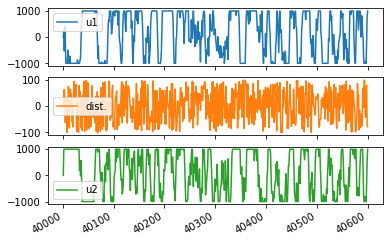

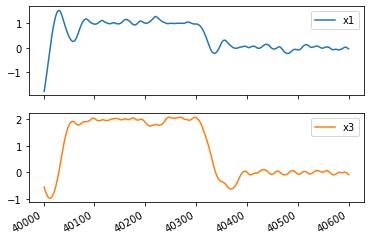

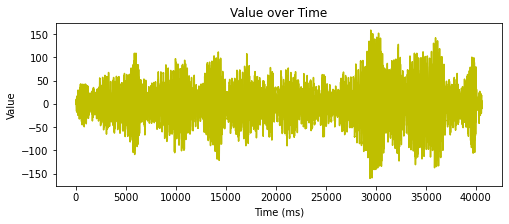

In [21]:
#max(df[{'diff1'}].values)
plot_cols = ['u1','dist.','u2']
plot_features = thisishistory[plot_cols][-600:]
_ = plot_features.plot(subplots=True)
plot_out= ['x1','x3']
plot_features = thisishistory[plot_out][-600:]
_ = plot_features.plot(subplots=True)

plt.figure(figsize=(8,3))
plt.title("Value over Time") 
plt.xlabel("Time (ms)") 
plt.ylabel("Value") 
plt.plot(range(num_sim), savew0[:], 'y')

In [22]:
ref

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.]])

In [23]:
thisishistory[2:]

,u1,dist.,u2,x1,x3,diff21,diff23,diff1,diff3
2,229.013742,2.198596,61.239602,0.000461,0.000126,0.000461,0.000126,0.000460,0.000125
3,500.000000,70.702575,72.232584,0.002376,0.000519,0.002376,0.000518,0.001915,0.000393
4,182.693358,96.842694,425.745459,0.005645,0.001908,0.005184,0.001782,0.003269,0.001389
5,78.116198,94.159020,436.415194,0.009412,0.005018,0.007036,0.004500,0.003767,0.003111
6,-113.846573,-94.729230,365.984028,0.013072,0.009726,0.007426,0.007818,0.003660,0.004707
...,...,...,...,...,...,...,...,...,...
40596,-987.484134,-41.752824,-1000.000000,0.022004,-0.008498,-0.012029,-0.019977,-0.008376,-0.012191
40597,-1000.000000,68.288072,-1000.000000,0.008883,-0.025366,-0.021497,-0.029059,-0.013121,-0.016868
40598,-61.230206,79.948287,-311.868047,-0.007006,-0.045432,-0.029010,-0.036934,-0.015889,-0.020066
40599,802.737606,-71.975486,577.851065,-0.021932,-0.065436,-0.030815,-0.040070,-0.014926,-0.020003


In [25]:
multi_resdense_model.save_weights('./checkpoints/1611changemassdist100changerefreinf_startsim40000_train500-250_batch16sim300-1000-1000-pen5')

In [26]:
def plot(self, plot_col, model=None, max_subplots=1):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(3, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Timestep ')

WindowGenerator.plot = plot

In [27]:
#multi_resdense_model.load_weights('./checkpoints/online0.16')
#multi_window.plot('diff1',model=multi_resdense_model)
#multi_window.plot('diff3',model=multi_resdense_model)

In [28]:
testdata= pd.read_csv('u1500damptestdata5k_0.001ssim.csv')

In [29]:
saveerrordiff=np.zeros((5000-1,2))
saveerrorstate=np.zeros((5000-1,2))
start_time = timeit.default_timer()
for i in range(5000-1):
    NNinput= standardize(testdata[i:i+1].values)
    curr=testdata.iloc[i:i+1,3:5].values
    grounddiff=  testdata.iloc[i+1:i+2,-2:].values
    groundstate= testdata.iloc[i+1:i+2,3:5].values
    prednorm=denormalize(multi_resdense_model(np.array([NNinput])))
    predstate= curr + prednorm
    errordiff= prednorm - grounddiff
    errorstate= predstate - groundstate
    saveerrordiff[i]= errordiff
    saveerrorstate[i]= errorstate
elapsed = timeit.default_timer() - start_time 
print("elapsed time: ", elapsed)
np.square(saveerrorstate).mean()

elapsed time:  20.844802150997566


4.126873759411581e-05

In [30]:
np.sqrt(np.square(saveerrorstate).mean())

0.006424074843439778

## Multistep Prediction

In [31]:
horizon=10
NUMDATA=5000 - horizon
saveerrordiff=np.zeros((NUMDATA,2))
saveerrorstate=np.zeros((NUMDATA,2))
temp= np.zeros((1,9))
start_time = timeit.default_timer()

for i in range(NUMDATA):
    prednormm= np.zeros((horizon,2))
    predstatee= np.zeros((horizon,2))
    grounddiffe=  testdata.iloc[i+1:i+1+horizon,-2:].values
    groundstates= testdata.iloc[i+1:i+1+horizon,3:5].values
    NNinput= (testdata[i:i+1+horizon].values)
    temp= np.array([NNinput[0]])
    allee=np.vstack((temp[-1:]))
    actions= NNinput[:,0:3]
    curr=testdata.iloc[i:i+1,3:5].values
    for j in range(horizon):
        #set actions
        prednorm=denormalize(multi_resdense_model(np.array([standardize(temp)])))
        predstate= curr + prednorm
        temp[-1,0:3] = actions[j+1,:]
        temp[-1,3:5] = predstate
        temp[-1, 5:7] = temp[-1,-2:] + prednorm
        temp[-1, -2:] = prednorm
        curr=predstate
        prednormm[j,:]=prednorm
        predstatee[j,:]=predstate
        allee= np.vstack((allee,temp[-1:]))
    errordiff= np.square(prednormm - grounddiffe).mean()
    errorstate= np.square(predstatee - groundstates).mean()
    saveerrordiff[i]= errordiff
    saveerrorstate[i]= errorstate
    
   
elapsed = timeit.default_timer() - start_time 
print("elapsed time: ", elapsed)
saveerrorstate.mean()

elapsed time:  141.66884470899822


0.010378273895266125

In [32]:
np.sqrt(saveerrorstate.mean())

0.10187381358948984